# Prep data for training stemseg convnet
data is:
- patches (same as 20171207 deepcell training (2nd npz) data)
- in two folders: masks and images
- resize images to 128x128 because conv layers are usually 2x2
- *i actually haven't checked that but jacob did it*
- train test split into 6 folders, train test & val

## Resize
- make images 128x128 and save in 'resized' folder
- reformat images to [-1,1]
- reformat masks to 0/1 **not bool** b/c io issues between skimage and PIL

In [1]:
'''
Resize images in batches
'''
import numpy as np
import argparse
import os
import os.path as osp
import glob
from skimage import util 
from skimage.io import imread, imshow, imsave
from skimage.transform import resize as imresize
from PIL import Image


In [2]:
in_cell_dir='/home/amandap/data/deepCellData/sets/patch_rois/cells'
in_mask_dir='/home/amandap/data/deepCellData/sets/patch_rois/cytomasks'
out_cell_dir='/home/amandap/data/deepCellData/sets/patch_rois/cells/resized'
out_mask_dir='/home/amandap/data/deepCellData/sets/patch_rois/cytomasks/resized'
out_size=(128,128)

In [3]:
sz = tuple(out_size)
print('Resizing to : ', sz)

Resizing to :  (128, 128)


In [4]:
imgs = glob.glob(osp.join('/', in_cell_dir, '*.tif'))
masks = glob.glob(osp.join('/', in_mask_dir, '*.tif'))
imgs.sort()
masks.sort()
assert len(imgs) == len(masks), 'images and masks mismatched'

In [36]:
print(len(imgs))
print(len(masks))
print(imgs[1])
print(masks[1])
img_fname=osp.basename(imgs[1])
print(img_fname)
mask_fname=osp.basename(masks[1])
print(mask_fname)
osp.join(out_cell_dir, imgs[1].split('/')[-1][:-4] + '_r' + str(sz[0]) + '.tif').replace('home/amandap/','')

430771
430771
/home/amandap/data/deepCellData/sets/patch_rois/cells/Batch0_X100_Y101_L0.tif
/home/amandap/data/deepCellData/sets/patch_rois/cytomasks/Batch0_X100_Y101_L0_mask.tif
Batch0_X100_Y101_L0.tif
Batch0_X100_Y101_L0_mask.tif


'/data/deepCellData/sets/patch_rois/cells/resized/Batch0_X100_Y101_L0_r128.tif'

In [11]:
for j in range(len(imgs)):
#for j in range(2):
    #I = imread(imgs[j], plugin='freeimage')
    #M = imread(masks[j], plugin='freeimage')

    img_dname=osp.join(out_cell_dir, imgs[j].split('/')[-1][:-4] + '_r' + str(sz[0]) + '.tif')#.replace('home/amandap/','')
    mask_dname=osp.join(out_mask_dir, masks[j].split('/')[-1][:-4] + '_r' + str(sz[0]) + '.tif')#.replace('home/amandap/','')
    
    I = imread(imgs[j])
    I = np.array(I)
    M = imread(masks[j])
    M = np.array(M)
    

    #if M.sum() == 0:
    #    continue
    #scale to (-1,1)
    Imin=np.min(I)
    Imax=np.max(I)
    Iint=I-Imin
    Iint/=(Imax-Imin)
    Iint*=2
    Isc=Iint-1
    M/=255

    Ir = imresize(Isc, sz, order=0)
    Mr = imresize(M, sz, order=0)
    #Mr = Mr.astype('bool')

    If = Image.fromarray(Ir)
    Mf = Image.fromarray(Mr)
    
    #img_fname=osp.basename(imgs[1])
    #mask_fname=osp.basename(masks[1])
    
    If.save(img_dname)
    Mf.save(mask_dname)

/home/amandap/anaconda3/envs/cellsegnet_env/lib/python3.6/site-packages/skimage/transform/_warps.py:84: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "


/home/amandap/data/deepCellData/sets/patch_rois/cells/resized/Batch9_X99_Y92_L1_r128.tif


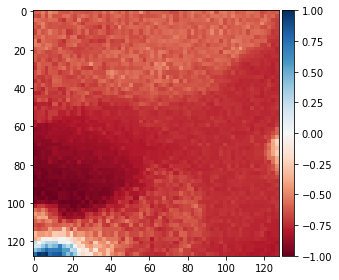

In [13]:
print(img_dname)
imshow(imread(img_dname))

array([[ 1.,  1.,  1., ...,  1.,  1.,  1.],
       [ 1.,  1.,  1., ...,  1.,  1.,  1.],
       [ 1.,  1.,  1., ...,  1.,  1.,  1.],
       ..., 
       [ 1.,  1.,  1., ...,  0.,  0.,  0.],
       [ 1.,  1.,  1., ...,  0.,  0.,  0.],
       [ 1.,  1.,  1., ...,  0.,  0.,  0.]], dtype=float32)

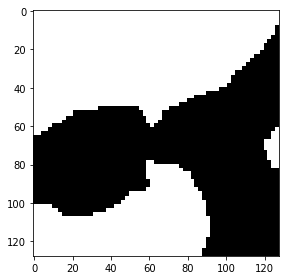

In [15]:
imshow(imread(mask_dname))
imread(mask_dname)

## Train Test Split

In [16]:
import shutil

In [18]:
img='/home/amandap/data/deepCellData/sets/patch_rois/cells/resized'
mask='/home/amandap/data/deepCellData/sets/patch_rois/cytomasks/resized'
im_train='/home/amandap/data/deepCellData/sets/patch_rois/cells/resized/train'
im_test='/home/amandap/data/deepCellData/sets/patch_rois/cells/resized/test'
im_val='/home/amandap/data/deepCellData/sets/patch_rois/cells/resized/val'
mask_train='/home/amandap/data/deepCellData/sets/patch_rois/cytomasks/resized/train'
mask_test='/home/amandap/data/deepCellData/sets/patch_rois/cytomasks/resized/test'
mask_val='/home/amandap/data/deepCellData/sets/patch_rois/cytomasks/resized/val'
p=0.8

In [19]:
img_files = [f for f in glob.glob(os.path.join(img, '*')) if not os.path.isdir(f)]
img_files.sort()

In [20]:
img_files[1]

'/home/amandap/data/deepCellData/sets/patch_rois/cells/resized/Batch0_X100_Y101_L0_r128.tif'

In [21]:
mask_files = [f for f in glob.glob(os.path.join(mask, '*')) if not os.path.isdir(f)]
mask_files.sort()

In [22]:
mask_files[1]

'/home/amandap/data/deepCellData/sets/patch_rois/cytomasks/resized/Batch0_X100_Y101_L0_mask_r128.tif'

In [23]:
assert len(img_files) == len(mask_files), 'mismatched img and mask file number'

In [25]:
n_files = len(img_files)
ridx = np.random.choice(np.arange(n_files), size=n_files, replace=False)

In [29]:
n_train = np.floor(n_files*p).astype('int32')
n_test = np.floor(n_files*(1-p)/2).astype('int32')
n_val = n_test

In [30]:
print('Training: %d | Testing: %d | Validation: %d' % (n_train, n_test, n_val))

Training: 344616 | Testing: 43077 | Validation: 43077


In [31]:
train_idx = ridx[:n_train]
test_idx = ridx[n_train:n_train+n_test]
val_idx = ridx[n_train+n_test:n_train+n_test+n_val]

In [32]:
def mkdir_if_not(path):
    if not os.path.exists(path):
        os.mkdir(path)

In [34]:
for pa in [im_train, im_test, im_val, mask_train, mask_test, mask_val]:
    mkdir_if_not(pa)

In [35]:
for i in range(len(train_idx)):
	print('Copying train idx: ', i)
	shutil.copy(img_files[train_idx[i]], im_train)
	shutil.copy(mask_files[train_idx[i]], mask_train)

Copying train idx:  0
Copying train idx:  1
Copying train idx:  2
Copying train idx:  3
Copying train idx:  4
Copying train idx:  5
Copying train idx:  6
Copying train idx:  7
Copying train idx:  8
Copying train idx:  9
Copying train idx:  10
Copying train idx:  11
Copying train idx:  12
Copying train idx:  13
Copying train idx:  14
Copying train idx:  15
Copying train idx:  16
Copying train idx:  17
Copying train idx:  18
Copying train idx:  19
Copying train idx:  20
Copying train idx:  21
Copying train idx:  22
Copying train idx:  23
Copying train idx:  24
Copying train idx:  25
Copying train idx:  26
Copying train idx:  27
Copying train idx:  28
Copying train idx:  29
Copying train idx:  30
Copying train idx:  31
Copying train idx:  32
Copying train idx:  33
Copying train idx:  34
Copying train idx:  35
Copying train idx:  36
Copying train idx:  37
Copying train idx:  38
Copying train idx:  39
Copying train idx:  40
Copying train idx:  41
Copying train idx:  42
Copying train idx:  4

Copying train idx:  384
Copying train idx:  385
Copying train idx:  386
Copying train idx:  387
Copying train idx:  388
Copying train idx:  389
Copying train idx:  390
Copying train idx:  391
Copying train idx:  392
Copying train idx:  393
Copying train idx:  394
Copying train idx:  395
Copying train idx:  396
Copying train idx:  397
Copying train idx:  398
Copying train idx:  399
Copying train idx:  400
Copying train idx:  401
Copying train idx:  402
Copying train idx:  403
Copying train idx:  404
Copying train idx:  405
Copying train idx:  406
Copying train idx:  407
Copying train idx:  408
Copying train idx:  409
Copying train idx:  410
Copying train idx:  411
Copying train idx:  412
Copying train idx:  413
Copying train idx:  414
Copying train idx:  415
Copying train idx:  416
Copying train idx:  417
Copying train idx:  418
Copying train idx:  419
Copying train idx:  420
Copying train idx:  421
Copying train idx:  422
Copying train idx:  423
Copying train idx:  424
Copying train id

Copying train idx:  756
Copying train idx:  757
Copying train idx:  758
Copying train idx:  759
Copying train idx:  760
Copying train idx:  761
Copying train idx:  762
Copying train idx:  763
Copying train idx:  764
Copying train idx:  765
Copying train idx:  766
Copying train idx:  767
Copying train idx:  768
Copying train idx:  769
Copying train idx:  770
Copying train idx:  771
Copying train idx:  772
Copying train idx:  773
Copying train idx:  774
Copying train idx:  775
Copying train idx:  776
Copying train idx:  777
Copying train idx:  778
Copying train idx:  779
Copying train idx:  780
Copying train idx:  781
Copying train idx:  782
Copying train idx:  783
Copying train idx:  784
Copying train idx:  785
Copying train idx:  786
Copying train idx:  787
Copying train idx:  788
Copying train idx:  789
Copying train idx:  790
Copying train idx:  791
Copying train idx:  792
Copying train idx:  793
Copying train idx:  794
Copying train idx:  795
Copying train idx:  796
Copying train id

Copying train idx:  1127
Copying train idx:  1128
Copying train idx:  1129
Copying train idx:  1130
Copying train idx:  1131
Copying train idx:  1132
Copying train idx:  1133
Copying train idx:  1134
Copying train idx:  1135
Copying train idx:  1136
Copying train idx:  1137
Copying train idx:  1138
Copying train idx:  1139
Copying train idx:  1140
Copying train idx:  1141
Copying train idx:  1142
Copying train idx:  1143
Copying train idx:  1144
Copying train idx:  1145
Copying train idx:  1146
Copying train idx:  1147
Copying train idx:  1148
Copying train idx:  1149
Copying train idx:  1150
Copying train idx:  1151
Copying train idx:  1152
Copying train idx:  1153
Copying train idx:  1154
Copying train idx:  1155
Copying train idx:  1156
Copying train idx:  1157
Copying train idx:  1158
Copying train idx:  1159
Copying train idx:  1160
Copying train idx:  1161
Copying train idx:  1162
Copying train idx:  1163
Copying train idx:  1164
Copying train idx:  1165
Copying train idx:  1166


Copying train idx:  1481
Copying train idx:  1482
Copying train idx:  1483
Copying train idx:  1484
Copying train idx:  1485
Copying train idx:  1486
Copying train idx:  1487
Copying train idx:  1488
Copying train idx:  1489
Copying train idx:  1490
Copying train idx:  1491
Copying train idx:  1492
Copying train idx:  1493
Copying train idx:  1494
Copying train idx:  1495
Copying train idx:  1496
Copying train idx:  1497
Copying train idx:  1498
Copying train idx:  1499
Copying train idx:  1500
Copying train idx:  1501
Copying train idx:  1502
Copying train idx:  1503
Copying train idx:  1504
Copying train idx:  1505
Copying train idx:  1506
Copying train idx:  1507
Copying train idx:  1508
Copying train idx:  1509
Copying train idx:  1510
Copying train idx:  1511
Copying train idx:  1512
Copying train idx:  1513
Copying train idx:  1514
Copying train idx:  1515
Copying train idx:  1516
Copying train idx:  1517
Copying train idx:  1518
Copying train idx:  1519
Copying train idx:  1520


Copying train idx:  1839
Copying train idx:  1840
Copying train idx:  1841
Copying train idx:  1842
Copying train idx:  1843
Copying train idx:  1844
Copying train idx:  1845
Copying train idx:  1846
Copying train idx:  1847
Copying train idx:  1848
Copying train idx:  1849
Copying train idx:  1850
Copying train idx:  1851
Copying train idx:  1852
Copying train idx:  1853
Copying train idx:  1854
Copying train idx:  1855
Copying train idx:  1856
Copying train idx:  1857
Copying train idx:  1858
Copying train idx:  1859
Copying train idx:  1860
Copying train idx:  1861
Copying train idx:  1862
Copying train idx:  1863
Copying train idx:  1864
Copying train idx:  1865
Copying train idx:  1866
Copying train idx:  1867
Copying train idx:  1868
Copying train idx:  1869
Copying train idx:  1870
Copying train idx:  1871
Copying train idx:  1872
Copying train idx:  1873
Copying train idx:  1874
Copying train idx:  1875
Copying train idx:  1876
Copying train idx:  1877
Copying train idx:  1878


Copying train idx:  2195
Copying train idx:  2196
Copying train idx:  2197
Copying train idx:  2198
Copying train idx:  2199
Copying train idx:  2200
Copying train idx:  2201
Copying train idx:  2202
Copying train idx:  2203
Copying train idx:  2204
Copying train idx:  2205
Copying train idx:  2206
Copying train idx:  2207
Copying train idx:  2208
Copying train idx:  2209
Copying train idx:  2210
Copying train idx:  2211
Copying train idx:  2212
Copying train idx:  2213
Copying train idx:  2214
Copying train idx:  2215
Copying train idx:  2216
Copying train idx:  2217
Copying train idx:  2218
Copying train idx:  2219
Copying train idx:  2220
Copying train idx:  2221
Copying train idx:  2222
Copying train idx:  2223
Copying train idx:  2224
Copying train idx:  2225
Copying train idx:  2226
Copying train idx:  2227
Copying train idx:  2228
Copying train idx:  2229
Copying train idx:  2230
Copying train idx:  2231
Copying train idx:  2232
Copying train idx:  2233
Copying train idx:  2234


Copying train idx:  2567
Copying train idx:  2568
Copying train idx:  2569
Copying train idx:  2570
Copying train idx:  2571
Copying train idx:  2572
Copying train idx:  2573
Copying train idx:  2574
Copying train idx:  2575
Copying train idx:  2576
Copying train idx:  2577
Copying train idx:  2578
Copying train idx:  2579
Copying train idx:  2580
Copying train idx:  2581
Copying train idx:  2582
Copying train idx:  2583
Copying train idx:  2584
Copying train idx:  2585
Copying train idx:  2586
Copying train idx:  2587
Copying train idx:  2588
Copying train idx:  2589
Copying train idx:  2590
Copying train idx:  2591
Copying train idx:  2592
Copying train idx:  2593
Copying train idx:  2594
Copying train idx:  2595
Copying train idx:  2596
Copying train idx:  2597
Copying train idx:  2598
Copying train idx:  2599
Copying train idx:  2600
Copying train idx:  2601
Copying train idx:  2602
Copying train idx:  2603
Copying train idx:  2604
Copying train idx:  2605
Copying train idx:  2606


Copying train idx:  2921
Copying train idx:  2922
Copying train idx:  2923
Copying train idx:  2924
Copying train idx:  2925
Copying train idx:  2926
Copying train idx:  2927
Copying train idx:  2928
Copying train idx:  2929
Copying train idx:  2930
Copying train idx:  2931
Copying train idx:  2932
Copying train idx:  2933
Copying train idx:  2934
Copying train idx:  2935
Copying train idx:  2936
Copying train idx:  2937
Copying train idx:  2938
Copying train idx:  2939
Copying train idx:  2940
Copying train idx:  2941
Copying train idx:  2942
Copying train idx:  2943
Copying train idx:  2944
Copying train idx:  2945
Copying train idx:  2946
Copying train idx:  2947
Copying train idx:  2948
Copying train idx:  2949
Copying train idx:  2950
Copying train idx:  2951
Copying train idx:  2952
Copying train idx:  2953
Copying train idx:  2954
Copying train idx:  2955
Copying train idx:  2956
Copying train idx:  2957
Copying train idx:  2958
Copying train idx:  2959
Copying train idx:  2960


Copying train idx:  3283
Copying train idx:  3284
Copying train idx:  3285
Copying train idx:  3286
Copying train idx:  3287
Copying train idx:  3288
Copying train idx:  3289
Copying train idx:  3290
Copying train idx:  3291
Copying train idx:  3292
Copying train idx:  3293
Copying train idx:  3294
Copying train idx:  3295
Copying train idx:  3296
Copying train idx:  3297
Copying train idx:  3298
Copying train idx:  3299
Copying train idx:  3300
Copying train idx:  3301
Copying train idx:  3302
Copying train idx:  3303
Copying train idx:  3304
Copying train idx:  3305
Copying train idx:  3306
Copying train idx:  3307
Copying train idx:  3308
Copying train idx:  3309
Copying train idx:  3310
Copying train idx:  3311
Copying train idx:  3312
Copying train idx:  3313
Copying train idx:  3314
Copying train idx:  3315
Copying train idx:  3316
Copying train idx:  3317
Copying train idx:  3318
Copying train idx:  3319
Copying train idx:  3320
Copying train idx:  3321
Copying train idx:  3322


Copying train idx:  3647
Copying train idx:  3648
Copying train idx:  3649
Copying train idx:  3650
Copying train idx:  3651
Copying train idx:  3652
Copying train idx:  3653
Copying train idx:  3654
Copying train idx:  3655
Copying train idx:  3656
Copying train idx:  3657
Copying train idx:  3658
Copying train idx:  3659
Copying train idx:  3660
Copying train idx:  3661
Copying train idx:  3662
Copying train idx:  3663
Copying train idx:  3664
Copying train idx:  3665
Copying train idx:  3666
Copying train idx:  3667
Copying train idx:  3668
Copying train idx:  3669
Copying train idx:  3670
Copying train idx:  3671
Copying train idx:  3672
Copying train idx:  3673
Copying train idx:  3674
Copying train idx:  3675
Copying train idx:  3676
Copying train idx:  3677
Copying train idx:  3678
Copying train idx:  3679
Copying train idx:  3680
Copying train idx:  3681
Copying train idx:  3682
Copying train idx:  3683
Copying train idx:  3684
Copying train idx:  3685
Copying train idx:  3686


Copying train idx:  4023
Copying train idx:  4024
Copying train idx:  4025
Copying train idx:  4026
Copying train idx:  4027
Copying train idx:  4028
Copying train idx:  4029
Copying train idx:  4030
Copying train idx:  4031
Copying train idx:  4032
Copying train idx:  4033
Copying train idx:  4034
Copying train idx:  4035
Copying train idx:  4036
Copying train idx:  4037
Copying train idx:  4038
Copying train idx:  4039
Copying train idx:  4040
Copying train idx:  4041
Copying train idx:  4042
Copying train idx:  4043
Copying train idx:  4044
Copying train idx:  4045
Copying train idx:  4046
Copying train idx:  4047
Copying train idx:  4048
Copying train idx:  4049
Copying train idx:  4050
Copying train idx:  4051
Copying train idx:  4052
Copying train idx:  4053
Copying train idx:  4054
Copying train idx:  4055
Copying train idx:  4056
Copying train idx:  4057
Copying train idx:  4058
Copying train idx:  4059
Copying train idx:  4060
Copying train idx:  4061
Copying train idx:  4062


Copying train idx:  4387
Copying train idx:  4388
Copying train idx:  4389
Copying train idx:  4390
Copying train idx:  4391
Copying train idx:  4392
Copying train idx:  4393
Copying train idx:  4394
Copying train idx:  4395
Copying train idx:  4396
Copying train idx:  4397
Copying train idx:  4398
Copying train idx:  4399
Copying train idx:  4400
Copying train idx:  4401
Copying train idx:  4402
Copying train idx:  4403
Copying train idx:  4404
Copying train idx:  4405
Copying train idx:  4406
Copying train idx:  4407
Copying train idx:  4408
Copying train idx:  4409
Copying train idx:  4410
Copying train idx:  4411
Copying train idx:  4412
Copying train idx:  4413
Copying train idx:  4414
Copying train idx:  4415
Copying train idx:  4416
Copying train idx:  4417
Copying train idx:  4418
Copying train idx:  4419
Copying train idx:  4420
Copying train idx:  4421
Copying train idx:  4422
Copying train idx:  4423
Copying train idx:  4424
Copying train idx:  4425
Copying train idx:  4426


Copying train idx:  4757
Copying train idx:  4758
Copying train idx:  4759
Copying train idx:  4760
Copying train idx:  4761
Copying train idx:  4762
Copying train idx:  4763
Copying train idx:  4764
Copying train idx:  4765
Copying train idx:  4766
Copying train idx:  4767
Copying train idx:  4768
Copying train idx:  4769
Copying train idx:  4770
Copying train idx:  4771
Copying train idx:  4772
Copying train idx:  4773
Copying train idx:  4774
Copying train idx:  4775
Copying train idx:  4776
Copying train idx:  4777
Copying train idx:  4778
Copying train idx:  4779
Copying train idx:  4780
Copying train idx:  4781
Copying train idx:  4782
Copying train idx:  4783
Copying train idx:  4784
Copying train idx:  4785
Copying train idx:  4786
Copying train idx:  4787
Copying train idx:  4788
Copying train idx:  4789
Copying train idx:  4790
Copying train idx:  4791
Copying train idx:  4792
Copying train idx:  4793
Copying train idx:  4794
Copying train idx:  4795
Copying train idx:  4796


Copying train idx:  5128
Copying train idx:  5129
Copying train idx:  5130
Copying train idx:  5131
Copying train idx:  5132
Copying train idx:  5133
Copying train idx:  5134
Copying train idx:  5135
Copying train idx:  5136
Copying train idx:  5137
Copying train idx:  5138
Copying train idx:  5139
Copying train idx:  5140
Copying train idx:  5141
Copying train idx:  5142
Copying train idx:  5143
Copying train idx:  5144
Copying train idx:  5145
Copying train idx:  5146
Copying train idx:  5147
Copying train idx:  5148
Copying train idx:  5149
Copying train idx:  5150
Copying train idx:  5151
Copying train idx:  5152
Copying train idx:  5153
Copying train idx:  5154
Copying train idx:  5155
Copying train idx:  5156
Copying train idx:  5157
Copying train idx:  5158
Copying train idx:  5159
Copying train idx:  5160
Copying train idx:  5161
Copying train idx:  5162
Copying train idx:  5163
Copying train idx:  5164
Copying train idx:  5165
Copying train idx:  5166
Copying train idx:  5167


Copying train idx:  5494
Copying train idx:  5495
Copying train idx:  5496
Copying train idx:  5497
Copying train idx:  5498
Copying train idx:  5499
Copying train idx:  5500
Copying train idx:  5501
Copying train idx:  5502
Copying train idx:  5503
Copying train idx:  5504
Copying train idx:  5505
Copying train idx:  5506
Copying train idx:  5507
Copying train idx:  5508
Copying train idx:  5509
Copying train idx:  5510
Copying train idx:  5511
Copying train idx:  5512
Copying train idx:  5513
Copying train idx:  5514
Copying train idx:  5515
Copying train idx:  5516
Copying train idx:  5517
Copying train idx:  5518
Copying train idx:  5519
Copying train idx:  5520
Copying train idx:  5521
Copying train idx:  5522
Copying train idx:  5523
Copying train idx:  5524
Copying train idx:  5525
Copying train idx:  5526
Copying train idx:  5527
Copying train idx:  5528
Copying train idx:  5529
Copying train idx:  5530
Copying train idx:  5531
Copying train idx:  5532
Copying train idx:  5533


Copying train idx:  5874
Copying train idx:  5875
Copying train idx:  5876
Copying train idx:  5877
Copying train idx:  5878
Copying train idx:  5879
Copying train idx:  5880
Copying train idx:  5881
Copying train idx:  5882
Copying train idx:  5883
Copying train idx:  5884
Copying train idx:  5885
Copying train idx:  5886
Copying train idx:  5887
Copying train idx:  5888
Copying train idx:  5889
Copying train idx:  5890
Copying train idx:  5891
Copying train idx:  5892
Copying train idx:  5893
Copying train idx:  5894
Copying train idx:  5895
Copying train idx:  5896
Copying train idx:  5897
Copying train idx:  5898
Copying train idx:  5899
Copying train idx:  5900
Copying train idx:  5901
Copying train idx:  5902
Copying train idx:  5903
Copying train idx:  5904
Copying train idx:  5905
Copying train idx:  5906
Copying train idx:  5907
Copying train idx:  5908
Copying train idx:  5909
Copying train idx:  5910
Copying train idx:  5911
Copying train idx:  5912
Copying train idx:  5913


Copying train idx:  6259
Copying train idx:  6260
Copying train idx:  6261
Copying train idx:  6262
Copying train idx:  6263
Copying train idx:  6264
Copying train idx:  6265
Copying train idx:  6266
Copying train idx:  6267
Copying train idx:  6268
Copying train idx:  6269
Copying train idx:  6270
Copying train idx:  6271
Copying train idx:  6272
Copying train idx:  6273
Copying train idx:  6274
Copying train idx:  6275
Copying train idx:  6276
Copying train idx:  6277
Copying train idx:  6278
Copying train idx:  6279
Copying train idx:  6280
Copying train idx:  6281
Copying train idx:  6282
Copying train idx:  6283
Copying train idx:  6284
Copying train idx:  6285
Copying train idx:  6286
Copying train idx:  6287
Copying train idx:  6288
Copying train idx:  6289
Copying train idx:  6290
Copying train idx:  6291
Copying train idx:  6292
Copying train idx:  6293
Copying train idx:  6294
Copying train idx:  6295
Copying train idx:  6296
Copying train idx:  6297
Copying train idx:  6298


Copying train idx:  6639
Copying train idx:  6640
Copying train idx:  6641
Copying train idx:  6642
Copying train idx:  6643
Copying train idx:  6644
Copying train idx:  6645
Copying train idx:  6646
Copying train idx:  6647
Copying train idx:  6648
Copying train idx:  6649
Copying train idx:  6650
Copying train idx:  6651
Copying train idx:  6652
Copying train idx:  6653
Copying train idx:  6654
Copying train idx:  6655
Copying train idx:  6656
Copying train idx:  6657
Copying train idx:  6658
Copying train idx:  6659
Copying train idx:  6660
Copying train idx:  6661
Copying train idx:  6662
Copying train idx:  6663
Copying train idx:  6664
Copying train idx:  6665
Copying train idx:  6666
Copying train idx:  6667
Copying train idx:  6668
Copying train idx:  6669
Copying train idx:  6670
Copying train idx:  6671
Copying train idx:  6672
Copying train idx:  6673
Copying train idx:  6674
Copying train idx:  6675
Copying train idx:  6676
Copying train idx:  6677
Copying train idx:  6678


Copying train idx:  7027
Copying train idx:  7028
Copying train idx:  7029
Copying train idx:  7030
Copying train idx:  7031
Copying train idx:  7032
Copying train idx:  7033
Copying train idx:  7034
Copying train idx:  7035
Copying train idx:  7036
Copying train idx:  7037
Copying train idx:  7038
Copying train idx:  7039
Copying train idx:  7040
Copying train idx:  7041
Copying train idx:  7042
Copying train idx:  7043
Copying train idx:  7044
Copying train idx:  7045
Copying train idx:  7046
Copying train idx:  7047
Copying train idx:  7048
Copying train idx:  7049
Copying train idx:  7050
Copying train idx:  7051
Copying train idx:  7052
Copying train idx:  7053
Copying train idx:  7054
Copying train idx:  7055
Copying train idx:  7056
Copying train idx:  7057
Copying train idx:  7058
Copying train idx:  7059
Copying train idx:  7060
Copying train idx:  7061
Copying train idx:  7062
Copying train idx:  7063
Copying train idx:  7064
Copying train idx:  7065
Copying train idx:  7066


Copying train idx:  7390
Copying train idx:  7391
Copying train idx:  7392
Copying train idx:  7393
Copying train idx:  7394
Copying train idx:  7395
Copying train idx:  7396
Copying train idx:  7397
Copying train idx:  7398
Copying train idx:  7399
Copying train idx:  7400
Copying train idx:  7401
Copying train idx:  7402
Copying train idx:  7403
Copying train idx:  7404
Copying train idx:  7405
Copying train idx:  7406
Copying train idx:  7407
Copying train idx:  7408
Copying train idx:  7409
Copying train idx:  7410
Copying train idx:  7411
Copying train idx:  7412
Copying train idx:  7413
Copying train idx:  7414
Copying train idx:  7415
Copying train idx:  7416
Copying train idx:  7417
Copying train idx:  7418
Copying train idx:  7419
Copying train idx:  7420
Copying train idx:  7421
Copying train idx:  7422
Copying train idx:  7423
Copying train idx:  7424
Copying train idx:  7425
Copying train idx:  7426
Copying train idx:  7427
Copying train idx:  7428
Copying train idx:  7429


Copying train idx:  7746
Copying train idx:  7747
Copying train idx:  7748
Copying train idx:  7749
Copying train idx:  7750
Copying train idx:  7751
Copying train idx:  7752
Copying train idx:  7753
Copying train idx:  7754
Copying train idx:  7755
Copying train idx:  7756
Copying train idx:  7757
Copying train idx:  7758
Copying train idx:  7759
Copying train idx:  7760
Copying train idx:  7761
Copying train idx:  7762
Copying train idx:  7763
Copying train idx:  7764
Copying train idx:  7765
Copying train idx:  7766
Copying train idx:  7767
Copying train idx:  7768
Copying train idx:  7769
Copying train idx:  7770
Copying train idx:  7771
Copying train idx:  7772
Copying train idx:  7773
Copying train idx:  7774
Copying train idx:  7775
Copying train idx:  7776
Copying train idx:  7777
Copying train idx:  7778
Copying train idx:  7779
Copying train idx:  7780
Copying train idx:  7781
Copying train idx:  7782
Copying train idx:  7783
Copying train idx:  7784
Copying train idx:  7785


Copying train idx:  8094
Copying train idx:  8095
Copying train idx:  8096
Copying train idx:  8097
Copying train idx:  8098
Copying train idx:  8099
Copying train idx:  8100
Copying train idx:  8101
Copying train idx:  8102
Copying train idx:  8103
Copying train idx:  8104
Copying train idx:  8105
Copying train idx:  8106
Copying train idx:  8107
Copying train idx:  8108
Copying train idx:  8109
Copying train idx:  8110
Copying train idx:  8111
Copying train idx:  8112
Copying train idx:  8113
Copying train idx:  8114
Copying train idx:  8115
Copying train idx:  8116
Copying train idx:  8117
Copying train idx:  8118
Copying train idx:  8119
Copying train idx:  8120
Copying train idx:  8121
Copying train idx:  8122
Copying train idx:  8123
Copying train idx:  8124
Copying train idx:  8125
Copying train idx:  8126
Copying train idx:  8127
Copying train idx:  8128
Copying train idx:  8129
Copying train idx:  8130
Copying train idx:  8131
Copying train idx:  8132
Copying train idx:  8133


Copying train idx:  8435
Copying train idx:  8436
Copying train idx:  8437
Copying train idx:  8438
Copying train idx:  8439
Copying train idx:  8440
Copying train idx:  8441
Copying train idx:  8442
Copying train idx:  8443
Copying train idx:  8444
Copying train idx:  8445
Copying train idx:  8446
Copying train idx:  8447
Copying train idx:  8448
Copying train idx:  8449
Copying train idx:  8450
Copying train idx:  8451
Copying train idx:  8452
Copying train idx:  8453
Copying train idx:  8454
Copying train idx:  8455
Copying train idx:  8456
Copying train idx:  8457
Copying train idx:  8458
Copying train idx:  8459
Copying train idx:  8460
Copying train idx:  8461
Copying train idx:  8462
Copying train idx:  8463
Copying train idx:  8464
Copying train idx:  8465
Copying train idx:  8466
Copying train idx:  8467
Copying train idx:  8468
Copying train idx:  8469
Copying train idx:  8470
Copying train idx:  8471
Copying train idx:  8472
Copying train idx:  8473
Copying train idx:  8474


Copying train idx:  8777
Copying train idx:  8778
Copying train idx:  8779
Copying train idx:  8780
Copying train idx:  8781
Copying train idx:  8782
Copying train idx:  8783
Copying train idx:  8784
Copying train idx:  8785
Copying train idx:  8786
Copying train idx:  8787
Copying train idx:  8788
Copying train idx:  8789
Copying train idx:  8790
Copying train idx:  8791
Copying train idx:  8792
Copying train idx:  8793
Copying train idx:  8794
Copying train idx:  8795
Copying train idx:  8796
Copying train idx:  8797
Copying train idx:  8798
Copying train idx:  8799
Copying train idx:  8800
Copying train idx:  8801
Copying train idx:  8802
Copying train idx:  8803
Copying train idx:  8804
Copying train idx:  8805
Copying train idx:  8806
Copying train idx:  8807
Copying train idx:  8808
Copying train idx:  8809
Copying train idx:  8810
Copying train idx:  8811
Copying train idx:  8812
Copying train idx:  8813
Copying train idx:  8814
Copying train idx:  8815
Copying train idx:  8816


Copying train idx:  9375
Copying train idx:  9376
Copying train idx:  9377
Copying train idx:  9378
Copying train idx:  9379
Copying train idx:  9380
Copying train idx:  9381
Copying train idx:  9382
Copying train idx:  9383
Copying train idx:  9384
Copying train idx:  9385
Copying train idx:  9386
Copying train idx:  9387
Copying train idx:  9388
Copying train idx:  9389
Copying train idx:  9390
Copying train idx:  9391
Copying train idx:  9392
Copying train idx:  9393
Copying train idx:  9394
Copying train idx:  9395
Copying train idx:  9396
Copying train idx:  9397
Copying train idx:  9398
Copying train idx:  9399
Copying train idx:  9400
Copying train idx:  9401
Copying train idx:  9402
Copying train idx:  9403
Copying train idx:  9404
Copying train idx:  9405
Copying train idx:  9406
Copying train idx:  9407
Copying train idx:  9408
Copying train idx:  9409
Copying train idx:  9410
Copying train idx:  9411
Copying train idx:  9412
Copying train idx:  9413
Copying train idx:  9414


Copying train idx:  9708
Copying train idx:  9709
Copying train idx:  9710
Copying train idx:  9711
Copying train idx:  9712
Copying train idx:  9713
Copying train idx:  9714
Copying train idx:  9715
Copying train idx:  9716
Copying train idx:  9717
Copying train idx:  9718
Copying train idx:  9719
Copying train idx:  9720
Copying train idx:  9721
Copying train idx:  9722
Copying train idx:  9723
Copying train idx:  9724
Copying train idx:  9725
Copying train idx:  9726
Copying train idx:  9727
Copying train idx:  9728
Copying train idx:  9729
Copying train idx:  9730
Copying train idx:  9731
Copying train idx:  9732
Copying train idx:  9733
Copying train idx:  9734
Copying train idx:  9735
Copying train idx:  9736
Copying train idx:  9737
Copying train idx:  9738
Copying train idx:  9739
Copying train idx:  9740
Copying train idx:  9741
Copying train idx:  9742
Copying train idx:  9743
Copying train idx:  9744
Copying train idx:  9745
Copying train idx:  9746
Copying train idx:  9747


Copying train idx:  10045
Copying train idx:  10046
Copying train idx:  10047
Copying train idx:  10048
Copying train idx:  10049
Copying train idx:  10050
Copying train idx:  10051
Copying train idx:  10052
Copying train idx:  10053
Copying train idx:  10054
Copying train idx:  10055
Copying train idx:  10056
Copying train idx:  10057
Copying train idx:  10058
Copying train idx:  10059
Copying train idx:  10060
Copying train idx:  10061
Copying train idx:  10062
Copying train idx:  10063
Copying train idx:  10064
Copying train idx:  10065
Copying train idx:  10066
Copying train idx:  10067
Copying train idx:  10068
Copying train idx:  10069
Copying train idx:  10070
Copying train idx:  10071
Copying train idx:  10072
Copying train idx:  10073
Copying train idx:  10074
Copying train idx:  10075
Copying train idx:  10076
Copying train idx:  10077
Copying train idx:  10078
Copying train idx:  10079
Copying train idx:  10080
Copying train idx:  10081
Copying train idx:  10082
Copying trai

Copying train idx:  10397
Copying train idx:  10398
Copying train idx:  10399
Copying train idx:  10400
Copying train idx:  10401
Copying train idx:  10402
Copying train idx:  10403
Copying train idx:  10404
Copying train idx:  10405
Copying train idx:  10406
Copying train idx:  10407
Copying train idx:  10408
Copying train idx:  10409
Copying train idx:  10410
Copying train idx:  10411
Copying train idx:  10412
Copying train idx:  10413
Copying train idx:  10414
Copying train idx:  10415
Copying train idx:  10416
Copying train idx:  10417
Copying train idx:  10418
Copying train idx:  10419
Copying train idx:  10420
Copying train idx:  10421
Copying train idx:  10422
Copying train idx:  10423
Copying train idx:  10424
Copying train idx:  10425
Copying train idx:  10426
Copying train idx:  10427
Copying train idx:  10428
Copying train idx:  10429
Copying train idx:  10430
Copying train idx:  10431
Copying train idx:  10432
Copying train idx:  10433
Copying train idx:  10434
Copying trai

Copying train idx:  10750
Copying train idx:  10751
Copying train idx:  10752
Copying train idx:  10753
Copying train idx:  10754
Copying train idx:  10755
Copying train idx:  10756
Copying train idx:  10757
Copying train idx:  10758
Copying train idx:  10759
Copying train idx:  10760
Copying train idx:  10761
Copying train idx:  10762
Copying train idx:  10763
Copying train idx:  10764
Copying train idx:  10765
Copying train idx:  10766
Copying train idx:  10767
Copying train idx:  10768
Copying train idx:  10769
Copying train idx:  10770
Copying train idx:  10771
Copying train idx:  10772
Copying train idx:  10773
Copying train idx:  10774
Copying train idx:  10775
Copying train idx:  10776
Copying train idx:  10777
Copying train idx:  10778
Copying train idx:  10779
Copying train idx:  10780
Copying train idx:  10781
Copying train idx:  10782
Copying train idx:  10783
Copying train idx:  10784
Copying train idx:  10785
Copying train idx:  10786
Copying train idx:  10787
Copying trai

Copying train idx:  11121
Copying train idx:  11122
Copying train idx:  11123
Copying train idx:  11124
Copying train idx:  11125
Copying train idx:  11126
Copying train idx:  11127
Copying train idx:  11128
Copying train idx:  11129
Copying train idx:  11130
Copying train idx:  11131
Copying train idx:  11132
Copying train idx:  11133
Copying train idx:  11134
Copying train idx:  11135
Copying train idx:  11136
Copying train idx:  11137
Copying train idx:  11138
Copying train idx:  11139
Copying train idx:  11140
Copying train idx:  11141
Copying train idx:  11142
Copying train idx:  11143
Copying train idx:  11144
Copying train idx:  11145
Copying train idx:  11146
Copying train idx:  11147
Copying train idx:  11148
Copying train idx:  11149
Copying train idx:  11150
Copying train idx:  11151
Copying train idx:  11152
Copying train idx:  11153
Copying train idx:  11154
Copying train idx:  11155
Copying train idx:  11156
Copying train idx:  11157
Copying train idx:  11158
Copying trai

Copying train idx:  11508
Copying train idx:  11509
Copying train idx:  11510
Copying train idx:  11511
Copying train idx:  11512
Copying train idx:  11513
Copying train idx:  11514
Copying train idx:  11515
Copying train idx:  11516
Copying train idx:  11517
Copying train idx:  11518
Copying train idx:  11519
Copying train idx:  11520
Copying train idx:  11521
Copying train idx:  11522
Copying train idx:  11523
Copying train idx:  11524
Copying train idx:  11525
Copying train idx:  11526
Copying train idx:  11527
Copying train idx:  11528
Copying train idx:  11529
Copying train idx:  11530
Copying train idx:  11531
Copying train idx:  11532
Copying train idx:  11533
Copying train idx:  11534
Copying train idx:  11535
Copying train idx:  11536
Copying train idx:  11537
Copying train idx:  11538
Copying train idx:  11539
Copying train idx:  11540
Copying train idx:  11541
Copying train idx:  11542
Copying train idx:  11543
Copying train idx:  11544
Copying train idx:  11545
Copying trai

Copying train idx:  11860
Copying train idx:  11861
Copying train idx:  11862
Copying train idx:  11863
Copying train idx:  11864
Copying train idx:  11865
Copying train idx:  11866
Copying train idx:  11867
Copying train idx:  11868
Copying train idx:  11869
Copying train idx:  11870
Copying train idx:  11871
Copying train idx:  11872
Copying train idx:  11873
Copying train idx:  11874
Copying train idx:  11875
Copying train idx:  11876
Copying train idx:  11877
Copying train idx:  11878
Copying train idx:  11879
Copying train idx:  11880
Copying train idx:  11881
Copying train idx:  11882
Copying train idx:  11883
Copying train idx:  11884
Copying train idx:  11885
Copying train idx:  11886
Copying train idx:  11887
Copying train idx:  11888
Copying train idx:  11889
Copying train idx:  11890
Copying train idx:  11891
Copying train idx:  11892
Copying train idx:  11893
Copying train idx:  11894
Copying train idx:  11895
Copying train idx:  11896
Copying train idx:  11897
Copying trai

Copying train idx:  12230
Copying train idx:  12231
Copying train idx:  12232
Copying train idx:  12233
Copying train idx:  12234
Copying train idx:  12235
Copying train idx:  12236
Copying train idx:  12237
Copying train idx:  12238
Copying train idx:  12239
Copying train idx:  12240
Copying train idx:  12241
Copying train idx:  12242
Copying train idx:  12243
Copying train idx:  12244
Copying train idx:  12245
Copying train idx:  12246
Copying train idx:  12247
Copying train idx:  12248
Copying train idx:  12249
Copying train idx:  12250
Copying train idx:  12251
Copying train idx:  12252
Copying train idx:  12253
Copying train idx:  12254
Copying train idx:  12255
Copying train idx:  12256
Copying train idx:  12257
Copying train idx:  12258
Copying train idx:  12259
Copying train idx:  12260
Copying train idx:  12261
Copying train idx:  12262
Copying train idx:  12263
Copying train idx:  12264
Copying train idx:  12265
Copying train idx:  12266
Copying train idx:  12267
Copying trai

Copying train idx:  12598
Copying train idx:  12599
Copying train idx:  12600
Copying train idx:  12601
Copying train idx:  12602
Copying train idx:  12603
Copying train idx:  12604
Copying train idx:  12605
Copying train idx:  12606
Copying train idx:  12607
Copying train idx:  12608
Copying train idx:  12609
Copying train idx:  12610
Copying train idx:  12611
Copying train idx:  12612
Copying train idx:  12613
Copying train idx:  12614
Copying train idx:  12615
Copying train idx:  12616
Copying train idx:  12617
Copying train idx:  12618
Copying train idx:  12619
Copying train idx:  12620
Copying train idx:  12621
Copying train idx:  12622
Copying train idx:  12623
Copying train idx:  12624
Copying train idx:  12625
Copying train idx:  12626
Copying train idx:  12627
Copying train idx:  12628
Copying train idx:  12629
Copying train idx:  12630
Copying train idx:  12631
Copying train idx:  12632
Copying train idx:  12633
Copying train idx:  12634
Copying train idx:  12635
Copying trai

Copying train idx:  12952
Copying train idx:  12953
Copying train idx:  12954
Copying train idx:  12955
Copying train idx:  12956
Copying train idx:  12957
Copying train idx:  12958
Copying train idx:  12959
Copying train idx:  12960
Copying train idx:  12961
Copying train idx:  12962
Copying train idx:  12963
Copying train idx:  12964
Copying train idx:  12965
Copying train idx:  12966
Copying train idx:  12967
Copying train idx:  12968
Copying train idx:  12969
Copying train idx:  12970
Copying train idx:  12971
Copying train idx:  12972
Copying train idx:  12973
Copying train idx:  12974
Copying train idx:  12975
Copying train idx:  12976
Copying train idx:  12977
Copying train idx:  12978
Copying train idx:  12979
Copying train idx:  12980
Copying train idx:  12981
Copying train idx:  12982
Copying train idx:  12983
Copying train idx:  12984
Copying train idx:  12985
Copying train idx:  12986
Copying train idx:  12987
Copying train idx:  12988
Copying train idx:  12989
Copying trai

Copying train idx:  13320
Copying train idx:  13321
Copying train idx:  13322
Copying train idx:  13323
Copying train idx:  13324
Copying train idx:  13325
Copying train idx:  13326
Copying train idx:  13327
Copying train idx:  13328
Copying train idx:  13329
Copying train idx:  13330
Copying train idx:  13331
Copying train idx:  13332
Copying train idx:  13333
Copying train idx:  13334
Copying train idx:  13335
Copying train idx:  13336
Copying train idx:  13337
Copying train idx:  13338
Copying train idx:  13339
Copying train idx:  13340
Copying train idx:  13341
Copying train idx:  13342
Copying train idx:  13343
Copying train idx:  13344
Copying train idx:  13345
Copying train idx:  13346
Copying train idx:  13347
Copying train idx:  13348
Copying train idx:  13349
Copying train idx:  13350
Copying train idx:  13351
Copying train idx:  13352
Copying train idx:  13353
Copying train idx:  13354
Copying train idx:  13355
Copying train idx:  13356
Copying train idx:  13357
Copying trai

Copying train idx:  13993
Copying train idx:  13994
Copying train idx:  13995
Copying train idx:  13996
Copying train idx:  13997
Copying train idx:  13998
Copying train idx:  13999
Copying train idx:  14000
Copying train idx:  14001
Copying train idx:  14002
Copying train idx:  14003
Copying train idx:  14004
Copying train idx:  14005
Copying train idx:  14006
Copying train idx:  14007
Copying train idx:  14008
Copying train idx:  14009
Copying train idx:  14010
Copying train idx:  14011
Copying train idx:  14012
Copying train idx:  14013
Copying train idx:  14014
Copying train idx:  14015
Copying train idx:  14016
Copying train idx:  14017
Copying train idx:  14018
Copying train idx:  14019
Copying train idx:  14020
Copying train idx:  14021
Copying train idx:  14022
Copying train idx:  14023
Copying train idx:  14024
Copying train idx:  14025
Copying train idx:  14026
Copying train idx:  14027
Copying train idx:  14028
Copying train idx:  14029
Copying train idx:  14030
Copying trai

Copying train idx:  14358
Copying train idx:  14359
Copying train idx:  14360
Copying train idx:  14361
Copying train idx:  14362
Copying train idx:  14363
Copying train idx:  14364
Copying train idx:  14365
Copying train idx:  14366
Copying train idx:  14367
Copying train idx:  14368
Copying train idx:  14369
Copying train idx:  14370
Copying train idx:  14371
Copying train idx:  14372
Copying train idx:  14373
Copying train idx:  14374
Copying train idx:  14375
Copying train idx:  14376
Copying train idx:  14377
Copying train idx:  14378
Copying train idx:  14379
Copying train idx:  14380
Copying train idx:  14381
Copying train idx:  14382
Copying train idx:  14383
Copying train idx:  14384
Copying train idx:  14385
Copying train idx:  14386
Copying train idx:  14387
Copying train idx:  14388
Copying train idx:  14389
Copying train idx:  14390
Copying train idx:  14391
Copying train idx:  14392
Copying train idx:  14393
Copying train idx:  14394
Copying train idx:  14395
Copying trai

Copying train idx:  14722
Copying train idx:  14723
Copying train idx:  14724
Copying train idx:  14725
Copying train idx:  14726
Copying train idx:  14727
Copying train idx:  14728
Copying train idx:  14729
Copying train idx:  14730
Copying train idx:  14731
Copying train idx:  14732
Copying train idx:  14733
Copying train idx:  14734
Copying train idx:  14735
Copying train idx:  14736
Copying train idx:  14737
Copying train idx:  14738
Copying train idx:  14739
Copying train idx:  14740
Copying train idx:  14741
Copying train idx:  14742
Copying train idx:  14743
Copying train idx:  14744
Copying train idx:  14745
Copying train idx:  14746
Copying train idx:  14747
Copying train idx:  14748
Copying train idx:  14749
Copying train idx:  14750
Copying train idx:  14751
Copying train idx:  14752
Copying train idx:  14753
Copying train idx:  14754
Copying train idx:  14755
Copying train idx:  14756
Copying train idx:  14757
Copying train idx:  14758
Copying train idx:  14759
Copying trai

Copying train idx:  15075
Copying train idx:  15076
Copying train idx:  15077
Copying train idx:  15078
Copying train idx:  15079
Copying train idx:  15080
Copying train idx:  15081
Copying train idx:  15082
Copying train idx:  15083
Copying train idx:  15084
Copying train idx:  15085
Copying train idx:  15086
Copying train idx:  15087
Copying train idx:  15088
Copying train idx:  15089
Copying train idx:  15090
Copying train idx:  15091
Copying train idx:  15092
Copying train idx:  15093
Copying train idx:  15094
Copying train idx:  15095
Copying train idx:  15096
Copying train idx:  15097
Copying train idx:  15098
Copying train idx:  15099
Copying train idx:  15100
Copying train idx:  15101
Copying train idx:  15102
Copying train idx:  15103
Copying train idx:  15104
Copying train idx:  15105
Copying train idx:  15106
Copying train idx:  15107
Copying train idx:  15108
Copying train idx:  15109
Copying train idx:  15110
Copying train idx:  15111
Copying train idx:  15112
Copying trai

Copying train idx:  15441
Copying train idx:  15442
Copying train idx:  15443
Copying train idx:  15444
Copying train idx:  15445
Copying train idx:  15446
Copying train idx:  15447
Copying train idx:  15448
Copying train idx:  15449
Copying train idx:  15450
Copying train idx:  15451
Copying train idx:  15452
Copying train idx:  15453
Copying train idx:  15454
Copying train idx:  15455
Copying train idx:  15456
Copying train idx:  15457
Copying train idx:  15458
Copying train idx:  15459
Copying train idx:  15460
Copying train idx:  15461
Copying train idx:  15462
Copying train idx:  15463
Copying train idx:  15464
Copying train idx:  15465
Copying train idx:  15466
Copying train idx:  15467
Copying train idx:  15468
Copying train idx:  15469
Copying train idx:  15470
Copying train idx:  15471
Copying train idx:  15472
Copying train idx:  15473
Copying train idx:  15474
Copying train idx:  15475
Copying train idx:  15476
Copying train idx:  15477
Copying train idx:  15478
Copying trai

Copying train idx:  15800
Copying train idx:  15801
Copying train idx:  15802
Copying train idx:  15803
Copying train idx:  15804
Copying train idx:  15805
Copying train idx:  15806
Copying train idx:  15807
Copying train idx:  15808
Copying train idx:  15809
Copying train idx:  15810
Copying train idx:  15811
Copying train idx:  15812
Copying train idx:  15813
Copying train idx:  15814
Copying train idx:  15815
Copying train idx:  15816
Copying train idx:  15817
Copying train idx:  15818
Copying train idx:  15819
Copying train idx:  15820
Copying train idx:  15821
Copying train idx:  15822
Copying train idx:  15823
Copying train idx:  15824
Copying train idx:  15825
Copying train idx:  15826
Copying train idx:  15827
Copying train idx:  15828
Copying train idx:  15829
Copying train idx:  15830
Copying train idx:  15831
Copying train idx:  15832
Copying train idx:  15833
Copying train idx:  15834
Copying train idx:  15835
Copying train idx:  15836
Copying train idx:  15837
Copying trai

Copying train idx:  16155
Copying train idx:  16156
Copying train idx:  16157
Copying train idx:  16158
Copying train idx:  16159
Copying train idx:  16160
Copying train idx:  16161
Copying train idx:  16162
Copying train idx:  16163
Copying train idx:  16164
Copying train idx:  16165
Copying train idx:  16166
Copying train idx:  16167
Copying train idx:  16168
Copying train idx:  16169
Copying train idx:  16170
Copying train idx:  16171
Copying train idx:  16172
Copying train idx:  16173
Copying train idx:  16174
Copying train idx:  16175
Copying train idx:  16176
Copying train idx:  16177
Copying train idx:  16178
Copying train idx:  16179
Copying train idx:  16180
Copying train idx:  16181
Copying train idx:  16182
Copying train idx:  16183
Copying train idx:  16184
Copying train idx:  16185
Copying train idx:  16186
Copying train idx:  16187
Copying train idx:  16188
Copying train idx:  16189
Copying train idx:  16190
Copying train idx:  16191
Copying train idx:  16192
Copying trai

Copying train idx:  16519
Copying train idx:  16520
Copying train idx:  16521
Copying train idx:  16522
Copying train idx:  16523
Copying train idx:  16524
Copying train idx:  16525
Copying train idx:  16526
Copying train idx:  16527
Copying train idx:  16528
Copying train idx:  16529
Copying train idx:  16530
Copying train idx:  16531
Copying train idx:  16532
Copying train idx:  16533
Copying train idx:  16534
Copying train idx:  16535
Copying train idx:  16536
Copying train idx:  16537
Copying train idx:  16538
Copying train idx:  16539
Copying train idx:  16540
Copying train idx:  16541
Copying train idx:  16542
Copying train idx:  16543
Copying train idx:  16544
Copying train idx:  16545
Copying train idx:  16546
Copying train idx:  16547
Copying train idx:  16548
Copying train idx:  16549
Copying train idx:  16550
Copying train idx:  16551
Copying train idx:  16552
Copying train idx:  16553
Copying train idx:  16554
Copying train idx:  16555
Copying train idx:  16556
Copying trai

Copying train idx:  16882
Copying train idx:  16883
Copying train idx:  16884
Copying train idx:  16885
Copying train idx:  16886
Copying train idx:  16887
Copying train idx:  16888
Copying train idx:  16889
Copying train idx:  16890
Copying train idx:  16891
Copying train idx:  16892
Copying train idx:  16893
Copying train idx:  16894
Copying train idx:  16895
Copying train idx:  16896
Copying train idx:  16897
Copying train idx:  16898
Copying train idx:  16899
Copying train idx:  16900
Copying train idx:  16901
Copying train idx:  16902
Copying train idx:  16903
Copying train idx:  16904
Copying train idx:  16905
Copying train idx:  16906
Copying train idx:  16907
Copying train idx:  16908
Copying train idx:  16909
Copying train idx:  16910
Copying train idx:  16911
Copying train idx:  16912
Copying train idx:  16913
Copying train idx:  16914
Copying train idx:  16915
Copying train idx:  16916
Copying train idx:  16917
Copying train idx:  16918
Copying train idx:  16919
Copying trai

Copying train idx:  17245
Copying train idx:  17246
Copying train idx:  17247
Copying train idx:  17248
Copying train idx:  17249
Copying train idx:  17250
Copying train idx:  17251
Copying train idx:  17252
Copying train idx:  17253
Copying train idx:  17254
Copying train idx:  17255
Copying train idx:  17256
Copying train idx:  17257
Copying train idx:  17258
Copying train idx:  17259
Copying train idx:  17260
Copying train idx:  17261
Copying train idx:  17262
Copying train idx:  17263
Copying train idx:  17264
Copying train idx:  17265
Copying train idx:  17266
Copying train idx:  17267
Copying train idx:  17268
Copying train idx:  17269
Copying train idx:  17270
Copying train idx:  17271
Copying train idx:  17272
Copying train idx:  17273
Copying train idx:  17274
Copying train idx:  17275
Copying train idx:  17276
Copying train idx:  17277
Copying train idx:  17278
Copying train idx:  17279
Copying train idx:  17280
Copying train idx:  17281
Copying train idx:  17282
Copying trai

Copying train idx:  17608
Copying train idx:  17609
Copying train idx:  17610
Copying train idx:  17611
Copying train idx:  17612
Copying train idx:  17613
Copying train idx:  17614
Copying train idx:  17615
Copying train idx:  17616
Copying train idx:  17617
Copying train idx:  17618
Copying train idx:  17619
Copying train idx:  17620
Copying train idx:  17621
Copying train idx:  17622
Copying train idx:  17623
Copying train idx:  17624
Copying train idx:  17625
Copying train idx:  17626
Copying train idx:  17627
Copying train idx:  17628
Copying train idx:  17629
Copying train idx:  17630
Copying train idx:  17631
Copying train idx:  17632
Copying train idx:  17633
Copying train idx:  17634
Copying train idx:  17635
Copying train idx:  17636
Copying train idx:  17637
Copying train idx:  17638
Copying train idx:  17639
Copying train idx:  17640
Copying train idx:  17641
Copying train idx:  17642
Copying train idx:  17643
Copying train idx:  17644
Copying train idx:  17645
Copying trai

Copying train idx:  17933
Copying train idx:  17934
Copying train idx:  17935
Copying train idx:  17936
Copying train idx:  17937
Copying train idx:  17938
Copying train idx:  17939
Copying train idx:  17940
Copying train idx:  17941
Copying train idx:  17942
Copying train idx:  17943
Copying train idx:  17944
Copying train idx:  17945
Copying train idx:  17946
Copying train idx:  17947
Copying train idx:  17948
Copying train idx:  17949
Copying train idx:  17950
Copying train idx:  17951
Copying train idx:  17952
Copying train idx:  17953
Copying train idx:  17954
Copying train idx:  17955
Copying train idx:  17956
Copying train idx:  17957
Copying train idx:  17958
Copying train idx:  17959
Copying train idx:  17960
Copying train idx:  17961
Copying train idx:  17962
Copying train idx:  17963
Copying train idx:  17964
Copying train idx:  17965
Copying train idx:  17966
Copying train idx:  17967
Copying train idx:  17968
Copying train idx:  17969
Copying train idx:  17970
Copying trai

Copying train idx:  18348
Copying train idx:  18349
Copying train idx:  18350
Copying train idx:  18351
Copying train idx:  18352
Copying train idx:  18353
Copying train idx:  18354
Copying train idx:  18355
Copying train idx:  18356
Copying train idx:  18357
Copying train idx:  18358
Copying train idx:  18359
Copying train idx:  18360
Copying train idx:  18361
Copying train idx:  18362
Copying train idx:  18363
Copying train idx:  18364
Copying train idx:  18365
Copying train idx:  18366
Copying train idx:  18367
Copying train idx:  18368
Copying train idx:  18369
Copying train idx:  18370
Copying train idx:  18371
Copying train idx:  18372
Copying train idx:  18373
Copying train idx:  18374
Copying train idx:  18375
Copying train idx:  18376
Copying train idx:  18377
Copying train idx:  18378
Copying train idx:  18379
Copying train idx:  18380
Copying train idx:  18381
Copying train idx:  18382
Copying train idx:  18383
Copying train idx:  18384
Copying train idx:  18385
Copying trai

Copying train idx:  18969
Copying train idx:  18970
Copying train idx:  18971
Copying train idx:  18972
Copying train idx:  18973
Copying train idx:  18974
Copying train idx:  18975
Copying train idx:  18976
Copying train idx:  18977
Copying train idx:  18978
Copying train idx:  18979
Copying train idx:  18980
Copying train idx:  18981
Copying train idx:  18982
Copying train idx:  18983
Copying train idx:  18984
Copying train idx:  18985
Copying train idx:  18986
Copying train idx:  18987
Copying train idx:  18988
Copying train idx:  18989
Copying train idx:  18990
Copying train idx:  18991
Copying train idx:  18992
Copying train idx:  18993
Copying train idx:  18994
Copying train idx:  18995
Copying train idx:  18996
Copying train idx:  18997
Copying train idx:  18998
Copying train idx:  18999
Copying train idx:  19000
Copying train idx:  19001
Copying train idx:  19002
Copying train idx:  19003
Copying train idx:  19004
Copying train idx:  19005
Copying train idx:  19006
Copying trai

Copying train idx:  19318
Copying train idx:  19319
Copying train idx:  19320
Copying train idx:  19321
Copying train idx:  19322
Copying train idx:  19323
Copying train idx:  19324
Copying train idx:  19325
Copying train idx:  19326
Copying train idx:  19327
Copying train idx:  19328
Copying train idx:  19329
Copying train idx:  19330
Copying train idx:  19331
Copying train idx:  19332
Copying train idx:  19333
Copying train idx:  19334
Copying train idx:  19335
Copying train idx:  19336
Copying train idx:  19337
Copying train idx:  19338
Copying train idx:  19339
Copying train idx:  19340
Copying train idx:  19341
Copying train idx:  19342
Copying train idx:  19343
Copying train idx:  19344
Copying train idx:  19345
Copying train idx:  19346
Copying train idx:  19347
Copying train idx:  19348
Copying train idx:  19349
Copying train idx:  19350
Copying train idx:  19351
Copying train idx:  19352
Copying train idx:  19353
Copying train idx:  19354
Copying train idx:  19355
Copying trai

Copying train idx:  19688
Copying train idx:  19689
Copying train idx:  19690
Copying train idx:  19691
Copying train idx:  19692
Copying train idx:  19693
Copying train idx:  19694
Copying train idx:  19695
Copying train idx:  19696
Copying train idx:  19697
Copying train idx:  19698
Copying train idx:  19699
Copying train idx:  19700
Copying train idx:  19701
Copying train idx:  19702
Copying train idx:  19703
Copying train idx:  19704
Copying train idx:  19705
Copying train idx:  19706
Copying train idx:  19707
Copying train idx:  19708
Copying train idx:  19709
Copying train idx:  19710
Copying train idx:  19711
Copying train idx:  19712
Copying train idx:  19713
Copying train idx:  19714
Copying train idx:  19715
Copying train idx:  19716
Copying train idx:  19717
Copying train idx:  19718
Copying train idx:  19719
Copying train idx:  19720
Copying train idx:  19721
Copying train idx:  19722
Copying train idx:  19723
Copying train idx:  19724
Copying train idx:  19725
Copying trai

Copying train idx:  20047
Copying train idx:  20048
Copying train idx:  20049
Copying train idx:  20050
Copying train idx:  20051
Copying train idx:  20052
Copying train idx:  20053
Copying train idx:  20054
Copying train idx:  20055
Copying train idx:  20056
Copying train idx:  20057
Copying train idx:  20058
Copying train idx:  20059
Copying train idx:  20060
Copying train idx:  20061
Copying train idx:  20062
Copying train idx:  20063
Copying train idx:  20064
Copying train idx:  20065
Copying train idx:  20066
Copying train idx:  20067
Copying train idx:  20068
Copying train idx:  20069
Copying train idx:  20070
Copying train idx:  20071
Copying train idx:  20072
Copying train idx:  20073
Copying train idx:  20074
Copying train idx:  20075
Copying train idx:  20076
Copying train idx:  20077
Copying train idx:  20078
Copying train idx:  20079
Copying train idx:  20080
Copying train idx:  20081
Copying train idx:  20082
Copying train idx:  20083
Copying train idx:  20084
Copying trai

Copying train idx:  20433
Copying train idx:  20434
Copying train idx:  20435
Copying train idx:  20436
Copying train idx:  20437
Copying train idx:  20438
Copying train idx:  20439
Copying train idx:  20440
Copying train idx:  20441
Copying train idx:  20442
Copying train idx:  20443
Copying train idx:  20444
Copying train idx:  20445
Copying train idx:  20446
Copying train idx:  20447
Copying train idx:  20448
Copying train idx:  20449
Copying train idx:  20450
Copying train idx:  20451
Copying train idx:  20452
Copying train idx:  20453
Copying train idx:  20454
Copying train idx:  20455
Copying train idx:  20456
Copying train idx:  20457
Copying train idx:  20458
Copying train idx:  20459
Copying train idx:  20460
Copying train idx:  20461
Copying train idx:  20462
Copying train idx:  20463
Copying train idx:  20464
Copying train idx:  20465
Copying train idx:  20466
Copying train idx:  20467
Copying train idx:  20468
Copying train idx:  20469
Copying train idx:  20470
Copying trai

Copying train idx:  20799
Copying train idx:  20800
Copying train idx:  20801
Copying train idx:  20802
Copying train idx:  20803
Copying train idx:  20804
Copying train idx:  20805
Copying train idx:  20806
Copying train idx:  20807
Copying train idx:  20808
Copying train idx:  20809
Copying train idx:  20810
Copying train idx:  20811
Copying train idx:  20812
Copying train idx:  20813
Copying train idx:  20814
Copying train idx:  20815
Copying train idx:  20816
Copying train idx:  20817
Copying train idx:  20818
Copying train idx:  20819
Copying train idx:  20820
Copying train idx:  20821
Copying train idx:  20822
Copying train idx:  20823
Copying train idx:  20824
Copying train idx:  20825
Copying train idx:  20826
Copying train idx:  20827
Copying train idx:  20828
Copying train idx:  20829
Copying train idx:  20830
Copying train idx:  20831
Copying train idx:  20832
Copying train idx:  20833
Copying train idx:  20834
Copying train idx:  20835
Copying train idx:  20836
Copying trai

Copying train idx:  21136
Copying train idx:  21137
Copying train idx:  21138
Copying train idx:  21139
Copying train idx:  21140
Copying train idx:  21141
Copying train idx:  21142
Copying train idx:  21143
Copying train idx:  21144
Copying train idx:  21145
Copying train idx:  21146
Copying train idx:  21147
Copying train idx:  21148
Copying train idx:  21149
Copying train idx:  21150
Copying train idx:  21151
Copying train idx:  21152
Copying train idx:  21153
Copying train idx:  21154
Copying train idx:  21155
Copying train idx:  21156
Copying train idx:  21157
Copying train idx:  21158
Copying train idx:  21159
Copying train idx:  21160
Copying train idx:  21161
Copying train idx:  21162
Copying train idx:  21163
Copying train idx:  21164
Copying train idx:  21165
Copying train idx:  21166
Copying train idx:  21167
Copying train idx:  21168
Copying train idx:  21169
Copying train idx:  21170
Copying train idx:  21171
Copying train idx:  21172
Copying train idx:  21173
Copying trai

Copying train idx:  21510
Copying train idx:  21511
Copying train idx:  21512
Copying train idx:  21513
Copying train idx:  21514
Copying train idx:  21515
Copying train idx:  21516
Copying train idx:  21517
Copying train idx:  21518
Copying train idx:  21519
Copying train idx:  21520
Copying train idx:  21521
Copying train idx:  21522
Copying train idx:  21523
Copying train idx:  21524
Copying train idx:  21525
Copying train idx:  21526
Copying train idx:  21527
Copying train idx:  21528
Copying train idx:  21529
Copying train idx:  21530
Copying train idx:  21531
Copying train idx:  21532
Copying train idx:  21533
Copying train idx:  21534
Copying train idx:  21535
Copying train idx:  21536
Copying train idx:  21537
Copying train idx:  21538
Copying train idx:  21539
Copying train idx:  21540
Copying train idx:  21541
Copying train idx:  21542
Copying train idx:  21543
Copying train idx:  21544
Copying train idx:  21545
Copying train idx:  21546
Copying train idx:  21547
Copying trai

Copying train idx:  22048
Copying train idx:  22049
Copying train idx:  22050
Copying train idx:  22051
Copying train idx:  22052
Copying train idx:  22053
Copying train idx:  22054
Copying train idx:  22055
Copying train idx:  22056
Copying train idx:  22057
Copying train idx:  22058
Copying train idx:  22059
Copying train idx:  22060
Copying train idx:  22061
Copying train idx:  22062
Copying train idx:  22063
Copying train idx:  22064
Copying train idx:  22065
Copying train idx:  22066
Copying train idx:  22067
Copying train idx:  22068
Copying train idx:  22069
Copying train idx:  22070
Copying train idx:  22071
Copying train idx:  22072
Copying train idx:  22073
Copying train idx:  22074
Copying train idx:  22075
Copying train idx:  22076
Copying train idx:  22077
Copying train idx:  22078
Copying train idx:  22079
Copying train idx:  22080
Copying train idx:  22081
Copying train idx:  22082
Copying train idx:  22083
Copying train idx:  22084
Copying train idx:  22085
Copying trai

Copying train idx:  22411
Copying train idx:  22412
Copying train idx:  22413
Copying train idx:  22414
Copying train idx:  22415
Copying train idx:  22416
Copying train idx:  22417
Copying train idx:  22418
Copying train idx:  22419
Copying train idx:  22420
Copying train idx:  22421
Copying train idx:  22422
Copying train idx:  22423
Copying train idx:  22424
Copying train idx:  22425
Copying train idx:  22426
Copying train idx:  22427
Copying train idx:  22428
Copying train idx:  22429
Copying train idx:  22430
Copying train idx:  22431
Copying train idx:  22432
Copying train idx:  22433
Copying train idx:  22434
Copying train idx:  22435
Copying train idx:  22436
Copying train idx:  22437
Copying train idx:  22438
Copying train idx:  22439
Copying train idx:  22440
Copying train idx:  22441
Copying train idx:  22442
Copying train idx:  22443
Copying train idx:  22444
Copying train idx:  22445
Copying train idx:  22446
Copying train idx:  22447
Copying train idx:  22448
Copying trai

Copying train idx:  22786
Copying train idx:  22787
Copying train idx:  22788
Copying train idx:  22789
Copying train idx:  22790
Copying train idx:  22791
Copying train idx:  22792
Copying train idx:  22793
Copying train idx:  22794
Copying train idx:  22795
Copying train idx:  22796
Copying train idx:  22797
Copying train idx:  22798
Copying train idx:  22799
Copying train idx:  22800
Copying train idx:  22801
Copying train idx:  22802
Copying train idx:  22803
Copying train idx:  22804
Copying train idx:  22805
Copying train idx:  22806
Copying train idx:  22807
Copying train idx:  22808
Copying train idx:  22809
Copying train idx:  22810
Copying train idx:  22811
Copying train idx:  22812
Copying train idx:  22813
Copying train idx:  22814
Copying train idx:  22815
Copying train idx:  22816
Copying train idx:  22817
Copying train idx:  22818
Copying train idx:  22819
Copying train idx:  22820
Copying train idx:  22821
Copying train idx:  22822
Copying train idx:  22823
Copying trai

Copying train idx:  23144
Copying train idx:  23145
Copying train idx:  23146
Copying train idx:  23147
Copying train idx:  23148
Copying train idx:  23149
Copying train idx:  23150
Copying train idx:  23151
Copying train idx:  23152
Copying train idx:  23153
Copying train idx:  23154
Copying train idx:  23155
Copying train idx:  23156
Copying train idx:  23157
Copying train idx:  23158
Copying train idx:  23159
Copying train idx:  23160
Copying train idx:  23161
Copying train idx:  23162
Copying train idx:  23163
Copying train idx:  23164
Copying train idx:  23165
Copying train idx:  23166
Copying train idx:  23167
Copying train idx:  23168
Copying train idx:  23169
Copying train idx:  23170
Copying train idx:  23171
Copying train idx:  23172
Copying train idx:  23173
Copying train idx:  23174
Copying train idx:  23175
Copying train idx:  23176
Copying train idx:  23177
Copying train idx:  23178
Copying train idx:  23179
Copying train idx:  23180
Copying train idx:  23181
Copying trai

Copying train idx:  23486
Copying train idx:  23487
Copying train idx:  23488
Copying train idx:  23489
Copying train idx:  23490
Copying train idx:  23491
Copying train idx:  23492
Copying train idx:  23493
Copying train idx:  23494
Copying train idx:  23495
Copying train idx:  23496
Copying train idx:  23497
Copying train idx:  23498
Copying train idx:  23499
Copying train idx:  23500
Copying train idx:  23501
Copying train idx:  23502
Copying train idx:  23503
Copying train idx:  23504
Copying train idx:  23505
Copying train idx:  23506
Copying train idx:  23507
Copying train idx:  23508
Copying train idx:  23509
Copying train idx:  23510
Copying train idx:  23511
Copying train idx:  23512
Copying train idx:  23513
Copying train idx:  23514
Copying train idx:  23515
Copying train idx:  23516
Copying train idx:  23517
Copying train idx:  23518
Copying train idx:  23519
Copying train idx:  23520
Copying train idx:  23521
Copying train idx:  23522
Copying train idx:  23523
Copying trai

Copying train idx:  23834
Copying train idx:  23835
Copying train idx:  23836
Copying train idx:  23837
Copying train idx:  23838
Copying train idx:  23839
Copying train idx:  23840
Copying train idx:  23841
Copying train idx:  23842
Copying train idx:  23843
Copying train idx:  23844
Copying train idx:  23845
Copying train idx:  23846
Copying train idx:  23847
Copying train idx:  23848
Copying train idx:  23849
Copying train idx:  23850
Copying train idx:  23851
Copying train idx:  23852
Copying train idx:  23853
Copying train idx:  23854
Copying train idx:  23855
Copying train idx:  23856
Copying train idx:  23857
Copying train idx:  23858
Copying train idx:  23859
Copying train idx:  23860
Copying train idx:  23861
Copying train idx:  23862
Copying train idx:  23863
Copying train idx:  23864
Copying train idx:  23865
Copying train idx:  23866
Copying train idx:  23867
Copying train idx:  23868
Copying train idx:  23869
Copying train idx:  23870
Copying train idx:  23871
Copying trai

Copying train idx:  24198
Copying train idx:  24199
Copying train idx:  24200
Copying train idx:  24201
Copying train idx:  24202
Copying train idx:  24203
Copying train idx:  24204
Copying train idx:  24205
Copying train idx:  24206
Copying train idx:  24207
Copying train idx:  24208
Copying train idx:  24209
Copying train idx:  24210
Copying train idx:  24211
Copying train idx:  24212
Copying train idx:  24213
Copying train idx:  24214
Copying train idx:  24215
Copying train idx:  24216
Copying train idx:  24217
Copying train idx:  24218
Copying train idx:  24219
Copying train idx:  24220
Copying train idx:  24221
Copying train idx:  24222
Copying train idx:  24223
Copying train idx:  24224
Copying train idx:  24225
Copying train idx:  24226
Copying train idx:  24227
Copying train idx:  24228
Copying train idx:  24229
Copying train idx:  24230
Copying train idx:  24231
Copying train idx:  24232
Copying train idx:  24233
Copying train idx:  24234
Copying train idx:  24235
Copying trai

Copying train idx:  24563
Copying train idx:  24564
Copying train idx:  24565
Copying train idx:  24566
Copying train idx:  24567
Copying train idx:  24568
Copying train idx:  24569
Copying train idx:  24570
Copying train idx:  24571
Copying train idx:  24572
Copying train idx:  24573
Copying train idx:  24574
Copying train idx:  24575
Copying train idx:  24576
Copying train idx:  24577
Copying train idx:  24578
Copying train idx:  24579
Copying train idx:  24580
Copying train idx:  24581
Copying train idx:  24582
Copying train idx:  24583
Copying train idx:  24584
Copying train idx:  24585
Copying train idx:  24586
Copying train idx:  24587
Copying train idx:  24588
Copying train idx:  24589
Copying train idx:  24590
Copying train idx:  24591
Copying train idx:  24592
Copying train idx:  24593
Copying train idx:  24594
Copying train idx:  24595
Copying train idx:  24596
Copying train idx:  24597
Copying train idx:  24598
Copying train idx:  24599
Copying train idx:  24600
Copying trai

Copying train idx:  24930
Copying train idx:  24931
Copying train idx:  24932
Copying train idx:  24933
Copying train idx:  24934
Copying train idx:  24935
Copying train idx:  24936
Copying train idx:  24937
Copying train idx:  24938
Copying train idx:  24939
Copying train idx:  24940
Copying train idx:  24941
Copying train idx:  24942
Copying train idx:  24943
Copying train idx:  24944
Copying train idx:  24945
Copying train idx:  24946
Copying train idx:  24947
Copying train idx:  24948
Copying train idx:  24949
Copying train idx:  24950
Copying train idx:  24951
Copying train idx:  24952
Copying train idx:  24953
Copying train idx:  24954
Copying train idx:  24955
Copying train idx:  24956
Copying train idx:  24957
Copying train idx:  24958
Copying train idx:  24959
Copying train idx:  24960
Copying train idx:  24961
Copying train idx:  24962
Copying train idx:  24963
Copying train idx:  24964
Copying train idx:  24965
Copying train idx:  24966
Copying train idx:  24967
Copying trai

Copying train idx:  25284
Copying train idx:  25285
Copying train idx:  25286
Copying train idx:  25287
Copying train idx:  25288
Copying train idx:  25289
Copying train idx:  25290
Copying train idx:  25291
Copying train idx:  25292
Copying train idx:  25293
Copying train idx:  25294
Copying train idx:  25295
Copying train idx:  25296
Copying train idx:  25297
Copying train idx:  25298
Copying train idx:  25299
Copying train idx:  25300
Copying train idx:  25301
Copying train idx:  25302
Copying train idx:  25303
Copying train idx:  25304
Copying train idx:  25305
Copying train idx:  25306
Copying train idx:  25307
Copying train idx:  25308
Copying train idx:  25309
Copying train idx:  25310
Copying train idx:  25311
Copying train idx:  25312
Copying train idx:  25313
Copying train idx:  25314
Copying train idx:  25315
Copying train idx:  25316
Copying train idx:  25317
Copying train idx:  25318
Copying train idx:  25319
Copying train idx:  25320
Copying train idx:  25321
Copying trai

Copying train idx:  25662
Copying train idx:  25663
Copying train idx:  25664
Copying train idx:  25665
Copying train idx:  25666
Copying train idx:  25667
Copying train idx:  25668
Copying train idx:  25669
Copying train idx:  25670
Copying train idx:  25671
Copying train idx:  25672
Copying train idx:  25673
Copying train idx:  25674
Copying train idx:  25675
Copying train idx:  25676
Copying train idx:  25677
Copying train idx:  25678
Copying train idx:  25679
Copying train idx:  25680
Copying train idx:  25681
Copying train idx:  25682
Copying train idx:  25683
Copying train idx:  25684
Copying train idx:  25685
Copying train idx:  25686
Copying train idx:  25687
Copying train idx:  25688
Copying train idx:  25689
Copying train idx:  25690
Copying train idx:  25691
Copying train idx:  25692
Copying train idx:  25693
Copying train idx:  25694
Copying train idx:  25695
Copying train idx:  25696
Copying train idx:  25697
Copying train idx:  25698
Copying train idx:  25699
Copying trai

Copying train idx:  26055
Copying train idx:  26056
Copying train idx:  26057
Copying train idx:  26058
Copying train idx:  26059
Copying train idx:  26060
Copying train idx:  26061
Copying train idx:  26062
Copying train idx:  26063
Copying train idx:  26064
Copying train idx:  26065
Copying train idx:  26066
Copying train idx:  26067
Copying train idx:  26068
Copying train idx:  26069
Copying train idx:  26070
Copying train idx:  26071
Copying train idx:  26072
Copying train idx:  26073
Copying train idx:  26074
Copying train idx:  26075
Copying train idx:  26076
Copying train idx:  26077
Copying train idx:  26078
Copying train idx:  26079
Copying train idx:  26080
Copying train idx:  26081
Copying train idx:  26082
Copying train idx:  26083
Copying train idx:  26084
Copying train idx:  26085
Copying train idx:  26086
Copying train idx:  26087
Copying train idx:  26088
Copying train idx:  26089
Copying train idx:  26090
Copying train idx:  26091
Copying train idx:  26092
Copying trai

Copying train idx:  26407
Copying train idx:  26408
Copying train idx:  26409
Copying train idx:  26410
Copying train idx:  26411
Copying train idx:  26412
Copying train idx:  26413
Copying train idx:  26414
Copying train idx:  26415
Copying train idx:  26416
Copying train idx:  26417
Copying train idx:  26418
Copying train idx:  26419
Copying train idx:  26420
Copying train idx:  26421
Copying train idx:  26422
Copying train idx:  26423
Copying train idx:  26424
Copying train idx:  26425
Copying train idx:  26426
Copying train idx:  26427
Copying train idx:  26428
Copying train idx:  26429
Copying train idx:  26430
Copying train idx:  26431
Copying train idx:  26432
Copying train idx:  26433
Copying train idx:  26434
Copying train idx:  26435
Copying train idx:  26436
Copying train idx:  26437
Copying train idx:  26438
Copying train idx:  26439
Copying train idx:  26440
Copying train idx:  26441
Copying train idx:  26442
Copying train idx:  26443
Copying train idx:  26444
Copying trai

Copying train idx:  26766
Copying train idx:  26767
Copying train idx:  26768
Copying train idx:  26769
Copying train idx:  26770
Copying train idx:  26771
Copying train idx:  26772
Copying train idx:  26773
Copying train idx:  26774
Copying train idx:  26775
Copying train idx:  26776
Copying train idx:  26777
Copying train idx:  26778
Copying train idx:  26779
Copying train idx:  26780
Copying train idx:  26781
Copying train idx:  26782
Copying train idx:  26783
Copying train idx:  26784
Copying train idx:  26785
Copying train idx:  26786
Copying train idx:  26787
Copying train idx:  26788
Copying train idx:  26789
Copying train idx:  26790
Copying train idx:  26791
Copying train idx:  26792
Copying train idx:  26793
Copying train idx:  26794
Copying train idx:  26795
Copying train idx:  26796
Copying train idx:  26797
Copying train idx:  26798
Copying train idx:  26799
Copying train idx:  26800
Copying train idx:  26801
Copying train idx:  26802
Copying train idx:  26803
Copying trai

Copying train idx:  27114
Copying train idx:  27115
Copying train idx:  27116
Copying train idx:  27117
Copying train idx:  27118
Copying train idx:  27119
Copying train idx:  27120
Copying train idx:  27121
Copying train idx:  27122
Copying train idx:  27123
Copying train idx:  27124
Copying train idx:  27125
Copying train idx:  27126
Copying train idx:  27127
Copying train idx:  27128
Copying train idx:  27129
Copying train idx:  27130
Copying train idx:  27131
Copying train idx:  27132
Copying train idx:  27133
Copying train idx:  27134
Copying train idx:  27135
Copying train idx:  27136
Copying train idx:  27137
Copying train idx:  27138
Copying train idx:  27139
Copying train idx:  27140
Copying train idx:  27141
Copying train idx:  27142
Copying train idx:  27143
Copying train idx:  27144
Copying train idx:  27145
Copying train idx:  27146
Copying train idx:  27147
Copying train idx:  27148
Copying train idx:  27149
Copying train idx:  27150
Copying train idx:  27151
Copying trai

Copying train idx:  27482
Copying train idx:  27483
Copying train idx:  27484
Copying train idx:  27485
Copying train idx:  27486
Copying train idx:  27487
Copying train idx:  27488
Copying train idx:  27489
Copying train idx:  27490
Copying train idx:  27491
Copying train idx:  27492
Copying train idx:  27493
Copying train idx:  27494
Copying train idx:  27495
Copying train idx:  27496
Copying train idx:  27497
Copying train idx:  27498
Copying train idx:  27499
Copying train idx:  27500
Copying train idx:  27501
Copying train idx:  27502
Copying train idx:  27503
Copying train idx:  27504
Copying train idx:  27505
Copying train idx:  27506
Copying train idx:  27507
Copying train idx:  27508
Copying train idx:  27509
Copying train idx:  27510
Copying train idx:  27511
Copying train idx:  27512
Copying train idx:  27513
Copying train idx:  27514
Copying train idx:  27515
Copying train idx:  27516
Copying train idx:  27517
Copying train idx:  27518
Copying train idx:  27519
Copying trai

Copying train idx:  27836
Copying train idx:  27837
Copying train idx:  27838
Copying train idx:  27839
Copying train idx:  27840
Copying train idx:  27841
Copying train idx:  27842
Copying train idx:  27843
Copying train idx:  27844
Copying train idx:  27845
Copying train idx:  27846
Copying train idx:  27847
Copying train idx:  27848
Copying train idx:  27849
Copying train idx:  27850
Copying train idx:  27851
Copying train idx:  27852
Copying train idx:  27853
Copying train idx:  27854
Copying train idx:  27855
Copying train idx:  27856
Copying train idx:  27857
Copying train idx:  27858
Copying train idx:  27859
Copying train idx:  27860
Copying train idx:  27861
Copying train idx:  27862
Copying train idx:  27863
Copying train idx:  27864
Copying train idx:  27865
Copying train idx:  27866
Copying train idx:  27867
Copying train idx:  27868
Copying train idx:  27869
Copying train idx:  27870
Copying train idx:  27871
Copying train idx:  27872
Copying train idx:  27873
Copying trai

Copying train idx:  28180
Copying train idx:  28181
Copying train idx:  28182
Copying train idx:  28183
Copying train idx:  28184
Copying train idx:  28185
Copying train idx:  28186
Copying train idx:  28187
Copying train idx:  28188
Copying train idx:  28189
Copying train idx:  28190
Copying train idx:  28191
Copying train idx:  28192
Copying train idx:  28193
Copying train idx:  28194
Copying train idx:  28195
Copying train idx:  28196
Copying train idx:  28197
Copying train idx:  28198
Copying train idx:  28199
Copying train idx:  28200
Copying train idx:  28201
Copying train idx:  28202
Copying train idx:  28203
Copying train idx:  28204
Copying train idx:  28205
Copying train idx:  28206
Copying train idx:  28207
Copying train idx:  28208
Copying train idx:  28209
Copying train idx:  28210
Copying train idx:  28211
Copying train idx:  28212
Copying train idx:  28213
Copying train idx:  28214
Copying train idx:  28215
Copying train idx:  28216
Copying train idx:  28217
Copying trai

Copying train idx:  28540
Copying train idx:  28541
Copying train idx:  28542
Copying train idx:  28543
Copying train idx:  28544
Copying train idx:  28545
Copying train idx:  28546
Copying train idx:  28547
Copying train idx:  28548
Copying train idx:  28549
Copying train idx:  28550
Copying train idx:  28551
Copying train idx:  28552
Copying train idx:  28553
Copying train idx:  28554
Copying train idx:  28555
Copying train idx:  28556
Copying train idx:  28557
Copying train idx:  28558
Copying train idx:  28559
Copying train idx:  28560
Copying train idx:  28561
Copying train idx:  28562
Copying train idx:  28563
Copying train idx:  28564
Copying train idx:  28565
Copying train idx:  28566
Copying train idx:  28567
Copying train idx:  28568
Copying train idx:  28569
Copying train idx:  28570
Copying train idx:  28571
Copying train idx:  28572
Copying train idx:  28573
Copying train idx:  28574
Copying train idx:  28575
Copying train idx:  28576
Copying train idx:  28577
Copying trai

Copying train idx:  28893
Copying train idx:  28894
Copying train idx:  28895
Copying train idx:  28896
Copying train idx:  28897
Copying train idx:  28898
Copying train idx:  28899
Copying train idx:  28900
Copying train idx:  28901
Copying train idx:  28902
Copying train idx:  28903
Copying train idx:  28904
Copying train idx:  28905
Copying train idx:  28906
Copying train idx:  28907
Copying train idx:  28908
Copying train idx:  28909
Copying train idx:  28910
Copying train idx:  28911
Copying train idx:  28912
Copying train idx:  28913
Copying train idx:  28914
Copying train idx:  28915
Copying train idx:  28916
Copying train idx:  28917
Copying train idx:  28918
Copying train idx:  28919
Copying train idx:  28920
Copying train idx:  28921
Copying train idx:  28922
Copying train idx:  28923
Copying train idx:  28924
Copying train idx:  28925
Copying train idx:  28926
Copying train idx:  28927
Copying train idx:  28928
Copying train idx:  28929
Copying train idx:  28930
Copying trai

Copying train idx:  29256
Copying train idx:  29257
Copying train idx:  29258
Copying train idx:  29259
Copying train idx:  29260
Copying train idx:  29261
Copying train idx:  29262
Copying train idx:  29263
Copying train idx:  29264
Copying train idx:  29265
Copying train idx:  29266
Copying train idx:  29267
Copying train idx:  29268
Copying train idx:  29269
Copying train idx:  29270
Copying train idx:  29271
Copying train idx:  29272
Copying train idx:  29273
Copying train idx:  29274
Copying train idx:  29275
Copying train idx:  29276
Copying train idx:  29277
Copying train idx:  29278
Copying train idx:  29279
Copying train idx:  29280
Copying train idx:  29281
Copying train idx:  29282
Copying train idx:  29283
Copying train idx:  29284
Copying train idx:  29285
Copying train idx:  29286
Copying train idx:  29287
Copying train idx:  29288
Copying train idx:  29289
Copying train idx:  29290
Copying train idx:  29291
Copying train idx:  29292
Copying train idx:  29293
Copying trai

Copying train idx:  29614
Copying train idx:  29615
Copying train idx:  29616
Copying train idx:  29617
Copying train idx:  29618
Copying train idx:  29619
Copying train idx:  29620
Copying train idx:  29621
Copying train idx:  29622
Copying train idx:  29623
Copying train idx:  29624
Copying train idx:  29625
Copying train idx:  29626
Copying train idx:  29627
Copying train idx:  29628
Copying train idx:  29629
Copying train idx:  29630
Copying train idx:  29631
Copying train idx:  29632
Copying train idx:  29633
Copying train idx:  29634
Copying train idx:  29635
Copying train idx:  29636
Copying train idx:  29637
Copying train idx:  29638
Copying train idx:  29639
Copying train idx:  29640
Copying train idx:  29641
Copying train idx:  29642
Copying train idx:  29643
Copying train idx:  29644
Copying train idx:  29645
Copying train idx:  29646
Copying train idx:  29647
Copying train idx:  29648
Copying train idx:  29649
Copying train idx:  29650
Copying train idx:  29651
Copying trai

Copying train idx:  29951
Copying train idx:  29952
Copying train idx:  29953
Copying train idx:  29954
Copying train idx:  29955
Copying train idx:  29956
Copying train idx:  29957
Copying train idx:  29958
Copying train idx:  29959
Copying train idx:  29960
Copying train idx:  29961
Copying train idx:  29962
Copying train idx:  29963
Copying train idx:  29964
Copying train idx:  29965
Copying train idx:  29966
Copying train idx:  29967
Copying train idx:  29968
Copying train idx:  29969
Copying train idx:  29970
Copying train idx:  29971
Copying train idx:  29972
Copying train idx:  29973
Copying train idx:  29974
Copying train idx:  29975
Copying train idx:  29976
Copying train idx:  29977
Copying train idx:  29978
Copying train idx:  29979
Copying train idx:  29980
Copying train idx:  29981
Copying train idx:  29982
Copying train idx:  29983
Copying train idx:  29984
Copying train idx:  29985
Copying train idx:  29986
Copying train idx:  29987
Copying train idx:  29988
Copying trai

Copying train idx:  30426
Copying train idx:  30427
Copying train idx:  30428
Copying train idx:  30429
Copying train idx:  30430
Copying train idx:  30431
Copying train idx:  30432
Copying train idx:  30433
Copying train idx:  30434
Copying train idx:  30435
Copying train idx:  30436
Copying train idx:  30437
Copying train idx:  30438
Copying train idx:  30439
Copying train idx:  30440
Copying train idx:  30441
Copying train idx:  30442
Copying train idx:  30443
Copying train idx:  30444
Copying train idx:  30445
Copying train idx:  30446
Copying train idx:  30447
Copying train idx:  30448
Copying train idx:  30449
Copying train idx:  30450
Copying train idx:  30451
Copying train idx:  30452
Copying train idx:  30453
Copying train idx:  30454
Copying train idx:  30455
Copying train idx:  30456
Copying train idx:  30457
Copying train idx:  30458
Copying train idx:  30459
Copying train idx:  30460
Copying train idx:  30461
Copying train idx:  30462
Copying train idx:  30463
Copying trai

Copying train idx:  30785
Copying train idx:  30786
Copying train idx:  30787
Copying train idx:  30788
Copying train idx:  30789
Copying train idx:  30790
Copying train idx:  30791
Copying train idx:  30792
Copying train idx:  30793
Copying train idx:  30794
Copying train idx:  30795
Copying train idx:  30796
Copying train idx:  30797
Copying train idx:  30798
Copying train idx:  30799
Copying train idx:  30800
Copying train idx:  30801
Copying train idx:  30802
Copying train idx:  30803
Copying train idx:  30804
Copying train idx:  30805
Copying train idx:  30806
Copying train idx:  30807
Copying train idx:  30808
Copying train idx:  30809
Copying train idx:  30810
Copying train idx:  30811
Copying train idx:  30812
Copying train idx:  30813
Copying train idx:  30814
Copying train idx:  30815
Copying train idx:  30816
Copying train idx:  30817
Copying train idx:  30818
Copying train idx:  30819
Copying train idx:  30820
Copying train idx:  30821
Copying train idx:  30822
Copying trai

Copying train idx:  31125
Copying train idx:  31126
Copying train idx:  31127
Copying train idx:  31128
Copying train idx:  31129
Copying train idx:  31130
Copying train idx:  31131
Copying train idx:  31132
Copying train idx:  31133
Copying train idx:  31134
Copying train idx:  31135
Copying train idx:  31136
Copying train idx:  31137
Copying train idx:  31138
Copying train idx:  31139
Copying train idx:  31140
Copying train idx:  31141
Copying train idx:  31142
Copying train idx:  31143
Copying train idx:  31144
Copying train idx:  31145
Copying train idx:  31146
Copying train idx:  31147
Copying train idx:  31148
Copying train idx:  31149
Copying train idx:  31150
Copying train idx:  31151
Copying train idx:  31152
Copying train idx:  31153
Copying train idx:  31154
Copying train idx:  31155
Copying train idx:  31156
Copying train idx:  31157
Copying train idx:  31158
Copying train idx:  31159
Copying train idx:  31160
Copying train idx:  31161
Copying train idx:  31162
Copying trai

Copying train idx:  31489
Copying train idx:  31490
Copying train idx:  31491
Copying train idx:  31492
Copying train idx:  31493
Copying train idx:  31494
Copying train idx:  31495
Copying train idx:  31496
Copying train idx:  31497
Copying train idx:  31498
Copying train idx:  31499
Copying train idx:  31500
Copying train idx:  31501
Copying train idx:  31502
Copying train idx:  31503
Copying train idx:  31504
Copying train idx:  31505
Copying train idx:  31506
Copying train idx:  31507
Copying train idx:  31508
Copying train idx:  31509
Copying train idx:  31510
Copying train idx:  31511
Copying train idx:  31512
Copying train idx:  31513
Copying train idx:  31514
Copying train idx:  31515
Copying train idx:  31516
Copying train idx:  31517
Copying train idx:  31518
Copying train idx:  31519
Copying train idx:  31520
Copying train idx:  31521
Copying train idx:  31522
Copying train idx:  31523
Copying train idx:  31524
Copying train idx:  31525
Copying train idx:  31526
Copying trai

Copying train idx:  31833
Copying train idx:  31834
Copying train idx:  31835
Copying train idx:  31836
Copying train idx:  31837
Copying train idx:  31838
Copying train idx:  31839
Copying train idx:  31840
Copying train idx:  31841
Copying train idx:  31842
Copying train idx:  31843
Copying train idx:  31844
Copying train idx:  31845
Copying train idx:  31846
Copying train idx:  31847
Copying train idx:  31848
Copying train idx:  31849
Copying train idx:  31850
Copying train idx:  31851
Copying train idx:  31852
Copying train idx:  31853
Copying train idx:  31854
Copying train idx:  31855
Copying train idx:  31856
Copying train idx:  31857
Copying train idx:  31858
Copying train idx:  31859
Copying train idx:  31860
Copying train idx:  31861
Copying train idx:  31862
Copying train idx:  31863
Copying train idx:  31864
Copying train idx:  31865
Copying train idx:  31866
Copying train idx:  31867
Copying train idx:  31868
Copying train idx:  31869
Copying train idx:  31870
Copying trai

Copying train idx:  32167
Copying train idx:  32168
Copying train idx:  32169
Copying train idx:  32170
Copying train idx:  32171
Copying train idx:  32172
Copying train idx:  32173
Copying train idx:  32174
Copying train idx:  32175
Copying train idx:  32176
Copying train idx:  32177
Copying train idx:  32178
Copying train idx:  32179
Copying train idx:  32180
Copying train idx:  32181
Copying train idx:  32182
Copying train idx:  32183
Copying train idx:  32184
Copying train idx:  32185
Copying train idx:  32186
Copying train idx:  32187
Copying train idx:  32188
Copying train idx:  32189
Copying train idx:  32190
Copying train idx:  32191
Copying train idx:  32192
Copying train idx:  32193
Copying train idx:  32194
Copying train idx:  32195
Copying train idx:  32196
Copying train idx:  32197
Copying train idx:  32198
Copying train idx:  32199
Copying train idx:  32200
Copying train idx:  32201
Copying train idx:  32202
Copying train idx:  32203
Copying train idx:  32204
Copying trai

Copying train idx:  32514
Copying train idx:  32515
Copying train idx:  32516
Copying train idx:  32517
Copying train idx:  32518
Copying train idx:  32519
Copying train idx:  32520
Copying train idx:  32521
Copying train idx:  32522
Copying train idx:  32523
Copying train idx:  32524
Copying train idx:  32525
Copying train idx:  32526
Copying train idx:  32527
Copying train idx:  32528
Copying train idx:  32529
Copying train idx:  32530
Copying train idx:  32531
Copying train idx:  32532
Copying train idx:  32533
Copying train idx:  32534
Copying train idx:  32535
Copying train idx:  32536
Copying train idx:  32537
Copying train idx:  32538
Copying train idx:  32539
Copying train idx:  32540
Copying train idx:  32541
Copying train idx:  32542
Copying train idx:  32543
Copying train idx:  32544
Copying train idx:  32545
Copying train idx:  32546
Copying train idx:  32547
Copying train idx:  32548
Copying train idx:  32549
Copying train idx:  32550
Copying train idx:  32551
Copying trai

Copying train idx:  32856
Copying train idx:  32857
Copying train idx:  32858
Copying train idx:  32859
Copying train idx:  32860
Copying train idx:  32861
Copying train idx:  32862
Copying train idx:  32863
Copying train idx:  32864
Copying train idx:  32865
Copying train idx:  32866
Copying train idx:  32867
Copying train idx:  32868
Copying train idx:  32869
Copying train idx:  32870
Copying train idx:  32871
Copying train idx:  32872
Copying train idx:  32873
Copying train idx:  32874
Copying train idx:  32875
Copying train idx:  32876
Copying train idx:  32877
Copying train idx:  32878
Copying train idx:  32879
Copying train idx:  32880
Copying train idx:  32881
Copying train idx:  32882
Copying train idx:  32883
Copying train idx:  32884
Copying train idx:  32885
Copying train idx:  32886
Copying train idx:  32887
Copying train idx:  32888
Copying train idx:  32889
Copying train idx:  32890
Copying train idx:  32891
Copying train idx:  32892
Copying train idx:  32893
Copying trai

Copying train idx:  33209
Copying train idx:  33210
Copying train idx:  33211
Copying train idx:  33212
Copying train idx:  33213
Copying train idx:  33214
Copying train idx:  33215
Copying train idx:  33216
Copying train idx:  33217
Copying train idx:  33218
Copying train idx:  33219
Copying train idx:  33220
Copying train idx:  33221
Copying train idx:  33222
Copying train idx:  33223
Copying train idx:  33224
Copying train idx:  33225
Copying train idx:  33226
Copying train idx:  33227
Copying train idx:  33228
Copying train idx:  33229
Copying train idx:  33230
Copying train idx:  33231
Copying train idx:  33232
Copying train idx:  33233
Copying train idx:  33234
Copying train idx:  33235
Copying train idx:  33236
Copying train idx:  33237
Copying train idx:  33238
Copying train idx:  33239
Copying train idx:  33240
Copying train idx:  33241
Copying train idx:  33242
Copying train idx:  33243
Copying train idx:  33244
Copying train idx:  33245
Copying train idx:  33246
Copying trai

Copying train idx:  33548
Copying train idx:  33549
Copying train idx:  33550
Copying train idx:  33551
Copying train idx:  33552
Copying train idx:  33553
Copying train idx:  33554
Copying train idx:  33555
Copying train idx:  33556
Copying train idx:  33557
Copying train idx:  33558
Copying train idx:  33559
Copying train idx:  33560
Copying train idx:  33561
Copying train idx:  33562
Copying train idx:  33563
Copying train idx:  33564
Copying train idx:  33565
Copying train idx:  33566
Copying train idx:  33567
Copying train idx:  33568
Copying train idx:  33569
Copying train idx:  33570
Copying train idx:  33571
Copying train idx:  33572
Copying train idx:  33573
Copying train idx:  33574
Copying train idx:  33575
Copying train idx:  33576
Copying train idx:  33577
Copying train idx:  33578
Copying train idx:  33579
Copying train idx:  33580
Copying train idx:  33581
Copying train idx:  33582
Copying train idx:  33583
Copying train idx:  33584
Copying train idx:  33585
Copying trai

Copying train idx:  33890
Copying train idx:  33891
Copying train idx:  33892
Copying train idx:  33893
Copying train idx:  33894
Copying train idx:  33895
Copying train idx:  33896
Copying train idx:  33897
Copying train idx:  33898
Copying train idx:  33899
Copying train idx:  33900
Copying train idx:  33901
Copying train idx:  33902
Copying train idx:  33903
Copying train idx:  33904
Copying train idx:  33905
Copying train idx:  33906
Copying train idx:  33907
Copying train idx:  33908
Copying train idx:  33909
Copying train idx:  33910
Copying train idx:  33911
Copying train idx:  33912
Copying train idx:  33913
Copying train idx:  33914
Copying train idx:  33915
Copying train idx:  33916
Copying train idx:  33917
Copying train idx:  33918
Copying train idx:  33919
Copying train idx:  33920
Copying train idx:  33921
Copying train idx:  33922
Copying train idx:  33923
Copying train idx:  33924
Copying train idx:  33925
Copying train idx:  33926
Copying train idx:  33927
Copying trai

Copying train idx:  34485
Copying train idx:  34486
Copying train idx:  34487
Copying train idx:  34488
Copying train idx:  34489
Copying train idx:  34490
Copying train idx:  34491
Copying train idx:  34492
Copying train idx:  34493
Copying train idx:  34494
Copying train idx:  34495
Copying train idx:  34496
Copying train idx:  34497
Copying train idx:  34498
Copying train idx:  34499
Copying train idx:  34500
Copying train idx:  34501
Copying train idx:  34502
Copying train idx:  34503
Copying train idx:  34504
Copying train idx:  34505
Copying train idx:  34506
Copying train idx:  34507
Copying train idx:  34508
Copying train idx:  34509
Copying train idx:  34510
Copying train idx:  34511
Copying train idx:  34512
Copying train idx:  34513
Copying train idx:  34514
Copying train idx:  34515
Copying train idx:  34516
Copying train idx:  34517
Copying train idx:  34518
Copying train idx:  34519
Copying train idx:  34520
Copying train idx:  34521
Copying train idx:  34522
Copying trai

Copying train idx:  34846
Copying train idx:  34847
Copying train idx:  34848
Copying train idx:  34849
Copying train idx:  34850
Copying train idx:  34851
Copying train idx:  34852
Copying train idx:  34853
Copying train idx:  34854
Copying train idx:  34855
Copying train idx:  34856
Copying train idx:  34857
Copying train idx:  34858
Copying train idx:  34859
Copying train idx:  34860
Copying train idx:  34861
Copying train idx:  34862
Copying train idx:  34863
Copying train idx:  34864
Copying train idx:  34865
Copying train idx:  34866
Copying train idx:  34867
Copying train idx:  34868
Copying train idx:  34869
Copying train idx:  34870
Copying train idx:  34871
Copying train idx:  34872
Copying train idx:  34873
Copying train idx:  34874
Copying train idx:  34875
Copying train idx:  34876
Copying train idx:  34877
Copying train idx:  34878
Copying train idx:  34879
Copying train idx:  34880
Copying train idx:  34881
Copying train idx:  34882
Copying train idx:  34883
Copying trai

Copying train idx:  35187
Copying train idx:  35188
Copying train idx:  35189
Copying train idx:  35190
Copying train idx:  35191
Copying train idx:  35192
Copying train idx:  35193
Copying train idx:  35194
Copying train idx:  35195
Copying train idx:  35196
Copying train idx:  35197
Copying train idx:  35198
Copying train idx:  35199
Copying train idx:  35200
Copying train idx:  35201
Copying train idx:  35202
Copying train idx:  35203
Copying train idx:  35204
Copying train idx:  35205
Copying train idx:  35206
Copying train idx:  35207
Copying train idx:  35208
Copying train idx:  35209
Copying train idx:  35210
Copying train idx:  35211
Copying train idx:  35212
Copying train idx:  35213
Copying train idx:  35214
Copying train idx:  35215
Copying train idx:  35216
Copying train idx:  35217
Copying train idx:  35218
Copying train idx:  35219
Copying train idx:  35220
Copying train idx:  35221
Copying train idx:  35222
Copying train idx:  35223
Copying train idx:  35224
Copying trai

Copying train idx:  35534
Copying train idx:  35535
Copying train idx:  35536
Copying train idx:  35537
Copying train idx:  35538
Copying train idx:  35539
Copying train idx:  35540
Copying train idx:  35541
Copying train idx:  35542
Copying train idx:  35543
Copying train idx:  35544
Copying train idx:  35545
Copying train idx:  35546
Copying train idx:  35547
Copying train idx:  35548
Copying train idx:  35549
Copying train idx:  35550
Copying train idx:  35551
Copying train idx:  35552
Copying train idx:  35553
Copying train idx:  35554
Copying train idx:  35555
Copying train idx:  35556
Copying train idx:  35557
Copying train idx:  35558
Copying train idx:  35559
Copying train idx:  35560
Copying train idx:  35561
Copying train idx:  35562
Copying train idx:  35563
Copying train idx:  35564
Copying train idx:  35565
Copying train idx:  35566
Copying train idx:  35567
Copying train idx:  35568
Copying train idx:  35569
Copying train idx:  35570
Copying train idx:  35571
Copying trai

Copying train idx:  35874
Copying train idx:  35875
Copying train idx:  35876
Copying train idx:  35877
Copying train idx:  35878
Copying train idx:  35879
Copying train idx:  35880
Copying train idx:  35881
Copying train idx:  35882
Copying train idx:  35883
Copying train idx:  35884
Copying train idx:  35885
Copying train idx:  35886
Copying train idx:  35887
Copying train idx:  35888
Copying train idx:  35889
Copying train idx:  35890
Copying train idx:  35891
Copying train idx:  35892
Copying train idx:  35893
Copying train idx:  35894
Copying train idx:  35895
Copying train idx:  35896
Copying train idx:  35897
Copying train idx:  35898
Copying train idx:  35899
Copying train idx:  35900
Copying train idx:  35901
Copying train idx:  35902
Copying train idx:  35903
Copying train idx:  35904
Copying train idx:  35905
Copying train idx:  35906
Copying train idx:  35907
Copying train idx:  35908
Copying train idx:  35909
Copying train idx:  35910
Copying train idx:  35911
Copying trai

Copying train idx:  36222
Copying train idx:  36223
Copying train idx:  36224
Copying train idx:  36225
Copying train idx:  36226
Copying train idx:  36227
Copying train idx:  36228
Copying train idx:  36229
Copying train idx:  36230
Copying train idx:  36231
Copying train idx:  36232
Copying train idx:  36233
Copying train idx:  36234
Copying train idx:  36235
Copying train idx:  36236
Copying train idx:  36237
Copying train idx:  36238
Copying train idx:  36239
Copying train idx:  36240
Copying train idx:  36241
Copying train idx:  36242
Copying train idx:  36243
Copying train idx:  36244
Copying train idx:  36245
Copying train idx:  36246
Copying train idx:  36247
Copying train idx:  36248
Copying train idx:  36249
Copying train idx:  36250
Copying train idx:  36251
Copying train idx:  36252
Copying train idx:  36253
Copying train idx:  36254
Copying train idx:  36255
Copying train idx:  36256
Copying train idx:  36257
Copying train idx:  36258
Copying train idx:  36259
Copying trai

Copying train idx:  36552
Copying train idx:  36553
Copying train idx:  36554
Copying train idx:  36555
Copying train idx:  36556
Copying train idx:  36557
Copying train idx:  36558
Copying train idx:  36559
Copying train idx:  36560
Copying train idx:  36561
Copying train idx:  36562
Copying train idx:  36563
Copying train idx:  36564
Copying train idx:  36565
Copying train idx:  36566
Copying train idx:  36567
Copying train idx:  36568
Copying train idx:  36569
Copying train idx:  36570
Copying train idx:  36571
Copying train idx:  36572
Copying train idx:  36573
Copying train idx:  36574
Copying train idx:  36575
Copying train idx:  36576
Copying train idx:  36577
Copying train idx:  36578
Copying train idx:  36579
Copying train idx:  36580
Copying train idx:  36581
Copying train idx:  36582
Copying train idx:  36583
Copying train idx:  36584
Copying train idx:  36585
Copying train idx:  36586
Copying train idx:  36587
Copying train idx:  36588
Copying train idx:  36589
Copying trai

Copying train idx:  36888
Copying train idx:  36889
Copying train idx:  36890
Copying train idx:  36891
Copying train idx:  36892
Copying train idx:  36893
Copying train idx:  36894
Copying train idx:  36895
Copying train idx:  36896
Copying train idx:  36897
Copying train idx:  36898
Copying train idx:  36899
Copying train idx:  36900
Copying train idx:  36901
Copying train idx:  36902
Copying train idx:  36903
Copying train idx:  36904
Copying train idx:  36905
Copying train idx:  36906
Copying train idx:  36907
Copying train idx:  36908
Copying train idx:  36909
Copying train idx:  36910
Copying train idx:  36911
Copying train idx:  36912
Copying train idx:  36913
Copying train idx:  36914
Copying train idx:  36915
Copying train idx:  36916
Copying train idx:  36917
Copying train idx:  36918
Copying train idx:  36919
Copying train idx:  36920
Copying train idx:  36921
Copying train idx:  36922
Copying train idx:  36923
Copying train idx:  36924
Copying train idx:  36925
Copying trai

Copying train idx:  37226
Copying train idx:  37227
Copying train idx:  37228
Copying train idx:  37229
Copying train idx:  37230
Copying train idx:  37231
Copying train idx:  37232
Copying train idx:  37233
Copying train idx:  37234
Copying train idx:  37235
Copying train idx:  37236
Copying train idx:  37237
Copying train idx:  37238
Copying train idx:  37239
Copying train idx:  37240
Copying train idx:  37241
Copying train idx:  37242
Copying train idx:  37243
Copying train idx:  37244
Copying train idx:  37245
Copying train idx:  37246
Copying train idx:  37247
Copying train idx:  37248
Copying train idx:  37249
Copying train idx:  37250
Copying train idx:  37251
Copying train idx:  37252
Copying train idx:  37253
Copying train idx:  37254
Copying train idx:  37255
Copying train idx:  37256
Copying train idx:  37257
Copying train idx:  37258
Copying train idx:  37259
Copying train idx:  37260
Copying train idx:  37261
Copying train idx:  37262
Copying train idx:  37263
Copying trai

Copying train idx:  37570
Copying train idx:  37571
Copying train idx:  37572
Copying train idx:  37573
Copying train idx:  37574
Copying train idx:  37575
Copying train idx:  37576
Copying train idx:  37577
Copying train idx:  37578
Copying train idx:  37579
Copying train idx:  37580
Copying train idx:  37581
Copying train idx:  37582
Copying train idx:  37583
Copying train idx:  37584
Copying train idx:  37585
Copying train idx:  37586
Copying train idx:  37587
Copying train idx:  37588
Copying train idx:  37589
Copying train idx:  37590
Copying train idx:  37591
Copying train idx:  37592
Copying train idx:  37593
Copying train idx:  37594
Copying train idx:  37595
Copying train idx:  37596
Copying train idx:  37597
Copying train idx:  37598
Copying train idx:  37599
Copying train idx:  37600
Copying train idx:  37601
Copying train idx:  37602
Copying train idx:  37603
Copying train idx:  37604
Copying train idx:  37605
Copying train idx:  37606
Copying train idx:  37607
Copying trai

Copying train idx:  37910
Copying train idx:  37911
Copying train idx:  37912
Copying train idx:  37913
Copying train idx:  37914
Copying train idx:  37915
Copying train idx:  37916
Copying train idx:  37917
Copying train idx:  37918
Copying train idx:  37919
Copying train idx:  37920
Copying train idx:  37921
Copying train idx:  37922
Copying train idx:  37923
Copying train idx:  37924
Copying train idx:  37925
Copying train idx:  37926
Copying train idx:  37927
Copying train idx:  37928
Copying train idx:  37929
Copying train idx:  37930
Copying train idx:  37931
Copying train idx:  37932
Copying train idx:  37933
Copying train idx:  37934
Copying train idx:  37935
Copying train idx:  37936
Copying train idx:  37937
Copying train idx:  37938
Copying train idx:  37939
Copying train idx:  37940
Copying train idx:  37941
Copying train idx:  37942
Copying train idx:  37943
Copying train idx:  37944
Copying train idx:  37945
Copying train idx:  37946
Copying train idx:  37947
Copying trai

Copying train idx:  38256
Copying train idx:  38257
Copying train idx:  38258
Copying train idx:  38259
Copying train idx:  38260
Copying train idx:  38261
Copying train idx:  38262
Copying train idx:  38263
Copying train idx:  38264
Copying train idx:  38265
Copying train idx:  38266
Copying train idx:  38267
Copying train idx:  38268
Copying train idx:  38269
Copying train idx:  38270
Copying train idx:  38271
Copying train idx:  38272
Copying train idx:  38273
Copying train idx:  38274
Copying train idx:  38275
Copying train idx:  38276
Copying train idx:  38277
Copying train idx:  38278
Copying train idx:  38279
Copying train idx:  38280
Copying train idx:  38281
Copying train idx:  38282
Copying train idx:  38283
Copying train idx:  38284
Copying train idx:  38285
Copying train idx:  38286
Copying train idx:  38287
Copying train idx:  38288
Copying train idx:  38289
Copying train idx:  38290
Copying train idx:  38291
Copying train idx:  38292
Copying train idx:  38293
Copying trai

Copying train idx:  38690
Copying train idx:  38691
Copying train idx:  38692
Copying train idx:  38693
Copying train idx:  38694
Copying train idx:  38695
Copying train idx:  38696
Copying train idx:  38697
Copying train idx:  38698
Copying train idx:  38699
Copying train idx:  38700
Copying train idx:  38701
Copying train idx:  38702
Copying train idx:  38703
Copying train idx:  38704
Copying train idx:  38705
Copying train idx:  38706
Copying train idx:  38707
Copying train idx:  38708
Copying train idx:  38709
Copying train idx:  38710
Copying train idx:  38711
Copying train idx:  38712
Copying train idx:  38713
Copying train idx:  38714
Copying train idx:  38715
Copying train idx:  38716
Copying train idx:  38717
Copying train idx:  38718
Copying train idx:  38719
Copying train idx:  38720
Copying train idx:  38721
Copying train idx:  38722
Copying train idx:  38723
Copying train idx:  38724
Copying train idx:  38725
Copying train idx:  38726
Copying train idx:  38727
Copying trai

Copying train idx:  39033
Copying train idx:  39034
Copying train idx:  39035
Copying train idx:  39036
Copying train idx:  39037
Copying train idx:  39038
Copying train idx:  39039
Copying train idx:  39040
Copying train idx:  39041
Copying train idx:  39042
Copying train idx:  39043
Copying train idx:  39044
Copying train idx:  39045
Copying train idx:  39046
Copying train idx:  39047
Copying train idx:  39048
Copying train idx:  39049
Copying train idx:  39050
Copying train idx:  39051
Copying train idx:  39052
Copying train idx:  39053
Copying train idx:  39054
Copying train idx:  39055
Copying train idx:  39056
Copying train idx:  39057
Copying train idx:  39058
Copying train idx:  39059
Copying train idx:  39060
Copying train idx:  39061
Copying train idx:  39062
Copying train idx:  39063
Copying train idx:  39064
Copying train idx:  39065
Copying train idx:  39066
Copying train idx:  39067
Copying train idx:  39068
Copying train idx:  39069
Copying train idx:  39070
Copying trai

Copying train idx:  39357
Copying train idx:  39358
Copying train idx:  39359
Copying train idx:  39360
Copying train idx:  39361
Copying train idx:  39362
Copying train idx:  39363
Copying train idx:  39364
Copying train idx:  39365
Copying train idx:  39366
Copying train idx:  39367
Copying train idx:  39368
Copying train idx:  39369
Copying train idx:  39370
Copying train idx:  39371
Copying train idx:  39372
Copying train idx:  39373
Copying train idx:  39374
Copying train idx:  39375
Copying train idx:  39376
Copying train idx:  39377
Copying train idx:  39378
Copying train idx:  39379
Copying train idx:  39380
Copying train idx:  39381
Copying train idx:  39382
Copying train idx:  39383
Copying train idx:  39384
Copying train idx:  39385
Copying train idx:  39386
Copying train idx:  39387
Copying train idx:  39388
Copying train idx:  39389
Copying train idx:  39390
Copying train idx:  39391
Copying train idx:  39392
Copying train idx:  39393
Copying train idx:  39394
Copying trai

Copying train idx:  39705
Copying train idx:  39706
Copying train idx:  39707
Copying train idx:  39708
Copying train idx:  39709
Copying train idx:  39710
Copying train idx:  39711
Copying train idx:  39712
Copying train idx:  39713
Copying train idx:  39714
Copying train idx:  39715
Copying train idx:  39716
Copying train idx:  39717
Copying train idx:  39718
Copying train idx:  39719
Copying train idx:  39720
Copying train idx:  39721
Copying train idx:  39722
Copying train idx:  39723
Copying train idx:  39724
Copying train idx:  39725
Copying train idx:  39726
Copying train idx:  39727
Copying train idx:  39728
Copying train idx:  39729
Copying train idx:  39730
Copying train idx:  39731
Copying train idx:  39732
Copying train idx:  39733
Copying train idx:  39734
Copying train idx:  39735
Copying train idx:  39736
Copying train idx:  39737
Copying train idx:  39738
Copying train idx:  39739
Copying train idx:  39740
Copying train idx:  39741
Copying train idx:  39742
Copying trai

Copying train idx:  40027
Copying train idx:  40028
Copying train idx:  40029
Copying train idx:  40030
Copying train idx:  40031
Copying train idx:  40032
Copying train idx:  40033
Copying train idx:  40034
Copying train idx:  40035
Copying train idx:  40036
Copying train idx:  40037
Copying train idx:  40038
Copying train idx:  40039
Copying train idx:  40040
Copying train idx:  40041
Copying train idx:  40042
Copying train idx:  40043
Copying train idx:  40044
Copying train idx:  40045
Copying train idx:  40046
Copying train idx:  40047
Copying train idx:  40048
Copying train idx:  40049
Copying train idx:  40050
Copying train idx:  40051
Copying train idx:  40052
Copying train idx:  40053
Copying train idx:  40054
Copying train idx:  40055
Copying train idx:  40056
Copying train idx:  40057
Copying train idx:  40058
Copying train idx:  40059
Copying train idx:  40060
Copying train idx:  40061
Copying train idx:  40062
Copying train idx:  40063
Copying train idx:  40064
Copying trai

Copying train idx:  40365
Copying train idx:  40366
Copying train idx:  40367
Copying train idx:  40368
Copying train idx:  40369
Copying train idx:  40370
Copying train idx:  40371
Copying train idx:  40372
Copying train idx:  40373
Copying train idx:  40374
Copying train idx:  40375
Copying train idx:  40376
Copying train idx:  40377
Copying train idx:  40378
Copying train idx:  40379
Copying train idx:  40380
Copying train idx:  40381
Copying train idx:  40382
Copying train idx:  40383
Copying train idx:  40384
Copying train idx:  40385
Copying train idx:  40386
Copying train idx:  40387
Copying train idx:  40388
Copying train idx:  40389
Copying train idx:  40390
Copying train idx:  40391
Copying train idx:  40392
Copying train idx:  40393
Copying train idx:  40394
Copying train idx:  40395
Copying train idx:  40396
Copying train idx:  40397
Copying train idx:  40398
Copying train idx:  40399
Copying train idx:  40400
Copying train idx:  40401
Copying train idx:  40402
Copying trai

Copying train idx:  40701
Copying train idx:  40702
Copying train idx:  40703
Copying train idx:  40704
Copying train idx:  40705
Copying train idx:  40706
Copying train idx:  40707
Copying train idx:  40708
Copying train idx:  40709
Copying train idx:  40710
Copying train idx:  40711
Copying train idx:  40712
Copying train idx:  40713
Copying train idx:  40714
Copying train idx:  40715
Copying train idx:  40716
Copying train idx:  40717
Copying train idx:  40718
Copying train idx:  40719
Copying train idx:  40720
Copying train idx:  40721
Copying train idx:  40722
Copying train idx:  40723
Copying train idx:  40724
Copying train idx:  40725
Copying train idx:  40726
Copying train idx:  40727
Copying train idx:  40728
Copying train idx:  40729
Copying train idx:  40730
Copying train idx:  40731
Copying train idx:  40732
Copying train idx:  40733
Copying train idx:  40734
Copying train idx:  40735
Copying train idx:  40736
Copying train idx:  40737
Copying train idx:  40738
Copying trai

Copying train idx:  41040
Copying train idx:  41041
Copying train idx:  41042
Copying train idx:  41043
Copying train idx:  41044
Copying train idx:  41045
Copying train idx:  41046
Copying train idx:  41047
Copying train idx:  41048
Copying train idx:  41049
Copying train idx:  41050
Copying train idx:  41051
Copying train idx:  41052
Copying train idx:  41053
Copying train idx:  41054
Copying train idx:  41055
Copying train idx:  41056
Copying train idx:  41057
Copying train idx:  41058
Copying train idx:  41059
Copying train idx:  41060
Copying train idx:  41061
Copying train idx:  41062
Copying train idx:  41063
Copying train idx:  41064
Copying train idx:  41065
Copying train idx:  41066
Copying train idx:  41067
Copying train idx:  41068
Copying train idx:  41069
Copying train idx:  41070
Copying train idx:  41071
Copying train idx:  41072
Copying train idx:  41073
Copying train idx:  41074
Copying train idx:  41075
Copying train idx:  41076
Copying train idx:  41077
Copying trai

Copying train idx:  41357
Copying train idx:  41358
Copying train idx:  41359
Copying train idx:  41360
Copying train idx:  41361
Copying train idx:  41362
Copying train idx:  41363
Copying train idx:  41364
Copying train idx:  41365
Copying train idx:  41366
Copying train idx:  41367
Copying train idx:  41368
Copying train idx:  41369
Copying train idx:  41370
Copying train idx:  41371
Copying train idx:  41372
Copying train idx:  41373
Copying train idx:  41374
Copying train idx:  41375
Copying train idx:  41376
Copying train idx:  41377
Copying train idx:  41378
Copying train idx:  41379
Copying train idx:  41380
Copying train idx:  41381
Copying train idx:  41382
Copying train idx:  41383
Copying train idx:  41384
Copying train idx:  41385
Copying train idx:  41386
Copying train idx:  41387
Copying train idx:  41388
Copying train idx:  41389
Copying train idx:  41390
Copying train idx:  41391
Copying train idx:  41392
Copying train idx:  41393
Copying train idx:  41394
Copying trai

Copying train idx:  41699
Copying train idx:  41700
Copying train idx:  41701
Copying train idx:  41702
Copying train idx:  41703
Copying train idx:  41704
Copying train idx:  41705
Copying train idx:  41706
Copying train idx:  41707
Copying train idx:  41708
Copying train idx:  41709
Copying train idx:  41710
Copying train idx:  41711
Copying train idx:  41712
Copying train idx:  41713
Copying train idx:  41714
Copying train idx:  41715
Copying train idx:  41716
Copying train idx:  41717
Copying train idx:  41718
Copying train idx:  41719
Copying train idx:  41720
Copying train idx:  41721
Copying train idx:  41722
Copying train idx:  41723
Copying train idx:  41724
Copying train idx:  41725
Copying train idx:  41726
Copying train idx:  41727
Copying train idx:  41728
Copying train idx:  41729
Copying train idx:  41730
Copying train idx:  41731
Copying train idx:  41732
Copying train idx:  41733
Copying train idx:  41734
Copying train idx:  41735
Copying train idx:  41736
Copying trai

Copying train idx:  42019
Copying train idx:  42020
Copying train idx:  42021
Copying train idx:  42022
Copying train idx:  42023
Copying train idx:  42024
Copying train idx:  42025
Copying train idx:  42026
Copying train idx:  42027
Copying train idx:  42028
Copying train idx:  42029
Copying train idx:  42030
Copying train idx:  42031
Copying train idx:  42032
Copying train idx:  42033
Copying train idx:  42034
Copying train idx:  42035
Copying train idx:  42036
Copying train idx:  42037
Copying train idx:  42038
Copying train idx:  42039
Copying train idx:  42040
Copying train idx:  42041
Copying train idx:  42042
Copying train idx:  42043
Copying train idx:  42044
Copying train idx:  42045
Copying train idx:  42046
Copying train idx:  42047
Copying train idx:  42048
Copying train idx:  42049
Copying train idx:  42050
Copying train idx:  42051
Copying train idx:  42052
Copying train idx:  42053
Copying train idx:  42054
Copying train idx:  42055
Copying train idx:  42056
Copying trai

Copying train idx:  42464
Copying train idx:  42465
Copying train idx:  42466
Copying train idx:  42467
Copying train idx:  42468
Copying train idx:  42469
Copying train idx:  42470
Copying train idx:  42471
Copying train idx:  42472
Copying train idx:  42473
Copying train idx:  42474
Copying train idx:  42475
Copying train idx:  42476
Copying train idx:  42477
Copying train idx:  42478
Copying train idx:  42479
Copying train idx:  42480
Copying train idx:  42481
Copying train idx:  42482
Copying train idx:  42483
Copying train idx:  42484
Copying train idx:  42485
Copying train idx:  42486
Copying train idx:  42487
Copying train idx:  42488
Copying train idx:  42489
Copying train idx:  42490
Copying train idx:  42491
Copying train idx:  42492
Copying train idx:  42493
Copying train idx:  42494
Copying train idx:  42495
Copying train idx:  42496
Copying train idx:  42497
Copying train idx:  42498
Copying train idx:  42499
Copying train idx:  42500
Copying train idx:  42501
Copying trai

Copying train idx:  42809
Copying train idx:  42810
Copying train idx:  42811
Copying train idx:  42812
Copying train idx:  42813
Copying train idx:  42814
Copying train idx:  42815
Copying train idx:  42816
Copying train idx:  42817
Copying train idx:  42818
Copying train idx:  42819
Copying train idx:  42820
Copying train idx:  42821
Copying train idx:  42822
Copying train idx:  42823
Copying train idx:  42824
Copying train idx:  42825
Copying train idx:  42826
Copying train idx:  42827
Copying train idx:  42828
Copying train idx:  42829
Copying train idx:  42830
Copying train idx:  42831
Copying train idx:  42832
Copying train idx:  42833
Copying train idx:  42834
Copying train idx:  42835
Copying train idx:  42836
Copying train idx:  42837
Copying train idx:  42838
Copying train idx:  42839
Copying train idx:  42840
Copying train idx:  42841
Copying train idx:  42842
Copying train idx:  42843
Copying train idx:  42844
Copying train idx:  42845
Copying train idx:  42846
Copying trai

Copying train idx:  43486
Copying train idx:  43487
Copying train idx:  43488
Copying train idx:  43489
Copying train idx:  43490
Copying train idx:  43491
Copying train idx:  43492
Copying train idx:  43493
Copying train idx:  43494
Copying train idx:  43495
Copying train idx:  43496
Copying train idx:  43497
Copying train idx:  43498
Copying train idx:  43499
Copying train idx:  43500
Copying train idx:  43501
Copying train idx:  43502
Copying train idx:  43503
Copying train idx:  43504
Copying train idx:  43505
Copying train idx:  43506
Copying train idx:  43507
Copying train idx:  43508
Copying train idx:  43509
Copying train idx:  43510
Copying train idx:  43511
Copying train idx:  43512
Copying train idx:  43513
Copying train idx:  43514
Copying train idx:  43515
Copying train idx:  43516
Copying train idx:  43517
Copying train idx:  43518
Copying train idx:  43519
Copying train idx:  43520
Copying train idx:  43521
Copying train idx:  43522
Copying train idx:  43523
Copying trai

Copying train idx:  43805
Copying train idx:  43806
Copying train idx:  43807
Copying train idx:  43808
Copying train idx:  43809
Copying train idx:  43810
Copying train idx:  43811
Copying train idx:  43812
Copying train idx:  43813
Copying train idx:  43814
Copying train idx:  43815
Copying train idx:  43816
Copying train idx:  43817
Copying train idx:  43818
Copying train idx:  43819
Copying train idx:  43820
Copying train idx:  43821
Copying train idx:  43822
Copying train idx:  43823
Copying train idx:  43824
Copying train idx:  43825
Copying train idx:  43826
Copying train idx:  43827
Copying train idx:  43828
Copying train idx:  43829
Copying train idx:  43830
Copying train idx:  43831
Copying train idx:  43832
Copying train idx:  43833
Copying train idx:  43834
Copying train idx:  43835
Copying train idx:  43836
Copying train idx:  43837
Copying train idx:  43838
Copying train idx:  43839
Copying train idx:  43840
Copying train idx:  43841
Copying train idx:  43842
Copying trai

Copying train idx:  44445
Copying train idx:  44446
Copying train idx:  44447
Copying train idx:  44448
Copying train idx:  44449
Copying train idx:  44450
Copying train idx:  44451
Copying train idx:  44452
Copying train idx:  44453
Copying train idx:  44454
Copying train idx:  44455
Copying train idx:  44456
Copying train idx:  44457
Copying train idx:  44458
Copying train idx:  44459
Copying train idx:  44460
Copying train idx:  44461
Copying train idx:  44462
Copying train idx:  44463
Copying train idx:  44464
Copying train idx:  44465
Copying train idx:  44466
Copying train idx:  44467
Copying train idx:  44468
Copying train idx:  44469
Copying train idx:  44470
Copying train idx:  44471
Copying train idx:  44472
Copying train idx:  44473
Copying train idx:  44474
Copying train idx:  44475
Copying train idx:  44476
Copying train idx:  44477
Copying train idx:  44478
Copying train idx:  44479
Copying train idx:  44480
Copying train idx:  44481
Copying train idx:  44482
Copying trai

Copying train idx:  44992
Copying train idx:  44993
Copying train idx:  44994
Copying train idx:  44995
Copying train idx:  44996
Copying train idx:  44997
Copying train idx:  44998
Copying train idx:  44999
Copying train idx:  45000
Copying train idx:  45001
Copying train idx:  45002
Copying train idx:  45003
Copying train idx:  45004
Copying train idx:  45005
Copying train idx:  45006
Copying train idx:  45007
Copying train idx:  45008
Copying train idx:  45009
Copying train idx:  45010
Copying train idx:  45011
Copying train idx:  45012
Copying train idx:  45013
Copying train idx:  45014
Copying train idx:  45015
Copying train idx:  45016
Copying train idx:  45017
Copying train idx:  45018
Copying train idx:  45019
Copying train idx:  45020
Copying train idx:  45021
Copying train idx:  45022
Copying train idx:  45023
Copying train idx:  45024
Copying train idx:  45025
Copying train idx:  45026
Copying train idx:  45027
Copying train idx:  45028
Copying train idx:  45029
Copying trai

Copying train idx:  45524
Copying train idx:  45525
Copying train idx:  45526
Copying train idx:  45527
Copying train idx:  45528
Copying train idx:  45529
Copying train idx:  45530
Copying train idx:  45531
Copying train idx:  45532
Copying train idx:  45533
Copying train idx:  45534
Copying train idx:  45535
Copying train idx:  45536
Copying train idx:  45537
Copying train idx:  45538
Copying train idx:  45539
Copying train idx:  45540
Copying train idx:  45541
Copying train idx:  45542
Copying train idx:  45543
Copying train idx:  45544
Copying train idx:  45545
Copying train idx:  45546
Copying train idx:  45547
Copying train idx:  45548
Copying train idx:  45549
Copying train idx:  45550
Copying train idx:  45551
Copying train idx:  45552
Copying train idx:  45553
Copying train idx:  45554
Copying train idx:  45555
Copying train idx:  45556
Copying train idx:  45557
Copying train idx:  45558
Copying train idx:  45559
Copying train idx:  45560
Copying train idx:  45561
Copying trai

Copying train idx:  46055
Copying train idx:  46056
Copying train idx:  46057
Copying train idx:  46058
Copying train idx:  46059
Copying train idx:  46060
Copying train idx:  46061
Copying train idx:  46062
Copying train idx:  46063
Copying train idx:  46064
Copying train idx:  46065
Copying train idx:  46066
Copying train idx:  46067
Copying train idx:  46068
Copying train idx:  46069
Copying train idx:  46070
Copying train idx:  46071
Copying train idx:  46072
Copying train idx:  46073
Copying train idx:  46074
Copying train idx:  46075
Copying train idx:  46076
Copying train idx:  46077
Copying train idx:  46078
Copying train idx:  46079
Copying train idx:  46080
Copying train idx:  46081
Copying train idx:  46082
Copying train idx:  46083
Copying train idx:  46084
Copying train idx:  46085
Copying train idx:  46086
Copying train idx:  46087
Copying train idx:  46088
Copying train idx:  46089
Copying train idx:  46090
Copying train idx:  46091
Copying train idx:  46092
Copying trai

Copying train idx:  46428
Copying train idx:  46429
Copying train idx:  46430
Copying train idx:  46431
Copying train idx:  46432
Copying train idx:  46433
Copying train idx:  46434
Copying train idx:  46435
Copying train idx:  46436
Copying train idx:  46437
Copying train idx:  46438
Copying train idx:  46439
Copying train idx:  46440
Copying train idx:  46441
Copying train idx:  46442
Copying train idx:  46443
Copying train idx:  46444
Copying train idx:  46445
Copying train idx:  46446
Copying train idx:  46447
Copying train idx:  46448
Copying train idx:  46449
Copying train idx:  46450
Copying train idx:  46451
Copying train idx:  46452
Copying train idx:  46453
Copying train idx:  46454
Copying train idx:  46455
Copying train idx:  46456
Copying train idx:  46457
Copying train idx:  46458
Copying train idx:  46459
Copying train idx:  46460
Copying train idx:  46461
Copying train idx:  46462
Copying train idx:  46463
Copying train idx:  46464
Copying train idx:  46465
Copying trai

Copying train idx:  47004
Copying train idx:  47005
Copying train idx:  47006
Copying train idx:  47007
Copying train idx:  47008
Copying train idx:  47009
Copying train idx:  47010
Copying train idx:  47011
Copying train idx:  47012
Copying train idx:  47013
Copying train idx:  47014
Copying train idx:  47015
Copying train idx:  47016
Copying train idx:  47017
Copying train idx:  47018
Copying train idx:  47019
Copying train idx:  47020
Copying train idx:  47021
Copying train idx:  47022
Copying train idx:  47023
Copying train idx:  47024
Copying train idx:  47025
Copying train idx:  47026
Copying train idx:  47027
Copying train idx:  47028
Copying train idx:  47029
Copying train idx:  47030
Copying train idx:  47031
Copying train idx:  47032
Copying train idx:  47033
Copying train idx:  47034
Copying train idx:  47035
Copying train idx:  47036
Copying train idx:  47037
Copying train idx:  47038
Copying train idx:  47039
Copying train idx:  47040
Copying train idx:  47041
Copying trai

Copying train idx:  47572
Copying train idx:  47573
Copying train idx:  47574
Copying train idx:  47575
Copying train idx:  47576
Copying train idx:  47577
Copying train idx:  47578
Copying train idx:  47579
Copying train idx:  47580
Copying train idx:  47581
Copying train idx:  47582
Copying train idx:  47583
Copying train idx:  47584
Copying train idx:  47585
Copying train idx:  47586
Copying train idx:  47587
Copying train idx:  47588
Copying train idx:  47589
Copying train idx:  47590
Copying train idx:  47591
Copying train idx:  47592
Copying train idx:  47593
Copying train idx:  47594
Copying train idx:  47595
Copying train idx:  47596
Copying train idx:  47597
Copying train idx:  47598
Copying train idx:  47599
Copying train idx:  47600
Copying train idx:  47601
Copying train idx:  47602
Copying train idx:  47603
Copying train idx:  47604
Copying train idx:  47605
Copying train idx:  47606
Copying train idx:  47607
Copying train idx:  47608
Copying train idx:  47609
Copying trai

Copying train idx:  48153
Copying train idx:  48154
Copying train idx:  48155
Copying train idx:  48156
Copying train idx:  48157
Copying train idx:  48158
Copying train idx:  48159
Copying train idx:  48160
Copying train idx:  48161
Copying train idx:  48162
Copying train idx:  48163
Copying train idx:  48164
Copying train idx:  48165
Copying train idx:  48166
Copying train idx:  48167
Copying train idx:  48168
Copying train idx:  48169
Copying train idx:  48170
Copying train idx:  48171
Copying train idx:  48172
Copying train idx:  48173
Copying train idx:  48174
Copying train idx:  48175
Copying train idx:  48176
Copying train idx:  48177
Copying train idx:  48178
Copying train idx:  48179
Copying train idx:  48180
Copying train idx:  48181
Copying train idx:  48182
Copying train idx:  48183
Copying train idx:  48184
Copying train idx:  48185
Copying train idx:  48186
Copying train idx:  48187
Copying train idx:  48188
Copying train idx:  48189
Copying train idx:  48190
Copying trai

Copying train idx:  48703
Copying train idx:  48704
Copying train idx:  48705
Copying train idx:  48706
Copying train idx:  48707
Copying train idx:  48708
Copying train idx:  48709
Copying train idx:  48710
Copying train idx:  48711
Copying train idx:  48712
Copying train idx:  48713
Copying train idx:  48714
Copying train idx:  48715
Copying train idx:  48716
Copying train idx:  48717
Copying train idx:  48718
Copying train idx:  48719
Copying train idx:  48720
Copying train idx:  48721
Copying train idx:  48722
Copying train idx:  48723
Copying train idx:  48724
Copying train idx:  48725
Copying train idx:  48726
Copying train idx:  48727
Copying train idx:  48728
Copying train idx:  48729
Copying train idx:  48730
Copying train idx:  48731
Copying train idx:  48732
Copying train idx:  48733
Copying train idx:  48734
Copying train idx:  48735
Copying train idx:  48736
Copying train idx:  48737
Copying train idx:  48738
Copying train idx:  48739
Copying train idx:  48740
Copying trai

Copying train idx:  49257
Copying train idx:  49258
Copying train idx:  49259
Copying train idx:  49260
Copying train idx:  49261
Copying train idx:  49262
Copying train idx:  49263
Copying train idx:  49264
Copying train idx:  49265
Copying train idx:  49266
Copying train idx:  49267
Copying train idx:  49268
Copying train idx:  49269
Copying train idx:  49270
Copying train idx:  49271
Copying train idx:  49272
Copying train idx:  49273
Copying train idx:  49274
Copying train idx:  49275
Copying train idx:  49276
Copying train idx:  49277
Copying train idx:  49278
Copying train idx:  49279
Copying train idx:  49280
Copying train idx:  49281
Copying train idx:  49282
Copying train idx:  49283
Copying train idx:  49284
Copying train idx:  49285
Copying train idx:  49286
Copying train idx:  49287
Copying train idx:  49288
Copying train idx:  49289
Copying train idx:  49290
Copying train idx:  49291
Copying train idx:  49292
Copying train idx:  49293
Copying train idx:  49294
Copying trai

Copying train idx:  49862
Copying train idx:  49863
Copying train idx:  49864
Copying train idx:  49865
Copying train idx:  49866
Copying train idx:  49867
Copying train idx:  49868
Copying train idx:  49869
Copying train idx:  49870
Copying train idx:  49871
Copying train idx:  49872
Copying train idx:  49873
Copying train idx:  49874
Copying train idx:  49875
Copying train idx:  49876
Copying train idx:  49877
Copying train idx:  49878
Copying train idx:  49879
Copying train idx:  49880
Copying train idx:  49881
Copying train idx:  49882
Copying train idx:  49883
Copying train idx:  49884
Copying train idx:  49885
Copying train idx:  49886
Copying train idx:  49887
Copying train idx:  49888
Copying train idx:  49889
Copying train idx:  49890
Copying train idx:  49891
Copying train idx:  49892
Copying train idx:  49893
Copying train idx:  49894
Copying train idx:  49895
Copying train idx:  49896
Copying train idx:  49897
Copying train idx:  49898
Copying train idx:  49899
Copying trai

Copying train idx:  50462
Copying train idx:  50463
Copying train idx:  50464
Copying train idx:  50465
Copying train idx:  50466
Copying train idx:  50467
Copying train idx:  50468
Copying train idx:  50469
Copying train idx:  50470
Copying train idx:  50471
Copying train idx:  50472
Copying train idx:  50473
Copying train idx:  50474
Copying train idx:  50475
Copying train idx:  50476
Copying train idx:  50477
Copying train idx:  50478
Copying train idx:  50479
Copying train idx:  50480
Copying train idx:  50481
Copying train idx:  50482
Copying train idx:  50483
Copying train idx:  50484
Copying train idx:  50485
Copying train idx:  50486
Copying train idx:  50487
Copying train idx:  50488
Copying train idx:  50489
Copying train idx:  50490
Copying train idx:  50491
Copying train idx:  50492
Copying train idx:  50493
Copying train idx:  50494
Copying train idx:  50495
Copying train idx:  50496
Copying train idx:  50497
Copying train idx:  50498
Copying train idx:  50499
Copying trai

Copying train idx:  50977
Copying train idx:  50978
Copying train idx:  50979
Copying train idx:  50980
Copying train idx:  50981
Copying train idx:  50982
Copying train idx:  50983
Copying train idx:  50984
Copying train idx:  50985
Copying train idx:  50986
Copying train idx:  50987
Copying train idx:  50988
Copying train idx:  50989
Copying train idx:  50990
Copying train idx:  50991
Copying train idx:  50992
Copying train idx:  50993
Copying train idx:  50994
Copying train idx:  50995
Copying train idx:  50996
Copying train idx:  50997
Copying train idx:  50998
Copying train idx:  50999
Copying train idx:  51000
Copying train idx:  51001
Copying train idx:  51002
Copying train idx:  51003
Copying train idx:  51004
Copying train idx:  51005
Copying train idx:  51006
Copying train idx:  51007
Copying train idx:  51008
Copying train idx:  51009
Copying train idx:  51010
Copying train idx:  51011
Copying train idx:  51012
Copying train idx:  51013
Copying train idx:  51014
Copying trai

Copying train idx:  51526
Copying train idx:  51527
Copying train idx:  51528
Copying train idx:  51529
Copying train idx:  51530
Copying train idx:  51531
Copying train idx:  51532
Copying train idx:  51533
Copying train idx:  51534
Copying train idx:  51535
Copying train idx:  51536
Copying train idx:  51537
Copying train idx:  51538
Copying train idx:  51539
Copying train idx:  51540
Copying train idx:  51541
Copying train idx:  51542
Copying train idx:  51543
Copying train idx:  51544
Copying train idx:  51545
Copying train idx:  51546
Copying train idx:  51547
Copying train idx:  51548
Copying train idx:  51549
Copying train idx:  51550
Copying train idx:  51551
Copying train idx:  51552
Copying train idx:  51553
Copying train idx:  51554
Copying train idx:  51555
Copying train idx:  51556
Copying train idx:  51557
Copying train idx:  51558
Copying train idx:  51559
Copying train idx:  51560
Copying train idx:  51561
Copying train idx:  51562
Copying train idx:  51563
Copying trai

Copying train idx:  51856
Copying train idx:  51857
Copying train idx:  51858
Copying train idx:  51859
Copying train idx:  51860
Copying train idx:  51861
Copying train idx:  51862
Copying train idx:  51863
Copying train idx:  51864
Copying train idx:  51865
Copying train idx:  51866
Copying train idx:  51867
Copying train idx:  51868
Copying train idx:  51869
Copying train idx:  51870
Copying train idx:  51871
Copying train idx:  51872
Copying train idx:  51873
Copying train idx:  51874
Copying train idx:  51875
Copying train idx:  51876
Copying train idx:  51877
Copying train idx:  51878
Copying train idx:  51879
Copying train idx:  51880
Copying train idx:  51881
Copying train idx:  51882
Copying train idx:  51883
Copying train idx:  51884
Copying train idx:  51885
Copying train idx:  51886
Copying train idx:  51887
Copying train idx:  51888
Copying train idx:  51889
Copying train idx:  51890
Copying train idx:  51891
Copying train idx:  51892
Copying train idx:  51893
Copying trai

Copying train idx:  52388
Copying train idx:  52389
Copying train idx:  52390
Copying train idx:  52391
Copying train idx:  52392
Copying train idx:  52393
Copying train idx:  52394
Copying train idx:  52395
Copying train idx:  52396
Copying train idx:  52397
Copying train idx:  52398
Copying train idx:  52399
Copying train idx:  52400
Copying train idx:  52401
Copying train idx:  52402
Copying train idx:  52403
Copying train idx:  52404
Copying train idx:  52405
Copying train idx:  52406
Copying train idx:  52407
Copying train idx:  52408
Copying train idx:  52409
Copying train idx:  52410
Copying train idx:  52411
Copying train idx:  52412
Copying train idx:  52413
Copying train idx:  52414
Copying train idx:  52415
Copying train idx:  52416
Copying train idx:  52417
Copying train idx:  52418
Copying train idx:  52419
Copying train idx:  52420
Copying train idx:  52421
Copying train idx:  52422
Copying train idx:  52423
Copying train idx:  52424
Copying train idx:  52425
Copying trai

Copying train idx:  52893
Copying train idx:  52894
Copying train idx:  52895
Copying train idx:  52896
Copying train idx:  52897
Copying train idx:  52898
Copying train idx:  52899
Copying train idx:  52900
Copying train idx:  52901
Copying train idx:  52902
Copying train idx:  52903
Copying train idx:  52904
Copying train idx:  52905
Copying train idx:  52906
Copying train idx:  52907
Copying train idx:  52908
Copying train idx:  52909
Copying train idx:  52910
Copying train idx:  52911
Copying train idx:  52912
Copying train idx:  52913
Copying train idx:  52914
Copying train idx:  52915
Copying train idx:  52916
Copying train idx:  52917
Copying train idx:  52918
Copying train idx:  52919
Copying train idx:  52920
Copying train idx:  52921
Copying train idx:  52922
Copying train idx:  52923
Copying train idx:  52924
Copying train idx:  52925
Copying train idx:  52926
Copying train idx:  52927
Copying train idx:  52928
Copying train idx:  52929
Copying train idx:  52930
Copying trai

Copying train idx:  53408
Copying train idx:  53409
Copying train idx:  53410
Copying train idx:  53411
Copying train idx:  53412
Copying train idx:  53413
Copying train idx:  53414
Copying train idx:  53415
Copying train idx:  53416
Copying train idx:  53417
Copying train idx:  53418
Copying train idx:  53419
Copying train idx:  53420
Copying train idx:  53421
Copying train idx:  53422
Copying train idx:  53423
Copying train idx:  53424
Copying train idx:  53425
Copying train idx:  53426
Copying train idx:  53427
Copying train idx:  53428
Copying train idx:  53429
Copying train idx:  53430
Copying train idx:  53431
Copying train idx:  53432
Copying train idx:  53433
Copying train idx:  53434
Copying train idx:  53435
Copying train idx:  53436
Copying train idx:  53437
Copying train idx:  53438
Copying train idx:  53439
Copying train idx:  53440
Copying train idx:  53441
Copying train idx:  53442
Copying train idx:  53443
Copying train idx:  53444
Copying train idx:  53445
Copying trai

Copying train idx:  53813
Copying train idx:  53814
Copying train idx:  53815
Copying train idx:  53816
Copying train idx:  53817
Copying train idx:  53818
Copying train idx:  53819
Copying train idx:  53820
Copying train idx:  53821
Copying train idx:  53822
Copying train idx:  53823
Copying train idx:  53824
Copying train idx:  53825
Copying train idx:  53826
Copying train idx:  53827
Copying train idx:  53828
Copying train idx:  53829
Copying train idx:  53830
Copying train idx:  53831
Copying train idx:  53832
Copying train idx:  53833
Copying train idx:  53834
Copying train idx:  53835
Copying train idx:  53836
Copying train idx:  53837
Copying train idx:  53838
Copying train idx:  53839
Copying train idx:  53840
Copying train idx:  53841
Copying train idx:  53842
Copying train idx:  53843
Copying train idx:  53844
Copying train idx:  53845
Copying train idx:  53846
Copying train idx:  53847
Copying train idx:  53848
Copying train idx:  53849
Copying train idx:  53850
Copying trai

Copying train idx:  54374
Copying train idx:  54375
Copying train idx:  54376
Copying train idx:  54377
Copying train idx:  54378
Copying train idx:  54379
Copying train idx:  54380
Copying train idx:  54381
Copying train idx:  54382
Copying train idx:  54383
Copying train idx:  54384
Copying train idx:  54385
Copying train idx:  54386
Copying train idx:  54387
Copying train idx:  54388
Copying train idx:  54389
Copying train idx:  54390
Copying train idx:  54391
Copying train idx:  54392
Copying train idx:  54393
Copying train idx:  54394
Copying train idx:  54395
Copying train idx:  54396
Copying train idx:  54397
Copying train idx:  54398
Copying train idx:  54399
Copying train idx:  54400
Copying train idx:  54401
Copying train idx:  54402
Copying train idx:  54403
Copying train idx:  54404
Copying train idx:  54405
Copying train idx:  54406
Copying train idx:  54407
Copying train idx:  54408
Copying train idx:  54409
Copying train idx:  54410
Copying train idx:  54411
Copying trai

Copying train idx:  54877
Copying train idx:  54878
Copying train idx:  54879
Copying train idx:  54880
Copying train idx:  54881
Copying train idx:  54882
Copying train idx:  54883
Copying train idx:  54884
Copying train idx:  54885
Copying train idx:  54886
Copying train idx:  54887
Copying train idx:  54888
Copying train idx:  54889
Copying train idx:  54890
Copying train idx:  54891
Copying train idx:  54892
Copying train idx:  54893
Copying train idx:  54894
Copying train idx:  54895
Copying train idx:  54896
Copying train idx:  54897
Copying train idx:  54898
Copying train idx:  54899
Copying train idx:  54900
Copying train idx:  54901
Copying train idx:  54902
Copying train idx:  54903
Copying train idx:  54904
Copying train idx:  54905
Copying train idx:  54906
Copying train idx:  54907
Copying train idx:  54908
Copying train idx:  54909
Copying train idx:  54910
Copying train idx:  54911
Copying train idx:  54912
Copying train idx:  54913
Copying train idx:  54914
Copying trai

Copying train idx:  55328
Copying train idx:  55329
Copying train idx:  55330
Copying train idx:  55331
Copying train idx:  55332
Copying train idx:  55333
Copying train idx:  55334
Copying train idx:  55335
Copying train idx:  55336
Copying train idx:  55337
Copying train idx:  55338
Copying train idx:  55339
Copying train idx:  55340
Copying train idx:  55341
Copying train idx:  55342
Copying train idx:  55343
Copying train idx:  55344
Copying train idx:  55345
Copying train idx:  55346
Copying train idx:  55347
Copying train idx:  55348
Copying train idx:  55349
Copying train idx:  55350
Copying train idx:  55351
Copying train idx:  55352
Copying train idx:  55353
Copying train idx:  55354
Copying train idx:  55355
Copying train idx:  55356
Copying train idx:  55357
Copying train idx:  55358
Copying train idx:  55359
Copying train idx:  55360
Copying train idx:  55361
Copying train idx:  55362
Copying train idx:  55363
Copying train idx:  55364
Copying train idx:  55365
Copying trai

Copying train idx:  55923
Copying train idx:  55924
Copying train idx:  55925
Copying train idx:  55926
Copying train idx:  55927
Copying train idx:  55928
Copying train idx:  55929
Copying train idx:  55930
Copying train idx:  55931
Copying train idx:  55932
Copying train idx:  55933
Copying train idx:  55934
Copying train idx:  55935
Copying train idx:  55936
Copying train idx:  55937
Copying train idx:  55938
Copying train idx:  55939
Copying train idx:  55940
Copying train idx:  55941
Copying train idx:  55942
Copying train idx:  55943
Copying train idx:  55944
Copying train idx:  55945
Copying train idx:  55946
Copying train idx:  55947
Copying train idx:  55948
Copying train idx:  55949
Copying train idx:  55950
Copying train idx:  55951
Copying train idx:  55952
Copying train idx:  55953
Copying train idx:  55954
Copying train idx:  55955
Copying train idx:  55956
Copying train idx:  55957
Copying train idx:  55958
Copying train idx:  55959
Copying train idx:  55960
Copying trai

Copying train idx:  56247
Copying train idx:  56248
Copying train idx:  56249
Copying train idx:  56250
Copying train idx:  56251
Copying train idx:  56252
Copying train idx:  56253
Copying train idx:  56254
Copying train idx:  56255
Copying train idx:  56256
Copying train idx:  56257
Copying train idx:  56258
Copying train idx:  56259
Copying train idx:  56260
Copying train idx:  56261
Copying train idx:  56262
Copying train idx:  56263
Copying train idx:  56264
Copying train idx:  56265
Copying train idx:  56266
Copying train idx:  56267
Copying train idx:  56268
Copying train idx:  56269
Copying train idx:  56270
Copying train idx:  56271
Copying train idx:  56272
Copying train idx:  56273
Copying train idx:  56274
Copying train idx:  56275
Copying train idx:  56276
Copying train idx:  56277
Copying train idx:  56278
Copying train idx:  56279
Copying train idx:  56280
Copying train idx:  56281
Copying train idx:  56282
Copying train idx:  56283
Copying train idx:  56284
Copying trai

Copying train idx:  56881
Copying train idx:  56882
Copying train idx:  56883
Copying train idx:  56884
Copying train idx:  56885
Copying train idx:  56886
Copying train idx:  56887
Copying train idx:  56888
Copying train idx:  56889
Copying train idx:  56890
Copying train idx:  56891
Copying train idx:  56892
Copying train idx:  56893
Copying train idx:  56894
Copying train idx:  56895
Copying train idx:  56896
Copying train idx:  56897
Copying train idx:  56898
Copying train idx:  56899
Copying train idx:  56900
Copying train idx:  56901
Copying train idx:  56902
Copying train idx:  56903
Copying train idx:  56904
Copying train idx:  56905
Copying train idx:  56906
Copying train idx:  56907
Copying train idx:  56908
Copying train idx:  56909
Copying train idx:  56910
Copying train idx:  56911
Copying train idx:  56912
Copying train idx:  56913
Copying train idx:  56914
Copying train idx:  56915
Copying train idx:  56916
Copying train idx:  56917
Copying train idx:  56918
Copying trai

Copying train idx:  57366
Copying train idx:  57367
Copying train idx:  57368
Copying train idx:  57369
Copying train idx:  57370
Copying train idx:  57371
Copying train idx:  57372
Copying train idx:  57373
Copying train idx:  57374
Copying train idx:  57375
Copying train idx:  57376
Copying train idx:  57377
Copying train idx:  57378
Copying train idx:  57379
Copying train idx:  57380
Copying train idx:  57381
Copying train idx:  57382
Copying train idx:  57383
Copying train idx:  57384
Copying train idx:  57385
Copying train idx:  57386
Copying train idx:  57387
Copying train idx:  57388
Copying train idx:  57389
Copying train idx:  57390
Copying train idx:  57391
Copying train idx:  57392
Copying train idx:  57393
Copying train idx:  57394
Copying train idx:  57395
Copying train idx:  57396
Copying train idx:  57397
Copying train idx:  57398
Copying train idx:  57399
Copying train idx:  57400
Copying train idx:  57401
Copying train idx:  57402
Copying train idx:  57403
Copying trai

Copying train idx:  57687
Copying train idx:  57688
Copying train idx:  57689
Copying train idx:  57690
Copying train idx:  57691
Copying train idx:  57692
Copying train idx:  57693
Copying train idx:  57694
Copying train idx:  57695
Copying train idx:  57696
Copying train idx:  57697
Copying train idx:  57698
Copying train idx:  57699
Copying train idx:  57700
Copying train idx:  57701
Copying train idx:  57702
Copying train idx:  57703
Copying train idx:  57704
Copying train idx:  57705
Copying train idx:  57706
Copying train idx:  57707
Copying train idx:  57708
Copying train idx:  57709
Copying train idx:  57710
Copying train idx:  57711
Copying train idx:  57712
Copying train idx:  57713
Copying train idx:  57714
Copying train idx:  57715
Copying train idx:  57716
Copying train idx:  57717
Copying train idx:  57718
Copying train idx:  57719
Copying train idx:  57720
Copying train idx:  57721
Copying train idx:  57722
Copying train idx:  57723
Copying train idx:  57724
Copying trai

Copying train idx:  58289
Copying train idx:  58290
Copying train idx:  58291
Copying train idx:  58292
Copying train idx:  58293
Copying train idx:  58294
Copying train idx:  58295
Copying train idx:  58296
Copying train idx:  58297
Copying train idx:  58298
Copying train idx:  58299
Copying train idx:  58300
Copying train idx:  58301
Copying train idx:  58302
Copying train idx:  58303
Copying train idx:  58304
Copying train idx:  58305
Copying train idx:  58306
Copying train idx:  58307
Copying train idx:  58308
Copying train idx:  58309
Copying train idx:  58310
Copying train idx:  58311
Copying train idx:  58312
Copying train idx:  58313
Copying train idx:  58314
Copying train idx:  58315
Copying train idx:  58316
Copying train idx:  58317
Copying train idx:  58318
Copying train idx:  58319
Copying train idx:  58320
Copying train idx:  58321
Copying train idx:  58322
Copying train idx:  58323
Copying train idx:  58324
Copying train idx:  58325
Copying train idx:  58326
Copying trai

Copying train idx:  58894
Copying train idx:  58895
Copying train idx:  58896
Copying train idx:  58897
Copying train idx:  58898
Copying train idx:  58899
Copying train idx:  58900
Copying train idx:  58901
Copying train idx:  58902
Copying train idx:  58903
Copying train idx:  58904
Copying train idx:  58905
Copying train idx:  58906
Copying train idx:  58907
Copying train idx:  58908
Copying train idx:  58909
Copying train idx:  58910
Copying train idx:  58911
Copying train idx:  58912
Copying train idx:  58913
Copying train idx:  58914
Copying train idx:  58915
Copying train idx:  58916
Copying train idx:  58917
Copying train idx:  58918
Copying train idx:  58919
Copying train idx:  58920
Copying train idx:  58921
Copying train idx:  58922
Copying train idx:  58923
Copying train idx:  58924
Copying train idx:  58925
Copying train idx:  58926
Copying train idx:  58927
Copying train idx:  58928
Copying train idx:  58929
Copying train idx:  58930
Copying train idx:  58931
Copying trai

Copying train idx:  59478
Copying train idx:  59479
Copying train idx:  59480
Copying train idx:  59481
Copying train idx:  59482
Copying train idx:  59483
Copying train idx:  59484
Copying train idx:  59485
Copying train idx:  59486
Copying train idx:  59487
Copying train idx:  59488
Copying train idx:  59489
Copying train idx:  59490
Copying train idx:  59491
Copying train idx:  59492
Copying train idx:  59493
Copying train idx:  59494
Copying train idx:  59495
Copying train idx:  59496
Copying train idx:  59497
Copying train idx:  59498
Copying train idx:  59499
Copying train idx:  59500
Copying train idx:  59501
Copying train idx:  59502
Copying train idx:  59503
Copying train idx:  59504
Copying train idx:  59505
Copying train idx:  59506
Copying train idx:  59507
Copying train idx:  59508
Copying train idx:  59509
Copying train idx:  59510
Copying train idx:  59511
Copying train idx:  59512
Copying train idx:  59513
Copying train idx:  59514
Copying train idx:  59515
Copying trai

Copying train idx:  60071
Copying train idx:  60072
Copying train idx:  60073
Copying train idx:  60074
Copying train idx:  60075
Copying train idx:  60076
Copying train idx:  60077
Copying train idx:  60078
Copying train idx:  60079
Copying train idx:  60080
Copying train idx:  60081
Copying train idx:  60082
Copying train idx:  60083
Copying train idx:  60084
Copying train idx:  60085
Copying train idx:  60086
Copying train idx:  60087
Copying train idx:  60088
Copying train idx:  60089
Copying train idx:  60090
Copying train idx:  60091
Copying train idx:  60092
Copying train idx:  60093
Copying train idx:  60094
Copying train idx:  60095
Copying train idx:  60096
Copying train idx:  60097
Copying train idx:  60098
Copying train idx:  60099
Copying train idx:  60100
Copying train idx:  60101
Copying train idx:  60102
Copying train idx:  60103
Copying train idx:  60104
Copying train idx:  60105
Copying train idx:  60106
Copying train idx:  60107
Copying train idx:  60108
Copying trai

Copying train idx:  60643
Copying train idx:  60644
Copying train idx:  60645
Copying train idx:  60646
Copying train idx:  60647
Copying train idx:  60648
Copying train idx:  60649
Copying train idx:  60650
Copying train idx:  60651
Copying train idx:  60652
Copying train idx:  60653
Copying train idx:  60654
Copying train idx:  60655
Copying train idx:  60656
Copying train idx:  60657
Copying train idx:  60658
Copying train idx:  60659
Copying train idx:  60660
Copying train idx:  60661
Copying train idx:  60662
Copying train idx:  60663
Copying train idx:  60664
Copying train idx:  60665
Copying train idx:  60666
Copying train idx:  60667
Copying train idx:  60668
Copying train idx:  60669
Copying train idx:  60670
Copying train idx:  60671
Copying train idx:  60672
Copying train idx:  60673
Copying train idx:  60674
Copying train idx:  60675
Copying train idx:  60676
Copying train idx:  60677
Copying train idx:  60678
Copying train idx:  60679
Copying train idx:  60680
Copying trai

Copying train idx:  61249
Copying train idx:  61250
Copying train idx:  61251
Copying train idx:  61252
Copying train idx:  61253
Copying train idx:  61254
Copying train idx:  61255
Copying train idx:  61256
Copying train idx:  61257
Copying train idx:  61258
Copying train idx:  61259
Copying train idx:  61260
Copying train idx:  61261
Copying train idx:  61262
Copying train idx:  61263
Copying train idx:  61264
Copying train idx:  61265
Copying train idx:  61266
Copying train idx:  61267
Copying train idx:  61268
Copying train idx:  61269
Copying train idx:  61270
Copying train idx:  61271
Copying train idx:  61272
Copying train idx:  61273
Copying train idx:  61274
Copying train idx:  61275
Copying train idx:  61276
Copying train idx:  61277
Copying train idx:  61278
Copying train idx:  61279
Copying train idx:  61280
Copying train idx:  61281
Copying train idx:  61282
Copying train idx:  61283
Copying train idx:  61284
Copying train idx:  61285
Copying train idx:  61286
Copying trai

Copying train idx:  61743
Copying train idx:  61744
Copying train idx:  61745
Copying train idx:  61746
Copying train idx:  61747
Copying train idx:  61748
Copying train idx:  61749
Copying train idx:  61750
Copying train idx:  61751
Copying train idx:  61752
Copying train idx:  61753
Copying train idx:  61754
Copying train idx:  61755
Copying train idx:  61756
Copying train idx:  61757
Copying train idx:  61758
Copying train idx:  61759
Copying train idx:  61760
Copying train idx:  61761
Copying train idx:  61762
Copying train idx:  61763
Copying train idx:  61764
Copying train idx:  61765
Copying train idx:  61766
Copying train idx:  61767
Copying train idx:  61768
Copying train idx:  61769
Copying train idx:  61770
Copying train idx:  61771
Copying train idx:  61772
Copying train idx:  61773
Copying train idx:  61774
Copying train idx:  61775
Copying train idx:  61776
Copying train idx:  61777
Copying train idx:  61778
Copying train idx:  61779
Copying train idx:  61780
Copying trai

Copying train idx:  62333
Copying train idx:  62334
Copying train idx:  62335
Copying train idx:  62336
Copying train idx:  62337
Copying train idx:  62338
Copying train idx:  62339
Copying train idx:  62340
Copying train idx:  62341
Copying train idx:  62342
Copying train idx:  62343
Copying train idx:  62344
Copying train idx:  62345
Copying train idx:  62346
Copying train idx:  62347
Copying train idx:  62348
Copying train idx:  62349
Copying train idx:  62350
Copying train idx:  62351
Copying train idx:  62352
Copying train idx:  62353
Copying train idx:  62354
Copying train idx:  62355
Copying train idx:  62356
Copying train idx:  62357
Copying train idx:  62358
Copying train idx:  62359
Copying train idx:  62360
Copying train idx:  62361
Copying train idx:  62362
Copying train idx:  62363
Copying train idx:  62364
Copying train idx:  62365
Copying train idx:  62366
Copying train idx:  62367
Copying train idx:  62368
Copying train idx:  62369
Copying train idx:  62370
Copying trai

Copying train idx:  62931
Copying train idx:  62932
Copying train idx:  62933
Copying train idx:  62934
Copying train idx:  62935
Copying train idx:  62936
Copying train idx:  62937
Copying train idx:  62938
Copying train idx:  62939
Copying train idx:  62940
Copying train idx:  62941
Copying train idx:  62942
Copying train idx:  62943
Copying train idx:  62944
Copying train idx:  62945
Copying train idx:  62946
Copying train idx:  62947
Copying train idx:  62948
Copying train idx:  62949
Copying train idx:  62950
Copying train idx:  62951
Copying train idx:  62952
Copying train idx:  62953
Copying train idx:  62954
Copying train idx:  62955
Copying train idx:  62956
Copying train idx:  62957
Copying train idx:  62958
Copying train idx:  62959
Copying train idx:  62960
Copying train idx:  62961
Copying train idx:  62962
Copying train idx:  62963
Copying train idx:  62964
Copying train idx:  62965
Copying train idx:  62966
Copying train idx:  62967
Copying train idx:  62968
Copying trai

Copying train idx:  63508
Copying train idx:  63509
Copying train idx:  63510
Copying train idx:  63511
Copying train idx:  63512
Copying train idx:  63513
Copying train idx:  63514
Copying train idx:  63515
Copying train idx:  63516
Copying train idx:  63517
Copying train idx:  63518
Copying train idx:  63519
Copying train idx:  63520
Copying train idx:  63521
Copying train idx:  63522
Copying train idx:  63523
Copying train idx:  63524
Copying train idx:  63525
Copying train idx:  63526
Copying train idx:  63527
Copying train idx:  63528
Copying train idx:  63529
Copying train idx:  63530
Copying train idx:  63531
Copying train idx:  63532
Copying train idx:  63533
Copying train idx:  63534
Copying train idx:  63535
Copying train idx:  63536
Copying train idx:  63537
Copying train idx:  63538
Copying train idx:  63539
Copying train idx:  63540
Copying train idx:  63541
Copying train idx:  63542
Copying train idx:  63543
Copying train idx:  63544
Copying train idx:  63545
Copying trai

Copying train idx:  63905
Copying train idx:  63906
Copying train idx:  63907
Copying train idx:  63908
Copying train idx:  63909
Copying train idx:  63910
Copying train idx:  63911
Copying train idx:  63912
Copying train idx:  63913
Copying train idx:  63914
Copying train idx:  63915
Copying train idx:  63916
Copying train idx:  63917
Copying train idx:  63918
Copying train idx:  63919
Copying train idx:  63920
Copying train idx:  63921
Copying train idx:  63922
Copying train idx:  63923
Copying train idx:  63924
Copying train idx:  63925
Copying train idx:  63926
Copying train idx:  63927
Copying train idx:  63928
Copying train idx:  63929
Copying train idx:  63930
Copying train idx:  63931
Copying train idx:  63932
Copying train idx:  63933
Copying train idx:  63934
Copying train idx:  63935
Copying train idx:  63936
Copying train idx:  63937
Copying train idx:  63938
Copying train idx:  63939
Copying train idx:  63940
Copying train idx:  63941
Copying train idx:  63942
Copying trai

Copying train idx:  64498
Copying train idx:  64499
Copying train idx:  64500
Copying train idx:  64501
Copying train idx:  64502
Copying train idx:  64503
Copying train idx:  64504
Copying train idx:  64505
Copying train idx:  64506
Copying train idx:  64507
Copying train idx:  64508
Copying train idx:  64509
Copying train idx:  64510
Copying train idx:  64511
Copying train idx:  64512
Copying train idx:  64513
Copying train idx:  64514
Copying train idx:  64515
Copying train idx:  64516
Copying train idx:  64517
Copying train idx:  64518
Copying train idx:  64519
Copying train idx:  64520
Copying train idx:  64521
Copying train idx:  64522
Copying train idx:  64523
Copying train idx:  64524
Copying train idx:  64525
Copying train idx:  64526
Copying train idx:  64527
Copying train idx:  64528
Copying train idx:  64529
Copying train idx:  64530
Copying train idx:  64531
Copying train idx:  64532
Copying train idx:  64533
Copying train idx:  64534
Copying train idx:  64535
Copying trai

Copying train idx:  65101
Copying train idx:  65102
Copying train idx:  65103
Copying train idx:  65104
Copying train idx:  65105
Copying train idx:  65106
Copying train idx:  65107
Copying train idx:  65108
Copying train idx:  65109
Copying train idx:  65110
Copying train idx:  65111
Copying train idx:  65112
Copying train idx:  65113
Copying train idx:  65114
Copying train idx:  65115
Copying train idx:  65116
Copying train idx:  65117
Copying train idx:  65118
Copying train idx:  65119
Copying train idx:  65120
Copying train idx:  65121
Copying train idx:  65122
Copying train idx:  65123
Copying train idx:  65124
Copying train idx:  65125
Copying train idx:  65126
Copying train idx:  65127
Copying train idx:  65128
Copying train idx:  65129
Copying train idx:  65130
Copying train idx:  65131
Copying train idx:  65132
Copying train idx:  65133
Copying train idx:  65134
Copying train idx:  65135
Copying train idx:  65136
Copying train idx:  65137
Copying train idx:  65138
Copying trai

Copying train idx:  65710
Copying train idx:  65711
Copying train idx:  65712
Copying train idx:  65713
Copying train idx:  65714
Copying train idx:  65715
Copying train idx:  65716
Copying train idx:  65717
Copying train idx:  65718
Copying train idx:  65719
Copying train idx:  65720
Copying train idx:  65721
Copying train idx:  65722
Copying train idx:  65723
Copying train idx:  65724
Copying train idx:  65725
Copying train idx:  65726
Copying train idx:  65727
Copying train idx:  65728
Copying train idx:  65729
Copying train idx:  65730
Copying train idx:  65731
Copying train idx:  65732
Copying train idx:  65733
Copying train idx:  65734
Copying train idx:  65735
Copying train idx:  65736
Copying train idx:  65737
Copying train idx:  65738
Copying train idx:  65739
Copying train idx:  65740
Copying train idx:  65741
Copying train idx:  65742
Copying train idx:  65743
Copying train idx:  65744
Copying train idx:  65745
Copying train idx:  65746
Copying train idx:  65747
Copying trai

Copying train idx:  66298
Copying train idx:  66299
Copying train idx:  66300
Copying train idx:  66301
Copying train idx:  66302
Copying train idx:  66303
Copying train idx:  66304
Copying train idx:  66305
Copying train idx:  66306
Copying train idx:  66307
Copying train idx:  66308
Copying train idx:  66309
Copying train idx:  66310
Copying train idx:  66311
Copying train idx:  66312
Copying train idx:  66313
Copying train idx:  66314
Copying train idx:  66315
Copying train idx:  66316
Copying train idx:  66317
Copying train idx:  66318
Copying train idx:  66319
Copying train idx:  66320
Copying train idx:  66321
Copying train idx:  66322
Copying train idx:  66323
Copying train idx:  66324
Copying train idx:  66325
Copying train idx:  66326
Copying train idx:  66327
Copying train idx:  66328
Copying train idx:  66329
Copying train idx:  66330
Copying train idx:  66331
Copying train idx:  66332
Copying train idx:  66333
Copying train idx:  66334
Copying train idx:  66335
Copying trai

Copying train idx:  66880
Copying train idx:  66881
Copying train idx:  66882
Copying train idx:  66883
Copying train idx:  66884
Copying train idx:  66885
Copying train idx:  66886
Copying train idx:  66887
Copying train idx:  66888
Copying train idx:  66889
Copying train idx:  66890
Copying train idx:  66891
Copying train idx:  66892
Copying train idx:  66893
Copying train idx:  66894
Copying train idx:  66895
Copying train idx:  66896
Copying train idx:  66897
Copying train idx:  66898
Copying train idx:  66899
Copying train idx:  66900
Copying train idx:  66901
Copying train idx:  66902
Copying train idx:  66903
Copying train idx:  66904
Copying train idx:  66905
Copying train idx:  66906
Copying train idx:  66907
Copying train idx:  66908
Copying train idx:  66909
Copying train idx:  66910
Copying train idx:  66911
Copying train idx:  66912
Copying train idx:  66913
Copying train idx:  66914
Copying train idx:  66915
Copying train idx:  66916
Copying train idx:  66917
Copying trai

Copying train idx:  67371
Copying train idx:  67372
Copying train idx:  67373
Copying train idx:  67374
Copying train idx:  67375
Copying train idx:  67376
Copying train idx:  67377
Copying train idx:  67378
Copying train idx:  67379
Copying train idx:  67380
Copying train idx:  67381
Copying train idx:  67382
Copying train idx:  67383
Copying train idx:  67384
Copying train idx:  67385
Copying train idx:  67386
Copying train idx:  67387
Copying train idx:  67388
Copying train idx:  67389
Copying train idx:  67390
Copying train idx:  67391
Copying train idx:  67392
Copying train idx:  67393
Copying train idx:  67394
Copying train idx:  67395
Copying train idx:  67396
Copying train idx:  67397
Copying train idx:  67398
Copying train idx:  67399
Copying train idx:  67400
Copying train idx:  67401
Copying train idx:  67402
Copying train idx:  67403
Copying train idx:  67404
Copying train idx:  67405
Copying train idx:  67406
Copying train idx:  67407
Copying train idx:  67408
Copying trai

Copying train idx:  67739
Copying train idx:  67740
Copying train idx:  67741
Copying train idx:  67742
Copying train idx:  67743
Copying train idx:  67744
Copying train idx:  67745
Copying train idx:  67746
Copying train idx:  67747
Copying train idx:  67748
Copying train idx:  67749
Copying train idx:  67750
Copying train idx:  67751
Copying train idx:  67752
Copying train idx:  67753
Copying train idx:  67754
Copying train idx:  67755
Copying train idx:  67756
Copying train idx:  67757
Copying train idx:  67758
Copying train idx:  67759
Copying train idx:  67760
Copying train idx:  67761
Copying train idx:  67762
Copying train idx:  67763
Copying train idx:  67764
Copying train idx:  67765
Copying train idx:  67766
Copying train idx:  67767
Copying train idx:  67768
Copying train idx:  67769
Copying train idx:  67770
Copying train idx:  67771
Copying train idx:  67772
Copying train idx:  67773
Copying train idx:  67774
Copying train idx:  67775
Copying train idx:  67776
Copying trai

Copying train idx:  68292
Copying train idx:  68293
Copying train idx:  68294
Copying train idx:  68295
Copying train idx:  68296
Copying train idx:  68297
Copying train idx:  68298
Copying train idx:  68299
Copying train idx:  68300
Copying train idx:  68301
Copying train idx:  68302
Copying train idx:  68303
Copying train idx:  68304
Copying train idx:  68305
Copying train idx:  68306
Copying train idx:  68307
Copying train idx:  68308
Copying train idx:  68309
Copying train idx:  68310
Copying train idx:  68311
Copying train idx:  68312
Copying train idx:  68313
Copying train idx:  68314
Copying train idx:  68315
Copying train idx:  68316
Copying train idx:  68317
Copying train idx:  68318
Copying train idx:  68319
Copying train idx:  68320
Copying train idx:  68321
Copying train idx:  68322
Copying train idx:  68323
Copying train idx:  68324
Copying train idx:  68325
Copying train idx:  68326
Copying train idx:  68327
Copying train idx:  68328
Copying train idx:  68329
Copying trai

Copying train idx:  68850
Copying train idx:  68851
Copying train idx:  68852
Copying train idx:  68853
Copying train idx:  68854
Copying train idx:  68855
Copying train idx:  68856
Copying train idx:  68857
Copying train idx:  68858
Copying train idx:  68859
Copying train idx:  68860
Copying train idx:  68861
Copying train idx:  68862
Copying train idx:  68863
Copying train idx:  68864
Copying train idx:  68865
Copying train idx:  68866
Copying train idx:  68867
Copying train idx:  68868
Copying train idx:  68869
Copying train idx:  68870
Copying train idx:  68871
Copying train idx:  68872
Copying train idx:  68873
Copying train idx:  68874
Copying train idx:  68875
Copying train idx:  68876
Copying train idx:  68877
Copying train idx:  68878
Copying train idx:  68879
Copying train idx:  68880
Copying train idx:  68881
Copying train idx:  68882
Copying train idx:  68883
Copying train idx:  68884
Copying train idx:  68885
Copying train idx:  68886
Copying train idx:  68887
Copying trai

Copying train idx:  69443
Copying train idx:  69444
Copying train idx:  69445
Copying train idx:  69446
Copying train idx:  69447
Copying train idx:  69448
Copying train idx:  69449
Copying train idx:  69450
Copying train idx:  69451
Copying train idx:  69452
Copying train idx:  69453
Copying train idx:  69454
Copying train idx:  69455
Copying train idx:  69456
Copying train idx:  69457
Copying train idx:  69458
Copying train idx:  69459
Copying train idx:  69460
Copying train idx:  69461
Copying train idx:  69462
Copying train idx:  69463
Copying train idx:  69464
Copying train idx:  69465
Copying train idx:  69466
Copying train idx:  69467
Copying train idx:  69468
Copying train idx:  69469
Copying train idx:  69470
Copying train idx:  69471
Copying train idx:  69472
Copying train idx:  69473
Copying train idx:  69474
Copying train idx:  69475
Copying train idx:  69476
Copying train idx:  69477
Copying train idx:  69478
Copying train idx:  69479
Copying train idx:  69480
Copying trai

Copying train idx:  70026
Copying train idx:  70027
Copying train idx:  70028
Copying train idx:  70029
Copying train idx:  70030
Copying train idx:  70031
Copying train idx:  70032
Copying train idx:  70033
Copying train idx:  70034
Copying train idx:  70035
Copying train idx:  70036
Copying train idx:  70037
Copying train idx:  70038
Copying train idx:  70039
Copying train idx:  70040
Copying train idx:  70041
Copying train idx:  70042
Copying train idx:  70043
Copying train idx:  70044
Copying train idx:  70045
Copying train idx:  70046
Copying train idx:  70047
Copying train idx:  70048
Copying train idx:  70049
Copying train idx:  70050
Copying train idx:  70051
Copying train idx:  70052
Copying train idx:  70053
Copying train idx:  70054
Copying train idx:  70055
Copying train idx:  70056
Copying train idx:  70057
Copying train idx:  70058
Copying train idx:  70059
Copying train idx:  70060
Copying train idx:  70061
Copying train idx:  70062
Copying train idx:  70063
Copying trai

Copying train idx:  70598
Copying train idx:  70599
Copying train idx:  70600
Copying train idx:  70601
Copying train idx:  70602
Copying train idx:  70603
Copying train idx:  70604
Copying train idx:  70605
Copying train idx:  70606
Copying train idx:  70607
Copying train idx:  70608
Copying train idx:  70609
Copying train idx:  70610
Copying train idx:  70611
Copying train idx:  70612
Copying train idx:  70613
Copying train idx:  70614
Copying train idx:  70615
Copying train idx:  70616
Copying train idx:  70617
Copying train idx:  70618
Copying train idx:  70619
Copying train idx:  70620
Copying train idx:  70621
Copying train idx:  70622
Copying train idx:  70623
Copying train idx:  70624
Copying train idx:  70625
Copying train idx:  70626
Copying train idx:  70627
Copying train idx:  70628
Copying train idx:  70629
Copying train idx:  70630
Copying train idx:  70631
Copying train idx:  70632
Copying train idx:  70633
Copying train idx:  70634
Copying train idx:  70635
Copying trai

Copying train idx:  71176
Copying train idx:  71177
Copying train idx:  71178
Copying train idx:  71179
Copying train idx:  71180
Copying train idx:  71181
Copying train idx:  71182
Copying train idx:  71183
Copying train idx:  71184
Copying train idx:  71185
Copying train idx:  71186
Copying train idx:  71187
Copying train idx:  71188
Copying train idx:  71189
Copying train idx:  71190
Copying train idx:  71191
Copying train idx:  71192
Copying train idx:  71193
Copying train idx:  71194
Copying train idx:  71195
Copying train idx:  71196
Copying train idx:  71197
Copying train idx:  71198
Copying train idx:  71199
Copying train idx:  71200
Copying train idx:  71201
Copying train idx:  71202
Copying train idx:  71203
Copying train idx:  71204
Copying train idx:  71205
Copying train idx:  71206
Copying train idx:  71207
Copying train idx:  71208
Copying train idx:  71209
Copying train idx:  71210
Copying train idx:  71211
Copying train idx:  71212
Copying train idx:  71213
Copying trai

Copying train idx:  71727
Copying train idx:  71728
Copying train idx:  71729
Copying train idx:  71730
Copying train idx:  71731
Copying train idx:  71732
Copying train idx:  71733
Copying train idx:  71734
Copying train idx:  71735
Copying train idx:  71736
Copying train idx:  71737
Copying train idx:  71738
Copying train idx:  71739
Copying train idx:  71740
Copying train idx:  71741
Copying train idx:  71742
Copying train idx:  71743
Copying train idx:  71744
Copying train idx:  71745
Copying train idx:  71746
Copying train idx:  71747
Copying train idx:  71748
Copying train idx:  71749
Copying train idx:  71750
Copying train idx:  71751
Copying train idx:  71752
Copying train idx:  71753
Copying train idx:  71754
Copying train idx:  71755
Copying train idx:  71756
Copying train idx:  71757
Copying train idx:  71758
Copying train idx:  71759
Copying train idx:  71760
Copying train idx:  71761
Copying train idx:  71762
Copying train idx:  71763
Copying train idx:  71764
Copying trai

Copying train idx:  72293
Copying train idx:  72294
Copying train idx:  72295
Copying train idx:  72296
Copying train idx:  72297
Copying train idx:  72298
Copying train idx:  72299
Copying train idx:  72300
Copying train idx:  72301
Copying train idx:  72302
Copying train idx:  72303
Copying train idx:  72304
Copying train idx:  72305
Copying train idx:  72306
Copying train idx:  72307
Copying train idx:  72308
Copying train idx:  72309
Copying train idx:  72310
Copying train idx:  72311
Copying train idx:  72312
Copying train idx:  72313
Copying train idx:  72314
Copying train idx:  72315
Copying train idx:  72316
Copying train idx:  72317
Copying train idx:  72318
Copying train idx:  72319
Copying train idx:  72320
Copying train idx:  72321
Copying train idx:  72322
Copying train idx:  72323
Copying train idx:  72324
Copying train idx:  72325
Copying train idx:  72326
Copying train idx:  72327
Copying train idx:  72328
Copying train idx:  72329
Copying train idx:  72330
Copying trai

Copying train idx:  72810
Copying train idx:  72811
Copying train idx:  72812
Copying train idx:  72813
Copying train idx:  72814
Copying train idx:  72815
Copying train idx:  72816
Copying train idx:  72817
Copying train idx:  72818
Copying train idx:  72819
Copying train idx:  72820
Copying train idx:  72821
Copying train idx:  72822
Copying train idx:  72823
Copying train idx:  72824
Copying train idx:  72825
Copying train idx:  72826
Copying train idx:  72827
Copying train idx:  72828
Copying train idx:  72829
Copying train idx:  72830
Copying train idx:  72831
Copying train idx:  72832
Copying train idx:  72833
Copying train idx:  72834
Copying train idx:  72835
Copying train idx:  72836
Copying train idx:  72837
Copying train idx:  72838
Copying train idx:  72839
Copying train idx:  72840
Copying train idx:  72841
Copying train idx:  72842
Copying train idx:  72843
Copying train idx:  72844
Copying train idx:  72845
Copying train idx:  72846
Copying train idx:  72847
Copying trai

Copying train idx:  73349
Copying train idx:  73350
Copying train idx:  73351
Copying train idx:  73352
Copying train idx:  73353
Copying train idx:  73354
Copying train idx:  73355
Copying train idx:  73356
Copying train idx:  73357
Copying train idx:  73358
Copying train idx:  73359
Copying train idx:  73360
Copying train idx:  73361
Copying train idx:  73362
Copying train idx:  73363
Copying train idx:  73364
Copying train idx:  73365
Copying train idx:  73366
Copying train idx:  73367
Copying train idx:  73368
Copying train idx:  73369
Copying train idx:  73370
Copying train idx:  73371
Copying train idx:  73372
Copying train idx:  73373
Copying train idx:  73374
Copying train idx:  73375
Copying train idx:  73376
Copying train idx:  73377
Copying train idx:  73378
Copying train idx:  73379
Copying train idx:  73380
Copying train idx:  73381
Copying train idx:  73382
Copying train idx:  73383
Copying train idx:  73384
Copying train idx:  73385
Copying train idx:  73386
Copying trai

Copying train idx:  73808
Copying train idx:  73809
Copying train idx:  73810
Copying train idx:  73811
Copying train idx:  73812
Copying train idx:  73813
Copying train idx:  73814
Copying train idx:  73815
Copying train idx:  73816
Copying train idx:  73817
Copying train idx:  73818
Copying train idx:  73819
Copying train idx:  73820
Copying train idx:  73821
Copying train idx:  73822
Copying train idx:  73823
Copying train idx:  73824
Copying train idx:  73825
Copying train idx:  73826
Copying train idx:  73827
Copying train idx:  73828
Copying train idx:  73829
Copying train idx:  73830
Copying train idx:  73831
Copying train idx:  73832
Copying train idx:  73833
Copying train idx:  73834
Copying train idx:  73835
Copying train idx:  73836
Copying train idx:  73837
Copying train idx:  73838
Copying train idx:  73839
Copying train idx:  73840
Copying train idx:  73841
Copying train idx:  73842
Copying train idx:  73843
Copying train idx:  73844
Copying train idx:  73845
Copying trai

Copying train idx:  74356
Copying train idx:  74357
Copying train idx:  74358
Copying train idx:  74359
Copying train idx:  74360
Copying train idx:  74361
Copying train idx:  74362
Copying train idx:  74363
Copying train idx:  74364
Copying train idx:  74365
Copying train idx:  74366
Copying train idx:  74367
Copying train idx:  74368
Copying train idx:  74369
Copying train idx:  74370
Copying train idx:  74371
Copying train idx:  74372
Copying train idx:  74373
Copying train idx:  74374
Copying train idx:  74375
Copying train idx:  74376
Copying train idx:  74377
Copying train idx:  74378
Copying train idx:  74379
Copying train idx:  74380
Copying train idx:  74381
Copying train idx:  74382
Copying train idx:  74383
Copying train idx:  74384
Copying train idx:  74385
Copying train idx:  74386
Copying train idx:  74387
Copying train idx:  74388
Copying train idx:  74389
Copying train idx:  74390
Copying train idx:  74391
Copying train idx:  74392
Copying train idx:  74393
Copying trai

Copying train idx:  74919
Copying train idx:  74920
Copying train idx:  74921
Copying train idx:  74922
Copying train idx:  74923
Copying train idx:  74924
Copying train idx:  74925
Copying train idx:  74926
Copying train idx:  74927
Copying train idx:  74928
Copying train idx:  74929
Copying train idx:  74930
Copying train idx:  74931
Copying train idx:  74932
Copying train idx:  74933
Copying train idx:  74934
Copying train idx:  74935
Copying train idx:  74936
Copying train idx:  74937
Copying train idx:  74938
Copying train idx:  74939
Copying train idx:  74940
Copying train idx:  74941
Copying train idx:  74942
Copying train idx:  74943
Copying train idx:  74944
Copying train idx:  74945
Copying train idx:  74946
Copying train idx:  74947
Copying train idx:  74948
Copying train idx:  74949
Copying train idx:  74950
Copying train idx:  74951
Copying train idx:  74952
Copying train idx:  74953
Copying train idx:  74954
Copying train idx:  74955
Copying train idx:  74956
Copying trai

Copying train idx:  75490
Copying train idx:  75491
Copying train idx:  75492
Copying train idx:  75493
Copying train idx:  75494
Copying train idx:  75495
Copying train idx:  75496
Copying train idx:  75497
Copying train idx:  75498
Copying train idx:  75499
Copying train idx:  75500
Copying train idx:  75501
Copying train idx:  75502
Copying train idx:  75503
Copying train idx:  75504
Copying train idx:  75505
Copying train idx:  75506
Copying train idx:  75507
Copying train idx:  75508
Copying train idx:  75509
Copying train idx:  75510
Copying train idx:  75511
Copying train idx:  75512
Copying train idx:  75513
Copying train idx:  75514
Copying train idx:  75515
Copying train idx:  75516
Copying train idx:  75517
Copying train idx:  75518
Copying train idx:  75519
Copying train idx:  75520
Copying train idx:  75521
Copying train idx:  75522
Copying train idx:  75523
Copying train idx:  75524
Copying train idx:  75525
Copying train idx:  75526
Copying train idx:  75527
Copying trai

Copying train idx:  76055
Copying train idx:  76056
Copying train idx:  76057
Copying train idx:  76058
Copying train idx:  76059
Copying train idx:  76060
Copying train idx:  76061
Copying train idx:  76062
Copying train idx:  76063
Copying train idx:  76064
Copying train idx:  76065
Copying train idx:  76066
Copying train idx:  76067
Copying train idx:  76068
Copying train idx:  76069
Copying train idx:  76070
Copying train idx:  76071
Copying train idx:  76072
Copying train idx:  76073
Copying train idx:  76074
Copying train idx:  76075
Copying train idx:  76076
Copying train idx:  76077
Copying train idx:  76078
Copying train idx:  76079
Copying train idx:  76080
Copying train idx:  76081
Copying train idx:  76082
Copying train idx:  76083
Copying train idx:  76084
Copying train idx:  76085
Copying train idx:  76086
Copying train idx:  76087
Copying train idx:  76088
Copying train idx:  76089
Copying train idx:  76090
Copying train idx:  76091
Copying train idx:  76092
Copying trai

Copying train idx:  76626
Copying train idx:  76627
Copying train idx:  76628
Copying train idx:  76629
Copying train idx:  76630
Copying train idx:  76631
Copying train idx:  76632
Copying train idx:  76633
Copying train idx:  76634
Copying train idx:  76635
Copying train idx:  76636
Copying train idx:  76637
Copying train idx:  76638
Copying train idx:  76639
Copying train idx:  76640
Copying train idx:  76641
Copying train idx:  76642
Copying train idx:  76643
Copying train idx:  76644
Copying train idx:  76645
Copying train idx:  76646
Copying train idx:  76647
Copying train idx:  76648
Copying train idx:  76649
Copying train idx:  76650
Copying train idx:  76651
Copying train idx:  76652
Copying train idx:  76653
Copying train idx:  76654
Copying train idx:  76655
Copying train idx:  76656
Copying train idx:  76657
Copying train idx:  76658
Copying train idx:  76659
Copying train idx:  76660
Copying train idx:  76661
Copying train idx:  76662
Copying train idx:  76663
Copying trai

Copying train idx:  77043
Copying train idx:  77044
Copying train idx:  77045
Copying train idx:  77046
Copying train idx:  77047
Copying train idx:  77048
Copying train idx:  77049
Copying train idx:  77050
Copying train idx:  77051
Copying train idx:  77052
Copying train idx:  77053
Copying train idx:  77054
Copying train idx:  77055
Copying train idx:  77056
Copying train idx:  77057
Copying train idx:  77058
Copying train idx:  77059
Copying train idx:  77060
Copying train idx:  77061
Copying train idx:  77062
Copying train idx:  77063
Copying train idx:  77064
Copying train idx:  77065
Copying train idx:  77066
Copying train idx:  77067
Copying train idx:  77068
Copying train idx:  77069
Copying train idx:  77070
Copying train idx:  77071
Copying train idx:  77072
Copying train idx:  77073
Copying train idx:  77074
Copying train idx:  77075
Copying train idx:  77076
Copying train idx:  77077
Copying train idx:  77078
Copying train idx:  77079
Copying train idx:  77080
Copying trai

Copying train idx:  77610
Copying train idx:  77611
Copying train idx:  77612
Copying train idx:  77613
Copying train idx:  77614
Copying train idx:  77615
Copying train idx:  77616
Copying train idx:  77617
Copying train idx:  77618
Copying train idx:  77619
Copying train idx:  77620
Copying train idx:  77621
Copying train idx:  77622
Copying train idx:  77623
Copying train idx:  77624
Copying train idx:  77625
Copying train idx:  77626
Copying train idx:  77627
Copying train idx:  77628
Copying train idx:  77629
Copying train idx:  77630
Copying train idx:  77631
Copying train idx:  77632
Copying train idx:  77633
Copying train idx:  77634
Copying train idx:  77635
Copying train idx:  77636
Copying train idx:  77637
Copying train idx:  77638
Copying train idx:  77639
Copying train idx:  77640
Copying train idx:  77641
Copying train idx:  77642
Copying train idx:  77643
Copying train idx:  77644
Copying train idx:  77645
Copying train idx:  77646
Copying train idx:  77647
Copying trai

Copying train idx:  78154
Copying train idx:  78155
Copying train idx:  78156
Copying train idx:  78157
Copying train idx:  78158
Copying train idx:  78159
Copying train idx:  78160
Copying train idx:  78161
Copying train idx:  78162
Copying train idx:  78163
Copying train idx:  78164
Copying train idx:  78165
Copying train idx:  78166
Copying train idx:  78167
Copying train idx:  78168
Copying train idx:  78169
Copying train idx:  78170
Copying train idx:  78171
Copying train idx:  78172
Copying train idx:  78173
Copying train idx:  78174
Copying train idx:  78175
Copying train idx:  78176
Copying train idx:  78177
Copying train idx:  78178
Copying train idx:  78179
Copying train idx:  78180
Copying train idx:  78181
Copying train idx:  78182
Copying train idx:  78183
Copying train idx:  78184
Copying train idx:  78185
Copying train idx:  78186
Copying train idx:  78187
Copying train idx:  78188
Copying train idx:  78189
Copying train idx:  78190
Copying train idx:  78191
Copying trai

Copying train idx:  78731
Copying train idx:  78732
Copying train idx:  78733
Copying train idx:  78734
Copying train idx:  78735
Copying train idx:  78736
Copying train idx:  78737
Copying train idx:  78738
Copying train idx:  78739
Copying train idx:  78740
Copying train idx:  78741
Copying train idx:  78742
Copying train idx:  78743
Copying train idx:  78744
Copying train idx:  78745
Copying train idx:  78746
Copying train idx:  78747
Copying train idx:  78748
Copying train idx:  78749
Copying train idx:  78750
Copying train idx:  78751
Copying train idx:  78752
Copying train idx:  78753
Copying train idx:  78754
Copying train idx:  78755
Copying train idx:  78756
Copying train idx:  78757
Copying train idx:  78758
Copying train idx:  78759
Copying train idx:  78760
Copying train idx:  78761
Copying train idx:  78762
Copying train idx:  78763
Copying train idx:  78764
Copying train idx:  78765
Copying train idx:  78766
Copying train idx:  78767
Copying train idx:  78768
Copying trai

Copying train idx:  79263
Copying train idx:  79264
Copying train idx:  79265
Copying train idx:  79266
Copying train idx:  79267
Copying train idx:  79268
Copying train idx:  79269
Copying train idx:  79270
Copying train idx:  79271
Copying train idx:  79272
Copying train idx:  79273
Copying train idx:  79274
Copying train idx:  79275
Copying train idx:  79276
Copying train idx:  79277
Copying train idx:  79278
Copying train idx:  79279
Copying train idx:  79280
Copying train idx:  79281
Copying train idx:  79282
Copying train idx:  79283
Copying train idx:  79284
Copying train idx:  79285
Copying train idx:  79286
Copying train idx:  79287
Copying train idx:  79288
Copying train idx:  79289
Copying train idx:  79290
Copying train idx:  79291
Copying train idx:  79292
Copying train idx:  79293
Copying train idx:  79294
Copying train idx:  79295
Copying train idx:  79296
Copying train idx:  79297
Copying train idx:  79298
Copying train idx:  79299
Copying train idx:  79300
Copying trai

Copying train idx:  79588
Copying train idx:  79589
Copying train idx:  79590
Copying train idx:  79591
Copying train idx:  79592
Copying train idx:  79593
Copying train idx:  79594
Copying train idx:  79595
Copying train idx:  79596
Copying train idx:  79597
Copying train idx:  79598
Copying train idx:  79599
Copying train idx:  79600
Copying train idx:  79601
Copying train idx:  79602
Copying train idx:  79603
Copying train idx:  79604
Copying train idx:  79605
Copying train idx:  79606
Copying train idx:  79607
Copying train idx:  79608
Copying train idx:  79609
Copying train idx:  79610
Copying train idx:  79611
Copying train idx:  79612
Copying train idx:  79613
Copying train idx:  79614
Copying train idx:  79615
Copying train idx:  79616
Copying train idx:  79617
Copying train idx:  79618
Copying train idx:  79619
Copying train idx:  79620
Copying train idx:  79621
Copying train idx:  79622
Copying train idx:  79623
Copying train idx:  79624
Copying train idx:  79625
Copying trai

Copying train idx:  79943
Copying train idx:  79944
Copying train idx:  79945
Copying train idx:  79946
Copying train idx:  79947
Copying train idx:  79948
Copying train idx:  79949
Copying train idx:  79950
Copying train idx:  79951
Copying train idx:  79952
Copying train idx:  79953
Copying train idx:  79954
Copying train idx:  79955
Copying train idx:  79956
Copying train idx:  79957
Copying train idx:  79958
Copying train idx:  79959
Copying train idx:  79960
Copying train idx:  79961
Copying train idx:  79962
Copying train idx:  79963
Copying train idx:  79964
Copying train idx:  79965
Copying train idx:  79966
Copying train idx:  79967
Copying train idx:  79968
Copying train idx:  79969
Copying train idx:  79970
Copying train idx:  79971
Copying train idx:  79972
Copying train idx:  79973
Copying train idx:  79974
Copying train idx:  79975
Copying train idx:  79976
Copying train idx:  79977
Copying train idx:  79978
Copying train idx:  79979
Copying train idx:  79980
Copying trai

Copying train idx:  80468
Copying train idx:  80469
Copying train idx:  80470
Copying train idx:  80471
Copying train idx:  80472
Copying train idx:  80473
Copying train idx:  80474
Copying train idx:  80475
Copying train idx:  80476
Copying train idx:  80477
Copying train idx:  80478
Copying train idx:  80479
Copying train idx:  80480
Copying train idx:  80481
Copying train idx:  80482
Copying train idx:  80483
Copying train idx:  80484
Copying train idx:  80485
Copying train idx:  80486
Copying train idx:  80487
Copying train idx:  80488
Copying train idx:  80489
Copying train idx:  80490
Copying train idx:  80491
Copying train idx:  80492
Copying train idx:  80493
Copying train idx:  80494
Copying train idx:  80495
Copying train idx:  80496
Copying train idx:  80497
Copying train idx:  80498
Copying train idx:  80499
Copying train idx:  80500
Copying train idx:  80501
Copying train idx:  80502
Copying train idx:  80503
Copying train idx:  80504
Copying train idx:  80505
Copying trai

Copying train idx:  81044
Copying train idx:  81045
Copying train idx:  81046
Copying train idx:  81047
Copying train idx:  81048
Copying train idx:  81049
Copying train idx:  81050
Copying train idx:  81051
Copying train idx:  81052
Copying train idx:  81053
Copying train idx:  81054
Copying train idx:  81055
Copying train idx:  81056
Copying train idx:  81057
Copying train idx:  81058
Copying train idx:  81059
Copying train idx:  81060
Copying train idx:  81061
Copying train idx:  81062
Copying train idx:  81063
Copying train idx:  81064
Copying train idx:  81065
Copying train idx:  81066
Copying train idx:  81067
Copying train idx:  81068
Copying train idx:  81069
Copying train idx:  81070
Copying train idx:  81071
Copying train idx:  81072
Copying train idx:  81073
Copying train idx:  81074
Copying train idx:  81075
Copying train idx:  81076
Copying train idx:  81077
Copying train idx:  81078
Copying train idx:  81079
Copying train idx:  81080
Copying train idx:  81081
Copying trai

Copying train idx:  81599
Copying train idx:  81600
Copying train idx:  81601
Copying train idx:  81602
Copying train idx:  81603
Copying train idx:  81604
Copying train idx:  81605
Copying train idx:  81606
Copying train idx:  81607
Copying train idx:  81608
Copying train idx:  81609
Copying train idx:  81610
Copying train idx:  81611
Copying train idx:  81612
Copying train idx:  81613
Copying train idx:  81614
Copying train idx:  81615
Copying train idx:  81616
Copying train idx:  81617
Copying train idx:  81618
Copying train idx:  81619
Copying train idx:  81620
Copying train idx:  81621
Copying train idx:  81622
Copying train idx:  81623
Copying train idx:  81624
Copying train idx:  81625
Copying train idx:  81626
Copying train idx:  81627
Copying train idx:  81628
Copying train idx:  81629
Copying train idx:  81630
Copying train idx:  81631
Copying train idx:  81632
Copying train idx:  81633
Copying train idx:  81634
Copying train idx:  81635
Copying train idx:  81636
Copying trai

Copying train idx:  82169
Copying train idx:  82170
Copying train idx:  82171
Copying train idx:  82172
Copying train idx:  82173
Copying train idx:  82174
Copying train idx:  82175
Copying train idx:  82176
Copying train idx:  82177
Copying train idx:  82178
Copying train idx:  82179
Copying train idx:  82180
Copying train idx:  82181
Copying train idx:  82182
Copying train idx:  82183
Copying train idx:  82184
Copying train idx:  82185
Copying train idx:  82186
Copying train idx:  82187
Copying train idx:  82188
Copying train idx:  82189
Copying train idx:  82190
Copying train idx:  82191
Copying train idx:  82192
Copying train idx:  82193
Copying train idx:  82194
Copying train idx:  82195
Copying train idx:  82196
Copying train idx:  82197
Copying train idx:  82198
Copying train idx:  82199
Copying train idx:  82200
Copying train idx:  82201
Copying train idx:  82202
Copying train idx:  82203
Copying train idx:  82204
Copying train idx:  82205
Copying train idx:  82206
Copying trai

Copying train idx:  82765
Copying train idx:  82766
Copying train idx:  82767
Copying train idx:  82768
Copying train idx:  82769
Copying train idx:  82770
Copying train idx:  82771
Copying train idx:  82772
Copying train idx:  82773
Copying train idx:  82774
Copying train idx:  82775
Copying train idx:  82776
Copying train idx:  82777
Copying train idx:  82778
Copying train idx:  82779
Copying train idx:  82780
Copying train idx:  82781
Copying train idx:  82782
Copying train idx:  82783
Copying train idx:  82784
Copying train idx:  82785
Copying train idx:  82786
Copying train idx:  82787
Copying train idx:  82788
Copying train idx:  82789
Copying train idx:  82790
Copying train idx:  82791
Copying train idx:  82792
Copying train idx:  82793
Copying train idx:  82794
Copying train idx:  82795
Copying train idx:  82796
Copying train idx:  82797
Copying train idx:  82798
Copying train idx:  82799
Copying train idx:  82800
Copying train idx:  82801
Copying train idx:  82802
Copying trai

Copying train idx:  83279
Copying train idx:  83280
Copying train idx:  83281
Copying train idx:  83282
Copying train idx:  83283
Copying train idx:  83284
Copying train idx:  83285
Copying train idx:  83286
Copying train idx:  83287
Copying train idx:  83288
Copying train idx:  83289
Copying train idx:  83290
Copying train idx:  83291
Copying train idx:  83292
Copying train idx:  83293
Copying train idx:  83294
Copying train idx:  83295
Copying train idx:  83296
Copying train idx:  83297
Copying train idx:  83298
Copying train idx:  83299
Copying train idx:  83300
Copying train idx:  83301
Copying train idx:  83302
Copying train idx:  83303
Copying train idx:  83304
Copying train idx:  83305
Copying train idx:  83306
Copying train idx:  83307
Copying train idx:  83308
Copying train idx:  83309
Copying train idx:  83310
Copying train idx:  83311
Copying train idx:  83312
Copying train idx:  83313
Copying train idx:  83314
Copying train idx:  83315
Copying train idx:  83316
Copying trai

Copying train idx:  83686
Copying train idx:  83687
Copying train idx:  83688
Copying train idx:  83689
Copying train idx:  83690
Copying train idx:  83691
Copying train idx:  83692
Copying train idx:  83693
Copying train idx:  83694
Copying train idx:  83695
Copying train idx:  83696
Copying train idx:  83697
Copying train idx:  83698
Copying train idx:  83699
Copying train idx:  83700
Copying train idx:  83701
Copying train idx:  83702
Copying train idx:  83703
Copying train idx:  83704
Copying train idx:  83705
Copying train idx:  83706
Copying train idx:  83707
Copying train idx:  83708
Copying train idx:  83709
Copying train idx:  83710
Copying train idx:  83711
Copying train idx:  83712
Copying train idx:  83713
Copying train idx:  83714
Copying train idx:  83715
Copying train idx:  83716
Copying train idx:  83717
Copying train idx:  83718
Copying train idx:  83719
Copying train idx:  83720
Copying train idx:  83721
Copying train idx:  83722
Copying train idx:  83723
Copying trai

Copying train idx:  84241
Copying train idx:  84242
Copying train idx:  84243
Copying train idx:  84244
Copying train idx:  84245
Copying train idx:  84246
Copying train idx:  84247
Copying train idx:  84248
Copying train idx:  84249
Copying train idx:  84250
Copying train idx:  84251
Copying train idx:  84252
Copying train idx:  84253
Copying train idx:  84254
Copying train idx:  84255
Copying train idx:  84256
Copying train idx:  84257
Copying train idx:  84258
Copying train idx:  84259
Copying train idx:  84260
Copying train idx:  84261
Copying train idx:  84262
Copying train idx:  84263
Copying train idx:  84264
Copying train idx:  84265
Copying train idx:  84266
Copying train idx:  84267
Copying train idx:  84268
Copying train idx:  84269
Copying train idx:  84270
Copying train idx:  84271
Copying train idx:  84272
Copying train idx:  84273
Copying train idx:  84274
Copying train idx:  84275
Copying train idx:  84276
Copying train idx:  84277
Copying train idx:  84278
Copying trai

Copying train idx:  84769
Copying train idx:  84770
Copying train idx:  84771
Copying train idx:  84772
Copying train idx:  84773
Copying train idx:  84774
Copying train idx:  84775
Copying train idx:  84776
Copying train idx:  84777
Copying train idx:  84778
Copying train idx:  84779
Copying train idx:  84780
Copying train idx:  84781
Copying train idx:  84782
Copying train idx:  84783
Copying train idx:  84784
Copying train idx:  84785
Copying train idx:  84786
Copying train idx:  84787
Copying train idx:  84788
Copying train idx:  84789
Copying train idx:  84790
Copying train idx:  84791
Copying train idx:  84792
Copying train idx:  84793
Copying train idx:  84794
Copying train idx:  84795
Copying train idx:  84796
Copying train idx:  84797
Copying train idx:  84798
Copying train idx:  84799
Copying train idx:  84800
Copying train idx:  84801
Copying train idx:  84802
Copying train idx:  84803
Copying train idx:  84804
Copying train idx:  84805
Copying train idx:  84806
Copying trai

Copying train idx:  85194
Copying train idx:  85195
Copying train idx:  85196
Copying train idx:  85197
Copying train idx:  85198
Copying train idx:  85199
Copying train idx:  85200
Copying train idx:  85201
Copying train idx:  85202
Copying train idx:  85203
Copying train idx:  85204
Copying train idx:  85205
Copying train idx:  85206
Copying train idx:  85207
Copying train idx:  85208
Copying train idx:  85209
Copying train idx:  85210
Copying train idx:  85211
Copying train idx:  85212
Copying train idx:  85213
Copying train idx:  85214
Copying train idx:  85215
Copying train idx:  85216
Copying train idx:  85217
Copying train idx:  85218
Copying train idx:  85219
Copying train idx:  85220
Copying train idx:  85221
Copying train idx:  85222
Copying train idx:  85223
Copying train idx:  85224
Copying train idx:  85225
Copying train idx:  85226
Copying train idx:  85227
Copying train idx:  85228
Copying train idx:  85229
Copying train idx:  85230
Copying train idx:  85231
Copying trai

Copying train idx:  85792
Copying train idx:  85793
Copying train idx:  85794
Copying train idx:  85795
Copying train idx:  85796
Copying train idx:  85797
Copying train idx:  85798
Copying train idx:  85799
Copying train idx:  85800
Copying train idx:  85801
Copying train idx:  85802
Copying train idx:  85803
Copying train idx:  85804
Copying train idx:  85805
Copying train idx:  85806
Copying train idx:  85807
Copying train idx:  85808
Copying train idx:  85809
Copying train idx:  85810
Copying train idx:  85811
Copying train idx:  85812
Copying train idx:  85813
Copying train idx:  85814
Copying train idx:  85815
Copying train idx:  85816
Copying train idx:  85817
Copying train idx:  85818
Copying train idx:  85819
Copying train idx:  85820
Copying train idx:  85821
Copying train idx:  85822
Copying train idx:  85823
Copying train idx:  85824
Copying train idx:  85825
Copying train idx:  85826
Copying train idx:  85827
Copying train idx:  85828
Copying train idx:  85829
Copying trai

Copying train idx:  86238
Copying train idx:  86239
Copying train idx:  86240
Copying train idx:  86241
Copying train idx:  86242
Copying train idx:  86243
Copying train idx:  86244
Copying train idx:  86245
Copying train idx:  86246
Copying train idx:  86247
Copying train idx:  86248
Copying train idx:  86249
Copying train idx:  86250
Copying train idx:  86251
Copying train idx:  86252
Copying train idx:  86253
Copying train idx:  86254
Copying train idx:  86255
Copying train idx:  86256
Copying train idx:  86257
Copying train idx:  86258
Copying train idx:  86259
Copying train idx:  86260
Copying train idx:  86261
Copying train idx:  86262
Copying train idx:  86263
Copying train idx:  86264
Copying train idx:  86265
Copying train idx:  86266
Copying train idx:  86267
Copying train idx:  86268
Copying train idx:  86269
Copying train idx:  86270
Copying train idx:  86271
Copying train idx:  86272
Copying train idx:  86273
Copying train idx:  86274
Copying train idx:  86275
Copying trai

Copying train idx:  86832
Copying train idx:  86833
Copying train idx:  86834
Copying train idx:  86835
Copying train idx:  86836
Copying train idx:  86837
Copying train idx:  86838
Copying train idx:  86839
Copying train idx:  86840
Copying train idx:  86841
Copying train idx:  86842
Copying train idx:  86843
Copying train idx:  86844
Copying train idx:  86845
Copying train idx:  86846
Copying train idx:  86847
Copying train idx:  86848
Copying train idx:  86849
Copying train idx:  86850
Copying train idx:  86851
Copying train idx:  86852
Copying train idx:  86853
Copying train idx:  86854
Copying train idx:  86855
Copying train idx:  86856
Copying train idx:  86857
Copying train idx:  86858
Copying train idx:  86859
Copying train idx:  86860
Copying train idx:  86861
Copying train idx:  86862
Copying train idx:  86863
Copying train idx:  86864
Copying train idx:  86865
Copying train idx:  86866
Copying train idx:  86867
Copying train idx:  86868
Copying train idx:  86869
Copying trai

Copying train idx:  87411
Copying train idx:  87412
Copying train idx:  87413
Copying train idx:  87414
Copying train idx:  87415
Copying train idx:  87416
Copying train idx:  87417
Copying train idx:  87418
Copying train idx:  87419
Copying train idx:  87420
Copying train idx:  87421
Copying train idx:  87422
Copying train idx:  87423
Copying train idx:  87424
Copying train idx:  87425
Copying train idx:  87426
Copying train idx:  87427
Copying train idx:  87428
Copying train idx:  87429
Copying train idx:  87430
Copying train idx:  87431
Copying train idx:  87432
Copying train idx:  87433
Copying train idx:  87434
Copying train idx:  87435
Copying train idx:  87436
Copying train idx:  87437
Copying train idx:  87438
Copying train idx:  87439
Copying train idx:  87440
Copying train idx:  87441
Copying train idx:  87442
Copying train idx:  87443
Copying train idx:  87444
Copying train idx:  87445
Copying train idx:  87446
Copying train idx:  87447
Copying train idx:  87448
Copying trai

Copying train idx:  87970
Copying train idx:  87971
Copying train idx:  87972
Copying train idx:  87973
Copying train idx:  87974
Copying train idx:  87975
Copying train idx:  87976
Copying train idx:  87977
Copying train idx:  87978
Copying train idx:  87979
Copying train idx:  87980
Copying train idx:  87981
Copying train idx:  87982
Copying train idx:  87983
Copying train idx:  87984
Copying train idx:  87985
Copying train idx:  87986
Copying train idx:  87987
Copying train idx:  87988
Copying train idx:  87989
Copying train idx:  87990
Copying train idx:  87991
Copying train idx:  87992
Copying train idx:  87993
Copying train idx:  87994
Copying train idx:  87995
Copying train idx:  87996
Copying train idx:  87997
Copying train idx:  87998
Copying train idx:  87999
Copying train idx:  88000
Copying train idx:  88001
Copying train idx:  88002
Copying train idx:  88003
Copying train idx:  88004
Copying train idx:  88005
Copying train idx:  88006
Copying train idx:  88007
Copying trai

Copying train idx:  88525
Copying train idx:  88526
Copying train idx:  88527
Copying train idx:  88528
Copying train idx:  88529
Copying train idx:  88530
Copying train idx:  88531
Copying train idx:  88532
Copying train idx:  88533
Copying train idx:  88534
Copying train idx:  88535
Copying train idx:  88536
Copying train idx:  88537
Copying train idx:  88538
Copying train idx:  88539
Copying train idx:  88540
Copying train idx:  88541
Copying train idx:  88542
Copying train idx:  88543
Copying train idx:  88544
Copying train idx:  88545
Copying train idx:  88546
Copying train idx:  88547
Copying train idx:  88548
Copying train idx:  88549
Copying train idx:  88550
Copying train idx:  88551
Copying train idx:  88552
Copying train idx:  88553
Copying train idx:  88554
Copying train idx:  88555
Copying train idx:  88556
Copying train idx:  88557
Copying train idx:  88558
Copying train idx:  88559
Copying train idx:  88560
Copying train idx:  88561
Copying train idx:  88562
Copying trai

Copying train idx:  89077
Copying train idx:  89078
Copying train idx:  89079
Copying train idx:  89080
Copying train idx:  89081
Copying train idx:  89082
Copying train idx:  89083
Copying train idx:  89084
Copying train idx:  89085
Copying train idx:  89086
Copying train idx:  89087
Copying train idx:  89088
Copying train idx:  89089
Copying train idx:  89090
Copying train idx:  89091
Copying train idx:  89092
Copying train idx:  89093
Copying train idx:  89094
Copying train idx:  89095
Copying train idx:  89096
Copying train idx:  89097
Copying train idx:  89098
Copying train idx:  89099
Copying train idx:  89100
Copying train idx:  89101
Copying train idx:  89102
Copying train idx:  89103
Copying train idx:  89104
Copying train idx:  89105
Copying train idx:  89106
Copying train idx:  89107
Copying train idx:  89108
Copying train idx:  89109
Copying train idx:  89110
Copying train idx:  89111
Copying train idx:  89112
Copying train idx:  89113
Copying train idx:  89114
Copying trai

Copying train idx:  89546
Copying train idx:  89547
Copying train idx:  89548
Copying train idx:  89549
Copying train idx:  89550
Copying train idx:  89551
Copying train idx:  89552
Copying train idx:  89553
Copying train idx:  89554
Copying train idx:  89555
Copying train idx:  89556
Copying train idx:  89557
Copying train idx:  89558
Copying train idx:  89559
Copying train idx:  89560
Copying train idx:  89561
Copying train idx:  89562
Copying train idx:  89563
Copying train idx:  89564
Copying train idx:  89565
Copying train idx:  89566
Copying train idx:  89567
Copying train idx:  89568
Copying train idx:  89569
Copying train idx:  89570
Copying train idx:  89571
Copying train idx:  89572
Copying train idx:  89573
Copying train idx:  89574
Copying train idx:  89575
Copying train idx:  89576
Copying train idx:  89577
Copying train idx:  89578
Copying train idx:  89579
Copying train idx:  89580
Copying train idx:  89581
Copying train idx:  89582
Copying train idx:  89583
Copying trai

Copying train idx:  90118
Copying train idx:  90119
Copying train idx:  90120
Copying train idx:  90121
Copying train idx:  90122
Copying train idx:  90123
Copying train idx:  90124
Copying train idx:  90125
Copying train idx:  90126
Copying train idx:  90127
Copying train idx:  90128
Copying train idx:  90129
Copying train idx:  90130
Copying train idx:  90131
Copying train idx:  90132
Copying train idx:  90133
Copying train idx:  90134
Copying train idx:  90135
Copying train idx:  90136
Copying train idx:  90137
Copying train idx:  90138
Copying train idx:  90139
Copying train idx:  90140
Copying train idx:  90141
Copying train idx:  90142
Copying train idx:  90143
Copying train idx:  90144
Copying train idx:  90145
Copying train idx:  90146
Copying train idx:  90147
Copying train idx:  90148
Copying train idx:  90149
Copying train idx:  90150
Copying train idx:  90151
Copying train idx:  90152
Copying train idx:  90153
Copying train idx:  90154
Copying train idx:  90155
Copying trai

Copying train idx:  90708
Copying train idx:  90709
Copying train idx:  90710
Copying train idx:  90711
Copying train idx:  90712
Copying train idx:  90713
Copying train idx:  90714
Copying train idx:  90715
Copying train idx:  90716
Copying train idx:  90717
Copying train idx:  90718
Copying train idx:  90719
Copying train idx:  90720
Copying train idx:  90721
Copying train idx:  90722
Copying train idx:  90723
Copying train idx:  90724
Copying train idx:  90725
Copying train idx:  90726
Copying train idx:  90727
Copying train idx:  90728
Copying train idx:  90729
Copying train idx:  90730
Copying train idx:  90731
Copying train idx:  90732
Copying train idx:  90733
Copying train idx:  90734
Copying train idx:  90735
Copying train idx:  90736
Copying train idx:  90737
Copying train idx:  90738
Copying train idx:  90739
Copying train idx:  90740
Copying train idx:  90741
Copying train idx:  90742
Copying train idx:  90743
Copying train idx:  90744
Copying train idx:  90745
Copying trai

Copying train idx:  91024
Copying train idx:  91025
Copying train idx:  91026
Copying train idx:  91027
Copying train idx:  91028
Copying train idx:  91029
Copying train idx:  91030
Copying train idx:  91031
Copying train idx:  91032
Copying train idx:  91033
Copying train idx:  91034
Copying train idx:  91035
Copying train idx:  91036
Copying train idx:  91037
Copying train idx:  91038
Copying train idx:  91039
Copying train idx:  91040
Copying train idx:  91041
Copying train idx:  91042
Copying train idx:  91043
Copying train idx:  91044
Copying train idx:  91045
Copying train idx:  91046
Copying train idx:  91047
Copying train idx:  91048
Copying train idx:  91049
Copying train idx:  91050
Copying train idx:  91051
Copying train idx:  91052
Copying train idx:  91053
Copying train idx:  91054
Copying train idx:  91055
Copying train idx:  91056
Copying train idx:  91057
Copying train idx:  91058
Copying train idx:  91059
Copying train idx:  91060
Copying train idx:  91061
Copying trai

Copying train idx:  91417
Copying train idx:  91418
Copying train idx:  91419
Copying train idx:  91420
Copying train idx:  91421
Copying train idx:  91422
Copying train idx:  91423
Copying train idx:  91424
Copying train idx:  91425
Copying train idx:  91426
Copying train idx:  91427
Copying train idx:  91428
Copying train idx:  91429
Copying train idx:  91430
Copying train idx:  91431
Copying train idx:  91432
Copying train idx:  91433
Copying train idx:  91434
Copying train idx:  91435
Copying train idx:  91436
Copying train idx:  91437
Copying train idx:  91438
Copying train idx:  91439
Copying train idx:  91440
Copying train idx:  91441
Copying train idx:  91442
Copying train idx:  91443
Copying train idx:  91444
Copying train idx:  91445
Copying train idx:  91446
Copying train idx:  91447
Copying train idx:  91448
Copying train idx:  91449
Copying train idx:  91450
Copying train idx:  91451
Copying train idx:  91452
Copying train idx:  91453
Copying train idx:  91454
Copying trai

Copying train idx:  91965
Copying train idx:  91966
Copying train idx:  91967
Copying train idx:  91968
Copying train idx:  91969
Copying train idx:  91970
Copying train idx:  91971
Copying train idx:  91972
Copying train idx:  91973
Copying train idx:  91974
Copying train idx:  91975
Copying train idx:  91976
Copying train idx:  91977
Copying train idx:  91978
Copying train idx:  91979
Copying train idx:  91980
Copying train idx:  91981
Copying train idx:  91982
Copying train idx:  91983
Copying train idx:  91984
Copying train idx:  91985
Copying train idx:  91986
Copying train idx:  91987
Copying train idx:  91988
Copying train idx:  91989
Copying train idx:  91990
Copying train idx:  91991
Copying train idx:  91992
Copying train idx:  91993
Copying train idx:  91994
Copying train idx:  91995
Copying train idx:  91996
Copying train idx:  91997
Copying train idx:  91998
Copying train idx:  91999
Copying train idx:  92000
Copying train idx:  92001
Copying train idx:  92002
Copying trai

Copying train idx:  92557
Copying train idx:  92558
Copying train idx:  92559
Copying train idx:  92560
Copying train idx:  92561
Copying train idx:  92562
Copying train idx:  92563
Copying train idx:  92564
Copying train idx:  92565
Copying train idx:  92566
Copying train idx:  92567
Copying train idx:  92568
Copying train idx:  92569
Copying train idx:  92570
Copying train idx:  92571
Copying train idx:  92572
Copying train idx:  92573
Copying train idx:  92574
Copying train idx:  92575
Copying train idx:  92576
Copying train idx:  92577
Copying train idx:  92578
Copying train idx:  92579
Copying train idx:  92580
Copying train idx:  92581
Copying train idx:  92582
Copying train idx:  92583
Copying train idx:  92584
Copying train idx:  92585
Copying train idx:  92586
Copying train idx:  92587
Copying train idx:  92588
Copying train idx:  92589
Copying train idx:  92590
Copying train idx:  92591
Copying train idx:  92592
Copying train idx:  92593
Copying train idx:  92594
Copying trai

Copying train idx:  93105
Copying train idx:  93106
Copying train idx:  93107
Copying train idx:  93108
Copying train idx:  93109
Copying train idx:  93110
Copying train idx:  93111
Copying train idx:  93112
Copying train idx:  93113
Copying train idx:  93114
Copying train idx:  93115
Copying train idx:  93116
Copying train idx:  93117
Copying train idx:  93118
Copying train idx:  93119
Copying train idx:  93120
Copying train idx:  93121
Copying train idx:  93122
Copying train idx:  93123
Copying train idx:  93124
Copying train idx:  93125
Copying train idx:  93126
Copying train idx:  93127
Copying train idx:  93128
Copying train idx:  93129
Copying train idx:  93130
Copying train idx:  93131
Copying train idx:  93132
Copying train idx:  93133
Copying train idx:  93134
Copying train idx:  93135
Copying train idx:  93136
Copying train idx:  93137
Copying train idx:  93138
Copying train idx:  93139
Copying train idx:  93140
Copying train idx:  93141
Copying train idx:  93142
Copying trai

Copying train idx:  93653
Copying train idx:  93654
Copying train idx:  93655
Copying train idx:  93656
Copying train idx:  93657
Copying train idx:  93658
Copying train idx:  93659
Copying train idx:  93660
Copying train idx:  93661
Copying train idx:  93662
Copying train idx:  93663
Copying train idx:  93664
Copying train idx:  93665
Copying train idx:  93666
Copying train idx:  93667
Copying train idx:  93668
Copying train idx:  93669
Copying train idx:  93670
Copying train idx:  93671
Copying train idx:  93672
Copying train idx:  93673
Copying train idx:  93674
Copying train idx:  93675
Copying train idx:  93676
Copying train idx:  93677
Copying train idx:  93678
Copying train idx:  93679
Copying train idx:  93680
Copying train idx:  93681
Copying train idx:  93682
Copying train idx:  93683
Copying train idx:  93684
Copying train idx:  93685
Copying train idx:  93686
Copying train idx:  93687
Copying train idx:  93688
Copying train idx:  93689
Copying train idx:  93690
Copying trai

Copying train idx:  94228
Copying train idx:  94229
Copying train idx:  94230
Copying train idx:  94231
Copying train idx:  94232
Copying train idx:  94233
Copying train idx:  94234
Copying train idx:  94235
Copying train idx:  94236
Copying train idx:  94237
Copying train idx:  94238
Copying train idx:  94239
Copying train idx:  94240
Copying train idx:  94241
Copying train idx:  94242
Copying train idx:  94243
Copying train idx:  94244
Copying train idx:  94245
Copying train idx:  94246
Copying train idx:  94247
Copying train idx:  94248
Copying train idx:  94249
Copying train idx:  94250
Copying train idx:  94251
Copying train idx:  94252
Copying train idx:  94253
Copying train idx:  94254
Copying train idx:  94255
Copying train idx:  94256
Copying train idx:  94257
Copying train idx:  94258
Copying train idx:  94259
Copying train idx:  94260
Copying train idx:  94261
Copying train idx:  94262
Copying train idx:  94263
Copying train idx:  94264
Copying train idx:  94265
Copying trai

Copying train idx:  94781
Copying train idx:  94782
Copying train idx:  94783
Copying train idx:  94784
Copying train idx:  94785
Copying train idx:  94786
Copying train idx:  94787
Copying train idx:  94788
Copying train idx:  94789
Copying train idx:  94790
Copying train idx:  94791
Copying train idx:  94792
Copying train idx:  94793
Copying train idx:  94794
Copying train idx:  94795
Copying train idx:  94796
Copying train idx:  94797
Copying train idx:  94798
Copying train idx:  94799
Copying train idx:  94800
Copying train idx:  94801
Copying train idx:  94802
Copying train idx:  94803
Copying train idx:  94804
Copying train idx:  94805
Copying train idx:  94806
Copying train idx:  94807
Copying train idx:  94808
Copying train idx:  94809
Copying train idx:  94810
Copying train idx:  94811
Copying train idx:  94812
Copying train idx:  94813
Copying train idx:  94814
Copying train idx:  94815
Copying train idx:  94816
Copying train idx:  94817
Copying train idx:  94818
Copying trai

Copying train idx:  95313
Copying train idx:  95314
Copying train idx:  95315
Copying train idx:  95316
Copying train idx:  95317
Copying train idx:  95318
Copying train idx:  95319
Copying train idx:  95320
Copying train idx:  95321
Copying train idx:  95322
Copying train idx:  95323
Copying train idx:  95324
Copying train idx:  95325
Copying train idx:  95326
Copying train idx:  95327
Copying train idx:  95328
Copying train idx:  95329
Copying train idx:  95330
Copying train idx:  95331
Copying train idx:  95332
Copying train idx:  95333
Copying train idx:  95334
Copying train idx:  95335
Copying train idx:  95336
Copying train idx:  95337
Copying train idx:  95338
Copying train idx:  95339
Copying train idx:  95340
Copying train idx:  95341
Copying train idx:  95342
Copying train idx:  95343
Copying train idx:  95344
Copying train idx:  95345
Copying train idx:  95346
Copying train idx:  95347
Copying train idx:  95348
Copying train idx:  95349
Copying train idx:  95350
Copying trai

Copying train idx:  95772
Copying train idx:  95773
Copying train idx:  95774
Copying train idx:  95775
Copying train idx:  95776
Copying train idx:  95777
Copying train idx:  95778
Copying train idx:  95779
Copying train idx:  95780
Copying train idx:  95781
Copying train idx:  95782
Copying train idx:  95783
Copying train idx:  95784
Copying train idx:  95785
Copying train idx:  95786
Copying train idx:  95787
Copying train idx:  95788
Copying train idx:  95789
Copying train idx:  95790
Copying train idx:  95791
Copying train idx:  95792
Copying train idx:  95793
Copying train idx:  95794
Copying train idx:  95795
Copying train idx:  95796
Copying train idx:  95797
Copying train idx:  95798
Copying train idx:  95799
Copying train idx:  95800
Copying train idx:  95801
Copying train idx:  95802
Copying train idx:  95803
Copying train idx:  95804
Copying train idx:  95805
Copying train idx:  95806
Copying train idx:  95807
Copying train idx:  95808
Copying train idx:  95809
Copying trai

Copying train idx:  96297
Copying train idx:  96298
Copying train idx:  96299
Copying train idx:  96300
Copying train idx:  96301
Copying train idx:  96302
Copying train idx:  96303
Copying train idx:  96304
Copying train idx:  96305
Copying train idx:  96306
Copying train idx:  96307
Copying train idx:  96308
Copying train idx:  96309
Copying train idx:  96310
Copying train idx:  96311
Copying train idx:  96312
Copying train idx:  96313
Copying train idx:  96314
Copying train idx:  96315
Copying train idx:  96316
Copying train idx:  96317
Copying train idx:  96318
Copying train idx:  96319
Copying train idx:  96320
Copying train idx:  96321
Copying train idx:  96322
Copying train idx:  96323
Copying train idx:  96324
Copying train idx:  96325
Copying train idx:  96326
Copying train idx:  96327
Copying train idx:  96328
Copying train idx:  96329
Copying train idx:  96330
Copying train idx:  96331
Copying train idx:  96332
Copying train idx:  96333
Copying train idx:  96334
Copying trai

Copying train idx:  96739
Copying train idx:  96740
Copying train idx:  96741
Copying train idx:  96742
Copying train idx:  96743
Copying train idx:  96744
Copying train idx:  96745
Copying train idx:  96746
Copying train idx:  96747
Copying train idx:  96748
Copying train idx:  96749
Copying train idx:  96750
Copying train idx:  96751
Copying train idx:  96752
Copying train idx:  96753
Copying train idx:  96754
Copying train idx:  96755
Copying train idx:  96756
Copying train idx:  96757
Copying train idx:  96758
Copying train idx:  96759
Copying train idx:  96760
Copying train idx:  96761
Copying train idx:  96762
Copying train idx:  96763
Copying train idx:  96764
Copying train idx:  96765
Copying train idx:  96766
Copying train idx:  96767
Copying train idx:  96768
Copying train idx:  96769
Copying train idx:  96770
Copying train idx:  96771
Copying train idx:  96772
Copying train idx:  96773
Copying train idx:  96774
Copying train idx:  96775
Copying train idx:  96776
Copying trai

Copying train idx:  97244
Copying train idx:  97245
Copying train idx:  97246
Copying train idx:  97247
Copying train idx:  97248
Copying train idx:  97249
Copying train idx:  97250
Copying train idx:  97251
Copying train idx:  97252
Copying train idx:  97253
Copying train idx:  97254
Copying train idx:  97255
Copying train idx:  97256
Copying train idx:  97257
Copying train idx:  97258
Copying train idx:  97259
Copying train idx:  97260
Copying train idx:  97261
Copying train idx:  97262
Copying train idx:  97263
Copying train idx:  97264
Copying train idx:  97265
Copying train idx:  97266
Copying train idx:  97267
Copying train idx:  97268
Copying train idx:  97269
Copying train idx:  97270
Copying train idx:  97271
Copying train idx:  97272
Copying train idx:  97273
Copying train idx:  97274
Copying train idx:  97275
Copying train idx:  97276
Copying train idx:  97277
Copying train idx:  97278
Copying train idx:  97279
Copying train idx:  97280
Copying train idx:  97281
Copying trai

Copying train idx:  97804
Copying train idx:  97805
Copying train idx:  97806
Copying train idx:  97807
Copying train idx:  97808
Copying train idx:  97809
Copying train idx:  97810
Copying train idx:  97811
Copying train idx:  97812
Copying train idx:  97813
Copying train idx:  97814
Copying train idx:  97815
Copying train idx:  97816
Copying train idx:  97817
Copying train idx:  97818
Copying train idx:  97819
Copying train idx:  97820
Copying train idx:  97821
Copying train idx:  97822
Copying train idx:  97823
Copying train idx:  97824
Copying train idx:  97825
Copying train idx:  97826
Copying train idx:  97827
Copying train idx:  97828
Copying train idx:  97829
Copying train idx:  97830
Copying train idx:  97831
Copying train idx:  97832
Copying train idx:  97833
Copying train idx:  97834
Copying train idx:  97835
Copying train idx:  97836
Copying train idx:  97837
Copying train idx:  97838
Copying train idx:  97839
Copying train idx:  97840
Copying train idx:  97841
Copying trai

Copying train idx:  98354
Copying train idx:  98355
Copying train idx:  98356
Copying train idx:  98357
Copying train idx:  98358
Copying train idx:  98359
Copying train idx:  98360
Copying train idx:  98361
Copying train idx:  98362
Copying train idx:  98363
Copying train idx:  98364
Copying train idx:  98365
Copying train idx:  98366
Copying train idx:  98367
Copying train idx:  98368
Copying train idx:  98369
Copying train idx:  98370
Copying train idx:  98371
Copying train idx:  98372
Copying train idx:  98373
Copying train idx:  98374
Copying train idx:  98375
Copying train idx:  98376
Copying train idx:  98377
Copying train idx:  98378
Copying train idx:  98379
Copying train idx:  98380
Copying train idx:  98381
Copying train idx:  98382
Copying train idx:  98383
Copying train idx:  98384
Copying train idx:  98385
Copying train idx:  98386
Copying train idx:  98387
Copying train idx:  98388
Copying train idx:  98389
Copying train idx:  98390
Copying train idx:  98391
Copying trai

Copying train idx:  98758
Copying train idx:  98759
Copying train idx:  98760
Copying train idx:  98761
Copying train idx:  98762
Copying train idx:  98763
Copying train idx:  98764
Copying train idx:  98765
Copying train idx:  98766
Copying train idx:  98767
Copying train idx:  98768
Copying train idx:  98769
Copying train idx:  98770
Copying train idx:  98771
Copying train idx:  98772
Copying train idx:  98773
Copying train idx:  98774
Copying train idx:  98775
Copying train idx:  98776
Copying train idx:  98777
Copying train idx:  98778
Copying train idx:  98779
Copying train idx:  98780
Copying train idx:  98781
Copying train idx:  98782
Copying train idx:  98783
Copying train idx:  98784
Copying train idx:  98785
Copying train idx:  98786
Copying train idx:  98787
Copying train idx:  98788
Copying train idx:  98789
Copying train idx:  98790
Copying train idx:  98791
Copying train idx:  98792
Copying train idx:  98793
Copying train idx:  98794
Copying train idx:  98795
Copying trai

Copying train idx:  99288
Copying train idx:  99289
Copying train idx:  99290
Copying train idx:  99291
Copying train idx:  99292
Copying train idx:  99293
Copying train idx:  99294
Copying train idx:  99295
Copying train idx:  99296
Copying train idx:  99297
Copying train idx:  99298
Copying train idx:  99299
Copying train idx:  99300
Copying train idx:  99301
Copying train idx:  99302
Copying train idx:  99303
Copying train idx:  99304
Copying train idx:  99305
Copying train idx:  99306
Copying train idx:  99307
Copying train idx:  99308
Copying train idx:  99309
Copying train idx:  99310
Copying train idx:  99311
Copying train idx:  99312
Copying train idx:  99313
Copying train idx:  99314
Copying train idx:  99315
Copying train idx:  99316
Copying train idx:  99317
Copying train idx:  99318
Copying train idx:  99319
Copying train idx:  99320
Copying train idx:  99321
Copying train idx:  99322
Copying train idx:  99323
Copying train idx:  99324
Copying train idx:  99325
Copying trai

Copying train idx:  99816
Copying train idx:  99817
Copying train idx:  99818
Copying train idx:  99819
Copying train idx:  99820
Copying train idx:  99821
Copying train idx:  99822
Copying train idx:  99823
Copying train idx:  99824
Copying train idx:  99825
Copying train idx:  99826
Copying train idx:  99827
Copying train idx:  99828
Copying train idx:  99829
Copying train idx:  99830
Copying train idx:  99831
Copying train idx:  99832
Copying train idx:  99833
Copying train idx:  99834
Copying train idx:  99835
Copying train idx:  99836
Copying train idx:  99837
Copying train idx:  99838
Copying train idx:  99839
Copying train idx:  99840
Copying train idx:  99841
Copying train idx:  99842
Copying train idx:  99843
Copying train idx:  99844
Copying train idx:  99845
Copying train idx:  99846
Copying train idx:  99847
Copying train idx:  99848
Copying train idx:  99849
Copying train idx:  99850
Copying train idx:  99851
Copying train idx:  99852
Copying train idx:  99853
Copying trai

Copying train idx:  100280
Copying train idx:  100281
Copying train idx:  100282
Copying train idx:  100283
Copying train idx:  100284
Copying train idx:  100285
Copying train idx:  100286
Copying train idx:  100287
Copying train idx:  100288
Copying train idx:  100289
Copying train idx:  100290
Copying train idx:  100291
Copying train idx:  100292
Copying train idx:  100293
Copying train idx:  100294
Copying train idx:  100295
Copying train idx:  100296
Copying train idx:  100297
Copying train idx:  100298
Copying train idx:  100299
Copying train idx:  100300
Copying train idx:  100301
Copying train idx:  100302
Copying train idx:  100303
Copying train idx:  100304
Copying train idx:  100305
Copying train idx:  100306
Copying train idx:  100307
Copying train idx:  100308
Copying train idx:  100309
Copying train idx:  100310
Copying train idx:  100311
Copying train idx:  100312
Copying train idx:  100313
Copying train idx:  100314
Copying train idx:  100315
Copying train idx:  100316
C

Copying train idx:  100756
Copying train idx:  100757
Copying train idx:  100758
Copying train idx:  100759
Copying train idx:  100760
Copying train idx:  100761
Copying train idx:  100762
Copying train idx:  100763
Copying train idx:  100764
Copying train idx:  100765
Copying train idx:  100766
Copying train idx:  100767
Copying train idx:  100768
Copying train idx:  100769
Copying train idx:  100770
Copying train idx:  100771
Copying train idx:  100772
Copying train idx:  100773
Copying train idx:  100774
Copying train idx:  100775
Copying train idx:  100776
Copying train idx:  100777
Copying train idx:  100778
Copying train idx:  100779
Copying train idx:  100780
Copying train idx:  100781
Copying train idx:  100782
Copying train idx:  100783
Copying train idx:  100784
Copying train idx:  100785
Copying train idx:  100786
Copying train idx:  100787
Copying train idx:  100788
Copying train idx:  100789
Copying train idx:  100790
Copying train idx:  100791
Copying train idx:  100792
C

Copying train idx:  101271
Copying train idx:  101272
Copying train idx:  101273
Copying train idx:  101274
Copying train idx:  101275
Copying train idx:  101276
Copying train idx:  101277
Copying train idx:  101278
Copying train idx:  101279
Copying train idx:  101280
Copying train idx:  101281
Copying train idx:  101282
Copying train idx:  101283
Copying train idx:  101284
Copying train idx:  101285
Copying train idx:  101286
Copying train idx:  101287
Copying train idx:  101288
Copying train idx:  101289
Copying train idx:  101290
Copying train idx:  101291
Copying train idx:  101292
Copying train idx:  101293
Copying train idx:  101294
Copying train idx:  101295
Copying train idx:  101296
Copying train idx:  101297
Copying train idx:  101298
Copying train idx:  101299
Copying train idx:  101300
Copying train idx:  101301
Copying train idx:  101302
Copying train idx:  101303
Copying train idx:  101304
Copying train idx:  101305
Copying train idx:  101306
Copying train idx:  101307
C

Copying train idx:  101627
Copying train idx:  101628
Copying train idx:  101629
Copying train idx:  101630
Copying train idx:  101631
Copying train idx:  101632
Copying train idx:  101633
Copying train idx:  101634
Copying train idx:  101635
Copying train idx:  101636
Copying train idx:  101637
Copying train idx:  101638
Copying train idx:  101639
Copying train idx:  101640
Copying train idx:  101641
Copying train idx:  101642
Copying train idx:  101643
Copying train idx:  101644
Copying train idx:  101645
Copying train idx:  101646
Copying train idx:  101647
Copying train idx:  101648
Copying train idx:  101649
Copying train idx:  101650
Copying train idx:  101651
Copying train idx:  101652
Copying train idx:  101653
Copying train idx:  101654
Copying train idx:  101655
Copying train idx:  101656
Copying train idx:  101657
Copying train idx:  101658
Copying train idx:  101659
Copying train idx:  101660
Copying train idx:  101661
Copying train idx:  101662
Copying train idx:  101663
C

Copying train idx:  102011
Copying train idx:  102012
Copying train idx:  102013
Copying train idx:  102014
Copying train idx:  102015
Copying train idx:  102016
Copying train idx:  102017
Copying train idx:  102018
Copying train idx:  102019
Copying train idx:  102020
Copying train idx:  102021
Copying train idx:  102022
Copying train idx:  102023
Copying train idx:  102024
Copying train idx:  102025
Copying train idx:  102026
Copying train idx:  102027
Copying train idx:  102028
Copying train idx:  102029
Copying train idx:  102030
Copying train idx:  102031
Copying train idx:  102032
Copying train idx:  102033
Copying train idx:  102034
Copying train idx:  102035
Copying train idx:  102036
Copying train idx:  102037
Copying train idx:  102038
Copying train idx:  102039
Copying train idx:  102040
Copying train idx:  102041
Copying train idx:  102042
Copying train idx:  102043
Copying train idx:  102044
Copying train idx:  102045
Copying train idx:  102046
Copying train idx:  102047
C

Copying train idx:  102393
Copying train idx:  102394
Copying train idx:  102395
Copying train idx:  102396
Copying train idx:  102397
Copying train idx:  102398
Copying train idx:  102399
Copying train idx:  102400
Copying train idx:  102401
Copying train idx:  102402
Copying train idx:  102403
Copying train idx:  102404
Copying train idx:  102405
Copying train idx:  102406
Copying train idx:  102407
Copying train idx:  102408
Copying train idx:  102409
Copying train idx:  102410
Copying train idx:  102411
Copying train idx:  102412
Copying train idx:  102413
Copying train idx:  102414
Copying train idx:  102415
Copying train idx:  102416
Copying train idx:  102417
Copying train idx:  102418
Copying train idx:  102419
Copying train idx:  102420
Copying train idx:  102421
Copying train idx:  102422
Copying train idx:  102423
Copying train idx:  102424
Copying train idx:  102425
Copying train idx:  102426
Copying train idx:  102427
Copying train idx:  102428
Copying train idx:  102429
C

Copying train idx:  102913
Copying train idx:  102914
Copying train idx:  102915
Copying train idx:  102916
Copying train idx:  102917
Copying train idx:  102918
Copying train idx:  102919
Copying train idx:  102920
Copying train idx:  102921
Copying train idx:  102922
Copying train idx:  102923
Copying train idx:  102924
Copying train idx:  102925
Copying train idx:  102926
Copying train idx:  102927
Copying train idx:  102928
Copying train idx:  102929
Copying train idx:  102930
Copying train idx:  102931
Copying train idx:  102932
Copying train idx:  102933
Copying train idx:  102934
Copying train idx:  102935
Copying train idx:  102936
Copying train idx:  102937
Copying train idx:  102938
Copying train idx:  102939
Copying train idx:  102940
Copying train idx:  102941
Copying train idx:  102942
Copying train idx:  102943
Copying train idx:  102944
Copying train idx:  102945
Copying train idx:  102946
Copying train idx:  102947
Copying train idx:  102948
Copying train idx:  102949
C

Copying train idx:  103417
Copying train idx:  103418
Copying train idx:  103419
Copying train idx:  103420
Copying train idx:  103421
Copying train idx:  103422
Copying train idx:  103423
Copying train idx:  103424
Copying train idx:  103425
Copying train idx:  103426
Copying train idx:  103427
Copying train idx:  103428
Copying train idx:  103429
Copying train idx:  103430
Copying train idx:  103431
Copying train idx:  103432
Copying train idx:  103433
Copying train idx:  103434
Copying train idx:  103435
Copying train idx:  103436
Copying train idx:  103437
Copying train idx:  103438
Copying train idx:  103439
Copying train idx:  103440
Copying train idx:  103441
Copying train idx:  103442
Copying train idx:  103443
Copying train idx:  103444
Copying train idx:  103445
Copying train idx:  103446
Copying train idx:  103447
Copying train idx:  103448
Copying train idx:  103449
Copying train idx:  103450
Copying train idx:  103451
Copying train idx:  103452
Copying train idx:  103453
C

Copying train idx:  103913
Copying train idx:  103914
Copying train idx:  103915
Copying train idx:  103916
Copying train idx:  103917
Copying train idx:  103918
Copying train idx:  103919
Copying train idx:  103920
Copying train idx:  103921
Copying train idx:  103922
Copying train idx:  103923
Copying train idx:  103924
Copying train idx:  103925
Copying train idx:  103926
Copying train idx:  103927
Copying train idx:  103928
Copying train idx:  103929
Copying train idx:  103930
Copying train idx:  103931
Copying train idx:  103932
Copying train idx:  103933
Copying train idx:  103934
Copying train idx:  103935
Copying train idx:  103936
Copying train idx:  103937
Copying train idx:  103938
Copying train idx:  103939
Copying train idx:  103940
Copying train idx:  103941
Copying train idx:  103942
Copying train idx:  103943
Copying train idx:  103944
Copying train idx:  103945
Copying train idx:  103946
Copying train idx:  103947
Copying train idx:  103948
Copying train idx:  103949
C

Copying train idx:  104459
Copying train idx:  104460
Copying train idx:  104461
Copying train idx:  104462
Copying train idx:  104463
Copying train idx:  104464
Copying train idx:  104465
Copying train idx:  104466
Copying train idx:  104467
Copying train idx:  104468
Copying train idx:  104469
Copying train idx:  104470
Copying train idx:  104471
Copying train idx:  104472
Copying train idx:  104473
Copying train idx:  104474
Copying train idx:  104475
Copying train idx:  104476
Copying train idx:  104477
Copying train idx:  104478
Copying train idx:  104479
Copying train idx:  104480
Copying train idx:  104481
Copying train idx:  104482
Copying train idx:  104483
Copying train idx:  104484
Copying train idx:  104485
Copying train idx:  104486
Copying train idx:  104487
Copying train idx:  104488
Copying train idx:  104489
Copying train idx:  104490
Copying train idx:  104491
Copying train idx:  104492
Copying train idx:  104493
Copying train idx:  104494
Copying train idx:  104495
C

Copying train idx:  104856
Copying train idx:  104857
Copying train idx:  104858
Copying train idx:  104859
Copying train idx:  104860
Copying train idx:  104861
Copying train idx:  104862
Copying train idx:  104863
Copying train idx:  104864
Copying train idx:  104865
Copying train idx:  104866
Copying train idx:  104867
Copying train idx:  104868
Copying train idx:  104869
Copying train idx:  104870
Copying train idx:  104871
Copying train idx:  104872
Copying train idx:  104873
Copying train idx:  104874
Copying train idx:  104875
Copying train idx:  104876
Copying train idx:  104877
Copying train idx:  104878
Copying train idx:  104879
Copying train idx:  104880
Copying train idx:  104881
Copying train idx:  104882
Copying train idx:  104883
Copying train idx:  104884
Copying train idx:  104885
Copying train idx:  104886
Copying train idx:  104887
Copying train idx:  104888
Copying train idx:  104889
Copying train idx:  104890
Copying train idx:  104891
Copying train idx:  104892
C

Copying train idx:  105395
Copying train idx:  105396
Copying train idx:  105397
Copying train idx:  105398
Copying train idx:  105399
Copying train idx:  105400
Copying train idx:  105401
Copying train idx:  105402
Copying train idx:  105403
Copying train idx:  105404
Copying train idx:  105405
Copying train idx:  105406
Copying train idx:  105407
Copying train idx:  105408
Copying train idx:  105409
Copying train idx:  105410
Copying train idx:  105411
Copying train idx:  105412
Copying train idx:  105413
Copying train idx:  105414
Copying train idx:  105415
Copying train idx:  105416
Copying train idx:  105417
Copying train idx:  105418
Copying train idx:  105419
Copying train idx:  105420
Copying train idx:  105421
Copying train idx:  105422
Copying train idx:  105423
Copying train idx:  105424
Copying train idx:  105425
Copying train idx:  105426
Copying train idx:  105427
Copying train idx:  105428
Copying train idx:  105429
Copying train idx:  105430
Copying train idx:  105431
C

Copying train idx:  105906
Copying train idx:  105907
Copying train idx:  105908
Copying train idx:  105909
Copying train idx:  105910
Copying train idx:  105911
Copying train idx:  105912
Copying train idx:  105913
Copying train idx:  105914
Copying train idx:  105915
Copying train idx:  105916
Copying train idx:  105917
Copying train idx:  105918
Copying train idx:  105919
Copying train idx:  105920
Copying train idx:  105921
Copying train idx:  105922
Copying train idx:  105923
Copying train idx:  105924
Copying train idx:  105925
Copying train idx:  105926
Copying train idx:  105927
Copying train idx:  105928
Copying train idx:  105929
Copying train idx:  105930
Copying train idx:  105931
Copying train idx:  105932
Copying train idx:  105933
Copying train idx:  105934
Copying train idx:  105935
Copying train idx:  105936
Copying train idx:  105937
Copying train idx:  105938
Copying train idx:  105939
Copying train idx:  105940
Copying train idx:  105941
Copying train idx:  105942
C

Copying train idx:  106402
Copying train idx:  106403
Copying train idx:  106404
Copying train idx:  106405
Copying train idx:  106406
Copying train idx:  106407
Copying train idx:  106408
Copying train idx:  106409
Copying train idx:  106410
Copying train idx:  106411
Copying train idx:  106412
Copying train idx:  106413
Copying train idx:  106414
Copying train idx:  106415
Copying train idx:  106416
Copying train idx:  106417
Copying train idx:  106418
Copying train idx:  106419
Copying train idx:  106420
Copying train idx:  106421
Copying train idx:  106422
Copying train idx:  106423
Copying train idx:  106424
Copying train idx:  106425
Copying train idx:  106426
Copying train idx:  106427
Copying train idx:  106428
Copying train idx:  106429
Copying train idx:  106430
Copying train idx:  106431
Copying train idx:  106432
Copying train idx:  106433
Copying train idx:  106434
Copying train idx:  106435
Copying train idx:  106436
Copying train idx:  106437
Copying train idx:  106438
C

Copying train idx:  106896
Copying train idx:  106897
Copying train idx:  106898
Copying train idx:  106899
Copying train idx:  106900
Copying train idx:  106901
Copying train idx:  106902
Copying train idx:  106903
Copying train idx:  106904
Copying train idx:  106905
Copying train idx:  106906
Copying train idx:  106907
Copying train idx:  106908
Copying train idx:  106909
Copying train idx:  106910
Copying train idx:  106911
Copying train idx:  106912
Copying train idx:  106913
Copying train idx:  106914
Copying train idx:  106915
Copying train idx:  106916
Copying train idx:  106917
Copying train idx:  106918
Copying train idx:  106919
Copying train idx:  106920
Copying train idx:  106921
Copying train idx:  106922
Copying train idx:  106923
Copying train idx:  106924
Copying train idx:  106925
Copying train idx:  106926
Copying train idx:  106927
Copying train idx:  106928
Copying train idx:  106929
Copying train idx:  106930
Copying train idx:  106931
Copying train idx:  106932
C

Copying train idx:  107387
Copying train idx:  107388
Copying train idx:  107389
Copying train idx:  107390
Copying train idx:  107391
Copying train idx:  107392
Copying train idx:  107393
Copying train idx:  107394
Copying train idx:  107395
Copying train idx:  107396
Copying train idx:  107397
Copying train idx:  107398
Copying train idx:  107399
Copying train idx:  107400
Copying train idx:  107401
Copying train idx:  107402
Copying train idx:  107403
Copying train idx:  107404
Copying train idx:  107405
Copying train idx:  107406
Copying train idx:  107407
Copying train idx:  107408
Copying train idx:  107409
Copying train idx:  107410
Copying train idx:  107411
Copying train idx:  107412
Copying train idx:  107413
Copying train idx:  107414
Copying train idx:  107415
Copying train idx:  107416
Copying train idx:  107417
Copying train idx:  107418
Copying train idx:  107419
Copying train idx:  107420
Copying train idx:  107421
Copying train idx:  107422
Copying train idx:  107423
C

Copying train idx:  107703
Copying train idx:  107704
Copying train idx:  107705
Copying train idx:  107706
Copying train idx:  107707
Copying train idx:  107708
Copying train idx:  107709
Copying train idx:  107710
Copying train idx:  107711
Copying train idx:  107712
Copying train idx:  107713
Copying train idx:  107714
Copying train idx:  107715
Copying train idx:  107716
Copying train idx:  107717
Copying train idx:  107718
Copying train idx:  107719
Copying train idx:  107720
Copying train idx:  107721
Copying train idx:  107722
Copying train idx:  107723
Copying train idx:  107724
Copying train idx:  107725
Copying train idx:  107726
Copying train idx:  107727
Copying train idx:  107728
Copying train idx:  107729
Copying train idx:  107730
Copying train idx:  107731
Copying train idx:  107732
Copying train idx:  107733
Copying train idx:  107734
Copying train idx:  107735
Copying train idx:  107736
Copying train idx:  107737
Copying train idx:  107738
Copying train idx:  107739
C

Copying train idx:  108057
Copying train idx:  108058
Copying train idx:  108059
Copying train idx:  108060
Copying train idx:  108061
Copying train idx:  108062
Copying train idx:  108063
Copying train idx:  108064
Copying train idx:  108065
Copying train idx:  108066
Copying train idx:  108067
Copying train idx:  108068
Copying train idx:  108069
Copying train idx:  108070
Copying train idx:  108071
Copying train idx:  108072
Copying train idx:  108073
Copying train idx:  108074
Copying train idx:  108075
Copying train idx:  108076
Copying train idx:  108077
Copying train idx:  108078
Copying train idx:  108079
Copying train idx:  108080
Copying train idx:  108081
Copying train idx:  108082
Copying train idx:  108083
Copying train idx:  108084
Copying train idx:  108085
Copying train idx:  108086
Copying train idx:  108087
Copying train idx:  108088
Copying train idx:  108089
Copying train idx:  108090
Copying train idx:  108091
Copying train idx:  108092
Copying train idx:  108093
C

Copying train idx:  108567
Copying train idx:  108568
Copying train idx:  108569
Copying train idx:  108570
Copying train idx:  108571
Copying train idx:  108572
Copying train idx:  108573
Copying train idx:  108574
Copying train idx:  108575
Copying train idx:  108576
Copying train idx:  108577
Copying train idx:  108578
Copying train idx:  108579
Copying train idx:  108580
Copying train idx:  108581
Copying train idx:  108582
Copying train idx:  108583
Copying train idx:  108584
Copying train idx:  108585
Copying train idx:  108586
Copying train idx:  108587
Copying train idx:  108588
Copying train idx:  108589
Copying train idx:  108590
Copying train idx:  108591
Copying train idx:  108592
Copying train idx:  108593
Copying train idx:  108594
Copying train idx:  108595
Copying train idx:  108596
Copying train idx:  108597
Copying train idx:  108598
Copying train idx:  108599
Copying train idx:  108600
Copying train idx:  108601
Copying train idx:  108602
Copying train idx:  108603
C

Copying train idx:  109065
Copying train idx:  109066
Copying train idx:  109067
Copying train idx:  109068
Copying train idx:  109069
Copying train idx:  109070
Copying train idx:  109071
Copying train idx:  109072
Copying train idx:  109073
Copying train idx:  109074
Copying train idx:  109075
Copying train idx:  109076
Copying train idx:  109077
Copying train idx:  109078
Copying train idx:  109079
Copying train idx:  109080
Copying train idx:  109081
Copying train idx:  109082
Copying train idx:  109083
Copying train idx:  109084
Copying train idx:  109085
Copying train idx:  109086
Copying train idx:  109087
Copying train idx:  109088
Copying train idx:  109089
Copying train idx:  109090
Copying train idx:  109091
Copying train idx:  109092
Copying train idx:  109093
Copying train idx:  109094
Copying train idx:  109095
Copying train idx:  109096
Copying train idx:  109097
Copying train idx:  109098
Copying train idx:  109099
Copying train idx:  109100
Copying train idx:  109101
C

Copying train idx:  109575
Copying train idx:  109576
Copying train idx:  109577
Copying train idx:  109578
Copying train idx:  109579
Copying train idx:  109580
Copying train idx:  109581
Copying train idx:  109582
Copying train idx:  109583
Copying train idx:  109584
Copying train idx:  109585
Copying train idx:  109586
Copying train idx:  109587
Copying train idx:  109588
Copying train idx:  109589
Copying train idx:  109590
Copying train idx:  109591
Copying train idx:  109592
Copying train idx:  109593
Copying train idx:  109594
Copying train idx:  109595
Copying train idx:  109596
Copying train idx:  109597
Copying train idx:  109598
Copying train idx:  109599
Copying train idx:  109600
Copying train idx:  109601
Copying train idx:  109602
Copying train idx:  109603
Copying train idx:  109604
Copying train idx:  109605
Copying train idx:  109606
Copying train idx:  109607
Copying train idx:  109608
Copying train idx:  109609
Copying train idx:  109610
Copying train idx:  109611
C

Copying train idx:  110083
Copying train idx:  110084
Copying train idx:  110085
Copying train idx:  110086
Copying train idx:  110087
Copying train idx:  110088
Copying train idx:  110089
Copying train idx:  110090
Copying train idx:  110091
Copying train idx:  110092
Copying train idx:  110093
Copying train idx:  110094
Copying train idx:  110095
Copying train idx:  110096
Copying train idx:  110097
Copying train idx:  110098
Copying train idx:  110099
Copying train idx:  110100
Copying train idx:  110101
Copying train idx:  110102
Copying train idx:  110103
Copying train idx:  110104
Copying train idx:  110105
Copying train idx:  110106
Copying train idx:  110107
Copying train idx:  110108
Copying train idx:  110109
Copying train idx:  110110
Copying train idx:  110111
Copying train idx:  110112
Copying train idx:  110113
Copying train idx:  110114
Copying train idx:  110115
Copying train idx:  110116
Copying train idx:  110117
Copying train idx:  110118
Copying train idx:  110119
C

Copying train idx:  110412
Copying train idx:  110413
Copying train idx:  110414
Copying train idx:  110415
Copying train idx:  110416
Copying train idx:  110417
Copying train idx:  110418
Copying train idx:  110419
Copying train idx:  110420
Copying train idx:  110421
Copying train idx:  110422
Copying train idx:  110423
Copying train idx:  110424
Copying train idx:  110425
Copying train idx:  110426
Copying train idx:  110427
Copying train idx:  110428
Copying train idx:  110429
Copying train idx:  110430
Copying train idx:  110431
Copying train idx:  110432
Copying train idx:  110433
Copying train idx:  110434
Copying train idx:  110435
Copying train idx:  110436
Copying train idx:  110437
Copying train idx:  110438
Copying train idx:  110439
Copying train idx:  110440
Copying train idx:  110441
Copying train idx:  110442
Copying train idx:  110443
Copying train idx:  110444
Copying train idx:  110445
Copying train idx:  110446
Copying train idx:  110447
Copying train idx:  110448
C

Copying train idx:  110942
Copying train idx:  110943
Copying train idx:  110944
Copying train idx:  110945
Copying train idx:  110946
Copying train idx:  110947
Copying train idx:  110948
Copying train idx:  110949
Copying train idx:  110950
Copying train idx:  110951
Copying train idx:  110952
Copying train idx:  110953
Copying train idx:  110954
Copying train idx:  110955
Copying train idx:  110956
Copying train idx:  110957
Copying train idx:  110958
Copying train idx:  110959
Copying train idx:  110960
Copying train idx:  110961
Copying train idx:  110962
Copying train idx:  110963
Copying train idx:  110964
Copying train idx:  110965
Copying train idx:  110966
Copying train idx:  110967
Copying train idx:  110968
Copying train idx:  110969
Copying train idx:  110970
Copying train idx:  110971
Copying train idx:  110972
Copying train idx:  110973
Copying train idx:  110974
Copying train idx:  110975
Copying train idx:  110976
Copying train idx:  110977
Copying train idx:  110978
C

Copying train idx:  111417
Copying train idx:  111418
Copying train idx:  111419
Copying train idx:  111420
Copying train idx:  111421
Copying train idx:  111422
Copying train idx:  111423
Copying train idx:  111424
Copying train idx:  111425
Copying train idx:  111426
Copying train idx:  111427
Copying train idx:  111428
Copying train idx:  111429
Copying train idx:  111430
Copying train idx:  111431
Copying train idx:  111432
Copying train idx:  111433
Copying train idx:  111434
Copying train idx:  111435
Copying train idx:  111436
Copying train idx:  111437
Copying train idx:  111438
Copying train idx:  111439
Copying train idx:  111440
Copying train idx:  111441
Copying train idx:  111442
Copying train idx:  111443
Copying train idx:  111444
Copying train idx:  111445
Copying train idx:  111446
Copying train idx:  111447
Copying train idx:  111448
Copying train idx:  111449
Copying train idx:  111450
Copying train idx:  111451
Copying train idx:  111452
Copying train idx:  111453
C

Copying train idx:  111897
Copying train idx:  111898
Copying train idx:  111899
Copying train idx:  111900
Copying train idx:  111901
Copying train idx:  111902
Copying train idx:  111903
Copying train idx:  111904
Copying train idx:  111905
Copying train idx:  111906
Copying train idx:  111907
Copying train idx:  111908
Copying train idx:  111909
Copying train idx:  111910
Copying train idx:  111911
Copying train idx:  111912
Copying train idx:  111913
Copying train idx:  111914
Copying train idx:  111915
Copying train idx:  111916
Copying train idx:  111917
Copying train idx:  111918
Copying train idx:  111919
Copying train idx:  111920
Copying train idx:  111921
Copying train idx:  111922
Copying train idx:  111923
Copying train idx:  111924
Copying train idx:  111925
Copying train idx:  111926
Copying train idx:  111927
Copying train idx:  111928
Copying train idx:  111929
Copying train idx:  111930
Copying train idx:  111931
Copying train idx:  111932
Copying train idx:  111933
C

Copying train idx:  112404
Copying train idx:  112405
Copying train idx:  112406
Copying train idx:  112407
Copying train idx:  112408
Copying train idx:  112409
Copying train idx:  112410
Copying train idx:  112411
Copying train idx:  112412
Copying train idx:  112413
Copying train idx:  112414
Copying train idx:  112415
Copying train idx:  112416
Copying train idx:  112417
Copying train idx:  112418
Copying train idx:  112419
Copying train idx:  112420
Copying train idx:  112421
Copying train idx:  112422
Copying train idx:  112423
Copying train idx:  112424
Copying train idx:  112425
Copying train idx:  112426
Copying train idx:  112427
Copying train idx:  112428
Copying train idx:  112429
Copying train idx:  112430
Copying train idx:  112431
Copying train idx:  112432
Copying train idx:  112433
Copying train idx:  112434
Copying train idx:  112435
Copying train idx:  112436
Copying train idx:  112437
Copying train idx:  112438
Copying train idx:  112439
Copying train idx:  112440
C

Copying train idx:  112920
Copying train idx:  112921
Copying train idx:  112922
Copying train idx:  112923
Copying train idx:  112924
Copying train idx:  112925
Copying train idx:  112926
Copying train idx:  112927
Copying train idx:  112928
Copying train idx:  112929
Copying train idx:  112930
Copying train idx:  112931
Copying train idx:  112932
Copying train idx:  112933
Copying train idx:  112934
Copying train idx:  112935
Copying train idx:  112936
Copying train idx:  112937
Copying train idx:  112938
Copying train idx:  112939
Copying train idx:  112940
Copying train idx:  112941
Copying train idx:  112942
Copying train idx:  112943
Copying train idx:  112944
Copying train idx:  112945
Copying train idx:  112946
Copying train idx:  112947
Copying train idx:  112948
Copying train idx:  112949
Copying train idx:  112950
Copying train idx:  112951
Copying train idx:  112952
Copying train idx:  112953
Copying train idx:  112954
Copying train idx:  112955
Copying train idx:  112956
C

Copying train idx:  113380
Copying train idx:  113381
Copying train idx:  113382
Copying train idx:  113383
Copying train idx:  113384
Copying train idx:  113385
Copying train idx:  113386
Copying train idx:  113387
Copying train idx:  113388
Copying train idx:  113389
Copying train idx:  113390
Copying train idx:  113391
Copying train idx:  113392
Copying train idx:  113393
Copying train idx:  113394
Copying train idx:  113395
Copying train idx:  113396
Copying train idx:  113397
Copying train idx:  113398
Copying train idx:  113399
Copying train idx:  113400
Copying train idx:  113401
Copying train idx:  113402
Copying train idx:  113403
Copying train idx:  113404
Copying train idx:  113405
Copying train idx:  113406
Copying train idx:  113407
Copying train idx:  113408
Copying train idx:  113409
Copying train idx:  113410
Copying train idx:  113411
Copying train idx:  113412
Copying train idx:  113413
Copying train idx:  113414
Copying train idx:  113415
Copying train idx:  113416
C

Copying train idx:  113903
Copying train idx:  113904
Copying train idx:  113905
Copying train idx:  113906
Copying train idx:  113907
Copying train idx:  113908
Copying train idx:  113909
Copying train idx:  113910
Copying train idx:  113911
Copying train idx:  113912
Copying train idx:  113913
Copying train idx:  113914
Copying train idx:  113915
Copying train idx:  113916
Copying train idx:  113917
Copying train idx:  113918
Copying train idx:  113919
Copying train idx:  113920
Copying train idx:  113921
Copying train idx:  113922
Copying train idx:  113923
Copying train idx:  113924
Copying train idx:  113925
Copying train idx:  113926
Copying train idx:  113927
Copying train idx:  113928
Copying train idx:  113929
Copying train idx:  113930
Copying train idx:  113931
Copying train idx:  113932
Copying train idx:  113933
Copying train idx:  113934
Copying train idx:  113935
Copying train idx:  113936
Copying train idx:  113937
Copying train idx:  113938
Copying train idx:  113939
C

Copying train idx:  114415
Copying train idx:  114416
Copying train idx:  114417
Copying train idx:  114418
Copying train idx:  114419
Copying train idx:  114420
Copying train idx:  114421
Copying train idx:  114422
Copying train idx:  114423
Copying train idx:  114424
Copying train idx:  114425
Copying train idx:  114426
Copying train idx:  114427
Copying train idx:  114428
Copying train idx:  114429
Copying train idx:  114430
Copying train idx:  114431
Copying train idx:  114432
Copying train idx:  114433
Copying train idx:  114434
Copying train idx:  114435
Copying train idx:  114436
Copying train idx:  114437
Copying train idx:  114438
Copying train idx:  114439
Copying train idx:  114440
Copying train idx:  114441
Copying train idx:  114442
Copying train idx:  114443
Copying train idx:  114444
Copying train idx:  114445
Copying train idx:  114446
Copying train idx:  114447
Copying train idx:  114448
Copying train idx:  114449
Copying train idx:  114450
Copying train idx:  114451
C

Copying train idx:  114926
Copying train idx:  114927
Copying train idx:  114928
Copying train idx:  114929
Copying train idx:  114930
Copying train idx:  114931
Copying train idx:  114932
Copying train idx:  114933
Copying train idx:  114934
Copying train idx:  114935
Copying train idx:  114936
Copying train idx:  114937
Copying train idx:  114938
Copying train idx:  114939
Copying train idx:  114940
Copying train idx:  114941
Copying train idx:  114942
Copying train idx:  114943
Copying train idx:  114944
Copying train idx:  114945
Copying train idx:  114946
Copying train idx:  114947
Copying train idx:  114948
Copying train idx:  114949
Copying train idx:  114950
Copying train idx:  114951
Copying train idx:  114952
Copying train idx:  114953
Copying train idx:  114954
Copying train idx:  114955
Copying train idx:  114956
Copying train idx:  114957
Copying train idx:  114958
Copying train idx:  114959
Copying train idx:  114960
Copying train idx:  114961
Copying train idx:  114962
C

Copying train idx:  115436
Copying train idx:  115437
Copying train idx:  115438
Copying train idx:  115439
Copying train idx:  115440
Copying train idx:  115441
Copying train idx:  115442
Copying train idx:  115443
Copying train idx:  115444
Copying train idx:  115445
Copying train idx:  115446
Copying train idx:  115447
Copying train idx:  115448
Copying train idx:  115449
Copying train idx:  115450
Copying train idx:  115451
Copying train idx:  115452
Copying train idx:  115453
Copying train idx:  115454
Copying train idx:  115455
Copying train idx:  115456
Copying train idx:  115457
Copying train idx:  115458
Copying train idx:  115459
Copying train idx:  115460
Copying train idx:  115461
Copying train idx:  115462
Copying train idx:  115463
Copying train idx:  115464
Copying train idx:  115465
Copying train idx:  115466
Copying train idx:  115467
Copying train idx:  115468
Copying train idx:  115469
Copying train idx:  115470
Copying train idx:  115471
Copying train idx:  115472
C

Copying train idx:  115944
Copying train idx:  115945
Copying train idx:  115946
Copying train idx:  115947
Copying train idx:  115948
Copying train idx:  115949
Copying train idx:  115950
Copying train idx:  115951
Copying train idx:  115952
Copying train idx:  115953
Copying train idx:  115954
Copying train idx:  115955
Copying train idx:  115956
Copying train idx:  115957
Copying train idx:  115958
Copying train idx:  115959
Copying train idx:  115960
Copying train idx:  115961
Copying train idx:  115962
Copying train idx:  115963
Copying train idx:  115964
Copying train idx:  115965
Copying train idx:  115966
Copying train idx:  115967
Copying train idx:  115968
Copying train idx:  115969
Copying train idx:  115970
Copying train idx:  115971
Copying train idx:  115972
Copying train idx:  115973
Copying train idx:  115974
Copying train idx:  115975
Copying train idx:  115976
Copying train idx:  115977
Copying train idx:  115978
Copying train idx:  115979
Copying train idx:  115980
C

Copying train idx:  116280
Copying train idx:  116281
Copying train idx:  116282
Copying train idx:  116283
Copying train idx:  116284
Copying train idx:  116285
Copying train idx:  116286
Copying train idx:  116287
Copying train idx:  116288
Copying train idx:  116289
Copying train idx:  116290
Copying train idx:  116291
Copying train idx:  116292
Copying train idx:  116293
Copying train idx:  116294
Copying train idx:  116295
Copying train idx:  116296
Copying train idx:  116297
Copying train idx:  116298
Copying train idx:  116299
Copying train idx:  116300
Copying train idx:  116301
Copying train idx:  116302
Copying train idx:  116303
Copying train idx:  116304
Copying train idx:  116305
Copying train idx:  116306
Copying train idx:  116307
Copying train idx:  116308
Copying train idx:  116309
Copying train idx:  116310
Copying train idx:  116311
Copying train idx:  116312
Copying train idx:  116313
Copying train idx:  116314
Copying train idx:  116315
Copying train idx:  116316
C

Copying train idx:  116776
Copying train idx:  116777
Copying train idx:  116778
Copying train idx:  116779
Copying train idx:  116780
Copying train idx:  116781
Copying train idx:  116782
Copying train idx:  116783
Copying train idx:  116784
Copying train idx:  116785
Copying train idx:  116786
Copying train idx:  116787
Copying train idx:  116788
Copying train idx:  116789
Copying train idx:  116790
Copying train idx:  116791
Copying train idx:  116792
Copying train idx:  116793
Copying train idx:  116794
Copying train idx:  116795
Copying train idx:  116796
Copying train idx:  116797
Copying train idx:  116798
Copying train idx:  116799
Copying train idx:  116800
Copying train idx:  116801
Copying train idx:  116802
Copying train idx:  116803
Copying train idx:  116804
Copying train idx:  116805
Copying train idx:  116806
Copying train idx:  116807
Copying train idx:  116808
Copying train idx:  116809
Copying train idx:  116810
Copying train idx:  116811
Copying train idx:  116812
C

Copying train idx:  117279
Copying train idx:  117280
Copying train idx:  117281
Copying train idx:  117282
Copying train idx:  117283
Copying train idx:  117284
Copying train idx:  117285
Copying train idx:  117286
Copying train idx:  117287
Copying train idx:  117288
Copying train idx:  117289
Copying train idx:  117290
Copying train idx:  117291
Copying train idx:  117292
Copying train idx:  117293
Copying train idx:  117294
Copying train idx:  117295
Copying train idx:  117296
Copying train idx:  117297
Copying train idx:  117298
Copying train idx:  117299
Copying train idx:  117300
Copying train idx:  117301
Copying train idx:  117302
Copying train idx:  117303
Copying train idx:  117304
Copying train idx:  117305
Copying train idx:  117306
Copying train idx:  117307
Copying train idx:  117308
Copying train idx:  117309
Copying train idx:  117310
Copying train idx:  117311
Copying train idx:  117312
Copying train idx:  117313
Copying train idx:  117314
Copying train idx:  117315
C

Copying train idx:  117776
Copying train idx:  117777
Copying train idx:  117778
Copying train idx:  117779
Copying train idx:  117780
Copying train idx:  117781
Copying train idx:  117782
Copying train idx:  117783
Copying train idx:  117784
Copying train idx:  117785
Copying train idx:  117786
Copying train idx:  117787
Copying train idx:  117788
Copying train idx:  117789
Copying train idx:  117790
Copying train idx:  117791
Copying train idx:  117792
Copying train idx:  117793
Copying train idx:  117794
Copying train idx:  117795
Copying train idx:  117796
Copying train idx:  117797
Copying train idx:  117798
Copying train idx:  117799
Copying train idx:  117800
Copying train idx:  117801
Copying train idx:  117802
Copying train idx:  117803
Copying train idx:  117804
Copying train idx:  117805
Copying train idx:  117806
Copying train idx:  117807
Copying train idx:  117808
Copying train idx:  117809
Copying train idx:  117810
Copying train idx:  117811
Copying train idx:  117812
C

Copying train idx:  118090
Copying train idx:  118091
Copying train idx:  118092
Copying train idx:  118093
Copying train idx:  118094
Copying train idx:  118095
Copying train idx:  118096
Copying train idx:  118097
Copying train idx:  118098
Copying train idx:  118099
Copying train idx:  118100
Copying train idx:  118101
Copying train idx:  118102
Copying train idx:  118103
Copying train idx:  118104
Copying train idx:  118105
Copying train idx:  118106
Copying train idx:  118107
Copying train idx:  118108
Copying train idx:  118109
Copying train idx:  118110
Copying train idx:  118111
Copying train idx:  118112
Copying train idx:  118113
Copying train idx:  118114
Copying train idx:  118115
Copying train idx:  118116
Copying train idx:  118117
Copying train idx:  118118
Copying train idx:  118119
Copying train idx:  118120
Copying train idx:  118121
Copying train idx:  118122
Copying train idx:  118123
Copying train idx:  118124
Copying train idx:  118125
Copying train idx:  118126
C

Copying train idx:  118630
Copying train idx:  118631
Copying train idx:  118632
Copying train idx:  118633
Copying train idx:  118634
Copying train idx:  118635
Copying train idx:  118636
Copying train idx:  118637
Copying train idx:  118638
Copying train idx:  118639
Copying train idx:  118640
Copying train idx:  118641
Copying train idx:  118642
Copying train idx:  118643
Copying train idx:  118644
Copying train idx:  118645
Copying train idx:  118646
Copying train idx:  118647
Copying train idx:  118648
Copying train idx:  118649
Copying train idx:  118650
Copying train idx:  118651
Copying train idx:  118652
Copying train idx:  118653
Copying train idx:  118654
Copying train idx:  118655
Copying train idx:  118656
Copying train idx:  118657
Copying train idx:  118658
Copying train idx:  118659
Copying train idx:  118660
Copying train idx:  118661
Copying train idx:  118662
Copying train idx:  118663
Copying train idx:  118664
Copying train idx:  118665
Copying train idx:  118666
C

Copying train idx:  119045
Copying train idx:  119046
Copying train idx:  119047
Copying train idx:  119048
Copying train idx:  119049
Copying train idx:  119050
Copying train idx:  119051
Copying train idx:  119052
Copying train idx:  119053
Copying train idx:  119054
Copying train idx:  119055
Copying train idx:  119056
Copying train idx:  119057
Copying train idx:  119058
Copying train idx:  119059
Copying train idx:  119060
Copying train idx:  119061
Copying train idx:  119062
Copying train idx:  119063
Copying train idx:  119064
Copying train idx:  119065
Copying train idx:  119066
Copying train idx:  119067
Copying train idx:  119068
Copying train idx:  119069
Copying train idx:  119070
Copying train idx:  119071
Copying train idx:  119072
Copying train idx:  119073
Copying train idx:  119074
Copying train idx:  119075
Copying train idx:  119076
Copying train idx:  119077
Copying train idx:  119078
Copying train idx:  119079
Copying train idx:  119080
Copying train idx:  119081
C

Copying train idx:  119562
Copying train idx:  119563
Copying train idx:  119564
Copying train idx:  119565
Copying train idx:  119566
Copying train idx:  119567
Copying train idx:  119568
Copying train idx:  119569
Copying train idx:  119570
Copying train idx:  119571
Copying train idx:  119572
Copying train idx:  119573
Copying train idx:  119574
Copying train idx:  119575
Copying train idx:  119576
Copying train idx:  119577
Copying train idx:  119578
Copying train idx:  119579
Copying train idx:  119580
Copying train idx:  119581
Copying train idx:  119582
Copying train idx:  119583
Copying train idx:  119584
Copying train idx:  119585
Copying train idx:  119586
Copying train idx:  119587
Copying train idx:  119588
Copying train idx:  119589
Copying train idx:  119590
Copying train idx:  119591
Copying train idx:  119592
Copying train idx:  119593
Copying train idx:  119594
Copying train idx:  119595
Copying train idx:  119596
Copying train idx:  119597
Copying train idx:  119598
C

Copying train idx:  120074
Copying train idx:  120075
Copying train idx:  120076
Copying train idx:  120077
Copying train idx:  120078
Copying train idx:  120079
Copying train idx:  120080
Copying train idx:  120081
Copying train idx:  120082
Copying train idx:  120083
Copying train idx:  120084
Copying train idx:  120085
Copying train idx:  120086
Copying train idx:  120087
Copying train idx:  120088
Copying train idx:  120089
Copying train idx:  120090
Copying train idx:  120091
Copying train idx:  120092
Copying train idx:  120093
Copying train idx:  120094
Copying train idx:  120095
Copying train idx:  120096
Copying train idx:  120097
Copying train idx:  120098
Copying train idx:  120099
Copying train idx:  120100
Copying train idx:  120101
Copying train idx:  120102
Copying train idx:  120103
Copying train idx:  120104
Copying train idx:  120105
Copying train idx:  120106
Copying train idx:  120107
Copying train idx:  120108
Copying train idx:  120109
Copying train idx:  120110
C

Copying train idx:  120602
Copying train idx:  120603
Copying train idx:  120604
Copying train idx:  120605
Copying train idx:  120606
Copying train idx:  120607
Copying train idx:  120608
Copying train idx:  120609
Copying train idx:  120610
Copying train idx:  120611
Copying train idx:  120612
Copying train idx:  120613
Copying train idx:  120614
Copying train idx:  120615
Copying train idx:  120616
Copying train idx:  120617
Copying train idx:  120618
Copying train idx:  120619
Copying train idx:  120620
Copying train idx:  120621
Copying train idx:  120622
Copying train idx:  120623
Copying train idx:  120624
Copying train idx:  120625
Copying train idx:  120626
Copying train idx:  120627
Copying train idx:  120628
Copying train idx:  120629
Copying train idx:  120630
Copying train idx:  120631
Copying train idx:  120632
Copying train idx:  120633
Copying train idx:  120634
Copying train idx:  120635
Copying train idx:  120636
Copying train idx:  120637
Copying train idx:  120638
C

Copying train idx:  121136
Copying train idx:  121137
Copying train idx:  121138
Copying train idx:  121139
Copying train idx:  121140
Copying train idx:  121141
Copying train idx:  121142
Copying train idx:  121143
Copying train idx:  121144
Copying train idx:  121145
Copying train idx:  121146
Copying train idx:  121147
Copying train idx:  121148
Copying train idx:  121149
Copying train idx:  121150
Copying train idx:  121151
Copying train idx:  121152
Copying train idx:  121153
Copying train idx:  121154
Copying train idx:  121155
Copying train idx:  121156
Copying train idx:  121157
Copying train idx:  121158
Copying train idx:  121159
Copying train idx:  121160
Copying train idx:  121161
Copying train idx:  121162
Copying train idx:  121163
Copying train idx:  121164
Copying train idx:  121165
Copying train idx:  121166
Copying train idx:  121167
Copying train idx:  121168
Copying train idx:  121169
Copying train idx:  121170
Copying train idx:  121171
Copying train idx:  121172
C

Copying train idx:  121666
Copying train idx:  121667
Copying train idx:  121668
Copying train idx:  121669
Copying train idx:  121670
Copying train idx:  121671
Copying train idx:  121672
Copying train idx:  121673
Copying train idx:  121674
Copying train idx:  121675
Copying train idx:  121676
Copying train idx:  121677
Copying train idx:  121678
Copying train idx:  121679
Copying train idx:  121680
Copying train idx:  121681
Copying train idx:  121682
Copying train idx:  121683
Copying train idx:  121684
Copying train idx:  121685
Copying train idx:  121686
Copying train idx:  121687
Copying train idx:  121688
Copying train idx:  121689
Copying train idx:  121690
Copying train idx:  121691
Copying train idx:  121692
Copying train idx:  121693
Copying train idx:  121694
Copying train idx:  121695
Copying train idx:  121696
Copying train idx:  121697
Copying train idx:  121698
Copying train idx:  121699
Copying train idx:  121700
Copying train idx:  121701
Copying train idx:  121702
C

Copying train idx:  122084
Copying train idx:  122085
Copying train idx:  122086
Copying train idx:  122087
Copying train idx:  122088
Copying train idx:  122089
Copying train idx:  122090
Copying train idx:  122091
Copying train idx:  122092
Copying train idx:  122093
Copying train idx:  122094
Copying train idx:  122095
Copying train idx:  122096
Copying train idx:  122097
Copying train idx:  122098
Copying train idx:  122099
Copying train idx:  122100
Copying train idx:  122101
Copying train idx:  122102
Copying train idx:  122103
Copying train idx:  122104
Copying train idx:  122105
Copying train idx:  122106
Copying train idx:  122107
Copying train idx:  122108
Copying train idx:  122109
Copying train idx:  122110
Copying train idx:  122111
Copying train idx:  122112
Copying train idx:  122113
Copying train idx:  122114
Copying train idx:  122115
Copying train idx:  122116
Copying train idx:  122117
Copying train idx:  122118
Copying train idx:  122119
Copying train idx:  122120
C

Copying train idx:  122582
Copying train idx:  122583
Copying train idx:  122584
Copying train idx:  122585
Copying train idx:  122586
Copying train idx:  122587
Copying train idx:  122588
Copying train idx:  122589
Copying train idx:  122590
Copying train idx:  122591
Copying train idx:  122592
Copying train idx:  122593
Copying train idx:  122594
Copying train idx:  122595
Copying train idx:  122596
Copying train idx:  122597
Copying train idx:  122598
Copying train idx:  122599
Copying train idx:  122600
Copying train idx:  122601
Copying train idx:  122602
Copying train idx:  122603
Copying train idx:  122604
Copying train idx:  122605
Copying train idx:  122606
Copying train idx:  122607
Copying train idx:  122608
Copying train idx:  122609
Copying train idx:  122610
Copying train idx:  122611
Copying train idx:  122612
Copying train idx:  122613
Copying train idx:  122614
Copying train idx:  122615
Copying train idx:  122616
Copying train idx:  122617
Copying train idx:  122618
C

Copying train idx:  123105
Copying train idx:  123106
Copying train idx:  123107
Copying train idx:  123108
Copying train idx:  123109
Copying train idx:  123110
Copying train idx:  123111
Copying train idx:  123112
Copying train idx:  123113
Copying train idx:  123114
Copying train idx:  123115
Copying train idx:  123116
Copying train idx:  123117
Copying train idx:  123118
Copying train idx:  123119
Copying train idx:  123120
Copying train idx:  123121
Copying train idx:  123122
Copying train idx:  123123
Copying train idx:  123124
Copying train idx:  123125
Copying train idx:  123126
Copying train idx:  123127
Copying train idx:  123128
Copying train idx:  123129
Copying train idx:  123130
Copying train idx:  123131
Copying train idx:  123132
Copying train idx:  123133
Copying train idx:  123134
Copying train idx:  123135
Copying train idx:  123136
Copying train idx:  123137
Copying train idx:  123138
Copying train idx:  123139
Copying train idx:  123140
Copying train idx:  123141
C

Copying train idx:  123524
Copying train idx:  123525
Copying train idx:  123526
Copying train idx:  123527
Copying train idx:  123528
Copying train idx:  123529
Copying train idx:  123530
Copying train idx:  123531
Copying train idx:  123532
Copying train idx:  123533
Copying train idx:  123534
Copying train idx:  123535
Copying train idx:  123536
Copying train idx:  123537
Copying train idx:  123538
Copying train idx:  123539
Copying train idx:  123540
Copying train idx:  123541
Copying train idx:  123542
Copying train idx:  123543
Copying train idx:  123544
Copying train idx:  123545
Copying train idx:  123546
Copying train idx:  123547
Copying train idx:  123548
Copying train idx:  123549
Copying train idx:  123550
Copying train idx:  123551
Copying train idx:  123552
Copying train idx:  123553
Copying train idx:  123554
Copying train idx:  123555
Copying train idx:  123556
Copying train idx:  123557
Copying train idx:  123558
Copying train idx:  123559
Copying train idx:  123560
C

Copying train idx:  124077
Copying train idx:  124078
Copying train idx:  124079
Copying train idx:  124080
Copying train idx:  124081
Copying train idx:  124082
Copying train idx:  124083
Copying train idx:  124084
Copying train idx:  124085
Copying train idx:  124086
Copying train idx:  124087
Copying train idx:  124088
Copying train idx:  124089
Copying train idx:  124090
Copying train idx:  124091
Copying train idx:  124092
Copying train idx:  124093
Copying train idx:  124094
Copying train idx:  124095
Copying train idx:  124096
Copying train idx:  124097
Copying train idx:  124098
Copying train idx:  124099
Copying train idx:  124100
Copying train idx:  124101
Copying train idx:  124102
Copying train idx:  124103
Copying train idx:  124104
Copying train idx:  124105
Copying train idx:  124106
Copying train idx:  124107
Copying train idx:  124108
Copying train idx:  124109
Copying train idx:  124110
Copying train idx:  124111
Copying train idx:  124112
Copying train idx:  124113
C

Copying train idx:  124444
Copying train idx:  124445
Copying train idx:  124446
Copying train idx:  124447
Copying train idx:  124448
Copying train idx:  124449
Copying train idx:  124450
Copying train idx:  124451
Copying train idx:  124452
Copying train idx:  124453
Copying train idx:  124454
Copying train idx:  124455
Copying train idx:  124456
Copying train idx:  124457
Copying train idx:  124458
Copying train idx:  124459
Copying train idx:  124460
Copying train idx:  124461
Copying train idx:  124462
Copying train idx:  124463
Copying train idx:  124464
Copying train idx:  124465
Copying train idx:  124466
Copying train idx:  124467
Copying train idx:  124468
Copying train idx:  124469
Copying train idx:  124470
Copying train idx:  124471
Copying train idx:  124472
Copying train idx:  124473
Copying train idx:  124474
Copying train idx:  124475
Copying train idx:  124476
Copying train idx:  124477
Copying train idx:  124478
Copying train idx:  124479
Copying train idx:  124480
C

Copying train idx:  124923
Copying train idx:  124924
Copying train idx:  124925
Copying train idx:  124926
Copying train idx:  124927
Copying train idx:  124928
Copying train idx:  124929
Copying train idx:  124930
Copying train idx:  124931
Copying train idx:  124932
Copying train idx:  124933
Copying train idx:  124934
Copying train idx:  124935
Copying train idx:  124936
Copying train idx:  124937
Copying train idx:  124938
Copying train idx:  124939
Copying train idx:  124940
Copying train idx:  124941
Copying train idx:  124942
Copying train idx:  124943
Copying train idx:  124944
Copying train idx:  124945
Copying train idx:  124946
Copying train idx:  124947
Copying train idx:  124948
Copying train idx:  124949
Copying train idx:  124950
Copying train idx:  124951
Copying train idx:  124952
Copying train idx:  124953
Copying train idx:  124954
Copying train idx:  124955
Copying train idx:  124956
Copying train idx:  124957
Copying train idx:  124958
Copying train idx:  124959
C

Copying train idx:  125440
Copying train idx:  125441
Copying train idx:  125442
Copying train idx:  125443
Copying train idx:  125444
Copying train idx:  125445
Copying train idx:  125446
Copying train idx:  125447
Copying train idx:  125448
Copying train idx:  125449
Copying train idx:  125450
Copying train idx:  125451
Copying train idx:  125452
Copying train idx:  125453
Copying train idx:  125454
Copying train idx:  125455
Copying train idx:  125456
Copying train idx:  125457
Copying train idx:  125458
Copying train idx:  125459
Copying train idx:  125460
Copying train idx:  125461
Copying train idx:  125462
Copying train idx:  125463
Copying train idx:  125464
Copying train idx:  125465
Copying train idx:  125466
Copying train idx:  125467
Copying train idx:  125468
Copying train idx:  125469
Copying train idx:  125470
Copying train idx:  125471
Copying train idx:  125472
Copying train idx:  125473
Copying train idx:  125474
Copying train idx:  125475
Copying train idx:  125476
C

Copying train idx:  125955
Copying train idx:  125956
Copying train idx:  125957
Copying train idx:  125958
Copying train idx:  125959
Copying train idx:  125960
Copying train idx:  125961
Copying train idx:  125962
Copying train idx:  125963
Copying train idx:  125964
Copying train idx:  125965
Copying train idx:  125966
Copying train idx:  125967
Copying train idx:  125968
Copying train idx:  125969
Copying train idx:  125970
Copying train idx:  125971
Copying train idx:  125972
Copying train idx:  125973
Copying train idx:  125974
Copying train idx:  125975
Copying train idx:  125976
Copying train idx:  125977
Copying train idx:  125978
Copying train idx:  125979
Copying train idx:  125980
Copying train idx:  125981
Copying train idx:  125982
Copying train idx:  125983
Copying train idx:  125984
Copying train idx:  125985
Copying train idx:  125986
Copying train idx:  125987
Copying train idx:  125988
Copying train idx:  125989
Copying train idx:  125990
Copying train idx:  125991
C

Copying train idx:  126460
Copying train idx:  126461
Copying train idx:  126462
Copying train idx:  126463
Copying train idx:  126464
Copying train idx:  126465
Copying train idx:  126466
Copying train idx:  126467
Copying train idx:  126468
Copying train idx:  126469
Copying train idx:  126470
Copying train idx:  126471
Copying train idx:  126472
Copying train idx:  126473
Copying train idx:  126474
Copying train idx:  126475
Copying train idx:  126476
Copying train idx:  126477
Copying train idx:  126478
Copying train idx:  126479
Copying train idx:  126480
Copying train idx:  126481
Copying train idx:  126482
Copying train idx:  126483
Copying train idx:  126484
Copying train idx:  126485
Copying train idx:  126486
Copying train idx:  126487
Copying train idx:  126488
Copying train idx:  126489
Copying train idx:  126490
Copying train idx:  126491
Copying train idx:  126492
Copying train idx:  126493
Copying train idx:  126494
Copying train idx:  126495
Copying train idx:  126496
C

Copying train idx:  126981
Copying train idx:  126982
Copying train idx:  126983
Copying train idx:  126984
Copying train idx:  126985
Copying train idx:  126986
Copying train idx:  126987
Copying train idx:  126988
Copying train idx:  126989
Copying train idx:  126990
Copying train idx:  126991
Copying train idx:  126992
Copying train idx:  126993
Copying train idx:  126994
Copying train idx:  126995
Copying train idx:  126996
Copying train idx:  126997
Copying train idx:  126998
Copying train idx:  126999
Copying train idx:  127000
Copying train idx:  127001
Copying train idx:  127002
Copying train idx:  127003
Copying train idx:  127004
Copying train idx:  127005
Copying train idx:  127006
Copying train idx:  127007
Copying train idx:  127008
Copying train idx:  127009
Copying train idx:  127010
Copying train idx:  127011
Copying train idx:  127012
Copying train idx:  127013
Copying train idx:  127014
Copying train idx:  127015
Copying train idx:  127016
Copying train idx:  127017
C

Copying train idx:  127428
Copying train idx:  127429
Copying train idx:  127430
Copying train idx:  127431
Copying train idx:  127432
Copying train idx:  127433
Copying train idx:  127434
Copying train idx:  127435
Copying train idx:  127436
Copying train idx:  127437
Copying train idx:  127438
Copying train idx:  127439
Copying train idx:  127440
Copying train idx:  127441
Copying train idx:  127442
Copying train idx:  127443
Copying train idx:  127444
Copying train idx:  127445
Copying train idx:  127446
Copying train idx:  127447
Copying train idx:  127448
Copying train idx:  127449
Copying train idx:  127450
Copying train idx:  127451
Copying train idx:  127452
Copying train idx:  127453
Copying train idx:  127454
Copying train idx:  127455
Copying train idx:  127456
Copying train idx:  127457
Copying train idx:  127458
Copying train idx:  127459
Copying train idx:  127460
Copying train idx:  127461
Copying train idx:  127462
Copying train idx:  127463
Copying train idx:  127464
C

Copying train idx:  127812
Copying train idx:  127813
Copying train idx:  127814
Copying train idx:  127815
Copying train idx:  127816
Copying train idx:  127817
Copying train idx:  127818
Copying train idx:  127819
Copying train idx:  127820
Copying train idx:  127821
Copying train idx:  127822
Copying train idx:  127823
Copying train idx:  127824
Copying train idx:  127825
Copying train idx:  127826
Copying train idx:  127827
Copying train idx:  127828
Copying train idx:  127829
Copying train idx:  127830
Copying train idx:  127831
Copying train idx:  127832
Copying train idx:  127833
Copying train idx:  127834
Copying train idx:  127835
Copying train idx:  127836
Copying train idx:  127837
Copying train idx:  127838
Copying train idx:  127839
Copying train idx:  127840
Copying train idx:  127841
Copying train idx:  127842
Copying train idx:  127843
Copying train idx:  127844
Copying train idx:  127845
Copying train idx:  127846
Copying train idx:  127847
Copying train idx:  127848
C

Copying train idx:  128325
Copying train idx:  128326
Copying train idx:  128327
Copying train idx:  128328
Copying train idx:  128329
Copying train idx:  128330
Copying train idx:  128331
Copying train idx:  128332
Copying train idx:  128333
Copying train idx:  128334
Copying train idx:  128335
Copying train idx:  128336
Copying train idx:  128337
Copying train idx:  128338
Copying train idx:  128339
Copying train idx:  128340
Copying train idx:  128341
Copying train idx:  128342
Copying train idx:  128343
Copying train idx:  128344
Copying train idx:  128345
Copying train idx:  128346
Copying train idx:  128347
Copying train idx:  128348
Copying train idx:  128349
Copying train idx:  128350
Copying train idx:  128351
Copying train idx:  128352
Copying train idx:  128353
Copying train idx:  128354
Copying train idx:  128355
Copying train idx:  128356
Copying train idx:  128357
Copying train idx:  128358
Copying train idx:  128359
Copying train idx:  128360
Copying train idx:  128361
C

Copying train idx:  128702
Copying train idx:  128703
Copying train idx:  128704
Copying train idx:  128705
Copying train idx:  128706
Copying train idx:  128707
Copying train idx:  128708
Copying train idx:  128709
Copying train idx:  128710
Copying train idx:  128711
Copying train idx:  128712
Copying train idx:  128713
Copying train idx:  128714
Copying train idx:  128715
Copying train idx:  128716
Copying train idx:  128717
Copying train idx:  128718
Copying train idx:  128719
Copying train idx:  128720
Copying train idx:  128721
Copying train idx:  128722
Copying train idx:  128723
Copying train idx:  128724
Copying train idx:  128725
Copying train idx:  128726
Copying train idx:  128727
Copying train idx:  128728
Copying train idx:  128729
Copying train idx:  128730
Copying train idx:  128731
Copying train idx:  128732
Copying train idx:  128733
Copying train idx:  128734
Copying train idx:  128735
Copying train idx:  128736
Copying train idx:  128737
Copying train idx:  128738
C

Copying train idx:  129007
Copying train idx:  129008
Copying train idx:  129009
Copying train idx:  129010
Copying train idx:  129011
Copying train idx:  129012
Copying train idx:  129013
Copying train idx:  129014
Copying train idx:  129015
Copying train idx:  129016
Copying train idx:  129017
Copying train idx:  129018
Copying train idx:  129019
Copying train idx:  129020
Copying train idx:  129021
Copying train idx:  129022
Copying train idx:  129023
Copying train idx:  129024
Copying train idx:  129025
Copying train idx:  129026
Copying train idx:  129027
Copying train idx:  129028
Copying train idx:  129029
Copying train idx:  129030
Copying train idx:  129031
Copying train idx:  129032
Copying train idx:  129033
Copying train idx:  129034
Copying train idx:  129035
Copying train idx:  129036
Copying train idx:  129037
Copying train idx:  129038
Copying train idx:  129039
Copying train idx:  129040
Copying train idx:  129041
Copying train idx:  129042
Copying train idx:  129043
C

Copying train idx:  129508
Copying train idx:  129509
Copying train idx:  129510
Copying train idx:  129511
Copying train idx:  129512
Copying train idx:  129513
Copying train idx:  129514
Copying train idx:  129515
Copying train idx:  129516
Copying train idx:  129517
Copying train idx:  129518
Copying train idx:  129519
Copying train idx:  129520
Copying train idx:  129521
Copying train idx:  129522
Copying train idx:  129523
Copying train idx:  129524
Copying train idx:  129525
Copying train idx:  129526
Copying train idx:  129527
Copying train idx:  129528
Copying train idx:  129529
Copying train idx:  129530
Copying train idx:  129531
Copying train idx:  129532
Copying train idx:  129533
Copying train idx:  129534
Copying train idx:  129535
Copying train idx:  129536
Copying train idx:  129537
Copying train idx:  129538
Copying train idx:  129539
Copying train idx:  129540
Copying train idx:  129541
Copying train idx:  129542
Copying train idx:  129543
Copying train idx:  129544
C

Copying train idx:  130018
Copying train idx:  130019
Copying train idx:  130020
Copying train idx:  130021
Copying train idx:  130022
Copying train idx:  130023
Copying train idx:  130024
Copying train idx:  130025
Copying train idx:  130026
Copying train idx:  130027
Copying train idx:  130028
Copying train idx:  130029
Copying train idx:  130030
Copying train idx:  130031
Copying train idx:  130032
Copying train idx:  130033
Copying train idx:  130034
Copying train idx:  130035
Copying train idx:  130036
Copying train idx:  130037
Copying train idx:  130038
Copying train idx:  130039
Copying train idx:  130040
Copying train idx:  130041
Copying train idx:  130042
Copying train idx:  130043
Copying train idx:  130044
Copying train idx:  130045
Copying train idx:  130046
Copying train idx:  130047
Copying train idx:  130048
Copying train idx:  130049
Copying train idx:  130050
Copying train idx:  130051
Copying train idx:  130052
Copying train idx:  130053
Copying train idx:  130054
C

Copying train idx:  130340
Copying train idx:  130341
Copying train idx:  130342
Copying train idx:  130343
Copying train idx:  130344
Copying train idx:  130345
Copying train idx:  130346
Copying train idx:  130347
Copying train idx:  130348
Copying train idx:  130349
Copying train idx:  130350
Copying train idx:  130351
Copying train idx:  130352
Copying train idx:  130353
Copying train idx:  130354
Copying train idx:  130355
Copying train idx:  130356
Copying train idx:  130357
Copying train idx:  130358
Copying train idx:  130359
Copying train idx:  130360
Copying train idx:  130361
Copying train idx:  130362
Copying train idx:  130363
Copying train idx:  130364
Copying train idx:  130365
Copying train idx:  130366
Copying train idx:  130367
Copying train idx:  130368
Copying train idx:  130369
Copying train idx:  130370
Copying train idx:  130371
Copying train idx:  130372
Copying train idx:  130373
Copying train idx:  130374
Copying train idx:  130375
Copying train idx:  130376
C

Copying train idx:  130867
Copying train idx:  130868
Copying train idx:  130869
Copying train idx:  130870
Copying train idx:  130871
Copying train idx:  130872
Copying train idx:  130873
Copying train idx:  130874
Copying train idx:  130875
Copying train idx:  130876
Copying train idx:  130877
Copying train idx:  130878
Copying train idx:  130879
Copying train idx:  130880
Copying train idx:  130881
Copying train idx:  130882
Copying train idx:  130883
Copying train idx:  130884
Copying train idx:  130885
Copying train idx:  130886
Copying train idx:  130887
Copying train idx:  130888
Copying train idx:  130889
Copying train idx:  130890
Copying train idx:  130891
Copying train idx:  130892
Copying train idx:  130893
Copying train idx:  130894
Copying train idx:  130895
Copying train idx:  130896
Copying train idx:  130897
Copying train idx:  130898
Copying train idx:  130899
Copying train idx:  130900
Copying train idx:  130901
Copying train idx:  130902
Copying train idx:  130903
C

Copying train idx:  131364
Copying train idx:  131365
Copying train idx:  131366
Copying train idx:  131367
Copying train idx:  131368
Copying train idx:  131369
Copying train idx:  131370
Copying train idx:  131371
Copying train idx:  131372
Copying train idx:  131373
Copying train idx:  131374
Copying train idx:  131375
Copying train idx:  131376
Copying train idx:  131377
Copying train idx:  131378
Copying train idx:  131379
Copying train idx:  131380
Copying train idx:  131381
Copying train idx:  131382
Copying train idx:  131383
Copying train idx:  131384
Copying train idx:  131385
Copying train idx:  131386
Copying train idx:  131387
Copying train idx:  131388
Copying train idx:  131389
Copying train idx:  131390
Copying train idx:  131391
Copying train idx:  131392
Copying train idx:  131393
Copying train idx:  131394
Copying train idx:  131395
Copying train idx:  131396
Copying train idx:  131397
Copying train idx:  131398
Copying train idx:  131399
Copying train idx:  131400
C

Copying train idx:  131884
Copying train idx:  131885
Copying train idx:  131886
Copying train idx:  131887
Copying train idx:  131888
Copying train idx:  131889
Copying train idx:  131890
Copying train idx:  131891
Copying train idx:  131892
Copying train idx:  131893
Copying train idx:  131894
Copying train idx:  131895
Copying train idx:  131896
Copying train idx:  131897
Copying train idx:  131898
Copying train idx:  131899
Copying train idx:  131900
Copying train idx:  131901
Copying train idx:  131902
Copying train idx:  131903
Copying train idx:  131904
Copying train idx:  131905
Copying train idx:  131906
Copying train idx:  131907
Copying train idx:  131908
Copying train idx:  131909
Copying train idx:  131910
Copying train idx:  131911
Copying train idx:  131912
Copying train idx:  131913
Copying train idx:  131914
Copying train idx:  131915
Copying train idx:  131916
Copying train idx:  131917
Copying train idx:  131918
Copying train idx:  131919
Copying train idx:  131920
C

Copying train idx:  132377
Copying train idx:  132378
Copying train idx:  132379
Copying train idx:  132380
Copying train idx:  132381
Copying train idx:  132382
Copying train idx:  132383
Copying train idx:  132384
Copying train idx:  132385
Copying train idx:  132386
Copying train idx:  132387
Copying train idx:  132388
Copying train idx:  132389
Copying train idx:  132390
Copying train idx:  132391
Copying train idx:  132392
Copying train idx:  132393
Copying train idx:  132394
Copying train idx:  132395
Copying train idx:  132396
Copying train idx:  132397
Copying train idx:  132398
Copying train idx:  132399
Copying train idx:  132400
Copying train idx:  132401
Copying train idx:  132402
Copying train idx:  132403
Copying train idx:  132404
Copying train idx:  132405
Copying train idx:  132406
Copying train idx:  132407
Copying train idx:  132408
Copying train idx:  132409
Copying train idx:  132410
Copying train idx:  132411
Copying train idx:  132412
Copying train idx:  132413
C

Copying train idx:  132873
Copying train idx:  132874
Copying train idx:  132875
Copying train idx:  132876
Copying train idx:  132877
Copying train idx:  132878
Copying train idx:  132879
Copying train idx:  132880
Copying train idx:  132881
Copying train idx:  132882
Copying train idx:  132883
Copying train idx:  132884
Copying train idx:  132885
Copying train idx:  132886
Copying train idx:  132887
Copying train idx:  132888
Copying train idx:  132889
Copying train idx:  132890
Copying train idx:  132891
Copying train idx:  132892
Copying train idx:  132893
Copying train idx:  132894
Copying train idx:  132895
Copying train idx:  132896
Copying train idx:  132897
Copying train idx:  132898
Copying train idx:  132899
Copying train idx:  132900
Copying train idx:  132901
Copying train idx:  132902
Copying train idx:  132903
Copying train idx:  132904
Copying train idx:  132905
Copying train idx:  132906
Copying train idx:  132907
Copying train idx:  132908
Copying train idx:  132909
C

Copying train idx:  133209
Copying train idx:  133210
Copying train idx:  133211
Copying train idx:  133212
Copying train idx:  133213
Copying train idx:  133214
Copying train idx:  133215
Copying train idx:  133216
Copying train idx:  133217
Copying train idx:  133218
Copying train idx:  133219
Copying train idx:  133220
Copying train idx:  133221
Copying train idx:  133222
Copying train idx:  133223
Copying train idx:  133224
Copying train idx:  133225
Copying train idx:  133226
Copying train idx:  133227
Copying train idx:  133228
Copying train idx:  133229
Copying train idx:  133230
Copying train idx:  133231
Copying train idx:  133232
Copying train idx:  133233
Copying train idx:  133234
Copying train idx:  133235
Copying train idx:  133236
Copying train idx:  133237
Copying train idx:  133238
Copying train idx:  133239
Copying train idx:  133240
Copying train idx:  133241
Copying train idx:  133242
Copying train idx:  133243
Copying train idx:  133244
Copying train idx:  133245
C

Copying train idx:  133693
Copying train idx:  133694
Copying train idx:  133695
Copying train idx:  133696
Copying train idx:  133697
Copying train idx:  133698
Copying train idx:  133699
Copying train idx:  133700
Copying train idx:  133701
Copying train idx:  133702
Copying train idx:  133703
Copying train idx:  133704
Copying train idx:  133705
Copying train idx:  133706
Copying train idx:  133707
Copying train idx:  133708
Copying train idx:  133709
Copying train idx:  133710
Copying train idx:  133711
Copying train idx:  133712
Copying train idx:  133713
Copying train idx:  133714
Copying train idx:  133715
Copying train idx:  133716
Copying train idx:  133717
Copying train idx:  133718
Copying train idx:  133719
Copying train idx:  133720
Copying train idx:  133721
Copying train idx:  133722
Copying train idx:  133723
Copying train idx:  133724
Copying train idx:  133725
Copying train idx:  133726
Copying train idx:  133727
Copying train idx:  133728
Copying train idx:  133729
C

Copying train idx:  134115
Copying train idx:  134116
Copying train idx:  134117
Copying train idx:  134118
Copying train idx:  134119
Copying train idx:  134120
Copying train idx:  134121
Copying train idx:  134122
Copying train idx:  134123
Copying train idx:  134124
Copying train idx:  134125
Copying train idx:  134126
Copying train idx:  134127
Copying train idx:  134128
Copying train idx:  134129
Copying train idx:  134130
Copying train idx:  134131
Copying train idx:  134132
Copying train idx:  134133
Copying train idx:  134134
Copying train idx:  134135
Copying train idx:  134136
Copying train idx:  134137
Copying train idx:  134138
Copying train idx:  134139
Copying train idx:  134140
Copying train idx:  134141
Copying train idx:  134142
Copying train idx:  134143
Copying train idx:  134144
Copying train idx:  134145
Copying train idx:  134146
Copying train idx:  134147
Copying train idx:  134148
Copying train idx:  134149
Copying train idx:  134150
Copying train idx:  134151
C

Copying train idx:  134641
Copying train idx:  134642
Copying train idx:  134643
Copying train idx:  134644
Copying train idx:  134645
Copying train idx:  134646
Copying train idx:  134647
Copying train idx:  134648
Copying train idx:  134649
Copying train idx:  134650
Copying train idx:  134651
Copying train idx:  134652
Copying train idx:  134653
Copying train idx:  134654
Copying train idx:  134655
Copying train idx:  134656
Copying train idx:  134657
Copying train idx:  134658
Copying train idx:  134659
Copying train idx:  134660
Copying train idx:  134661
Copying train idx:  134662
Copying train idx:  134663
Copying train idx:  134664
Copying train idx:  134665
Copying train idx:  134666
Copying train idx:  134667
Copying train idx:  134668
Copying train idx:  134669
Copying train idx:  134670
Copying train idx:  134671
Copying train idx:  134672
Copying train idx:  134673
Copying train idx:  134674
Copying train idx:  134675
Copying train idx:  134676
Copying train idx:  134677
C

Copying train idx:  135159
Copying train idx:  135160
Copying train idx:  135161
Copying train idx:  135162
Copying train idx:  135163
Copying train idx:  135164
Copying train idx:  135165
Copying train idx:  135166
Copying train idx:  135167
Copying train idx:  135168
Copying train idx:  135169
Copying train idx:  135170
Copying train idx:  135171
Copying train idx:  135172
Copying train idx:  135173
Copying train idx:  135174
Copying train idx:  135175
Copying train idx:  135176
Copying train idx:  135177
Copying train idx:  135178
Copying train idx:  135179
Copying train idx:  135180
Copying train idx:  135181
Copying train idx:  135182
Copying train idx:  135183
Copying train idx:  135184
Copying train idx:  135185
Copying train idx:  135186
Copying train idx:  135187
Copying train idx:  135188
Copying train idx:  135189
Copying train idx:  135190
Copying train idx:  135191
Copying train idx:  135192
Copying train idx:  135193
Copying train idx:  135194
Copying train idx:  135195
C

Copying train idx:  135526
Copying train idx:  135527
Copying train idx:  135528
Copying train idx:  135529
Copying train idx:  135530
Copying train idx:  135531
Copying train idx:  135532
Copying train idx:  135533
Copying train idx:  135534
Copying train idx:  135535
Copying train idx:  135536
Copying train idx:  135537
Copying train idx:  135538
Copying train idx:  135539
Copying train idx:  135540
Copying train idx:  135541
Copying train idx:  135542
Copying train idx:  135543
Copying train idx:  135544
Copying train idx:  135545
Copying train idx:  135546
Copying train idx:  135547
Copying train idx:  135548
Copying train idx:  135549
Copying train idx:  135550
Copying train idx:  135551
Copying train idx:  135552
Copying train idx:  135553
Copying train idx:  135554
Copying train idx:  135555
Copying train idx:  135556
Copying train idx:  135557
Copying train idx:  135558
Copying train idx:  135559
Copying train idx:  135560
Copying train idx:  135561
Copying train idx:  135562
C

Copying train idx:  136012
Copying train idx:  136013
Copying train idx:  136014
Copying train idx:  136015
Copying train idx:  136016
Copying train idx:  136017
Copying train idx:  136018
Copying train idx:  136019
Copying train idx:  136020
Copying train idx:  136021
Copying train idx:  136022
Copying train idx:  136023
Copying train idx:  136024
Copying train idx:  136025
Copying train idx:  136026
Copying train idx:  136027
Copying train idx:  136028
Copying train idx:  136029
Copying train idx:  136030
Copying train idx:  136031
Copying train idx:  136032
Copying train idx:  136033
Copying train idx:  136034
Copying train idx:  136035
Copying train idx:  136036
Copying train idx:  136037
Copying train idx:  136038
Copying train idx:  136039
Copying train idx:  136040
Copying train idx:  136041
Copying train idx:  136042
Copying train idx:  136043
Copying train idx:  136044
Copying train idx:  136045
Copying train idx:  136046
Copying train idx:  136047
Copying train idx:  136048
C

Copying train idx:  136509
Copying train idx:  136510
Copying train idx:  136511
Copying train idx:  136512
Copying train idx:  136513
Copying train idx:  136514
Copying train idx:  136515
Copying train idx:  136516
Copying train idx:  136517
Copying train idx:  136518
Copying train idx:  136519
Copying train idx:  136520
Copying train idx:  136521
Copying train idx:  136522
Copying train idx:  136523
Copying train idx:  136524
Copying train idx:  136525
Copying train idx:  136526
Copying train idx:  136527
Copying train idx:  136528
Copying train idx:  136529
Copying train idx:  136530
Copying train idx:  136531
Copying train idx:  136532
Copying train idx:  136533
Copying train idx:  136534
Copying train idx:  136535
Copying train idx:  136536
Copying train idx:  136537
Copying train idx:  136538
Copying train idx:  136539
Copying train idx:  136540
Copying train idx:  136541
Copying train idx:  136542
Copying train idx:  136543
Copying train idx:  136544
Copying train idx:  136545
C

Copying train idx:  137014
Copying train idx:  137015
Copying train idx:  137016
Copying train idx:  137017
Copying train idx:  137018
Copying train idx:  137019
Copying train idx:  137020
Copying train idx:  137021
Copying train idx:  137022
Copying train idx:  137023
Copying train idx:  137024
Copying train idx:  137025
Copying train idx:  137026
Copying train idx:  137027
Copying train idx:  137028
Copying train idx:  137029
Copying train idx:  137030
Copying train idx:  137031
Copying train idx:  137032
Copying train idx:  137033
Copying train idx:  137034
Copying train idx:  137035
Copying train idx:  137036
Copying train idx:  137037
Copying train idx:  137038
Copying train idx:  137039
Copying train idx:  137040
Copying train idx:  137041
Copying train idx:  137042
Copying train idx:  137043
Copying train idx:  137044
Copying train idx:  137045
Copying train idx:  137046
Copying train idx:  137047
Copying train idx:  137048
Copying train idx:  137049
Copying train idx:  137050
C

Copying train idx:  137506
Copying train idx:  137507
Copying train idx:  137508
Copying train idx:  137509
Copying train idx:  137510
Copying train idx:  137511
Copying train idx:  137512
Copying train idx:  137513
Copying train idx:  137514
Copying train idx:  137515
Copying train idx:  137516
Copying train idx:  137517
Copying train idx:  137518
Copying train idx:  137519
Copying train idx:  137520
Copying train idx:  137521
Copying train idx:  137522
Copying train idx:  137523
Copying train idx:  137524
Copying train idx:  137525
Copying train idx:  137526
Copying train idx:  137527
Copying train idx:  137528
Copying train idx:  137529
Copying train idx:  137530
Copying train idx:  137531
Copying train idx:  137532
Copying train idx:  137533
Copying train idx:  137534
Copying train idx:  137535
Copying train idx:  137536
Copying train idx:  137537
Copying train idx:  137538
Copying train idx:  137539
Copying train idx:  137540
Copying train idx:  137541
Copying train idx:  137542
C

Copying train idx:  138009
Copying train idx:  138010
Copying train idx:  138011
Copying train idx:  138012
Copying train idx:  138013
Copying train idx:  138014
Copying train idx:  138015
Copying train idx:  138016
Copying train idx:  138017
Copying train idx:  138018
Copying train idx:  138019
Copying train idx:  138020
Copying train idx:  138021
Copying train idx:  138022
Copying train idx:  138023
Copying train idx:  138024
Copying train idx:  138025
Copying train idx:  138026
Copying train idx:  138027
Copying train idx:  138028
Copying train idx:  138029
Copying train idx:  138030
Copying train idx:  138031
Copying train idx:  138032
Copying train idx:  138033
Copying train idx:  138034
Copying train idx:  138035
Copying train idx:  138036
Copying train idx:  138037
Copying train idx:  138038
Copying train idx:  138039
Copying train idx:  138040
Copying train idx:  138041
Copying train idx:  138042
Copying train idx:  138043
Copying train idx:  138044
Copying train idx:  138045
C

Copying train idx:  138418
Copying train idx:  138419
Copying train idx:  138420
Copying train idx:  138421
Copying train idx:  138422
Copying train idx:  138423
Copying train idx:  138424
Copying train idx:  138425
Copying train idx:  138426
Copying train idx:  138427
Copying train idx:  138428
Copying train idx:  138429
Copying train idx:  138430
Copying train idx:  138431
Copying train idx:  138432
Copying train idx:  138433
Copying train idx:  138434
Copying train idx:  138435
Copying train idx:  138436
Copying train idx:  138437
Copying train idx:  138438
Copying train idx:  138439
Copying train idx:  138440
Copying train idx:  138441
Copying train idx:  138442
Copying train idx:  138443
Copying train idx:  138444
Copying train idx:  138445
Copying train idx:  138446
Copying train idx:  138447
Copying train idx:  138448
Copying train idx:  138449
Copying train idx:  138450
Copying train idx:  138451
Copying train idx:  138452
Copying train idx:  138453
Copying train idx:  138454
C

Copying train idx:  138783
Copying train idx:  138784
Copying train idx:  138785
Copying train idx:  138786
Copying train idx:  138787
Copying train idx:  138788
Copying train idx:  138789
Copying train idx:  138790
Copying train idx:  138791
Copying train idx:  138792
Copying train idx:  138793
Copying train idx:  138794
Copying train idx:  138795
Copying train idx:  138796
Copying train idx:  138797
Copying train idx:  138798
Copying train idx:  138799
Copying train idx:  138800
Copying train idx:  138801
Copying train idx:  138802
Copying train idx:  138803
Copying train idx:  138804
Copying train idx:  138805
Copying train idx:  138806
Copying train idx:  138807
Copying train idx:  138808
Copying train idx:  138809
Copying train idx:  138810
Copying train idx:  138811
Copying train idx:  138812
Copying train idx:  138813
Copying train idx:  138814
Copying train idx:  138815
Copying train idx:  138816
Copying train idx:  138817
Copying train idx:  138818
Copying train idx:  138819
C

Copying train idx:  139149
Copying train idx:  139150
Copying train idx:  139151
Copying train idx:  139152
Copying train idx:  139153
Copying train idx:  139154
Copying train idx:  139155
Copying train idx:  139156
Copying train idx:  139157
Copying train idx:  139158
Copying train idx:  139159
Copying train idx:  139160
Copying train idx:  139161
Copying train idx:  139162
Copying train idx:  139163
Copying train idx:  139164
Copying train idx:  139165
Copying train idx:  139166
Copying train idx:  139167
Copying train idx:  139168
Copying train idx:  139169
Copying train idx:  139170
Copying train idx:  139171
Copying train idx:  139172
Copying train idx:  139173
Copying train idx:  139174
Copying train idx:  139175
Copying train idx:  139176
Copying train idx:  139177
Copying train idx:  139178
Copying train idx:  139179
Copying train idx:  139180
Copying train idx:  139181
Copying train idx:  139182
Copying train idx:  139183
Copying train idx:  139184
Copying train idx:  139185
C

Copying train idx:  139639
Copying train idx:  139640
Copying train idx:  139641
Copying train idx:  139642
Copying train idx:  139643
Copying train idx:  139644
Copying train idx:  139645
Copying train idx:  139646
Copying train idx:  139647
Copying train idx:  139648
Copying train idx:  139649
Copying train idx:  139650
Copying train idx:  139651
Copying train idx:  139652
Copying train idx:  139653
Copying train idx:  139654
Copying train idx:  139655
Copying train idx:  139656
Copying train idx:  139657
Copying train idx:  139658
Copying train idx:  139659
Copying train idx:  139660
Copying train idx:  139661
Copying train idx:  139662
Copying train idx:  139663
Copying train idx:  139664
Copying train idx:  139665
Copying train idx:  139666
Copying train idx:  139667
Copying train idx:  139668
Copying train idx:  139669
Copying train idx:  139670
Copying train idx:  139671
Copying train idx:  139672
Copying train idx:  139673
Copying train idx:  139674
Copying train idx:  139675
C

Copying train idx:  140118
Copying train idx:  140119
Copying train idx:  140120
Copying train idx:  140121
Copying train idx:  140122
Copying train idx:  140123
Copying train idx:  140124
Copying train idx:  140125
Copying train idx:  140126
Copying train idx:  140127
Copying train idx:  140128
Copying train idx:  140129
Copying train idx:  140130
Copying train idx:  140131
Copying train idx:  140132
Copying train idx:  140133
Copying train idx:  140134
Copying train idx:  140135
Copying train idx:  140136
Copying train idx:  140137
Copying train idx:  140138
Copying train idx:  140139
Copying train idx:  140140
Copying train idx:  140141
Copying train idx:  140142
Copying train idx:  140143
Copying train idx:  140144
Copying train idx:  140145
Copying train idx:  140146
Copying train idx:  140147
Copying train idx:  140148
Copying train idx:  140149
Copying train idx:  140150
Copying train idx:  140151
Copying train idx:  140152
Copying train idx:  140153
Copying train idx:  140154
C

Copying train idx:  140600
Copying train idx:  140601
Copying train idx:  140602
Copying train idx:  140603
Copying train idx:  140604
Copying train idx:  140605
Copying train idx:  140606
Copying train idx:  140607
Copying train idx:  140608
Copying train idx:  140609
Copying train idx:  140610
Copying train idx:  140611
Copying train idx:  140612
Copying train idx:  140613
Copying train idx:  140614
Copying train idx:  140615
Copying train idx:  140616
Copying train idx:  140617
Copying train idx:  140618
Copying train idx:  140619
Copying train idx:  140620
Copying train idx:  140621
Copying train idx:  140622
Copying train idx:  140623
Copying train idx:  140624
Copying train idx:  140625
Copying train idx:  140626
Copying train idx:  140627
Copying train idx:  140628
Copying train idx:  140629
Copying train idx:  140630
Copying train idx:  140631
Copying train idx:  140632
Copying train idx:  140633
Copying train idx:  140634
Copying train idx:  140635
Copying train idx:  140636
C

Copying train idx:  140989
Copying train idx:  140990
Copying train idx:  140991
Copying train idx:  140992
Copying train idx:  140993
Copying train idx:  140994
Copying train idx:  140995
Copying train idx:  140996
Copying train idx:  140997
Copying train idx:  140998
Copying train idx:  140999
Copying train idx:  141000
Copying train idx:  141001
Copying train idx:  141002
Copying train idx:  141003
Copying train idx:  141004
Copying train idx:  141005
Copying train idx:  141006
Copying train idx:  141007
Copying train idx:  141008
Copying train idx:  141009
Copying train idx:  141010
Copying train idx:  141011
Copying train idx:  141012
Copying train idx:  141013
Copying train idx:  141014
Copying train idx:  141015
Copying train idx:  141016
Copying train idx:  141017
Copying train idx:  141018
Copying train idx:  141019
Copying train idx:  141020
Copying train idx:  141021
Copying train idx:  141022
Copying train idx:  141023
Copying train idx:  141024
Copying train idx:  141025
C

Copying train idx:  141459
Copying train idx:  141460
Copying train idx:  141461
Copying train idx:  141462
Copying train idx:  141463
Copying train idx:  141464
Copying train idx:  141465
Copying train idx:  141466
Copying train idx:  141467
Copying train idx:  141468
Copying train idx:  141469
Copying train idx:  141470
Copying train idx:  141471
Copying train idx:  141472
Copying train idx:  141473
Copying train idx:  141474
Copying train idx:  141475
Copying train idx:  141476
Copying train idx:  141477
Copying train idx:  141478
Copying train idx:  141479
Copying train idx:  141480
Copying train idx:  141481
Copying train idx:  141482
Copying train idx:  141483
Copying train idx:  141484
Copying train idx:  141485
Copying train idx:  141486
Copying train idx:  141487
Copying train idx:  141488
Copying train idx:  141489
Copying train idx:  141490
Copying train idx:  141491
Copying train idx:  141492
Copying train idx:  141493
Copying train idx:  141494
Copying train idx:  141495
C

Copying train idx:  141910
Copying train idx:  141911
Copying train idx:  141912
Copying train idx:  141913
Copying train idx:  141914
Copying train idx:  141915
Copying train idx:  141916
Copying train idx:  141917
Copying train idx:  141918
Copying train idx:  141919
Copying train idx:  141920
Copying train idx:  141921
Copying train idx:  141922
Copying train idx:  141923
Copying train idx:  141924
Copying train idx:  141925
Copying train idx:  141926
Copying train idx:  141927
Copying train idx:  141928
Copying train idx:  141929
Copying train idx:  141930
Copying train idx:  141931
Copying train idx:  141932
Copying train idx:  141933
Copying train idx:  141934
Copying train idx:  141935
Copying train idx:  141936
Copying train idx:  141937
Copying train idx:  141938
Copying train idx:  141939
Copying train idx:  141940
Copying train idx:  141941
Copying train idx:  141942
Copying train idx:  141943
Copying train idx:  141944
Copying train idx:  141945
Copying train idx:  141946
C

Copying train idx:  142370
Copying train idx:  142371
Copying train idx:  142372
Copying train idx:  142373
Copying train idx:  142374
Copying train idx:  142375
Copying train idx:  142376
Copying train idx:  142377
Copying train idx:  142378
Copying train idx:  142379
Copying train idx:  142380
Copying train idx:  142381
Copying train idx:  142382
Copying train idx:  142383
Copying train idx:  142384
Copying train idx:  142385
Copying train idx:  142386
Copying train idx:  142387
Copying train idx:  142388
Copying train idx:  142389
Copying train idx:  142390
Copying train idx:  142391
Copying train idx:  142392
Copying train idx:  142393
Copying train idx:  142394
Copying train idx:  142395
Copying train idx:  142396
Copying train idx:  142397
Copying train idx:  142398
Copying train idx:  142399
Copying train idx:  142400
Copying train idx:  142401
Copying train idx:  142402
Copying train idx:  142403
Copying train idx:  142404
Copying train idx:  142405
Copying train idx:  142406
C

Copying train idx:  142852
Copying train idx:  142853
Copying train idx:  142854
Copying train idx:  142855
Copying train idx:  142856
Copying train idx:  142857
Copying train idx:  142858
Copying train idx:  142859
Copying train idx:  142860
Copying train idx:  142861
Copying train idx:  142862
Copying train idx:  142863
Copying train idx:  142864
Copying train idx:  142865
Copying train idx:  142866
Copying train idx:  142867
Copying train idx:  142868
Copying train idx:  142869
Copying train idx:  142870
Copying train idx:  142871
Copying train idx:  142872
Copying train idx:  142873
Copying train idx:  142874
Copying train idx:  142875
Copying train idx:  142876
Copying train idx:  142877
Copying train idx:  142878
Copying train idx:  142879
Copying train idx:  142880
Copying train idx:  142881
Copying train idx:  142882
Copying train idx:  142883
Copying train idx:  142884
Copying train idx:  142885
Copying train idx:  142886
Copying train idx:  142887
Copying train idx:  142888
C

Copying train idx:  143308
Copying train idx:  143309
Copying train idx:  143310
Copying train idx:  143311
Copying train idx:  143312
Copying train idx:  143313
Copying train idx:  143314
Copying train idx:  143315
Copying train idx:  143316
Copying train idx:  143317
Copying train idx:  143318
Copying train idx:  143319
Copying train idx:  143320
Copying train idx:  143321
Copying train idx:  143322
Copying train idx:  143323
Copying train idx:  143324
Copying train idx:  143325
Copying train idx:  143326
Copying train idx:  143327
Copying train idx:  143328
Copying train idx:  143329
Copying train idx:  143330
Copying train idx:  143331
Copying train idx:  143332
Copying train idx:  143333
Copying train idx:  143334
Copying train idx:  143335
Copying train idx:  143336
Copying train idx:  143337
Copying train idx:  143338
Copying train idx:  143339
Copying train idx:  143340
Copying train idx:  143341
Copying train idx:  143342
Copying train idx:  143343
Copying train idx:  143344
C

Copying train idx:  143776
Copying train idx:  143777
Copying train idx:  143778
Copying train idx:  143779
Copying train idx:  143780
Copying train idx:  143781
Copying train idx:  143782
Copying train idx:  143783
Copying train idx:  143784
Copying train idx:  143785
Copying train idx:  143786
Copying train idx:  143787
Copying train idx:  143788
Copying train idx:  143789
Copying train idx:  143790
Copying train idx:  143791
Copying train idx:  143792
Copying train idx:  143793
Copying train idx:  143794
Copying train idx:  143795
Copying train idx:  143796
Copying train idx:  143797
Copying train idx:  143798
Copying train idx:  143799
Copying train idx:  143800
Copying train idx:  143801
Copying train idx:  143802
Copying train idx:  143803
Copying train idx:  143804
Copying train idx:  143805
Copying train idx:  143806
Copying train idx:  143807
Copying train idx:  143808
Copying train idx:  143809
Copying train idx:  143810
Copying train idx:  143811
Copying train idx:  143812
C

Copying train idx:  144130
Copying train idx:  144131
Copying train idx:  144132
Copying train idx:  144133
Copying train idx:  144134
Copying train idx:  144135
Copying train idx:  144136
Copying train idx:  144137
Copying train idx:  144138
Copying train idx:  144139
Copying train idx:  144140
Copying train idx:  144141
Copying train idx:  144142
Copying train idx:  144143
Copying train idx:  144144
Copying train idx:  144145
Copying train idx:  144146
Copying train idx:  144147
Copying train idx:  144148
Copying train idx:  144149
Copying train idx:  144150
Copying train idx:  144151
Copying train idx:  144152
Copying train idx:  144153
Copying train idx:  144154
Copying train idx:  144155
Copying train idx:  144156
Copying train idx:  144157
Copying train idx:  144158
Copying train idx:  144159
Copying train idx:  144160
Copying train idx:  144161
Copying train idx:  144162
Copying train idx:  144163
Copying train idx:  144164
Copying train idx:  144165
Copying train idx:  144166
C

Copying train idx:  144606
Copying train idx:  144607
Copying train idx:  144608
Copying train idx:  144609
Copying train idx:  144610
Copying train idx:  144611
Copying train idx:  144612
Copying train idx:  144613
Copying train idx:  144614
Copying train idx:  144615
Copying train idx:  144616
Copying train idx:  144617
Copying train idx:  144618
Copying train idx:  144619
Copying train idx:  144620
Copying train idx:  144621
Copying train idx:  144622
Copying train idx:  144623
Copying train idx:  144624
Copying train idx:  144625
Copying train idx:  144626
Copying train idx:  144627
Copying train idx:  144628
Copying train idx:  144629
Copying train idx:  144630
Copying train idx:  144631
Copying train idx:  144632
Copying train idx:  144633
Copying train idx:  144634
Copying train idx:  144635
Copying train idx:  144636
Copying train idx:  144637
Copying train idx:  144638
Copying train idx:  144639
Copying train idx:  144640
Copying train idx:  144641
Copying train idx:  144642
C

Copying train idx:  145047
Copying train idx:  145048
Copying train idx:  145049
Copying train idx:  145050
Copying train idx:  145051
Copying train idx:  145052
Copying train idx:  145053
Copying train idx:  145054
Copying train idx:  145055
Copying train idx:  145056
Copying train idx:  145057
Copying train idx:  145058
Copying train idx:  145059
Copying train idx:  145060
Copying train idx:  145061
Copying train idx:  145062
Copying train idx:  145063
Copying train idx:  145064
Copying train idx:  145065
Copying train idx:  145066
Copying train idx:  145067
Copying train idx:  145068
Copying train idx:  145069
Copying train idx:  145070
Copying train idx:  145071
Copying train idx:  145072
Copying train idx:  145073
Copying train idx:  145074
Copying train idx:  145075
Copying train idx:  145076
Copying train idx:  145077
Copying train idx:  145078
Copying train idx:  145079
Copying train idx:  145080
Copying train idx:  145081
Copying train idx:  145082
Copying train idx:  145083
C

Copying train idx:  145503
Copying train idx:  145504
Copying train idx:  145505
Copying train idx:  145506
Copying train idx:  145507
Copying train idx:  145508
Copying train idx:  145509
Copying train idx:  145510
Copying train idx:  145511
Copying train idx:  145512
Copying train idx:  145513
Copying train idx:  145514
Copying train idx:  145515
Copying train idx:  145516
Copying train idx:  145517
Copying train idx:  145518
Copying train idx:  145519
Copying train idx:  145520
Copying train idx:  145521
Copying train idx:  145522
Copying train idx:  145523
Copying train idx:  145524
Copying train idx:  145525
Copying train idx:  145526
Copying train idx:  145527
Copying train idx:  145528
Copying train idx:  145529
Copying train idx:  145530
Copying train idx:  145531
Copying train idx:  145532
Copying train idx:  145533
Copying train idx:  145534
Copying train idx:  145535
Copying train idx:  145536
Copying train idx:  145537
Copying train idx:  145538
Copying train idx:  145539
C

Copying train idx:  145973
Copying train idx:  145974
Copying train idx:  145975
Copying train idx:  145976
Copying train idx:  145977
Copying train idx:  145978
Copying train idx:  145979
Copying train idx:  145980
Copying train idx:  145981
Copying train idx:  145982
Copying train idx:  145983
Copying train idx:  145984
Copying train idx:  145985
Copying train idx:  145986
Copying train idx:  145987
Copying train idx:  145988
Copying train idx:  145989
Copying train idx:  145990
Copying train idx:  145991
Copying train idx:  145992
Copying train idx:  145993
Copying train idx:  145994
Copying train idx:  145995
Copying train idx:  145996
Copying train idx:  145997
Copying train idx:  145998
Copying train idx:  145999
Copying train idx:  146000
Copying train idx:  146001
Copying train idx:  146002
Copying train idx:  146003
Copying train idx:  146004
Copying train idx:  146005
Copying train idx:  146006
Copying train idx:  146007
Copying train idx:  146008
Copying train idx:  146009
C

Copying train idx:  146401
Copying train idx:  146402
Copying train idx:  146403
Copying train idx:  146404
Copying train idx:  146405
Copying train idx:  146406
Copying train idx:  146407
Copying train idx:  146408
Copying train idx:  146409
Copying train idx:  146410
Copying train idx:  146411
Copying train idx:  146412
Copying train idx:  146413
Copying train idx:  146414
Copying train idx:  146415
Copying train idx:  146416
Copying train idx:  146417
Copying train idx:  146418
Copying train idx:  146419
Copying train idx:  146420
Copying train idx:  146421
Copying train idx:  146422
Copying train idx:  146423
Copying train idx:  146424
Copying train idx:  146425
Copying train idx:  146426
Copying train idx:  146427
Copying train idx:  146428
Copying train idx:  146429
Copying train idx:  146430
Copying train idx:  146431
Copying train idx:  146432
Copying train idx:  146433
Copying train idx:  146434
Copying train idx:  146435
Copying train idx:  146436
Copying train idx:  146437
C

Copying train idx:  146856
Copying train idx:  146857
Copying train idx:  146858
Copying train idx:  146859
Copying train idx:  146860
Copying train idx:  146861
Copying train idx:  146862
Copying train idx:  146863
Copying train idx:  146864
Copying train idx:  146865
Copying train idx:  146866
Copying train idx:  146867
Copying train idx:  146868
Copying train idx:  146869
Copying train idx:  146870
Copying train idx:  146871
Copying train idx:  146872
Copying train idx:  146873
Copying train idx:  146874
Copying train idx:  146875
Copying train idx:  146876
Copying train idx:  146877
Copying train idx:  146878
Copying train idx:  146879
Copying train idx:  146880
Copying train idx:  146881
Copying train idx:  146882
Copying train idx:  146883
Copying train idx:  146884
Copying train idx:  146885
Copying train idx:  146886
Copying train idx:  146887
Copying train idx:  146888
Copying train idx:  146889
Copying train idx:  146890
Copying train idx:  146891
Copying train idx:  146892
C

Copying train idx:  147306
Copying train idx:  147307
Copying train idx:  147308
Copying train idx:  147309
Copying train idx:  147310
Copying train idx:  147311
Copying train idx:  147312
Copying train idx:  147313
Copying train idx:  147314
Copying train idx:  147315
Copying train idx:  147316
Copying train idx:  147317
Copying train idx:  147318
Copying train idx:  147319
Copying train idx:  147320
Copying train idx:  147321
Copying train idx:  147322
Copying train idx:  147323
Copying train idx:  147324
Copying train idx:  147325
Copying train idx:  147326
Copying train idx:  147327
Copying train idx:  147328
Copying train idx:  147329
Copying train idx:  147330
Copying train idx:  147331
Copying train idx:  147332
Copying train idx:  147333
Copying train idx:  147334
Copying train idx:  147335
Copying train idx:  147336
Copying train idx:  147337
Copying train idx:  147338
Copying train idx:  147339
Copying train idx:  147340
Copying train idx:  147341
Copying train idx:  147342
C

Copying train idx:  147780
Copying train idx:  147781
Copying train idx:  147782
Copying train idx:  147783
Copying train idx:  147784
Copying train idx:  147785
Copying train idx:  147786
Copying train idx:  147787
Copying train idx:  147788
Copying train idx:  147789
Copying train idx:  147790
Copying train idx:  147791
Copying train idx:  147792
Copying train idx:  147793
Copying train idx:  147794
Copying train idx:  147795
Copying train idx:  147796
Copying train idx:  147797
Copying train idx:  147798
Copying train idx:  147799
Copying train idx:  147800
Copying train idx:  147801
Copying train idx:  147802
Copying train idx:  147803
Copying train idx:  147804
Copying train idx:  147805
Copying train idx:  147806
Copying train idx:  147807
Copying train idx:  147808
Copying train idx:  147809
Copying train idx:  147810
Copying train idx:  147811
Copying train idx:  147812
Copying train idx:  147813
Copying train idx:  147814
Copying train idx:  147815
Copying train idx:  147816
C

Copying train idx:  148214
Copying train idx:  148215
Copying train idx:  148216
Copying train idx:  148217
Copying train idx:  148218
Copying train idx:  148219
Copying train idx:  148220
Copying train idx:  148221
Copying train idx:  148222
Copying train idx:  148223
Copying train idx:  148224
Copying train idx:  148225
Copying train idx:  148226
Copying train idx:  148227
Copying train idx:  148228
Copying train idx:  148229
Copying train idx:  148230
Copying train idx:  148231
Copying train idx:  148232
Copying train idx:  148233
Copying train idx:  148234
Copying train idx:  148235
Copying train idx:  148236
Copying train idx:  148237
Copying train idx:  148238
Copying train idx:  148239
Copying train idx:  148240
Copying train idx:  148241
Copying train idx:  148242
Copying train idx:  148243
Copying train idx:  148244
Copying train idx:  148245
Copying train idx:  148246
Copying train idx:  148247
Copying train idx:  148248
Copying train idx:  148249
Copying train idx:  148250
C

Copying train idx:  148570
Copying train idx:  148571
Copying train idx:  148572
Copying train idx:  148573
Copying train idx:  148574
Copying train idx:  148575
Copying train idx:  148576
Copying train idx:  148577
Copying train idx:  148578
Copying train idx:  148579
Copying train idx:  148580
Copying train idx:  148581
Copying train idx:  148582
Copying train idx:  148583
Copying train idx:  148584
Copying train idx:  148585
Copying train idx:  148586
Copying train idx:  148587
Copying train idx:  148588
Copying train idx:  148589
Copying train idx:  148590
Copying train idx:  148591
Copying train idx:  148592
Copying train idx:  148593
Copying train idx:  148594
Copying train idx:  148595
Copying train idx:  148596
Copying train idx:  148597
Copying train idx:  148598
Copying train idx:  148599
Copying train idx:  148600
Copying train idx:  148601
Copying train idx:  148602
Copying train idx:  148603
Copying train idx:  148604
Copying train idx:  148605
Copying train idx:  148606
C

Copying train idx:  148926
Copying train idx:  148927
Copying train idx:  148928
Copying train idx:  148929
Copying train idx:  148930
Copying train idx:  148931
Copying train idx:  148932
Copying train idx:  148933
Copying train idx:  148934
Copying train idx:  148935
Copying train idx:  148936
Copying train idx:  148937
Copying train idx:  148938
Copying train idx:  148939
Copying train idx:  148940
Copying train idx:  148941
Copying train idx:  148942
Copying train idx:  148943
Copying train idx:  148944
Copying train idx:  148945
Copying train idx:  148946
Copying train idx:  148947
Copying train idx:  148948
Copying train idx:  148949
Copying train idx:  148950
Copying train idx:  148951
Copying train idx:  148952
Copying train idx:  148953
Copying train idx:  148954
Copying train idx:  148955
Copying train idx:  148956
Copying train idx:  148957
Copying train idx:  148958
Copying train idx:  148959
Copying train idx:  148960
Copying train idx:  148961
Copying train idx:  148962
C

Copying train idx:  149301
Copying train idx:  149302
Copying train idx:  149303
Copying train idx:  149304
Copying train idx:  149305
Copying train idx:  149306
Copying train idx:  149307
Copying train idx:  149308
Copying train idx:  149309
Copying train idx:  149310
Copying train idx:  149311
Copying train idx:  149312
Copying train idx:  149313
Copying train idx:  149314
Copying train idx:  149315
Copying train idx:  149316
Copying train idx:  149317
Copying train idx:  149318
Copying train idx:  149319
Copying train idx:  149320
Copying train idx:  149321
Copying train idx:  149322
Copying train idx:  149323
Copying train idx:  149324
Copying train idx:  149325
Copying train idx:  149326
Copying train idx:  149327
Copying train idx:  149328
Copying train idx:  149329
Copying train idx:  149330
Copying train idx:  149331
Copying train idx:  149332
Copying train idx:  149333
Copying train idx:  149334
Copying train idx:  149335
Copying train idx:  149336
Copying train idx:  149337
C

Copying train idx:  149742
Copying train idx:  149743
Copying train idx:  149744
Copying train idx:  149745
Copying train idx:  149746
Copying train idx:  149747
Copying train idx:  149748
Copying train idx:  149749
Copying train idx:  149750
Copying train idx:  149751
Copying train idx:  149752
Copying train idx:  149753
Copying train idx:  149754
Copying train idx:  149755
Copying train idx:  149756
Copying train idx:  149757
Copying train idx:  149758
Copying train idx:  149759
Copying train idx:  149760
Copying train idx:  149761
Copying train idx:  149762
Copying train idx:  149763
Copying train idx:  149764
Copying train idx:  149765
Copying train idx:  149766
Copying train idx:  149767
Copying train idx:  149768
Copying train idx:  149769
Copying train idx:  149770
Copying train idx:  149771
Copying train idx:  149772
Copying train idx:  149773
Copying train idx:  149774
Copying train idx:  149775
Copying train idx:  149776
Copying train idx:  149777
Copying train idx:  149778
C

Copying train idx:  150202
Copying train idx:  150203
Copying train idx:  150204
Copying train idx:  150205
Copying train idx:  150206
Copying train idx:  150207
Copying train idx:  150208
Copying train idx:  150209
Copying train idx:  150210
Copying train idx:  150211
Copying train idx:  150212
Copying train idx:  150213
Copying train idx:  150214
Copying train idx:  150215
Copying train idx:  150216
Copying train idx:  150217
Copying train idx:  150218
Copying train idx:  150219
Copying train idx:  150220
Copying train idx:  150221
Copying train idx:  150222
Copying train idx:  150223
Copying train idx:  150224
Copying train idx:  150225
Copying train idx:  150226
Copying train idx:  150227
Copying train idx:  150228
Copying train idx:  150229
Copying train idx:  150230
Copying train idx:  150231
Copying train idx:  150232
Copying train idx:  150233
Copying train idx:  150234
Copying train idx:  150235
Copying train idx:  150236
Copying train idx:  150237
Copying train idx:  150238
C

Copying train idx:  150658
Copying train idx:  150659
Copying train idx:  150660
Copying train idx:  150661
Copying train idx:  150662
Copying train idx:  150663
Copying train idx:  150664
Copying train idx:  150665
Copying train idx:  150666
Copying train idx:  150667
Copying train idx:  150668
Copying train idx:  150669
Copying train idx:  150670
Copying train idx:  150671
Copying train idx:  150672
Copying train idx:  150673
Copying train idx:  150674
Copying train idx:  150675
Copying train idx:  150676
Copying train idx:  150677
Copying train idx:  150678
Copying train idx:  150679
Copying train idx:  150680
Copying train idx:  150681
Copying train idx:  150682
Copying train idx:  150683
Copying train idx:  150684
Copying train idx:  150685
Copying train idx:  150686
Copying train idx:  150687
Copying train idx:  150688
Copying train idx:  150689
Copying train idx:  150690
Copying train idx:  150691
Copying train idx:  150692
Copying train idx:  150693
Copying train idx:  150694
C

Copying train idx:  151081
Copying train idx:  151082
Copying train idx:  151083
Copying train idx:  151084
Copying train idx:  151085
Copying train idx:  151086
Copying train idx:  151087
Copying train idx:  151088
Copying train idx:  151089
Copying train idx:  151090
Copying train idx:  151091
Copying train idx:  151092
Copying train idx:  151093
Copying train idx:  151094
Copying train idx:  151095
Copying train idx:  151096
Copying train idx:  151097
Copying train idx:  151098
Copying train idx:  151099
Copying train idx:  151100
Copying train idx:  151101
Copying train idx:  151102
Copying train idx:  151103
Copying train idx:  151104
Copying train idx:  151105
Copying train idx:  151106
Copying train idx:  151107
Copying train idx:  151108
Copying train idx:  151109
Copying train idx:  151110
Copying train idx:  151111
Copying train idx:  151112
Copying train idx:  151113
Copying train idx:  151114
Copying train idx:  151115
Copying train idx:  151116
Copying train idx:  151117
C

Copying train idx:  151501
Copying train idx:  151502
Copying train idx:  151503
Copying train idx:  151504
Copying train idx:  151505
Copying train idx:  151506
Copying train idx:  151507
Copying train idx:  151508
Copying train idx:  151509
Copying train idx:  151510
Copying train idx:  151511
Copying train idx:  151512
Copying train idx:  151513
Copying train idx:  151514
Copying train idx:  151515
Copying train idx:  151516
Copying train idx:  151517
Copying train idx:  151518
Copying train idx:  151519
Copying train idx:  151520
Copying train idx:  151521
Copying train idx:  151522
Copying train idx:  151523
Copying train idx:  151524
Copying train idx:  151525
Copying train idx:  151526
Copying train idx:  151527
Copying train idx:  151528
Copying train idx:  151529
Copying train idx:  151530
Copying train idx:  151531
Copying train idx:  151532
Copying train idx:  151533
Copying train idx:  151534
Copying train idx:  151535
Copying train idx:  151536
Copying train idx:  151537
C

Copying train idx:  151854
Copying train idx:  151855
Copying train idx:  151856
Copying train idx:  151857
Copying train idx:  151858
Copying train idx:  151859
Copying train idx:  151860
Copying train idx:  151861
Copying train idx:  151862
Copying train idx:  151863
Copying train idx:  151864
Copying train idx:  151865
Copying train idx:  151866
Copying train idx:  151867
Copying train idx:  151868
Copying train idx:  151869
Copying train idx:  151870
Copying train idx:  151871
Copying train idx:  151872
Copying train idx:  151873
Copying train idx:  151874
Copying train idx:  151875
Copying train idx:  151876
Copying train idx:  151877
Copying train idx:  151878
Copying train idx:  151879
Copying train idx:  151880
Copying train idx:  151881
Copying train idx:  151882
Copying train idx:  151883
Copying train idx:  151884
Copying train idx:  151885
Copying train idx:  151886
Copying train idx:  151887
Copying train idx:  151888
Copying train idx:  151889
Copying train idx:  151890
C

Copying train idx:  152293
Copying train idx:  152294
Copying train idx:  152295
Copying train idx:  152296
Copying train idx:  152297
Copying train idx:  152298
Copying train idx:  152299
Copying train idx:  152300
Copying train idx:  152301
Copying train idx:  152302
Copying train idx:  152303
Copying train idx:  152304
Copying train idx:  152305
Copying train idx:  152306
Copying train idx:  152307
Copying train idx:  152308
Copying train idx:  152309
Copying train idx:  152310
Copying train idx:  152311
Copying train idx:  152312
Copying train idx:  152313
Copying train idx:  152314
Copying train idx:  152315
Copying train idx:  152316
Copying train idx:  152317
Copying train idx:  152318
Copying train idx:  152319
Copying train idx:  152320
Copying train idx:  152321
Copying train idx:  152322
Copying train idx:  152323
Copying train idx:  152324
Copying train idx:  152325
Copying train idx:  152326
Copying train idx:  152327
Copying train idx:  152328
Copying train idx:  152329
C

Copying train idx:  152730
Copying train idx:  152731
Copying train idx:  152732
Copying train idx:  152733
Copying train idx:  152734
Copying train idx:  152735
Copying train idx:  152736
Copying train idx:  152737
Copying train idx:  152738
Copying train idx:  152739
Copying train idx:  152740
Copying train idx:  152741
Copying train idx:  152742
Copying train idx:  152743
Copying train idx:  152744
Copying train idx:  152745
Copying train idx:  152746
Copying train idx:  152747
Copying train idx:  152748
Copying train idx:  152749
Copying train idx:  152750
Copying train idx:  152751
Copying train idx:  152752
Copying train idx:  152753
Copying train idx:  152754
Copying train idx:  152755
Copying train idx:  152756
Copying train idx:  152757
Copying train idx:  152758
Copying train idx:  152759
Copying train idx:  152760
Copying train idx:  152761
Copying train idx:  152762
Copying train idx:  152763
Copying train idx:  152764
Copying train idx:  152765
Copying train idx:  152766
C

Copying train idx:  153173
Copying train idx:  153174
Copying train idx:  153175
Copying train idx:  153176
Copying train idx:  153177
Copying train idx:  153178
Copying train idx:  153179
Copying train idx:  153180
Copying train idx:  153181
Copying train idx:  153182
Copying train idx:  153183
Copying train idx:  153184
Copying train idx:  153185
Copying train idx:  153186
Copying train idx:  153187
Copying train idx:  153188
Copying train idx:  153189
Copying train idx:  153190
Copying train idx:  153191
Copying train idx:  153192
Copying train idx:  153193
Copying train idx:  153194
Copying train idx:  153195
Copying train idx:  153196
Copying train idx:  153197
Copying train idx:  153198
Copying train idx:  153199
Copying train idx:  153200
Copying train idx:  153201
Copying train idx:  153202
Copying train idx:  153203
Copying train idx:  153204
Copying train idx:  153205
Copying train idx:  153206
Copying train idx:  153207
Copying train idx:  153208
Copying train idx:  153209
C

Copying train idx:  153657
Copying train idx:  153658
Copying train idx:  153659
Copying train idx:  153660
Copying train idx:  153661
Copying train idx:  153662
Copying train idx:  153663
Copying train idx:  153664
Copying train idx:  153665
Copying train idx:  153666
Copying train idx:  153667
Copying train idx:  153668
Copying train idx:  153669
Copying train idx:  153670
Copying train idx:  153671
Copying train idx:  153672
Copying train idx:  153673
Copying train idx:  153674
Copying train idx:  153675
Copying train idx:  153676
Copying train idx:  153677
Copying train idx:  153678
Copying train idx:  153679
Copying train idx:  153680
Copying train idx:  153681
Copying train idx:  153682
Copying train idx:  153683
Copying train idx:  153684
Copying train idx:  153685
Copying train idx:  153686
Copying train idx:  153687
Copying train idx:  153688
Copying train idx:  153689
Copying train idx:  153690
Copying train idx:  153691
Copying train idx:  153692
Copying train idx:  153693
C

Copying train idx:  154086
Copying train idx:  154087
Copying train idx:  154088
Copying train idx:  154089
Copying train idx:  154090
Copying train idx:  154091
Copying train idx:  154092
Copying train idx:  154093
Copying train idx:  154094
Copying train idx:  154095
Copying train idx:  154096
Copying train idx:  154097
Copying train idx:  154098
Copying train idx:  154099
Copying train idx:  154100
Copying train idx:  154101
Copying train idx:  154102
Copying train idx:  154103
Copying train idx:  154104
Copying train idx:  154105
Copying train idx:  154106
Copying train idx:  154107
Copying train idx:  154108
Copying train idx:  154109
Copying train idx:  154110
Copying train idx:  154111
Copying train idx:  154112
Copying train idx:  154113
Copying train idx:  154114
Copying train idx:  154115
Copying train idx:  154116
Copying train idx:  154117
Copying train idx:  154118
Copying train idx:  154119
Copying train idx:  154120
Copying train idx:  154121
Copying train idx:  154122
C

Copying train idx:  154444
Copying train idx:  154445
Copying train idx:  154446
Copying train idx:  154447
Copying train idx:  154448
Copying train idx:  154449
Copying train idx:  154450
Copying train idx:  154451
Copying train idx:  154452
Copying train idx:  154453
Copying train idx:  154454
Copying train idx:  154455
Copying train idx:  154456
Copying train idx:  154457
Copying train idx:  154458
Copying train idx:  154459
Copying train idx:  154460
Copying train idx:  154461
Copying train idx:  154462
Copying train idx:  154463
Copying train idx:  154464
Copying train idx:  154465
Copying train idx:  154466
Copying train idx:  154467
Copying train idx:  154468
Copying train idx:  154469
Copying train idx:  154470
Copying train idx:  154471
Copying train idx:  154472
Copying train idx:  154473
Copying train idx:  154474
Copying train idx:  154475
Copying train idx:  154476
Copying train idx:  154477
Copying train idx:  154478
Copying train idx:  154479
Copying train idx:  154480
C

Copying train idx:  154862
Copying train idx:  154863
Copying train idx:  154864
Copying train idx:  154865
Copying train idx:  154866
Copying train idx:  154867
Copying train idx:  154868
Copying train idx:  154869
Copying train idx:  154870
Copying train idx:  154871
Copying train idx:  154872
Copying train idx:  154873
Copying train idx:  154874
Copying train idx:  154875
Copying train idx:  154876
Copying train idx:  154877
Copying train idx:  154878
Copying train idx:  154879
Copying train idx:  154880
Copying train idx:  154881
Copying train idx:  154882
Copying train idx:  154883
Copying train idx:  154884
Copying train idx:  154885
Copying train idx:  154886
Copying train idx:  154887
Copying train idx:  154888
Copying train idx:  154889
Copying train idx:  154890
Copying train idx:  154891
Copying train idx:  154892
Copying train idx:  154893
Copying train idx:  154894
Copying train idx:  154895
Copying train idx:  154896
Copying train idx:  154897
Copying train idx:  154898
C

Copying train idx:  155269
Copying train idx:  155270
Copying train idx:  155271
Copying train idx:  155272
Copying train idx:  155273
Copying train idx:  155274
Copying train idx:  155275
Copying train idx:  155276
Copying train idx:  155277
Copying train idx:  155278
Copying train idx:  155279
Copying train idx:  155280
Copying train idx:  155281
Copying train idx:  155282
Copying train idx:  155283
Copying train idx:  155284
Copying train idx:  155285
Copying train idx:  155286
Copying train idx:  155287
Copying train idx:  155288
Copying train idx:  155289
Copying train idx:  155290
Copying train idx:  155291
Copying train idx:  155292
Copying train idx:  155293
Copying train idx:  155294
Copying train idx:  155295
Copying train idx:  155296
Copying train idx:  155297
Copying train idx:  155298
Copying train idx:  155299
Copying train idx:  155300
Copying train idx:  155301
Copying train idx:  155302
Copying train idx:  155303
Copying train idx:  155304
Copying train idx:  155305
C

Copying train idx:  155709
Copying train idx:  155710
Copying train idx:  155711
Copying train idx:  155712
Copying train idx:  155713
Copying train idx:  155714
Copying train idx:  155715
Copying train idx:  155716
Copying train idx:  155717
Copying train idx:  155718
Copying train idx:  155719
Copying train idx:  155720
Copying train idx:  155721
Copying train idx:  155722
Copying train idx:  155723
Copying train idx:  155724
Copying train idx:  155725
Copying train idx:  155726
Copying train idx:  155727
Copying train idx:  155728
Copying train idx:  155729
Copying train idx:  155730
Copying train idx:  155731
Copying train idx:  155732
Copying train idx:  155733
Copying train idx:  155734
Copying train idx:  155735
Copying train idx:  155736
Copying train idx:  155737
Copying train idx:  155738
Copying train idx:  155739
Copying train idx:  155740
Copying train idx:  155741
Copying train idx:  155742
Copying train idx:  155743
Copying train idx:  155744
Copying train idx:  155745
C

Copying train idx:  156125
Copying train idx:  156126
Copying train idx:  156127
Copying train idx:  156128
Copying train idx:  156129
Copying train idx:  156130
Copying train idx:  156131
Copying train idx:  156132
Copying train idx:  156133
Copying train idx:  156134
Copying train idx:  156135
Copying train idx:  156136
Copying train idx:  156137
Copying train idx:  156138
Copying train idx:  156139
Copying train idx:  156140
Copying train idx:  156141
Copying train idx:  156142
Copying train idx:  156143
Copying train idx:  156144
Copying train idx:  156145
Copying train idx:  156146
Copying train idx:  156147
Copying train idx:  156148
Copying train idx:  156149
Copying train idx:  156150
Copying train idx:  156151
Copying train idx:  156152
Copying train idx:  156153
Copying train idx:  156154
Copying train idx:  156155
Copying train idx:  156156
Copying train idx:  156157
Copying train idx:  156158
Copying train idx:  156159
Copying train idx:  156160
Copying train idx:  156161
C

Copying train idx:  156583
Copying train idx:  156584
Copying train idx:  156585
Copying train idx:  156586
Copying train idx:  156587
Copying train idx:  156588
Copying train idx:  156589
Copying train idx:  156590
Copying train idx:  156591
Copying train idx:  156592
Copying train idx:  156593
Copying train idx:  156594
Copying train idx:  156595
Copying train idx:  156596
Copying train idx:  156597
Copying train idx:  156598
Copying train idx:  156599
Copying train idx:  156600
Copying train idx:  156601
Copying train idx:  156602
Copying train idx:  156603
Copying train idx:  156604
Copying train idx:  156605
Copying train idx:  156606
Copying train idx:  156607
Copying train idx:  156608
Copying train idx:  156609
Copying train idx:  156610
Copying train idx:  156611
Copying train idx:  156612
Copying train idx:  156613
Copying train idx:  156614
Copying train idx:  156615
Copying train idx:  156616
Copying train idx:  156617
Copying train idx:  156618
Copying train idx:  156619
C

Copying train idx:  157023
Copying train idx:  157024
Copying train idx:  157025
Copying train idx:  157026
Copying train idx:  157027
Copying train idx:  157028
Copying train idx:  157029
Copying train idx:  157030
Copying train idx:  157031
Copying train idx:  157032
Copying train idx:  157033
Copying train idx:  157034
Copying train idx:  157035
Copying train idx:  157036
Copying train idx:  157037
Copying train idx:  157038
Copying train idx:  157039
Copying train idx:  157040
Copying train idx:  157041
Copying train idx:  157042
Copying train idx:  157043
Copying train idx:  157044
Copying train idx:  157045
Copying train idx:  157046
Copying train idx:  157047
Copying train idx:  157048
Copying train idx:  157049
Copying train idx:  157050
Copying train idx:  157051
Copying train idx:  157052
Copying train idx:  157053
Copying train idx:  157054
Copying train idx:  157055
Copying train idx:  157056
Copying train idx:  157057
Copying train idx:  157058
Copying train idx:  157059
C

Copying train idx:  157525
Copying train idx:  157526
Copying train idx:  157527
Copying train idx:  157528
Copying train idx:  157529
Copying train idx:  157530
Copying train idx:  157531
Copying train idx:  157532
Copying train idx:  157533
Copying train idx:  157534
Copying train idx:  157535
Copying train idx:  157536
Copying train idx:  157537
Copying train idx:  157538
Copying train idx:  157539
Copying train idx:  157540
Copying train idx:  157541
Copying train idx:  157542
Copying train idx:  157543
Copying train idx:  157544
Copying train idx:  157545
Copying train idx:  157546
Copying train idx:  157547
Copying train idx:  157548
Copying train idx:  157549
Copying train idx:  157550
Copying train idx:  157551
Copying train idx:  157552
Copying train idx:  157553
Copying train idx:  157554
Copying train idx:  157555
Copying train idx:  157556
Copying train idx:  157557
Copying train idx:  157558
Copying train idx:  157559
Copying train idx:  157560
Copying train idx:  157561
C

Copying train idx:  157832
Copying train idx:  157833
Copying train idx:  157834
Copying train idx:  157835
Copying train idx:  157836
Copying train idx:  157837
Copying train idx:  157838
Copying train idx:  157839
Copying train idx:  157840
Copying train idx:  157841
Copying train idx:  157842
Copying train idx:  157843
Copying train idx:  157844
Copying train idx:  157845
Copying train idx:  157846
Copying train idx:  157847
Copying train idx:  157848
Copying train idx:  157849
Copying train idx:  157850
Copying train idx:  157851
Copying train idx:  157852
Copying train idx:  157853
Copying train idx:  157854
Copying train idx:  157855
Copying train idx:  157856
Copying train idx:  157857
Copying train idx:  157858
Copying train idx:  157859
Copying train idx:  157860
Copying train idx:  157861
Copying train idx:  157862
Copying train idx:  157863
Copying train idx:  157864
Copying train idx:  157865
Copying train idx:  157866
Copying train idx:  157867
Copying train idx:  157868
C

Copying train idx:  158238
Copying train idx:  158239
Copying train idx:  158240
Copying train idx:  158241
Copying train idx:  158242
Copying train idx:  158243
Copying train idx:  158244
Copying train idx:  158245
Copying train idx:  158246
Copying train idx:  158247
Copying train idx:  158248
Copying train idx:  158249
Copying train idx:  158250
Copying train idx:  158251
Copying train idx:  158252
Copying train idx:  158253
Copying train idx:  158254
Copying train idx:  158255
Copying train idx:  158256
Copying train idx:  158257
Copying train idx:  158258
Copying train idx:  158259
Copying train idx:  158260
Copying train idx:  158261
Copying train idx:  158262
Copying train idx:  158263
Copying train idx:  158264
Copying train idx:  158265
Copying train idx:  158266
Copying train idx:  158267
Copying train idx:  158268
Copying train idx:  158269
Copying train idx:  158270
Copying train idx:  158271
Copying train idx:  158272
Copying train idx:  158273
Copying train idx:  158274
C

Copying train idx:  158679
Copying train idx:  158680
Copying train idx:  158681
Copying train idx:  158682
Copying train idx:  158683
Copying train idx:  158684
Copying train idx:  158685
Copying train idx:  158686
Copying train idx:  158687
Copying train idx:  158688
Copying train idx:  158689
Copying train idx:  158690
Copying train idx:  158691
Copying train idx:  158692
Copying train idx:  158693
Copying train idx:  158694
Copying train idx:  158695
Copying train idx:  158696
Copying train idx:  158697
Copying train idx:  158698
Copying train idx:  158699
Copying train idx:  158700
Copying train idx:  158701
Copying train idx:  158702
Copying train idx:  158703
Copying train idx:  158704
Copying train idx:  158705
Copying train idx:  158706
Copying train idx:  158707
Copying train idx:  158708
Copying train idx:  158709
Copying train idx:  158710
Copying train idx:  158711
Copying train idx:  158712
Copying train idx:  158713
Copying train idx:  158714
Copying train idx:  158715
C

Copying train idx:  159114
Copying train idx:  159115
Copying train idx:  159116
Copying train idx:  159117
Copying train idx:  159118
Copying train idx:  159119
Copying train idx:  159120
Copying train idx:  159121
Copying train idx:  159122
Copying train idx:  159123
Copying train idx:  159124
Copying train idx:  159125
Copying train idx:  159126
Copying train idx:  159127
Copying train idx:  159128
Copying train idx:  159129
Copying train idx:  159130
Copying train idx:  159131
Copying train idx:  159132
Copying train idx:  159133
Copying train idx:  159134
Copying train idx:  159135
Copying train idx:  159136
Copying train idx:  159137
Copying train idx:  159138
Copying train idx:  159139
Copying train idx:  159140
Copying train idx:  159141
Copying train idx:  159142
Copying train idx:  159143
Copying train idx:  159144
Copying train idx:  159145
Copying train idx:  159146
Copying train idx:  159147
Copying train idx:  159148
Copying train idx:  159149
Copying train idx:  159150
C

Copying train idx:  159542
Copying train idx:  159543
Copying train idx:  159544
Copying train idx:  159545
Copying train idx:  159546
Copying train idx:  159547
Copying train idx:  159548
Copying train idx:  159549
Copying train idx:  159550
Copying train idx:  159551
Copying train idx:  159552
Copying train idx:  159553
Copying train idx:  159554
Copying train idx:  159555
Copying train idx:  159556
Copying train idx:  159557
Copying train idx:  159558
Copying train idx:  159559
Copying train idx:  159560
Copying train idx:  159561
Copying train idx:  159562
Copying train idx:  159563
Copying train idx:  159564
Copying train idx:  159565
Copying train idx:  159566
Copying train idx:  159567
Copying train idx:  159568
Copying train idx:  159569
Copying train idx:  159570
Copying train idx:  159571
Copying train idx:  159572
Copying train idx:  159573
Copying train idx:  159574
Copying train idx:  159575
Copying train idx:  159576
Copying train idx:  159577
Copying train idx:  159578
C

Copying train idx:  160001
Copying train idx:  160002
Copying train idx:  160003
Copying train idx:  160004
Copying train idx:  160005
Copying train idx:  160006
Copying train idx:  160007
Copying train idx:  160008
Copying train idx:  160009
Copying train idx:  160010
Copying train idx:  160011
Copying train idx:  160012
Copying train idx:  160013
Copying train idx:  160014
Copying train idx:  160015
Copying train idx:  160016
Copying train idx:  160017
Copying train idx:  160018
Copying train idx:  160019
Copying train idx:  160020
Copying train idx:  160021
Copying train idx:  160022
Copying train idx:  160023
Copying train idx:  160024
Copying train idx:  160025
Copying train idx:  160026
Copying train idx:  160027
Copying train idx:  160028
Copying train idx:  160029
Copying train idx:  160030
Copying train idx:  160031
Copying train idx:  160032
Copying train idx:  160033
Copying train idx:  160034
Copying train idx:  160035
Copying train idx:  160036
Copying train idx:  160037
C

Copying train idx:  160418
Copying train idx:  160419
Copying train idx:  160420
Copying train idx:  160421
Copying train idx:  160422
Copying train idx:  160423
Copying train idx:  160424
Copying train idx:  160425
Copying train idx:  160426
Copying train idx:  160427
Copying train idx:  160428
Copying train idx:  160429
Copying train idx:  160430
Copying train idx:  160431
Copying train idx:  160432
Copying train idx:  160433
Copying train idx:  160434
Copying train idx:  160435
Copying train idx:  160436
Copying train idx:  160437
Copying train idx:  160438
Copying train idx:  160439
Copying train idx:  160440
Copying train idx:  160441
Copying train idx:  160442
Copying train idx:  160443
Copying train idx:  160444
Copying train idx:  160445
Copying train idx:  160446
Copying train idx:  160447
Copying train idx:  160448
Copying train idx:  160449
Copying train idx:  160450
Copying train idx:  160451
Copying train idx:  160452
Copying train idx:  160453
Copying train idx:  160454
C

Copying train idx:  160820
Copying train idx:  160821
Copying train idx:  160822
Copying train idx:  160823
Copying train idx:  160824
Copying train idx:  160825
Copying train idx:  160826
Copying train idx:  160827
Copying train idx:  160828
Copying train idx:  160829
Copying train idx:  160830
Copying train idx:  160831
Copying train idx:  160832
Copying train idx:  160833
Copying train idx:  160834
Copying train idx:  160835
Copying train idx:  160836
Copying train idx:  160837
Copying train idx:  160838
Copying train idx:  160839
Copying train idx:  160840
Copying train idx:  160841
Copying train idx:  160842
Copying train idx:  160843
Copying train idx:  160844
Copying train idx:  160845
Copying train idx:  160846
Copying train idx:  160847
Copying train idx:  160848
Copying train idx:  160849
Copying train idx:  160850
Copying train idx:  160851
Copying train idx:  160852
Copying train idx:  160853
Copying train idx:  160854
Copying train idx:  160855
Copying train idx:  160856
C

Copying train idx:  161225
Copying train idx:  161226
Copying train idx:  161227
Copying train idx:  161228
Copying train idx:  161229
Copying train idx:  161230
Copying train idx:  161231
Copying train idx:  161232
Copying train idx:  161233
Copying train idx:  161234
Copying train idx:  161235
Copying train idx:  161236
Copying train idx:  161237
Copying train idx:  161238
Copying train idx:  161239
Copying train idx:  161240
Copying train idx:  161241
Copying train idx:  161242
Copying train idx:  161243
Copying train idx:  161244
Copying train idx:  161245
Copying train idx:  161246
Copying train idx:  161247
Copying train idx:  161248
Copying train idx:  161249
Copying train idx:  161250
Copying train idx:  161251
Copying train idx:  161252
Copying train idx:  161253
Copying train idx:  161254
Copying train idx:  161255
Copying train idx:  161256
Copying train idx:  161257
Copying train idx:  161258
Copying train idx:  161259
Copying train idx:  161260
Copying train idx:  161261
C

Copying train idx:  161648
Copying train idx:  161649
Copying train idx:  161650
Copying train idx:  161651
Copying train idx:  161652
Copying train idx:  161653
Copying train idx:  161654
Copying train idx:  161655
Copying train idx:  161656
Copying train idx:  161657
Copying train idx:  161658
Copying train idx:  161659
Copying train idx:  161660
Copying train idx:  161661
Copying train idx:  161662
Copying train idx:  161663
Copying train idx:  161664
Copying train idx:  161665
Copying train idx:  161666
Copying train idx:  161667
Copying train idx:  161668
Copying train idx:  161669
Copying train idx:  161670
Copying train idx:  161671
Copying train idx:  161672
Copying train idx:  161673
Copying train idx:  161674
Copying train idx:  161675
Copying train idx:  161676
Copying train idx:  161677
Copying train idx:  161678
Copying train idx:  161679
Copying train idx:  161680
Copying train idx:  161681
Copying train idx:  161682
Copying train idx:  161683
Copying train idx:  161684
C

Copying train idx:  161976
Copying train idx:  161977
Copying train idx:  161978
Copying train idx:  161979
Copying train idx:  161980
Copying train idx:  161981
Copying train idx:  161982
Copying train idx:  161983
Copying train idx:  161984
Copying train idx:  161985
Copying train idx:  161986
Copying train idx:  161987
Copying train idx:  161988
Copying train idx:  161989
Copying train idx:  161990
Copying train idx:  161991
Copying train idx:  161992
Copying train idx:  161993
Copying train idx:  161994
Copying train idx:  161995
Copying train idx:  161996
Copying train idx:  161997
Copying train idx:  161998
Copying train idx:  161999
Copying train idx:  162000
Copying train idx:  162001
Copying train idx:  162002
Copying train idx:  162003
Copying train idx:  162004
Copying train idx:  162005
Copying train idx:  162006
Copying train idx:  162007
Copying train idx:  162008
Copying train idx:  162009
Copying train idx:  162010
Copying train idx:  162011
Copying train idx:  162012
C

Copying train idx:  162443
Copying train idx:  162444
Copying train idx:  162445
Copying train idx:  162446
Copying train idx:  162447
Copying train idx:  162448
Copying train idx:  162449
Copying train idx:  162450
Copying train idx:  162451
Copying train idx:  162452
Copying train idx:  162453
Copying train idx:  162454
Copying train idx:  162455
Copying train idx:  162456
Copying train idx:  162457
Copying train idx:  162458
Copying train idx:  162459
Copying train idx:  162460
Copying train idx:  162461
Copying train idx:  162462
Copying train idx:  162463
Copying train idx:  162464
Copying train idx:  162465
Copying train idx:  162466
Copying train idx:  162467
Copying train idx:  162468
Copying train idx:  162469
Copying train idx:  162470
Copying train idx:  162471
Copying train idx:  162472
Copying train idx:  162473
Copying train idx:  162474
Copying train idx:  162475
Copying train idx:  162476
Copying train idx:  162477
Copying train idx:  162478
Copying train idx:  162479
C

Copying train idx:  162839
Copying train idx:  162840
Copying train idx:  162841
Copying train idx:  162842
Copying train idx:  162843
Copying train idx:  162844
Copying train idx:  162845
Copying train idx:  162846
Copying train idx:  162847
Copying train idx:  162848
Copying train idx:  162849
Copying train idx:  162850
Copying train idx:  162851
Copying train idx:  162852
Copying train idx:  162853
Copying train idx:  162854
Copying train idx:  162855
Copying train idx:  162856
Copying train idx:  162857
Copying train idx:  162858
Copying train idx:  162859
Copying train idx:  162860
Copying train idx:  162861
Copying train idx:  162862
Copying train idx:  162863
Copying train idx:  162864
Copying train idx:  162865
Copying train idx:  162866
Copying train idx:  162867
Copying train idx:  162868
Copying train idx:  162869
Copying train idx:  162870
Copying train idx:  162871
Copying train idx:  162872
Copying train idx:  162873
Copying train idx:  162874
Copying train idx:  162875
C

Copying train idx:  163252
Copying train idx:  163253
Copying train idx:  163254
Copying train idx:  163255
Copying train idx:  163256
Copying train idx:  163257
Copying train idx:  163258
Copying train idx:  163259
Copying train idx:  163260
Copying train idx:  163261
Copying train idx:  163262
Copying train idx:  163263
Copying train idx:  163264
Copying train idx:  163265
Copying train idx:  163266
Copying train idx:  163267
Copying train idx:  163268
Copying train idx:  163269
Copying train idx:  163270
Copying train idx:  163271
Copying train idx:  163272
Copying train idx:  163273
Copying train idx:  163274
Copying train idx:  163275
Copying train idx:  163276
Copying train idx:  163277
Copying train idx:  163278
Copying train idx:  163279
Copying train idx:  163280
Copying train idx:  163281
Copying train idx:  163282
Copying train idx:  163283
Copying train idx:  163284
Copying train idx:  163285
Copying train idx:  163286
Copying train idx:  163287
Copying train idx:  163288
C

Copying train idx:  163663
Copying train idx:  163664
Copying train idx:  163665
Copying train idx:  163666
Copying train idx:  163667
Copying train idx:  163668
Copying train idx:  163669
Copying train idx:  163670
Copying train idx:  163671
Copying train idx:  163672
Copying train idx:  163673
Copying train idx:  163674
Copying train idx:  163675
Copying train idx:  163676
Copying train idx:  163677
Copying train idx:  163678
Copying train idx:  163679
Copying train idx:  163680
Copying train idx:  163681
Copying train idx:  163682
Copying train idx:  163683
Copying train idx:  163684
Copying train idx:  163685
Copying train idx:  163686
Copying train idx:  163687
Copying train idx:  163688
Copying train idx:  163689
Copying train idx:  163690
Copying train idx:  163691
Copying train idx:  163692
Copying train idx:  163693
Copying train idx:  163694
Copying train idx:  163695
Copying train idx:  163696
Copying train idx:  163697
Copying train idx:  163698
Copying train idx:  163699
C

Copying train idx:  164076
Copying train idx:  164077
Copying train idx:  164078
Copying train idx:  164079
Copying train idx:  164080
Copying train idx:  164081
Copying train idx:  164082
Copying train idx:  164083
Copying train idx:  164084
Copying train idx:  164085
Copying train idx:  164086
Copying train idx:  164087
Copying train idx:  164088
Copying train idx:  164089
Copying train idx:  164090
Copying train idx:  164091
Copying train idx:  164092
Copying train idx:  164093
Copying train idx:  164094
Copying train idx:  164095
Copying train idx:  164096
Copying train idx:  164097
Copying train idx:  164098
Copying train idx:  164099
Copying train idx:  164100
Copying train idx:  164101
Copying train idx:  164102
Copying train idx:  164103
Copying train idx:  164104
Copying train idx:  164105
Copying train idx:  164106
Copying train idx:  164107
Copying train idx:  164108
Copying train idx:  164109
Copying train idx:  164110
Copying train idx:  164111
Copying train idx:  164112
C

Copying train idx:  164487
Copying train idx:  164488
Copying train idx:  164489
Copying train idx:  164490
Copying train idx:  164491
Copying train idx:  164492
Copying train idx:  164493
Copying train idx:  164494
Copying train idx:  164495
Copying train idx:  164496
Copying train idx:  164497
Copying train idx:  164498
Copying train idx:  164499
Copying train idx:  164500
Copying train idx:  164501
Copying train idx:  164502
Copying train idx:  164503
Copying train idx:  164504
Copying train idx:  164505
Copying train idx:  164506
Copying train idx:  164507
Copying train idx:  164508
Copying train idx:  164509
Copying train idx:  164510
Copying train idx:  164511
Copying train idx:  164512
Copying train idx:  164513
Copying train idx:  164514
Copying train idx:  164515
Copying train idx:  164516
Copying train idx:  164517
Copying train idx:  164518
Copying train idx:  164519
Copying train idx:  164520
Copying train idx:  164521
Copying train idx:  164522
Copying train idx:  164523
C

Copying train idx:  164951
Copying train idx:  164952
Copying train idx:  164953
Copying train idx:  164954
Copying train idx:  164955
Copying train idx:  164956
Copying train idx:  164957
Copying train idx:  164958
Copying train idx:  164959
Copying train idx:  164960
Copying train idx:  164961
Copying train idx:  164962
Copying train idx:  164963
Copying train idx:  164964
Copying train idx:  164965
Copying train idx:  164966
Copying train idx:  164967
Copying train idx:  164968
Copying train idx:  164969
Copying train idx:  164970
Copying train idx:  164971
Copying train idx:  164972
Copying train idx:  164973
Copying train idx:  164974
Copying train idx:  164975
Copying train idx:  164976
Copying train idx:  164977
Copying train idx:  164978
Copying train idx:  164979
Copying train idx:  164980
Copying train idx:  164981
Copying train idx:  164982
Copying train idx:  164983
Copying train idx:  164984
Copying train idx:  164985
Copying train idx:  164986
Copying train idx:  164987
C

Copying train idx:  165365
Copying train idx:  165366
Copying train idx:  165367
Copying train idx:  165368
Copying train idx:  165369
Copying train idx:  165370
Copying train idx:  165371
Copying train idx:  165372
Copying train idx:  165373
Copying train idx:  165374
Copying train idx:  165375
Copying train idx:  165376
Copying train idx:  165377
Copying train idx:  165378
Copying train idx:  165379
Copying train idx:  165380
Copying train idx:  165381
Copying train idx:  165382
Copying train idx:  165383
Copying train idx:  165384
Copying train idx:  165385
Copying train idx:  165386
Copying train idx:  165387
Copying train idx:  165388
Copying train idx:  165389
Copying train idx:  165390
Copying train idx:  165391
Copying train idx:  165392
Copying train idx:  165393
Copying train idx:  165394
Copying train idx:  165395
Copying train idx:  165396
Copying train idx:  165397
Copying train idx:  165398
Copying train idx:  165399
Copying train idx:  165400
Copying train idx:  165401
C

Copying train idx:  165777
Copying train idx:  165778
Copying train idx:  165779
Copying train idx:  165780
Copying train idx:  165781
Copying train idx:  165782
Copying train idx:  165783
Copying train idx:  165784
Copying train idx:  165785
Copying train idx:  165786
Copying train idx:  165787
Copying train idx:  165788
Copying train idx:  165789
Copying train idx:  165790
Copying train idx:  165791
Copying train idx:  165792
Copying train idx:  165793
Copying train idx:  165794
Copying train idx:  165795
Copying train idx:  165796
Copying train idx:  165797
Copying train idx:  165798
Copying train idx:  165799
Copying train idx:  165800
Copying train idx:  165801
Copying train idx:  165802
Copying train idx:  165803
Copying train idx:  165804
Copying train idx:  165805
Copying train idx:  165806
Copying train idx:  165807
Copying train idx:  165808
Copying train idx:  165809
Copying train idx:  165810
Copying train idx:  165811
Copying train idx:  165812
Copying train idx:  165813
C

Copying train idx:  166083
Copying train idx:  166084
Copying train idx:  166085
Copying train idx:  166086
Copying train idx:  166087
Copying train idx:  166088
Copying train idx:  166089
Copying train idx:  166090
Copying train idx:  166091
Copying train idx:  166092
Copying train idx:  166093
Copying train idx:  166094
Copying train idx:  166095
Copying train idx:  166096
Copying train idx:  166097
Copying train idx:  166098
Copying train idx:  166099
Copying train idx:  166100
Copying train idx:  166101
Copying train idx:  166102
Copying train idx:  166103
Copying train idx:  166104
Copying train idx:  166105
Copying train idx:  166106
Copying train idx:  166107
Copying train idx:  166108
Copying train idx:  166109
Copying train idx:  166110
Copying train idx:  166111
Copying train idx:  166112
Copying train idx:  166113
Copying train idx:  166114
Copying train idx:  166115
Copying train idx:  166116
Copying train idx:  166117
Copying train idx:  166118
Copying train idx:  166119
C

Copying train idx:  166481
Copying train idx:  166482
Copying train idx:  166483
Copying train idx:  166484
Copying train idx:  166485
Copying train idx:  166486
Copying train idx:  166487
Copying train idx:  166488
Copying train idx:  166489
Copying train idx:  166490
Copying train idx:  166491
Copying train idx:  166492
Copying train idx:  166493
Copying train idx:  166494
Copying train idx:  166495
Copying train idx:  166496
Copying train idx:  166497
Copying train idx:  166498
Copying train idx:  166499
Copying train idx:  166500
Copying train idx:  166501
Copying train idx:  166502
Copying train idx:  166503
Copying train idx:  166504
Copying train idx:  166505
Copying train idx:  166506
Copying train idx:  166507
Copying train idx:  166508
Copying train idx:  166509
Copying train idx:  166510
Copying train idx:  166511
Copying train idx:  166512
Copying train idx:  166513
Copying train idx:  166514
Copying train idx:  166515
Copying train idx:  166516
Copying train idx:  166517
C

Copying train idx:  166892
Copying train idx:  166893
Copying train idx:  166894
Copying train idx:  166895
Copying train idx:  166896
Copying train idx:  166897
Copying train idx:  166898
Copying train idx:  166899
Copying train idx:  166900
Copying train idx:  166901
Copying train idx:  166902
Copying train idx:  166903
Copying train idx:  166904
Copying train idx:  166905
Copying train idx:  166906
Copying train idx:  166907
Copying train idx:  166908
Copying train idx:  166909
Copying train idx:  166910
Copying train idx:  166911
Copying train idx:  166912
Copying train idx:  166913
Copying train idx:  166914
Copying train idx:  166915
Copying train idx:  166916
Copying train idx:  166917
Copying train idx:  166918
Copying train idx:  166919
Copying train idx:  166920
Copying train idx:  166921
Copying train idx:  166922
Copying train idx:  166923
Copying train idx:  166924
Copying train idx:  166925
Copying train idx:  166926
Copying train idx:  166927
Copying train idx:  166928
C

Copying train idx:  167226
Copying train idx:  167227
Copying train idx:  167228
Copying train idx:  167229
Copying train idx:  167230
Copying train idx:  167231
Copying train idx:  167232
Copying train idx:  167233
Copying train idx:  167234
Copying train idx:  167235
Copying train idx:  167236
Copying train idx:  167237
Copying train idx:  167238
Copying train idx:  167239
Copying train idx:  167240
Copying train idx:  167241
Copying train idx:  167242
Copying train idx:  167243
Copying train idx:  167244
Copying train idx:  167245
Copying train idx:  167246
Copying train idx:  167247
Copying train idx:  167248
Copying train idx:  167249
Copying train idx:  167250
Copying train idx:  167251
Copying train idx:  167252
Copying train idx:  167253
Copying train idx:  167254
Copying train idx:  167255
Copying train idx:  167256
Copying train idx:  167257
Copying train idx:  167258
Copying train idx:  167259
Copying train idx:  167260
Copying train idx:  167261
Copying train idx:  167262
C

Copying train idx:  167623
Copying train idx:  167624
Copying train idx:  167625
Copying train idx:  167626
Copying train idx:  167627
Copying train idx:  167628
Copying train idx:  167629
Copying train idx:  167630
Copying train idx:  167631
Copying train idx:  167632
Copying train idx:  167633
Copying train idx:  167634
Copying train idx:  167635
Copying train idx:  167636
Copying train idx:  167637
Copying train idx:  167638
Copying train idx:  167639
Copying train idx:  167640
Copying train idx:  167641
Copying train idx:  167642
Copying train idx:  167643
Copying train idx:  167644
Copying train idx:  167645
Copying train idx:  167646
Copying train idx:  167647
Copying train idx:  167648
Copying train idx:  167649
Copying train idx:  167650
Copying train idx:  167651
Copying train idx:  167652
Copying train idx:  167653
Copying train idx:  167654
Copying train idx:  167655
Copying train idx:  167656
Copying train idx:  167657
Copying train idx:  167658
Copying train idx:  167659
C

Copying train idx:  168027
Copying train idx:  168028
Copying train idx:  168029
Copying train idx:  168030
Copying train idx:  168031
Copying train idx:  168032
Copying train idx:  168033
Copying train idx:  168034
Copying train idx:  168035
Copying train idx:  168036
Copying train idx:  168037
Copying train idx:  168038
Copying train idx:  168039
Copying train idx:  168040
Copying train idx:  168041
Copying train idx:  168042
Copying train idx:  168043
Copying train idx:  168044
Copying train idx:  168045
Copying train idx:  168046
Copying train idx:  168047
Copying train idx:  168048
Copying train idx:  168049
Copying train idx:  168050
Copying train idx:  168051
Copying train idx:  168052
Copying train idx:  168053
Copying train idx:  168054
Copying train idx:  168055
Copying train idx:  168056
Copying train idx:  168057
Copying train idx:  168058
Copying train idx:  168059
Copying train idx:  168060
Copying train idx:  168061
Copying train idx:  168062
Copying train idx:  168063
C

Copying train idx:  168421
Copying train idx:  168422
Copying train idx:  168423
Copying train idx:  168424
Copying train idx:  168425
Copying train idx:  168426
Copying train idx:  168427
Copying train idx:  168428
Copying train idx:  168429
Copying train idx:  168430
Copying train idx:  168431
Copying train idx:  168432
Copying train idx:  168433
Copying train idx:  168434
Copying train idx:  168435
Copying train idx:  168436
Copying train idx:  168437
Copying train idx:  168438
Copying train idx:  168439
Copying train idx:  168440
Copying train idx:  168441
Copying train idx:  168442
Copying train idx:  168443
Copying train idx:  168444
Copying train idx:  168445
Copying train idx:  168446
Copying train idx:  168447
Copying train idx:  168448
Copying train idx:  168449
Copying train idx:  168450
Copying train idx:  168451
Copying train idx:  168452
Copying train idx:  168453
Copying train idx:  168454
Copying train idx:  168455
Copying train idx:  168456
Copying train idx:  168457
C

Copying train idx:  168808
Copying train idx:  168809
Copying train idx:  168810
Copying train idx:  168811
Copying train idx:  168812
Copying train idx:  168813
Copying train idx:  168814
Copying train idx:  168815
Copying train idx:  168816
Copying train idx:  168817
Copying train idx:  168818
Copying train idx:  168819
Copying train idx:  168820
Copying train idx:  168821
Copying train idx:  168822
Copying train idx:  168823
Copying train idx:  168824
Copying train idx:  168825
Copying train idx:  168826
Copying train idx:  168827
Copying train idx:  168828
Copying train idx:  168829
Copying train idx:  168830
Copying train idx:  168831
Copying train idx:  168832
Copying train idx:  168833
Copying train idx:  168834
Copying train idx:  168835
Copying train idx:  168836
Copying train idx:  168837
Copying train idx:  168838
Copying train idx:  168839
Copying train idx:  168840
Copying train idx:  168841
Copying train idx:  168842
Copying train idx:  168843
Copying train idx:  168844
C

Copying train idx:  169189
Copying train idx:  169190
Copying train idx:  169191
Copying train idx:  169192
Copying train idx:  169193
Copying train idx:  169194
Copying train idx:  169195
Copying train idx:  169196
Copying train idx:  169197
Copying train idx:  169198
Copying train idx:  169199
Copying train idx:  169200
Copying train idx:  169201
Copying train idx:  169202
Copying train idx:  169203
Copying train idx:  169204
Copying train idx:  169205
Copying train idx:  169206
Copying train idx:  169207
Copying train idx:  169208
Copying train idx:  169209
Copying train idx:  169210
Copying train idx:  169211
Copying train idx:  169212
Copying train idx:  169213
Copying train idx:  169214
Copying train idx:  169215
Copying train idx:  169216
Copying train idx:  169217
Copying train idx:  169218
Copying train idx:  169219
Copying train idx:  169220
Copying train idx:  169221
Copying train idx:  169222
Copying train idx:  169223
Copying train idx:  169224
Copying train idx:  169225
C

Copying train idx:  169619
Copying train idx:  169620
Copying train idx:  169621
Copying train idx:  169622
Copying train idx:  169623
Copying train idx:  169624
Copying train idx:  169625
Copying train idx:  169626
Copying train idx:  169627
Copying train idx:  169628
Copying train idx:  169629
Copying train idx:  169630
Copying train idx:  169631
Copying train idx:  169632
Copying train idx:  169633
Copying train idx:  169634
Copying train idx:  169635
Copying train idx:  169636
Copying train idx:  169637
Copying train idx:  169638
Copying train idx:  169639
Copying train idx:  169640
Copying train idx:  169641
Copying train idx:  169642
Copying train idx:  169643
Copying train idx:  169644
Copying train idx:  169645
Copying train idx:  169646
Copying train idx:  169647
Copying train idx:  169648
Copying train idx:  169649
Copying train idx:  169650
Copying train idx:  169651
Copying train idx:  169652
Copying train idx:  169653
Copying train idx:  169654
Copying train idx:  169655
C

Copying train idx:  169972
Copying train idx:  169973
Copying train idx:  169974
Copying train idx:  169975
Copying train idx:  169976
Copying train idx:  169977
Copying train idx:  169978
Copying train idx:  169979
Copying train idx:  169980
Copying train idx:  169981
Copying train idx:  169982
Copying train idx:  169983
Copying train idx:  169984
Copying train idx:  169985
Copying train idx:  169986
Copying train idx:  169987
Copying train idx:  169988
Copying train idx:  169989
Copying train idx:  169990
Copying train idx:  169991
Copying train idx:  169992
Copying train idx:  169993
Copying train idx:  169994
Copying train idx:  169995
Copying train idx:  169996
Copying train idx:  169997
Copying train idx:  169998
Copying train idx:  169999
Copying train idx:  170000
Copying train idx:  170001
Copying train idx:  170002
Copying train idx:  170003
Copying train idx:  170004
Copying train idx:  170005
Copying train idx:  170006
Copying train idx:  170007
Copying train idx:  170008
C

Copying train idx:  170444
Copying train idx:  170445
Copying train idx:  170446
Copying train idx:  170447
Copying train idx:  170448
Copying train idx:  170449
Copying train idx:  170450
Copying train idx:  170451
Copying train idx:  170452
Copying train idx:  170453
Copying train idx:  170454
Copying train idx:  170455
Copying train idx:  170456
Copying train idx:  170457
Copying train idx:  170458
Copying train idx:  170459
Copying train idx:  170460
Copying train idx:  170461
Copying train idx:  170462
Copying train idx:  170463
Copying train idx:  170464
Copying train idx:  170465
Copying train idx:  170466
Copying train idx:  170467
Copying train idx:  170468
Copying train idx:  170469
Copying train idx:  170470
Copying train idx:  170471
Copying train idx:  170472
Copying train idx:  170473
Copying train idx:  170474
Copying train idx:  170475
Copying train idx:  170476
Copying train idx:  170477
Copying train idx:  170478
Copying train idx:  170479
Copying train idx:  170480
C

Copying train idx:  170847
Copying train idx:  170848
Copying train idx:  170849
Copying train idx:  170850
Copying train idx:  170851
Copying train idx:  170852
Copying train idx:  170853
Copying train idx:  170854
Copying train idx:  170855
Copying train idx:  170856
Copying train idx:  170857
Copying train idx:  170858
Copying train idx:  170859
Copying train idx:  170860
Copying train idx:  170861
Copying train idx:  170862
Copying train idx:  170863
Copying train idx:  170864
Copying train idx:  170865
Copying train idx:  170866
Copying train idx:  170867
Copying train idx:  170868
Copying train idx:  170869
Copying train idx:  170870
Copying train idx:  170871
Copying train idx:  170872
Copying train idx:  170873
Copying train idx:  170874
Copying train idx:  170875
Copying train idx:  170876
Copying train idx:  170877
Copying train idx:  170878
Copying train idx:  170879
Copying train idx:  170880
Copying train idx:  170881
Copying train idx:  170882
Copying train idx:  170883
C

Copying train idx:  171237
Copying train idx:  171238
Copying train idx:  171239
Copying train idx:  171240
Copying train idx:  171241
Copying train idx:  171242
Copying train idx:  171243
Copying train idx:  171244
Copying train idx:  171245
Copying train idx:  171246
Copying train idx:  171247
Copying train idx:  171248
Copying train idx:  171249
Copying train idx:  171250
Copying train idx:  171251
Copying train idx:  171252
Copying train idx:  171253
Copying train idx:  171254
Copying train idx:  171255
Copying train idx:  171256
Copying train idx:  171257
Copying train idx:  171258
Copying train idx:  171259
Copying train idx:  171260
Copying train idx:  171261
Copying train idx:  171262
Copying train idx:  171263
Copying train idx:  171264
Copying train idx:  171265
Copying train idx:  171266
Copying train idx:  171267
Copying train idx:  171268
Copying train idx:  171269
Copying train idx:  171270
Copying train idx:  171271
Copying train idx:  171272
Copying train idx:  171273
C

Copying train idx:  171637
Copying train idx:  171638
Copying train idx:  171639
Copying train idx:  171640
Copying train idx:  171641
Copying train idx:  171642
Copying train idx:  171643
Copying train idx:  171644
Copying train idx:  171645
Copying train idx:  171646
Copying train idx:  171647
Copying train idx:  171648
Copying train idx:  171649
Copying train idx:  171650
Copying train idx:  171651
Copying train idx:  171652
Copying train idx:  171653
Copying train idx:  171654
Copying train idx:  171655
Copying train idx:  171656
Copying train idx:  171657
Copying train idx:  171658
Copying train idx:  171659
Copying train idx:  171660
Copying train idx:  171661
Copying train idx:  171662
Copying train idx:  171663
Copying train idx:  171664
Copying train idx:  171665
Copying train idx:  171666
Copying train idx:  171667
Copying train idx:  171668
Copying train idx:  171669
Copying train idx:  171670
Copying train idx:  171671
Copying train idx:  171672
Copying train idx:  171673
C

Copying train idx:  172059
Copying train idx:  172060
Copying train idx:  172061
Copying train idx:  172062
Copying train idx:  172063
Copying train idx:  172064
Copying train idx:  172065
Copying train idx:  172066
Copying train idx:  172067
Copying train idx:  172068
Copying train idx:  172069
Copying train idx:  172070
Copying train idx:  172071
Copying train idx:  172072
Copying train idx:  172073
Copying train idx:  172074
Copying train idx:  172075
Copying train idx:  172076
Copying train idx:  172077
Copying train idx:  172078
Copying train idx:  172079
Copying train idx:  172080
Copying train idx:  172081
Copying train idx:  172082
Copying train idx:  172083
Copying train idx:  172084
Copying train idx:  172085
Copying train idx:  172086
Copying train idx:  172087
Copying train idx:  172088
Copying train idx:  172089
Copying train idx:  172090
Copying train idx:  172091
Copying train idx:  172092
Copying train idx:  172093
Copying train idx:  172094
Copying train idx:  172095
C

Copying train idx:  172459
Copying train idx:  172460
Copying train idx:  172461
Copying train idx:  172462
Copying train idx:  172463
Copying train idx:  172464
Copying train idx:  172465
Copying train idx:  172466
Copying train idx:  172467
Copying train idx:  172468
Copying train idx:  172469
Copying train idx:  172470
Copying train idx:  172471
Copying train idx:  172472
Copying train idx:  172473
Copying train idx:  172474
Copying train idx:  172475
Copying train idx:  172476
Copying train idx:  172477
Copying train idx:  172478
Copying train idx:  172479
Copying train idx:  172480
Copying train idx:  172481
Copying train idx:  172482
Copying train idx:  172483
Copying train idx:  172484
Copying train idx:  172485
Copying train idx:  172486
Copying train idx:  172487
Copying train idx:  172488
Copying train idx:  172489
Copying train idx:  172490
Copying train idx:  172491
Copying train idx:  172492
Copying train idx:  172493
Copying train idx:  172494
Copying train idx:  172495
C

Copying train idx:  172834
Copying train idx:  172835
Copying train idx:  172836
Copying train idx:  172837
Copying train idx:  172838
Copying train idx:  172839
Copying train idx:  172840
Copying train idx:  172841
Copying train idx:  172842
Copying train idx:  172843
Copying train idx:  172844
Copying train idx:  172845
Copying train idx:  172846
Copying train idx:  172847
Copying train idx:  172848
Copying train idx:  172849
Copying train idx:  172850
Copying train idx:  172851
Copying train idx:  172852
Copying train idx:  172853
Copying train idx:  172854
Copying train idx:  172855
Copying train idx:  172856
Copying train idx:  172857
Copying train idx:  172858
Copying train idx:  172859
Copying train idx:  172860
Copying train idx:  172861
Copying train idx:  172862
Copying train idx:  172863
Copying train idx:  172864
Copying train idx:  172865
Copying train idx:  172866
Copying train idx:  172867
Copying train idx:  172868
Copying train idx:  172869
Copying train idx:  172870
C

Copying train idx:  173235
Copying train idx:  173236
Copying train idx:  173237
Copying train idx:  173238
Copying train idx:  173239
Copying train idx:  173240
Copying train idx:  173241
Copying train idx:  173242
Copying train idx:  173243
Copying train idx:  173244
Copying train idx:  173245
Copying train idx:  173246
Copying train idx:  173247
Copying train idx:  173248
Copying train idx:  173249
Copying train idx:  173250
Copying train idx:  173251
Copying train idx:  173252
Copying train idx:  173253
Copying train idx:  173254
Copying train idx:  173255
Copying train idx:  173256
Copying train idx:  173257
Copying train idx:  173258
Copying train idx:  173259
Copying train idx:  173260
Copying train idx:  173261
Copying train idx:  173262
Copying train idx:  173263
Copying train idx:  173264
Copying train idx:  173265
Copying train idx:  173266
Copying train idx:  173267
Copying train idx:  173268
Copying train idx:  173269
Copying train idx:  173270
Copying train idx:  173271
C

Copying train idx:  173620
Copying train idx:  173621
Copying train idx:  173622
Copying train idx:  173623
Copying train idx:  173624
Copying train idx:  173625
Copying train idx:  173626
Copying train idx:  173627
Copying train idx:  173628
Copying train idx:  173629
Copying train idx:  173630
Copying train idx:  173631
Copying train idx:  173632
Copying train idx:  173633
Copying train idx:  173634
Copying train idx:  173635
Copying train idx:  173636
Copying train idx:  173637
Copying train idx:  173638
Copying train idx:  173639
Copying train idx:  173640
Copying train idx:  173641
Copying train idx:  173642
Copying train idx:  173643
Copying train idx:  173644
Copying train idx:  173645
Copying train idx:  173646
Copying train idx:  173647
Copying train idx:  173648
Copying train idx:  173649
Copying train idx:  173650
Copying train idx:  173651
Copying train idx:  173652
Copying train idx:  173653
Copying train idx:  173654
Copying train idx:  173655
Copying train idx:  173656
C

Copying train idx:  174028
Copying train idx:  174029
Copying train idx:  174030
Copying train idx:  174031
Copying train idx:  174032
Copying train idx:  174033
Copying train idx:  174034
Copying train idx:  174035
Copying train idx:  174036
Copying train idx:  174037
Copying train idx:  174038
Copying train idx:  174039
Copying train idx:  174040
Copying train idx:  174041
Copying train idx:  174042
Copying train idx:  174043
Copying train idx:  174044
Copying train idx:  174045
Copying train idx:  174046
Copying train idx:  174047
Copying train idx:  174048
Copying train idx:  174049
Copying train idx:  174050
Copying train idx:  174051
Copying train idx:  174052
Copying train idx:  174053
Copying train idx:  174054
Copying train idx:  174055
Copying train idx:  174056
Copying train idx:  174057
Copying train idx:  174058
Copying train idx:  174059
Copying train idx:  174060
Copying train idx:  174061
Copying train idx:  174062
Copying train idx:  174063
Copying train idx:  174064
C

Copying train idx:  174333
Copying train idx:  174334
Copying train idx:  174335
Copying train idx:  174336
Copying train idx:  174337
Copying train idx:  174338
Copying train idx:  174339
Copying train idx:  174340
Copying train idx:  174341
Copying train idx:  174342
Copying train idx:  174343
Copying train idx:  174344
Copying train idx:  174345
Copying train idx:  174346
Copying train idx:  174347
Copying train idx:  174348
Copying train idx:  174349
Copying train idx:  174350
Copying train idx:  174351
Copying train idx:  174352
Copying train idx:  174353
Copying train idx:  174354
Copying train idx:  174355
Copying train idx:  174356
Copying train idx:  174357
Copying train idx:  174358
Copying train idx:  174359
Copying train idx:  174360
Copying train idx:  174361
Copying train idx:  174362
Copying train idx:  174363
Copying train idx:  174364
Copying train idx:  174365
Copying train idx:  174366
Copying train idx:  174367
Copying train idx:  174368
Copying train idx:  174369
C

Copying train idx:  174728
Copying train idx:  174729
Copying train idx:  174730
Copying train idx:  174731
Copying train idx:  174732
Copying train idx:  174733
Copying train idx:  174734
Copying train idx:  174735
Copying train idx:  174736
Copying train idx:  174737
Copying train idx:  174738
Copying train idx:  174739
Copying train idx:  174740
Copying train idx:  174741
Copying train idx:  174742
Copying train idx:  174743
Copying train idx:  174744
Copying train idx:  174745
Copying train idx:  174746
Copying train idx:  174747
Copying train idx:  174748
Copying train idx:  174749
Copying train idx:  174750
Copying train idx:  174751
Copying train idx:  174752
Copying train idx:  174753
Copying train idx:  174754
Copying train idx:  174755
Copying train idx:  174756
Copying train idx:  174757
Copying train idx:  174758
Copying train idx:  174759
Copying train idx:  174760
Copying train idx:  174761
Copying train idx:  174762
Copying train idx:  174763
Copying train idx:  174764
C

Copying train idx:  175065
Copying train idx:  175066
Copying train idx:  175067
Copying train idx:  175068
Copying train idx:  175069
Copying train idx:  175070
Copying train idx:  175071
Copying train idx:  175072
Copying train idx:  175073
Copying train idx:  175074
Copying train idx:  175075
Copying train idx:  175076
Copying train idx:  175077
Copying train idx:  175078
Copying train idx:  175079
Copying train idx:  175080
Copying train idx:  175081
Copying train idx:  175082
Copying train idx:  175083
Copying train idx:  175084
Copying train idx:  175085
Copying train idx:  175086
Copying train idx:  175087
Copying train idx:  175088
Copying train idx:  175089
Copying train idx:  175090
Copying train idx:  175091
Copying train idx:  175092
Copying train idx:  175093
Copying train idx:  175094
Copying train idx:  175095
Copying train idx:  175096
Copying train idx:  175097
Copying train idx:  175098
Copying train idx:  175099
Copying train idx:  175100
Copying train idx:  175101
C

Copying train idx:  175483
Copying train idx:  175484
Copying train idx:  175485
Copying train idx:  175486
Copying train idx:  175487
Copying train idx:  175488
Copying train idx:  175489
Copying train idx:  175490
Copying train idx:  175491
Copying train idx:  175492
Copying train idx:  175493
Copying train idx:  175494
Copying train idx:  175495
Copying train idx:  175496
Copying train idx:  175497
Copying train idx:  175498
Copying train idx:  175499
Copying train idx:  175500
Copying train idx:  175501
Copying train idx:  175502
Copying train idx:  175503
Copying train idx:  175504
Copying train idx:  175505
Copying train idx:  175506
Copying train idx:  175507
Copying train idx:  175508
Copying train idx:  175509
Copying train idx:  175510
Copying train idx:  175511
Copying train idx:  175512
Copying train idx:  175513
Copying train idx:  175514
Copying train idx:  175515
Copying train idx:  175516
Copying train idx:  175517
Copying train idx:  175518
Copying train idx:  175519
C

Copying train idx:  175923
Copying train idx:  175924
Copying train idx:  175925
Copying train idx:  175926
Copying train idx:  175927
Copying train idx:  175928
Copying train idx:  175929
Copying train idx:  175930
Copying train idx:  175931
Copying train idx:  175932
Copying train idx:  175933
Copying train idx:  175934
Copying train idx:  175935
Copying train idx:  175936
Copying train idx:  175937
Copying train idx:  175938
Copying train idx:  175939
Copying train idx:  175940
Copying train idx:  175941
Copying train idx:  175942
Copying train idx:  175943
Copying train idx:  175944
Copying train idx:  175945
Copying train idx:  175946
Copying train idx:  175947
Copying train idx:  175948
Copying train idx:  175949
Copying train idx:  175950
Copying train idx:  175951
Copying train idx:  175952
Copying train idx:  175953
Copying train idx:  175954
Copying train idx:  175955
Copying train idx:  175956
Copying train idx:  175957
Copying train idx:  175958
Copying train idx:  175959
C

Copying train idx:  176340
Copying train idx:  176341
Copying train idx:  176342
Copying train idx:  176343
Copying train idx:  176344
Copying train idx:  176345
Copying train idx:  176346
Copying train idx:  176347
Copying train idx:  176348
Copying train idx:  176349
Copying train idx:  176350
Copying train idx:  176351
Copying train idx:  176352
Copying train idx:  176353
Copying train idx:  176354
Copying train idx:  176355
Copying train idx:  176356
Copying train idx:  176357
Copying train idx:  176358
Copying train idx:  176359
Copying train idx:  176360
Copying train idx:  176361
Copying train idx:  176362
Copying train idx:  176363
Copying train idx:  176364
Copying train idx:  176365
Copying train idx:  176366
Copying train idx:  176367
Copying train idx:  176368
Copying train idx:  176369
Copying train idx:  176370
Copying train idx:  176371
Copying train idx:  176372
Copying train idx:  176373
Copying train idx:  176374
Copying train idx:  176375
Copying train idx:  176376
C

Copying train idx:  176753
Copying train idx:  176754
Copying train idx:  176755
Copying train idx:  176756
Copying train idx:  176757
Copying train idx:  176758
Copying train idx:  176759
Copying train idx:  176760
Copying train idx:  176761
Copying train idx:  176762
Copying train idx:  176763
Copying train idx:  176764
Copying train idx:  176765
Copying train idx:  176766
Copying train idx:  176767
Copying train idx:  176768
Copying train idx:  176769
Copying train idx:  176770
Copying train idx:  176771
Copying train idx:  176772
Copying train idx:  176773
Copying train idx:  176774
Copying train idx:  176775
Copying train idx:  176776
Copying train idx:  176777
Copying train idx:  176778
Copying train idx:  176779
Copying train idx:  176780
Copying train idx:  176781
Copying train idx:  176782
Copying train idx:  176783
Copying train idx:  176784
Copying train idx:  176785
Copying train idx:  176786
Copying train idx:  176787
Copying train idx:  176788
Copying train idx:  176789
C

Copying train idx:  177075
Copying train idx:  177076
Copying train idx:  177077
Copying train idx:  177078
Copying train idx:  177079
Copying train idx:  177080
Copying train idx:  177081
Copying train idx:  177082
Copying train idx:  177083
Copying train idx:  177084
Copying train idx:  177085
Copying train idx:  177086
Copying train idx:  177087
Copying train idx:  177088
Copying train idx:  177089
Copying train idx:  177090
Copying train idx:  177091
Copying train idx:  177092
Copying train idx:  177093
Copying train idx:  177094
Copying train idx:  177095
Copying train idx:  177096
Copying train idx:  177097
Copying train idx:  177098
Copying train idx:  177099
Copying train idx:  177100
Copying train idx:  177101
Copying train idx:  177102
Copying train idx:  177103
Copying train idx:  177104
Copying train idx:  177105
Copying train idx:  177106
Copying train idx:  177107
Copying train idx:  177108
Copying train idx:  177109
Copying train idx:  177110
Copying train idx:  177111
C

Copying train idx:  177391
Copying train idx:  177392
Copying train idx:  177393
Copying train idx:  177394
Copying train idx:  177395
Copying train idx:  177396
Copying train idx:  177397
Copying train idx:  177398
Copying train idx:  177399
Copying train idx:  177400
Copying train idx:  177401
Copying train idx:  177402
Copying train idx:  177403
Copying train idx:  177404
Copying train idx:  177405
Copying train idx:  177406
Copying train idx:  177407
Copying train idx:  177408
Copying train idx:  177409
Copying train idx:  177410
Copying train idx:  177411
Copying train idx:  177412
Copying train idx:  177413
Copying train idx:  177414
Copying train idx:  177415
Copying train idx:  177416
Copying train idx:  177417
Copying train idx:  177418
Copying train idx:  177419
Copying train idx:  177420
Copying train idx:  177421
Copying train idx:  177422
Copying train idx:  177423
Copying train idx:  177424
Copying train idx:  177425
Copying train idx:  177426
Copying train idx:  177427
C

Copying train idx:  177813
Copying train idx:  177814
Copying train idx:  177815
Copying train idx:  177816
Copying train idx:  177817
Copying train idx:  177818
Copying train idx:  177819
Copying train idx:  177820
Copying train idx:  177821
Copying train idx:  177822
Copying train idx:  177823
Copying train idx:  177824
Copying train idx:  177825
Copying train idx:  177826
Copying train idx:  177827
Copying train idx:  177828
Copying train idx:  177829
Copying train idx:  177830
Copying train idx:  177831
Copying train idx:  177832
Copying train idx:  177833
Copying train idx:  177834
Copying train idx:  177835
Copying train idx:  177836
Copying train idx:  177837
Copying train idx:  177838
Copying train idx:  177839
Copying train idx:  177840
Copying train idx:  177841
Copying train idx:  177842
Copying train idx:  177843
Copying train idx:  177844
Copying train idx:  177845
Copying train idx:  177846
Copying train idx:  177847
Copying train idx:  177848
Copying train idx:  177849
C

Copying train idx:  178181
Copying train idx:  178182
Copying train idx:  178183
Copying train idx:  178184
Copying train idx:  178185
Copying train idx:  178186
Copying train idx:  178187
Copying train idx:  178188
Copying train idx:  178189
Copying train idx:  178190
Copying train idx:  178191
Copying train idx:  178192
Copying train idx:  178193
Copying train idx:  178194
Copying train idx:  178195
Copying train idx:  178196
Copying train idx:  178197
Copying train idx:  178198
Copying train idx:  178199
Copying train idx:  178200
Copying train idx:  178201
Copying train idx:  178202
Copying train idx:  178203
Copying train idx:  178204
Copying train idx:  178205
Copying train idx:  178206
Copying train idx:  178207
Copying train idx:  178208
Copying train idx:  178209
Copying train idx:  178210
Copying train idx:  178211
Copying train idx:  178212
Copying train idx:  178213
Copying train idx:  178214
Copying train idx:  178215
Copying train idx:  178216
Copying train idx:  178217
C

Copying train idx:  178582
Copying train idx:  178583
Copying train idx:  178584
Copying train idx:  178585
Copying train idx:  178586
Copying train idx:  178587
Copying train idx:  178588
Copying train idx:  178589
Copying train idx:  178590
Copying train idx:  178591
Copying train idx:  178592
Copying train idx:  178593
Copying train idx:  178594
Copying train idx:  178595
Copying train idx:  178596
Copying train idx:  178597
Copying train idx:  178598
Copying train idx:  178599
Copying train idx:  178600
Copying train idx:  178601
Copying train idx:  178602
Copying train idx:  178603
Copying train idx:  178604
Copying train idx:  178605
Copying train idx:  178606
Copying train idx:  178607
Copying train idx:  178608
Copying train idx:  178609
Copying train idx:  178610
Copying train idx:  178611
Copying train idx:  178612
Copying train idx:  178613
Copying train idx:  178614
Copying train idx:  178615
Copying train idx:  178616
Copying train idx:  178617
Copying train idx:  178618
C

Copying train idx:  179000
Copying train idx:  179001
Copying train idx:  179002
Copying train idx:  179003
Copying train idx:  179004
Copying train idx:  179005
Copying train idx:  179006
Copying train idx:  179007
Copying train idx:  179008
Copying train idx:  179009
Copying train idx:  179010
Copying train idx:  179011
Copying train idx:  179012
Copying train idx:  179013
Copying train idx:  179014
Copying train idx:  179015
Copying train idx:  179016
Copying train idx:  179017
Copying train idx:  179018
Copying train idx:  179019
Copying train idx:  179020
Copying train idx:  179021
Copying train idx:  179022
Copying train idx:  179023
Copying train idx:  179024
Copying train idx:  179025
Copying train idx:  179026
Copying train idx:  179027
Copying train idx:  179028
Copying train idx:  179029
Copying train idx:  179030
Copying train idx:  179031
Copying train idx:  179032
Copying train idx:  179033
Copying train idx:  179034
Copying train idx:  179035
Copying train idx:  179036
C

Copying train idx:  179404
Copying train idx:  179405
Copying train idx:  179406
Copying train idx:  179407
Copying train idx:  179408
Copying train idx:  179409
Copying train idx:  179410
Copying train idx:  179411
Copying train idx:  179412
Copying train idx:  179413
Copying train idx:  179414
Copying train idx:  179415
Copying train idx:  179416
Copying train idx:  179417
Copying train idx:  179418
Copying train idx:  179419
Copying train idx:  179420
Copying train idx:  179421
Copying train idx:  179422
Copying train idx:  179423
Copying train idx:  179424
Copying train idx:  179425
Copying train idx:  179426
Copying train idx:  179427
Copying train idx:  179428
Copying train idx:  179429
Copying train idx:  179430
Copying train idx:  179431
Copying train idx:  179432
Copying train idx:  179433
Copying train idx:  179434
Copying train idx:  179435
Copying train idx:  179436
Copying train idx:  179437
Copying train idx:  179438
Copying train idx:  179439
Copying train idx:  179440
C

Copying train idx:  179744
Copying train idx:  179745
Copying train idx:  179746
Copying train idx:  179747
Copying train idx:  179748
Copying train idx:  179749
Copying train idx:  179750
Copying train idx:  179751
Copying train idx:  179752
Copying train idx:  179753
Copying train idx:  179754
Copying train idx:  179755
Copying train idx:  179756
Copying train idx:  179757
Copying train idx:  179758
Copying train idx:  179759
Copying train idx:  179760
Copying train idx:  179761
Copying train idx:  179762
Copying train idx:  179763
Copying train idx:  179764
Copying train idx:  179765
Copying train idx:  179766
Copying train idx:  179767
Copying train idx:  179768
Copying train idx:  179769
Copying train idx:  179770
Copying train idx:  179771
Copying train idx:  179772
Copying train idx:  179773
Copying train idx:  179774
Copying train idx:  179775
Copying train idx:  179776
Copying train idx:  179777
Copying train idx:  179778
Copying train idx:  179779
Copying train idx:  179780
C

Copying train idx:  180158
Copying train idx:  180159
Copying train idx:  180160
Copying train idx:  180161
Copying train idx:  180162
Copying train idx:  180163
Copying train idx:  180164
Copying train idx:  180165
Copying train idx:  180166
Copying train idx:  180167
Copying train idx:  180168
Copying train idx:  180169
Copying train idx:  180170
Copying train idx:  180171
Copying train idx:  180172
Copying train idx:  180173
Copying train idx:  180174
Copying train idx:  180175
Copying train idx:  180176
Copying train idx:  180177
Copying train idx:  180178
Copying train idx:  180179
Copying train idx:  180180
Copying train idx:  180181
Copying train idx:  180182
Copying train idx:  180183
Copying train idx:  180184
Copying train idx:  180185
Copying train idx:  180186
Copying train idx:  180187
Copying train idx:  180188
Copying train idx:  180189
Copying train idx:  180190
Copying train idx:  180191
Copying train idx:  180192
Copying train idx:  180193
Copying train idx:  180194
C

Copying train idx:  180606
Copying train idx:  180607
Copying train idx:  180608
Copying train idx:  180609
Copying train idx:  180610
Copying train idx:  180611
Copying train idx:  180612
Copying train idx:  180613
Copying train idx:  180614
Copying train idx:  180615
Copying train idx:  180616
Copying train idx:  180617
Copying train idx:  180618
Copying train idx:  180619
Copying train idx:  180620
Copying train idx:  180621
Copying train idx:  180622
Copying train idx:  180623
Copying train idx:  180624
Copying train idx:  180625
Copying train idx:  180626
Copying train idx:  180627
Copying train idx:  180628
Copying train idx:  180629
Copying train idx:  180630
Copying train idx:  180631
Copying train idx:  180632
Copying train idx:  180633
Copying train idx:  180634
Copying train idx:  180635
Copying train idx:  180636
Copying train idx:  180637
Copying train idx:  180638
Copying train idx:  180639
Copying train idx:  180640
Copying train idx:  180641
Copying train idx:  180642
C

Copying train idx:  181029
Copying train idx:  181030
Copying train idx:  181031
Copying train idx:  181032
Copying train idx:  181033
Copying train idx:  181034
Copying train idx:  181035
Copying train idx:  181036
Copying train idx:  181037
Copying train idx:  181038
Copying train idx:  181039
Copying train idx:  181040
Copying train idx:  181041
Copying train idx:  181042
Copying train idx:  181043
Copying train idx:  181044
Copying train idx:  181045
Copying train idx:  181046
Copying train idx:  181047
Copying train idx:  181048
Copying train idx:  181049
Copying train idx:  181050
Copying train idx:  181051
Copying train idx:  181052
Copying train idx:  181053
Copying train idx:  181054
Copying train idx:  181055
Copying train idx:  181056
Copying train idx:  181057
Copying train idx:  181058
Copying train idx:  181059
Copying train idx:  181060
Copying train idx:  181061
Copying train idx:  181062
Copying train idx:  181063
Copying train idx:  181064
Copying train idx:  181065
C

Copying train idx:  181453
Copying train idx:  181454
Copying train idx:  181455
Copying train idx:  181456
Copying train idx:  181457
Copying train idx:  181458
Copying train idx:  181459
Copying train idx:  181460
Copying train idx:  181461
Copying train idx:  181462
Copying train idx:  181463
Copying train idx:  181464
Copying train idx:  181465
Copying train idx:  181466
Copying train idx:  181467
Copying train idx:  181468
Copying train idx:  181469
Copying train idx:  181470
Copying train idx:  181471
Copying train idx:  181472
Copying train idx:  181473
Copying train idx:  181474
Copying train idx:  181475
Copying train idx:  181476
Copying train idx:  181477
Copying train idx:  181478
Copying train idx:  181479
Copying train idx:  181480
Copying train idx:  181481
Copying train idx:  181482
Copying train idx:  181483
Copying train idx:  181484
Copying train idx:  181485
Copying train idx:  181486
Copying train idx:  181487
Copying train idx:  181488
Copying train idx:  181489
C

Copying train idx:  181894
Copying train idx:  181895
Copying train idx:  181896
Copying train idx:  181897
Copying train idx:  181898
Copying train idx:  181899
Copying train idx:  181900
Copying train idx:  181901
Copying train idx:  181902
Copying train idx:  181903
Copying train idx:  181904
Copying train idx:  181905
Copying train idx:  181906
Copying train idx:  181907
Copying train idx:  181908
Copying train idx:  181909
Copying train idx:  181910
Copying train idx:  181911
Copying train idx:  181912
Copying train idx:  181913
Copying train idx:  181914
Copying train idx:  181915
Copying train idx:  181916
Copying train idx:  181917
Copying train idx:  181918
Copying train idx:  181919
Copying train idx:  181920
Copying train idx:  181921
Copying train idx:  181922
Copying train idx:  181923
Copying train idx:  181924
Copying train idx:  181925
Copying train idx:  181926
Copying train idx:  181927
Copying train idx:  181928
Copying train idx:  181929
Copying train idx:  181930
C

Copying train idx:  182208
Copying train idx:  182209
Copying train idx:  182210
Copying train idx:  182211
Copying train idx:  182212
Copying train idx:  182213
Copying train idx:  182214
Copying train idx:  182215
Copying train idx:  182216
Copying train idx:  182217
Copying train idx:  182218
Copying train idx:  182219
Copying train idx:  182220
Copying train idx:  182221
Copying train idx:  182222
Copying train idx:  182223
Copying train idx:  182224
Copying train idx:  182225
Copying train idx:  182226
Copying train idx:  182227
Copying train idx:  182228
Copying train idx:  182229
Copying train idx:  182230
Copying train idx:  182231
Copying train idx:  182232
Copying train idx:  182233
Copying train idx:  182234
Copying train idx:  182235
Copying train idx:  182236
Copying train idx:  182237
Copying train idx:  182238
Copying train idx:  182239
Copying train idx:  182240
Copying train idx:  182241
Copying train idx:  182242
Copying train idx:  182243
Copying train idx:  182244
C

Copying train idx:  182512
Copying train idx:  182513
Copying train idx:  182514
Copying train idx:  182515
Copying train idx:  182516
Copying train idx:  182517
Copying train idx:  182518
Copying train idx:  182519
Copying train idx:  182520
Copying train idx:  182521
Copying train idx:  182522
Copying train idx:  182523
Copying train idx:  182524
Copying train idx:  182525
Copying train idx:  182526
Copying train idx:  182527
Copying train idx:  182528
Copying train idx:  182529
Copying train idx:  182530
Copying train idx:  182531
Copying train idx:  182532
Copying train idx:  182533
Copying train idx:  182534
Copying train idx:  182535
Copying train idx:  182536
Copying train idx:  182537
Copying train idx:  182538
Copying train idx:  182539
Copying train idx:  182540
Copying train idx:  182541
Copying train idx:  182542
Copying train idx:  182543
Copying train idx:  182544
Copying train idx:  182545
Copying train idx:  182546
Copying train idx:  182547
Copying train idx:  182548
C

Copying train idx:  182887
Copying train idx:  182888
Copying train idx:  182889
Copying train idx:  182890
Copying train idx:  182891
Copying train idx:  182892
Copying train idx:  182893
Copying train idx:  182894
Copying train idx:  182895
Copying train idx:  182896
Copying train idx:  182897
Copying train idx:  182898
Copying train idx:  182899
Copying train idx:  182900
Copying train idx:  182901
Copying train idx:  182902
Copying train idx:  182903
Copying train idx:  182904
Copying train idx:  182905
Copying train idx:  182906
Copying train idx:  182907
Copying train idx:  182908
Copying train idx:  182909
Copying train idx:  182910
Copying train idx:  182911
Copying train idx:  182912
Copying train idx:  182913
Copying train idx:  182914
Copying train idx:  182915
Copying train idx:  182916
Copying train idx:  182917
Copying train idx:  182918
Copying train idx:  182919
Copying train idx:  182920
Copying train idx:  182921
Copying train idx:  182922
Copying train idx:  182923
C

Copying train idx:  183253
Copying train idx:  183254
Copying train idx:  183255
Copying train idx:  183256
Copying train idx:  183257
Copying train idx:  183258
Copying train idx:  183259
Copying train idx:  183260
Copying train idx:  183261
Copying train idx:  183262
Copying train idx:  183263
Copying train idx:  183264
Copying train idx:  183265
Copying train idx:  183266
Copying train idx:  183267
Copying train idx:  183268
Copying train idx:  183269
Copying train idx:  183270
Copying train idx:  183271
Copying train idx:  183272
Copying train idx:  183273
Copying train idx:  183274
Copying train idx:  183275
Copying train idx:  183276
Copying train idx:  183277
Copying train idx:  183278
Copying train idx:  183279
Copying train idx:  183280
Copying train idx:  183281
Copying train idx:  183282
Copying train idx:  183283
Copying train idx:  183284
Copying train idx:  183285
Copying train idx:  183286
Copying train idx:  183287
Copying train idx:  183288
Copying train idx:  183289
C

Copying train idx:  183627
Copying train idx:  183628
Copying train idx:  183629
Copying train idx:  183630
Copying train idx:  183631
Copying train idx:  183632
Copying train idx:  183633
Copying train idx:  183634
Copying train idx:  183635
Copying train idx:  183636
Copying train idx:  183637
Copying train idx:  183638
Copying train idx:  183639
Copying train idx:  183640
Copying train idx:  183641
Copying train idx:  183642
Copying train idx:  183643
Copying train idx:  183644
Copying train idx:  183645
Copying train idx:  183646
Copying train idx:  183647
Copying train idx:  183648
Copying train idx:  183649
Copying train idx:  183650
Copying train idx:  183651
Copying train idx:  183652
Copying train idx:  183653
Copying train idx:  183654
Copying train idx:  183655
Copying train idx:  183656
Copying train idx:  183657
Copying train idx:  183658
Copying train idx:  183659
Copying train idx:  183660
Copying train idx:  183661
Copying train idx:  183662
Copying train idx:  183663
C

Copying train idx:  183996
Copying train idx:  183997
Copying train idx:  183998
Copying train idx:  183999
Copying train idx:  184000
Copying train idx:  184001
Copying train idx:  184002
Copying train idx:  184003
Copying train idx:  184004
Copying train idx:  184005
Copying train idx:  184006
Copying train idx:  184007
Copying train idx:  184008
Copying train idx:  184009
Copying train idx:  184010
Copying train idx:  184011
Copying train idx:  184012
Copying train idx:  184013
Copying train idx:  184014
Copying train idx:  184015
Copying train idx:  184016
Copying train idx:  184017
Copying train idx:  184018
Copying train idx:  184019
Copying train idx:  184020
Copying train idx:  184021
Copying train idx:  184022
Copying train idx:  184023
Copying train idx:  184024
Copying train idx:  184025
Copying train idx:  184026
Copying train idx:  184027
Copying train idx:  184028
Copying train idx:  184029
Copying train idx:  184030
Copying train idx:  184031
Copying train idx:  184032
C

Copying train idx:  184369
Copying train idx:  184370
Copying train idx:  184371
Copying train idx:  184372
Copying train idx:  184373
Copying train idx:  184374
Copying train idx:  184375
Copying train idx:  184376
Copying train idx:  184377
Copying train idx:  184378
Copying train idx:  184379
Copying train idx:  184380
Copying train idx:  184381
Copying train idx:  184382
Copying train idx:  184383
Copying train idx:  184384
Copying train idx:  184385
Copying train idx:  184386
Copying train idx:  184387
Copying train idx:  184388
Copying train idx:  184389
Copying train idx:  184390
Copying train idx:  184391
Copying train idx:  184392
Copying train idx:  184393
Copying train idx:  184394
Copying train idx:  184395
Copying train idx:  184396
Copying train idx:  184397
Copying train idx:  184398
Copying train idx:  184399
Copying train idx:  184400
Copying train idx:  184401
Copying train idx:  184402
Copying train idx:  184403
Copying train idx:  184404
Copying train idx:  184405
C

Copying train idx:  184680
Copying train idx:  184681
Copying train idx:  184682
Copying train idx:  184683
Copying train idx:  184684
Copying train idx:  184685
Copying train idx:  184686
Copying train idx:  184687
Copying train idx:  184688
Copying train idx:  184689
Copying train idx:  184690
Copying train idx:  184691
Copying train idx:  184692
Copying train idx:  184693
Copying train idx:  184694
Copying train idx:  184695
Copying train idx:  184696
Copying train idx:  184697
Copying train idx:  184698
Copying train idx:  184699
Copying train idx:  184700
Copying train idx:  184701
Copying train idx:  184702
Copying train idx:  184703
Copying train idx:  184704
Copying train idx:  184705
Copying train idx:  184706
Copying train idx:  184707
Copying train idx:  184708
Copying train idx:  184709
Copying train idx:  184710
Copying train idx:  184711
Copying train idx:  184712
Copying train idx:  184713
Copying train idx:  184714
Copying train idx:  184715
Copying train idx:  184716
C

Copying train idx:  185140
Copying train idx:  185141
Copying train idx:  185142
Copying train idx:  185143
Copying train idx:  185144
Copying train idx:  185145
Copying train idx:  185146
Copying train idx:  185147
Copying train idx:  185148
Copying train idx:  185149
Copying train idx:  185150
Copying train idx:  185151
Copying train idx:  185152
Copying train idx:  185153
Copying train idx:  185154
Copying train idx:  185155
Copying train idx:  185156
Copying train idx:  185157
Copying train idx:  185158
Copying train idx:  185159
Copying train idx:  185160
Copying train idx:  185161
Copying train idx:  185162
Copying train idx:  185163
Copying train idx:  185164
Copying train idx:  185165
Copying train idx:  185166
Copying train idx:  185167
Copying train idx:  185168
Copying train idx:  185169
Copying train idx:  185170
Copying train idx:  185171
Copying train idx:  185172
Copying train idx:  185173
Copying train idx:  185174
Copying train idx:  185175
Copying train idx:  185176
C

Copying train idx:  185524
Copying train idx:  185525
Copying train idx:  185526
Copying train idx:  185527
Copying train idx:  185528
Copying train idx:  185529
Copying train idx:  185530
Copying train idx:  185531
Copying train idx:  185532
Copying train idx:  185533
Copying train idx:  185534
Copying train idx:  185535
Copying train idx:  185536
Copying train idx:  185537
Copying train idx:  185538
Copying train idx:  185539
Copying train idx:  185540
Copying train idx:  185541
Copying train idx:  185542
Copying train idx:  185543
Copying train idx:  185544
Copying train idx:  185545
Copying train idx:  185546
Copying train idx:  185547
Copying train idx:  185548
Copying train idx:  185549
Copying train idx:  185550
Copying train idx:  185551
Copying train idx:  185552
Copying train idx:  185553
Copying train idx:  185554
Copying train idx:  185555
Copying train idx:  185556
Copying train idx:  185557
Copying train idx:  185558
Copying train idx:  185559
Copying train idx:  185560
C

Copying train idx:  185920
Copying train idx:  185921
Copying train idx:  185922
Copying train idx:  185923
Copying train idx:  185924
Copying train idx:  185925
Copying train idx:  185926
Copying train idx:  185927
Copying train idx:  185928
Copying train idx:  185929
Copying train idx:  185930
Copying train idx:  185931
Copying train idx:  185932
Copying train idx:  185933
Copying train idx:  185934
Copying train idx:  185935
Copying train idx:  185936
Copying train idx:  185937
Copying train idx:  185938
Copying train idx:  185939
Copying train idx:  185940
Copying train idx:  185941
Copying train idx:  185942
Copying train idx:  185943
Copying train idx:  185944
Copying train idx:  185945
Copying train idx:  185946
Copying train idx:  185947
Copying train idx:  185948
Copying train idx:  185949
Copying train idx:  185950
Copying train idx:  185951
Copying train idx:  185952
Copying train idx:  185953
Copying train idx:  185954
Copying train idx:  185955
Copying train idx:  185956
C

Copying train idx:  186324
Copying train idx:  186325
Copying train idx:  186326
Copying train idx:  186327
Copying train idx:  186328
Copying train idx:  186329
Copying train idx:  186330
Copying train idx:  186331
Copying train idx:  186332
Copying train idx:  186333
Copying train idx:  186334
Copying train idx:  186335
Copying train idx:  186336
Copying train idx:  186337
Copying train idx:  186338
Copying train idx:  186339
Copying train idx:  186340
Copying train idx:  186341
Copying train idx:  186342
Copying train idx:  186343
Copying train idx:  186344
Copying train idx:  186345
Copying train idx:  186346
Copying train idx:  186347
Copying train idx:  186348
Copying train idx:  186349
Copying train idx:  186350
Copying train idx:  186351
Copying train idx:  186352
Copying train idx:  186353
Copying train idx:  186354
Copying train idx:  186355
Copying train idx:  186356
Copying train idx:  186357
Copying train idx:  186358
Copying train idx:  186359
Copying train idx:  186360
C

Copying train idx:  186810
Copying train idx:  186811
Copying train idx:  186812
Copying train idx:  186813
Copying train idx:  186814
Copying train idx:  186815
Copying train idx:  186816
Copying train idx:  186817
Copying train idx:  186818
Copying train idx:  186819
Copying train idx:  186820
Copying train idx:  186821
Copying train idx:  186822
Copying train idx:  186823
Copying train idx:  186824
Copying train idx:  186825
Copying train idx:  186826
Copying train idx:  186827
Copying train idx:  186828
Copying train idx:  186829
Copying train idx:  186830
Copying train idx:  186831
Copying train idx:  186832
Copying train idx:  186833
Copying train idx:  186834
Copying train idx:  186835
Copying train idx:  186836
Copying train idx:  186837
Copying train idx:  186838
Copying train idx:  186839
Copying train idx:  186840
Copying train idx:  186841
Copying train idx:  186842
Copying train idx:  186843
Copying train idx:  186844
Copying train idx:  186845
Copying train idx:  186846
C

Copying train idx:  187144
Copying train idx:  187145
Copying train idx:  187146
Copying train idx:  187147
Copying train idx:  187148
Copying train idx:  187149
Copying train idx:  187150
Copying train idx:  187151
Copying train idx:  187152
Copying train idx:  187153
Copying train idx:  187154
Copying train idx:  187155
Copying train idx:  187156
Copying train idx:  187157
Copying train idx:  187158
Copying train idx:  187159
Copying train idx:  187160
Copying train idx:  187161
Copying train idx:  187162
Copying train idx:  187163
Copying train idx:  187164
Copying train idx:  187165
Copying train idx:  187166
Copying train idx:  187167
Copying train idx:  187168
Copying train idx:  187169
Copying train idx:  187170
Copying train idx:  187171
Copying train idx:  187172
Copying train idx:  187173
Copying train idx:  187174
Copying train idx:  187175
Copying train idx:  187176
Copying train idx:  187177
Copying train idx:  187178
Copying train idx:  187179
Copying train idx:  187180
C

Copying train idx:  187607
Copying train idx:  187608
Copying train idx:  187609
Copying train idx:  187610
Copying train idx:  187611
Copying train idx:  187612
Copying train idx:  187613
Copying train idx:  187614
Copying train idx:  187615
Copying train idx:  187616
Copying train idx:  187617
Copying train idx:  187618
Copying train idx:  187619
Copying train idx:  187620
Copying train idx:  187621
Copying train idx:  187622
Copying train idx:  187623
Copying train idx:  187624
Copying train idx:  187625
Copying train idx:  187626
Copying train idx:  187627
Copying train idx:  187628
Copying train idx:  187629
Copying train idx:  187630
Copying train idx:  187631
Copying train idx:  187632
Copying train idx:  187633
Copying train idx:  187634
Copying train idx:  187635
Copying train idx:  187636
Copying train idx:  187637
Copying train idx:  187638
Copying train idx:  187639
Copying train idx:  187640
Copying train idx:  187641
Copying train idx:  187642
Copying train idx:  187643
C

Copying train idx:  188008
Copying train idx:  188009
Copying train idx:  188010
Copying train idx:  188011
Copying train idx:  188012
Copying train idx:  188013
Copying train idx:  188014
Copying train idx:  188015
Copying train idx:  188016
Copying train idx:  188017
Copying train idx:  188018
Copying train idx:  188019
Copying train idx:  188020
Copying train idx:  188021
Copying train idx:  188022
Copying train idx:  188023
Copying train idx:  188024
Copying train idx:  188025
Copying train idx:  188026
Copying train idx:  188027
Copying train idx:  188028
Copying train idx:  188029
Copying train idx:  188030
Copying train idx:  188031
Copying train idx:  188032
Copying train idx:  188033
Copying train idx:  188034
Copying train idx:  188035
Copying train idx:  188036
Copying train idx:  188037
Copying train idx:  188038
Copying train idx:  188039
Copying train idx:  188040
Copying train idx:  188041
Copying train idx:  188042
Copying train idx:  188043
Copying train idx:  188044
C

Copying train idx:  188409
Copying train idx:  188410
Copying train idx:  188411
Copying train idx:  188412
Copying train idx:  188413
Copying train idx:  188414
Copying train idx:  188415
Copying train idx:  188416
Copying train idx:  188417
Copying train idx:  188418
Copying train idx:  188419
Copying train idx:  188420
Copying train idx:  188421
Copying train idx:  188422
Copying train idx:  188423
Copying train idx:  188424
Copying train idx:  188425
Copying train idx:  188426
Copying train idx:  188427
Copying train idx:  188428
Copying train idx:  188429
Copying train idx:  188430
Copying train idx:  188431
Copying train idx:  188432
Copying train idx:  188433
Copying train idx:  188434
Copying train idx:  188435
Copying train idx:  188436
Copying train idx:  188437
Copying train idx:  188438
Copying train idx:  188439
Copying train idx:  188440
Copying train idx:  188441
Copying train idx:  188442
Copying train idx:  188443
Copying train idx:  188444
Copying train idx:  188445
C

Copying train idx:  188814
Copying train idx:  188815
Copying train idx:  188816
Copying train idx:  188817
Copying train idx:  188818
Copying train idx:  188819
Copying train idx:  188820
Copying train idx:  188821
Copying train idx:  188822
Copying train idx:  188823
Copying train idx:  188824
Copying train idx:  188825
Copying train idx:  188826
Copying train idx:  188827
Copying train idx:  188828
Copying train idx:  188829
Copying train idx:  188830
Copying train idx:  188831
Copying train idx:  188832
Copying train idx:  188833
Copying train idx:  188834
Copying train idx:  188835
Copying train idx:  188836
Copying train idx:  188837
Copying train idx:  188838
Copying train idx:  188839
Copying train idx:  188840
Copying train idx:  188841
Copying train idx:  188842
Copying train idx:  188843
Copying train idx:  188844
Copying train idx:  188845
Copying train idx:  188846
Copying train idx:  188847
Copying train idx:  188848
Copying train idx:  188849
Copying train idx:  188850
C

Copying train idx:  189199
Copying train idx:  189200
Copying train idx:  189201
Copying train idx:  189202
Copying train idx:  189203
Copying train idx:  189204
Copying train idx:  189205
Copying train idx:  189206
Copying train idx:  189207
Copying train idx:  189208
Copying train idx:  189209
Copying train idx:  189210
Copying train idx:  189211
Copying train idx:  189212
Copying train idx:  189213
Copying train idx:  189214
Copying train idx:  189215
Copying train idx:  189216
Copying train idx:  189217
Copying train idx:  189218
Copying train idx:  189219
Copying train idx:  189220
Copying train idx:  189221
Copying train idx:  189222
Copying train idx:  189223
Copying train idx:  189224
Copying train idx:  189225
Copying train idx:  189226
Copying train idx:  189227
Copying train idx:  189228
Copying train idx:  189229
Copying train idx:  189230
Copying train idx:  189231
Copying train idx:  189232
Copying train idx:  189233
Copying train idx:  189234
Copying train idx:  189235
C

Copying train idx:  189608
Copying train idx:  189609
Copying train idx:  189610
Copying train idx:  189611
Copying train idx:  189612
Copying train idx:  189613
Copying train idx:  189614
Copying train idx:  189615
Copying train idx:  189616
Copying train idx:  189617
Copying train idx:  189618
Copying train idx:  189619
Copying train idx:  189620
Copying train idx:  189621
Copying train idx:  189622
Copying train idx:  189623
Copying train idx:  189624
Copying train idx:  189625
Copying train idx:  189626
Copying train idx:  189627
Copying train idx:  189628
Copying train idx:  189629
Copying train idx:  189630
Copying train idx:  189631
Copying train idx:  189632
Copying train idx:  189633
Copying train idx:  189634
Copying train idx:  189635
Copying train idx:  189636
Copying train idx:  189637
Copying train idx:  189638
Copying train idx:  189639
Copying train idx:  189640
Copying train idx:  189641
Copying train idx:  189642
Copying train idx:  189643
Copying train idx:  189644
C

Copying train idx:  190066
Copying train idx:  190067
Copying train idx:  190068
Copying train idx:  190069
Copying train idx:  190070
Copying train idx:  190071
Copying train idx:  190072
Copying train idx:  190073
Copying train idx:  190074
Copying train idx:  190075
Copying train idx:  190076
Copying train idx:  190077
Copying train idx:  190078
Copying train idx:  190079
Copying train idx:  190080
Copying train idx:  190081
Copying train idx:  190082
Copying train idx:  190083
Copying train idx:  190084
Copying train idx:  190085
Copying train idx:  190086
Copying train idx:  190087
Copying train idx:  190088
Copying train idx:  190089
Copying train idx:  190090
Copying train idx:  190091
Copying train idx:  190092
Copying train idx:  190093
Copying train idx:  190094
Copying train idx:  190095
Copying train idx:  190096
Copying train idx:  190097
Copying train idx:  190098
Copying train idx:  190099
Copying train idx:  190100
Copying train idx:  190101
Copying train idx:  190102
C

Copying train idx:  190445
Copying train idx:  190446
Copying train idx:  190447
Copying train idx:  190448
Copying train idx:  190449
Copying train idx:  190450
Copying train idx:  190451
Copying train idx:  190452
Copying train idx:  190453
Copying train idx:  190454
Copying train idx:  190455
Copying train idx:  190456
Copying train idx:  190457
Copying train idx:  190458
Copying train idx:  190459
Copying train idx:  190460
Copying train idx:  190461
Copying train idx:  190462
Copying train idx:  190463
Copying train idx:  190464
Copying train idx:  190465
Copying train idx:  190466
Copying train idx:  190467
Copying train idx:  190468
Copying train idx:  190469
Copying train idx:  190470
Copying train idx:  190471
Copying train idx:  190472
Copying train idx:  190473
Copying train idx:  190474
Copying train idx:  190475
Copying train idx:  190476
Copying train idx:  190477
Copying train idx:  190478
Copying train idx:  190479
Copying train idx:  190480
Copying train idx:  190481
C

Copying train idx:  190891
Copying train idx:  190892
Copying train idx:  190893
Copying train idx:  190894
Copying train idx:  190895
Copying train idx:  190896
Copying train idx:  190897
Copying train idx:  190898
Copying train idx:  190899
Copying train idx:  190900
Copying train idx:  190901
Copying train idx:  190902
Copying train idx:  190903
Copying train idx:  190904
Copying train idx:  190905
Copying train idx:  190906
Copying train idx:  190907
Copying train idx:  190908
Copying train idx:  190909
Copying train idx:  190910
Copying train idx:  190911
Copying train idx:  190912
Copying train idx:  190913
Copying train idx:  190914
Copying train idx:  190915
Copying train idx:  190916
Copying train idx:  190917
Copying train idx:  190918
Copying train idx:  190919
Copying train idx:  190920
Copying train idx:  190921
Copying train idx:  190922
Copying train idx:  190923
Copying train idx:  190924
Copying train idx:  190925
Copying train idx:  190926
Copying train idx:  190927
C

Copying train idx:  191300
Copying train idx:  191301
Copying train idx:  191302
Copying train idx:  191303
Copying train idx:  191304
Copying train idx:  191305
Copying train idx:  191306
Copying train idx:  191307
Copying train idx:  191308
Copying train idx:  191309
Copying train idx:  191310
Copying train idx:  191311
Copying train idx:  191312
Copying train idx:  191313
Copying train idx:  191314
Copying train idx:  191315
Copying train idx:  191316
Copying train idx:  191317
Copying train idx:  191318
Copying train idx:  191319
Copying train idx:  191320
Copying train idx:  191321
Copying train idx:  191322
Copying train idx:  191323
Copying train idx:  191324
Copying train idx:  191325
Copying train idx:  191326
Copying train idx:  191327
Copying train idx:  191328
Copying train idx:  191329
Copying train idx:  191330
Copying train idx:  191331
Copying train idx:  191332
Copying train idx:  191333
Copying train idx:  191334
Copying train idx:  191335
Copying train idx:  191336
C

Copying train idx:  191715
Copying train idx:  191716
Copying train idx:  191717
Copying train idx:  191718
Copying train idx:  191719
Copying train idx:  191720
Copying train idx:  191721
Copying train idx:  191722
Copying train idx:  191723
Copying train idx:  191724
Copying train idx:  191725
Copying train idx:  191726
Copying train idx:  191727
Copying train idx:  191728
Copying train idx:  191729
Copying train idx:  191730
Copying train idx:  191731
Copying train idx:  191732
Copying train idx:  191733
Copying train idx:  191734
Copying train idx:  191735
Copying train idx:  191736
Copying train idx:  191737
Copying train idx:  191738
Copying train idx:  191739
Copying train idx:  191740
Copying train idx:  191741
Copying train idx:  191742
Copying train idx:  191743
Copying train idx:  191744
Copying train idx:  191745
Copying train idx:  191746
Copying train idx:  191747
Copying train idx:  191748
Copying train idx:  191749
Copying train idx:  191750
Copying train idx:  191751
C

Copying train idx:  192116
Copying train idx:  192117
Copying train idx:  192118
Copying train idx:  192119
Copying train idx:  192120
Copying train idx:  192121
Copying train idx:  192122
Copying train idx:  192123
Copying train idx:  192124
Copying train idx:  192125
Copying train idx:  192126
Copying train idx:  192127
Copying train idx:  192128
Copying train idx:  192129
Copying train idx:  192130
Copying train idx:  192131
Copying train idx:  192132
Copying train idx:  192133
Copying train idx:  192134
Copying train idx:  192135
Copying train idx:  192136
Copying train idx:  192137
Copying train idx:  192138
Copying train idx:  192139
Copying train idx:  192140
Copying train idx:  192141
Copying train idx:  192142
Copying train idx:  192143
Copying train idx:  192144
Copying train idx:  192145
Copying train idx:  192146
Copying train idx:  192147
Copying train idx:  192148
Copying train idx:  192149
Copying train idx:  192150
Copying train idx:  192151
Copying train idx:  192152
C

Copying train idx:  192579
Copying train idx:  192580
Copying train idx:  192581
Copying train idx:  192582
Copying train idx:  192583
Copying train idx:  192584
Copying train idx:  192585
Copying train idx:  192586
Copying train idx:  192587
Copying train idx:  192588
Copying train idx:  192589
Copying train idx:  192590
Copying train idx:  192591
Copying train idx:  192592
Copying train idx:  192593
Copying train idx:  192594
Copying train idx:  192595
Copying train idx:  192596
Copying train idx:  192597
Copying train idx:  192598
Copying train idx:  192599
Copying train idx:  192600
Copying train idx:  192601
Copying train idx:  192602
Copying train idx:  192603
Copying train idx:  192604
Copying train idx:  192605
Copying train idx:  192606
Copying train idx:  192607
Copying train idx:  192608
Copying train idx:  192609
Copying train idx:  192610
Copying train idx:  192611
Copying train idx:  192612
Copying train idx:  192613
Copying train idx:  192614
Copying train idx:  192615
C

Copying train idx:  192970
Copying train idx:  192971
Copying train idx:  192972
Copying train idx:  192973
Copying train idx:  192974
Copying train idx:  192975
Copying train idx:  192976
Copying train idx:  192977
Copying train idx:  192978
Copying train idx:  192979
Copying train idx:  192980
Copying train idx:  192981
Copying train idx:  192982
Copying train idx:  192983
Copying train idx:  192984
Copying train idx:  192985
Copying train idx:  192986
Copying train idx:  192987
Copying train idx:  192988
Copying train idx:  192989
Copying train idx:  192990
Copying train idx:  192991
Copying train idx:  192992
Copying train idx:  192993
Copying train idx:  192994
Copying train idx:  192995
Copying train idx:  192996
Copying train idx:  192997
Copying train idx:  192998
Copying train idx:  192999
Copying train idx:  193000
Copying train idx:  193001
Copying train idx:  193002
Copying train idx:  193003
Copying train idx:  193004
Copying train idx:  193005
Copying train idx:  193006
C

Copying train idx:  193351
Copying train idx:  193352
Copying train idx:  193353
Copying train idx:  193354
Copying train idx:  193355
Copying train idx:  193356
Copying train idx:  193357
Copying train idx:  193358
Copying train idx:  193359
Copying train idx:  193360
Copying train idx:  193361
Copying train idx:  193362
Copying train idx:  193363
Copying train idx:  193364
Copying train idx:  193365
Copying train idx:  193366
Copying train idx:  193367
Copying train idx:  193368
Copying train idx:  193369
Copying train idx:  193370
Copying train idx:  193371
Copying train idx:  193372
Copying train idx:  193373
Copying train idx:  193374
Copying train idx:  193375
Copying train idx:  193376
Copying train idx:  193377
Copying train idx:  193378
Copying train idx:  193379
Copying train idx:  193380
Copying train idx:  193381
Copying train idx:  193382
Copying train idx:  193383
Copying train idx:  193384
Copying train idx:  193385
Copying train idx:  193386
Copying train idx:  193387
C

Copying train idx:  193740
Copying train idx:  193741
Copying train idx:  193742
Copying train idx:  193743
Copying train idx:  193744
Copying train idx:  193745
Copying train idx:  193746
Copying train idx:  193747
Copying train idx:  193748
Copying train idx:  193749
Copying train idx:  193750
Copying train idx:  193751
Copying train idx:  193752
Copying train idx:  193753
Copying train idx:  193754
Copying train idx:  193755
Copying train idx:  193756
Copying train idx:  193757
Copying train idx:  193758
Copying train idx:  193759
Copying train idx:  193760
Copying train idx:  193761
Copying train idx:  193762
Copying train idx:  193763
Copying train idx:  193764
Copying train idx:  193765
Copying train idx:  193766
Copying train idx:  193767
Copying train idx:  193768
Copying train idx:  193769
Copying train idx:  193770
Copying train idx:  193771
Copying train idx:  193772
Copying train idx:  193773
Copying train idx:  193774
Copying train idx:  193775
Copying train idx:  193776
C

Copying train idx:  194146
Copying train idx:  194147
Copying train idx:  194148
Copying train idx:  194149
Copying train idx:  194150
Copying train idx:  194151
Copying train idx:  194152
Copying train idx:  194153
Copying train idx:  194154
Copying train idx:  194155
Copying train idx:  194156
Copying train idx:  194157
Copying train idx:  194158
Copying train idx:  194159
Copying train idx:  194160
Copying train idx:  194161
Copying train idx:  194162
Copying train idx:  194163
Copying train idx:  194164
Copying train idx:  194165
Copying train idx:  194166
Copying train idx:  194167
Copying train idx:  194168
Copying train idx:  194169
Copying train idx:  194170
Copying train idx:  194171
Copying train idx:  194172
Copying train idx:  194173
Copying train idx:  194174
Copying train idx:  194175
Copying train idx:  194176
Copying train idx:  194177
Copying train idx:  194178
Copying train idx:  194179
Copying train idx:  194180
Copying train idx:  194181
Copying train idx:  194182
C

Copying train idx:  194541
Copying train idx:  194542
Copying train idx:  194543
Copying train idx:  194544
Copying train idx:  194545
Copying train idx:  194546
Copying train idx:  194547
Copying train idx:  194548
Copying train idx:  194549
Copying train idx:  194550
Copying train idx:  194551
Copying train idx:  194552
Copying train idx:  194553
Copying train idx:  194554
Copying train idx:  194555
Copying train idx:  194556
Copying train idx:  194557
Copying train idx:  194558
Copying train idx:  194559
Copying train idx:  194560
Copying train idx:  194561
Copying train idx:  194562
Copying train idx:  194563
Copying train idx:  194564
Copying train idx:  194565
Copying train idx:  194566
Copying train idx:  194567
Copying train idx:  194568
Copying train idx:  194569
Copying train idx:  194570
Copying train idx:  194571
Copying train idx:  194572
Copying train idx:  194573
Copying train idx:  194574
Copying train idx:  194575
Copying train idx:  194576
Copying train idx:  194577
C

Copying train idx:  194890
Copying train idx:  194891
Copying train idx:  194892
Copying train idx:  194893
Copying train idx:  194894
Copying train idx:  194895
Copying train idx:  194896
Copying train idx:  194897
Copying train idx:  194898
Copying train idx:  194899
Copying train idx:  194900
Copying train idx:  194901
Copying train idx:  194902
Copying train idx:  194903
Copying train idx:  194904
Copying train idx:  194905
Copying train idx:  194906
Copying train idx:  194907
Copying train idx:  194908
Copying train idx:  194909
Copying train idx:  194910
Copying train idx:  194911
Copying train idx:  194912
Copying train idx:  194913
Copying train idx:  194914
Copying train idx:  194915
Copying train idx:  194916
Copying train idx:  194917
Copying train idx:  194918
Copying train idx:  194919
Copying train idx:  194920
Copying train idx:  194921
Copying train idx:  194922
Copying train idx:  194923
Copying train idx:  194924
Copying train idx:  194925
Copying train idx:  194926
C

Copying train idx:  195278
Copying train idx:  195279
Copying train idx:  195280
Copying train idx:  195281
Copying train idx:  195282
Copying train idx:  195283
Copying train idx:  195284
Copying train idx:  195285
Copying train idx:  195286
Copying train idx:  195287
Copying train idx:  195288
Copying train idx:  195289
Copying train idx:  195290
Copying train idx:  195291
Copying train idx:  195292
Copying train idx:  195293
Copying train idx:  195294
Copying train idx:  195295
Copying train idx:  195296
Copying train idx:  195297
Copying train idx:  195298
Copying train idx:  195299
Copying train idx:  195300
Copying train idx:  195301
Copying train idx:  195302
Copying train idx:  195303
Copying train idx:  195304
Copying train idx:  195305
Copying train idx:  195306
Copying train idx:  195307
Copying train idx:  195308
Copying train idx:  195309
Copying train idx:  195310
Copying train idx:  195311
Copying train idx:  195312
Copying train idx:  195313
Copying train idx:  195314
C

Copying train idx:  195665
Copying train idx:  195666
Copying train idx:  195667
Copying train idx:  195668
Copying train idx:  195669
Copying train idx:  195670
Copying train idx:  195671
Copying train idx:  195672
Copying train idx:  195673
Copying train idx:  195674
Copying train idx:  195675
Copying train idx:  195676
Copying train idx:  195677
Copying train idx:  195678
Copying train idx:  195679
Copying train idx:  195680
Copying train idx:  195681
Copying train idx:  195682
Copying train idx:  195683
Copying train idx:  195684
Copying train idx:  195685
Copying train idx:  195686
Copying train idx:  195687
Copying train idx:  195688
Copying train idx:  195689
Copying train idx:  195690
Copying train idx:  195691
Copying train idx:  195692
Copying train idx:  195693
Copying train idx:  195694
Copying train idx:  195695
Copying train idx:  195696
Copying train idx:  195697
Copying train idx:  195698
Copying train idx:  195699
Copying train idx:  195700
Copying train idx:  195701
C

Copying train idx:  196065
Copying train idx:  196066
Copying train idx:  196067
Copying train idx:  196068
Copying train idx:  196069
Copying train idx:  196070
Copying train idx:  196071
Copying train idx:  196072
Copying train idx:  196073
Copying train idx:  196074
Copying train idx:  196075
Copying train idx:  196076
Copying train idx:  196077
Copying train idx:  196078
Copying train idx:  196079
Copying train idx:  196080
Copying train idx:  196081
Copying train idx:  196082
Copying train idx:  196083
Copying train idx:  196084
Copying train idx:  196085
Copying train idx:  196086
Copying train idx:  196087
Copying train idx:  196088
Copying train idx:  196089
Copying train idx:  196090
Copying train idx:  196091
Copying train idx:  196092
Copying train idx:  196093
Copying train idx:  196094
Copying train idx:  196095
Copying train idx:  196096
Copying train idx:  196097
Copying train idx:  196098
Copying train idx:  196099
Copying train idx:  196100
Copying train idx:  196101
C

Copying train idx:  196445
Copying train idx:  196446
Copying train idx:  196447
Copying train idx:  196448
Copying train idx:  196449
Copying train idx:  196450
Copying train idx:  196451
Copying train idx:  196452
Copying train idx:  196453
Copying train idx:  196454
Copying train idx:  196455
Copying train idx:  196456
Copying train idx:  196457
Copying train idx:  196458
Copying train idx:  196459
Copying train idx:  196460
Copying train idx:  196461
Copying train idx:  196462
Copying train idx:  196463
Copying train idx:  196464
Copying train idx:  196465
Copying train idx:  196466
Copying train idx:  196467
Copying train idx:  196468
Copying train idx:  196469
Copying train idx:  196470
Copying train idx:  196471
Copying train idx:  196472
Copying train idx:  196473
Copying train idx:  196474
Copying train idx:  196475
Copying train idx:  196476
Copying train idx:  196477
Copying train idx:  196478
Copying train idx:  196479
Copying train idx:  196480
Copying train idx:  196481
C

Copying train idx:  196824
Copying train idx:  196825
Copying train idx:  196826
Copying train idx:  196827
Copying train idx:  196828
Copying train idx:  196829
Copying train idx:  196830
Copying train idx:  196831
Copying train idx:  196832
Copying train idx:  196833
Copying train idx:  196834
Copying train idx:  196835
Copying train idx:  196836
Copying train idx:  196837
Copying train idx:  196838
Copying train idx:  196839
Copying train idx:  196840
Copying train idx:  196841
Copying train idx:  196842
Copying train idx:  196843
Copying train idx:  196844
Copying train idx:  196845
Copying train idx:  196846
Copying train idx:  196847
Copying train idx:  196848
Copying train idx:  196849
Copying train idx:  196850
Copying train idx:  196851
Copying train idx:  196852
Copying train idx:  196853
Copying train idx:  196854
Copying train idx:  196855
Copying train idx:  196856
Copying train idx:  196857
Copying train idx:  196858
Copying train idx:  196859
Copying train idx:  196860
C

Copying train idx:  197220
Copying train idx:  197221
Copying train idx:  197222
Copying train idx:  197223
Copying train idx:  197224
Copying train idx:  197225
Copying train idx:  197226
Copying train idx:  197227
Copying train idx:  197228
Copying train idx:  197229
Copying train idx:  197230
Copying train idx:  197231
Copying train idx:  197232
Copying train idx:  197233
Copying train idx:  197234
Copying train idx:  197235
Copying train idx:  197236
Copying train idx:  197237
Copying train idx:  197238
Copying train idx:  197239
Copying train idx:  197240
Copying train idx:  197241
Copying train idx:  197242
Copying train idx:  197243
Copying train idx:  197244
Copying train idx:  197245
Copying train idx:  197246
Copying train idx:  197247
Copying train idx:  197248
Copying train idx:  197249
Copying train idx:  197250
Copying train idx:  197251
Copying train idx:  197252
Copying train idx:  197253
Copying train idx:  197254
Copying train idx:  197255
Copying train idx:  197256
C

Copying train idx:  197623
Copying train idx:  197624
Copying train idx:  197625
Copying train idx:  197626
Copying train idx:  197627
Copying train idx:  197628
Copying train idx:  197629
Copying train idx:  197630
Copying train idx:  197631
Copying train idx:  197632
Copying train idx:  197633
Copying train idx:  197634
Copying train idx:  197635
Copying train idx:  197636
Copying train idx:  197637
Copying train idx:  197638
Copying train idx:  197639
Copying train idx:  197640
Copying train idx:  197641
Copying train idx:  197642
Copying train idx:  197643
Copying train idx:  197644
Copying train idx:  197645
Copying train idx:  197646
Copying train idx:  197647
Copying train idx:  197648
Copying train idx:  197649
Copying train idx:  197650
Copying train idx:  197651
Copying train idx:  197652
Copying train idx:  197653
Copying train idx:  197654
Copying train idx:  197655
Copying train idx:  197656
Copying train idx:  197657
Copying train idx:  197658
Copying train idx:  197659
C

Copying train idx:  198012
Copying train idx:  198013
Copying train idx:  198014
Copying train idx:  198015
Copying train idx:  198016
Copying train idx:  198017
Copying train idx:  198018
Copying train idx:  198019
Copying train idx:  198020
Copying train idx:  198021
Copying train idx:  198022
Copying train idx:  198023
Copying train idx:  198024
Copying train idx:  198025
Copying train idx:  198026
Copying train idx:  198027
Copying train idx:  198028
Copying train idx:  198029
Copying train idx:  198030
Copying train idx:  198031
Copying train idx:  198032
Copying train idx:  198033
Copying train idx:  198034
Copying train idx:  198035
Copying train idx:  198036
Copying train idx:  198037
Copying train idx:  198038
Copying train idx:  198039
Copying train idx:  198040
Copying train idx:  198041
Copying train idx:  198042
Copying train idx:  198043
Copying train idx:  198044
Copying train idx:  198045
Copying train idx:  198046
Copying train idx:  198047
Copying train idx:  198048
C

Copying train idx:  198404
Copying train idx:  198405
Copying train idx:  198406
Copying train idx:  198407
Copying train idx:  198408
Copying train idx:  198409
Copying train idx:  198410
Copying train idx:  198411
Copying train idx:  198412
Copying train idx:  198413
Copying train idx:  198414
Copying train idx:  198415
Copying train idx:  198416
Copying train idx:  198417
Copying train idx:  198418
Copying train idx:  198419
Copying train idx:  198420
Copying train idx:  198421
Copying train idx:  198422
Copying train idx:  198423
Copying train idx:  198424
Copying train idx:  198425
Copying train idx:  198426
Copying train idx:  198427
Copying train idx:  198428
Copying train idx:  198429
Copying train idx:  198430
Copying train idx:  198431
Copying train idx:  198432
Copying train idx:  198433
Copying train idx:  198434
Copying train idx:  198435
Copying train idx:  198436
Copying train idx:  198437
Copying train idx:  198438
Copying train idx:  198439
Copying train idx:  198440
C

Copying train idx:  198796
Copying train idx:  198797
Copying train idx:  198798
Copying train idx:  198799
Copying train idx:  198800
Copying train idx:  198801
Copying train idx:  198802
Copying train idx:  198803
Copying train idx:  198804
Copying train idx:  198805
Copying train idx:  198806
Copying train idx:  198807
Copying train idx:  198808
Copying train idx:  198809
Copying train idx:  198810
Copying train idx:  198811
Copying train idx:  198812
Copying train idx:  198813
Copying train idx:  198814
Copying train idx:  198815
Copying train idx:  198816
Copying train idx:  198817
Copying train idx:  198818
Copying train idx:  198819
Copying train idx:  198820
Copying train idx:  198821
Copying train idx:  198822
Copying train idx:  198823
Copying train idx:  198824
Copying train idx:  198825
Copying train idx:  198826
Copying train idx:  198827
Copying train idx:  198828
Copying train idx:  198829
Copying train idx:  198830
Copying train idx:  198831
Copying train idx:  198832
C

Copying train idx:  199183
Copying train idx:  199184
Copying train idx:  199185
Copying train idx:  199186
Copying train idx:  199187
Copying train idx:  199188
Copying train idx:  199189
Copying train idx:  199190
Copying train idx:  199191
Copying train idx:  199192
Copying train idx:  199193
Copying train idx:  199194
Copying train idx:  199195
Copying train idx:  199196
Copying train idx:  199197
Copying train idx:  199198
Copying train idx:  199199
Copying train idx:  199200
Copying train idx:  199201
Copying train idx:  199202
Copying train idx:  199203
Copying train idx:  199204
Copying train idx:  199205
Copying train idx:  199206
Copying train idx:  199207
Copying train idx:  199208
Copying train idx:  199209
Copying train idx:  199210
Copying train idx:  199211
Copying train idx:  199212
Copying train idx:  199213
Copying train idx:  199214
Copying train idx:  199215
Copying train idx:  199216
Copying train idx:  199217
Copying train idx:  199218
Copying train idx:  199219
C

Copying train idx:  199558
Copying train idx:  199559
Copying train idx:  199560
Copying train idx:  199561
Copying train idx:  199562
Copying train idx:  199563
Copying train idx:  199564
Copying train idx:  199565
Copying train idx:  199566
Copying train idx:  199567
Copying train idx:  199568
Copying train idx:  199569
Copying train idx:  199570
Copying train idx:  199571
Copying train idx:  199572
Copying train idx:  199573
Copying train idx:  199574
Copying train idx:  199575
Copying train idx:  199576
Copying train idx:  199577
Copying train idx:  199578
Copying train idx:  199579
Copying train idx:  199580
Copying train idx:  199581
Copying train idx:  199582
Copying train idx:  199583
Copying train idx:  199584
Copying train idx:  199585
Copying train idx:  199586
Copying train idx:  199587
Copying train idx:  199588
Copying train idx:  199589
Copying train idx:  199590
Copying train idx:  199591
Copying train idx:  199592
Copying train idx:  199593
Copying train idx:  199594
C

Copying train idx:  199862
Copying train idx:  199863
Copying train idx:  199864
Copying train idx:  199865
Copying train idx:  199866
Copying train idx:  199867
Copying train idx:  199868
Copying train idx:  199869
Copying train idx:  199870
Copying train idx:  199871
Copying train idx:  199872
Copying train idx:  199873
Copying train idx:  199874
Copying train idx:  199875
Copying train idx:  199876
Copying train idx:  199877
Copying train idx:  199878
Copying train idx:  199879
Copying train idx:  199880
Copying train idx:  199881
Copying train idx:  199882
Copying train idx:  199883
Copying train idx:  199884
Copying train idx:  199885
Copying train idx:  199886
Copying train idx:  199887
Copying train idx:  199888
Copying train idx:  199889
Copying train idx:  199890
Copying train idx:  199891
Copying train idx:  199892
Copying train idx:  199893
Copying train idx:  199894
Copying train idx:  199895
Copying train idx:  199896
Copying train idx:  199897
Copying train idx:  199898
C

Copying train idx:  200264
Copying train idx:  200265
Copying train idx:  200266
Copying train idx:  200267
Copying train idx:  200268
Copying train idx:  200269
Copying train idx:  200270
Copying train idx:  200271
Copying train idx:  200272
Copying train idx:  200273
Copying train idx:  200274
Copying train idx:  200275
Copying train idx:  200276
Copying train idx:  200277
Copying train idx:  200278
Copying train idx:  200279
Copying train idx:  200280
Copying train idx:  200281
Copying train idx:  200282
Copying train idx:  200283
Copying train idx:  200284
Copying train idx:  200285
Copying train idx:  200286
Copying train idx:  200287
Copying train idx:  200288
Copying train idx:  200289
Copying train idx:  200290
Copying train idx:  200291
Copying train idx:  200292
Copying train idx:  200293
Copying train idx:  200294
Copying train idx:  200295
Copying train idx:  200296
Copying train idx:  200297
Copying train idx:  200298
Copying train idx:  200299
Copying train idx:  200300
C

Copying train idx:  200668
Copying train idx:  200669
Copying train idx:  200670
Copying train idx:  200671
Copying train idx:  200672
Copying train idx:  200673
Copying train idx:  200674
Copying train idx:  200675
Copying train idx:  200676
Copying train idx:  200677
Copying train idx:  200678
Copying train idx:  200679
Copying train idx:  200680
Copying train idx:  200681
Copying train idx:  200682
Copying train idx:  200683
Copying train idx:  200684
Copying train idx:  200685
Copying train idx:  200686
Copying train idx:  200687
Copying train idx:  200688
Copying train idx:  200689
Copying train idx:  200690
Copying train idx:  200691
Copying train idx:  200692
Copying train idx:  200693
Copying train idx:  200694
Copying train idx:  200695
Copying train idx:  200696
Copying train idx:  200697
Copying train idx:  200698
Copying train idx:  200699
Copying train idx:  200700
Copying train idx:  200701
Copying train idx:  200702
Copying train idx:  200703
Copying train idx:  200704
C

Copying train idx:  201065
Copying train idx:  201066
Copying train idx:  201067
Copying train idx:  201068
Copying train idx:  201069
Copying train idx:  201070
Copying train idx:  201071
Copying train idx:  201072
Copying train idx:  201073
Copying train idx:  201074
Copying train idx:  201075
Copying train idx:  201076
Copying train idx:  201077
Copying train idx:  201078
Copying train idx:  201079
Copying train idx:  201080
Copying train idx:  201081
Copying train idx:  201082
Copying train idx:  201083
Copying train idx:  201084
Copying train idx:  201085
Copying train idx:  201086
Copying train idx:  201087
Copying train idx:  201088
Copying train idx:  201089
Copying train idx:  201090
Copying train idx:  201091
Copying train idx:  201092
Copying train idx:  201093
Copying train idx:  201094
Copying train idx:  201095
Copying train idx:  201096
Copying train idx:  201097
Copying train idx:  201098
Copying train idx:  201099
Copying train idx:  201100
Copying train idx:  201101
C

Copying train idx:  201471
Copying train idx:  201472
Copying train idx:  201473
Copying train idx:  201474
Copying train idx:  201475
Copying train idx:  201476
Copying train idx:  201477
Copying train idx:  201478
Copying train idx:  201479
Copying train idx:  201480
Copying train idx:  201481
Copying train idx:  201482
Copying train idx:  201483
Copying train idx:  201484
Copying train idx:  201485
Copying train idx:  201486
Copying train idx:  201487
Copying train idx:  201488
Copying train idx:  201489
Copying train idx:  201490
Copying train idx:  201491
Copying train idx:  201492
Copying train idx:  201493
Copying train idx:  201494
Copying train idx:  201495
Copying train idx:  201496
Copying train idx:  201497
Copying train idx:  201498
Copying train idx:  201499
Copying train idx:  201500
Copying train idx:  201501
Copying train idx:  201502
Copying train idx:  201503
Copying train idx:  201504
Copying train idx:  201505
Copying train idx:  201506
Copying train idx:  201507
C

Copying train idx:  201843
Copying train idx:  201844
Copying train idx:  201845
Copying train idx:  201846
Copying train idx:  201847
Copying train idx:  201848
Copying train idx:  201849
Copying train idx:  201850
Copying train idx:  201851
Copying train idx:  201852
Copying train idx:  201853
Copying train idx:  201854
Copying train idx:  201855
Copying train idx:  201856
Copying train idx:  201857
Copying train idx:  201858
Copying train idx:  201859
Copying train idx:  201860
Copying train idx:  201861
Copying train idx:  201862
Copying train idx:  201863
Copying train idx:  201864
Copying train idx:  201865
Copying train idx:  201866
Copying train idx:  201867
Copying train idx:  201868
Copying train idx:  201869
Copying train idx:  201870
Copying train idx:  201871
Copying train idx:  201872
Copying train idx:  201873
Copying train idx:  201874
Copying train idx:  201875
Copying train idx:  201876
Copying train idx:  201877
Copying train idx:  201878
Copying train idx:  201879
C

Copying train idx:  202253
Copying train idx:  202254
Copying train idx:  202255
Copying train idx:  202256
Copying train idx:  202257
Copying train idx:  202258
Copying train idx:  202259
Copying train idx:  202260
Copying train idx:  202261
Copying train idx:  202262
Copying train idx:  202263
Copying train idx:  202264
Copying train idx:  202265
Copying train idx:  202266
Copying train idx:  202267
Copying train idx:  202268
Copying train idx:  202269
Copying train idx:  202270
Copying train idx:  202271
Copying train idx:  202272
Copying train idx:  202273
Copying train idx:  202274
Copying train idx:  202275
Copying train idx:  202276
Copying train idx:  202277
Copying train idx:  202278
Copying train idx:  202279
Copying train idx:  202280
Copying train idx:  202281
Copying train idx:  202282
Copying train idx:  202283
Copying train idx:  202284
Copying train idx:  202285
Copying train idx:  202286
Copying train idx:  202287
Copying train idx:  202288
Copying train idx:  202289
C

Copying train idx:  202622
Copying train idx:  202623
Copying train idx:  202624
Copying train idx:  202625
Copying train idx:  202626
Copying train idx:  202627
Copying train idx:  202628
Copying train idx:  202629
Copying train idx:  202630
Copying train idx:  202631
Copying train idx:  202632
Copying train idx:  202633
Copying train idx:  202634
Copying train idx:  202635
Copying train idx:  202636
Copying train idx:  202637
Copying train idx:  202638
Copying train idx:  202639
Copying train idx:  202640
Copying train idx:  202641
Copying train idx:  202642
Copying train idx:  202643
Copying train idx:  202644
Copying train idx:  202645
Copying train idx:  202646
Copying train idx:  202647
Copying train idx:  202648
Copying train idx:  202649
Copying train idx:  202650
Copying train idx:  202651
Copying train idx:  202652
Copying train idx:  202653
Copying train idx:  202654
Copying train idx:  202655
Copying train idx:  202656
Copying train idx:  202657
Copying train idx:  202658
C

Copying train idx:  203012
Copying train idx:  203013
Copying train idx:  203014
Copying train idx:  203015
Copying train idx:  203016
Copying train idx:  203017
Copying train idx:  203018
Copying train idx:  203019
Copying train idx:  203020
Copying train idx:  203021
Copying train idx:  203022
Copying train idx:  203023
Copying train idx:  203024
Copying train idx:  203025
Copying train idx:  203026
Copying train idx:  203027
Copying train idx:  203028
Copying train idx:  203029
Copying train idx:  203030
Copying train idx:  203031
Copying train idx:  203032
Copying train idx:  203033
Copying train idx:  203034
Copying train idx:  203035
Copying train idx:  203036
Copying train idx:  203037
Copying train idx:  203038
Copying train idx:  203039
Copying train idx:  203040
Copying train idx:  203041
Copying train idx:  203042
Copying train idx:  203043
Copying train idx:  203044
Copying train idx:  203045
Copying train idx:  203046
Copying train idx:  203047
Copying train idx:  203048
C

Copying train idx:  203459
Copying train idx:  203460
Copying train idx:  203461
Copying train idx:  203462
Copying train idx:  203463
Copying train idx:  203464
Copying train idx:  203465
Copying train idx:  203466
Copying train idx:  203467
Copying train idx:  203468
Copying train idx:  203469
Copying train idx:  203470
Copying train idx:  203471
Copying train idx:  203472
Copying train idx:  203473
Copying train idx:  203474
Copying train idx:  203475
Copying train idx:  203476
Copying train idx:  203477
Copying train idx:  203478
Copying train idx:  203479
Copying train idx:  203480
Copying train idx:  203481
Copying train idx:  203482
Copying train idx:  203483
Copying train idx:  203484
Copying train idx:  203485
Copying train idx:  203486
Copying train idx:  203487
Copying train idx:  203488
Copying train idx:  203489
Copying train idx:  203490
Copying train idx:  203491
Copying train idx:  203492
Copying train idx:  203493
Copying train idx:  203494
Copying train idx:  203495
C

Copying train idx:  203843
Copying train idx:  203844
Copying train idx:  203845
Copying train idx:  203846
Copying train idx:  203847
Copying train idx:  203848
Copying train idx:  203849
Copying train idx:  203850
Copying train idx:  203851
Copying train idx:  203852
Copying train idx:  203853
Copying train idx:  203854
Copying train idx:  203855
Copying train idx:  203856
Copying train idx:  203857
Copying train idx:  203858
Copying train idx:  203859
Copying train idx:  203860
Copying train idx:  203861
Copying train idx:  203862
Copying train idx:  203863
Copying train idx:  203864
Copying train idx:  203865
Copying train idx:  203866
Copying train idx:  203867
Copying train idx:  203868
Copying train idx:  203869
Copying train idx:  203870
Copying train idx:  203871
Copying train idx:  203872
Copying train idx:  203873
Copying train idx:  203874
Copying train idx:  203875
Copying train idx:  203876
Copying train idx:  203877
Copying train idx:  203878
Copying train idx:  203879
C

Copying train idx:  204250
Copying train idx:  204251
Copying train idx:  204252
Copying train idx:  204253
Copying train idx:  204254
Copying train idx:  204255
Copying train idx:  204256
Copying train idx:  204257
Copying train idx:  204258
Copying train idx:  204259
Copying train idx:  204260
Copying train idx:  204261
Copying train idx:  204262
Copying train idx:  204263
Copying train idx:  204264
Copying train idx:  204265
Copying train idx:  204266
Copying train idx:  204267
Copying train idx:  204268
Copying train idx:  204269
Copying train idx:  204270
Copying train idx:  204271
Copying train idx:  204272
Copying train idx:  204273
Copying train idx:  204274
Copying train idx:  204275
Copying train idx:  204276
Copying train idx:  204277
Copying train idx:  204278
Copying train idx:  204279
Copying train idx:  204280
Copying train idx:  204281
Copying train idx:  204282
Copying train idx:  204283
Copying train idx:  204284
Copying train idx:  204285
Copying train idx:  204286
C

Copying train idx:  204651
Copying train idx:  204652
Copying train idx:  204653
Copying train idx:  204654
Copying train idx:  204655
Copying train idx:  204656
Copying train idx:  204657
Copying train idx:  204658
Copying train idx:  204659
Copying train idx:  204660
Copying train idx:  204661
Copying train idx:  204662
Copying train idx:  204663
Copying train idx:  204664
Copying train idx:  204665
Copying train idx:  204666
Copying train idx:  204667
Copying train idx:  204668
Copying train idx:  204669
Copying train idx:  204670
Copying train idx:  204671
Copying train idx:  204672
Copying train idx:  204673
Copying train idx:  204674
Copying train idx:  204675
Copying train idx:  204676
Copying train idx:  204677
Copying train idx:  204678
Copying train idx:  204679
Copying train idx:  204680
Copying train idx:  204681
Copying train idx:  204682
Copying train idx:  204683
Copying train idx:  204684
Copying train idx:  204685
Copying train idx:  204686
Copying train idx:  204687
C

Copying train idx:  204994
Copying train idx:  204995
Copying train idx:  204996
Copying train idx:  204997
Copying train idx:  204998
Copying train idx:  204999
Copying train idx:  205000
Copying train idx:  205001
Copying train idx:  205002
Copying train idx:  205003
Copying train idx:  205004
Copying train idx:  205005
Copying train idx:  205006
Copying train idx:  205007
Copying train idx:  205008
Copying train idx:  205009
Copying train idx:  205010
Copying train idx:  205011
Copying train idx:  205012
Copying train idx:  205013
Copying train idx:  205014
Copying train idx:  205015
Copying train idx:  205016
Copying train idx:  205017
Copying train idx:  205018
Copying train idx:  205019
Copying train idx:  205020
Copying train idx:  205021
Copying train idx:  205022
Copying train idx:  205023
Copying train idx:  205024
Copying train idx:  205025
Copying train idx:  205026
Copying train idx:  205027
Copying train idx:  205028
Copying train idx:  205029
Copying train idx:  205030
C

Copying train idx:  205392
Copying train idx:  205393
Copying train idx:  205394
Copying train idx:  205395
Copying train idx:  205396
Copying train idx:  205397
Copying train idx:  205398
Copying train idx:  205399
Copying train idx:  205400
Copying train idx:  205401
Copying train idx:  205402
Copying train idx:  205403
Copying train idx:  205404
Copying train idx:  205405
Copying train idx:  205406
Copying train idx:  205407
Copying train idx:  205408
Copying train idx:  205409
Copying train idx:  205410
Copying train idx:  205411
Copying train idx:  205412
Copying train idx:  205413
Copying train idx:  205414
Copying train idx:  205415
Copying train idx:  205416
Copying train idx:  205417
Copying train idx:  205418
Copying train idx:  205419
Copying train idx:  205420
Copying train idx:  205421
Copying train idx:  205422
Copying train idx:  205423
Copying train idx:  205424
Copying train idx:  205425
Copying train idx:  205426
Copying train idx:  205427
Copying train idx:  205428
C

Copying train idx:  205786
Copying train idx:  205787
Copying train idx:  205788
Copying train idx:  205789
Copying train idx:  205790
Copying train idx:  205791
Copying train idx:  205792
Copying train idx:  205793
Copying train idx:  205794
Copying train idx:  205795
Copying train idx:  205796
Copying train idx:  205797
Copying train idx:  205798
Copying train idx:  205799
Copying train idx:  205800
Copying train idx:  205801
Copying train idx:  205802
Copying train idx:  205803
Copying train idx:  205804
Copying train idx:  205805
Copying train idx:  205806
Copying train idx:  205807
Copying train idx:  205808
Copying train idx:  205809
Copying train idx:  205810
Copying train idx:  205811
Copying train idx:  205812
Copying train idx:  205813
Copying train idx:  205814
Copying train idx:  205815
Copying train idx:  205816
Copying train idx:  205817
Copying train idx:  205818
Copying train idx:  205819
Copying train idx:  205820
Copying train idx:  205821
Copying train idx:  205822
C

Copying train idx:  206187
Copying train idx:  206188
Copying train idx:  206189
Copying train idx:  206190
Copying train idx:  206191
Copying train idx:  206192
Copying train idx:  206193
Copying train idx:  206194
Copying train idx:  206195
Copying train idx:  206196
Copying train idx:  206197
Copying train idx:  206198
Copying train idx:  206199
Copying train idx:  206200
Copying train idx:  206201
Copying train idx:  206202
Copying train idx:  206203
Copying train idx:  206204
Copying train idx:  206205
Copying train idx:  206206
Copying train idx:  206207
Copying train idx:  206208
Copying train idx:  206209
Copying train idx:  206210
Copying train idx:  206211
Copying train idx:  206212
Copying train idx:  206213
Copying train idx:  206214
Copying train idx:  206215
Copying train idx:  206216
Copying train idx:  206217
Copying train idx:  206218
Copying train idx:  206219
Copying train idx:  206220
Copying train idx:  206221
Copying train idx:  206222
Copying train idx:  206223
C

Copying train idx:  206577
Copying train idx:  206578
Copying train idx:  206579
Copying train idx:  206580
Copying train idx:  206581
Copying train idx:  206582
Copying train idx:  206583
Copying train idx:  206584
Copying train idx:  206585
Copying train idx:  206586
Copying train idx:  206587
Copying train idx:  206588
Copying train idx:  206589
Copying train idx:  206590
Copying train idx:  206591
Copying train idx:  206592
Copying train idx:  206593
Copying train idx:  206594
Copying train idx:  206595
Copying train idx:  206596
Copying train idx:  206597
Copying train idx:  206598
Copying train idx:  206599
Copying train idx:  206600
Copying train idx:  206601
Copying train idx:  206602
Copying train idx:  206603
Copying train idx:  206604
Copying train idx:  206605
Copying train idx:  206606
Copying train idx:  206607
Copying train idx:  206608
Copying train idx:  206609
Copying train idx:  206610
Copying train idx:  206611
Copying train idx:  206612
Copying train idx:  206613
C

Copying train idx:  206973
Copying train idx:  206974
Copying train idx:  206975
Copying train idx:  206976
Copying train idx:  206977
Copying train idx:  206978
Copying train idx:  206979
Copying train idx:  206980
Copying train idx:  206981
Copying train idx:  206982
Copying train idx:  206983
Copying train idx:  206984
Copying train idx:  206985
Copying train idx:  206986
Copying train idx:  206987
Copying train idx:  206988
Copying train idx:  206989
Copying train idx:  206990
Copying train idx:  206991
Copying train idx:  206992
Copying train idx:  206993
Copying train idx:  206994
Copying train idx:  206995
Copying train idx:  206996
Copying train idx:  206997
Copying train idx:  206998
Copying train idx:  206999
Copying train idx:  207000
Copying train idx:  207001
Copying train idx:  207002
Copying train idx:  207003
Copying train idx:  207004
Copying train idx:  207005
Copying train idx:  207006
Copying train idx:  207007
Copying train idx:  207008
Copying train idx:  207009
C

Copying train idx:  207331
Copying train idx:  207332
Copying train idx:  207333
Copying train idx:  207334
Copying train idx:  207335
Copying train idx:  207336
Copying train idx:  207337
Copying train idx:  207338
Copying train idx:  207339
Copying train idx:  207340
Copying train idx:  207341
Copying train idx:  207342
Copying train idx:  207343
Copying train idx:  207344
Copying train idx:  207345
Copying train idx:  207346
Copying train idx:  207347
Copying train idx:  207348
Copying train idx:  207349
Copying train idx:  207350
Copying train idx:  207351
Copying train idx:  207352
Copying train idx:  207353
Copying train idx:  207354
Copying train idx:  207355
Copying train idx:  207356
Copying train idx:  207357
Copying train idx:  207358
Copying train idx:  207359
Copying train idx:  207360
Copying train idx:  207361
Copying train idx:  207362
Copying train idx:  207363
Copying train idx:  207364
Copying train idx:  207365
Copying train idx:  207366
Copying train idx:  207367
C

Copying train idx:  207691
Copying train idx:  207692
Copying train idx:  207693
Copying train idx:  207694
Copying train idx:  207695
Copying train idx:  207696
Copying train idx:  207697
Copying train idx:  207698
Copying train idx:  207699
Copying train idx:  207700
Copying train idx:  207701
Copying train idx:  207702
Copying train idx:  207703
Copying train idx:  207704
Copying train idx:  207705
Copying train idx:  207706
Copying train idx:  207707
Copying train idx:  207708
Copying train idx:  207709
Copying train idx:  207710
Copying train idx:  207711
Copying train idx:  207712
Copying train idx:  207713
Copying train idx:  207714
Copying train idx:  207715
Copying train idx:  207716
Copying train idx:  207717
Copying train idx:  207718
Copying train idx:  207719
Copying train idx:  207720
Copying train idx:  207721
Copying train idx:  207722
Copying train idx:  207723
Copying train idx:  207724
Copying train idx:  207725
Copying train idx:  207726
Copying train idx:  207727
C

Copying train idx:  208084
Copying train idx:  208085
Copying train idx:  208086
Copying train idx:  208087
Copying train idx:  208088
Copying train idx:  208089
Copying train idx:  208090
Copying train idx:  208091
Copying train idx:  208092
Copying train idx:  208093
Copying train idx:  208094
Copying train idx:  208095
Copying train idx:  208096
Copying train idx:  208097
Copying train idx:  208098
Copying train idx:  208099
Copying train idx:  208100
Copying train idx:  208101
Copying train idx:  208102
Copying train idx:  208103
Copying train idx:  208104
Copying train idx:  208105
Copying train idx:  208106
Copying train idx:  208107
Copying train idx:  208108
Copying train idx:  208109
Copying train idx:  208110
Copying train idx:  208111
Copying train idx:  208112
Copying train idx:  208113
Copying train idx:  208114
Copying train idx:  208115
Copying train idx:  208116
Copying train idx:  208117
Copying train idx:  208118
Copying train idx:  208119
Copying train idx:  208120
C

Copying train idx:  208467
Copying train idx:  208468
Copying train idx:  208469
Copying train idx:  208470
Copying train idx:  208471
Copying train idx:  208472
Copying train idx:  208473
Copying train idx:  208474
Copying train idx:  208475
Copying train idx:  208476
Copying train idx:  208477
Copying train idx:  208478
Copying train idx:  208479
Copying train idx:  208480
Copying train idx:  208481
Copying train idx:  208482
Copying train idx:  208483
Copying train idx:  208484
Copying train idx:  208485
Copying train idx:  208486
Copying train idx:  208487
Copying train idx:  208488
Copying train idx:  208489
Copying train idx:  208490
Copying train idx:  208491
Copying train idx:  208492
Copying train idx:  208493
Copying train idx:  208494
Copying train idx:  208495
Copying train idx:  208496
Copying train idx:  208497
Copying train idx:  208498
Copying train idx:  208499
Copying train idx:  208500
Copying train idx:  208501
Copying train idx:  208502
Copying train idx:  208503
C

Copying train idx:  208843
Copying train idx:  208844
Copying train idx:  208845
Copying train idx:  208846
Copying train idx:  208847
Copying train idx:  208848
Copying train idx:  208849
Copying train idx:  208850
Copying train idx:  208851
Copying train idx:  208852
Copying train idx:  208853
Copying train idx:  208854
Copying train idx:  208855
Copying train idx:  208856
Copying train idx:  208857
Copying train idx:  208858
Copying train idx:  208859
Copying train idx:  208860
Copying train idx:  208861
Copying train idx:  208862
Copying train idx:  208863
Copying train idx:  208864
Copying train idx:  208865
Copying train idx:  208866
Copying train idx:  208867
Copying train idx:  208868
Copying train idx:  208869
Copying train idx:  208870
Copying train idx:  208871
Copying train idx:  208872
Copying train idx:  208873
Copying train idx:  208874
Copying train idx:  208875
Copying train idx:  208876
Copying train idx:  208877
Copying train idx:  208878
Copying train idx:  208879
C

Copying train idx:  209240
Copying train idx:  209241
Copying train idx:  209242
Copying train idx:  209243
Copying train idx:  209244
Copying train idx:  209245
Copying train idx:  209246
Copying train idx:  209247
Copying train idx:  209248
Copying train idx:  209249
Copying train idx:  209250
Copying train idx:  209251
Copying train idx:  209252
Copying train idx:  209253
Copying train idx:  209254
Copying train idx:  209255
Copying train idx:  209256
Copying train idx:  209257
Copying train idx:  209258
Copying train idx:  209259
Copying train idx:  209260
Copying train idx:  209261
Copying train idx:  209262
Copying train idx:  209263
Copying train idx:  209264
Copying train idx:  209265
Copying train idx:  209266
Copying train idx:  209267
Copying train idx:  209268
Copying train idx:  209269
Copying train idx:  209270
Copying train idx:  209271
Copying train idx:  209272
Copying train idx:  209273
Copying train idx:  209274
Copying train idx:  209275
Copying train idx:  209276
C

Copying train idx:  209631
Copying train idx:  209632
Copying train idx:  209633
Copying train idx:  209634
Copying train idx:  209635
Copying train idx:  209636
Copying train idx:  209637
Copying train idx:  209638
Copying train idx:  209639
Copying train idx:  209640
Copying train idx:  209641
Copying train idx:  209642
Copying train idx:  209643
Copying train idx:  209644
Copying train idx:  209645
Copying train idx:  209646
Copying train idx:  209647
Copying train idx:  209648
Copying train idx:  209649
Copying train idx:  209650
Copying train idx:  209651
Copying train idx:  209652
Copying train idx:  209653
Copying train idx:  209654
Copying train idx:  209655
Copying train idx:  209656
Copying train idx:  209657
Copying train idx:  209658
Copying train idx:  209659
Copying train idx:  209660
Copying train idx:  209661
Copying train idx:  209662
Copying train idx:  209663
Copying train idx:  209664
Copying train idx:  209665
Copying train idx:  209666
Copying train idx:  209667
C

Copying train idx:  210040
Copying train idx:  210041
Copying train idx:  210042
Copying train idx:  210043
Copying train idx:  210044
Copying train idx:  210045
Copying train idx:  210046
Copying train idx:  210047
Copying train idx:  210048
Copying train idx:  210049
Copying train idx:  210050
Copying train idx:  210051
Copying train idx:  210052
Copying train idx:  210053
Copying train idx:  210054
Copying train idx:  210055
Copying train idx:  210056
Copying train idx:  210057
Copying train idx:  210058
Copying train idx:  210059
Copying train idx:  210060
Copying train idx:  210061
Copying train idx:  210062
Copying train idx:  210063
Copying train idx:  210064
Copying train idx:  210065
Copying train idx:  210066
Copying train idx:  210067
Copying train idx:  210068
Copying train idx:  210069
Copying train idx:  210070
Copying train idx:  210071
Copying train idx:  210072
Copying train idx:  210073
Copying train idx:  210074
Copying train idx:  210075
Copying train idx:  210076
C

Copying train idx:  210420
Copying train idx:  210421
Copying train idx:  210422
Copying train idx:  210423
Copying train idx:  210424
Copying train idx:  210425
Copying train idx:  210426
Copying train idx:  210427
Copying train idx:  210428
Copying train idx:  210429
Copying train idx:  210430
Copying train idx:  210431
Copying train idx:  210432
Copying train idx:  210433
Copying train idx:  210434
Copying train idx:  210435
Copying train idx:  210436
Copying train idx:  210437
Copying train idx:  210438
Copying train idx:  210439
Copying train idx:  210440
Copying train idx:  210441
Copying train idx:  210442
Copying train idx:  210443
Copying train idx:  210444
Copying train idx:  210445
Copying train idx:  210446
Copying train idx:  210447
Copying train idx:  210448
Copying train idx:  210449
Copying train idx:  210450
Copying train idx:  210451
Copying train idx:  210452
Copying train idx:  210453
Copying train idx:  210454
Copying train idx:  210455
Copying train idx:  210456
C

Copying train idx:  210786
Copying train idx:  210787
Copying train idx:  210788
Copying train idx:  210789
Copying train idx:  210790
Copying train idx:  210791
Copying train idx:  210792
Copying train idx:  210793
Copying train idx:  210794
Copying train idx:  210795
Copying train idx:  210796
Copying train idx:  210797
Copying train idx:  210798
Copying train idx:  210799
Copying train idx:  210800
Copying train idx:  210801
Copying train idx:  210802
Copying train idx:  210803
Copying train idx:  210804
Copying train idx:  210805
Copying train idx:  210806
Copying train idx:  210807
Copying train idx:  210808
Copying train idx:  210809
Copying train idx:  210810
Copying train idx:  210811
Copying train idx:  210812
Copying train idx:  210813
Copying train idx:  210814
Copying train idx:  210815
Copying train idx:  210816
Copying train idx:  210817
Copying train idx:  210818
Copying train idx:  210819
Copying train idx:  210820
Copying train idx:  210821
Copying train idx:  210822
C

Copying train idx:  211147
Copying train idx:  211148
Copying train idx:  211149
Copying train idx:  211150
Copying train idx:  211151
Copying train idx:  211152
Copying train idx:  211153
Copying train idx:  211154
Copying train idx:  211155
Copying train idx:  211156
Copying train idx:  211157
Copying train idx:  211158
Copying train idx:  211159
Copying train idx:  211160
Copying train idx:  211161
Copying train idx:  211162
Copying train idx:  211163
Copying train idx:  211164
Copying train idx:  211165
Copying train idx:  211166
Copying train idx:  211167
Copying train idx:  211168
Copying train idx:  211169
Copying train idx:  211170
Copying train idx:  211171
Copying train idx:  211172
Copying train idx:  211173
Copying train idx:  211174
Copying train idx:  211175
Copying train idx:  211176
Copying train idx:  211177
Copying train idx:  211178
Copying train idx:  211179
Copying train idx:  211180
Copying train idx:  211181
Copying train idx:  211182
Copying train idx:  211183
C

Copying train idx:  211497
Copying train idx:  211498
Copying train idx:  211499
Copying train idx:  211500
Copying train idx:  211501
Copying train idx:  211502
Copying train idx:  211503
Copying train idx:  211504
Copying train idx:  211505
Copying train idx:  211506
Copying train idx:  211507
Copying train idx:  211508
Copying train idx:  211509
Copying train idx:  211510
Copying train idx:  211511
Copying train idx:  211512
Copying train idx:  211513
Copying train idx:  211514
Copying train idx:  211515
Copying train idx:  211516
Copying train idx:  211517
Copying train idx:  211518
Copying train idx:  211519
Copying train idx:  211520
Copying train idx:  211521
Copying train idx:  211522
Copying train idx:  211523
Copying train idx:  211524
Copying train idx:  211525
Copying train idx:  211526
Copying train idx:  211527
Copying train idx:  211528
Copying train idx:  211529
Copying train idx:  211530
Copying train idx:  211531
Copying train idx:  211532
Copying train idx:  211533
C

Copying train idx:  211891
Copying train idx:  211892
Copying train idx:  211893
Copying train idx:  211894
Copying train idx:  211895
Copying train idx:  211896
Copying train idx:  211897
Copying train idx:  211898
Copying train idx:  211899
Copying train idx:  211900
Copying train idx:  211901
Copying train idx:  211902
Copying train idx:  211903
Copying train idx:  211904
Copying train idx:  211905
Copying train idx:  211906
Copying train idx:  211907
Copying train idx:  211908
Copying train idx:  211909
Copying train idx:  211910
Copying train idx:  211911
Copying train idx:  211912
Copying train idx:  211913
Copying train idx:  211914
Copying train idx:  211915
Copying train idx:  211916
Copying train idx:  211917
Copying train idx:  211918
Copying train idx:  211919
Copying train idx:  211920
Copying train idx:  211921
Copying train idx:  211922
Copying train idx:  211923
Copying train idx:  211924
Copying train idx:  211925
Copying train idx:  211926
Copying train idx:  211927
C

Copying train idx:  212218
Copying train idx:  212219
Copying train idx:  212220
Copying train idx:  212221
Copying train idx:  212222
Copying train idx:  212223
Copying train idx:  212224
Copying train idx:  212225
Copying train idx:  212226
Copying train idx:  212227
Copying train idx:  212228
Copying train idx:  212229
Copying train idx:  212230
Copying train idx:  212231
Copying train idx:  212232
Copying train idx:  212233
Copying train idx:  212234
Copying train idx:  212235
Copying train idx:  212236
Copying train idx:  212237
Copying train idx:  212238
Copying train idx:  212239
Copying train idx:  212240
Copying train idx:  212241
Copying train idx:  212242
Copying train idx:  212243
Copying train idx:  212244
Copying train idx:  212245
Copying train idx:  212246
Copying train idx:  212247
Copying train idx:  212248
Copying train idx:  212249
Copying train idx:  212250
Copying train idx:  212251
Copying train idx:  212252
Copying train idx:  212253
Copying train idx:  212254
C

Copying train idx:  212600
Copying train idx:  212601
Copying train idx:  212602
Copying train idx:  212603
Copying train idx:  212604
Copying train idx:  212605
Copying train idx:  212606
Copying train idx:  212607
Copying train idx:  212608
Copying train idx:  212609
Copying train idx:  212610
Copying train idx:  212611
Copying train idx:  212612
Copying train idx:  212613
Copying train idx:  212614
Copying train idx:  212615
Copying train idx:  212616
Copying train idx:  212617
Copying train idx:  212618
Copying train idx:  212619
Copying train idx:  212620
Copying train idx:  212621
Copying train idx:  212622
Copying train idx:  212623
Copying train idx:  212624
Copying train idx:  212625
Copying train idx:  212626
Copying train idx:  212627
Copying train idx:  212628
Copying train idx:  212629
Copying train idx:  212630
Copying train idx:  212631
Copying train idx:  212632
Copying train idx:  212633
Copying train idx:  212634
Copying train idx:  212635
Copying train idx:  212636
C

Copying train idx:  212980
Copying train idx:  212981
Copying train idx:  212982
Copying train idx:  212983
Copying train idx:  212984
Copying train idx:  212985
Copying train idx:  212986
Copying train idx:  212987
Copying train idx:  212988
Copying train idx:  212989
Copying train idx:  212990
Copying train idx:  212991
Copying train idx:  212992
Copying train idx:  212993
Copying train idx:  212994
Copying train idx:  212995
Copying train idx:  212996
Copying train idx:  212997
Copying train idx:  212998
Copying train idx:  212999
Copying train idx:  213000
Copying train idx:  213001
Copying train idx:  213002
Copying train idx:  213003
Copying train idx:  213004
Copying train idx:  213005
Copying train idx:  213006
Copying train idx:  213007
Copying train idx:  213008
Copying train idx:  213009
Copying train idx:  213010
Copying train idx:  213011
Copying train idx:  213012
Copying train idx:  213013
Copying train idx:  213014
Copying train idx:  213015
Copying train idx:  213016
C

Copying train idx:  213370
Copying train idx:  213371
Copying train idx:  213372
Copying train idx:  213373
Copying train idx:  213374
Copying train idx:  213375
Copying train idx:  213376
Copying train idx:  213377
Copying train idx:  213378
Copying train idx:  213379
Copying train idx:  213380
Copying train idx:  213381
Copying train idx:  213382
Copying train idx:  213383
Copying train idx:  213384
Copying train idx:  213385
Copying train idx:  213386
Copying train idx:  213387
Copying train idx:  213388
Copying train idx:  213389
Copying train idx:  213390
Copying train idx:  213391
Copying train idx:  213392
Copying train idx:  213393
Copying train idx:  213394
Copying train idx:  213395
Copying train idx:  213396
Copying train idx:  213397
Copying train idx:  213398
Copying train idx:  213399
Copying train idx:  213400
Copying train idx:  213401
Copying train idx:  213402
Copying train idx:  213403
Copying train idx:  213404
Copying train idx:  213405
Copying train idx:  213406
C

Copying train idx:  213749
Copying train idx:  213750
Copying train idx:  213751
Copying train idx:  213752
Copying train idx:  213753
Copying train idx:  213754
Copying train idx:  213755
Copying train idx:  213756
Copying train idx:  213757
Copying train idx:  213758
Copying train idx:  213759
Copying train idx:  213760
Copying train idx:  213761
Copying train idx:  213762
Copying train idx:  213763
Copying train idx:  213764
Copying train idx:  213765
Copying train idx:  213766
Copying train idx:  213767
Copying train idx:  213768
Copying train idx:  213769
Copying train idx:  213770
Copying train idx:  213771
Copying train idx:  213772
Copying train idx:  213773
Copying train idx:  213774
Copying train idx:  213775
Copying train idx:  213776
Copying train idx:  213777
Copying train idx:  213778
Copying train idx:  213779
Copying train idx:  213780
Copying train idx:  213781
Copying train idx:  213782
Copying train idx:  213783
Copying train idx:  213784
Copying train idx:  213785
C

Copying train idx:  214133
Copying train idx:  214134
Copying train idx:  214135
Copying train idx:  214136
Copying train idx:  214137
Copying train idx:  214138
Copying train idx:  214139
Copying train idx:  214140
Copying train idx:  214141
Copying train idx:  214142
Copying train idx:  214143
Copying train idx:  214144
Copying train idx:  214145
Copying train idx:  214146
Copying train idx:  214147
Copying train idx:  214148
Copying train idx:  214149
Copying train idx:  214150
Copying train idx:  214151
Copying train idx:  214152
Copying train idx:  214153
Copying train idx:  214154
Copying train idx:  214155
Copying train idx:  214156
Copying train idx:  214157
Copying train idx:  214158
Copying train idx:  214159
Copying train idx:  214160
Copying train idx:  214161
Copying train idx:  214162
Copying train idx:  214163
Copying train idx:  214164
Copying train idx:  214165
Copying train idx:  214166
Copying train idx:  214167
Copying train idx:  214168
Copying train idx:  214169
C

Copying train idx:  214521
Copying train idx:  214522
Copying train idx:  214523
Copying train idx:  214524
Copying train idx:  214525
Copying train idx:  214526
Copying train idx:  214527
Copying train idx:  214528
Copying train idx:  214529
Copying train idx:  214530
Copying train idx:  214531
Copying train idx:  214532
Copying train idx:  214533
Copying train idx:  214534
Copying train idx:  214535
Copying train idx:  214536
Copying train idx:  214537
Copying train idx:  214538
Copying train idx:  214539
Copying train idx:  214540
Copying train idx:  214541
Copying train idx:  214542
Copying train idx:  214543
Copying train idx:  214544
Copying train idx:  214545
Copying train idx:  214546
Copying train idx:  214547
Copying train idx:  214548
Copying train idx:  214549
Copying train idx:  214550
Copying train idx:  214551
Copying train idx:  214552
Copying train idx:  214553
Copying train idx:  214554
Copying train idx:  214555
Copying train idx:  214556
Copying train idx:  214557
C

Copying train idx:  214973
Copying train idx:  214974
Copying train idx:  214975
Copying train idx:  214976
Copying train idx:  214977
Copying train idx:  214978
Copying train idx:  214979
Copying train idx:  214980
Copying train idx:  214981
Copying train idx:  214982
Copying train idx:  214983
Copying train idx:  214984
Copying train idx:  214985
Copying train idx:  214986
Copying train idx:  214987
Copying train idx:  214988
Copying train idx:  214989
Copying train idx:  214990
Copying train idx:  214991
Copying train idx:  214992
Copying train idx:  214993
Copying train idx:  214994
Copying train idx:  214995
Copying train idx:  214996
Copying train idx:  214997
Copying train idx:  214998
Copying train idx:  214999
Copying train idx:  215000
Copying train idx:  215001
Copying train idx:  215002
Copying train idx:  215003
Copying train idx:  215004
Copying train idx:  215005
Copying train idx:  215006
Copying train idx:  215007
Copying train idx:  215008
Copying train idx:  215009
C

Copying train idx:  215387
Copying train idx:  215388
Copying train idx:  215389
Copying train idx:  215390
Copying train idx:  215391
Copying train idx:  215392
Copying train idx:  215393
Copying train idx:  215394
Copying train idx:  215395
Copying train idx:  215396
Copying train idx:  215397
Copying train idx:  215398
Copying train idx:  215399
Copying train idx:  215400
Copying train idx:  215401
Copying train idx:  215402
Copying train idx:  215403
Copying train idx:  215404
Copying train idx:  215405
Copying train idx:  215406
Copying train idx:  215407
Copying train idx:  215408
Copying train idx:  215409
Copying train idx:  215410
Copying train idx:  215411
Copying train idx:  215412
Copying train idx:  215413
Copying train idx:  215414
Copying train idx:  215415
Copying train idx:  215416
Copying train idx:  215417
Copying train idx:  215418
Copying train idx:  215419
Copying train idx:  215420
Copying train idx:  215421
Copying train idx:  215422
Copying train idx:  215423
C

Copying train idx:  215792
Copying train idx:  215793
Copying train idx:  215794
Copying train idx:  215795
Copying train idx:  215796
Copying train idx:  215797
Copying train idx:  215798
Copying train idx:  215799
Copying train idx:  215800
Copying train idx:  215801
Copying train idx:  215802
Copying train idx:  215803
Copying train idx:  215804
Copying train idx:  215805
Copying train idx:  215806
Copying train idx:  215807
Copying train idx:  215808
Copying train idx:  215809
Copying train idx:  215810
Copying train idx:  215811
Copying train idx:  215812
Copying train idx:  215813
Copying train idx:  215814
Copying train idx:  215815
Copying train idx:  215816
Copying train idx:  215817
Copying train idx:  215818
Copying train idx:  215819
Copying train idx:  215820
Copying train idx:  215821
Copying train idx:  215822
Copying train idx:  215823
Copying train idx:  215824
Copying train idx:  215825
Copying train idx:  215826
Copying train idx:  215827
Copying train idx:  215828
C

Copying train idx:  216185
Copying train idx:  216186
Copying train idx:  216187
Copying train idx:  216188
Copying train idx:  216189
Copying train idx:  216190
Copying train idx:  216191
Copying train idx:  216192
Copying train idx:  216193
Copying train idx:  216194
Copying train idx:  216195
Copying train idx:  216196
Copying train idx:  216197
Copying train idx:  216198
Copying train idx:  216199
Copying train idx:  216200
Copying train idx:  216201
Copying train idx:  216202
Copying train idx:  216203
Copying train idx:  216204
Copying train idx:  216205
Copying train idx:  216206
Copying train idx:  216207
Copying train idx:  216208
Copying train idx:  216209
Copying train idx:  216210
Copying train idx:  216211
Copying train idx:  216212
Copying train idx:  216213
Copying train idx:  216214
Copying train idx:  216215
Copying train idx:  216216
Copying train idx:  216217
Copying train idx:  216218
Copying train idx:  216219
Copying train idx:  216220
Copying train idx:  216221
C

Copying train idx:  216564
Copying train idx:  216565
Copying train idx:  216566
Copying train idx:  216567
Copying train idx:  216568
Copying train idx:  216569
Copying train idx:  216570
Copying train idx:  216571
Copying train idx:  216572
Copying train idx:  216573
Copying train idx:  216574
Copying train idx:  216575
Copying train idx:  216576
Copying train idx:  216577
Copying train idx:  216578
Copying train idx:  216579
Copying train idx:  216580
Copying train idx:  216581
Copying train idx:  216582
Copying train idx:  216583
Copying train idx:  216584
Copying train idx:  216585
Copying train idx:  216586
Copying train idx:  216587
Copying train idx:  216588
Copying train idx:  216589
Copying train idx:  216590
Copying train idx:  216591
Copying train idx:  216592
Copying train idx:  216593
Copying train idx:  216594
Copying train idx:  216595
Copying train idx:  216596
Copying train idx:  216597
Copying train idx:  216598
Copying train idx:  216599
Copying train idx:  216600
C

Copying train idx:  216924
Copying train idx:  216925
Copying train idx:  216926
Copying train idx:  216927
Copying train idx:  216928
Copying train idx:  216929
Copying train idx:  216930
Copying train idx:  216931
Copying train idx:  216932
Copying train idx:  216933
Copying train idx:  216934
Copying train idx:  216935
Copying train idx:  216936
Copying train idx:  216937
Copying train idx:  216938
Copying train idx:  216939
Copying train idx:  216940
Copying train idx:  216941
Copying train idx:  216942
Copying train idx:  216943
Copying train idx:  216944
Copying train idx:  216945
Copying train idx:  216946
Copying train idx:  216947
Copying train idx:  216948
Copying train idx:  216949
Copying train idx:  216950
Copying train idx:  216951
Copying train idx:  216952
Copying train idx:  216953
Copying train idx:  216954
Copying train idx:  216955
Copying train idx:  216956
Copying train idx:  216957
Copying train idx:  216958
Copying train idx:  216959
Copying train idx:  216960
C

Copying train idx:  217335
Copying train idx:  217336
Copying train idx:  217337
Copying train idx:  217338
Copying train idx:  217339
Copying train idx:  217340
Copying train idx:  217341
Copying train idx:  217342
Copying train idx:  217343
Copying train idx:  217344
Copying train idx:  217345
Copying train idx:  217346
Copying train idx:  217347
Copying train idx:  217348
Copying train idx:  217349
Copying train idx:  217350
Copying train idx:  217351
Copying train idx:  217352
Copying train idx:  217353
Copying train idx:  217354
Copying train idx:  217355
Copying train idx:  217356
Copying train idx:  217357
Copying train idx:  217358
Copying train idx:  217359
Copying train idx:  217360
Copying train idx:  217361
Copying train idx:  217362
Copying train idx:  217363
Copying train idx:  217364
Copying train idx:  217365
Copying train idx:  217366
Copying train idx:  217367
Copying train idx:  217368
Copying train idx:  217369
Copying train idx:  217370
Copying train idx:  217371
C

Copying train idx:  217717
Copying train idx:  217718
Copying train idx:  217719
Copying train idx:  217720
Copying train idx:  217721
Copying train idx:  217722
Copying train idx:  217723
Copying train idx:  217724
Copying train idx:  217725
Copying train idx:  217726
Copying train idx:  217727
Copying train idx:  217728
Copying train idx:  217729
Copying train idx:  217730
Copying train idx:  217731
Copying train idx:  217732
Copying train idx:  217733
Copying train idx:  217734
Copying train idx:  217735
Copying train idx:  217736
Copying train idx:  217737
Copying train idx:  217738
Copying train idx:  217739
Copying train idx:  217740
Copying train idx:  217741
Copying train idx:  217742
Copying train idx:  217743
Copying train idx:  217744
Copying train idx:  217745
Copying train idx:  217746
Copying train idx:  217747
Copying train idx:  217748
Copying train idx:  217749
Copying train idx:  217750
Copying train idx:  217751
Copying train idx:  217752
Copying train idx:  217753
C

Copying train idx:  218099
Copying train idx:  218100
Copying train idx:  218101
Copying train idx:  218102
Copying train idx:  218103
Copying train idx:  218104
Copying train idx:  218105
Copying train idx:  218106
Copying train idx:  218107
Copying train idx:  218108
Copying train idx:  218109
Copying train idx:  218110
Copying train idx:  218111
Copying train idx:  218112
Copying train idx:  218113
Copying train idx:  218114
Copying train idx:  218115
Copying train idx:  218116
Copying train idx:  218117
Copying train idx:  218118
Copying train idx:  218119
Copying train idx:  218120
Copying train idx:  218121
Copying train idx:  218122
Copying train idx:  218123
Copying train idx:  218124
Copying train idx:  218125
Copying train idx:  218126
Copying train idx:  218127
Copying train idx:  218128
Copying train idx:  218129
Copying train idx:  218130
Copying train idx:  218131
Copying train idx:  218132
Copying train idx:  218133
Copying train idx:  218134
Copying train idx:  218135
C

Copying train idx:  218470
Copying train idx:  218471
Copying train idx:  218472
Copying train idx:  218473
Copying train idx:  218474
Copying train idx:  218475
Copying train idx:  218476
Copying train idx:  218477
Copying train idx:  218478
Copying train idx:  218479
Copying train idx:  218480
Copying train idx:  218481
Copying train idx:  218482
Copying train idx:  218483
Copying train idx:  218484
Copying train idx:  218485
Copying train idx:  218486
Copying train idx:  218487
Copying train idx:  218488
Copying train idx:  218489
Copying train idx:  218490
Copying train idx:  218491
Copying train idx:  218492
Copying train idx:  218493
Copying train idx:  218494
Copying train idx:  218495
Copying train idx:  218496
Copying train idx:  218497
Copying train idx:  218498
Copying train idx:  218499
Copying train idx:  218500
Copying train idx:  218501
Copying train idx:  218502
Copying train idx:  218503
Copying train idx:  218504
Copying train idx:  218505
Copying train idx:  218506
C

Copying train idx:  218859
Copying train idx:  218860
Copying train idx:  218861
Copying train idx:  218862
Copying train idx:  218863
Copying train idx:  218864
Copying train idx:  218865
Copying train idx:  218866
Copying train idx:  218867
Copying train idx:  218868
Copying train idx:  218869
Copying train idx:  218870
Copying train idx:  218871
Copying train idx:  218872
Copying train idx:  218873
Copying train idx:  218874
Copying train idx:  218875
Copying train idx:  218876
Copying train idx:  218877
Copying train idx:  218878
Copying train idx:  218879
Copying train idx:  218880
Copying train idx:  218881
Copying train idx:  218882
Copying train idx:  218883
Copying train idx:  218884
Copying train idx:  218885
Copying train idx:  218886
Copying train idx:  218887
Copying train idx:  218888
Copying train idx:  218889
Copying train idx:  218890
Copying train idx:  218891
Copying train idx:  218892
Copying train idx:  218893
Copying train idx:  218894
Copying train idx:  218895
C

Copying train idx:  219238
Copying train idx:  219239
Copying train idx:  219240
Copying train idx:  219241
Copying train idx:  219242
Copying train idx:  219243
Copying train idx:  219244
Copying train idx:  219245
Copying train idx:  219246
Copying train idx:  219247
Copying train idx:  219248
Copying train idx:  219249
Copying train idx:  219250
Copying train idx:  219251
Copying train idx:  219252
Copying train idx:  219253
Copying train idx:  219254
Copying train idx:  219255
Copying train idx:  219256
Copying train idx:  219257
Copying train idx:  219258
Copying train idx:  219259
Copying train idx:  219260
Copying train idx:  219261
Copying train idx:  219262
Copying train idx:  219263
Copying train idx:  219264
Copying train idx:  219265
Copying train idx:  219266
Copying train idx:  219267
Copying train idx:  219268
Copying train idx:  219269
Copying train idx:  219270
Copying train idx:  219271
Copying train idx:  219272
Copying train idx:  219273
Copying train idx:  219274
C

Copying train idx:  219706
Copying train idx:  219707
Copying train idx:  219708
Copying train idx:  219709
Copying train idx:  219710
Copying train idx:  219711
Copying train idx:  219712
Copying train idx:  219713
Copying train idx:  219714
Copying train idx:  219715
Copying train idx:  219716
Copying train idx:  219717
Copying train idx:  219718
Copying train idx:  219719
Copying train idx:  219720
Copying train idx:  219721
Copying train idx:  219722
Copying train idx:  219723
Copying train idx:  219724
Copying train idx:  219725
Copying train idx:  219726
Copying train idx:  219727
Copying train idx:  219728
Copying train idx:  219729
Copying train idx:  219730
Copying train idx:  219731
Copying train idx:  219732
Copying train idx:  219733
Copying train idx:  219734
Copying train idx:  219735
Copying train idx:  219736
Copying train idx:  219737
Copying train idx:  219738
Copying train idx:  219739
Copying train idx:  219740
Copying train idx:  219741
Copying train idx:  219742
C

Copying train idx:  220097
Copying train idx:  220098
Copying train idx:  220099
Copying train idx:  220100
Copying train idx:  220101
Copying train idx:  220102
Copying train idx:  220103
Copying train idx:  220104
Copying train idx:  220105
Copying train idx:  220106
Copying train idx:  220107
Copying train idx:  220108
Copying train idx:  220109
Copying train idx:  220110
Copying train idx:  220111
Copying train idx:  220112
Copying train idx:  220113
Copying train idx:  220114
Copying train idx:  220115
Copying train idx:  220116
Copying train idx:  220117
Copying train idx:  220118
Copying train idx:  220119
Copying train idx:  220120
Copying train idx:  220121
Copying train idx:  220122
Copying train idx:  220123
Copying train idx:  220124
Copying train idx:  220125
Copying train idx:  220126
Copying train idx:  220127
Copying train idx:  220128
Copying train idx:  220129
Copying train idx:  220130
Copying train idx:  220131
Copying train idx:  220132
Copying train idx:  220133
C

Copying train idx:  220480
Copying train idx:  220481
Copying train idx:  220482
Copying train idx:  220483
Copying train idx:  220484
Copying train idx:  220485
Copying train idx:  220486
Copying train idx:  220487
Copying train idx:  220488
Copying train idx:  220489
Copying train idx:  220490
Copying train idx:  220491
Copying train idx:  220492
Copying train idx:  220493
Copying train idx:  220494
Copying train idx:  220495
Copying train idx:  220496
Copying train idx:  220497
Copying train idx:  220498
Copying train idx:  220499
Copying train idx:  220500
Copying train idx:  220501
Copying train idx:  220502
Copying train idx:  220503
Copying train idx:  220504
Copying train idx:  220505
Copying train idx:  220506
Copying train idx:  220507
Copying train idx:  220508
Copying train idx:  220509
Copying train idx:  220510
Copying train idx:  220511
Copying train idx:  220512
Copying train idx:  220513
Copying train idx:  220514
Copying train idx:  220515
Copying train idx:  220516
C

Copying train idx:  220873
Copying train idx:  220874
Copying train idx:  220875
Copying train idx:  220876
Copying train idx:  220877
Copying train idx:  220878
Copying train idx:  220879
Copying train idx:  220880
Copying train idx:  220881
Copying train idx:  220882
Copying train idx:  220883
Copying train idx:  220884
Copying train idx:  220885
Copying train idx:  220886
Copying train idx:  220887
Copying train idx:  220888
Copying train idx:  220889
Copying train idx:  220890
Copying train idx:  220891
Copying train idx:  220892
Copying train idx:  220893
Copying train idx:  220894
Copying train idx:  220895
Copying train idx:  220896
Copying train idx:  220897
Copying train idx:  220898
Copying train idx:  220899
Copying train idx:  220900
Copying train idx:  220901
Copying train idx:  220902
Copying train idx:  220903
Copying train idx:  220904
Copying train idx:  220905
Copying train idx:  220906
Copying train idx:  220907
Copying train idx:  220908
Copying train idx:  220909
C

Copying train idx:  221252
Copying train idx:  221253
Copying train idx:  221254
Copying train idx:  221255
Copying train idx:  221256
Copying train idx:  221257
Copying train idx:  221258
Copying train idx:  221259
Copying train idx:  221260
Copying train idx:  221261
Copying train idx:  221262
Copying train idx:  221263
Copying train idx:  221264
Copying train idx:  221265
Copying train idx:  221266
Copying train idx:  221267
Copying train idx:  221268
Copying train idx:  221269
Copying train idx:  221270
Copying train idx:  221271
Copying train idx:  221272
Copying train idx:  221273
Copying train idx:  221274
Copying train idx:  221275
Copying train idx:  221276
Copying train idx:  221277
Copying train idx:  221278
Copying train idx:  221279
Copying train idx:  221280
Copying train idx:  221281
Copying train idx:  221282
Copying train idx:  221283
Copying train idx:  221284
Copying train idx:  221285
Copying train idx:  221286
Copying train idx:  221287
Copying train idx:  221288
C

Copying train idx:  221649
Copying train idx:  221650
Copying train idx:  221651
Copying train idx:  221652
Copying train idx:  221653
Copying train idx:  221654
Copying train idx:  221655
Copying train idx:  221656
Copying train idx:  221657
Copying train idx:  221658
Copying train idx:  221659
Copying train idx:  221660
Copying train idx:  221661
Copying train idx:  221662
Copying train idx:  221663
Copying train idx:  221664
Copying train idx:  221665
Copying train idx:  221666
Copying train idx:  221667
Copying train idx:  221668
Copying train idx:  221669
Copying train idx:  221670
Copying train idx:  221671
Copying train idx:  221672
Copying train idx:  221673
Copying train idx:  221674
Copying train idx:  221675
Copying train idx:  221676
Copying train idx:  221677
Copying train idx:  221678
Copying train idx:  221679
Copying train idx:  221680
Copying train idx:  221681
Copying train idx:  221682
Copying train idx:  221683
Copying train idx:  221684
Copying train idx:  221685
C

Copying train idx:  222031
Copying train idx:  222032
Copying train idx:  222033
Copying train idx:  222034
Copying train idx:  222035
Copying train idx:  222036
Copying train idx:  222037
Copying train idx:  222038
Copying train idx:  222039
Copying train idx:  222040
Copying train idx:  222041
Copying train idx:  222042
Copying train idx:  222043
Copying train idx:  222044
Copying train idx:  222045
Copying train idx:  222046
Copying train idx:  222047
Copying train idx:  222048
Copying train idx:  222049
Copying train idx:  222050
Copying train idx:  222051
Copying train idx:  222052
Copying train idx:  222053
Copying train idx:  222054
Copying train idx:  222055
Copying train idx:  222056
Copying train idx:  222057
Copying train idx:  222058
Copying train idx:  222059
Copying train idx:  222060
Copying train idx:  222061
Copying train idx:  222062
Copying train idx:  222063
Copying train idx:  222064
Copying train idx:  222065
Copying train idx:  222066
Copying train idx:  222067
C

Copying train idx:  222506
Copying train idx:  222507
Copying train idx:  222508
Copying train idx:  222509
Copying train idx:  222510
Copying train idx:  222511
Copying train idx:  222512
Copying train idx:  222513
Copying train idx:  222514
Copying train idx:  222515
Copying train idx:  222516
Copying train idx:  222517
Copying train idx:  222518
Copying train idx:  222519
Copying train idx:  222520
Copying train idx:  222521
Copying train idx:  222522
Copying train idx:  222523
Copying train idx:  222524
Copying train idx:  222525
Copying train idx:  222526
Copying train idx:  222527
Copying train idx:  222528
Copying train idx:  222529
Copying train idx:  222530
Copying train idx:  222531
Copying train idx:  222532
Copying train idx:  222533
Copying train idx:  222534
Copying train idx:  222535
Copying train idx:  222536
Copying train idx:  222537
Copying train idx:  222538
Copying train idx:  222539
Copying train idx:  222540
Copying train idx:  222541
Copying train idx:  222542
C

Copying train idx:  222892
Copying train idx:  222893
Copying train idx:  222894
Copying train idx:  222895
Copying train idx:  222896
Copying train idx:  222897
Copying train idx:  222898
Copying train idx:  222899
Copying train idx:  222900
Copying train idx:  222901
Copying train idx:  222902
Copying train idx:  222903
Copying train idx:  222904
Copying train idx:  222905
Copying train idx:  222906
Copying train idx:  222907
Copying train idx:  222908
Copying train idx:  222909
Copying train idx:  222910
Copying train idx:  222911
Copying train idx:  222912
Copying train idx:  222913
Copying train idx:  222914
Copying train idx:  222915
Copying train idx:  222916
Copying train idx:  222917
Copying train idx:  222918
Copying train idx:  222919
Copying train idx:  222920
Copying train idx:  222921
Copying train idx:  222922
Copying train idx:  222923
Copying train idx:  222924
Copying train idx:  222925
Copying train idx:  222926
Copying train idx:  222927
Copying train idx:  222928
C

Copying train idx:  223262
Copying train idx:  223263
Copying train idx:  223264
Copying train idx:  223265
Copying train idx:  223266
Copying train idx:  223267
Copying train idx:  223268
Copying train idx:  223269
Copying train idx:  223270
Copying train idx:  223271
Copying train idx:  223272
Copying train idx:  223273
Copying train idx:  223274
Copying train idx:  223275
Copying train idx:  223276
Copying train idx:  223277
Copying train idx:  223278
Copying train idx:  223279
Copying train idx:  223280
Copying train idx:  223281
Copying train idx:  223282
Copying train idx:  223283
Copying train idx:  223284
Copying train idx:  223285
Copying train idx:  223286
Copying train idx:  223287
Copying train idx:  223288
Copying train idx:  223289
Copying train idx:  223290
Copying train idx:  223291
Copying train idx:  223292
Copying train idx:  223293
Copying train idx:  223294
Copying train idx:  223295
Copying train idx:  223296
Copying train idx:  223297
Copying train idx:  223298
C

Copying train idx:  223595
Copying train idx:  223596
Copying train idx:  223597
Copying train idx:  223598
Copying train idx:  223599
Copying train idx:  223600
Copying train idx:  223601
Copying train idx:  223602
Copying train idx:  223603
Copying train idx:  223604
Copying train idx:  223605
Copying train idx:  223606
Copying train idx:  223607
Copying train idx:  223608
Copying train idx:  223609
Copying train idx:  223610
Copying train idx:  223611
Copying train idx:  223612
Copying train idx:  223613
Copying train idx:  223614
Copying train idx:  223615
Copying train idx:  223616
Copying train idx:  223617
Copying train idx:  223618
Copying train idx:  223619
Copying train idx:  223620
Copying train idx:  223621
Copying train idx:  223622
Copying train idx:  223623
Copying train idx:  223624
Copying train idx:  223625
Copying train idx:  223626
Copying train idx:  223627
Copying train idx:  223628
Copying train idx:  223629
Copying train idx:  223630
Copying train idx:  223631
C

Copying train idx:  223980
Copying train idx:  223981
Copying train idx:  223982
Copying train idx:  223983
Copying train idx:  223984
Copying train idx:  223985
Copying train idx:  223986
Copying train idx:  223987
Copying train idx:  223988
Copying train idx:  223989
Copying train idx:  223990
Copying train idx:  223991
Copying train idx:  223992
Copying train idx:  223993
Copying train idx:  223994
Copying train idx:  223995
Copying train idx:  223996
Copying train idx:  223997
Copying train idx:  223998
Copying train idx:  223999
Copying train idx:  224000
Copying train idx:  224001
Copying train idx:  224002
Copying train idx:  224003
Copying train idx:  224004
Copying train idx:  224005
Copying train idx:  224006
Copying train idx:  224007
Copying train idx:  224008
Copying train idx:  224009
Copying train idx:  224010
Copying train idx:  224011
Copying train idx:  224012
Copying train idx:  224013
Copying train idx:  224014
Copying train idx:  224015
Copying train idx:  224016
C

Copying train idx:  224333
Copying train idx:  224334
Copying train idx:  224335
Copying train idx:  224336
Copying train idx:  224337
Copying train idx:  224338
Copying train idx:  224339
Copying train idx:  224340
Copying train idx:  224341
Copying train idx:  224342
Copying train idx:  224343
Copying train idx:  224344
Copying train idx:  224345
Copying train idx:  224346
Copying train idx:  224347
Copying train idx:  224348
Copying train idx:  224349
Copying train idx:  224350
Copying train idx:  224351
Copying train idx:  224352
Copying train idx:  224353
Copying train idx:  224354
Copying train idx:  224355
Copying train idx:  224356
Copying train idx:  224357
Copying train idx:  224358
Copying train idx:  224359
Copying train idx:  224360
Copying train idx:  224361
Copying train idx:  224362
Copying train idx:  224363
Copying train idx:  224364
Copying train idx:  224365
Copying train idx:  224366
Copying train idx:  224367
Copying train idx:  224368
Copying train idx:  224369
C

Copying train idx:  224651
Copying train idx:  224652
Copying train idx:  224653
Copying train idx:  224654
Copying train idx:  224655
Copying train idx:  224656
Copying train idx:  224657
Copying train idx:  224658
Copying train idx:  224659
Copying train idx:  224660
Copying train idx:  224661
Copying train idx:  224662
Copying train idx:  224663
Copying train idx:  224664
Copying train idx:  224665
Copying train idx:  224666
Copying train idx:  224667
Copying train idx:  224668
Copying train idx:  224669
Copying train idx:  224670
Copying train idx:  224671
Copying train idx:  224672
Copying train idx:  224673
Copying train idx:  224674
Copying train idx:  224675
Copying train idx:  224676
Copying train idx:  224677
Copying train idx:  224678
Copying train idx:  224679
Copying train idx:  224680
Copying train idx:  224681
Copying train idx:  224682
Copying train idx:  224683
Copying train idx:  224684
Copying train idx:  224685
Copying train idx:  224686
Copying train idx:  224687
C

Copying train idx:  224997
Copying train idx:  224998
Copying train idx:  224999
Copying train idx:  225000
Copying train idx:  225001
Copying train idx:  225002
Copying train idx:  225003
Copying train idx:  225004
Copying train idx:  225005
Copying train idx:  225006
Copying train idx:  225007
Copying train idx:  225008
Copying train idx:  225009
Copying train idx:  225010
Copying train idx:  225011
Copying train idx:  225012
Copying train idx:  225013
Copying train idx:  225014
Copying train idx:  225015
Copying train idx:  225016
Copying train idx:  225017
Copying train idx:  225018
Copying train idx:  225019
Copying train idx:  225020
Copying train idx:  225021
Copying train idx:  225022
Copying train idx:  225023
Copying train idx:  225024
Copying train idx:  225025
Copying train idx:  225026
Copying train idx:  225027
Copying train idx:  225028
Copying train idx:  225029
Copying train idx:  225030
Copying train idx:  225031
Copying train idx:  225032
Copying train idx:  225033
C

Copying train idx:  225342
Copying train idx:  225343
Copying train idx:  225344
Copying train idx:  225345
Copying train idx:  225346
Copying train idx:  225347
Copying train idx:  225348
Copying train idx:  225349
Copying train idx:  225350
Copying train idx:  225351
Copying train idx:  225352
Copying train idx:  225353
Copying train idx:  225354
Copying train idx:  225355
Copying train idx:  225356
Copying train idx:  225357
Copying train idx:  225358
Copying train idx:  225359
Copying train idx:  225360
Copying train idx:  225361
Copying train idx:  225362
Copying train idx:  225363
Copying train idx:  225364
Copying train idx:  225365
Copying train idx:  225366
Copying train idx:  225367
Copying train idx:  225368
Copying train idx:  225369
Copying train idx:  225370
Copying train idx:  225371
Copying train idx:  225372
Copying train idx:  225373
Copying train idx:  225374
Copying train idx:  225375
Copying train idx:  225376
Copying train idx:  225377
Copying train idx:  225378
C

Copying train idx:  225692
Copying train idx:  225693
Copying train idx:  225694
Copying train idx:  225695
Copying train idx:  225696
Copying train idx:  225697
Copying train idx:  225698
Copying train idx:  225699
Copying train idx:  225700
Copying train idx:  225701
Copying train idx:  225702
Copying train idx:  225703
Copying train idx:  225704
Copying train idx:  225705
Copying train idx:  225706
Copying train idx:  225707
Copying train idx:  225708
Copying train idx:  225709
Copying train idx:  225710
Copying train idx:  225711
Copying train idx:  225712
Copying train idx:  225713
Copying train idx:  225714
Copying train idx:  225715
Copying train idx:  225716
Copying train idx:  225717
Copying train idx:  225718
Copying train idx:  225719
Copying train idx:  225720
Copying train idx:  225721
Copying train idx:  225722
Copying train idx:  225723
Copying train idx:  225724
Copying train idx:  225725
Copying train idx:  225726
Copying train idx:  225727
Copying train idx:  225728
C

Copying train idx:  226037
Copying train idx:  226038
Copying train idx:  226039
Copying train idx:  226040
Copying train idx:  226041
Copying train idx:  226042
Copying train idx:  226043
Copying train idx:  226044
Copying train idx:  226045
Copying train idx:  226046
Copying train idx:  226047
Copying train idx:  226048
Copying train idx:  226049
Copying train idx:  226050
Copying train idx:  226051
Copying train idx:  226052
Copying train idx:  226053
Copying train idx:  226054
Copying train idx:  226055
Copying train idx:  226056
Copying train idx:  226057
Copying train idx:  226058
Copying train idx:  226059
Copying train idx:  226060
Copying train idx:  226061
Copying train idx:  226062
Copying train idx:  226063
Copying train idx:  226064
Copying train idx:  226065
Copying train idx:  226066
Copying train idx:  226067
Copying train idx:  226068
Copying train idx:  226069
Copying train idx:  226070
Copying train idx:  226071
Copying train idx:  226072
Copying train idx:  226073
C

Copying train idx:  226408
Copying train idx:  226409
Copying train idx:  226410
Copying train idx:  226411
Copying train idx:  226412
Copying train idx:  226413
Copying train idx:  226414
Copying train idx:  226415
Copying train idx:  226416
Copying train idx:  226417
Copying train idx:  226418
Copying train idx:  226419
Copying train idx:  226420
Copying train idx:  226421
Copying train idx:  226422
Copying train idx:  226423
Copying train idx:  226424
Copying train idx:  226425
Copying train idx:  226426
Copying train idx:  226427
Copying train idx:  226428
Copying train idx:  226429
Copying train idx:  226430
Copying train idx:  226431
Copying train idx:  226432
Copying train idx:  226433
Copying train idx:  226434
Copying train idx:  226435
Copying train idx:  226436
Copying train idx:  226437
Copying train idx:  226438
Copying train idx:  226439
Copying train idx:  226440
Copying train idx:  226441
Copying train idx:  226442
Copying train idx:  226443
Copying train idx:  226444
C

Copying train idx:  226782
Copying train idx:  226783
Copying train idx:  226784
Copying train idx:  226785
Copying train idx:  226786
Copying train idx:  226787
Copying train idx:  226788
Copying train idx:  226789
Copying train idx:  226790
Copying train idx:  226791
Copying train idx:  226792
Copying train idx:  226793
Copying train idx:  226794
Copying train idx:  226795
Copying train idx:  226796
Copying train idx:  226797
Copying train idx:  226798
Copying train idx:  226799
Copying train idx:  226800
Copying train idx:  226801
Copying train idx:  226802
Copying train idx:  226803
Copying train idx:  226804
Copying train idx:  226805
Copying train idx:  226806
Copying train idx:  226807
Copying train idx:  226808
Copying train idx:  226809
Copying train idx:  226810
Copying train idx:  226811
Copying train idx:  226812
Copying train idx:  226813
Copying train idx:  226814
Copying train idx:  226815
Copying train idx:  226816
Copying train idx:  226817
Copying train idx:  226818
C

Copying train idx:  227258
Copying train idx:  227259
Copying train idx:  227260
Copying train idx:  227261
Copying train idx:  227262
Copying train idx:  227263
Copying train idx:  227264
Copying train idx:  227265
Copying train idx:  227266
Copying train idx:  227267
Copying train idx:  227268
Copying train idx:  227269
Copying train idx:  227270
Copying train idx:  227271
Copying train idx:  227272
Copying train idx:  227273
Copying train idx:  227274
Copying train idx:  227275
Copying train idx:  227276
Copying train idx:  227277
Copying train idx:  227278
Copying train idx:  227279
Copying train idx:  227280
Copying train idx:  227281
Copying train idx:  227282
Copying train idx:  227283
Copying train idx:  227284
Copying train idx:  227285
Copying train idx:  227286
Copying train idx:  227287
Copying train idx:  227288
Copying train idx:  227289
Copying train idx:  227290
Copying train idx:  227291
Copying train idx:  227292
Copying train idx:  227293
Copying train idx:  227294
C

Copying train idx:  227666
Copying train idx:  227667
Copying train idx:  227668
Copying train idx:  227669
Copying train idx:  227670
Copying train idx:  227671
Copying train idx:  227672
Copying train idx:  227673
Copying train idx:  227674
Copying train idx:  227675
Copying train idx:  227676
Copying train idx:  227677
Copying train idx:  227678
Copying train idx:  227679
Copying train idx:  227680
Copying train idx:  227681
Copying train idx:  227682
Copying train idx:  227683
Copying train idx:  227684
Copying train idx:  227685
Copying train idx:  227686
Copying train idx:  227687
Copying train idx:  227688
Copying train idx:  227689
Copying train idx:  227690
Copying train idx:  227691
Copying train idx:  227692
Copying train idx:  227693
Copying train idx:  227694
Copying train idx:  227695
Copying train idx:  227696
Copying train idx:  227697
Copying train idx:  227698
Copying train idx:  227699
Copying train idx:  227700
Copying train idx:  227701
Copying train idx:  227702
C

Copying train idx:  228018
Copying train idx:  228019
Copying train idx:  228020
Copying train idx:  228021
Copying train idx:  228022
Copying train idx:  228023
Copying train idx:  228024
Copying train idx:  228025
Copying train idx:  228026
Copying train idx:  228027
Copying train idx:  228028
Copying train idx:  228029
Copying train idx:  228030
Copying train idx:  228031
Copying train idx:  228032
Copying train idx:  228033
Copying train idx:  228034
Copying train idx:  228035
Copying train idx:  228036
Copying train idx:  228037
Copying train idx:  228038
Copying train idx:  228039
Copying train idx:  228040
Copying train idx:  228041
Copying train idx:  228042
Copying train idx:  228043
Copying train idx:  228044
Copying train idx:  228045
Copying train idx:  228046
Copying train idx:  228047
Copying train idx:  228048
Copying train idx:  228049
Copying train idx:  228050
Copying train idx:  228051
Copying train idx:  228052
Copying train idx:  228053
Copying train idx:  228054
C

Copying train idx:  228394
Copying train idx:  228395
Copying train idx:  228396
Copying train idx:  228397
Copying train idx:  228398
Copying train idx:  228399
Copying train idx:  228400
Copying train idx:  228401
Copying train idx:  228402
Copying train idx:  228403
Copying train idx:  228404
Copying train idx:  228405
Copying train idx:  228406
Copying train idx:  228407
Copying train idx:  228408
Copying train idx:  228409
Copying train idx:  228410
Copying train idx:  228411
Copying train idx:  228412
Copying train idx:  228413
Copying train idx:  228414
Copying train idx:  228415
Copying train idx:  228416
Copying train idx:  228417
Copying train idx:  228418
Copying train idx:  228419
Copying train idx:  228420
Copying train idx:  228421
Copying train idx:  228422
Copying train idx:  228423
Copying train idx:  228424
Copying train idx:  228425
Copying train idx:  228426
Copying train idx:  228427
Copying train idx:  228428
Copying train idx:  228429
Copying train idx:  228430
C

Copying train idx:  228749
Copying train idx:  228750
Copying train idx:  228751
Copying train idx:  228752
Copying train idx:  228753
Copying train idx:  228754
Copying train idx:  228755
Copying train idx:  228756
Copying train idx:  228757
Copying train idx:  228758
Copying train idx:  228759
Copying train idx:  228760
Copying train idx:  228761
Copying train idx:  228762
Copying train idx:  228763
Copying train idx:  228764
Copying train idx:  228765
Copying train idx:  228766
Copying train idx:  228767
Copying train idx:  228768
Copying train idx:  228769
Copying train idx:  228770
Copying train idx:  228771
Copying train idx:  228772
Copying train idx:  228773
Copying train idx:  228774
Copying train idx:  228775
Copying train idx:  228776
Copying train idx:  228777
Copying train idx:  228778
Copying train idx:  228779
Copying train idx:  228780
Copying train idx:  228781
Copying train idx:  228782
Copying train idx:  228783
Copying train idx:  228784
Copying train idx:  228785
C

Copying train idx:  229101
Copying train idx:  229102
Copying train idx:  229103
Copying train idx:  229104
Copying train idx:  229105
Copying train idx:  229106
Copying train idx:  229107
Copying train idx:  229108
Copying train idx:  229109
Copying train idx:  229110
Copying train idx:  229111
Copying train idx:  229112
Copying train idx:  229113
Copying train idx:  229114
Copying train idx:  229115
Copying train idx:  229116
Copying train idx:  229117
Copying train idx:  229118
Copying train idx:  229119
Copying train idx:  229120
Copying train idx:  229121
Copying train idx:  229122
Copying train idx:  229123
Copying train idx:  229124
Copying train idx:  229125
Copying train idx:  229126
Copying train idx:  229127
Copying train idx:  229128
Copying train idx:  229129
Copying train idx:  229130
Copying train idx:  229131
Copying train idx:  229132
Copying train idx:  229133
Copying train idx:  229134
Copying train idx:  229135
Copying train idx:  229136
Copying train idx:  229137
C

Copying train idx:  229450
Copying train idx:  229451
Copying train idx:  229452
Copying train idx:  229453
Copying train idx:  229454
Copying train idx:  229455
Copying train idx:  229456
Copying train idx:  229457
Copying train idx:  229458
Copying train idx:  229459
Copying train idx:  229460
Copying train idx:  229461
Copying train idx:  229462
Copying train idx:  229463
Copying train idx:  229464
Copying train idx:  229465
Copying train idx:  229466
Copying train idx:  229467
Copying train idx:  229468
Copying train idx:  229469
Copying train idx:  229470
Copying train idx:  229471
Copying train idx:  229472
Copying train idx:  229473
Copying train idx:  229474
Copying train idx:  229475
Copying train idx:  229476
Copying train idx:  229477
Copying train idx:  229478
Copying train idx:  229479
Copying train idx:  229480
Copying train idx:  229481
Copying train idx:  229482
Copying train idx:  229483
Copying train idx:  229484
Copying train idx:  229485
Copying train idx:  229486
C

Copying train idx:  229861
Copying train idx:  229862
Copying train idx:  229863
Copying train idx:  229864
Copying train idx:  229865
Copying train idx:  229866
Copying train idx:  229867
Copying train idx:  229868
Copying train idx:  229869
Copying train idx:  229870
Copying train idx:  229871
Copying train idx:  229872
Copying train idx:  229873
Copying train idx:  229874
Copying train idx:  229875
Copying train idx:  229876
Copying train idx:  229877
Copying train idx:  229878
Copying train idx:  229879
Copying train idx:  229880
Copying train idx:  229881
Copying train idx:  229882
Copying train idx:  229883
Copying train idx:  229884
Copying train idx:  229885
Copying train idx:  229886
Copying train idx:  229887
Copying train idx:  229888
Copying train idx:  229889
Copying train idx:  229890
Copying train idx:  229891
Copying train idx:  229892
Copying train idx:  229893
Copying train idx:  229894
Copying train idx:  229895
Copying train idx:  229896
Copying train idx:  229897
C

Copying train idx:  230211
Copying train idx:  230212
Copying train idx:  230213
Copying train idx:  230214
Copying train idx:  230215
Copying train idx:  230216
Copying train idx:  230217
Copying train idx:  230218
Copying train idx:  230219
Copying train idx:  230220
Copying train idx:  230221
Copying train idx:  230222
Copying train idx:  230223
Copying train idx:  230224
Copying train idx:  230225
Copying train idx:  230226
Copying train idx:  230227
Copying train idx:  230228
Copying train idx:  230229
Copying train idx:  230230
Copying train idx:  230231
Copying train idx:  230232
Copying train idx:  230233
Copying train idx:  230234
Copying train idx:  230235
Copying train idx:  230236
Copying train idx:  230237
Copying train idx:  230238
Copying train idx:  230239
Copying train idx:  230240
Copying train idx:  230241
Copying train idx:  230242
Copying train idx:  230243
Copying train idx:  230244
Copying train idx:  230245
Copying train idx:  230246
Copying train idx:  230247
C

Copying train idx:  230554
Copying train idx:  230555
Copying train idx:  230556
Copying train idx:  230557
Copying train idx:  230558
Copying train idx:  230559
Copying train idx:  230560
Copying train idx:  230561
Copying train idx:  230562
Copying train idx:  230563
Copying train idx:  230564
Copying train idx:  230565
Copying train idx:  230566
Copying train idx:  230567
Copying train idx:  230568
Copying train idx:  230569
Copying train idx:  230570
Copying train idx:  230571
Copying train idx:  230572
Copying train idx:  230573
Copying train idx:  230574
Copying train idx:  230575
Copying train idx:  230576
Copying train idx:  230577
Copying train idx:  230578
Copying train idx:  230579
Copying train idx:  230580
Copying train idx:  230581
Copying train idx:  230582
Copying train idx:  230583
Copying train idx:  230584
Copying train idx:  230585
Copying train idx:  230586
Copying train idx:  230587
Copying train idx:  230588
Copying train idx:  230589
Copying train idx:  230590
C

Copying train idx:  230923
Copying train idx:  230924
Copying train idx:  230925
Copying train idx:  230926
Copying train idx:  230927
Copying train idx:  230928
Copying train idx:  230929
Copying train idx:  230930
Copying train idx:  230931
Copying train idx:  230932
Copying train idx:  230933
Copying train idx:  230934
Copying train idx:  230935
Copying train idx:  230936
Copying train idx:  230937
Copying train idx:  230938
Copying train idx:  230939
Copying train idx:  230940
Copying train idx:  230941
Copying train idx:  230942
Copying train idx:  230943
Copying train idx:  230944
Copying train idx:  230945
Copying train idx:  230946
Copying train idx:  230947
Copying train idx:  230948
Copying train idx:  230949
Copying train idx:  230950
Copying train idx:  230951
Copying train idx:  230952
Copying train idx:  230953
Copying train idx:  230954
Copying train idx:  230955
Copying train idx:  230956
Copying train idx:  230957
Copying train idx:  230958
Copying train idx:  230959
C

Copying train idx:  231362
Copying train idx:  231363
Copying train idx:  231364
Copying train idx:  231365
Copying train idx:  231366
Copying train idx:  231367
Copying train idx:  231368
Copying train idx:  231369
Copying train idx:  231370
Copying train idx:  231371
Copying train idx:  231372
Copying train idx:  231373
Copying train idx:  231374
Copying train idx:  231375
Copying train idx:  231376
Copying train idx:  231377
Copying train idx:  231378
Copying train idx:  231379
Copying train idx:  231380
Copying train idx:  231381
Copying train idx:  231382
Copying train idx:  231383
Copying train idx:  231384
Copying train idx:  231385
Copying train idx:  231386
Copying train idx:  231387
Copying train idx:  231388
Copying train idx:  231389
Copying train idx:  231390
Copying train idx:  231391
Copying train idx:  231392
Copying train idx:  231393
Copying train idx:  231394
Copying train idx:  231395
Copying train idx:  231396
Copying train idx:  231397
Copying train idx:  231398
C

Copying train idx:  231717
Copying train idx:  231718
Copying train idx:  231719
Copying train idx:  231720
Copying train idx:  231721
Copying train idx:  231722
Copying train idx:  231723
Copying train idx:  231724
Copying train idx:  231725
Copying train idx:  231726
Copying train idx:  231727
Copying train idx:  231728
Copying train idx:  231729
Copying train idx:  231730
Copying train idx:  231731
Copying train idx:  231732
Copying train idx:  231733
Copying train idx:  231734
Copying train idx:  231735
Copying train idx:  231736
Copying train idx:  231737
Copying train idx:  231738
Copying train idx:  231739
Copying train idx:  231740
Copying train idx:  231741
Copying train idx:  231742
Copying train idx:  231743
Copying train idx:  231744
Copying train idx:  231745
Copying train idx:  231746
Copying train idx:  231747
Copying train idx:  231748
Copying train idx:  231749
Copying train idx:  231750
Copying train idx:  231751
Copying train idx:  231752
Copying train idx:  231753
C

Copying train idx:  232192
Copying train idx:  232193
Copying train idx:  232194
Copying train idx:  232195
Copying train idx:  232196
Copying train idx:  232197
Copying train idx:  232198
Copying train idx:  232199
Copying train idx:  232200
Copying train idx:  232201
Copying train idx:  232202
Copying train idx:  232203
Copying train idx:  232204
Copying train idx:  232205
Copying train idx:  232206
Copying train idx:  232207
Copying train idx:  232208
Copying train idx:  232209
Copying train idx:  232210
Copying train idx:  232211
Copying train idx:  232212
Copying train idx:  232213
Copying train idx:  232214
Copying train idx:  232215
Copying train idx:  232216
Copying train idx:  232217
Copying train idx:  232218
Copying train idx:  232219
Copying train idx:  232220
Copying train idx:  232221
Copying train idx:  232222
Copying train idx:  232223
Copying train idx:  232224
Copying train idx:  232225
Copying train idx:  232226
Copying train idx:  232227
Copying train idx:  232228
C

Copying train idx:  232543
Copying train idx:  232544
Copying train idx:  232545
Copying train idx:  232546
Copying train idx:  232547
Copying train idx:  232548
Copying train idx:  232549
Copying train idx:  232550
Copying train idx:  232551
Copying train idx:  232552
Copying train idx:  232553
Copying train idx:  232554
Copying train idx:  232555
Copying train idx:  232556
Copying train idx:  232557
Copying train idx:  232558
Copying train idx:  232559
Copying train idx:  232560
Copying train idx:  232561
Copying train idx:  232562
Copying train idx:  232563
Copying train idx:  232564
Copying train idx:  232565
Copying train idx:  232566
Copying train idx:  232567
Copying train idx:  232568
Copying train idx:  232569
Copying train idx:  232570
Copying train idx:  232571
Copying train idx:  232572
Copying train idx:  232573
Copying train idx:  232574
Copying train idx:  232575
Copying train idx:  232576
Copying train idx:  232577
Copying train idx:  232578
Copying train idx:  232579
C

Copying train idx:  232888
Copying train idx:  232889
Copying train idx:  232890
Copying train idx:  232891
Copying train idx:  232892
Copying train idx:  232893
Copying train idx:  232894
Copying train idx:  232895
Copying train idx:  232896
Copying train idx:  232897
Copying train idx:  232898
Copying train idx:  232899
Copying train idx:  232900
Copying train idx:  232901
Copying train idx:  232902
Copying train idx:  232903
Copying train idx:  232904
Copying train idx:  232905
Copying train idx:  232906
Copying train idx:  232907
Copying train idx:  232908
Copying train idx:  232909
Copying train idx:  232910
Copying train idx:  232911
Copying train idx:  232912
Copying train idx:  232913
Copying train idx:  232914
Copying train idx:  232915
Copying train idx:  232916
Copying train idx:  232917
Copying train idx:  232918
Copying train idx:  232919
Copying train idx:  232920
Copying train idx:  232921
Copying train idx:  232922
Copying train idx:  232923
Copying train idx:  232924
C

Copying train idx:  233253
Copying train idx:  233254
Copying train idx:  233255
Copying train idx:  233256
Copying train idx:  233257
Copying train idx:  233258
Copying train idx:  233259
Copying train idx:  233260
Copying train idx:  233261
Copying train idx:  233262
Copying train idx:  233263
Copying train idx:  233264
Copying train idx:  233265
Copying train idx:  233266
Copying train idx:  233267
Copying train idx:  233268
Copying train idx:  233269
Copying train idx:  233270
Copying train idx:  233271
Copying train idx:  233272
Copying train idx:  233273
Copying train idx:  233274
Copying train idx:  233275
Copying train idx:  233276
Copying train idx:  233277
Copying train idx:  233278
Copying train idx:  233279
Copying train idx:  233280
Copying train idx:  233281
Copying train idx:  233282
Copying train idx:  233283
Copying train idx:  233284
Copying train idx:  233285
Copying train idx:  233286
Copying train idx:  233287
Copying train idx:  233288
Copying train idx:  233289
C

Copying train idx:  233624
Copying train idx:  233625
Copying train idx:  233626
Copying train idx:  233627
Copying train idx:  233628
Copying train idx:  233629
Copying train idx:  233630
Copying train idx:  233631
Copying train idx:  233632
Copying train idx:  233633
Copying train idx:  233634
Copying train idx:  233635
Copying train idx:  233636
Copying train idx:  233637
Copying train idx:  233638
Copying train idx:  233639
Copying train idx:  233640
Copying train idx:  233641
Copying train idx:  233642
Copying train idx:  233643
Copying train idx:  233644
Copying train idx:  233645
Copying train idx:  233646
Copying train idx:  233647
Copying train idx:  233648
Copying train idx:  233649
Copying train idx:  233650
Copying train idx:  233651
Copying train idx:  233652
Copying train idx:  233653
Copying train idx:  233654
Copying train idx:  233655
Copying train idx:  233656
Copying train idx:  233657
Copying train idx:  233658
Copying train idx:  233659
Copying train idx:  233660
C

Copying train idx:  233992
Copying train idx:  233993
Copying train idx:  233994
Copying train idx:  233995
Copying train idx:  233996
Copying train idx:  233997
Copying train idx:  233998
Copying train idx:  233999
Copying train idx:  234000
Copying train idx:  234001
Copying train idx:  234002
Copying train idx:  234003
Copying train idx:  234004
Copying train idx:  234005
Copying train idx:  234006
Copying train idx:  234007
Copying train idx:  234008
Copying train idx:  234009
Copying train idx:  234010
Copying train idx:  234011
Copying train idx:  234012
Copying train idx:  234013
Copying train idx:  234014
Copying train idx:  234015
Copying train idx:  234016
Copying train idx:  234017
Copying train idx:  234018
Copying train idx:  234019
Copying train idx:  234020
Copying train idx:  234021
Copying train idx:  234022
Copying train idx:  234023
Copying train idx:  234024
Copying train idx:  234025
Copying train idx:  234026
Copying train idx:  234027
Copying train idx:  234028
C

Copying train idx:  234354
Copying train idx:  234355
Copying train idx:  234356
Copying train idx:  234357
Copying train idx:  234358
Copying train idx:  234359
Copying train idx:  234360
Copying train idx:  234361
Copying train idx:  234362
Copying train idx:  234363
Copying train idx:  234364
Copying train idx:  234365
Copying train idx:  234366
Copying train idx:  234367
Copying train idx:  234368
Copying train idx:  234369
Copying train idx:  234370
Copying train idx:  234371
Copying train idx:  234372
Copying train idx:  234373
Copying train idx:  234374
Copying train idx:  234375
Copying train idx:  234376
Copying train idx:  234377
Copying train idx:  234378
Copying train idx:  234379
Copying train idx:  234380
Copying train idx:  234381
Copying train idx:  234382
Copying train idx:  234383
Copying train idx:  234384
Copying train idx:  234385
Copying train idx:  234386
Copying train idx:  234387
Copying train idx:  234388
Copying train idx:  234389
Copying train idx:  234390
C

Copying train idx:  234780
Copying train idx:  234781
Copying train idx:  234782
Copying train idx:  234783
Copying train idx:  234784
Copying train idx:  234785
Copying train idx:  234786
Copying train idx:  234787
Copying train idx:  234788
Copying train idx:  234789
Copying train idx:  234790
Copying train idx:  234791
Copying train idx:  234792
Copying train idx:  234793
Copying train idx:  234794
Copying train idx:  234795
Copying train idx:  234796
Copying train idx:  234797
Copying train idx:  234798
Copying train idx:  234799
Copying train idx:  234800
Copying train idx:  234801
Copying train idx:  234802
Copying train idx:  234803
Copying train idx:  234804
Copying train idx:  234805
Copying train idx:  234806
Copying train idx:  234807
Copying train idx:  234808
Copying train idx:  234809
Copying train idx:  234810
Copying train idx:  234811
Copying train idx:  234812
Copying train idx:  234813
Copying train idx:  234814
Copying train idx:  234815
Copying train idx:  234816
C

Copying train idx:  235154
Copying train idx:  235155
Copying train idx:  235156
Copying train idx:  235157
Copying train idx:  235158
Copying train idx:  235159
Copying train idx:  235160
Copying train idx:  235161
Copying train idx:  235162
Copying train idx:  235163
Copying train idx:  235164
Copying train idx:  235165
Copying train idx:  235166
Copying train idx:  235167
Copying train idx:  235168
Copying train idx:  235169
Copying train idx:  235170
Copying train idx:  235171
Copying train idx:  235172
Copying train idx:  235173
Copying train idx:  235174
Copying train idx:  235175
Copying train idx:  235176
Copying train idx:  235177
Copying train idx:  235178
Copying train idx:  235179
Copying train idx:  235180
Copying train idx:  235181
Copying train idx:  235182
Copying train idx:  235183
Copying train idx:  235184
Copying train idx:  235185
Copying train idx:  235186
Copying train idx:  235187
Copying train idx:  235188
Copying train idx:  235189
Copying train idx:  235190
C

Copying train idx:  235531
Copying train idx:  235532
Copying train idx:  235533
Copying train idx:  235534
Copying train idx:  235535
Copying train idx:  235536
Copying train idx:  235537
Copying train idx:  235538
Copying train idx:  235539
Copying train idx:  235540
Copying train idx:  235541
Copying train idx:  235542
Copying train idx:  235543
Copying train idx:  235544
Copying train idx:  235545
Copying train idx:  235546
Copying train idx:  235547
Copying train idx:  235548
Copying train idx:  235549
Copying train idx:  235550
Copying train idx:  235551
Copying train idx:  235552
Copying train idx:  235553
Copying train idx:  235554
Copying train idx:  235555
Copying train idx:  235556
Copying train idx:  235557
Copying train idx:  235558
Copying train idx:  235559
Copying train idx:  235560
Copying train idx:  235561
Copying train idx:  235562
Copying train idx:  235563
Copying train idx:  235564
Copying train idx:  235565
Copying train idx:  235566
Copying train idx:  235567
C

Copying train idx:  235897
Copying train idx:  235898
Copying train idx:  235899
Copying train idx:  235900
Copying train idx:  235901
Copying train idx:  235902
Copying train idx:  235903
Copying train idx:  235904
Copying train idx:  235905
Copying train idx:  235906
Copying train idx:  235907
Copying train idx:  235908
Copying train idx:  235909
Copying train idx:  235910
Copying train idx:  235911
Copying train idx:  235912
Copying train idx:  235913
Copying train idx:  235914
Copying train idx:  235915
Copying train idx:  235916
Copying train idx:  235917
Copying train idx:  235918
Copying train idx:  235919
Copying train idx:  235920
Copying train idx:  235921
Copying train idx:  235922
Copying train idx:  235923
Copying train idx:  235924
Copying train idx:  235925
Copying train idx:  235926
Copying train idx:  235927
Copying train idx:  235928
Copying train idx:  235929
Copying train idx:  235930
Copying train idx:  235931
Copying train idx:  235932
Copying train idx:  235933
C

Copying train idx:  236263
Copying train idx:  236264
Copying train idx:  236265
Copying train idx:  236266
Copying train idx:  236267
Copying train idx:  236268
Copying train idx:  236269
Copying train idx:  236270
Copying train idx:  236271
Copying train idx:  236272
Copying train idx:  236273
Copying train idx:  236274
Copying train idx:  236275
Copying train idx:  236276
Copying train idx:  236277
Copying train idx:  236278
Copying train idx:  236279
Copying train idx:  236280
Copying train idx:  236281
Copying train idx:  236282
Copying train idx:  236283
Copying train idx:  236284
Copying train idx:  236285
Copying train idx:  236286
Copying train idx:  236287
Copying train idx:  236288
Copying train idx:  236289
Copying train idx:  236290
Copying train idx:  236291
Copying train idx:  236292
Copying train idx:  236293
Copying train idx:  236294
Copying train idx:  236295
Copying train idx:  236296
Copying train idx:  236297
Copying train idx:  236298
Copying train idx:  236299
C

Copying train idx:  236621
Copying train idx:  236622
Copying train idx:  236623
Copying train idx:  236624
Copying train idx:  236625
Copying train idx:  236626
Copying train idx:  236627
Copying train idx:  236628
Copying train idx:  236629
Copying train idx:  236630
Copying train idx:  236631
Copying train idx:  236632
Copying train idx:  236633
Copying train idx:  236634
Copying train idx:  236635
Copying train idx:  236636
Copying train idx:  236637
Copying train idx:  236638
Copying train idx:  236639
Copying train idx:  236640
Copying train idx:  236641
Copying train idx:  236642
Copying train idx:  236643
Copying train idx:  236644
Copying train idx:  236645
Copying train idx:  236646
Copying train idx:  236647
Copying train idx:  236648
Copying train idx:  236649
Copying train idx:  236650
Copying train idx:  236651
Copying train idx:  236652
Copying train idx:  236653
Copying train idx:  236654
Copying train idx:  236655
Copying train idx:  236656
Copying train idx:  236657
C

Copying train idx:  237041
Copying train idx:  237042
Copying train idx:  237043
Copying train idx:  237044
Copying train idx:  237045
Copying train idx:  237046
Copying train idx:  237047
Copying train idx:  237048
Copying train idx:  237049
Copying train idx:  237050
Copying train idx:  237051
Copying train idx:  237052
Copying train idx:  237053
Copying train idx:  237054
Copying train idx:  237055
Copying train idx:  237056
Copying train idx:  237057
Copying train idx:  237058
Copying train idx:  237059
Copying train idx:  237060
Copying train idx:  237061
Copying train idx:  237062
Copying train idx:  237063
Copying train idx:  237064
Copying train idx:  237065
Copying train idx:  237066
Copying train idx:  237067
Copying train idx:  237068
Copying train idx:  237069
Copying train idx:  237070
Copying train idx:  237071
Copying train idx:  237072
Copying train idx:  237073
Copying train idx:  237074
Copying train idx:  237075
Copying train idx:  237076
Copying train idx:  237077
C

Copying train idx:  237392
Copying train idx:  237393
Copying train idx:  237394
Copying train idx:  237395
Copying train idx:  237396
Copying train idx:  237397
Copying train idx:  237398
Copying train idx:  237399
Copying train idx:  237400
Copying train idx:  237401
Copying train idx:  237402
Copying train idx:  237403
Copying train idx:  237404
Copying train idx:  237405
Copying train idx:  237406
Copying train idx:  237407
Copying train idx:  237408
Copying train idx:  237409
Copying train idx:  237410
Copying train idx:  237411
Copying train idx:  237412
Copying train idx:  237413
Copying train idx:  237414
Copying train idx:  237415
Copying train idx:  237416
Copying train idx:  237417
Copying train idx:  237418
Copying train idx:  237419
Copying train idx:  237420
Copying train idx:  237421
Copying train idx:  237422
Copying train idx:  237423
Copying train idx:  237424
Copying train idx:  237425
Copying train idx:  237426
Copying train idx:  237427
Copying train idx:  237428
C

Copying train idx:  237755
Copying train idx:  237756
Copying train idx:  237757
Copying train idx:  237758
Copying train idx:  237759
Copying train idx:  237760
Copying train idx:  237761
Copying train idx:  237762
Copying train idx:  237763
Copying train idx:  237764
Copying train idx:  237765
Copying train idx:  237766
Copying train idx:  237767
Copying train idx:  237768
Copying train idx:  237769
Copying train idx:  237770
Copying train idx:  237771
Copying train idx:  237772
Copying train idx:  237773
Copying train idx:  237774
Copying train idx:  237775
Copying train idx:  237776
Copying train idx:  237777
Copying train idx:  237778
Copying train idx:  237779
Copying train idx:  237780
Copying train idx:  237781
Copying train idx:  237782
Copying train idx:  237783
Copying train idx:  237784
Copying train idx:  237785
Copying train idx:  237786
Copying train idx:  237787
Copying train idx:  237788
Copying train idx:  237789
Copying train idx:  237790
Copying train idx:  237791
C

Copying train idx:  238101
Copying train idx:  238102
Copying train idx:  238103
Copying train idx:  238104
Copying train idx:  238105
Copying train idx:  238106
Copying train idx:  238107
Copying train idx:  238108
Copying train idx:  238109
Copying train idx:  238110
Copying train idx:  238111
Copying train idx:  238112
Copying train idx:  238113
Copying train idx:  238114
Copying train idx:  238115
Copying train idx:  238116
Copying train idx:  238117
Copying train idx:  238118
Copying train idx:  238119
Copying train idx:  238120
Copying train idx:  238121
Copying train idx:  238122
Copying train idx:  238123
Copying train idx:  238124
Copying train idx:  238125
Copying train idx:  238126
Copying train idx:  238127
Copying train idx:  238128
Copying train idx:  238129
Copying train idx:  238130
Copying train idx:  238131
Copying train idx:  238132
Copying train idx:  238133
Copying train idx:  238134
Copying train idx:  238135
Copying train idx:  238136
Copying train idx:  238137
C

Copying train idx:  238461
Copying train idx:  238462
Copying train idx:  238463
Copying train idx:  238464
Copying train idx:  238465
Copying train idx:  238466
Copying train idx:  238467
Copying train idx:  238468
Copying train idx:  238469
Copying train idx:  238470
Copying train idx:  238471
Copying train idx:  238472
Copying train idx:  238473
Copying train idx:  238474
Copying train idx:  238475
Copying train idx:  238476
Copying train idx:  238477
Copying train idx:  238478
Copying train idx:  238479
Copying train idx:  238480
Copying train idx:  238481
Copying train idx:  238482
Copying train idx:  238483
Copying train idx:  238484
Copying train idx:  238485
Copying train idx:  238486
Copying train idx:  238487
Copying train idx:  238488
Copying train idx:  238489
Copying train idx:  238490
Copying train idx:  238491
Copying train idx:  238492
Copying train idx:  238493
Copying train idx:  238494
Copying train idx:  238495
Copying train idx:  238496
Copying train idx:  238497
C

Copying train idx:  238814
Copying train idx:  238815
Copying train idx:  238816
Copying train idx:  238817
Copying train idx:  238818
Copying train idx:  238819
Copying train idx:  238820
Copying train idx:  238821
Copying train idx:  238822
Copying train idx:  238823
Copying train idx:  238824
Copying train idx:  238825
Copying train idx:  238826
Copying train idx:  238827
Copying train idx:  238828
Copying train idx:  238829
Copying train idx:  238830
Copying train idx:  238831
Copying train idx:  238832
Copying train idx:  238833
Copying train idx:  238834
Copying train idx:  238835
Copying train idx:  238836
Copying train idx:  238837
Copying train idx:  238838
Copying train idx:  238839
Copying train idx:  238840
Copying train idx:  238841
Copying train idx:  238842
Copying train idx:  238843
Copying train idx:  238844
Copying train idx:  238845
Copying train idx:  238846
Copying train idx:  238847
Copying train idx:  238848
Copying train idx:  238849
Copying train idx:  238850
C

Copying train idx:  239259
Copying train idx:  239260
Copying train idx:  239261
Copying train idx:  239262
Copying train idx:  239263
Copying train idx:  239264
Copying train idx:  239265
Copying train idx:  239266
Copying train idx:  239267
Copying train idx:  239268
Copying train idx:  239269
Copying train idx:  239270
Copying train idx:  239271
Copying train idx:  239272
Copying train idx:  239273
Copying train idx:  239274
Copying train idx:  239275
Copying train idx:  239276
Copying train idx:  239277
Copying train idx:  239278
Copying train idx:  239279
Copying train idx:  239280
Copying train idx:  239281
Copying train idx:  239282
Copying train idx:  239283
Copying train idx:  239284
Copying train idx:  239285
Copying train idx:  239286
Copying train idx:  239287
Copying train idx:  239288
Copying train idx:  239289
Copying train idx:  239290
Copying train idx:  239291
Copying train idx:  239292
Copying train idx:  239293
Copying train idx:  239294
Copying train idx:  239295
C

Copying train idx:  239604
Copying train idx:  239605
Copying train idx:  239606
Copying train idx:  239607
Copying train idx:  239608
Copying train idx:  239609
Copying train idx:  239610
Copying train idx:  239611
Copying train idx:  239612
Copying train idx:  239613
Copying train idx:  239614
Copying train idx:  239615
Copying train idx:  239616
Copying train idx:  239617
Copying train idx:  239618
Copying train idx:  239619
Copying train idx:  239620
Copying train idx:  239621
Copying train idx:  239622
Copying train idx:  239623
Copying train idx:  239624
Copying train idx:  239625
Copying train idx:  239626
Copying train idx:  239627
Copying train idx:  239628
Copying train idx:  239629
Copying train idx:  239630
Copying train idx:  239631
Copying train idx:  239632
Copying train idx:  239633
Copying train idx:  239634
Copying train idx:  239635
Copying train idx:  239636
Copying train idx:  239637
Copying train idx:  239638
Copying train idx:  239639
Copying train idx:  239640
C

Copying train idx:  239938
Copying train idx:  239939
Copying train idx:  239940
Copying train idx:  239941
Copying train idx:  239942
Copying train idx:  239943
Copying train idx:  239944
Copying train idx:  239945
Copying train idx:  239946
Copying train idx:  239947
Copying train idx:  239948
Copying train idx:  239949
Copying train idx:  239950
Copying train idx:  239951
Copying train idx:  239952
Copying train idx:  239953
Copying train idx:  239954
Copying train idx:  239955
Copying train idx:  239956
Copying train idx:  239957
Copying train idx:  239958
Copying train idx:  239959
Copying train idx:  239960
Copying train idx:  239961
Copying train idx:  239962
Copying train idx:  239963
Copying train idx:  239964
Copying train idx:  239965
Copying train idx:  239966
Copying train idx:  239967
Copying train idx:  239968
Copying train idx:  239969
Copying train idx:  239970
Copying train idx:  239971
Copying train idx:  239972
Copying train idx:  239973
Copying train idx:  239974
C

Copying train idx:  240368
Copying train idx:  240369
Copying train idx:  240370
Copying train idx:  240371
Copying train idx:  240372
Copying train idx:  240373
Copying train idx:  240374
Copying train idx:  240375
Copying train idx:  240376
Copying train idx:  240377
Copying train idx:  240378
Copying train idx:  240379
Copying train idx:  240380
Copying train idx:  240381
Copying train idx:  240382
Copying train idx:  240383
Copying train idx:  240384
Copying train idx:  240385
Copying train idx:  240386
Copying train idx:  240387
Copying train idx:  240388
Copying train idx:  240389
Copying train idx:  240390
Copying train idx:  240391
Copying train idx:  240392
Copying train idx:  240393
Copying train idx:  240394
Copying train idx:  240395
Copying train idx:  240396
Copying train idx:  240397
Copying train idx:  240398
Copying train idx:  240399
Copying train idx:  240400
Copying train idx:  240401
Copying train idx:  240402
Copying train idx:  240403
Copying train idx:  240404
C

Copying train idx:  240710
Copying train idx:  240711
Copying train idx:  240712
Copying train idx:  240713
Copying train idx:  240714
Copying train idx:  240715
Copying train idx:  240716
Copying train idx:  240717
Copying train idx:  240718
Copying train idx:  240719
Copying train idx:  240720
Copying train idx:  240721
Copying train idx:  240722
Copying train idx:  240723
Copying train idx:  240724
Copying train idx:  240725
Copying train idx:  240726
Copying train idx:  240727
Copying train idx:  240728
Copying train idx:  240729
Copying train idx:  240730
Copying train idx:  240731
Copying train idx:  240732
Copying train idx:  240733
Copying train idx:  240734
Copying train idx:  240735
Copying train idx:  240736
Copying train idx:  240737
Copying train idx:  240738
Copying train idx:  240739
Copying train idx:  240740
Copying train idx:  240741
Copying train idx:  240742
Copying train idx:  240743
Copying train idx:  240744
Copying train idx:  240745
Copying train idx:  240746
C

Copying train idx:  241057
Copying train idx:  241058
Copying train idx:  241059
Copying train idx:  241060
Copying train idx:  241061
Copying train idx:  241062
Copying train idx:  241063
Copying train idx:  241064
Copying train idx:  241065
Copying train idx:  241066
Copying train idx:  241067
Copying train idx:  241068
Copying train idx:  241069
Copying train idx:  241070
Copying train idx:  241071
Copying train idx:  241072
Copying train idx:  241073
Copying train idx:  241074
Copying train idx:  241075
Copying train idx:  241076
Copying train idx:  241077
Copying train idx:  241078
Copying train idx:  241079
Copying train idx:  241080
Copying train idx:  241081
Copying train idx:  241082
Copying train idx:  241083
Copying train idx:  241084
Copying train idx:  241085
Copying train idx:  241086
Copying train idx:  241087
Copying train idx:  241088
Copying train idx:  241089
Copying train idx:  241090
Copying train idx:  241091
Copying train idx:  241092
Copying train idx:  241093
C

Copying train idx:  241389
Copying train idx:  241390
Copying train idx:  241391
Copying train idx:  241392
Copying train idx:  241393
Copying train idx:  241394
Copying train idx:  241395
Copying train idx:  241396
Copying train idx:  241397
Copying train idx:  241398
Copying train idx:  241399
Copying train idx:  241400
Copying train idx:  241401
Copying train idx:  241402
Copying train idx:  241403
Copying train idx:  241404
Copying train idx:  241405
Copying train idx:  241406
Copying train idx:  241407
Copying train idx:  241408
Copying train idx:  241409
Copying train idx:  241410
Copying train idx:  241411
Copying train idx:  241412
Copying train idx:  241413
Copying train idx:  241414
Copying train idx:  241415
Copying train idx:  241416
Copying train idx:  241417
Copying train idx:  241418
Copying train idx:  241419
Copying train idx:  241420
Copying train idx:  241421
Copying train idx:  241422
Copying train idx:  241423
Copying train idx:  241424
Copying train idx:  241425
C

Copying train idx:  241755
Copying train idx:  241756
Copying train idx:  241757
Copying train idx:  241758
Copying train idx:  241759
Copying train idx:  241760
Copying train idx:  241761
Copying train idx:  241762
Copying train idx:  241763
Copying train idx:  241764
Copying train idx:  241765
Copying train idx:  241766
Copying train idx:  241767
Copying train idx:  241768
Copying train idx:  241769
Copying train idx:  241770
Copying train idx:  241771
Copying train idx:  241772
Copying train idx:  241773
Copying train idx:  241774
Copying train idx:  241775
Copying train idx:  241776
Copying train idx:  241777
Copying train idx:  241778
Copying train idx:  241779
Copying train idx:  241780
Copying train idx:  241781
Copying train idx:  241782
Copying train idx:  241783
Copying train idx:  241784
Copying train idx:  241785
Copying train idx:  241786
Copying train idx:  241787
Copying train idx:  241788
Copying train idx:  241789
Copying train idx:  241790
Copying train idx:  241791
C

Copying train idx:  242131
Copying train idx:  242132
Copying train idx:  242133
Copying train idx:  242134
Copying train idx:  242135
Copying train idx:  242136
Copying train idx:  242137
Copying train idx:  242138
Copying train idx:  242139
Copying train idx:  242140
Copying train idx:  242141
Copying train idx:  242142
Copying train idx:  242143
Copying train idx:  242144
Copying train idx:  242145
Copying train idx:  242146
Copying train idx:  242147
Copying train idx:  242148
Copying train idx:  242149
Copying train idx:  242150
Copying train idx:  242151
Copying train idx:  242152
Copying train idx:  242153
Copying train idx:  242154
Copying train idx:  242155
Copying train idx:  242156
Copying train idx:  242157
Copying train idx:  242158
Copying train idx:  242159
Copying train idx:  242160
Copying train idx:  242161
Copying train idx:  242162
Copying train idx:  242163
Copying train idx:  242164
Copying train idx:  242165
Copying train idx:  242166
Copying train idx:  242167
C

Copying train idx:  242482
Copying train idx:  242483
Copying train idx:  242484
Copying train idx:  242485
Copying train idx:  242486
Copying train idx:  242487
Copying train idx:  242488
Copying train idx:  242489
Copying train idx:  242490
Copying train idx:  242491
Copying train idx:  242492
Copying train idx:  242493
Copying train idx:  242494
Copying train idx:  242495
Copying train idx:  242496
Copying train idx:  242497
Copying train idx:  242498
Copying train idx:  242499
Copying train idx:  242500
Copying train idx:  242501
Copying train idx:  242502
Copying train idx:  242503
Copying train idx:  242504
Copying train idx:  242505
Copying train idx:  242506
Copying train idx:  242507
Copying train idx:  242508
Copying train idx:  242509
Copying train idx:  242510
Copying train idx:  242511
Copying train idx:  242512
Copying train idx:  242513
Copying train idx:  242514
Copying train idx:  242515
Copying train idx:  242516
Copying train idx:  242517
Copying train idx:  242518
C

Copying train idx:  242829
Copying train idx:  242830
Copying train idx:  242831
Copying train idx:  242832
Copying train idx:  242833
Copying train idx:  242834
Copying train idx:  242835
Copying train idx:  242836
Copying train idx:  242837
Copying train idx:  242838
Copying train idx:  242839
Copying train idx:  242840
Copying train idx:  242841
Copying train idx:  242842
Copying train idx:  242843
Copying train idx:  242844
Copying train idx:  242845
Copying train idx:  242846
Copying train idx:  242847
Copying train idx:  242848
Copying train idx:  242849
Copying train idx:  242850
Copying train idx:  242851
Copying train idx:  242852
Copying train idx:  242853
Copying train idx:  242854
Copying train idx:  242855
Copying train idx:  242856
Copying train idx:  242857
Copying train idx:  242858
Copying train idx:  242859
Copying train idx:  242860
Copying train idx:  242861
Copying train idx:  242862
Copying train idx:  242863
Copying train idx:  242864
Copying train idx:  242865
C

Copying train idx:  243188
Copying train idx:  243189
Copying train idx:  243190
Copying train idx:  243191
Copying train idx:  243192
Copying train idx:  243193
Copying train idx:  243194
Copying train idx:  243195
Copying train idx:  243196
Copying train idx:  243197
Copying train idx:  243198
Copying train idx:  243199
Copying train idx:  243200
Copying train idx:  243201
Copying train idx:  243202
Copying train idx:  243203
Copying train idx:  243204
Copying train idx:  243205
Copying train idx:  243206
Copying train idx:  243207
Copying train idx:  243208
Copying train idx:  243209
Copying train idx:  243210
Copying train idx:  243211
Copying train idx:  243212
Copying train idx:  243213
Copying train idx:  243214
Copying train idx:  243215
Copying train idx:  243216
Copying train idx:  243217
Copying train idx:  243218
Copying train idx:  243219
Copying train idx:  243220
Copying train idx:  243221
Copying train idx:  243222
Copying train idx:  243223
Copying train idx:  243224
C

Copying train idx:  243573
Copying train idx:  243574
Copying train idx:  243575
Copying train idx:  243576
Copying train idx:  243577
Copying train idx:  243578
Copying train idx:  243579
Copying train idx:  243580
Copying train idx:  243581
Copying train idx:  243582
Copying train idx:  243583
Copying train idx:  243584
Copying train idx:  243585
Copying train idx:  243586
Copying train idx:  243587
Copying train idx:  243588
Copying train idx:  243589
Copying train idx:  243590
Copying train idx:  243591
Copying train idx:  243592
Copying train idx:  243593
Copying train idx:  243594
Copying train idx:  243595
Copying train idx:  243596
Copying train idx:  243597
Copying train idx:  243598
Copying train idx:  243599
Copying train idx:  243600
Copying train idx:  243601
Copying train idx:  243602
Copying train idx:  243603
Copying train idx:  243604
Copying train idx:  243605
Copying train idx:  243606
Copying train idx:  243607
Copying train idx:  243608
Copying train idx:  243609
C

Copying train idx:  243925
Copying train idx:  243926
Copying train idx:  243927
Copying train idx:  243928
Copying train idx:  243929
Copying train idx:  243930
Copying train idx:  243931
Copying train idx:  243932
Copying train idx:  243933
Copying train idx:  243934
Copying train idx:  243935
Copying train idx:  243936
Copying train idx:  243937
Copying train idx:  243938
Copying train idx:  243939
Copying train idx:  243940
Copying train idx:  243941
Copying train idx:  243942
Copying train idx:  243943
Copying train idx:  243944
Copying train idx:  243945
Copying train idx:  243946
Copying train idx:  243947
Copying train idx:  243948
Copying train idx:  243949
Copying train idx:  243950
Copying train idx:  243951
Copying train idx:  243952
Copying train idx:  243953
Copying train idx:  243954
Copying train idx:  243955
Copying train idx:  243956
Copying train idx:  243957
Copying train idx:  243958
Copying train idx:  243959
Copying train idx:  243960
Copying train idx:  243961
C

Copying train idx:  244269
Copying train idx:  244270
Copying train idx:  244271
Copying train idx:  244272
Copying train idx:  244273
Copying train idx:  244274
Copying train idx:  244275
Copying train idx:  244276
Copying train idx:  244277
Copying train idx:  244278
Copying train idx:  244279
Copying train idx:  244280
Copying train idx:  244281
Copying train idx:  244282
Copying train idx:  244283
Copying train idx:  244284
Copying train idx:  244285
Copying train idx:  244286
Copying train idx:  244287
Copying train idx:  244288
Copying train idx:  244289
Copying train idx:  244290
Copying train idx:  244291
Copying train idx:  244292
Copying train idx:  244293
Copying train idx:  244294
Copying train idx:  244295
Copying train idx:  244296
Copying train idx:  244297
Copying train idx:  244298
Copying train idx:  244299
Copying train idx:  244300
Copying train idx:  244301
Copying train idx:  244302
Copying train idx:  244303
Copying train idx:  244304
Copying train idx:  244305
C

Copying train idx:  244639
Copying train idx:  244640
Copying train idx:  244641
Copying train idx:  244642
Copying train idx:  244643
Copying train idx:  244644
Copying train idx:  244645
Copying train idx:  244646
Copying train idx:  244647
Copying train idx:  244648
Copying train idx:  244649
Copying train idx:  244650
Copying train idx:  244651
Copying train idx:  244652
Copying train idx:  244653
Copying train idx:  244654
Copying train idx:  244655
Copying train idx:  244656
Copying train idx:  244657
Copying train idx:  244658
Copying train idx:  244659
Copying train idx:  244660
Copying train idx:  244661
Copying train idx:  244662
Copying train idx:  244663
Copying train idx:  244664
Copying train idx:  244665
Copying train idx:  244666
Copying train idx:  244667
Copying train idx:  244668
Copying train idx:  244669
Copying train idx:  244670
Copying train idx:  244671
Copying train idx:  244672
Copying train idx:  244673
Copying train idx:  244674
Copying train idx:  244675
C

Copying train idx:  244958
Copying train idx:  244959
Copying train idx:  244960
Copying train idx:  244961
Copying train idx:  244962
Copying train idx:  244963
Copying train idx:  244964
Copying train idx:  244965
Copying train idx:  244966
Copying train idx:  244967
Copying train idx:  244968
Copying train idx:  244969
Copying train idx:  244970
Copying train idx:  244971
Copying train idx:  244972
Copying train idx:  244973
Copying train idx:  244974
Copying train idx:  244975
Copying train idx:  244976
Copying train idx:  244977
Copying train idx:  244978
Copying train idx:  244979
Copying train idx:  244980
Copying train idx:  244981
Copying train idx:  244982
Copying train idx:  244983
Copying train idx:  244984
Copying train idx:  244985
Copying train idx:  244986
Copying train idx:  244987
Copying train idx:  244988
Copying train idx:  244989
Copying train idx:  244990
Copying train idx:  244991
Copying train idx:  244992
Copying train idx:  244993
Copying train idx:  244994
C

Copying train idx:  245286
Copying train idx:  245287
Copying train idx:  245288
Copying train idx:  245289
Copying train idx:  245290
Copying train idx:  245291
Copying train idx:  245292
Copying train idx:  245293
Copying train idx:  245294
Copying train idx:  245295
Copying train idx:  245296
Copying train idx:  245297
Copying train idx:  245298
Copying train idx:  245299
Copying train idx:  245300
Copying train idx:  245301
Copying train idx:  245302
Copying train idx:  245303
Copying train idx:  245304
Copying train idx:  245305
Copying train idx:  245306
Copying train idx:  245307
Copying train idx:  245308
Copying train idx:  245309
Copying train idx:  245310
Copying train idx:  245311
Copying train idx:  245312
Copying train idx:  245313
Copying train idx:  245314
Copying train idx:  245315
Copying train idx:  245316
Copying train idx:  245317
Copying train idx:  245318
Copying train idx:  245319
Copying train idx:  245320
Copying train idx:  245321
Copying train idx:  245322
C

Copying train idx:  245645
Copying train idx:  245646
Copying train idx:  245647
Copying train idx:  245648
Copying train idx:  245649
Copying train idx:  245650
Copying train idx:  245651
Copying train idx:  245652
Copying train idx:  245653
Copying train idx:  245654
Copying train idx:  245655
Copying train idx:  245656
Copying train idx:  245657
Copying train idx:  245658
Copying train idx:  245659
Copying train idx:  245660
Copying train idx:  245661
Copying train idx:  245662
Copying train idx:  245663
Copying train idx:  245664
Copying train idx:  245665
Copying train idx:  245666
Copying train idx:  245667
Copying train idx:  245668
Copying train idx:  245669
Copying train idx:  245670
Copying train idx:  245671
Copying train idx:  245672
Copying train idx:  245673
Copying train idx:  245674
Copying train idx:  245675
Copying train idx:  245676
Copying train idx:  245677
Copying train idx:  245678
Copying train idx:  245679
Copying train idx:  245680
Copying train idx:  245681
C

Copying train idx:  245982
Copying train idx:  245983
Copying train idx:  245984
Copying train idx:  245985
Copying train idx:  245986
Copying train idx:  245987
Copying train idx:  245988
Copying train idx:  245989
Copying train idx:  245990
Copying train idx:  245991
Copying train idx:  245992
Copying train idx:  245993
Copying train idx:  245994
Copying train idx:  245995
Copying train idx:  245996
Copying train idx:  245997
Copying train idx:  245998
Copying train idx:  245999
Copying train idx:  246000
Copying train idx:  246001
Copying train idx:  246002
Copying train idx:  246003
Copying train idx:  246004
Copying train idx:  246005
Copying train idx:  246006
Copying train idx:  246007
Copying train idx:  246008
Copying train idx:  246009
Copying train idx:  246010
Copying train idx:  246011
Copying train idx:  246012
Copying train idx:  246013
Copying train idx:  246014
Copying train idx:  246015
Copying train idx:  246016
Copying train idx:  246017
Copying train idx:  246018
C

Copying train idx:  246315
Copying train idx:  246316
Copying train idx:  246317
Copying train idx:  246318
Copying train idx:  246319
Copying train idx:  246320
Copying train idx:  246321
Copying train idx:  246322
Copying train idx:  246323
Copying train idx:  246324
Copying train idx:  246325
Copying train idx:  246326
Copying train idx:  246327
Copying train idx:  246328
Copying train idx:  246329
Copying train idx:  246330
Copying train idx:  246331
Copying train idx:  246332
Copying train idx:  246333
Copying train idx:  246334
Copying train idx:  246335
Copying train idx:  246336
Copying train idx:  246337
Copying train idx:  246338
Copying train idx:  246339
Copying train idx:  246340
Copying train idx:  246341
Copying train idx:  246342
Copying train idx:  246343
Copying train idx:  246344
Copying train idx:  246345
Copying train idx:  246346
Copying train idx:  246347
Copying train idx:  246348
Copying train idx:  246349
Copying train idx:  246350
Copying train idx:  246351
C

Copying train idx:  246640
Copying train idx:  246641
Copying train idx:  246642
Copying train idx:  246643
Copying train idx:  246644
Copying train idx:  246645
Copying train idx:  246646
Copying train idx:  246647
Copying train idx:  246648
Copying train idx:  246649
Copying train idx:  246650
Copying train idx:  246651
Copying train idx:  246652
Copying train idx:  246653
Copying train idx:  246654
Copying train idx:  246655
Copying train idx:  246656
Copying train idx:  246657
Copying train idx:  246658
Copying train idx:  246659
Copying train idx:  246660
Copying train idx:  246661
Copying train idx:  246662
Copying train idx:  246663
Copying train idx:  246664
Copying train idx:  246665
Copying train idx:  246666
Copying train idx:  246667
Copying train idx:  246668
Copying train idx:  246669
Copying train idx:  246670
Copying train idx:  246671
Copying train idx:  246672
Copying train idx:  246673
Copying train idx:  246674
Copying train idx:  246675
Copying train idx:  246676
C

Copying train idx:  246989
Copying train idx:  246990
Copying train idx:  246991
Copying train idx:  246992
Copying train idx:  246993
Copying train idx:  246994
Copying train idx:  246995
Copying train idx:  246996
Copying train idx:  246997
Copying train idx:  246998
Copying train idx:  246999
Copying train idx:  247000
Copying train idx:  247001
Copying train idx:  247002
Copying train idx:  247003
Copying train idx:  247004
Copying train idx:  247005
Copying train idx:  247006
Copying train idx:  247007
Copying train idx:  247008
Copying train idx:  247009
Copying train idx:  247010
Copying train idx:  247011
Copying train idx:  247012
Copying train idx:  247013
Copying train idx:  247014
Copying train idx:  247015
Copying train idx:  247016
Copying train idx:  247017
Copying train idx:  247018
Copying train idx:  247019
Copying train idx:  247020
Copying train idx:  247021
Copying train idx:  247022
Copying train idx:  247023
Copying train idx:  247024
Copying train idx:  247025
C

Copying train idx:  247314
Copying train idx:  247315
Copying train idx:  247316
Copying train idx:  247317
Copying train idx:  247318
Copying train idx:  247319
Copying train idx:  247320
Copying train idx:  247321
Copying train idx:  247322
Copying train idx:  247323
Copying train idx:  247324
Copying train idx:  247325
Copying train idx:  247326
Copying train idx:  247327
Copying train idx:  247328
Copying train idx:  247329
Copying train idx:  247330
Copying train idx:  247331
Copying train idx:  247332
Copying train idx:  247333
Copying train idx:  247334
Copying train idx:  247335
Copying train idx:  247336
Copying train idx:  247337
Copying train idx:  247338
Copying train idx:  247339
Copying train idx:  247340
Copying train idx:  247341
Copying train idx:  247342
Copying train idx:  247343
Copying train idx:  247344
Copying train idx:  247345
Copying train idx:  247346
Copying train idx:  247347
Copying train idx:  247348
Copying train idx:  247349
Copying train idx:  247350
C

Copying train idx:  247778
Copying train idx:  247779
Copying train idx:  247780
Copying train idx:  247781
Copying train idx:  247782
Copying train idx:  247783
Copying train idx:  247784
Copying train idx:  247785
Copying train idx:  247786
Copying train idx:  247787
Copying train idx:  247788
Copying train idx:  247789
Copying train idx:  247790
Copying train idx:  247791
Copying train idx:  247792
Copying train idx:  247793
Copying train idx:  247794
Copying train idx:  247795
Copying train idx:  247796
Copying train idx:  247797
Copying train idx:  247798
Copying train idx:  247799
Copying train idx:  247800
Copying train idx:  247801
Copying train idx:  247802
Copying train idx:  247803
Copying train idx:  247804
Copying train idx:  247805
Copying train idx:  247806
Copying train idx:  247807
Copying train idx:  247808
Copying train idx:  247809
Copying train idx:  247810
Copying train idx:  247811
Copying train idx:  247812
Copying train idx:  247813
Copying train idx:  247814
C

Copying train idx:  248135
Copying train idx:  248136
Copying train idx:  248137
Copying train idx:  248138
Copying train idx:  248139
Copying train idx:  248140
Copying train idx:  248141
Copying train idx:  248142
Copying train idx:  248143
Copying train idx:  248144
Copying train idx:  248145
Copying train idx:  248146
Copying train idx:  248147
Copying train idx:  248148
Copying train idx:  248149
Copying train idx:  248150
Copying train idx:  248151
Copying train idx:  248152
Copying train idx:  248153
Copying train idx:  248154
Copying train idx:  248155
Copying train idx:  248156
Copying train idx:  248157
Copying train idx:  248158
Copying train idx:  248159
Copying train idx:  248160
Copying train idx:  248161
Copying train idx:  248162
Copying train idx:  248163
Copying train idx:  248164
Copying train idx:  248165
Copying train idx:  248166
Copying train idx:  248167
Copying train idx:  248168
Copying train idx:  248169
Copying train idx:  248170
Copying train idx:  248171
C

Copying train idx:  248521
Copying train idx:  248522
Copying train idx:  248523
Copying train idx:  248524
Copying train idx:  248525
Copying train idx:  248526
Copying train idx:  248527
Copying train idx:  248528
Copying train idx:  248529
Copying train idx:  248530
Copying train idx:  248531
Copying train idx:  248532
Copying train idx:  248533
Copying train idx:  248534
Copying train idx:  248535
Copying train idx:  248536
Copying train idx:  248537
Copying train idx:  248538
Copying train idx:  248539
Copying train idx:  248540
Copying train idx:  248541
Copying train idx:  248542
Copying train idx:  248543
Copying train idx:  248544
Copying train idx:  248545
Copying train idx:  248546
Copying train idx:  248547
Copying train idx:  248548
Copying train idx:  248549
Copying train idx:  248550
Copying train idx:  248551
Copying train idx:  248552
Copying train idx:  248553
Copying train idx:  248554
Copying train idx:  248555
Copying train idx:  248556
Copying train idx:  248557
C

Copying train idx:  248881
Copying train idx:  248882
Copying train idx:  248883
Copying train idx:  248884
Copying train idx:  248885
Copying train idx:  248886
Copying train idx:  248887
Copying train idx:  248888
Copying train idx:  248889
Copying train idx:  248890
Copying train idx:  248891
Copying train idx:  248892
Copying train idx:  248893
Copying train idx:  248894
Copying train idx:  248895
Copying train idx:  248896
Copying train idx:  248897
Copying train idx:  248898
Copying train idx:  248899
Copying train idx:  248900
Copying train idx:  248901
Copying train idx:  248902
Copying train idx:  248903
Copying train idx:  248904
Copying train idx:  248905
Copying train idx:  248906
Copying train idx:  248907
Copying train idx:  248908
Copying train idx:  248909
Copying train idx:  248910
Copying train idx:  248911
Copying train idx:  248912
Copying train idx:  248913
Copying train idx:  248914
Copying train idx:  248915
Copying train idx:  248916
Copying train idx:  248917
C

Copying train idx:  249226
Copying train idx:  249227
Copying train idx:  249228
Copying train idx:  249229
Copying train idx:  249230
Copying train idx:  249231
Copying train idx:  249232
Copying train idx:  249233
Copying train idx:  249234
Copying train idx:  249235
Copying train idx:  249236
Copying train idx:  249237
Copying train idx:  249238
Copying train idx:  249239
Copying train idx:  249240
Copying train idx:  249241
Copying train idx:  249242
Copying train idx:  249243
Copying train idx:  249244
Copying train idx:  249245
Copying train idx:  249246
Copying train idx:  249247
Copying train idx:  249248
Copying train idx:  249249
Copying train idx:  249250
Copying train idx:  249251
Copying train idx:  249252
Copying train idx:  249253
Copying train idx:  249254
Copying train idx:  249255
Copying train idx:  249256
Copying train idx:  249257
Copying train idx:  249258
Copying train idx:  249259
Copying train idx:  249260
Copying train idx:  249261
Copying train idx:  249262
C

Copying train idx:  249609
Copying train idx:  249610
Copying train idx:  249611
Copying train idx:  249612
Copying train idx:  249613
Copying train idx:  249614
Copying train idx:  249615
Copying train idx:  249616
Copying train idx:  249617
Copying train idx:  249618
Copying train idx:  249619
Copying train idx:  249620
Copying train idx:  249621
Copying train idx:  249622
Copying train idx:  249623
Copying train idx:  249624
Copying train idx:  249625
Copying train idx:  249626
Copying train idx:  249627
Copying train idx:  249628
Copying train idx:  249629
Copying train idx:  249630
Copying train idx:  249631
Copying train idx:  249632
Copying train idx:  249633
Copying train idx:  249634
Copying train idx:  249635
Copying train idx:  249636
Copying train idx:  249637
Copying train idx:  249638
Copying train idx:  249639
Copying train idx:  249640
Copying train idx:  249641
Copying train idx:  249642
Copying train idx:  249643
Copying train idx:  249644
Copying train idx:  249645
C

Copying train idx:  249923
Copying train idx:  249924
Copying train idx:  249925
Copying train idx:  249926
Copying train idx:  249927
Copying train idx:  249928
Copying train idx:  249929
Copying train idx:  249930
Copying train idx:  249931
Copying train idx:  249932
Copying train idx:  249933
Copying train idx:  249934
Copying train idx:  249935
Copying train idx:  249936
Copying train idx:  249937
Copying train idx:  249938
Copying train idx:  249939
Copying train idx:  249940
Copying train idx:  249941
Copying train idx:  249942
Copying train idx:  249943
Copying train idx:  249944
Copying train idx:  249945
Copying train idx:  249946
Copying train idx:  249947
Copying train idx:  249948
Copying train idx:  249949
Copying train idx:  249950
Copying train idx:  249951
Copying train idx:  249952
Copying train idx:  249953
Copying train idx:  249954
Copying train idx:  249955
Copying train idx:  249956
Copying train idx:  249957
Copying train idx:  249958
Copying train idx:  249959
C

Copying train idx:  250258
Copying train idx:  250259
Copying train idx:  250260
Copying train idx:  250261
Copying train idx:  250262
Copying train idx:  250263
Copying train idx:  250264
Copying train idx:  250265
Copying train idx:  250266
Copying train idx:  250267
Copying train idx:  250268
Copying train idx:  250269
Copying train idx:  250270
Copying train idx:  250271
Copying train idx:  250272
Copying train idx:  250273
Copying train idx:  250274
Copying train idx:  250275
Copying train idx:  250276
Copying train idx:  250277
Copying train idx:  250278
Copying train idx:  250279
Copying train idx:  250280
Copying train idx:  250281
Copying train idx:  250282
Copying train idx:  250283
Copying train idx:  250284
Copying train idx:  250285
Copying train idx:  250286
Copying train idx:  250287
Copying train idx:  250288
Copying train idx:  250289
Copying train idx:  250290
Copying train idx:  250291
Copying train idx:  250292
Copying train idx:  250293
Copying train idx:  250294
C

Copying train idx:  250712
Copying train idx:  250713
Copying train idx:  250714
Copying train idx:  250715
Copying train idx:  250716
Copying train idx:  250717
Copying train idx:  250718
Copying train idx:  250719
Copying train idx:  250720
Copying train idx:  250721
Copying train idx:  250722
Copying train idx:  250723
Copying train idx:  250724
Copying train idx:  250725
Copying train idx:  250726
Copying train idx:  250727
Copying train idx:  250728
Copying train idx:  250729
Copying train idx:  250730
Copying train idx:  250731
Copying train idx:  250732
Copying train idx:  250733
Copying train idx:  250734
Copying train idx:  250735
Copying train idx:  250736
Copying train idx:  250737
Copying train idx:  250738
Copying train idx:  250739
Copying train idx:  250740
Copying train idx:  250741
Copying train idx:  250742
Copying train idx:  250743
Copying train idx:  250744
Copying train idx:  250745
Copying train idx:  250746
Copying train idx:  250747
Copying train idx:  250748
C

Copying train idx:  251066
Copying train idx:  251067
Copying train idx:  251068
Copying train idx:  251069
Copying train idx:  251070
Copying train idx:  251071
Copying train idx:  251072
Copying train idx:  251073
Copying train idx:  251074
Copying train idx:  251075
Copying train idx:  251076
Copying train idx:  251077
Copying train idx:  251078
Copying train idx:  251079
Copying train idx:  251080
Copying train idx:  251081
Copying train idx:  251082
Copying train idx:  251083
Copying train idx:  251084
Copying train idx:  251085
Copying train idx:  251086
Copying train idx:  251087
Copying train idx:  251088
Copying train idx:  251089
Copying train idx:  251090
Copying train idx:  251091
Copying train idx:  251092
Copying train idx:  251093
Copying train idx:  251094
Copying train idx:  251095
Copying train idx:  251096
Copying train idx:  251097
Copying train idx:  251098
Copying train idx:  251099
Copying train idx:  251100
Copying train idx:  251101
Copying train idx:  251102
C

Copying train idx:  251419
Copying train idx:  251420
Copying train idx:  251421
Copying train idx:  251422
Copying train idx:  251423
Copying train idx:  251424
Copying train idx:  251425
Copying train idx:  251426
Copying train idx:  251427
Copying train idx:  251428
Copying train idx:  251429
Copying train idx:  251430
Copying train idx:  251431
Copying train idx:  251432
Copying train idx:  251433
Copying train idx:  251434
Copying train idx:  251435
Copying train idx:  251436
Copying train idx:  251437
Copying train idx:  251438
Copying train idx:  251439
Copying train idx:  251440
Copying train idx:  251441
Copying train idx:  251442
Copying train idx:  251443
Copying train idx:  251444
Copying train idx:  251445
Copying train idx:  251446
Copying train idx:  251447
Copying train idx:  251448
Copying train idx:  251449
Copying train idx:  251450
Copying train idx:  251451
Copying train idx:  251452
Copying train idx:  251453
Copying train idx:  251454
Copying train idx:  251455
C

Copying train idx:  251766
Copying train idx:  251767
Copying train idx:  251768
Copying train idx:  251769
Copying train idx:  251770
Copying train idx:  251771
Copying train idx:  251772
Copying train idx:  251773
Copying train idx:  251774
Copying train idx:  251775
Copying train idx:  251776
Copying train idx:  251777
Copying train idx:  251778
Copying train idx:  251779
Copying train idx:  251780
Copying train idx:  251781
Copying train idx:  251782
Copying train idx:  251783
Copying train idx:  251784
Copying train idx:  251785
Copying train idx:  251786
Copying train idx:  251787
Copying train idx:  251788
Copying train idx:  251789
Copying train idx:  251790
Copying train idx:  251791
Copying train idx:  251792
Copying train idx:  251793
Copying train idx:  251794
Copying train idx:  251795
Copying train idx:  251796
Copying train idx:  251797
Copying train idx:  251798
Copying train idx:  251799
Copying train idx:  251800
Copying train idx:  251801
Copying train idx:  251802
C

Copying train idx:  252147
Copying train idx:  252148
Copying train idx:  252149
Copying train idx:  252150
Copying train idx:  252151
Copying train idx:  252152
Copying train idx:  252153
Copying train idx:  252154
Copying train idx:  252155
Copying train idx:  252156
Copying train idx:  252157
Copying train idx:  252158
Copying train idx:  252159
Copying train idx:  252160
Copying train idx:  252161
Copying train idx:  252162
Copying train idx:  252163
Copying train idx:  252164
Copying train idx:  252165
Copying train idx:  252166
Copying train idx:  252167
Copying train idx:  252168
Copying train idx:  252169
Copying train idx:  252170
Copying train idx:  252171
Copying train idx:  252172
Copying train idx:  252173
Copying train idx:  252174
Copying train idx:  252175
Copying train idx:  252176
Copying train idx:  252177
Copying train idx:  252178
Copying train idx:  252179
Copying train idx:  252180
Copying train idx:  252181
Copying train idx:  252182
Copying train idx:  252183
C

Copying train idx:  252574
Copying train idx:  252575
Copying train idx:  252576
Copying train idx:  252577
Copying train idx:  252578
Copying train idx:  252579
Copying train idx:  252580
Copying train idx:  252581
Copying train idx:  252582
Copying train idx:  252583
Copying train idx:  252584
Copying train idx:  252585
Copying train idx:  252586
Copying train idx:  252587
Copying train idx:  252588
Copying train idx:  252589
Copying train idx:  252590
Copying train idx:  252591
Copying train idx:  252592
Copying train idx:  252593
Copying train idx:  252594
Copying train idx:  252595
Copying train idx:  252596
Copying train idx:  252597
Copying train idx:  252598
Copying train idx:  252599
Copying train idx:  252600
Copying train idx:  252601
Copying train idx:  252602
Copying train idx:  252603
Copying train idx:  252604
Copying train idx:  252605
Copying train idx:  252606
Copying train idx:  252607
Copying train idx:  252608
Copying train idx:  252609
Copying train idx:  252610
C

Copying train idx:  252941
Copying train idx:  252942
Copying train idx:  252943
Copying train idx:  252944
Copying train idx:  252945
Copying train idx:  252946
Copying train idx:  252947
Copying train idx:  252948
Copying train idx:  252949
Copying train idx:  252950
Copying train idx:  252951
Copying train idx:  252952
Copying train idx:  252953
Copying train idx:  252954
Copying train idx:  252955
Copying train idx:  252956
Copying train idx:  252957
Copying train idx:  252958
Copying train idx:  252959
Copying train idx:  252960
Copying train idx:  252961
Copying train idx:  252962
Copying train idx:  252963
Copying train idx:  252964
Copying train idx:  252965
Copying train idx:  252966
Copying train idx:  252967
Copying train idx:  252968
Copying train idx:  252969
Copying train idx:  252970
Copying train idx:  252971
Copying train idx:  252972
Copying train idx:  252973
Copying train idx:  252974
Copying train idx:  252975
Copying train idx:  252976
Copying train idx:  252977
C

Copying train idx:  253318
Copying train idx:  253319
Copying train idx:  253320
Copying train idx:  253321
Copying train idx:  253322
Copying train idx:  253323
Copying train idx:  253324
Copying train idx:  253325
Copying train idx:  253326
Copying train idx:  253327
Copying train idx:  253328
Copying train idx:  253329
Copying train idx:  253330
Copying train idx:  253331
Copying train idx:  253332
Copying train idx:  253333
Copying train idx:  253334
Copying train idx:  253335
Copying train idx:  253336
Copying train idx:  253337
Copying train idx:  253338
Copying train idx:  253339
Copying train idx:  253340
Copying train idx:  253341
Copying train idx:  253342
Copying train idx:  253343
Copying train idx:  253344
Copying train idx:  253345
Copying train idx:  253346
Copying train idx:  253347
Copying train idx:  253348
Copying train idx:  253349
Copying train idx:  253350
Copying train idx:  253351
Copying train idx:  253352
Copying train idx:  253353
Copying train idx:  253354
C

Copying train idx:  253693
Copying train idx:  253694
Copying train idx:  253695
Copying train idx:  253696
Copying train idx:  253697
Copying train idx:  253698
Copying train idx:  253699
Copying train idx:  253700
Copying train idx:  253701
Copying train idx:  253702
Copying train idx:  253703
Copying train idx:  253704
Copying train idx:  253705
Copying train idx:  253706
Copying train idx:  253707
Copying train idx:  253708
Copying train idx:  253709
Copying train idx:  253710
Copying train idx:  253711
Copying train idx:  253712
Copying train idx:  253713
Copying train idx:  253714
Copying train idx:  253715
Copying train idx:  253716
Copying train idx:  253717
Copying train idx:  253718
Copying train idx:  253719
Copying train idx:  253720
Copying train idx:  253721
Copying train idx:  253722
Copying train idx:  253723
Copying train idx:  253724
Copying train idx:  253725
Copying train idx:  253726
Copying train idx:  253727
Copying train idx:  253728
Copying train idx:  253729
C

Copying train idx:  254020
Copying train idx:  254021
Copying train idx:  254022
Copying train idx:  254023
Copying train idx:  254024
Copying train idx:  254025
Copying train idx:  254026
Copying train idx:  254027
Copying train idx:  254028
Copying train idx:  254029
Copying train idx:  254030
Copying train idx:  254031
Copying train idx:  254032
Copying train idx:  254033
Copying train idx:  254034
Copying train idx:  254035
Copying train idx:  254036
Copying train idx:  254037
Copying train idx:  254038
Copying train idx:  254039
Copying train idx:  254040
Copying train idx:  254041
Copying train idx:  254042
Copying train idx:  254043
Copying train idx:  254044
Copying train idx:  254045
Copying train idx:  254046
Copying train idx:  254047
Copying train idx:  254048
Copying train idx:  254049
Copying train idx:  254050
Copying train idx:  254051
Copying train idx:  254052
Copying train idx:  254053
Copying train idx:  254054
Copying train idx:  254055
Copying train idx:  254056
C

Copying train idx:  254339
Copying train idx:  254340
Copying train idx:  254341
Copying train idx:  254342
Copying train idx:  254343
Copying train idx:  254344
Copying train idx:  254345
Copying train idx:  254346
Copying train idx:  254347
Copying train idx:  254348
Copying train idx:  254349
Copying train idx:  254350
Copying train idx:  254351
Copying train idx:  254352
Copying train idx:  254353
Copying train idx:  254354
Copying train idx:  254355
Copying train idx:  254356
Copying train idx:  254357
Copying train idx:  254358
Copying train idx:  254359
Copying train idx:  254360
Copying train idx:  254361
Copying train idx:  254362
Copying train idx:  254363
Copying train idx:  254364
Copying train idx:  254365
Copying train idx:  254366
Copying train idx:  254367
Copying train idx:  254368
Copying train idx:  254369
Copying train idx:  254370
Copying train idx:  254371
Copying train idx:  254372
Copying train idx:  254373
Copying train idx:  254374
Copying train idx:  254375
C

Copying train idx:  254707
Copying train idx:  254708
Copying train idx:  254709
Copying train idx:  254710
Copying train idx:  254711
Copying train idx:  254712
Copying train idx:  254713
Copying train idx:  254714
Copying train idx:  254715
Copying train idx:  254716
Copying train idx:  254717
Copying train idx:  254718
Copying train idx:  254719
Copying train idx:  254720
Copying train idx:  254721
Copying train idx:  254722
Copying train idx:  254723
Copying train idx:  254724
Copying train idx:  254725
Copying train idx:  254726
Copying train idx:  254727
Copying train idx:  254728
Copying train idx:  254729
Copying train idx:  254730
Copying train idx:  254731
Copying train idx:  254732
Copying train idx:  254733
Copying train idx:  254734
Copying train idx:  254735
Copying train idx:  254736
Copying train idx:  254737
Copying train idx:  254738
Copying train idx:  254739
Copying train idx:  254740
Copying train idx:  254741
Copying train idx:  254742
Copying train idx:  254743
C

Copying train idx:  255070
Copying train idx:  255071
Copying train idx:  255072
Copying train idx:  255073
Copying train idx:  255074
Copying train idx:  255075
Copying train idx:  255076
Copying train idx:  255077
Copying train idx:  255078
Copying train idx:  255079
Copying train idx:  255080
Copying train idx:  255081
Copying train idx:  255082
Copying train idx:  255083
Copying train idx:  255084
Copying train idx:  255085
Copying train idx:  255086
Copying train idx:  255087
Copying train idx:  255088
Copying train idx:  255089
Copying train idx:  255090
Copying train idx:  255091
Copying train idx:  255092
Copying train idx:  255093
Copying train idx:  255094
Copying train idx:  255095
Copying train idx:  255096
Copying train idx:  255097
Copying train idx:  255098
Copying train idx:  255099
Copying train idx:  255100
Copying train idx:  255101
Copying train idx:  255102
Copying train idx:  255103
Copying train idx:  255104
Copying train idx:  255105
Copying train idx:  255106
C

Copying train idx:  255429
Copying train idx:  255430
Copying train idx:  255431
Copying train idx:  255432
Copying train idx:  255433
Copying train idx:  255434
Copying train idx:  255435
Copying train idx:  255436
Copying train idx:  255437
Copying train idx:  255438
Copying train idx:  255439
Copying train idx:  255440
Copying train idx:  255441
Copying train idx:  255442
Copying train idx:  255443
Copying train idx:  255444
Copying train idx:  255445
Copying train idx:  255446
Copying train idx:  255447
Copying train idx:  255448
Copying train idx:  255449
Copying train idx:  255450
Copying train idx:  255451
Copying train idx:  255452
Copying train idx:  255453
Copying train idx:  255454
Copying train idx:  255455
Copying train idx:  255456
Copying train idx:  255457
Copying train idx:  255458
Copying train idx:  255459
Copying train idx:  255460
Copying train idx:  255461
Copying train idx:  255462
Copying train idx:  255463
Copying train idx:  255464
Copying train idx:  255465
C

Copying train idx:  255809
Copying train idx:  255810
Copying train idx:  255811
Copying train idx:  255812
Copying train idx:  255813
Copying train idx:  255814
Copying train idx:  255815
Copying train idx:  255816
Copying train idx:  255817
Copying train idx:  255818
Copying train idx:  255819
Copying train idx:  255820
Copying train idx:  255821
Copying train idx:  255822
Copying train idx:  255823
Copying train idx:  255824
Copying train idx:  255825
Copying train idx:  255826
Copying train idx:  255827
Copying train idx:  255828
Copying train idx:  255829
Copying train idx:  255830
Copying train idx:  255831
Copying train idx:  255832
Copying train idx:  255833
Copying train idx:  255834
Copying train idx:  255835
Copying train idx:  255836
Copying train idx:  255837
Copying train idx:  255838
Copying train idx:  255839
Copying train idx:  255840
Copying train idx:  255841
Copying train idx:  255842
Copying train idx:  255843
Copying train idx:  255844
Copying train idx:  255845
C

Copying train idx:  256193
Copying train idx:  256194
Copying train idx:  256195
Copying train idx:  256196
Copying train idx:  256197
Copying train idx:  256198
Copying train idx:  256199
Copying train idx:  256200
Copying train idx:  256201
Copying train idx:  256202
Copying train idx:  256203
Copying train idx:  256204
Copying train idx:  256205
Copying train idx:  256206
Copying train idx:  256207
Copying train idx:  256208
Copying train idx:  256209
Copying train idx:  256210
Copying train idx:  256211
Copying train idx:  256212
Copying train idx:  256213
Copying train idx:  256214
Copying train idx:  256215
Copying train idx:  256216
Copying train idx:  256217
Copying train idx:  256218
Copying train idx:  256219
Copying train idx:  256220
Copying train idx:  256221
Copying train idx:  256222
Copying train idx:  256223
Copying train idx:  256224
Copying train idx:  256225
Copying train idx:  256226
Copying train idx:  256227
Copying train idx:  256228
Copying train idx:  256229
C

Copying train idx:  256642
Copying train idx:  256643
Copying train idx:  256644
Copying train idx:  256645
Copying train idx:  256646
Copying train idx:  256647
Copying train idx:  256648
Copying train idx:  256649
Copying train idx:  256650
Copying train idx:  256651
Copying train idx:  256652
Copying train idx:  256653
Copying train idx:  256654
Copying train idx:  256655
Copying train idx:  256656
Copying train idx:  256657
Copying train idx:  256658
Copying train idx:  256659
Copying train idx:  256660
Copying train idx:  256661
Copying train idx:  256662
Copying train idx:  256663
Copying train idx:  256664
Copying train idx:  256665
Copying train idx:  256666
Copying train idx:  256667
Copying train idx:  256668
Copying train idx:  256669
Copying train idx:  256670
Copying train idx:  256671
Copying train idx:  256672
Copying train idx:  256673
Copying train idx:  256674
Copying train idx:  256675
Copying train idx:  256676
Copying train idx:  256677
Copying train idx:  256678
C

Copying train idx:  257005
Copying train idx:  257006
Copying train idx:  257007
Copying train idx:  257008
Copying train idx:  257009
Copying train idx:  257010
Copying train idx:  257011
Copying train idx:  257012
Copying train idx:  257013
Copying train idx:  257014
Copying train idx:  257015
Copying train idx:  257016
Copying train idx:  257017
Copying train idx:  257018
Copying train idx:  257019
Copying train idx:  257020
Copying train idx:  257021
Copying train idx:  257022
Copying train idx:  257023
Copying train idx:  257024
Copying train idx:  257025
Copying train idx:  257026
Copying train idx:  257027
Copying train idx:  257028
Copying train idx:  257029
Copying train idx:  257030
Copying train idx:  257031
Copying train idx:  257032
Copying train idx:  257033
Copying train idx:  257034
Copying train idx:  257035
Copying train idx:  257036
Copying train idx:  257037
Copying train idx:  257038
Copying train idx:  257039
Copying train idx:  257040
Copying train idx:  257041
C

Copying train idx:  257384
Copying train idx:  257385
Copying train idx:  257386
Copying train idx:  257387
Copying train idx:  257388
Copying train idx:  257389
Copying train idx:  257390
Copying train idx:  257391
Copying train idx:  257392
Copying train idx:  257393
Copying train idx:  257394
Copying train idx:  257395
Copying train idx:  257396
Copying train idx:  257397
Copying train idx:  257398
Copying train idx:  257399
Copying train idx:  257400
Copying train idx:  257401
Copying train idx:  257402
Copying train idx:  257403
Copying train idx:  257404
Copying train idx:  257405
Copying train idx:  257406
Copying train idx:  257407
Copying train idx:  257408
Copying train idx:  257409
Copying train idx:  257410
Copying train idx:  257411
Copying train idx:  257412
Copying train idx:  257413
Copying train idx:  257414
Copying train idx:  257415
Copying train idx:  257416
Copying train idx:  257417
Copying train idx:  257418
Copying train idx:  257419
Copying train idx:  257420
C

Copying train idx:  257769
Copying train idx:  257770
Copying train idx:  257771
Copying train idx:  257772
Copying train idx:  257773
Copying train idx:  257774
Copying train idx:  257775
Copying train idx:  257776
Copying train idx:  257777
Copying train idx:  257778
Copying train idx:  257779
Copying train idx:  257780
Copying train idx:  257781
Copying train idx:  257782
Copying train idx:  257783
Copying train idx:  257784
Copying train idx:  257785
Copying train idx:  257786
Copying train idx:  257787
Copying train idx:  257788
Copying train idx:  257789
Copying train idx:  257790
Copying train idx:  257791
Copying train idx:  257792
Copying train idx:  257793
Copying train idx:  257794
Copying train idx:  257795
Copying train idx:  257796
Copying train idx:  257797
Copying train idx:  257798
Copying train idx:  257799
Copying train idx:  257800
Copying train idx:  257801
Copying train idx:  257802
Copying train idx:  257803
Copying train idx:  257804
Copying train idx:  257805
C

Copying train idx:  258145
Copying train idx:  258146
Copying train idx:  258147
Copying train idx:  258148
Copying train idx:  258149
Copying train idx:  258150
Copying train idx:  258151
Copying train idx:  258152
Copying train idx:  258153
Copying train idx:  258154
Copying train idx:  258155
Copying train idx:  258156
Copying train idx:  258157
Copying train idx:  258158
Copying train idx:  258159
Copying train idx:  258160
Copying train idx:  258161
Copying train idx:  258162
Copying train idx:  258163
Copying train idx:  258164
Copying train idx:  258165
Copying train idx:  258166
Copying train idx:  258167
Copying train idx:  258168
Copying train idx:  258169
Copying train idx:  258170
Copying train idx:  258171
Copying train idx:  258172
Copying train idx:  258173
Copying train idx:  258174
Copying train idx:  258175
Copying train idx:  258176
Copying train idx:  258177
Copying train idx:  258178
Copying train idx:  258179
Copying train idx:  258180
Copying train idx:  258181
C

Copying train idx:  258479
Copying train idx:  258480
Copying train idx:  258481
Copying train idx:  258482
Copying train idx:  258483
Copying train idx:  258484
Copying train idx:  258485
Copying train idx:  258486
Copying train idx:  258487
Copying train idx:  258488
Copying train idx:  258489
Copying train idx:  258490
Copying train idx:  258491
Copying train idx:  258492
Copying train idx:  258493
Copying train idx:  258494
Copying train idx:  258495
Copying train idx:  258496
Copying train idx:  258497
Copying train idx:  258498
Copying train idx:  258499
Copying train idx:  258500
Copying train idx:  258501
Copying train idx:  258502
Copying train idx:  258503
Copying train idx:  258504
Copying train idx:  258505
Copying train idx:  258506
Copying train idx:  258507
Copying train idx:  258508
Copying train idx:  258509
Copying train idx:  258510
Copying train idx:  258511
Copying train idx:  258512
Copying train idx:  258513
Copying train idx:  258514
Copying train idx:  258515
C

Copying train idx:  258924
Copying train idx:  258925
Copying train idx:  258926
Copying train idx:  258927
Copying train idx:  258928
Copying train idx:  258929
Copying train idx:  258930
Copying train idx:  258931
Copying train idx:  258932
Copying train idx:  258933
Copying train idx:  258934
Copying train idx:  258935
Copying train idx:  258936
Copying train idx:  258937
Copying train idx:  258938
Copying train idx:  258939
Copying train idx:  258940
Copying train idx:  258941
Copying train idx:  258942
Copying train idx:  258943
Copying train idx:  258944
Copying train idx:  258945
Copying train idx:  258946
Copying train idx:  258947
Copying train idx:  258948
Copying train idx:  258949
Copying train idx:  258950
Copying train idx:  258951
Copying train idx:  258952
Copying train idx:  258953
Copying train idx:  258954
Copying train idx:  258955
Copying train idx:  258956
Copying train idx:  258957
Copying train idx:  258958
Copying train idx:  258959
Copying train idx:  258960
C

Copying train idx:  259308
Copying train idx:  259309
Copying train idx:  259310
Copying train idx:  259311
Copying train idx:  259312
Copying train idx:  259313
Copying train idx:  259314
Copying train idx:  259315
Copying train idx:  259316
Copying train idx:  259317
Copying train idx:  259318
Copying train idx:  259319
Copying train idx:  259320
Copying train idx:  259321
Copying train idx:  259322
Copying train idx:  259323
Copying train idx:  259324
Copying train idx:  259325
Copying train idx:  259326
Copying train idx:  259327
Copying train idx:  259328
Copying train idx:  259329
Copying train idx:  259330
Copying train idx:  259331
Copying train idx:  259332
Copying train idx:  259333
Copying train idx:  259334
Copying train idx:  259335
Copying train idx:  259336
Copying train idx:  259337
Copying train idx:  259338
Copying train idx:  259339
Copying train idx:  259340
Copying train idx:  259341
Copying train idx:  259342
Copying train idx:  259343
Copying train idx:  259344
C

Copying train idx:  259691
Copying train idx:  259692
Copying train idx:  259693
Copying train idx:  259694
Copying train idx:  259695
Copying train idx:  259696
Copying train idx:  259697
Copying train idx:  259698
Copying train idx:  259699
Copying train idx:  259700
Copying train idx:  259701
Copying train idx:  259702
Copying train idx:  259703
Copying train idx:  259704
Copying train idx:  259705
Copying train idx:  259706
Copying train idx:  259707
Copying train idx:  259708
Copying train idx:  259709
Copying train idx:  259710
Copying train idx:  259711
Copying train idx:  259712
Copying train idx:  259713
Copying train idx:  259714
Copying train idx:  259715
Copying train idx:  259716
Copying train idx:  259717
Copying train idx:  259718
Copying train idx:  259719
Copying train idx:  259720
Copying train idx:  259721
Copying train idx:  259722
Copying train idx:  259723
Copying train idx:  259724
Copying train idx:  259725
Copying train idx:  259726
Copying train idx:  259727
C

Copying train idx:  260091
Copying train idx:  260092
Copying train idx:  260093
Copying train idx:  260094
Copying train idx:  260095
Copying train idx:  260096
Copying train idx:  260097
Copying train idx:  260098
Copying train idx:  260099
Copying train idx:  260100
Copying train idx:  260101
Copying train idx:  260102
Copying train idx:  260103
Copying train idx:  260104
Copying train idx:  260105
Copying train idx:  260106
Copying train idx:  260107
Copying train idx:  260108
Copying train idx:  260109
Copying train idx:  260110
Copying train idx:  260111
Copying train idx:  260112
Copying train idx:  260113
Copying train idx:  260114
Copying train idx:  260115
Copying train idx:  260116
Copying train idx:  260117
Copying train idx:  260118
Copying train idx:  260119
Copying train idx:  260120
Copying train idx:  260121
Copying train idx:  260122
Copying train idx:  260123
Copying train idx:  260124
Copying train idx:  260125
Copying train idx:  260126
Copying train idx:  260127
C

Copying train idx:  260482
Copying train idx:  260483
Copying train idx:  260484
Copying train idx:  260485
Copying train idx:  260486
Copying train idx:  260487
Copying train idx:  260488
Copying train idx:  260489
Copying train idx:  260490
Copying train idx:  260491
Copying train idx:  260492
Copying train idx:  260493
Copying train idx:  260494
Copying train idx:  260495
Copying train idx:  260496
Copying train idx:  260497
Copying train idx:  260498
Copying train idx:  260499
Copying train idx:  260500
Copying train idx:  260501
Copying train idx:  260502
Copying train idx:  260503
Copying train idx:  260504
Copying train idx:  260505
Copying train idx:  260506
Copying train idx:  260507
Copying train idx:  260508
Copying train idx:  260509
Copying train idx:  260510
Copying train idx:  260511
Copying train idx:  260512
Copying train idx:  260513
Copying train idx:  260514
Copying train idx:  260515
Copying train idx:  260516
Copying train idx:  260517
Copying train idx:  260518
C

Copying train idx:  260889
Copying train idx:  260890
Copying train idx:  260891
Copying train idx:  260892
Copying train idx:  260893
Copying train idx:  260894
Copying train idx:  260895
Copying train idx:  260896
Copying train idx:  260897
Copying train idx:  260898
Copying train idx:  260899
Copying train idx:  260900
Copying train idx:  260901
Copying train idx:  260902
Copying train idx:  260903
Copying train idx:  260904
Copying train idx:  260905
Copying train idx:  260906
Copying train idx:  260907
Copying train idx:  260908
Copying train idx:  260909
Copying train idx:  260910
Copying train idx:  260911
Copying train idx:  260912
Copying train idx:  260913
Copying train idx:  260914
Copying train idx:  260915
Copying train idx:  260916
Copying train idx:  260917
Copying train idx:  260918
Copying train idx:  260919
Copying train idx:  260920
Copying train idx:  260921
Copying train idx:  260922
Copying train idx:  260923
Copying train idx:  260924
Copying train idx:  260925
C

Copying train idx:  261342
Copying train idx:  261343
Copying train idx:  261344
Copying train idx:  261345
Copying train idx:  261346
Copying train idx:  261347
Copying train idx:  261348
Copying train idx:  261349
Copying train idx:  261350
Copying train idx:  261351
Copying train idx:  261352
Copying train idx:  261353
Copying train idx:  261354
Copying train idx:  261355
Copying train idx:  261356
Copying train idx:  261357
Copying train idx:  261358
Copying train idx:  261359
Copying train idx:  261360
Copying train idx:  261361
Copying train idx:  261362
Copying train idx:  261363
Copying train idx:  261364
Copying train idx:  261365
Copying train idx:  261366
Copying train idx:  261367
Copying train idx:  261368
Copying train idx:  261369
Copying train idx:  261370
Copying train idx:  261371
Copying train idx:  261372
Copying train idx:  261373
Copying train idx:  261374
Copying train idx:  261375
Copying train idx:  261376
Copying train idx:  261377
Copying train idx:  261378
C

Copying train idx:  261730
Copying train idx:  261731
Copying train idx:  261732
Copying train idx:  261733
Copying train idx:  261734
Copying train idx:  261735
Copying train idx:  261736
Copying train idx:  261737
Copying train idx:  261738
Copying train idx:  261739
Copying train idx:  261740
Copying train idx:  261741
Copying train idx:  261742
Copying train idx:  261743
Copying train idx:  261744
Copying train idx:  261745
Copying train idx:  261746
Copying train idx:  261747
Copying train idx:  261748
Copying train idx:  261749
Copying train idx:  261750
Copying train idx:  261751
Copying train idx:  261752
Copying train idx:  261753
Copying train idx:  261754
Copying train idx:  261755
Copying train idx:  261756
Copying train idx:  261757
Copying train idx:  261758
Copying train idx:  261759
Copying train idx:  261760
Copying train idx:  261761
Copying train idx:  261762
Copying train idx:  261763
Copying train idx:  261764
Copying train idx:  261765
Copying train idx:  261766
C

Copying train idx:  262122
Copying train idx:  262123
Copying train idx:  262124
Copying train idx:  262125
Copying train idx:  262126
Copying train idx:  262127
Copying train idx:  262128
Copying train idx:  262129
Copying train idx:  262130
Copying train idx:  262131
Copying train idx:  262132
Copying train idx:  262133
Copying train idx:  262134
Copying train idx:  262135
Copying train idx:  262136
Copying train idx:  262137
Copying train idx:  262138
Copying train idx:  262139
Copying train idx:  262140
Copying train idx:  262141
Copying train idx:  262142
Copying train idx:  262143
Copying train idx:  262144
Copying train idx:  262145
Copying train idx:  262146
Copying train idx:  262147
Copying train idx:  262148
Copying train idx:  262149
Copying train idx:  262150
Copying train idx:  262151
Copying train idx:  262152
Copying train idx:  262153
Copying train idx:  262154
Copying train idx:  262155
Copying train idx:  262156
Copying train idx:  262157
Copying train idx:  262158
C

Copying train idx:  262483
Copying train idx:  262484
Copying train idx:  262485
Copying train idx:  262486
Copying train idx:  262487
Copying train idx:  262488
Copying train idx:  262489
Copying train idx:  262490
Copying train idx:  262491
Copying train idx:  262492
Copying train idx:  262493
Copying train idx:  262494
Copying train idx:  262495
Copying train idx:  262496
Copying train idx:  262497
Copying train idx:  262498
Copying train idx:  262499
Copying train idx:  262500
Copying train idx:  262501
Copying train idx:  262502
Copying train idx:  262503
Copying train idx:  262504
Copying train idx:  262505
Copying train idx:  262506
Copying train idx:  262507
Copying train idx:  262508
Copying train idx:  262509
Copying train idx:  262510
Copying train idx:  262511
Copying train idx:  262512
Copying train idx:  262513
Copying train idx:  262514
Copying train idx:  262515
Copying train idx:  262516
Copying train idx:  262517
Copying train idx:  262518
Copying train idx:  262519
C

Copying train idx:  262856
Copying train idx:  262857
Copying train idx:  262858
Copying train idx:  262859
Copying train idx:  262860
Copying train idx:  262861
Copying train idx:  262862
Copying train idx:  262863
Copying train idx:  262864
Copying train idx:  262865
Copying train idx:  262866
Copying train idx:  262867
Copying train idx:  262868
Copying train idx:  262869
Copying train idx:  262870
Copying train idx:  262871
Copying train idx:  262872
Copying train idx:  262873
Copying train idx:  262874
Copying train idx:  262875
Copying train idx:  262876
Copying train idx:  262877
Copying train idx:  262878
Copying train idx:  262879
Copying train idx:  262880
Copying train idx:  262881
Copying train idx:  262882
Copying train idx:  262883
Copying train idx:  262884
Copying train idx:  262885
Copying train idx:  262886
Copying train idx:  262887
Copying train idx:  262888
Copying train idx:  262889
Copying train idx:  262890
Copying train idx:  262891
Copying train idx:  262892
C

Copying train idx:  263249
Copying train idx:  263250
Copying train idx:  263251
Copying train idx:  263252
Copying train idx:  263253
Copying train idx:  263254
Copying train idx:  263255
Copying train idx:  263256
Copying train idx:  263257
Copying train idx:  263258
Copying train idx:  263259
Copying train idx:  263260
Copying train idx:  263261
Copying train idx:  263262
Copying train idx:  263263
Copying train idx:  263264
Copying train idx:  263265
Copying train idx:  263266
Copying train idx:  263267
Copying train idx:  263268
Copying train idx:  263269
Copying train idx:  263270
Copying train idx:  263271
Copying train idx:  263272
Copying train idx:  263273
Copying train idx:  263274
Copying train idx:  263275
Copying train idx:  263276
Copying train idx:  263277
Copying train idx:  263278
Copying train idx:  263279
Copying train idx:  263280
Copying train idx:  263281
Copying train idx:  263282
Copying train idx:  263283
Copying train idx:  263284
Copying train idx:  263285
C

Copying train idx:  263678
Copying train idx:  263679
Copying train idx:  263680
Copying train idx:  263681
Copying train idx:  263682
Copying train idx:  263683
Copying train idx:  263684
Copying train idx:  263685
Copying train idx:  263686
Copying train idx:  263687
Copying train idx:  263688
Copying train idx:  263689
Copying train idx:  263690
Copying train idx:  263691
Copying train idx:  263692
Copying train idx:  263693
Copying train idx:  263694
Copying train idx:  263695
Copying train idx:  263696
Copying train idx:  263697
Copying train idx:  263698
Copying train idx:  263699
Copying train idx:  263700
Copying train idx:  263701
Copying train idx:  263702
Copying train idx:  263703
Copying train idx:  263704
Copying train idx:  263705
Copying train idx:  263706
Copying train idx:  263707
Copying train idx:  263708
Copying train idx:  263709
Copying train idx:  263710
Copying train idx:  263711
Copying train idx:  263712
Copying train idx:  263713
Copying train idx:  263714
C

Copying train idx:  264061
Copying train idx:  264062
Copying train idx:  264063
Copying train idx:  264064
Copying train idx:  264065
Copying train idx:  264066
Copying train idx:  264067
Copying train idx:  264068
Copying train idx:  264069
Copying train idx:  264070
Copying train idx:  264071
Copying train idx:  264072
Copying train idx:  264073
Copying train idx:  264074
Copying train idx:  264075
Copying train idx:  264076
Copying train idx:  264077
Copying train idx:  264078
Copying train idx:  264079
Copying train idx:  264080
Copying train idx:  264081
Copying train idx:  264082
Copying train idx:  264083
Copying train idx:  264084
Copying train idx:  264085
Copying train idx:  264086
Copying train idx:  264087
Copying train idx:  264088
Copying train idx:  264089
Copying train idx:  264090
Copying train idx:  264091
Copying train idx:  264092
Copying train idx:  264093
Copying train idx:  264094
Copying train idx:  264095
Copying train idx:  264096
Copying train idx:  264097
C

Copying train idx:  264456
Copying train idx:  264457
Copying train idx:  264458
Copying train idx:  264459
Copying train idx:  264460
Copying train idx:  264461
Copying train idx:  264462
Copying train idx:  264463
Copying train idx:  264464
Copying train idx:  264465
Copying train idx:  264466
Copying train idx:  264467
Copying train idx:  264468
Copying train idx:  264469
Copying train idx:  264470
Copying train idx:  264471
Copying train idx:  264472
Copying train idx:  264473
Copying train idx:  264474
Copying train idx:  264475
Copying train idx:  264476
Copying train idx:  264477
Copying train idx:  264478
Copying train idx:  264479
Copying train idx:  264480
Copying train idx:  264481
Copying train idx:  264482
Copying train idx:  264483
Copying train idx:  264484
Copying train idx:  264485
Copying train idx:  264486
Copying train idx:  264487
Copying train idx:  264488
Copying train idx:  264489
Copying train idx:  264490
Copying train idx:  264491
Copying train idx:  264492
C

Copying train idx:  264849
Copying train idx:  264850
Copying train idx:  264851
Copying train idx:  264852
Copying train idx:  264853
Copying train idx:  264854
Copying train idx:  264855
Copying train idx:  264856
Copying train idx:  264857
Copying train idx:  264858
Copying train idx:  264859
Copying train idx:  264860
Copying train idx:  264861
Copying train idx:  264862
Copying train idx:  264863
Copying train idx:  264864
Copying train idx:  264865
Copying train idx:  264866
Copying train idx:  264867
Copying train idx:  264868
Copying train idx:  264869
Copying train idx:  264870
Copying train idx:  264871
Copying train idx:  264872
Copying train idx:  264873
Copying train idx:  264874
Copying train idx:  264875
Copying train idx:  264876
Copying train idx:  264877
Copying train idx:  264878
Copying train idx:  264879
Copying train idx:  264880
Copying train idx:  264881
Copying train idx:  264882
Copying train idx:  264883
Copying train idx:  264884
Copying train idx:  264885
C

Copying train idx:  265236
Copying train idx:  265237
Copying train idx:  265238
Copying train idx:  265239
Copying train idx:  265240
Copying train idx:  265241
Copying train idx:  265242
Copying train idx:  265243
Copying train idx:  265244
Copying train idx:  265245
Copying train idx:  265246
Copying train idx:  265247
Copying train idx:  265248
Copying train idx:  265249
Copying train idx:  265250
Copying train idx:  265251
Copying train idx:  265252
Copying train idx:  265253
Copying train idx:  265254
Copying train idx:  265255
Copying train idx:  265256
Copying train idx:  265257
Copying train idx:  265258
Copying train idx:  265259
Copying train idx:  265260
Copying train idx:  265261
Copying train idx:  265262
Copying train idx:  265263
Copying train idx:  265264
Copying train idx:  265265
Copying train idx:  265266
Copying train idx:  265267
Copying train idx:  265268
Copying train idx:  265269
Copying train idx:  265270
Copying train idx:  265271
Copying train idx:  265272
C

Copying train idx:  265601
Copying train idx:  265602
Copying train idx:  265603
Copying train idx:  265604
Copying train idx:  265605
Copying train idx:  265606
Copying train idx:  265607
Copying train idx:  265608
Copying train idx:  265609
Copying train idx:  265610
Copying train idx:  265611
Copying train idx:  265612
Copying train idx:  265613
Copying train idx:  265614
Copying train idx:  265615
Copying train idx:  265616
Copying train idx:  265617
Copying train idx:  265618
Copying train idx:  265619
Copying train idx:  265620
Copying train idx:  265621
Copying train idx:  265622
Copying train idx:  265623
Copying train idx:  265624
Copying train idx:  265625
Copying train idx:  265626
Copying train idx:  265627
Copying train idx:  265628
Copying train idx:  265629
Copying train idx:  265630
Copying train idx:  265631
Copying train idx:  265632
Copying train idx:  265633
Copying train idx:  265634
Copying train idx:  265635
Copying train idx:  265636
Copying train idx:  265637
C

Copying train idx:  265962
Copying train idx:  265963
Copying train idx:  265964
Copying train idx:  265965
Copying train idx:  265966
Copying train idx:  265967
Copying train idx:  265968
Copying train idx:  265969
Copying train idx:  265970
Copying train idx:  265971
Copying train idx:  265972
Copying train idx:  265973
Copying train idx:  265974
Copying train idx:  265975
Copying train idx:  265976
Copying train idx:  265977
Copying train idx:  265978
Copying train idx:  265979
Copying train idx:  265980
Copying train idx:  265981
Copying train idx:  265982
Copying train idx:  265983
Copying train idx:  265984
Copying train idx:  265985
Copying train idx:  265986
Copying train idx:  265987
Copying train idx:  265988
Copying train idx:  265989
Copying train idx:  265990
Copying train idx:  265991
Copying train idx:  265992
Copying train idx:  265993
Copying train idx:  265994
Copying train idx:  265995
Copying train idx:  265996
Copying train idx:  265997
Copying train idx:  265998
C

Copying train idx:  266278
Copying train idx:  266279
Copying train idx:  266280
Copying train idx:  266281
Copying train idx:  266282
Copying train idx:  266283
Copying train idx:  266284
Copying train idx:  266285
Copying train idx:  266286
Copying train idx:  266287
Copying train idx:  266288
Copying train idx:  266289
Copying train idx:  266290
Copying train idx:  266291
Copying train idx:  266292
Copying train idx:  266293
Copying train idx:  266294
Copying train idx:  266295
Copying train idx:  266296
Copying train idx:  266297
Copying train idx:  266298
Copying train idx:  266299
Copying train idx:  266300
Copying train idx:  266301
Copying train idx:  266302
Copying train idx:  266303
Copying train idx:  266304
Copying train idx:  266305
Copying train idx:  266306
Copying train idx:  266307
Copying train idx:  266308
Copying train idx:  266309
Copying train idx:  266310
Copying train idx:  266311
Copying train idx:  266312
Copying train idx:  266313
Copying train idx:  266314
C

Copying train idx:  266764
Copying train idx:  266765
Copying train idx:  266766
Copying train idx:  266767
Copying train idx:  266768
Copying train idx:  266769
Copying train idx:  266770
Copying train idx:  266771
Copying train idx:  266772
Copying train idx:  266773
Copying train idx:  266774
Copying train idx:  266775
Copying train idx:  266776
Copying train idx:  266777
Copying train idx:  266778
Copying train idx:  266779
Copying train idx:  266780
Copying train idx:  266781
Copying train idx:  266782
Copying train idx:  266783
Copying train idx:  266784
Copying train idx:  266785
Copying train idx:  266786
Copying train idx:  266787
Copying train idx:  266788
Copying train idx:  266789
Copying train idx:  266790
Copying train idx:  266791
Copying train idx:  266792
Copying train idx:  266793
Copying train idx:  266794
Copying train idx:  266795
Copying train idx:  266796
Copying train idx:  266797
Copying train idx:  266798
Copying train idx:  266799
Copying train idx:  266800
C

Copying train idx:  267150
Copying train idx:  267151
Copying train idx:  267152
Copying train idx:  267153
Copying train idx:  267154
Copying train idx:  267155
Copying train idx:  267156
Copying train idx:  267157
Copying train idx:  267158
Copying train idx:  267159
Copying train idx:  267160
Copying train idx:  267161
Copying train idx:  267162
Copying train idx:  267163
Copying train idx:  267164
Copying train idx:  267165
Copying train idx:  267166
Copying train idx:  267167
Copying train idx:  267168
Copying train idx:  267169
Copying train idx:  267170
Copying train idx:  267171
Copying train idx:  267172
Copying train idx:  267173
Copying train idx:  267174
Copying train idx:  267175
Copying train idx:  267176
Copying train idx:  267177
Copying train idx:  267178
Copying train idx:  267179
Copying train idx:  267180
Copying train idx:  267181
Copying train idx:  267182
Copying train idx:  267183
Copying train idx:  267184
Copying train idx:  267185
Copying train idx:  267186
C

Copying train idx:  267519
Copying train idx:  267520
Copying train idx:  267521
Copying train idx:  267522
Copying train idx:  267523
Copying train idx:  267524
Copying train idx:  267525
Copying train idx:  267526
Copying train idx:  267527
Copying train idx:  267528
Copying train idx:  267529
Copying train idx:  267530
Copying train idx:  267531
Copying train idx:  267532
Copying train idx:  267533
Copying train idx:  267534
Copying train idx:  267535
Copying train idx:  267536
Copying train idx:  267537
Copying train idx:  267538
Copying train idx:  267539
Copying train idx:  267540
Copying train idx:  267541
Copying train idx:  267542
Copying train idx:  267543
Copying train idx:  267544
Copying train idx:  267545
Copying train idx:  267546
Copying train idx:  267547
Copying train idx:  267548
Copying train idx:  267549
Copying train idx:  267550
Copying train idx:  267551
Copying train idx:  267552
Copying train idx:  267553
Copying train idx:  267554
Copying train idx:  267555
C

Copying train idx:  267903
Copying train idx:  267904
Copying train idx:  267905
Copying train idx:  267906
Copying train idx:  267907
Copying train idx:  267908
Copying train idx:  267909
Copying train idx:  267910
Copying train idx:  267911
Copying train idx:  267912
Copying train idx:  267913
Copying train idx:  267914
Copying train idx:  267915
Copying train idx:  267916
Copying train idx:  267917
Copying train idx:  267918
Copying train idx:  267919
Copying train idx:  267920
Copying train idx:  267921
Copying train idx:  267922
Copying train idx:  267923
Copying train idx:  267924
Copying train idx:  267925
Copying train idx:  267926
Copying train idx:  267927
Copying train idx:  267928
Copying train idx:  267929
Copying train idx:  267930
Copying train idx:  267931
Copying train idx:  267932
Copying train idx:  267933
Copying train idx:  267934
Copying train idx:  267935
Copying train idx:  267936
Copying train idx:  267937
Copying train idx:  267938
Copying train idx:  267939
C

Copying train idx:  268264
Copying train idx:  268265
Copying train idx:  268266
Copying train idx:  268267
Copying train idx:  268268
Copying train idx:  268269
Copying train idx:  268270
Copying train idx:  268271
Copying train idx:  268272
Copying train idx:  268273
Copying train idx:  268274
Copying train idx:  268275
Copying train idx:  268276
Copying train idx:  268277
Copying train idx:  268278
Copying train idx:  268279
Copying train idx:  268280
Copying train idx:  268281
Copying train idx:  268282
Copying train idx:  268283
Copying train idx:  268284
Copying train idx:  268285
Copying train idx:  268286
Copying train idx:  268287
Copying train idx:  268288
Copying train idx:  268289
Copying train idx:  268290
Copying train idx:  268291
Copying train idx:  268292
Copying train idx:  268293
Copying train idx:  268294
Copying train idx:  268295
Copying train idx:  268296
Copying train idx:  268297
Copying train idx:  268298
Copying train idx:  268299
Copying train idx:  268300
C

Copying train idx:  268685
Copying train idx:  268686
Copying train idx:  268687
Copying train idx:  268688
Copying train idx:  268689
Copying train idx:  268690
Copying train idx:  268691
Copying train idx:  268692
Copying train idx:  268693
Copying train idx:  268694
Copying train idx:  268695
Copying train idx:  268696
Copying train idx:  268697
Copying train idx:  268698
Copying train idx:  268699
Copying train idx:  268700
Copying train idx:  268701
Copying train idx:  268702
Copying train idx:  268703
Copying train idx:  268704
Copying train idx:  268705
Copying train idx:  268706
Copying train idx:  268707
Copying train idx:  268708
Copying train idx:  268709
Copying train idx:  268710
Copying train idx:  268711
Copying train idx:  268712
Copying train idx:  268713
Copying train idx:  268714
Copying train idx:  268715
Copying train idx:  268716
Copying train idx:  268717
Copying train idx:  268718
Copying train idx:  268719
Copying train idx:  268720
Copying train idx:  268721
C

Copying train idx:  269050
Copying train idx:  269051
Copying train idx:  269052
Copying train idx:  269053
Copying train idx:  269054
Copying train idx:  269055
Copying train idx:  269056
Copying train idx:  269057
Copying train idx:  269058
Copying train idx:  269059
Copying train idx:  269060
Copying train idx:  269061
Copying train idx:  269062
Copying train idx:  269063
Copying train idx:  269064
Copying train idx:  269065
Copying train idx:  269066
Copying train idx:  269067
Copying train idx:  269068
Copying train idx:  269069
Copying train idx:  269070
Copying train idx:  269071
Copying train idx:  269072
Copying train idx:  269073
Copying train idx:  269074
Copying train idx:  269075
Copying train idx:  269076
Copying train idx:  269077
Copying train idx:  269078
Copying train idx:  269079
Copying train idx:  269080
Copying train idx:  269081
Copying train idx:  269082
Copying train idx:  269083
Copying train idx:  269084
Copying train idx:  269085
Copying train idx:  269086
C

Copying train idx:  269393
Copying train idx:  269394
Copying train idx:  269395
Copying train idx:  269396
Copying train idx:  269397
Copying train idx:  269398
Copying train idx:  269399
Copying train idx:  269400
Copying train idx:  269401
Copying train idx:  269402
Copying train idx:  269403
Copying train idx:  269404
Copying train idx:  269405
Copying train idx:  269406
Copying train idx:  269407
Copying train idx:  269408
Copying train idx:  269409
Copying train idx:  269410
Copying train idx:  269411
Copying train idx:  269412
Copying train idx:  269413
Copying train idx:  269414
Copying train idx:  269415
Copying train idx:  269416
Copying train idx:  269417
Copying train idx:  269418
Copying train idx:  269419
Copying train idx:  269420
Copying train idx:  269421
Copying train idx:  269422
Copying train idx:  269423
Copying train idx:  269424
Copying train idx:  269425
Copying train idx:  269426
Copying train idx:  269427
Copying train idx:  269428
Copying train idx:  269429
C

Copying train idx:  269729
Copying train idx:  269730
Copying train idx:  269731
Copying train idx:  269732
Copying train idx:  269733
Copying train idx:  269734
Copying train idx:  269735
Copying train idx:  269736
Copying train idx:  269737
Copying train idx:  269738
Copying train idx:  269739
Copying train idx:  269740
Copying train idx:  269741
Copying train idx:  269742
Copying train idx:  269743
Copying train idx:  269744
Copying train idx:  269745
Copying train idx:  269746
Copying train idx:  269747
Copying train idx:  269748
Copying train idx:  269749
Copying train idx:  269750
Copying train idx:  269751
Copying train idx:  269752
Copying train idx:  269753
Copying train idx:  269754
Copying train idx:  269755
Copying train idx:  269756
Copying train idx:  269757
Copying train idx:  269758
Copying train idx:  269759
Copying train idx:  269760
Copying train idx:  269761
Copying train idx:  269762
Copying train idx:  269763
Copying train idx:  269764
Copying train idx:  269765
C

Copying train idx:  270131
Copying train idx:  270132
Copying train idx:  270133
Copying train idx:  270134
Copying train idx:  270135
Copying train idx:  270136
Copying train idx:  270137
Copying train idx:  270138
Copying train idx:  270139
Copying train idx:  270140
Copying train idx:  270141
Copying train idx:  270142
Copying train idx:  270143
Copying train idx:  270144
Copying train idx:  270145
Copying train idx:  270146
Copying train idx:  270147
Copying train idx:  270148
Copying train idx:  270149
Copying train idx:  270150
Copying train idx:  270151
Copying train idx:  270152
Copying train idx:  270153
Copying train idx:  270154
Copying train idx:  270155
Copying train idx:  270156
Copying train idx:  270157
Copying train idx:  270158
Copying train idx:  270159
Copying train idx:  270160
Copying train idx:  270161
Copying train idx:  270162
Copying train idx:  270163
Copying train idx:  270164
Copying train idx:  270165
Copying train idx:  270166
Copying train idx:  270167
C

Copying train idx:  270530
Copying train idx:  270531
Copying train idx:  270532
Copying train idx:  270533
Copying train idx:  270534
Copying train idx:  270535
Copying train idx:  270536
Copying train idx:  270537
Copying train idx:  270538
Copying train idx:  270539
Copying train idx:  270540
Copying train idx:  270541
Copying train idx:  270542
Copying train idx:  270543
Copying train idx:  270544
Copying train idx:  270545
Copying train idx:  270546
Copying train idx:  270547
Copying train idx:  270548
Copying train idx:  270549
Copying train idx:  270550
Copying train idx:  270551
Copying train idx:  270552
Copying train idx:  270553
Copying train idx:  270554
Copying train idx:  270555
Copying train idx:  270556
Copying train idx:  270557
Copying train idx:  270558
Copying train idx:  270559
Copying train idx:  270560
Copying train idx:  270561
Copying train idx:  270562
Copying train idx:  270563
Copying train idx:  270564
Copying train idx:  270565
Copying train idx:  270566
C

Copying train idx:  270979
Copying train idx:  270980
Copying train idx:  270981
Copying train idx:  270982
Copying train idx:  270983
Copying train idx:  270984
Copying train idx:  270985
Copying train idx:  270986
Copying train idx:  270987
Copying train idx:  270988
Copying train idx:  270989
Copying train idx:  270990
Copying train idx:  270991
Copying train idx:  270992
Copying train idx:  270993
Copying train idx:  270994
Copying train idx:  270995
Copying train idx:  270996
Copying train idx:  270997
Copying train idx:  270998
Copying train idx:  270999
Copying train idx:  271000
Copying train idx:  271001
Copying train idx:  271002
Copying train idx:  271003
Copying train idx:  271004
Copying train idx:  271005
Copying train idx:  271006
Copying train idx:  271007
Copying train idx:  271008
Copying train idx:  271009
Copying train idx:  271010
Copying train idx:  271011
Copying train idx:  271012
Copying train idx:  271013
Copying train idx:  271014
Copying train idx:  271015
C

Copying train idx:  271343
Copying train idx:  271344
Copying train idx:  271345
Copying train idx:  271346
Copying train idx:  271347
Copying train idx:  271348
Copying train idx:  271349
Copying train idx:  271350
Copying train idx:  271351
Copying train idx:  271352
Copying train idx:  271353
Copying train idx:  271354
Copying train idx:  271355
Copying train idx:  271356
Copying train idx:  271357
Copying train idx:  271358
Copying train idx:  271359
Copying train idx:  271360
Copying train idx:  271361
Copying train idx:  271362
Copying train idx:  271363
Copying train idx:  271364
Copying train idx:  271365
Copying train idx:  271366
Copying train idx:  271367
Copying train idx:  271368
Copying train idx:  271369
Copying train idx:  271370
Copying train idx:  271371
Copying train idx:  271372
Copying train idx:  271373
Copying train idx:  271374
Copying train idx:  271375
Copying train idx:  271376
Copying train idx:  271377
Copying train idx:  271378
Copying train idx:  271379
C

Copying train idx:  271694
Copying train idx:  271695
Copying train idx:  271696
Copying train idx:  271697
Copying train idx:  271698
Copying train idx:  271699
Copying train idx:  271700
Copying train idx:  271701
Copying train idx:  271702
Copying train idx:  271703
Copying train idx:  271704
Copying train idx:  271705
Copying train idx:  271706
Copying train idx:  271707
Copying train idx:  271708
Copying train idx:  271709
Copying train idx:  271710
Copying train idx:  271711
Copying train idx:  271712
Copying train idx:  271713
Copying train idx:  271714
Copying train idx:  271715
Copying train idx:  271716
Copying train idx:  271717
Copying train idx:  271718
Copying train idx:  271719
Copying train idx:  271720
Copying train idx:  271721
Copying train idx:  271722
Copying train idx:  271723
Copying train idx:  271724
Copying train idx:  271725
Copying train idx:  271726
Copying train idx:  271727
Copying train idx:  271728
Copying train idx:  271729
Copying train idx:  271730
C

Copying train idx:  272040
Copying train idx:  272041
Copying train idx:  272042
Copying train idx:  272043
Copying train idx:  272044
Copying train idx:  272045
Copying train idx:  272046
Copying train idx:  272047
Copying train idx:  272048
Copying train idx:  272049
Copying train idx:  272050
Copying train idx:  272051
Copying train idx:  272052
Copying train idx:  272053
Copying train idx:  272054
Copying train idx:  272055
Copying train idx:  272056
Copying train idx:  272057
Copying train idx:  272058
Copying train idx:  272059
Copying train idx:  272060
Copying train idx:  272061
Copying train idx:  272062
Copying train idx:  272063
Copying train idx:  272064
Copying train idx:  272065
Copying train idx:  272066
Copying train idx:  272067
Copying train idx:  272068
Copying train idx:  272069
Copying train idx:  272070
Copying train idx:  272071
Copying train idx:  272072
Copying train idx:  272073
Copying train idx:  272074
Copying train idx:  272075
Copying train idx:  272076
C

Copying train idx:  272425
Copying train idx:  272426
Copying train idx:  272427
Copying train idx:  272428
Copying train idx:  272429
Copying train idx:  272430
Copying train idx:  272431
Copying train idx:  272432
Copying train idx:  272433
Copying train idx:  272434
Copying train idx:  272435
Copying train idx:  272436
Copying train idx:  272437
Copying train idx:  272438
Copying train idx:  272439
Copying train idx:  272440
Copying train idx:  272441
Copying train idx:  272442
Copying train idx:  272443
Copying train idx:  272444
Copying train idx:  272445
Copying train idx:  272446
Copying train idx:  272447
Copying train idx:  272448
Copying train idx:  272449
Copying train idx:  272450
Copying train idx:  272451
Copying train idx:  272452
Copying train idx:  272453
Copying train idx:  272454
Copying train idx:  272455
Copying train idx:  272456
Copying train idx:  272457
Copying train idx:  272458
Copying train idx:  272459
Copying train idx:  272460
Copying train idx:  272461
C

Copying train idx:  272819
Copying train idx:  272820
Copying train idx:  272821
Copying train idx:  272822
Copying train idx:  272823
Copying train idx:  272824
Copying train idx:  272825
Copying train idx:  272826
Copying train idx:  272827
Copying train idx:  272828
Copying train idx:  272829
Copying train idx:  272830
Copying train idx:  272831
Copying train idx:  272832
Copying train idx:  272833
Copying train idx:  272834
Copying train idx:  272835
Copying train idx:  272836
Copying train idx:  272837
Copying train idx:  272838
Copying train idx:  272839
Copying train idx:  272840
Copying train idx:  272841
Copying train idx:  272842
Copying train idx:  272843
Copying train idx:  272844
Copying train idx:  272845
Copying train idx:  272846
Copying train idx:  272847
Copying train idx:  272848
Copying train idx:  272849
Copying train idx:  272850
Copying train idx:  272851
Copying train idx:  272852
Copying train idx:  272853
Copying train idx:  272854
Copying train idx:  272855
C

Copying train idx:  273134
Copying train idx:  273135
Copying train idx:  273136
Copying train idx:  273137
Copying train idx:  273138
Copying train idx:  273139
Copying train idx:  273140
Copying train idx:  273141
Copying train idx:  273142
Copying train idx:  273143
Copying train idx:  273144
Copying train idx:  273145
Copying train idx:  273146
Copying train idx:  273147
Copying train idx:  273148
Copying train idx:  273149
Copying train idx:  273150
Copying train idx:  273151
Copying train idx:  273152
Copying train idx:  273153
Copying train idx:  273154
Copying train idx:  273155
Copying train idx:  273156
Copying train idx:  273157
Copying train idx:  273158
Copying train idx:  273159
Copying train idx:  273160
Copying train idx:  273161
Copying train idx:  273162
Copying train idx:  273163
Copying train idx:  273164
Copying train idx:  273165
Copying train idx:  273166
Copying train idx:  273167
Copying train idx:  273168
Copying train idx:  273169
Copying train idx:  273170
C

Copying train idx:  273519
Copying train idx:  273520
Copying train idx:  273521
Copying train idx:  273522
Copying train idx:  273523
Copying train idx:  273524
Copying train idx:  273525
Copying train idx:  273526
Copying train idx:  273527
Copying train idx:  273528
Copying train idx:  273529
Copying train idx:  273530
Copying train idx:  273531
Copying train idx:  273532
Copying train idx:  273533
Copying train idx:  273534
Copying train idx:  273535
Copying train idx:  273536
Copying train idx:  273537
Copying train idx:  273538
Copying train idx:  273539
Copying train idx:  273540
Copying train idx:  273541
Copying train idx:  273542
Copying train idx:  273543
Copying train idx:  273544
Copying train idx:  273545
Copying train idx:  273546
Copying train idx:  273547
Copying train idx:  273548
Copying train idx:  273549
Copying train idx:  273550
Copying train idx:  273551
Copying train idx:  273552
Copying train idx:  273553
Copying train idx:  273554
Copying train idx:  273555
C

Copying train idx:  273877
Copying train idx:  273878
Copying train idx:  273879
Copying train idx:  273880
Copying train idx:  273881
Copying train idx:  273882
Copying train idx:  273883
Copying train idx:  273884
Copying train idx:  273885
Copying train idx:  273886
Copying train idx:  273887
Copying train idx:  273888
Copying train idx:  273889
Copying train idx:  273890
Copying train idx:  273891
Copying train idx:  273892
Copying train idx:  273893
Copying train idx:  273894
Copying train idx:  273895
Copying train idx:  273896
Copying train idx:  273897
Copying train idx:  273898
Copying train idx:  273899
Copying train idx:  273900
Copying train idx:  273901
Copying train idx:  273902
Copying train idx:  273903
Copying train idx:  273904
Copying train idx:  273905
Copying train idx:  273906
Copying train idx:  273907
Copying train idx:  273908
Copying train idx:  273909
Copying train idx:  273910
Copying train idx:  273911
Copying train idx:  273912
Copying train idx:  273913
C

Copying train idx:  274280
Copying train idx:  274281
Copying train idx:  274282
Copying train idx:  274283
Copying train idx:  274284
Copying train idx:  274285
Copying train idx:  274286
Copying train idx:  274287
Copying train idx:  274288
Copying train idx:  274289
Copying train idx:  274290
Copying train idx:  274291
Copying train idx:  274292
Copying train idx:  274293
Copying train idx:  274294
Copying train idx:  274295
Copying train idx:  274296
Copying train idx:  274297
Copying train idx:  274298
Copying train idx:  274299
Copying train idx:  274300
Copying train idx:  274301
Copying train idx:  274302
Copying train idx:  274303
Copying train idx:  274304
Copying train idx:  274305
Copying train idx:  274306
Copying train idx:  274307
Copying train idx:  274308
Copying train idx:  274309
Copying train idx:  274310
Copying train idx:  274311
Copying train idx:  274312
Copying train idx:  274313
Copying train idx:  274314
Copying train idx:  274315
Copying train idx:  274316
C

Copying train idx:  274764
Copying train idx:  274765
Copying train idx:  274766
Copying train idx:  274767
Copying train idx:  274768
Copying train idx:  274769
Copying train idx:  274770
Copying train idx:  274771
Copying train idx:  274772
Copying train idx:  274773
Copying train idx:  274774
Copying train idx:  274775
Copying train idx:  274776
Copying train idx:  274777
Copying train idx:  274778
Copying train idx:  274779
Copying train idx:  274780
Copying train idx:  274781
Copying train idx:  274782
Copying train idx:  274783
Copying train idx:  274784
Copying train idx:  274785
Copying train idx:  274786
Copying train idx:  274787
Copying train idx:  274788
Copying train idx:  274789
Copying train idx:  274790
Copying train idx:  274791
Copying train idx:  274792
Copying train idx:  274793
Copying train idx:  274794
Copying train idx:  274795
Copying train idx:  274796
Copying train idx:  274797
Copying train idx:  274798
Copying train idx:  274799
Copying train idx:  274800
C

Copying train idx:  275142
Copying train idx:  275143
Copying train idx:  275144
Copying train idx:  275145
Copying train idx:  275146
Copying train idx:  275147
Copying train idx:  275148
Copying train idx:  275149
Copying train idx:  275150
Copying train idx:  275151
Copying train idx:  275152
Copying train idx:  275153
Copying train idx:  275154
Copying train idx:  275155
Copying train idx:  275156
Copying train idx:  275157
Copying train idx:  275158
Copying train idx:  275159
Copying train idx:  275160
Copying train idx:  275161
Copying train idx:  275162
Copying train idx:  275163
Copying train idx:  275164
Copying train idx:  275165
Copying train idx:  275166
Copying train idx:  275167
Copying train idx:  275168
Copying train idx:  275169
Copying train idx:  275170
Copying train idx:  275171
Copying train idx:  275172
Copying train idx:  275173
Copying train idx:  275174
Copying train idx:  275175
Copying train idx:  275176
Copying train idx:  275177
Copying train idx:  275178
C

Copying train idx:  275602
Copying train idx:  275603
Copying train idx:  275604
Copying train idx:  275605
Copying train idx:  275606
Copying train idx:  275607
Copying train idx:  275608
Copying train idx:  275609
Copying train idx:  275610
Copying train idx:  275611
Copying train idx:  275612
Copying train idx:  275613
Copying train idx:  275614
Copying train idx:  275615
Copying train idx:  275616
Copying train idx:  275617
Copying train idx:  275618
Copying train idx:  275619
Copying train idx:  275620
Copying train idx:  275621
Copying train idx:  275622
Copying train idx:  275623
Copying train idx:  275624
Copying train idx:  275625
Copying train idx:  275626
Copying train idx:  275627
Copying train idx:  275628
Copying train idx:  275629
Copying train idx:  275630
Copying train idx:  275631
Copying train idx:  275632
Copying train idx:  275633
Copying train idx:  275634
Copying train idx:  275635
Copying train idx:  275636
Copying train idx:  275637
Copying train idx:  275638
C

Copying train idx:  275989
Copying train idx:  275990
Copying train idx:  275991
Copying train idx:  275992
Copying train idx:  275993
Copying train idx:  275994
Copying train idx:  275995
Copying train idx:  275996
Copying train idx:  275997
Copying train idx:  275998
Copying train idx:  275999
Copying train idx:  276000
Copying train idx:  276001
Copying train idx:  276002
Copying train idx:  276003
Copying train idx:  276004
Copying train idx:  276005
Copying train idx:  276006
Copying train idx:  276007
Copying train idx:  276008
Copying train idx:  276009
Copying train idx:  276010
Copying train idx:  276011
Copying train idx:  276012
Copying train idx:  276013
Copying train idx:  276014
Copying train idx:  276015
Copying train idx:  276016
Copying train idx:  276017
Copying train idx:  276018
Copying train idx:  276019
Copying train idx:  276020
Copying train idx:  276021
Copying train idx:  276022
Copying train idx:  276023
Copying train idx:  276024
Copying train idx:  276025
C

Copying train idx:  276387
Copying train idx:  276388
Copying train idx:  276389
Copying train idx:  276390
Copying train idx:  276391
Copying train idx:  276392
Copying train idx:  276393
Copying train idx:  276394
Copying train idx:  276395
Copying train idx:  276396
Copying train idx:  276397
Copying train idx:  276398
Copying train idx:  276399
Copying train idx:  276400
Copying train idx:  276401
Copying train idx:  276402
Copying train idx:  276403
Copying train idx:  276404
Copying train idx:  276405
Copying train idx:  276406
Copying train idx:  276407
Copying train idx:  276408
Copying train idx:  276409
Copying train idx:  276410
Copying train idx:  276411
Copying train idx:  276412
Copying train idx:  276413
Copying train idx:  276414
Copying train idx:  276415
Copying train idx:  276416
Copying train idx:  276417
Copying train idx:  276418
Copying train idx:  276419
Copying train idx:  276420
Copying train idx:  276421
Copying train idx:  276422
Copying train idx:  276423
C

Copying train idx:  276775
Copying train idx:  276776
Copying train idx:  276777
Copying train idx:  276778
Copying train idx:  276779
Copying train idx:  276780
Copying train idx:  276781
Copying train idx:  276782
Copying train idx:  276783
Copying train idx:  276784
Copying train idx:  276785
Copying train idx:  276786
Copying train idx:  276787
Copying train idx:  276788
Copying train idx:  276789
Copying train idx:  276790
Copying train idx:  276791
Copying train idx:  276792
Copying train idx:  276793
Copying train idx:  276794
Copying train idx:  276795
Copying train idx:  276796
Copying train idx:  276797
Copying train idx:  276798
Copying train idx:  276799
Copying train idx:  276800
Copying train idx:  276801
Copying train idx:  276802
Copying train idx:  276803
Copying train idx:  276804
Copying train idx:  276805
Copying train idx:  276806
Copying train idx:  276807
Copying train idx:  276808
Copying train idx:  276809
Copying train idx:  276810
Copying train idx:  276811
C

Copying train idx:  277155
Copying train idx:  277156
Copying train idx:  277157
Copying train idx:  277158
Copying train idx:  277159
Copying train idx:  277160
Copying train idx:  277161
Copying train idx:  277162
Copying train idx:  277163
Copying train idx:  277164
Copying train idx:  277165
Copying train idx:  277166
Copying train idx:  277167
Copying train idx:  277168
Copying train idx:  277169
Copying train idx:  277170
Copying train idx:  277171
Copying train idx:  277172
Copying train idx:  277173
Copying train idx:  277174
Copying train idx:  277175
Copying train idx:  277176
Copying train idx:  277177
Copying train idx:  277178
Copying train idx:  277179
Copying train idx:  277180
Copying train idx:  277181
Copying train idx:  277182
Copying train idx:  277183
Copying train idx:  277184
Copying train idx:  277185
Copying train idx:  277186
Copying train idx:  277187
Copying train idx:  277188
Copying train idx:  277189
Copying train idx:  277190
Copying train idx:  277191
C

Copying train idx:  277551
Copying train idx:  277552
Copying train idx:  277553
Copying train idx:  277554
Copying train idx:  277555
Copying train idx:  277556
Copying train idx:  277557
Copying train idx:  277558
Copying train idx:  277559
Copying train idx:  277560
Copying train idx:  277561
Copying train idx:  277562
Copying train idx:  277563
Copying train idx:  277564
Copying train idx:  277565
Copying train idx:  277566
Copying train idx:  277567
Copying train idx:  277568
Copying train idx:  277569
Copying train idx:  277570
Copying train idx:  277571
Copying train idx:  277572
Copying train idx:  277573
Copying train idx:  277574
Copying train idx:  277575
Copying train idx:  277576
Copying train idx:  277577
Copying train idx:  277578
Copying train idx:  277579
Copying train idx:  277580
Copying train idx:  277581
Copying train idx:  277582
Copying train idx:  277583
Copying train idx:  277584
Copying train idx:  277585
Copying train idx:  277586
Copying train idx:  277587
C

Copying train idx:  277905
Copying train idx:  277906
Copying train idx:  277907
Copying train idx:  277908
Copying train idx:  277909
Copying train idx:  277910
Copying train idx:  277911
Copying train idx:  277912
Copying train idx:  277913
Copying train idx:  277914
Copying train idx:  277915
Copying train idx:  277916
Copying train idx:  277917
Copying train idx:  277918
Copying train idx:  277919
Copying train idx:  277920
Copying train idx:  277921
Copying train idx:  277922
Copying train idx:  277923
Copying train idx:  277924
Copying train idx:  277925
Copying train idx:  277926
Copying train idx:  277927
Copying train idx:  277928
Copying train idx:  277929
Copying train idx:  277930
Copying train idx:  277931
Copying train idx:  277932
Copying train idx:  277933
Copying train idx:  277934
Copying train idx:  277935
Copying train idx:  277936
Copying train idx:  277937
Copying train idx:  277938
Copying train idx:  277939
Copying train idx:  277940
Copying train idx:  277941
C

Copying train idx:  278285
Copying train idx:  278286
Copying train idx:  278287
Copying train idx:  278288
Copying train idx:  278289
Copying train idx:  278290
Copying train idx:  278291
Copying train idx:  278292
Copying train idx:  278293
Copying train idx:  278294
Copying train idx:  278295
Copying train idx:  278296
Copying train idx:  278297
Copying train idx:  278298
Copying train idx:  278299
Copying train idx:  278300
Copying train idx:  278301
Copying train idx:  278302
Copying train idx:  278303
Copying train idx:  278304
Copying train idx:  278305
Copying train idx:  278306
Copying train idx:  278307
Copying train idx:  278308
Copying train idx:  278309
Copying train idx:  278310
Copying train idx:  278311
Copying train idx:  278312
Copying train idx:  278313
Copying train idx:  278314
Copying train idx:  278315
Copying train idx:  278316
Copying train idx:  278317
Copying train idx:  278318
Copying train idx:  278319
Copying train idx:  278320
Copying train idx:  278321
C

Copying train idx:  278766
Copying train idx:  278767
Copying train idx:  278768
Copying train idx:  278769
Copying train idx:  278770
Copying train idx:  278771
Copying train idx:  278772
Copying train idx:  278773
Copying train idx:  278774
Copying train idx:  278775
Copying train idx:  278776
Copying train idx:  278777
Copying train idx:  278778
Copying train idx:  278779
Copying train idx:  278780
Copying train idx:  278781
Copying train idx:  278782
Copying train idx:  278783
Copying train idx:  278784
Copying train idx:  278785
Copying train idx:  278786
Copying train idx:  278787
Copying train idx:  278788
Copying train idx:  278789
Copying train idx:  278790
Copying train idx:  278791
Copying train idx:  278792
Copying train idx:  278793
Copying train idx:  278794
Copying train idx:  278795
Copying train idx:  278796
Copying train idx:  278797
Copying train idx:  278798
Copying train idx:  278799
Copying train idx:  278800
Copying train idx:  278801
Copying train idx:  278802
C

Copying train idx:  279158
Copying train idx:  279159
Copying train idx:  279160
Copying train idx:  279161
Copying train idx:  279162
Copying train idx:  279163
Copying train idx:  279164
Copying train idx:  279165
Copying train idx:  279166
Copying train idx:  279167
Copying train idx:  279168
Copying train idx:  279169
Copying train idx:  279170
Copying train idx:  279171
Copying train idx:  279172
Copying train idx:  279173
Copying train idx:  279174
Copying train idx:  279175
Copying train idx:  279176
Copying train idx:  279177
Copying train idx:  279178
Copying train idx:  279179
Copying train idx:  279180
Copying train idx:  279181
Copying train idx:  279182
Copying train idx:  279183
Copying train idx:  279184
Copying train idx:  279185
Copying train idx:  279186
Copying train idx:  279187
Copying train idx:  279188
Copying train idx:  279189
Copying train idx:  279190
Copying train idx:  279191
Copying train idx:  279192
Copying train idx:  279193
Copying train idx:  279194
C

Copying train idx:  279515
Copying train idx:  279516
Copying train idx:  279517
Copying train idx:  279518
Copying train idx:  279519
Copying train idx:  279520
Copying train idx:  279521
Copying train idx:  279522
Copying train idx:  279523
Copying train idx:  279524
Copying train idx:  279525
Copying train idx:  279526
Copying train idx:  279527
Copying train idx:  279528
Copying train idx:  279529
Copying train idx:  279530
Copying train idx:  279531
Copying train idx:  279532
Copying train idx:  279533
Copying train idx:  279534
Copying train idx:  279535
Copying train idx:  279536
Copying train idx:  279537
Copying train idx:  279538
Copying train idx:  279539
Copying train idx:  279540
Copying train idx:  279541
Copying train idx:  279542
Copying train idx:  279543
Copying train idx:  279544
Copying train idx:  279545
Copying train idx:  279546
Copying train idx:  279547
Copying train idx:  279548
Copying train idx:  279549
Copying train idx:  279550
Copying train idx:  279551
C

Copying train idx:  279892
Copying train idx:  279893
Copying train idx:  279894
Copying train idx:  279895
Copying train idx:  279896
Copying train idx:  279897
Copying train idx:  279898
Copying train idx:  279899
Copying train idx:  279900
Copying train idx:  279901
Copying train idx:  279902
Copying train idx:  279903
Copying train idx:  279904
Copying train idx:  279905
Copying train idx:  279906
Copying train idx:  279907
Copying train idx:  279908
Copying train idx:  279909
Copying train idx:  279910
Copying train idx:  279911
Copying train idx:  279912
Copying train idx:  279913
Copying train idx:  279914
Copying train idx:  279915
Copying train idx:  279916
Copying train idx:  279917
Copying train idx:  279918
Copying train idx:  279919
Copying train idx:  279920
Copying train idx:  279921
Copying train idx:  279922
Copying train idx:  279923
Copying train idx:  279924
Copying train idx:  279925
Copying train idx:  279926
Copying train idx:  279927
Copying train idx:  279928
C

Copying train idx:  280204
Copying train idx:  280205
Copying train idx:  280206
Copying train idx:  280207
Copying train idx:  280208
Copying train idx:  280209
Copying train idx:  280210
Copying train idx:  280211
Copying train idx:  280212
Copying train idx:  280213
Copying train idx:  280214
Copying train idx:  280215
Copying train idx:  280216
Copying train idx:  280217
Copying train idx:  280218
Copying train idx:  280219
Copying train idx:  280220
Copying train idx:  280221
Copying train idx:  280222
Copying train idx:  280223
Copying train idx:  280224
Copying train idx:  280225
Copying train idx:  280226
Copying train idx:  280227
Copying train idx:  280228
Copying train idx:  280229
Copying train idx:  280230
Copying train idx:  280231
Copying train idx:  280232
Copying train idx:  280233
Copying train idx:  280234
Copying train idx:  280235
Copying train idx:  280236
Copying train idx:  280237
Copying train idx:  280238
Copying train idx:  280239
Copying train idx:  280240
C

Copying train idx:  280691
Copying train idx:  280692
Copying train idx:  280693
Copying train idx:  280694
Copying train idx:  280695
Copying train idx:  280696
Copying train idx:  280697
Copying train idx:  280698
Copying train idx:  280699
Copying train idx:  280700
Copying train idx:  280701
Copying train idx:  280702
Copying train idx:  280703
Copying train idx:  280704
Copying train idx:  280705
Copying train idx:  280706
Copying train idx:  280707
Copying train idx:  280708
Copying train idx:  280709
Copying train idx:  280710
Copying train idx:  280711
Copying train idx:  280712
Copying train idx:  280713
Copying train idx:  280714
Copying train idx:  280715
Copying train idx:  280716
Copying train idx:  280717
Copying train idx:  280718
Copying train idx:  280719
Copying train idx:  280720
Copying train idx:  280721
Copying train idx:  280722
Copying train idx:  280723
Copying train idx:  280724
Copying train idx:  280725
Copying train idx:  280726
Copying train idx:  280727
C

Copying train idx:  281033
Copying train idx:  281034
Copying train idx:  281035
Copying train idx:  281036
Copying train idx:  281037
Copying train idx:  281038
Copying train idx:  281039
Copying train idx:  281040
Copying train idx:  281041
Copying train idx:  281042
Copying train idx:  281043
Copying train idx:  281044
Copying train idx:  281045
Copying train idx:  281046
Copying train idx:  281047
Copying train idx:  281048
Copying train idx:  281049
Copying train idx:  281050
Copying train idx:  281051
Copying train idx:  281052
Copying train idx:  281053
Copying train idx:  281054
Copying train idx:  281055
Copying train idx:  281056
Copying train idx:  281057
Copying train idx:  281058
Copying train idx:  281059
Copying train idx:  281060
Copying train idx:  281061
Copying train idx:  281062
Copying train idx:  281063
Copying train idx:  281064
Copying train idx:  281065
Copying train idx:  281066
Copying train idx:  281067
Copying train idx:  281068
Copying train idx:  281069
C

Copying train idx:  281373
Copying train idx:  281374
Copying train idx:  281375
Copying train idx:  281376
Copying train idx:  281377
Copying train idx:  281378
Copying train idx:  281379
Copying train idx:  281380
Copying train idx:  281381
Copying train idx:  281382
Copying train idx:  281383
Copying train idx:  281384
Copying train idx:  281385
Copying train idx:  281386
Copying train idx:  281387
Copying train idx:  281388
Copying train idx:  281389
Copying train idx:  281390
Copying train idx:  281391
Copying train idx:  281392
Copying train idx:  281393
Copying train idx:  281394
Copying train idx:  281395
Copying train idx:  281396
Copying train idx:  281397
Copying train idx:  281398
Copying train idx:  281399
Copying train idx:  281400
Copying train idx:  281401
Copying train idx:  281402
Copying train idx:  281403
Copying train idx:  281404
Copying train idx:  281405
Copying train idx:  281406
Copying train idx:  281407
Copying train idx:  281408
Copying train idx:  281409
C

Copying train idx:  281720
Copying train idx:  281721
Copying train idx:  281722
Copying train idx:  281723
Copying train idx:  281724
Copying train idx:  281725
Copying train idx:  281726
Copying train idx:  281727
Copying train idx:  281728
Copying train idx:  281729
Copying train idx:  281730
Copying train idx:  281731
Copying train idx:  281732
Copying train idx:  281733
Copying train idx:  281734
Copying train idx:  281735
Copying train idx:  281736
Copying train idx:  281737
Copying train idx:  281738
Copying train idx:  281739
Copying train idx:  281740
Copying train idx:  281741
Copying train idx:  281742
Copying train idx:  281743
Copying train idx:  281744
Copying train idx:  281745
Copying train idx:  281746
Copying train idx:  281747
Copying train idx:  281748
Copying train idx:  281749
Copying train idx:  281750
Copying train idx:  281751
Copying train idx:  281752
Copying train idx:  281753
Copying train idx:  281754
Copying train idx:  281755
Copying train idx:  281756
C

Copying train idx:  282081
Copying train idx:  282082
Copying train idx:  282083
Copying train idx:  282084
Copying train idx:  282085
Copying train idx:  282086
Copying train idx:  282087
Copying train idx:  282088
Copying train idx:  282089
Copying train idx:  282090
Copying train idx:  282091
Copying train idx:  282092
Copying train idx:  282093
Copying train idx:  282094
Copying train idx:  282095
Copying train idx:  282096
Copying train idx:  282097
Copying train idx:  282098
Copying train idx:  282099
Copying train idx:  282100
Copying train idx:  282101
Copying train idx:  282102
Copying train idx:  282103
Copying train idx:  282104
Copying train idx:  282105
Copying train idx:  282106
Copying train idx:  282107
Copying train idx:  282108
Copying train idx:  282109
Copying train idx:  282110
Copying train idx:  282111
Copying train idx:  282112
Copying train idx:  282113
Copying train idx:  282114
Copying train idx:  282115
Copying train idx:  282116
Copying train idx:  282117
C

Copying train idx:  282480
Copying train idx:  282481
Copying train idx:  282482
Copying train idx:  282483
Copying train idx:  282484
Copying train idx:  282485
Copying train idx:  282486
Copying train idx:  282487
Copying train idx:  282488
Copying train idx:  282489
Copying train idx:  282490
Copying train idx:  282491
Copying train idx:  282492
Copying train idx:  282493
Copying train idx:  282494
Copying train idx:  282495
Copying train idx:  282496
Copying train idx:  282497
Copying train idx:  282498
Copying train idx:  282499
Copying train idx:  282500
Copying train idx:  282501
Copying train idx:  282502
Copying train idx:  282503
Copying train idx:  282504
Copying train idx:  282505
Copying train idx:  282506
Copying train idx:  282507
Copying train idx:  282508
Copying train idx:  282509
Copying train idx:  282510
Copying train idx:  282511
Copying train idx:  282512
Copying train idx:  282513
Copying train idx:  282514
Copying train idx:  282515
Copying train idx:  282516
C

Copying train idx:  282807
Copying train idx:  282808
Copying train idx:  282809
Copying train idx:  282810
Copying train idx:  282811
Copying train idx:  282812
Copying train idx:  282813
Copying train idx:  282814
Copying train idx:  282815
Copying train idx:  282816
Copying train idx:  282817
Copying train idx:  282818
Copying train idx:  282819
Copying train idx:  282820
Copying train idx:  282821
Copying train idx:  282822
Copying train idx:  282823
Copying train idx:  282824
Copying train idx:  282825
Copying train idx:  282826
Copying train idx:  282827
Copying train idx:  282828
Copying train idx:  282829
Copying train idx:  282830
Copying train idx:  282831
Copying train idx:  282832
Copying train idx:  282833
Copying train idx:  282834
Copying train idx:  282835
Copying train idx:  282836
Copying train idx:  282837
Copying train idx:  282838
Copying train idx:  282839
Copying train idx:  282840
Copying train idx:  282841
Copying train idx:  282842
Copying train idx:  282843
C

Copying train idx:  283149
Copying train idx:  283150
Copying train idx:  283151
Copying train idx:  283152
Copying train idx:  283153
Copying train idx:  283154
Copying train idx:  283155
Copying train idx:  283156
Copying train idx:  283157
Copying train idx:  283158
Copying train idx:  283159
Copying train idx:  283160
Copying train idx:  283161
Copying train idx:  283162
Copying train idx:  283163
Copying train idx:  283164
Copying train idx:  283165
Copying train idx:  283166
Copying train idx:  283167
Copying train idx:  283168
Copying train idx:  283169
Copying train idx:  283170
Copying train idx:  283171
Copying train idx:  283172
Copying train idx:  283173
Copying train idx:  283174
Copying train idx:  283175
Copying train idx:  283176
Copying train idx:  283177
Copying train idx:  283178
Copying train idx:  283179
Copying train idx:  283180
Copying train idx:  283181
Copying train idx:  283182
Copying train idx:  283183
Copying train idx:  283184
Copying train idx:  283185
C

Copying train idx:  283491
Copying train idx:  283492
Copying train idx:  283493
Copying train idx:  283494
Copying train idx:  283495
Copying train idx:  283496
Copying train idx:  283497
Copying train idx:  283498
Copying train idx:  283499
Copying train idx:  283500
Copying train idx:  283501
Copying train idx:  283502
Copying train idx:  283503
Copying train idx:  283504
Copying train idx:  283505
Copying train idx:  283506
Copying train idx:  283507
Copying train idx:  283508
Copying train idx:  283509
Copying train idx:  283510
Copying train idx:  283511
Copying train idx:  283512
Copying train idx:  283513
Copying train idx:  283514
Copying train idx:  283515
Copying train idx:  283516
Copying train idx:  283517
Copying train idx:  283518
Copying train idx:  283519
Copying train idx:  283520
Copying train idx:  283521
Copying train idx:  283522
Copying train idx:  283523
Copying train idx:  283524
Copying train idx:  283525
Copying train idx:  283526
Copying train idx:  283527
C

Copying train idx:  283835
Copying train idx:  283836
Copying train idx:  283837
Copying train idx:  283838
Copying train idx:  283839
Copying train idx:  283840
Copying train idx:  283841
Copying train idx:  283842
Copying train idx:  283843
Copying train idx:  283844
Copying train idx:  283845
Copying train idx:  283846
Copying train idx:  283847
Copying train idx:  283848
Copying train idx:  283849
Copying train idx:  283850
Copying train idx:  283851
Copying train idx:  283852
Copying train idx:  283853
Copying train idx:  283854
Copying train idx:  283855
Copying train idx:  283856
Copying train idx:  283857
Copying train idx:  283858
Copying train idx:  283859
Copying train idx:  283860
Copying train idx:  283861
Copying train idx:  283862
Copying train idx:  283863
Copying train idx:  283864
Copying train idx:  283865
Copying train idx:  283866
Copying train idx:  283867
Copying train idx:  283868
Copying train idx:  283869
Copying train idx:  283870
Copying train idx:  283871
C

Copying train idx:  284178
Copying train idx:  284179
Copying train idx:  284180
Copying train idx:  284181
Copying train idx:  284182
Copying train idx:  284183
Copying train idx:  284184
Copying train idx:  284185
Copying train idx:  284186
Copying train idx:  284187
Copying train idx:  284188
Copying train idx:  284189
Copying train idx:  284190
Copying train idx:  284191
Copying train idx:  284192
Copying train idx:  284193
Copying train idx:  284194
Copying train idx:  284195
Copying train idx:  284196
Copying train idx:  284197
Copying train idx:  284198
Copying train idx:  284199
Copying train idx:  284200
Copying train idx:  284201
Copying train idx:  284202
Copying train idx:  284203
Copying train idx:  284204
Copying train idx:  284205
Copying train idx:  284206
Copying train idx:  284207
Copying train idx:  284208
Copying train idx:  284209
Copying train idx:  284210
Copying train idx:  284211
Copying train idx:  284212
Copying train idx:  284213
Copying train idx:  284214
C

Copying train idx:  284536
Copying train idx:  284537
Copying train idx:  284538
Copying train idx:  284539
Copying train idx:  284540
Copying train idx:  284541
Copying train idx:  284542
Copying train idx:  284543
Copying train idx:  284544
Copying train idx:  284545
Copying train idx:  284546
Copying train idx:  284547
Copying train idx:  284548
Copying train idx:  284549
Copying train idx:  284550
Copying train idx:  284551
Copying train idx:  284552
Copying train idx:  284553
Copying train idx:  284554
Copying train idx:  284555
Copying train idx:  284556
Copying train idx:  284557
Copying train idx:  284558
Copying train idx:  284559
Copying train idx:  284560
Copying train idx:  284561
Copying train idx:  284562
Copying train idx:  284563
Copying train idx:  284564
Copying train idx:  284565
Copying train idx:  284566
Copying train idx:  284567
Copying train idx:  284568
Copying train idx:  284569
Copying train idx:  284570
Copying train idx:  284571
Copying train idx:  284572
C

Copying train idx:  284882
Copying train idx:  284883
Copying train idx:  284884
Copying train idx:  284885
Copying train idx:  284886
Copying train idx:  284887
Copying train idx:  284888
Copying train idx:  284889
Copying train idx:  284890
Copying train idx:  284891
Copying train idx:  284892
Copying train idx:  284893
Copying train idx:  284894
Copying train idx:  284895
Copying train idx:  284896
Copying train idx:  284897
Copying train idx:  284898
Copying train idx:  284899
Copying train idx:  284900
Copying train idx:  284901
Copying train idx:  284902
Copying train idx:  284903
Copying train idx:  284904
Copying train idx:  284905
Copying train idx:  284906
Copying train idx:  284907
Copying train idx:  284908
Copying train idx:  284909
Copying train idx:  284910
Copying train idx:  284911
Copying train idx:  284912
Copying train idx:  284913
Copying train idx:  284914
Copying train idx:  284915
Copying train idx:  284916
Copying train idx:  284917
Copying train idx:  284918
C

Copying train idx:  285280
Copying train idx:  285281
Copying train idx:  285282
Copying train idx:  285283
Copying train idx:  285284
Copying train idx:  285285
Copying train idx:  285286
Copying train idx:  285287
Copying train idx:  285288
Copying train idx:  285289
Copying train idx:  285290
Copying train idx:  285291
Copying train idx:  285292
Copying train idx:  285293
Copying train idx:  285294
Copying train idx:  285295
Copying train idx:  285296
Copying train idx:  285297
Copying train idx:  285298
Copying train idx:  285299
Copying train idx:  285300
Copying train idx:  285301
Copying train idx:  285302
Copying train idx:  285303
Copying train idx:  285304
Copying train idx:  285305
Copying train idx:  285306
Copying train idx:  285307
Copying train idx:  285308
Copying train idx:  285309
Copying train idx:  285310
Copying train idx:  285311
Copying train idx:  285312
Copying train idx:  285313
Copying train idx:  285314
Copying train idx:  285315
Copying train idx:  285316
C

Copying train idx:  285608
Copying train idx:  285609
Copying train idx:  285610
Copying train idx:  285611
Copying train idx:  285612
Copying train idx:  285613
Copying train idx:  285614
Copying train idx:  285615
Copying train idx:  285616
Copying train idx:  285617
Copying train idx:  285618
Copying train idx:  285619
Copying train idx:  285620
Copying train idx:  285621
Copying train idx:  285622
Copying train idx:  285623
Copying train idx:  285624
Copying train idx:  285625
Copying train idx:  285626
Copying train idx:  285627
Copying train idx:  285628
Copying train idx:  285629
Copying train idx:  285630
Copying train idx:  285631
Copying train idx:  285632
Copying train idx:  285633
Copying train idx:  285634
Copying train idx:  285635
Copying train idx:  285636
Copying train idx:  285637
Copying train idx:  285638
Copying train idx:  285639
Copying train idx:  285640
Copying train idx:  285641
Copying train idx:  285642
Copying train idx:  285643
Copying train idx:  285644
C

Copying train idx:  285954
Copying train idx:  285955
Copying train idx:  285956
Copying train idx:  285957
Copying train idx:  285958
Copying train idx:  285959
Copying train idx:  285960
Copying train idx:  285961
Copying train idx:  285962
Copying train idx:  285963
Copying train idx:  285964
Copying train idx:  285965
Copying train idx:  285966
Copying train idx:  285967
Copying train idx:  285968
Copying train idx:  285969
Copying train idx:  285970
Copying train idx:  285971
Copying train idx:  285972
Copying train idx:  285973
Copying train idx:  285974
Copying train idx:  285975
Copying train idx:  285976
Copying train idx:  285977
Copying train idx:  285978
Copying train idx:  285979
Copying train idx:  285980
Copying train idx:  285981
Copying train idx:  285982
Copying train idx:  285983
Copying train idx:  285984
Copying train idx:  285985
Copying train idx:  285986
Copying train idx:  285987
Copying train idx:  285988
Copying train idx:  285989
Copying train idx:  285990
C

Copying train idx:  286333
Copying train idx:  286334
Copying train idx:  286335
Copying train idx:  286336
Copying train idx:  286337
Copying train idx:  286338
Copying train idx:  286339
Copying train idx:  286340
Copying train idx:  286341
Copying train idx:  286342
Copying train idx:  286343
Copying train idx:  286344
Copying train idx:  286345
Copying train idx:  286346
Copying train idx:  286347
Copying train idx:  286348
Copying train idx:  286349
Copying train idx:  286350
Copying train idx:  286351
Copying train idx:  286352
Copying train idx:  286353
Copying train idx:  286354
Copying train idx:  286355
Copying train idx:  286356
Copying train idx:  286357
Copying train idx:  286358
Copying train idx:  286359
Copying train idx:  286360
Copying train idx:  286361
Copying train idx:  286362
Copying train idx:  286363
Copying train idx:  286364
Copying train idx:  286365
Copying train idx:  286366
Copying train idx:  286367
Copying train idx:  286368
Copying train idx:  286369
C

Copying train idx:  286709
Copying train idx:  286710
Copying train idx:  286711
Copying train idx:  286712
Copying train idx:  286713
Copying train idx:  286714
Copying train idx:  286715
Copying train idx:  286716
Copying train idx:  286717
Copying train idx:  286718
Copying train idx:  286719
Copying train idx:  286720
Copying train idx:  286721
Copying train idx:  286722
Copying train idx:  286723
Copying train idx:  286724
Copying train idx:  286725
Copying train idx:  286726
Copying train idx:  286727
Copying train idx:  286728
Copying train idx:  286729
Copying train idx:  286730
Copying train idx:  286731
Copying train idx:  286732
Copying train idx:  286733
Copying train idx:  286734
Copying train idx:  286735
Copying train idx:  286736
Copying train idx:  286737
Copying train idx:  286738
Copying train idx:  286739
Copying train idx:  286740
Copying train idx:  286741
Copying train idx:  286742
Copying train idx:  286743
Copying train idx:  286744
Copying train idx:  286745
C

Copying train idx:  287065
Copying train idx:  287066
Copying train idx:  287067
Copying train idx:  287068
Copying train idx:  287069
Copying train idx:  287070
Copying train idx:  287071
Copying train idx:  287072
Copying train idx:  287073
Copying train idx:  287074
Copying train idx:  287075
Copying train idx:  287076
Copying train idx:  287077
Copying train idx:  287078
Copying train idx:  287079
Copying train idx:  287080
Copying train idx:  287081
Copying train idx:  287082
Copying train idx:  287083
Copying train idx:  287084
Copying train idx:  287085
Copying train idx:  287086
Copying train idx:  287087
Copying train idx:  287088
Copying train idx:  287089
Copying train idx:  287090
Copying train idx:  287091
Copying train idx:  287092
Copying train idx:  287093
Copying train idx:  287094
Copying train idx:  287095
Copying train idx:  287096
Copying train idx:  287097
Copying train idx:  287098
Copying train idx:  287099
Copying train idx:  287100
Copying train idx:  287101
C

Copying train idx:  287443
Copying train idx:  287444
Copying train idx:  287445
Copying train idx:  287446
Copying train idx:  287447
Copying train idx:  287448
Copying train idx:  287449
Copying train idx:  287450
Copying train idx:  287451
Copying train idx:  287452
Copying train idx:  287453
Copying train idx:  287454
Copying train idx:  287455
Copying train idx:  287456
Copying train idx:  287457
Copying train idx:  287458
Copying train idx:  287459
Copying train idx:  287460
Copying train idx:  287461
Copying train idx:  287462
Copying train idx:  287463
Copying train idx:  287464
Copying train idx:  287465
Copying train idx:  287466
Copying train idx:  287467
Copying train idx:  287468
Copying train idx:  287469
Copying train idx:  287470
Copying train idx:  287471
Copying train idx:  287472
Copying train idx:  287473
Copying train idx:  287474
Copying train idx:  287475
Copying train idx:  287476
Copying train idx:  287477
Copying train idx:  287478
Copying train idx:  287479
C

Copying train idx:  287807
Copying train idx:  287808
Copying train idx:  287809
Copying train idx:  287810
Copying train idx:  287811
Copying train idx:  287812
Copying train idx:  287813
Copying train idx:  287814
Copying train idx:  287815
Copying train idx:  287816
Copying train idx:  287817
Copying train idx:  287818
Copying train idx:  287819
Copying train idx:  287820
Copying train idx:  287821
Copying train idx:  287822
Copying train idx:  287823
Copying train idx:  287824
Copying train idx:  287825
Copying train idx:  287826
Copying train idx:  287827
Copying train idx:  287828
Copying train idx:  287829
Copying train idx:  287830
Copying train idx:  287831
Copying train idx:  287832
Copying train idx:  287833
Copying train idx:  287834
Copying train idx:  287835
Copying train idx:  287836
Copying train idx:  287837
Copying train idx:  287838
Copying train idx:  287839
Copying train idx:  287840
Copying train idx:  287841
Copying train idx:  287842
Copying train idx:  287843
C

Copying train idx:  288169
Copying train idx:  288170
Copying train idx:  288171
Copying train idx:  288172
Copying train idx:  288173
Copying train idx:  288174
Copying train idx:  288175
Copying train idx:  288176
Copying train idx:  288177
Copying train idx:  288178
Copying train idx:  288179
Copying train idx:  288180
Copying train idx:  288181
Copying train idx:  288182
Copying train idx:  288183
Copying train idx:  288184
Copying train idx:  288185
Copying train idx:  288186
Copying train idx:  288187
Copying train idx:  288188
Copying train idx:  288189
Copying train idx:  288190
Copying train idx:  288191
Copying train idx:  288192
Copying train idx:  288193
Copying train idx:  288194
Copying train idx:  288195
Copying train idx:  288196
Copying train idx:  288197
Copying train idx:  288198
Copying train idx:  288199
Copying train idx:  288200
Copying train idx:  288201
Copying train idx:  288202
Copying train idx:  288203
Copying train idx:  288204
Copying train idx:  288205
C

Copying train idx:  288500
Copying train idx:  288501
Copying train idx:  288502
Copying train idx:  288503
Copying train idx:  288504
Copying train idx:  288505
Copying train idx:  288506
Copying train idx:  288507
Copying train idx:  288508
Copying train idx:  288509
Copying train idx:  288510
Copying train idx:  288511
Copying train idx:  288512
Copying train idx:  288513
Copying train idx:  288514
Copying train idx:  288515
Copying train idx:  288516
Copying train idx:  288517
Copying train idx:  288518
Copying train idx:  288519
Copying train idx:  288520
Copying train idx:  288521
Copying train idx:  288522
Copying train idx:  288523
Copying train idx:  288524
Copying train idx:  288525
Copying train idx:  288526
Copying train idx:  288527
Copying train idx:  288528
Copying train idx:  288529
Copying train idx:  288530
Copying train idx:  288531
Copying train idx:  288532
Copying train idx:  288533
Copying train idx:  288534
Copying train idx:  288535
Copying train idx:  288536
C

Copying train idx:  288870
Copying train idx:  288871
Copying train idx:  288872
Copying train idx:  288873
Copying train idx:  288874
Copying train idx:  288875
Copying train idx:  288876
Copying train idx:  288877
Copying train idx:  288878
Copying train idx:  288879
Copying train idx:  288880
Copying train idx:  288881
Copying train idx:  288882
Copying train idx:  288883
Copying train idx:  288884
Copying train idx:  288885
Copying train idx:  288886
Copying train idx:  288887
Copying train idx:  288888
Copying train idx:  288889
Copying train idx:  288890
Copying train idx:  288891
Copying train idx:  288892
Copying train idx:  288893
Copying train idx:  288894
Copying train idx:  288895
Copying train idx:  288896
Copying train idx:  288897
Copying train idx:  288898
Copying train idx:  288899
Copying train idx:  288900
Copying train idx:  288901
Copying train idx:  288902
Copying train idx:  288903
Copying train idx:  288904
Copying train idx:  288905
Copying train idx:  288906
C

Copying train idx:  289251
Copying train idx:  289252
Copying train idx:  289253
Copying train idx:  289254
Copying train idx:  289255
Copying train idx:  289256
Copying train idx:  289257
Copying train idx:  289258
Copying train idx:  289259
Copying train idx:  289260
Copying train idx:  289261
Copying train idx:  289262
Copying train idx:  289263
Copying train idx:  289264
Copying train idx:  289265
Copying train idx:  289266
Copying train idx:  289267
Copying train idx:  289268
Copying train idx:  289269
Copying train idx:  289270
Copying train idx:  289271
Copying train idx:  289272
Copying train idx:  289273
Copying train idx:  289274
Copying train idx:  289275
Copying train idx:  289276
Copying train idx:  289277
Copying train idx:  289278
Copying train idx:  289279
Copying train idx:  289280
Copying train idx:  289281
Copying train idx:  289282
Copying train idx:  289283
Copying train idx:  289284
Copying train idx:  289285
Copying train idx:  289286
Copying train idx:  289287
C

Copying train idx:  289676
Copying train idx:  289677
Copying train idx:  289678
Copying train idx:  289679
Copying train idx:  289680
Copying train idx:  289681
Copying train idx:  289682
Copying train idx:  289683
Copying train idx:  289684
Copying train idx:  289685
Copying train idx:  289686
Copying train idx:  289687
Copying train idx:  289688
Copying train idx:  289689
Copying train idx:  289690
Copying train idx:  289691
Copying train idx:  289692
Copying train idx:  289693
Copying train idx:  289694
Copying train idx:  289695
Copying train idx:  289696
Copying train idx:  289697
Copying train idx:  289698
Copying train idx:  289699
Copying train idx:  289700
Copying train idx:  289701
Copying train idx:  289702
Copying train idx:  289703
Copying train idx:  289704
Copying train idx:  289705
Copying train idx:  289706
Copying train idx:  289707
Copying train idx:  289708
Copying train idx:  289709
Copying train idx:  289710
Copying train idx:  289711
Copying train idx:  289712
C

Copying train idx:  290018
Copying train idx:  290019
Copying train idx:  290020
Copying train idx:  290021
Copying train idx:  290022
Copying train idx:  290023
Copying train idx:  290024
Copying train idx:  290025
Copying train idx:  290026
Copying train idx:  290027
Copying train idx:  290028
Copying train idx:  290029
Copying train idx:  290030
Copying train idx:  290031
Copying train idx:  290032
Copying train idx:  290033
Copying train idx:  290034
Copying train idx:  290035
Copying train idx:  290036
Copying train idx:  290037
Copying train idx:  290038
Copying train idx:  290039
Copying train idx:  290040
Copying train idx:  290041
Copying train idx:  290042
Copying train idx:  290043
Copying train idx:  290044
Copying train idx:  290045
Copying train idx:  290046
Copying train idx:  290047
Copying train idx:  290048
Copying train idx:  290049
Copying train idx:  290050
Copying train idx:  290051
Copying train idx:  290052
Copying train idx:  290053
Copying train idx:  290054
C

Copying train idx:  290387
Copying train idx:  290388
Copying train idx:  290389
Copying train idx:  290390
Copying train idx:  290391
Copying train idx:  290392
Copying train idx:  290393
Copying train idx:  290394
Copying train idx:  290395
Copying train idx:  290396
Copying train idx:  290397
Copying train idx:  290398
Copying train idx:  290399
Copying train idx:  290400
Copying train idx:  290401
Copying train idx:  290402
Copying train idx:  290403
Copying train idx:  290404
Copying train idx:  290405
Copying train idx:  290406
Copying train idx:  290407
Copying train idx:  290408
Copying train idx:  290409
Copying train idx:  290410
Copying train idx:  290411
Copying train idx:  290412
Copying train idx:  290413
Copying train idx:  290414
Copying train idx:  290415
Copying train idx:  290416
Copying train idx:  290417
Copying train idx:  290418
Copying train idx:  290419
Copying train idx:  290420
Copying train idx:  290421
Copying train idx:  290422
Copying train idx:  290423
C

Copying train idx:  290758
Copying train idx:  290759
Copying train idx:  290760
Copying train idx:  290761
Copying train idx:  290762
Copying train idx:  290763
Copying train idx:  290764
Copying train idx:  290765
Copying train idx:  290766
Copying train idx:  290767
Copying train idx:  290768
Copying train idx:  290769
Copying train idx:  290770
Copying train idx:  290771
Copying train idx:  290772
Copying train idx:  290773
Copying train idx:  290774
Copying train idx:  290775
Copying train idx:  290776
Copying train idx:  290777
Copying train idx:  290778
Copying train idx:  290779
Copying train idx:  290780
Copying train idx:  290781
Copying train idx:  290782
Copying train idx:  290783
Copying train idx:  290784
Copying train idx:  290785
Copying train idx:  290786
Copying train idx:  290787
Copying train idx:  290788
Copying train idx:  290789
Copying train idx:  290790
Copying train idx:  290791
Copying train idx:  290792
Copying train idx:  290793
Copying train idx:  290794
C

Copying train idx:  291122
Copying train idx:  291123
Copying train idx:  291124
Copying train idx:  291125
Copying train idx:  291126
Copying train idx:  291127
Copying train idx:  291128
Copying train idx:  291129
Copying train idx:  291130
Copying train idx:  291131
Copying train idx:  291132
Copying train idx:  291133
Copying train idx:  291134
Copying train idx:  291135
Copying train idx:  291136
Copying train idx:  291137
Copying train idx:  291138
Copying train idx:  291139
Copying train idx:  291140
Copying train idx:  291141
Copying train idx:  291142
Copying train idx:  291143
Copying train idx:  291144
Copying train idx:  291145
Copying train idx:  291146
Copying train idx:  291147
Copying train idx:  291148
Copying train idx:  291149
Copying train idx:  291150
Copying train idx:  291151
Copying train idx:  291152
Copying train idx:  291153
Copying train idx:  291154
Copying train idx:  291155
Copying train idx:  291156
Copying train idx:  291157
Copying train idx:  291158
C

Copying train idx:  291454
Copying train idx:  291455
Copying train idx:  291456
Copying train idx:  291457
Copying train idx:  291458
Copying train idx:  291459
Copying train idx:  291460
Copying train idx:  291461
Copying train idx:  291462
Copying train idx:  291463
Copying train idx:  291464
Copying train idx:  291465
Copying train idx:  291466
Copying train idx:  291467
Copying train idx:  291468
Copying train idx:  291469
Copying train idx:  291470
Copying train idx:  291471
Copying train idx:  291472
Copying train idx:  291473
Copying train idx:  291474
Copying train idx:  291475
Copying train idx:  291476
Copying train idx:  291477
Copying train idx:  291478
Copying train idx:  291479
Copying train idx:  291480
Copying train idx:  291481
Copying train idx:  291482
Copying train idx:  291483
Copying train idx:  291484
Copying train idx:  291485
Copying train idx:  291486
Copying train idx:  291487
Copying train idx:  291488
Copying train idx:  291489
Copying train idx:  291490
C

Copying train idx:  291801
Copying train idx:  291802
Copying train idx:  291803
Copying train idx:  291804
Copying train idx:  291805
Copying train idx:  291806
Copying train idx:  291807
Copying train idx:  291808
Copying train idx:  291809
Copying train idx:  291810
Copying train idx:  291811
Copying train idx:  291812
Copying train idx:  291813
Copying train idx:  291814
Copying train idx:  291815
Copying train idx:  291816
Copying train idx:  291817
Copying train idx:  291818
Copying train idx:  291819
Copying train idx:  291820
Copying train idx:  291821
Copying train idx:  291822
Copying train idx:  291823
Copying train idx:  291824
Copying train idx:  291825
Copying train idx:  291826
Copying train idx:  291827
Copying train idx:  291828
Copying train idx:  291829
Copying train idx:  291830
Copying train idx:  291831
Copying train idx:  291832
Copying train idx:  291833
Copying train idx:  291834
Copying train idx:  291835
Copying train idx:  291836
Copying train idx:  291837
C

Copying train idx:  292184
Copying train idx:  292185
Copying train idx:  292186
Copying train idx:  292187
Copying train idx:  292188
Copying train idx:  292189
Copying train idx:  292190
Copying train idx:  292191
Copying train idx:  292192
Copying train idx:  292193
Copying train idx:  292194
Copying train idx:  292195
Copying train idx:  292196
Copying train idx:  292197
Copying train idx:  292198
Copying train idx:  292199
Copying train idx:  292200
Copying train idx:  292201
Copying train idx:  292202
Copying train idx:  292203
Copying train idx:  292204
Copying train idx:  292205
Copying train idx:  292206
Copying train idx:  292207
Copying train idx:  292208
Copying train idx:  292209
Copying train idx:  292210
Copying train idx:  292211
Copying train idx:  292212
Copying train idx:  292213
Copying train idx:  292214
Copying train idx:  292215
Copying train idx:  292216
Copying train idx:  292217
Copying train idx:  292218
Copying train idx:  292219
Copying train idx:  292220
C

Copying train idx:  292534
Copying train idx:  292535
Copying train idx:  292536
Copying train idx:  292537
Copying train idx:  292538
Copying train idx:  292539
Copying train idx:  292540
Copying train idx:  292541
Copying train idx:  292542
Copying train idx:  292543
Copying train idx:  292544
Copying train idx:  292545
Copying train idx:  292546
Copying train idx:  292547
Copying train idx:  292548
Copying train idx:  292549
Copying train idx:  292550
Copying train idx:  292551
Copying train idx:  292552
Copying train idx:  292553
Copying train idx:  292554
Copying train idx:  292555
Copying train idx:  292556
Copying train idx:  292557
Copying train idx:  292558
Copying train idx:  292559
Copying train idx:  292560
Copying train idx:  292561
Copying train idx:  292562
Copying train idx:  292563
Copying train idx:  292564
Copying train idx:  292565
Copying train idx:  292566
Copying train idx:  292567
Copying train idx:  292568
Copying train idx:  292569
Copying train idx:  292570
C

Copying train idx:  292896
Copying train idx:  292897
Copying train idx:  292898
Copying train idx:  292899
Copying train idx:  292900
Copying train idx:  292901
Copying train idx:  292902
Copying train idx:  292903
Copying train idx:  292904
Copying train idx:  292905
Copying train idx:  292906
Copying train idx:  292907
Copying train idx:  292908
Copying train idx:  292909
Copying train idx:  292910
Copying train idx:  292911
Copying train idx:  292912
Copying train idx:  292913
Copying train idx:  292914
Copying train idx:  292915
Copying train idx:  292916
Copying train idx:  292917
Copying train idx:  292918
Copying train idx:  292919
Copying train idx:  292920
Copying train idx:  292921
Copying train idx:  292922
Copying train idx:  292923
Copying train idx:  292924
Copying train idx:  292925
Copying train idx:  292926
Copying train idx:  292927
Copying train idx:  292928
Copying train idx:  292929
Copying train idx:  292930
Copying train idx:  292931
Copying train idx:  292932
C

Copying train idx:  293286
Copying train idx:  293287
Copying train idx:  293288
Copying train idx:  293289
Copying train idx:  293290
Copying train idx:  293291
Copying train idx:  293292
Copying train idx:  293293
Copying train idx:  293294
Copying train idx:  293295
Copying train idx:  293296
Copying train idx:  293297
Copying train idx:  293298
Copying train idx:  293299
Copying train idx:  293300
Copying train idx:  293301
Copying train idx:  293302
Copying train idx:  293303
Copying train idx:  293304
Copying train idx:  293305
Copying train idx:  293306
Copying train idx:  293307
Copying train idx:  293308
Copying train idx:  293309
Copying train idx:  293310
Copying train idx:  293311
Copying train idx:  293312
Copying train idx:  293313
Copying train idx:  293314
Copying train idx:  293315
Copying train idx:  293316
Copying train idx:  293317
Copying train idx:  293318
Copying train idx:  293319
Copying train idx:  293320
Copying train idx:  293321
Copying train idx:  293322
C

Copying train idx:  293618
Copying train idx:  293619
Copying train idx:  293620
Copying train idx:  293621
Copying train idx:  293622
Copying train idx:  293623
Copying train idx:  293624
Copying train idx:  293625
Copying train idx:  293626
Copying train idx:  293627
Copying train idx:  293628
Copying train idx:  293629
Copying train idx:  293630
Copying train idx:  293631
Copying train idx:  293632
Copying train idx:  293633
Copying train idx:  293634
Copying train idx:  293635
Copying train idx:  293636
Copying train idx:  293637
Copying train idx:  293638
Copying train idx:  293639
Copying train idx:  293640
Copying train idx:  293641
Copying train idx:  293642
Copying train idx:  293643
Copying train idx:  293644
Copying train idx:  293645
Copying train idx:  293646
Copying train idx:  293647
Copying train idx:  293648
Copying train idx:  293649
Copying train idx:  293650
Copying train idx:  293651
Copying train idx:  293652
Copying train idx:  293653
Copying train idx:  293654
C

Copying train idx:  293965
Copying train idx:  293966
Copying train idx:  293967
Copying train idx:  293968
Copying train idx:  293969
Copying train idx:  293970
Copying train idx:  293971
Copying train idx:  293972
Copying train idx:  293973
Copying train idx:  293974
Copying train idx:  293975
Copying train idx:  293976
Copying train idx:  293977
Copying train idx:  293978
Copying train idx:  293979
Copying train idx:  293980
Copying train idx:  293981
Copying train idx:  293982
Copying train idx:  293983
Copying train idx:  293984
Copying train idx:  293985
Copying train idx:  293986
Copying train idx:  293987
Copying train idx:  293988
Copying train idx:  293989
Copying train idx:  293990
Copying train idx:  293991
Copying train idx:  293992
Copying train idx:  293993
Copying train idx:  293994
Copying train idx:  293995
Copying train idx:  293996
Copying train idx:  293997
Copying train idx:  293998
Copying train idx:  293999
Copying train idx:  294000
Copying train idx:  294001
C

Copying train idx:  294272
Copying train idx:  294273
Copying train idx:  294274
Copying train idx:  294275
Copying train idx:  294276
Copying train idx:  294277
Copying train idx:  294278
Copying train idx:  294279
Copying train idx:  294280
Copying train idx:  294281
Copying train idx:  294282
Copying train idx:  294283
Copying train idx:  294284
Copying train idx:  294285
Copying train idx:  294286
Copying train idx:  294287
Copying train idx:  294288
Copying train idx:  294289
Copying train idx:  294290
Copying train idx:  294291
Copying train idx:  294292
Copying train idx:  294293
Copying train idx:  294294
Copying train idx:  294295
Copying train idx:  294296
Copying train idx:  294297
Copying train idx:  294298
Copying train idx:  294299
Copying train idx:  294300
Copying train idx:  294301
Copying train idx:  294302
Copying train idx:  294303
Copying train idx:  294304
Copying train idx:  294305
Copying train idx:  294306
Copying train idx:  294307
Copying train idx:  294308
C

Copying train idx:  294632
Copying train idx:  294633
Copying train idx:  294634
Copying train idx:  294635
Copying train idx:  294636
Copying train idx:  294637
Copying train idx:  294638
Copying train idx:  294639
Copying train idx:  294640
Copying train idx:  294641
Copying train idx:  294642
Copying train idx:  294643
Copying train idx:  294644
Copying train idx:  294645
Copying train idx:  294646
Copying train idx:  294647
Copying train idx:  294648
Copying train idx:  294649
Copying train idx:  294650
Copying train idx:  294651
Copying train idx:  294652
Copying train idx:  294653
Copying train idx:  294654
Copying train idx:  294655
Copying train idx:  294656
Copying train idx:  294657
Copying train idx:  294658
Copying train idx:  294659
Copying train idx:  294660
Copying train idx:  294661
Copying train idx:  294662
Copying train idx:  294663
Copying train idx:  294664
Copying train idx:  294665
Copying train idx:  294666
Copying train idx:  294667
Copying train idx:  294668
C

Copying train idx:  294973
Copying train idx:  294974
Copying train idx:  294975
Copying train idx:  294976
Copying train idx:  294977
Copying train idx:  294978
Copying train idx:  294979
Copying train idx:  294980
Copying train idx:  294981
Copying train idx:  294982
Copying train idx:  294983
Copying train idx:  294984
Copying train idx:  294985
Copying train idx:  294986
Copying train idx:  294987
Copying train idx:  294988
Copying train idx:  294989
Copying train idx:  294990
Copying train idx:  294991
Copying train idx:  294992
Copying train idx:  294993
Copying train idx:  294994
Copying train idx:  294995
Copying train idx:  294996
Copying train idx:  294997
Copying train idx:  294998
Copying train idx:  294999
Copying train idx:  295000
Copying train idx:  295001
Copying train idx:  295002
Copying train idx:  295003
Copying train idx:  295004
Copying train idx:  295005
Copying train idx:  295006
Copying train idx:  295007
Copying train idx:  295008
Copying train idx:  295009
C

Copying train idx:  295308
Copying train idx:  295309
Copying train idx:  295310
Copying train idx:  295311
Copying train idx:  295312
Copying train idx:  295313
Copying train idx:  295314
Copying train idx:  295315
Copying train idx:  295316
Copying train idx:  295317
Copying train idx:  295318
Copying train idx:  295319
Copying train idx:  295320
Copying train idx:  295321
Copying train idx:  295322
Copying train idx:  295323
Copying train idx:  295324
Copying train idx:  295325
Copying train idx:  295326
Copying train idx:  295327
Copying train idx:  295328
Copying train idx:  295329
Copying train idx:  295330
Copying train idx:  295331
Copying train idx:  295332
Copying train idx:  295333
Copying train idx:  295334
Copying train idx:  295335
Copying train idx:  295336
Copying train idx:  295337
Copying train idx:  295338
Copying train idx:  295339
Copying train idx:  295340
Copying train idx:  295341
Copying train idx:  295342
Copying train idx:  295343
Copying train idx:  295344
C

Copying train idx:  295622
Copying train idx:  295623
Copying train idx:  295624
Copying train idx:  295625
Copying train idx:  295626
Copying train idx:  295627
Copying train idx:  295628
Copying train idx:  295629
Copying train idx:  295630
Copying train idx:  295631
Copying train idx:  295632
Copying train idx:  295633
Copying train idx:  295634
Copying train idx:  295635
Copying train idx:  295636
Copying train idx:  295637
Copying train idx:  295638
Copying train idx:  295639
Copying train idx:  295640
Copying train idx:  295641
Copying train idx:  295642
Copying train idx:  295643
Copying train idx:  295644
Copying train idx:  295645
Copying train idx:  295646
Copying train idx:  295647
Copying train idx:  295648
Copying train idx:  295649
Copying train idx:  295650
Copying train idx:  295651
Copying train idx:  295652
Copying train idx:  295653
Copying train idx:  295654
Copying train idx:  295655
Copying train idx:  295656
Copying train idx:  295657
Copying train idx:  295658
C

Copying train idx:  295934
Copying train idx:  295935
Copying train idx:  295936
Copying train idx:  295937
Copying train idx:  295938
Copying train idx:  295939
Copying train idx:  295940
Copying train idx:  295941
Copying train idx:  295942
Copying train idx:  295943
Copying train idx:  295944
Copying train idx:  295945
Copying train idx:  295946
Copying train idx:  295947
Copying train idx:  295948
Copying train idx:  295949
Copying train idx:  295950
Copying train idx:  295951
Copying train idx:  295952
Copying train idx:  295953
Copying train idx:  295954
Copying train idx:  295955
Copying train idx:  295956
Copying train idx:  295957
Copying train idx:  295958
Copying train idx:  295959
Copying train idx:  295960
Copying train idx:  295961
Copying train idx:  295962
Copying train idx:  295963
Copying train idx:  295964
Copying train idx:  295965
Copying train idx:  295966
Copying train idx:  295967
Copying train idx:  295968
Copying train idx:  295969
Copying train idx:  295970
C

Copying train idx:  296270
Copying train idx:  296271
Copying train idx:  296272
Copying train idx:  296273
Copying train idx:  296274
Copying train idx:  296275
Copying train idx:  296276
Copying train idx:  296277
Copying train idx:  296278
Copying train idx:  296279
Copying train idx:  296280
Copying train idx:  296281
Copying train idx:  296282
Copying train idx:  296283
Copying train idx:  296284
Copying train idx:  296285
Copying train idx:  296286
Copying train idx:  296287
Copying train idx:  296288
Copying train idx:  296289
Copying train idx:  296290
Copying train idx:  296291
Copying train idx:  296292
Copying train idx:  296293
Copying train idx:  296294
Copying train idx:  296295
Copying train idx:  296296
Copying train idx:  296297
Copying train idx:  296298
Copying train idx:  296299
Copying train idx:  296300
Copying train idx:  296301
Copying train idx:  296302
Copying train idx:  296303
Copying train idx:  296304
Copying train idx:  296305
Copying train idx:  296306
C

Copying train idx:  296607
Copying train idx:  296608
Copying train idx:  296609
Copying train idx:  296610
Copying train idx:  296611
Copying train idx:  296612
Copying train idx:  296613
Copying train idx:  296614
Copying train idx:  296615
Copying train idx:  296616
Copying train idx:  296617
Copying train idx:  296618
Copying train idx:  296619
Copying train idx:  296620
Copying train idx:  296621
Copying train idx:  296622
Copying train idx:  296623
Copying train idx:  296624
Copying train idx:  296625
Copying train idx:  296626
Copying train idx:  296627
Copying train idx:  296628
Copying train idx:  296629
Copying train idx:  296630
Copying train idx:  296631
Copying train idx:  296632
Copying train idx:  296633
Copying train idx:  296634
Copying train idx:  296635
Copying train idx:  296636
Copying train idx:  296637
Copying train idx:  296638
Copying train idx:  296639
Copying train idx:  296640
Copying train idx:  296641
Copying train idx:  296642
Copying train idx:  296643
C

Copying train idx:  296946
Copying train idx:  296947
Copying train idx:  296948
Copying train idx:  296949
Copying train idx:  296950
Copying train idx:  296951
Copying train idx:  296952
Copying train idx:  296953
Copying train idx:  296954
Copying train idx:  296955
Copying train idx:  296956
Copying train idx:  296957
Copying train idx:  296958
Copying train idx:  296959
Copying train idx:  296960
Copying train idx:  296961
Copying train idx:  296962
Copying train idx:  296963
Copying train idx:  296964
Copying train idx:  296965
Copying train idx:  296966
Copying train idx:  296967
Copying train idx:  296968
Copying train idx:  296969
Copying train idx:  296970
Copying train idx:  296971
Copying train idx:  296972
Copying train idx:  296973
Copying train idx:  296974
Copying train idx:  296975
Copying train idx:  296976
Copying train idx:  296977
Copying train idx:  296978
Copying train idx:  296979
Copying train idx:  296980
Copying train idx:  296981
Copying train idx:  296982
C

Copying train idx:  297294
Copying train idx:  297295
Copying train idx:  297296
Copying train idx:  297297
Copying train idx:  297298
Copying train idx:  297299
Copying train idx:  297300
Copying train idx:  297301
Copying train idx:  297302
Copying train idx:  297303
Copying train idx:  297304
Copying train idx:  297305
Copying train idx:  297306
Copying train idx:  297307
Copying train idx:  297308
Copying train idx:  297309
Copying train idx:  297310
Copying train idx:  297311
Copying train idx:  297312
Copying train idx:  297313
Copying train idx:  297314
Copying train idx:  297315
Copying train idx:  297316
Copying train idx:  297317
Copying train idx:  297318
Copying train idx:  297319
Copying train idx:  297320
Copying train idx:  297321
Copying train idx:  297322
Copying train idx:  297323
Copying train idx:  297324
Copying train idx:  297325
Copying train idx:  297326
Copying train idx:  297327
Copying train idx:  297328
Copying train idx:  297329
Copying train idx:  297330
C

Copying train idx:  297632
Copying train idx:  297633
Copying train idx:  297634
Copying train idx:  297635
Copying train idx:  297636
Copying train idx:  297637
Copying train idx:  297638
Copying train idx:  297639
Copying train idx:  297640
Copying train idx:  297641
Copying train idx:  297642
Copying train idx:  297643
Copying train idx:  297644
Copying train idx:  297645
Copying train idx:  297646
Copying train idx:  297647
Copying train idx:  297648
Copying train idx:  297649
Copying train idx:  297650
Copying train idx:  297651
Copying train idx:  297652
Copying train idx:  297653
Copying train idx:  297654
Copying train idx:  297655
Copying train idx:  297656
Copying train idx:  297657
Copying train idx:  297658
Copying train idx:  297659
Copying train idx:  297660
Copying train idx:  297661
Copying train idx:  297662
Copying train idx:  297663
Copying train idx:  297664
Copying train idx:  297665
Copying train idx:  297666
Copying train idx:  297667
Copying train idx:  297668
C

Copying train idx:  297977
Copying train idx:  297978
Copying train idx:  297979
Copying train idx:  297980
Copying train idx:  297981
Copying train idx:  297982
Copying train idx:  297983
Copying train idx:  297984
Copying train idx:  297985
Copying train idx:  297986
Copying train idx:  297987
Copying train idx:  297988
Copying train idx:  297989
Copying train idx:  297990
Copying train idx:  297991
Copying train idx:  297992
Copying train idx:  297993
Copying train idx:  297994
Copying train idx:  297995
Copying train idx:  297996
Copying train idx:  297997
Copying train idx:  297998
Copying train idx:  297999
Copying train idx:  298000
Copying train idx:  298001
Copying train idx:  298002
Copying train idx:  298003
Copying train idx:  298004
Copying train idx:  298005
Copying train idx:  298006
Copying train idx:  298007
Copying train idx:  298008
Copying train idx:  298009
Copying train idx:  298010
Copying train idx:  298011
Copying train idx:  298012
Copying train idx:  298013
C

Copying train idx:  298324
Copying train idx:  298325
Copying train idx:  298326
Copying train idx:  298327
Copying train idx:  298328
Copying train idx:  298329
Copying train idx:  298330
Copying train idx:  298331
Copying train idx:  298332
Copying train idx:  298333
Copying train idx:  298334
Copying train idx:  298335
Copying train idx:  298336
Copying train idx:  298337
Copying train idx:  298338
Copying train idx:  298339
Copying train idx:  298340
Copying train idx:  298341
Copying train idx:  298342
Copying train idx:  298343
Copying train idx:  298344
Copying train idx:  298345
Copying train idx:  298346
Copying train idx:  298347
Copying train idx:  298348
Copying train idx:  298349
Copying train idx:  298350
Copying train idx:  298351
Copying train idx:  298352
Copying train idx:  298353
Copying train idx:  298354
Copying train idx:  298355
Copying train idx:  298356
Copying train idx:  298357
Copying train idx:  298358
Copying train idx:  298359
Copying train idx:  298360
C

Copying train idx:  298649
Copying train idx:  298650
Copying train idx:  298651
Copying train idx:  298652
Copying train idx:  298653
Copying train idx:  298654
Copying train idx:  298655
Copying train idx:  298656
Copying train idx:  298657
Copying train idx:  298658
Copying train idx:  298659
Copying train idx:  298660
Copying train idx:  298661
Copying train idx:  298662
Copying train idx:  298663
Copying train idx:  298664
Copying train idx:  298665
Copying train idx:  298666
Copying train idx:  298667
Copying train idx:  298668
Copying train idx:  298669
Copying train idx:  298670
Copying train idx:  298671
Copying train idx:  298672
Copying train idx:  298673
Copying train idx:  298674
Copying train idx:  298675
Copying train idx:  298676
Copying train idx:  298677
Copying train idx:  298678
Copying train idx:  298679
Copying train idx:  298680
Copying train idx:  298681
Copying train idx:  298682
Copying train idx:  298683
Copying train idx:  298684
Copying train idx:  298685
C

Copying train idx:  298975
Copying train idx:  298976
Copying train idx:  298977
Copying train idx:  298978
Copying train idx:  298979
Copying train idx:  298980
Copying train idx:  298981
Copying train idx:  298982
Copying train idx:  298983
Copying train idx:  298984
Copying train idx:  298985
Copying train idx:  298986
Copying train idx:  298987
Copying train idx:  298988
Copying train idx:  298989
Copying train idx:  298990
Copying train idx:  298991
Copying train idx:  298992
Copying train idx:  298993
Copying train idx:  298994
Copying train idx:  298995
Copying train idx:  298996
Copying train idx:  298997
Copying train idx:  298998
Copying train idx:  298999
Copying train idx:  299000
Copying train idx:  299001
Copying train idx:  299002
Copying train idx:  299003
Copying train idx:  299004
Copying train idx:  299005
Copying train idx:  299006
Copying train idx:  299007
Copying train idx:  299008
Copying train idx:  299009
Copying train idx:  299010
Copying train idx:  299011
C

Copying train idx:  299300
Copying train idx:  299301
Copying train idx:  299302
Copying train idx:  299303
Copying train idx:  299304
Copying train idx:  299305
Copying train idx:  299306
Copying train idx:  299307
Copying train idx:  299308
Copying train idx:  299309
Copying train idx:  299310
Copying train idx:  299311
Copying train idx:  299312
Copying train idx:  299313
Copying train idx:  299314
Copying train idx:  299315
Copying train idx:  299316
Copying train idx:  299317
Copying train idx:  299318
Copying train idx:  299319
Copying train idx:  299320
Copying train idx:  299321
Copying train idx:  299322
Copying train idx:  299323
Copying train idx:  299324
Copying train idx:  299325
Copying train idx:  299326
Copying train idx:  299327
Copying train idx:  299328
Copying train idx:  299329
Copying train idx:  299330
Copying train idx:  299331
Copying train idx:  299332
Copying train idx:  299333
Copying train idx:  299334
Copying train idx:  299335
Copying train idx:  299336
C

Copying train idx:  299660
Copying train idx:  299661
Copying train idx:  299662
Copying train idx:  299663
Copying train idx:  299664
Copying train idx:  299665
Copying train idx:  299666
Copying train idx:  299667
Copying train idx:  299668
Copying train idx:  299669
Copying train idx:  299670
Copying train idx:  299671
Copying train idx:  299672
Copying train idx:  299673
Copying train idx:  299674
Copying train idx:  299675
Copying train idx:  299676
Copying train idx:  299677
Copying train idx:  299678
Copying train idx:  299679
Copying train idx:  299680
Copying train idx:  299681
Copying train idx:  299682
Copying train idx:  299683
Copying train idx:  299684
Copying train idx:  299685
Copying train idx:  299686
Copying train idx:  299687
Copying train idx:  299688
Copying train idx:  299689
Copying train idx:  299690
Copying train idx:  299691
Copying train idx:  299692
Copying train idx:  299693
Copying train idx:  299694
Copying train idx:  299695
Copying train idx:  299696
C

Copying train idx:  299976
Copying train idx:  299977
Copying train idx:  299978
Copying train idx:  299979
Copying train idx:  299980
Copying train idx:  299981
Copying train idx:  299982
Copying train idx:  299983
Copying train idx:  299984
Copying train idx:  299985
Copying train idx:  299986
Copying train idx:  299987
Copying train idx:  299988
Copying train idx:  299989
Copying train idx:  299990
Copying train idx:  299991
Copying train idx:  299992
Copying train idx:  299993
Copying train idx:  299994
Copying train idx:  299995
Copying train idx:  299996
Copying train idx:  299997
Copying train idx:  299998
Copying train idx:  299999
Copying train idx:  300000
Copying train idx:  300001
Copying train idx:  300002
Copying train idx:  300003
Copying train idx:  300004
Copying train idx:  300005
Copying train idx:  300006
Copying train idx:  300007
Copying train idx:  300008
Copying train idx:  300009
Copying train idx:  300010
Copying train idx:  300011
Copying train idx:  300012
C

Copying train idx:  300337
Copying train idx:  300338
Copying train idx:  300339
Copying train idx:  300340
Copying train idx:  300341
Copying train idx:  300342
Copying train idx:  300343
Copying train idx:  300344
Copying train idx:  300345
Copying train idx:  300346
Copying train idx:  300347
Copying train idx:  300348
Copying train idx:  300349
Copying train idx:  300350
Copying train idx:  300351
Copying train idx:  300352
Copying train idx:  300353
Copying train idx:  300354
Copying train idx:  300355
Copying train idx:  300356
Copying train idx:  300357
Copying train idx:  300358
Copying train idx:  300359
Copying train idx:  300360
Copying train idx:  300361
Copying train idx:  300362
Copying train idx:  300363
Copying train idx:  300364
Copying train idx:  300365
Copying train idx:  300366
Copying train idx:  300367
Copying train idx:  300368
Copying train idx:  300369
Copying train idx:  300370
Copying train idx:  300371
Copying train idx:  300372
Copying train idx:  300373
C

Copying train idx:  300753
Copying train idx:  300754
Copying train idx:  300755
Copying train idx:  300756
Copying train idx:  300757
Copying train idx:  300758
Copying train idx:  300759
Copying train idx:  300760
Copying train idx:  300761
Copying train idx:  300762
Copying train idx:  300763
Copying train idx:  300764
Copying train idx:  300765
Copying train idx:  300766
Copying train idx:  300767
Copying train idx:  300768
Copying train idx:  300769
Copying train idx:  300770
Copying train idx:  300771
Copying train idx:  300772
Copying train idx:  300773
Copying train idx:  300774
Copying train idx:  300775
Copying train idx:  300776
Copying train idx:  300777
Copying train idx:  300778
Copying train idx:  300779
Copying train idx:  300780
Copying train idx:  300781
Copying train idx:  300782
Copying train idx:  300783
Copying train idx:  300784
Copying train idx:  300785
Copying train idx:  300786
Copying train idx:  300787
Copying train idx:  300788
Copying train idx:  300789
C

Copying train idx:  301111
Copying train idx:  301112
Copying train idx:  301113
Copying train idx:  301114
Copying train idx:  301115
Copying train idx:  301116
Copying train idx:  301117
Copying train idx:  301118
Copying train idx:  301119
Copying train idx:  301120
Copying train idx:  301121
Copying train idx:  301122
Copying train idx:  301123
Copying train idx:  301124
Copying train idx:  301125
Copying train idx:  301126
Copying train idx:  301127
Copying train idx:  301128
Copying train idx:  301129
Copying train idx:  301130
Copying train idx:  301131
Copying train idx:  301132
Copying train idx:  301133
Copying train idx:  301134
Copying train idx:  301135
Copying train idx:  301136
Copying train idx:  301137
Copying train idx:  301138
Copying train idx:  301139
Copying train idx:  301140
Copying train idx:  301141
Copying train idx:  301142
Copying train idx:  301143
Copying train idx:  301144
Copying train idx:  301145
Copying train idx:  301146
Copying train idx:  301147
C

Copying train idx:  301458
Copying train idx:  301459
Copying train idx:  301460
Copying train idx:  301461
Copying train idx:  301462
Copying train idx:  301463
Copying train idx:  301464
Copying train idx:  301465
Copying train idx:  301466
Copying train idx:  301467
Copying train idx:  301468
Copying train idx:  301469
Copying train idx:  301470
Copying train idx:  301471
Copying train idx:  301472
Copying train idx:  301473
Copying train idx:  301474
Copying train idx:  301475
Copying train idx:  301476
Copying train idx:  301477
Copying train idx:  301478
Copying train idx:  301479
Copying train idx:  301480
Copying train idx:  301481
Copying train idx:  301482
Copying train idx:  301483
Copying train idx:  301484
Copying train idx:  301485
Copying train idx:  301486
Copying train idx:  301487
Copying train idx:  301488
Copying train idx:  301489
Copying train idx:  301490
Copying train idx:  301491
Copying train idx:  301492
Copying train idx:  301493
Copying train idx:  301494
C

Copying train idx:  301809
Copying train idx:  301810
Copying train idx:  301811
Copying train idx:  301812
Copying train idx:  301813
Copying train idx:  301814
Copying train idx:  301815
Copying train idx:  301816
Copying train idx:  301817
Copying train idx:  301818
Copying train idx:  301819
Copying train idx:  301820
Copying train idx:  301821
Copying train idx:  301822
Copying train idx:  301823
Copying train idx:  301824
Copying train idx:  301825
Copying train idx:  301826
Copying train idx:  301827
Copying train idx:  301828
Copying train idx:  301829
Copying train idx:  301830
Copying train idx:  301831
Copying train idx:  301832
Copying train idx:  301833
Copying train idx:  301834
Copying train idx:  301835
Copying train idx:  301836
Copying train idx:  301837
Copying train idx:  301838
Copying train idx:  301839
Copying train idx:  301840
Copying train idx:  301841
Copying train idx:  301842
Copying train idx:  301843
Copying train idx:  301844
Copying train idx:  301845
C

Copying train idx:  302168
Copying train idx:  302169
Copying train idx:  302170
Copying train idx:  302171
Copying train idx:  302172
Copying train idx:  302173
Copying train idx:  302174
Copying train idx:  302175
Copying train idx:  302176
Copying train idx:  302177
Copying train idx:  302178
Copying train idx:  302179
Copying train idx:  302180
Copying train idx:  302181
Copying train idx:  302182
Copying train idx:  302183
Copying train idx:  302184
Copying train idx:  302185
Copying train idx:  302186
Copying train idx:  302187
Copying train idx:  302188
Copying train idx:  302189
Copying train idx:  302190
Copying train idx:  302191
Copying train idx:  302192
Copying train idx:  302193
Copying train idx:  302194
Copying train idx:  302195
Copying train idx:  302196
Copying train idx:  302197
Copying train idx:  302198
Copying train idx:  302199
Copying train idx:  302200
Copying train idx:  302201
Copying train idx:  302202
Copying train idx:  302203
Copying train idx:  302204
C

Copying train idx:  302508
Copying train idx:  302509
Copying train idx:  302510
Copying train idx:  302511
Copying train idx:  302512
Copying train idx:  302513
Copying train idx:  302514
Copying train idx:  302515
Copying train idx:  302516
Copying train idx:  302517
Copying train idx:  302518
Copying train idx:  302519
Copying train idx:  302520
Copying train idx:  302521
Copying train idx:  302522
Copying train idx:  302523
Copying train idx:  302524
Copying train idx:  302525
Copying train idx:  302526
Copying train idx:  302527
Copying train idx:  302528
Copying train idx:  302529
Copying train idx:  302530
Copying train idx:  302531
Copying train idx:  302532
Copying train idx:  302533
Copying train idx:  302534
Copying train idx:  302535
Copying train idx:  302536
Copying train idx:  302537
Copying train idx:  302538
Copying train idx:  302539
Copying train idx:  302540
Copying train idx:  302541
Copying train idx:  302542
Copying train idx:  302543
Copying train idx:  302544
C

Copying train idx:  302854
Copying train idx:  302855
Copying train idx:  302856
Copying train idx:  302857
Copying train idx:  302858
Copying train idx:  302859
Copying train idx:  302860
Copying train idx:  302861
Copying train idx:  302862
Copying train idx:  302863
Copying train idx:  302864
Copying train idx:  302865
Copying train idx:  302866
Copying train idx:  302867
Copying train idx:  302868
Copying train idx:  302869
Copying train idx:  302870
Copying train idx:  302871
Copying train idx:  302872
Copying train idx:  302873
Copying train idx:  302874
Copying train idx:  302875
Copying train idx:  302876
Copying train idx:  302877
Copying train idx:  302878
Copying train idx:  302879
Copying train idx:  302880
Copying train idx:  302881
Copying train idx:  302882
Copying train idx:  302883
Copying train idx:  302884
Copying train idx:  302885
Copying train idx:  302886
Copying train idx:  302887
Copying train idx:  302888
Copying train idx:  302889
Copying train idx:  302890
C

Copying train idx:  303203
Copying train idx:  303204
Copying train idx:  303205
Copying train idx:  303206
Copying train idx:  303207
Copying train idx:  303208
Copying train idx:  303209
Copying train idx:  303210
Copying train idx:  303211
Copying train idx:  303212
Copying train idx:  303213
Copying train idx:  303214
Copying train idx:  303215
Copying train idx:  303216
Copying train idx:  303217
Copying train idx:  303218
Copying train idx:  303219
Copying train idx:  303220
Copying train idx:  303221
Copying train idx:  303222
Copying train idx:  303223
Copying train idx:  303224
Copying train idx:  303225
Copying train idx:  303226
Copying train idx:  303227
Copying train idx:  303228
Copying train idx:  303229
Copying train idx:  303230
Copying train idx:  303231
Copying train idx:  303232
Copying train idx:  303233
Copying train idx:  303234
Copying train idx:  303235
Copying train idx:  303236
Copying train idx:  303237
Copying train idx:  303238
Copying train idx:  303239
C

Copying train idx:  303567
Copying train idx:  303568
Copying train idx:  303569
Copying train idx:  303570
Copying train idx:  303571
Copying train idx:  303572
Copying train idx:  303573
Copying train idx:  303574
Copying train idx:  303575
Copying train idx:  303576
Copying train idx:  303577
Copying train idx:  303578
Copying train idx:  303579
Copying train idx:  303580
Copying train idx:  303581
Copying train idx:  303582
Copying train idx:  303583
Copying train idx:  303584
Copying train idx:  303585
Copying train idx:  303586
Copying train idx:  303587
Copying train idx:  303588
Copying train idx:  303589
Copying train idx:  303590
Copying train idx:  303591
Copying train idx:  303592
Copying train idx:  303593
Copying train idx:  303594
Copying train idx:  303595
Copying train idx:  303596
Copying train idx:  303597
Copying train idx:  303598
Copying train idx:  303599
Copying train idx:  303600
Copying train idx:  303601
Copying train idx:  303602
Copying train idx:  303603
C

Copying train idx:  304004
Copying train idx:  304005
Copying train idx:  304006
Copying train idx:  304007
Copying train idx:  304008
Copying train idx:  304009
Copying train idx:  304010
Copying train idx:  304011
Copying train idx:  304012
Copying train idx:  304013
Copying train idx:  304014
Copying train idx:  304015
Copying train idx:  304016
Copying train idx:  304017
Copying train idx:  304018
Copying train idx:  304019
Copying train idx:  304020
Copying train idx:  304021
Copying train idx:  304022
Copying train idx:  304023
Copying train idx:  304024
Copying train idx:  304025
Copying train idx:  304026
Copying train idx:  304027
Copying train idx:  304028
Copying train idx:  304029
Copying train idx:  304030
Copying train idx:  304031
Copying train idx:  304032
Copying train idx:  304033
Copying train idx:  304034
Copying train idx:  304035
Copying train idx:  304036
Copying train idx:  304037
Copying train idx:  304038
Copying train idx:  304039
Copying train idx:  304040
C

Copying train idx:  304406
Copying train idx:  304407
Copying train idx:  304408
Copying train idx:  304409
Copying train idx:  304410
Copying train idx:  304411
Copying train idx:  304412
Copying train idx:  304413
Copying train idx:  304414
Copying train idx:  304415
Copying train idx:  304416
Copying train idx:  304417
Copying train idx:  304418
Copying train idx:  304419
Copying train idx:  304420
Copying train idx:  304421
Copying train idx:  304422
Copying train idx:  304423
Copying train idx:  304424
Copying train idx:  304425
Copying train idx:  304426
Copying train idx:  304427
Copying train idx:  304428
Copying train idx:  304429
Copying train idx:  304430
Copying train idx:  304431
Copying train idx:  304432
Copying train idx:  304433
Copying train idx:  304434
Copying train idx:  304435
Copying train idx:  304436
Copying train idx:  304437
Copying train idx:  304438
Copying train idx:  304439
Copying train idx:  304440
Copying train idx:  304441
Copying train idx:  304442
C

Copying train idx:  304734
Copying train idx:  304735
Copying train idx:  304736
Copying train idx:  304737
Copying train idx:  304738
Copying train idx:  304739
Copying train idx:  304740
Copying train idx:  304741
Copying train idx:  304742
Copying train idx:  304743
Copying train idx:  304744
Copying train idx:  304745
Copying train idx:  304746
Copying train idx:  304747
Copying train idx:  304748
Copying train idx:  304749
Copying train idx:  304750
Copying train idx:  304751
Copying train idx:  304752
Copying train idx:  304753
Copying train idx:  304754
Copying train idx:  304755
Copying train idx:  304756
Copying train idx:  304757
Copying train idx:  304758
Copying train idx:  304759
Copying train idx:  304760
Copying train idx:  304761
Copying train idx:  304762
Copying train idx:  304763
Copying train idx:  304764
Copying train idx:  304765
Copying train idx:  304766
Copying train idx:  304767
Copying train idx:  304768
Copying train idx:  304769
Copying train idx:  304770
C

Copying train idx:  305072
Copying train idx:  305073
Copying train idx:  305074
Copying train idx:  305075
Copying train idx:  305076
Copying train idx:  305077
Copying train idx:  305078
Copying train idx:  305079
Copying train idx:  305080
Copying train idx:  305081
Copying train idx:  305082
Copying train idx:  305083
Copying train idx:  305084
Copying train idx:  305085
Copying train idx:  305086
Copying train idx:  305087
Copying train idx:  305088
Copying train idx:  305089
Copying train idx:  305090
Copying train idx:  305091
Copying train idx:  305092
Copying train idx:  305093
Copying train idx:  305094
Copying train idx:  305095
Copying train idx:  305096
Copying train idx:  305097
Copying train idx:  305098
Copying train idx:  305099
Copying train idx:  305100
Copying train idx:  305101
Copying train idx:  305102
Copying train idx:  305103
Copying train idx:  305104
Copying train idx:  305105
Copying train idx:  305106
Copying train idx:  305107
Copying train idx:  305108
C

Copying train idx:  305411
Copying train idx:  305412
Copying train idx:  305413
Copying train idx:  305414
Copying train idx:  305415
Copying train idx:  305416
Copying train idx:  305417
Copying train idx:  305418
Copying train idx:  305419
Copying train idx:  305420
Copying train idx:  305421
Copying train idx:  305422
Copying train idx:  305423
Copying train idx:  305424
Copying train idx:  305425
Copying train idx:  305426
Copying train idx:  305427
Copying train idx:  305428
Copying train idx:  305429
Copying train idx:  305430
Copying train idx:  305431
Copying train idx:  305432
Copying train idx:  305433
Copying train idx:  305434
Copying train idx:  305435
Copying train idx:  305436
Copying train idx:  305437
Copying train idx:  305438
Copying train idx:  305439
Copying train idx:  305440
Copying train idx:  305441
Copying train idx:  305442
Copying train idx:  305443
Copying train idx:  305444
Copying train idx:  305445
Copying train idx:  305446
Copying train idx:  305447
C

Copying train idx:  305774
Copying train idx:  305775
Copying train idx:  305776
Copying train idx:  305777
Copying train idx:  305778
Copying train idx:  305779
Copying train idx:  305780
Copying train idx:  305781
Copying train idx:  305782
Copying train idx:  305783
Copying train idx:  305784
Copying train idx:  305785
Copying train idx:  305786
Copying train idx:  305787
Copying train idx:  305788
Copying train idx:  305789
Copying train idx:  305790
Copying train idx:  305791
Copying train idx:  305792
Copying train idx:  305793
Copying train idx:  305794
Copying train idx:  305795
Copying train idx:  305796
Copying train idx:  305797
Copying train idx:  305798
Copying train idx:  305799
Copying train idx:  305800
Copying train idx:  305801
Copying train idx:  305802
Copying train idx:  305803
Copying train idx:  305804
Copying train idx:  305805
Copying train idx:  305806
Copying train idx:  305807
Copying train idx:  305808
Copying train idx:  305809
Copying train idx:  305810
C

Copying train idx:  306152
Copying train idx:  306153
Copying train idx:  306154
Copying train idx:  306155
Copying train idx:  306156
Copying train idx:  306157
Copying train idx:  306158
Copying train idx:  306159
Copying train idx:  306160
Copying train idx:  306161
Copying train idx:  306162
Copying train idx:  306163
Copying train idx:  306164
Copying train idx:  306165
Copying train idx:  306166
Copying train idx:  306167
Copying train idx:  306168
Copying train idx:  306169
Copying train idx:  306170
Copying train idx:  306171
Copying train idx:  306172
Copying train idx:  306173
Copying train idx:  306174
Copying train idx:  306175
Copying train idx:  306176
Copying train idx:  306177
Copying train idx:  306178
Copying train idx:  306179
Copying train idx:  306180
Copying train idx:  306181
Copying train idx:  306182
Copying train idx:  306183
Copying train idx:  306184
Copying train idx:  306185
Copying train idx:  306186
Copying train idx:  306187
Copying train idx:  306188
C

Copying train idx:  306519
Copying train idx:  306520
Copying train idx:  306521
Copying train idx:  306522
Copying train idx:  306523
Copying train idx:  306524
Copying train idx:  306525
Copying train idx:  306526
Copying train idx:  306527
Copying train idx:  306528
Copying train idx:  306529
Copying train idx:  306530
Copying train idx:  306531
Copying train idx:  306532
Copying train idx:  306533
Copying train idx:  306534
Copying train idx:  306535
Copying train idx:  306536
Copying train idx:  306537
Copying train idx:  306538
Copying train idx:  306539
Copying train idx:  306540
Copying train idx:  306541
Copying train idx:  306542
Copying train idx:  306543
Copying train idx:  306544
Copying train idx:  306545
Copying train idx:  306546
Copying train idx:  306547
Copying train idx:  306548
Copying train idx:  306549
Copying train idx:  306550
Copying train idx:  306551
Copying train idx:  306552
Copying train idx:  306553
Copying train idx:  306554
Copying train idx:  306555
C

Copying train idx:  306860
Copying train idx:  306861
Copying train idx:  306862
Copying train idx:  306863
Copying train idx:  306864
Copying train idx:  306865
Copying train idx:  306866
Copying train idx:  306867
Copying train idx:  306868
Copying train idx:  306869
Copying train idx:  306870
Copying train idx:  306871
Copying train idx:  306872
Copying train idx:  306873
Copying train idx:  306874
Copying train idx:  306875
Copying train idx:  306876
Copying train idx:  306877
Copying train idx:  306878
Copying train idx:  306879
Copying train idx:  306880
Copying train idx:  306881
Copying train idx:  306882
Copying train idx:  306883
Copying train idx:  306884
Copying train idx:  306885
Copying train idx:  306886
Copying train idx:  306887
Copying train idx:  306888
Copying train idx:  306889
Copying train idx:  306890
Copying train idx:  306891
Copying train idx:  306892
Copying train idx:  306893
Copying train idx:  306894
Copying train idx:  306895
Copying train idx:  306896
C

Copying train idx:  307183
Copying train idx:  307184
Copying train idx:  307185
Copying train idx:  307186
Copying train idx:  307187
Copying train idx:  307188
Copying train idx:  307189
Copying train idx:  307190
Copying train idx:  307191
Copying train idx:  307192
Copying train idx:  307193
Copying train idx:  307194
Copying train idx:  307195
Copying train idx:  307196
Copying train idx:  307197
Copying train idx:  307198
Copying train idx:  307199
Copying train idx:  307200
Copying train idx:  307201
Copying train idx:  307202
Copying train idx:  307203
Copying train idx:  307204
Copying train idx:  307205
Copying train idx:  307206
Copying train idx:  307207
Copying train idx:  307208
Copying train idx:  307209
Copying train idx:  307210
Copying train idx:  307211
Copying train idx:  307212
Copying train idx:  307213
Copying train idx:  307214
Copying train idx:  307215
Copying train idx:  307216
Copying train idx:  307217
Copying train idx:  307218
Copying train idx:  307219
C

Copying train idx:  307496
Copying train idx:  307497
Copying train idx:  307498
Copying train idx:  307499
Copying train idx:  307500
Copying train idx:  307501
Copying train idx:  307502
Copying train idx:  307503
Copying train idx:  307504
Copying train idx:  307505
Copying train idx:  307506
Copying train idx:  307507
Copying train idx:  307508
Copying train idx:  307509
Copying train idx:  307510
Copying train idx:  307511
Copying train idx:  307512
Copying train idx:  307513
Copying train idx:  307514
Copying train idx:  307515
Copying train idx:  307516
Copying train idx:  307517
Copying train idx:  307518
Copying train idx:  307519
Copying train idx:  307520
Copying train idx:  307521
Copying train idx:  307522
Copying train idx:  307523
Copying train idx:  307524
Copying train idx:  307525
Copying train idx:  307526
Copying train idx:  307527
Copying train idx:  307528
Copying train idx:  307529
Copying train idx:  307530
Copying train idx:  307531
Copying train idx:  307532
C

Copying train idx:  307816
Copying train idx:  307817
Copying train idx:  307818
Copying train idx:  307819
Copying train idx:  307820
Copying train idx:  307821
Copying train idx:  307822
Copying train idx:  307823
Copying train idx:  307824
Copying train idx:  307825
Copying train idx:  307826
Copying train idx:  307827
Copying train idx:  307828
Copying train idx:  307829
Copying train idx:  307830
Copying train idx:  307831
Copying train idx:  307832
Copying train idx:  307833
Copying train idx:  307834
Copying train idx:  307835
Copying train idx:  307836
Copying train idx:  307837
Copying train idx:  307838
Copying train idx:  307839
Copying train idx:  307840
Copying train idx:  307841
Copying train idx:  307842
Copying train idx:  307843
Copying train idx:  307844
Copying train idx:  307845
Copying train idx:  307846
Copying train idx:  307847
Copying train idx:  307848
Copying train idx:  307849
Copying train idx:  307850
Copying train idx:  307851
Copying train idx:  307852
C

Copying train idx:  308159
Copying train idx:  308160
Copying train idx:  308161
Copying train idx:  308162
Copying train idx:  308163
Copying train idx:  308164
Copying train idx:  308165
Copying train idx:  308166
Copying train idx:  308167
Copying train idx:  308168
Copying train idx:  308169
Copying train idx:  308170
Copying train idx:  308171
Copying train idx:  308172
Copying train idx:  308173
Copying train idx:  308174
Copying train idx:  308175
Copying train idx:  308176
Copying train idx:  308177
Copying train idx:  308178
Copying train idx:  308179
Copying train idx:  308180
Copying train idx:  308181
Copying train idx:  308182
Copying train idx:  308183
Copying train idx:  308184
Copying train idx:  308185
Copying train idx:  308186
Copying train idx:  308187
Copying train idx:  308188
Copying train idx:  308189
Copying train idx:  308190
Copying train idx:  308191
Copying train idx:  308192
Copying train idx:  308193
Copying train idx:  308194
Copying train idx:  308195
C

Copying train idx:  308578
Copying train idx:  308579
Copying train idx:  308580
Copying train idx:  308581
Copying train idx:  308582
Copying train idx:  308583
Copying train idx:  308584
Copying train idx:  308585
Copying train idx:  308586
Copying train idx:  308587
Copying train idx:  308588
Copying train idx:  308589
Copying train idx:  308590
Copying train idx:  308591
Copying train idx:  308592
Copying train idx:  308593
Copying train idx:  308594
Copying train idx:  308595
Copying train idx:  308596
Copying train idx:  308597
Copying train idx:  308598
Copying train idx:  308599
Copying train idx:  308600
Copying train idx:  308601
Copying train idx:  308602
Copying train idx:  308603
Copying train idx:  308604
Copying train idx:  308605
Copying train idx:  308606
Copying train idx:  308607
Copying train idx:  308608
Copying train idx:  308609
Copying train idx:  308610
Copying train idx:  308611
Copying train idx:  308612
Copying train idx:  308613
Copying train idx:  308614
C

Copying train idx:  308925
Copying train idx:  308926
Copying train idx:  308927
Copying train idx:  308928
Copying train idx:  308929
Copying train idx:  308930
Copying train idx:  308931
Copying train idx:  308932
Copying train idx:  308933
Copying train idx:  308934
Copying train idx:  308935
Copying train idx:  308936
Copying train idx:  308937
Copying train idx:  308938
Copying train idx:  308939
Copying train idx:  308940
Copying train idx:  308941
Copying train idx:  308942
Copying train idx:  308943
Copying train idx:  308944
Copying train idx:  308945
Copying train idx:  308946
Copying train idx:  308947
Copying train idx:  308948
Copying train idx:  308949
Copying train idx:  308950
Copying train idx:  308951
Copying train idx:  308952
Copying train idx:  308953
Copying train idx:  308954
Copying train idx:  308955
Copying train idx:  308956
Copying train idx:  308957
Copying train idx:  308958
Copying train idx:  308959
Copying train idx:  308960
Copying train idx:  308961
C

Copying train idx:  309267
Copying train idx:  309268
Copying train idx:  309269
Copying train idx:  309270
Copying train idx:  309271
Copying train idx:  309272
Copying train idx:  309273
Copying train idx:  309274
Copying train idx:  309275
Copying train idx:  309276
Copying train idx:  309277
Copying train idx:  309278
Copying train idx:  309279
Copying train idx:  309280
Copying train idx:  309281
Copying train idx:  309282
Copying train idx:  309283
Copying train idx:  309284
Copying train idx:  309285
Copying train idx:  309286
Copying train idx:  309287
Copying train idx:  309288
Copying train idx:  309289
Copying train idx:  309290
Copying train idx:  309291
Copying train idx:  309292
Copying train idx:  309293
Copying train idx:  309294
Copying train idx:  309295
Copying train idx:  309296
Copying train idx:  309297
Copying train idx:  309298
Copying train idx:  309299
Copying train idx:  309300
Copying train idx:  309301
Copying train idx:  309302
Copying train idx:  309303
C

Copying train idx:  309583
Copying train idx:  309584
Copying train idx:  309585
Copying train idx:  309586
Copying train idx:  309587
Copying train idx:  309588
Copying train idx:  309589
Copying train idx:  309590
Copying train idx:  309591
Copying train idx:  309592
Copying train idx:  309593
Copying train idx:  309594
Copying train idx:  309595
Copying train idx:  309596
Copying train idx:  309597
Copying train idx:  309598
Copying train idx:  309599
Copying train idx:  309600
Copying train idx:  309601
Copying train idx:  309602
Copying train idx:  309603
Copying train idx:  309604
Copying train idx:  309605
Copying train idx:  309606
Copying train idx:  309607
Copying train idx:  309608
Copying train idx:  309609
Copying train idx:  309610
Copying train idx:  309611
Copying train idx:  309612
Copying train idx:  309613
Copying train idx:  309614
Copying train idx:  309615
Copying train idx:  309616
Copying train idx:  309617
Copying train idx:  309618
Copying train idx:  309619
C

Copying train idx:  309928
Copying train idx:  309929
Copying train idx:  309930
Copying train idx:  309931
Copying train idx:  309932
Copying train idx:  309933
Copying train idx:  309934
Copying train idx:  309935
Copying train idx:  309936
Copying train idx:  309937
Copying train idx:  309938
Copying train idx:  309939
Copying train idx:  309940
Copying train idx:  309941
Copying train idx:  309942
Copying train idx:  309943
Copying train idx:  309944
Copying train idx:  309945
Copying train idx:  309946
Copying train idx:  309947
Copying train idx:  309948
Copying train idx:  309949
Copying train idx:  309950
Copying train idx:  309951
Copying train idx:  309952
Copying train idx:  309953
Copying train idx:  309954
Copying train idx:  309955
Copying train idx:  309956
Copying train idx:  309957
Copying train idx:  309958
Copying train idx:  309959
Copying train idx:  309960
Copying train idx:  309961
Copying train idx:  309962
Copying train idx:  309963
Copying train idx:  309964
C

Copying train idx:  310269
Copying train idx:  310270
Copying train idx:  310271
Copying train idx:  310272
Copying train idx:  310273
Copying train idx:  310274
Copying train idx:  310275
Copying train idx:  310276
Copying train idx:  310277
Copying train idx:  310278
Copying train idx:  310279
Copying train idx:  310280
Copying train idx:  310281
Copying train idx:  310282
Copying train idx:  310283
Copying train idx:  310284
Copying train idx:  310285
Copying train idx:  310286
Copying train idx:  310287
Copying train idx:  310288
Copying train idx:  310289
Copying train idx:  310290
Copying train idx:  310291
Copying train idx:  310292
Copying train idx:  310293
Copying train idx:  310294
Copying train idx:  310295
Copying train idx:  310296
Copying train idx:  310297
Copying train idx:  310298
Copying train idx:  310299
Copying train idx:  310300
Copying train idx:  310301
Copying train idx:  310302
Copying train idx:  310303
Copying train idx:  310304
Copying train idx:  310305
C

Copying train idx:  310627
Copying train idx:  310628
Copying train idx:  310629
Copying train idx:  310630
Copying train idx:  310631
Copying train idx:  310632
Copying train idx:  310633
Copying train idx:  310634
Copying train idx:  310635
Copying train idx:  310636
Copying train idx:  310637
Copying train idx:  310638
Copying train idx:  310639
Copying train idx:  310640
Copying train idx:  310641
Copying train idx:  310642
Copying train idx:  310643
Copying train idx:  310644
Copying train idx:  310645
Copying train idx:  310646
Copying train idx:  310647
Copying train idx:  310648
Copying train idx:  310649
Copying train idx:  310650
Copying train idx:  310651
Copying train idx:  310652
Copying train idx:  310653
Copying train idx:  310654
Copying train idx:  310655
Copying train idx:  310656
Copying train idx:  310657
Copying train idx:  310658
Copying train idx:  310659
Copying train idx:  310660
Copying train idx:  310661
Copying train idx:  310662
Copying train idx:  310663
C

Copying train idx:  311056
Copying train idx:  311057
Copying train idx:  311058
Copying train idx:  311059
Copying train idx:  311060
Copying train idx:  311061
Copying train idx:  311062
Copying train idx:  311063
Copying train idx:  311064
Copying train idx:  311065
Copying train idx:  311066
Copying train idx:  311067
Copying train idx:  311068
Copying train idx:  311069
Copying train idx:  311070
Copying train idx:  311071
Copying train idx:  311072
Copying train idx:  311073
Copying train idx:  311074
Copying train idx:  311075
Copying train idx:  311076
Copying train idx:  311077
Copying train idx:  311078
Copying train idx:  311079
Copying train idx:  311080
Copying train idx:  311081
Copying train idx:  311082
Copying train idx:  311083
Copying train idx:  311084
Copying train idx:  311085
Copying train idx:  311086
Copying train idx:  311087
Copying train idx:  311088
Copying train idx:  311089
Copying train idx:  311090
Copying train idx:  311091
Copying train idx:  311092
C

Copying train idx:  311505
Copying train idx:  311506
Copying train idx:  311507
Copying train idx:  311508
Copying train idx:  311509
Copying train idx:  311510
Copying train idx:  311511
Copying train idx:  311512
Copying train idx:  311513
Copying train idx:  311514
Copying train idx:  311515
Copying train idx:  311516
Copying train idx:  311517
Copying train idx:  311518
Copying train idx:  311519
Copying train idx:  311520
Copying train idx:  311521
Copying train idx:  311522
Copying train idx:  311523
Copying train idx:  311524
Copying train idx:  311525
Copying train idx:  311526
Copying train idx:  311527
Copying train idx:  311528
Copying train idx:  311529
Copying train idx:  311530
Copying train idx:  311531
Copying train idx:  311532
Copying train idx:  311533
Copying train idx:  311534
Copying train idx:  311535
Copying train idx:  311536
Copying train idx:  311537
Copying train idx:  311538
Copying train idx:  311539
Copying train idx:  311540
Copying train idx:  311541
C

Copying train idx:  311845
Copying train idx:  311846
Copying train idx:  311847
Copying train idx:  311848
Copying train idx:  311849
Copying train idx:  311850
Copying train idx:  311851
Copying train idx:  311852
Copying train idx:  311853
Copying train idx:  311854
Copying train idx:  311855
Copying train idx:  311856
Copying train idx:  311857
Copying train idx:  311858
Copying train idx:  311859
Copying train idx:  311860
Copying train idx:  311861
Copying train idx:  311862
Copying train idx:  311863
Copying train idx:  311864
Copying train idx:  311865
Copying train idx:  311866
Copying train idx:  311867
Copying train idx:  311868
Copying train idx:  311869
Copying train idx:  311870
Copying train idx:  311871
Copying train idx:  311872
Copying train idx:  311873
Copying train idx:  311874
Copying train idx:  311875
Copying train idx:  311876
Copying train idx:  311877
Copying train idx:  311878
Copying train idx:  311879
Copying train idx:  311880
Copying train idx:  311881
C

Copying train idx:  312169
Copying train idx:  312170
Copying train idx:  312171
Copying train idx:  312172
Copying train idx:  312173
Copying train idx:  312174
Copying train idx:  312175
Copying train idx:  312176
Copying train idx:  312177
Copying train idx:  312178
Copying train idx:  312179
Copying train idx:  312180
Copying train idx:  312181
Copying train idx:  312182
Copying train idx:  312183
Copying train idx:  312184
Copying train idx:  312185
Copying train idx:  312186
Copying train idx:  312187
Copying train idx:  312188
Copying train idx:  312189
Copying train idx:  312190
Copying train idx:  312191
Copying train idx:  312192
Copying train idx:  312193
Copying train idx:  312194
Copying train idx:  312195
Copying train idx:  312196
Copying train idx:  312197
Copying train idx:  312198
Copying train idx:  312199
Copying train idx:  312200
Copying train idx:  312201
Copying train idx:  312202
Copying train idx:  312203
Copying train idx:  312204
Copying train idx:  312205
C

Copying train idx:  312497
Copying train idx:  312498
Copying train idx:  312499
Copying train idx:  312500
Copying train idx:  312501
Copying train idx:  312502
Copying train idx:  312503
Copying train idx:  312504
Copying train idx:  312505
Copying train idx:  312506
Copying train idx:  312507
Copying train idx:  312508
Copying train idx:  312509
Copying train idx:  312510
Copying train idx:  312511
Copying train idx:  312512
Copying train idx:  312513
Copying train idx:  312514
Copying train idx:  312515
Copying train idx:  312516
Copying train idx:  312517
Copying train idx:  312518
Copying train idx:  312519
Copying train idx:  312520
Copying train idx:  312521
Copying train idx:  312522
Copying train idx:  312523
Copying train idx:  312524
Copying train idx:  312525
Copying train idx:  312526
Copying train idx:  312527
Copying train idx:  312528
Copying train idx:  312529
Copying train idx:  312530
Copying train idx:  312531
Copying train idx:  312532
Copying train idx:  312533
C

Copying train idx:  312843
Copying train idx:  312844
Copying train idx:  312845
Copying train idx:  312846
Copying train idx:  312847
Copying train idx:  312848
Copying train idx:  312849
Copying train idx:  312850
Copying train idx:  312851
Copying train idx:  312852
Copying train idx:  312853
Copying train idx:  312854
Copying train idx:  312855
Copying train idx:  312856
Copying train idx:  312857
Copying train idx:  312858
Copying train idx:  312859
Copying train idx:  312860
Copying train idx:  312861
Copying train idx:  312862
Copying train idx:  312863
Copying train idx:  312864
Copying train idx:  312865
Copying train idx:  312866
Copying train idx:  312867
Copying train idx:  312868
Copying train idx:  312869
Copying train idx:  312870
Copying train idx:  312871
Copying train idx:  312872
Copying train idx:  312873
Copying train idx:  312874
Copying train idx:  312875
Copying train idx:  312876
Copying train idx:  312877
Copying train idx:  312878
Copying train idx:  312879
C

Copying train idx:  313314
Copying train idx:  313315
Copying train idx:  313316
Copying train idx:  313317
Copying train idx:  313318
Copying train idx:  313319
Copying train idx:  313320
Copying train idx:  313321
Copying train idx:  313322
Copying train idx:  313323
Copying train idx:  313324
Copying train idx:  313325
Copying train idx:  313326
Copying train idx:  313327
Copying train idx:  313328
Copying train idx:  313329
Copying train idx:  313330
Copying train idx:  313331
Copying train idx:  313332
Copying train idx:  313333
Copying train idx:  313334
Copying train idx:  313335
Copying train idx:  313336
Copying train idx:  313337
Copying train idx:  313338
Copying train idx:  313339
Copying train idx:  313340
Copying train idx:  313341
Copying train idx:  313342
Copying train idx:  313343
Copying train idx:  313344
Copying train idx:  313345
Copying train idx:  313346
Copying train idx:  313347
Copying train idx:  313348
Copying train idx:  313349
Copying train idx:  313350
C

Copying train idx:  313667
Copying train idx:  313668
Copying train idx:  313669
Copying train idx:  313670
Copying train idx:  313671
Copying train idx:  313672
Copying train idx:  313673
Copying train idx:  313674
Copying train idx:  313675
Copying train idx:  313676
Copying train idx:  313677
Copying train idx:  313678
Copying train idx:  313679
Copying train idx:  313680
Copying train idx:  313681
Copying train idx:  313682
Copying train idx:  313683
Copying train idx:  313684
Copying train idx:  313685
Copying train idx:  313686
Copying train idx:  313687
Copying train idx:  313688
Copying train idx:  313689
Copying train idx:  313690
Copying train idx:  313691
Copying train idx:  313692
Copying train idx:  313693
Copying train idx:  313694
Copying train idx:  313695
Copying train idx:  313696
Copying train idx:  313697
Copying train idx:  313698
Copying train idx:  313699
Copying train idx:  313700
Copying train idx:  313701
Copying train idx:  313702
Copying train idx:  313703
C

Copying train idx:  313996
Copying train idx:  313997
Copying train idx:  313998
Copying train idx:  313999
Copying train idx:  314000
Copying train idx:  314001
Copying train idx:  314002
Copying train idx:  314003
Copying train idx:  314004
Copying train idx:  314005
Copying train idx:  314006
Copying train idx:  314007
Copying train idx:  314008
Copying train idx:  314009
Copying train idx:  314010
Copying train idx:  314011
Copying train idx:  314012
Copying train idx:  314013
Copying train idx:  314014
Copying train idx:  314015
Copying train idx:  314016
Copying train idx:  314017
Copying train idx:  314018
Copying train idx:  314019
Copying train idx:  314020
Copying train idx:  314021
Copying train idx:  314022
Copying train idx:  314023
Copying train idx:  314024
Copying train idx:  314025
Copying train idx:  314026
Copying train idx:  314027
Copying train idx:  314028
Copying train idx:  314029
Copying train idx:  314030
Copying train idx:  314031
Copying train idx:  314032
C

Copying train idx:  314340
Copying train idx:  314341
Copying train idx:  314342
Copying train idx:  314343
Copying train idx:  314344
Copying train idx:  314345
Copying train idx:  314346
Copying train idx:  314347
Copying train idx:  314348
Copying train idx:  314349
Copying train idx:  314350
Copying train idx:  314351
Copying train idx:  314352
Copying train idx:  314353
Copying train idx:  314354
Copying train idx:  314355
Copying train idx:  314356
Copying train idx:  314357
Copying train idx:  314358
Copying train idx:  314359
Copying train idx:  314360
Copying train idx:  314361
Copying train idx:  314362
Copying train idx:  314363
Copying train idx:  314364
Copying train idx:  314365
Copying train idx:  314366
Copying train idx:  314367
Copying train idx:  314368
Copying train idx:  314369
Copying train idx:  314370
Copying train idx:  314371
Copying train idx:  314372
Copying train idx:  314373
Copying train idx:  314374
Copying train idx:  314375
Copying train idx:  314376
C

Copying train idx:  314685
Copying train idx:  314686
Copying train idx:  314687
Copying train idx:  314688
Copying train idx:  314689
Copying train idx:  314690
Copying train idx:  314691
Copying train idx:  314692
Copying train idx:  314693
Copying train idx:  314694
Copying train idx:  314695
Copying train idx:  314696
Copying train idx:  314697
Copying train idx:  314698
Copying train idx:  314699
Copying train idx:  314700
Copying train idx:  314701
Copying train idx:  314702
Copying train idx:  314703
Copying train idx:  314704
Copying train idx:  314705
Copying train idx:  314706
Copying train idx:  314707
Copying train idx:  314708
Copying train idx:  314709
Copying train idx:  314710
Copying train idx:  314711
Copying train idx:  314712
Copying train idx:  314713
Copying train idx:  314714
Copying train idx:  314715
Copying train idx:  314716
Copying train idx:  314717
Copying train idx:  314718
Copying train idx:  314719
Copying train idx:  314720
Copying train idx:  314721
C

Copying train idx:  315074
Copying train idx:  315075
Copying train idx:  315076
Copying train idx:  315077
Copying train idx:  315078
Copying train idx:  315079
Copying train idx:  315080
Copying train idx:  315081
Copying train idx:  315082
Copying train idx:  315083
Copying train idx:  315084
Copying train idx:  315085
Copying train idx:  315086
Copying train idx:  315087
Copying train idx:  315088
Copying train idx:  315089
Copying train idx:  315090
Copying train idx:  315091
Copying train idx:  315092
Copying train idx:  315093
Copying train idx:  315094
Copying train idx:  315095
Copying train idx:  315096
Copying train idx:  315097
Copying train idx:  315098
Copying train idx:  315099
Copying train idx:  315100
Copying train idx:  315101
Copying train idx:  315102
Copying train idx:  315103
Copying train idx:  315104
Copying train idx:  315105
Copying train idx:  315106
Copying train idx:  315107
Copying train idx:  315108
Copying train idx:  315109
Copying train idx:  315110
C

Copying train idx:  315427
Copying train idx:  315428
Copying train idx:  315429
Copying train idx:  315430
Copying train idx:  315431
Copying train idx:  315432
Copying train idx:  315433
Copying train idx:  315434
Copying train idx:  315435
Copying train idx:  315436
Copying train idx:  315437
Copying train idx:  315438
Copying train idx:  315439
Copying train idx:  315440
Copying train idx:  315441
Copying train idx:  315442
Copying train idx:  315443
Copying train idx:  315444
Copying train idx:  315445
Copying train idx:  315446
Copying train idx:  315447
Copying train idx:  315448
Copying train idx:  315449
Copying train idx:  315450
Copying train idx:  315451
Copying train idx:  315452
Copying train idx:  315453
Copying train idx:  315454
Copying train idx:  315455
Copying train idx:  315456
Copying train idx:  315457
Copying train idx:  315458
Copying train idx:  315459
Copying train idx:  315460
Copying train idx:  315461
Copying train idx:  315462
Copying train idx:  315463
C

Copying train idx:  315739
Copying train idx:  315740
Copying train idx:  315741
Copying train idx:  315742
Copying train idx:  315743
Copying train idx:  315744
Copying train idx:  315745
Copying train idx:  315746
Copying train idx:  315747
Copying train idx:  315748
Copying train idx:  315749
Copying train idx:  315750
Copying train idx:  315751
Copying train idx:  315752
Copying train idx:  315753
Copying train idx:  315754
Copying train idx:  315755
Copying train idx:  315756
Copying train idx:  315757
Copying train idx:  315758
Copying train idx:  315759
Copying train idx:  315760
Copying train idx:  315761
Copying train idx:  315762
Copying train idx:  315763
Copying train idx:  315764
Copying train idx:  315765
Copying train idx:  315766
Copying train idx:  315767
Copying train idx:  315768
Copying train idx:  315769
Copying train idx:  315770
Copying train idx:  315771
Copying train idx:  315772
Copying train idx:  315773
Copying train idx:  315774
Copying train idx:  315775
C

Copying train idx:  316069
Copying train idx:  316070
Copying train idx:  316071
Copying train idx:  316072
Copying train idx:  316073
Copying train idx:  316074
Copying train idx:  316075
Copying train idx:  316076
Copying train idx:  316077
Copying train idx:  316078
Copying train idx:  316079
Copying train idx:  316080
Copying train idx:  316081
Copying train idx:  316082
Copying train idx:  316083
Copying train idx:  316084
Copying train idx:  316085
Copying train idx:  316086
Copying train idx:  316087
Copying train idx:  316088
Copying train idx:  316089
Copying train idx:  316090
Copying train idx:  316091
Copying train idx:  316092
Copying train idx:  316093
Copying train idx:  316094
Copying train idx:  316095
Copying train idx:  316096
Copying train idx:  316097
Copying train idx:  316098
Copying train idx:  316099
Copying train idx:  316100
Copying train idx:  316101
Copying train idx:  316102
Copying train idx:  316103
Copying train idx:  316104
Copying train idx:  316105
C

Copying train idx:  316417
Copying train idx:  316418
Copying train idx:  316419
Copying train idx:  316420
Copying train idx:  316421
Copying train idx:  316422
Copying train idx:  316423
Copying train idx:  316424
Copying train idx:  316425
Copying train idx:  316426
Copying train idx:  316427
Copying train idx:  316428
Copying train idx:  316429
Copying train idx:  316430
Copying train idx:  316431
Copying train idx:  316432
Copying train idx:  316433
Copying train idx:  316434
Copying train idx:  316435
Copying train idx:  316436
Copying train idx:  316437
Copying train idx:  316438
Copying train idx:  316439
Copying train idx:  316440
Copying train idx:  316441
Copying train idx:  316442
Copying train idx:  316443
Copying train idx:  316444
Copying train idx:  316445
Copying train idx:  316446
Copying train idx:  316447
Copying train idx:  316448
Copying train idx:  316449
Copying train idx:  316450
Copying train idx:  316451
Copying train idx:  316452
Copying train idx:  316453
C

Copying train idx:  316774
Copying train idx:  316775
Copying train idx:  316776
Copying train idx:  316777
Copying train idx:  316778
Copying train idx:  316779
Copying train idx:  316780
Copying train idx:  316781
Copying train idx:  316782
Copying train idx:  316783
Copying train idx:  316784
Copying train idx:  316785
Copying train idx:  316786
Copying train idx:  316787
Copying train idx:  316788
Copying train idx:  316789
Copying train idx:  316790
Copying train idx:  316791
Copying train idx:  316792
Copying train idx:  316793
Copying train idx:  316794
Copying train idx:  316795
Copying train idx:  316796
Copying train idx:  316797
Copying train idx:  316798
Copying train idx:  316799
Copying train idx:  316800
Copying train idx:  316801
Copying train idx:  316802
Copying train idx:  316803
Copying train idx:  316804
Copying train idx:  316805
Copying train idx:  316806
Copying train idx:  316807
Copying train idx:  316808
Copying train idx:  316809
Copying train idx:  316810
C

Copying train idx:  317105
Copying train idx:  317106
Copying train idx:  317107
Copying train idx:  317108
Copying train idx:  317109
Copying train idx:  317110
Copying train idx:  317111
Copying train idx:  317112
Copying train idx:  317113
Copying train idx:  317114
Copying train idx:  317115
Copying train idx:  317116
Copying train idx:  317117
Copying train idx:  317118
Copying train idx:  317119
Copying train idx:  317120
Copying train idx:  317121
Copying train idx:  317122
Copying train idx:  317123
Copying train idx:  317124
Copying train idx:  317125
Copying train idx:  317126
Copying train idx:  317127
Copying train idx:  317128
Copying train idx:  317129
Copying train idx:  317130
Copying train idx:  317131
Copying train idx:  317132
Copying train idx:  317133
Copying train idx:  317134
Copying train idx:  317135
Copying train idx:  317136
Copying train idx:  317137
Copying train idx:  317138
Copying train idx:  317139
Copying train idx:  317140
Copying train idx:  317141
C

Copying train idx:  317438
Copying train idx:  317439
Copying train idx:  317440
Copying train idx:  317441
Copying train idx:  317442
Copying train idx:  317443
Copying train idx:  317444
Copying train idx:  317445
Copying train idx:  317446
Copying train idx:  317447
Copying train idx:  317448
Copying train idx:  317449
Copying train idx:  317450
Copying train idx:  317451
Copying train idx:  317452
Copying train idx:  317453
Copying train idx:  317454
Copying train idx:  317455
Copying train idx:  317456
Copying train idx:  317457
Copying train idx:  317458
Copying train idx:  317459
Copying train idx:  317460
Copying train idx:  317461
Copying train idx:  317462
Copying train idx:  317463
Copying train idx:  317464
Copying train idx:  317465
Copying train idx:  317466
Copying train idx:  317467
Copying train idx:  317468
Copying train idx:  317469
Copying train idx:  317470
Copying train idx:  317471
Copying train idx:  317472
Copying train idx:  317473
Copying train idx:  317474
C

Copying train idx:  317899
Copying train idx:  317900
Copying train idx:  317901
Copying train idx:  317902
Copying train idx:  317903
Copying train idx:  317904
Copying train idx:  317905
Copying train idx:  317906
Copying train idx:  317907
Copying train idx:  317908
Copying train idx:  317909
Copying train idx:  317910
Copying train idx:  317911
Copying train idx:  317912
Copying train idx:  317913
Copying train idx:  317914
Copying train idx:  317915
Copying train idx:  317916
Copying train idx:  317917
Copying train idx:  317918
Copying train idx:  317919
Copying train idx:  317920
Copying train idx:  317921
Copying train idx:  317922
Copying train idx:  317923
Copying train idx:  317924
Copying train idx:  317925
Copying train idx:  317926
Copying train idx:  317927
Copying train idx:  317928
Copying train idx:  317929
Copying train idx:  317930
Copying train idx:  317931
Copying train idx:  317932
Copying train idx:  317933
Copying train idx:  317934
Copying train idx:  317935
C

Copying train idx:  318243
Copying train idx:  318244
Copying train idx:  318245
Copying train idx:  318246
Copying train idx:  318247
Copying train idx:  318248
Copying train idx:  318249
Copying train idx:  318250
Copying train idx:  318251
Copying train idx:  318252
Copying train idx:  318253
Copying train idx:  318254
Copying train idx:  318255
Copying train idx:  318256
Copying train idx:  318257
Copying train idx:  318258
Copying train idx:  318259
Copying train idx:  318260
Copying train idx:  318261
Copying train idx:  318262
Copying train idx:  318263
Copying train idx:  318264
Copying train idx:  318265
Copying train idx:  318266
Copying train idx:  318267
Copying train idx:  318268
Copying train idx:  318269
Copying train idx:  318270
Copying train idx:  318271
Copying train idx:  318272
Copying train idx:  318273
Copying train idx:  318274
Copying train idx:  318275
Copying train idx:  318276
Copying train idx:  318277
Copying train idx:  318278
Copying train idx:  318279
C

Copying train idx:  318579
Copying train idx:  318580
Copying train idx:  318581
Copying train idx:  318582
Copying train idx:  318583
Copying train idx:  318584
Copying train idx:  318585
Copying train idx:  318586
Copying train idx:  318587
Copying train idx:  318588
Copying train idx:  318589
Copying train idx:  318590
Copying train idx:  318591
Copying train idx:  318592
Copying train idx:  318593
Copying train idx:  318594
Copying train idx:  318595
Copying train idx:  318596
Copying train idx:  318597
Copying train idx:  318598
Copying train idx:  318599
Copying train idx:  318600
Copying train idx:  318601
Copying train idx:  318602
Copying train idx:  318603
Copying train idx:  318604
Copying train idx:  318605
Copying train idx:  318606
Copying train idx:  318607
Copying train idx:  318608
Copying train idx:  318609
Copying train idx:  318610
Copying train idx:  318611
Copying train idx:  318612
Copying train idx:  318613
Copying train idx:  318614
Copying train idx:  318615
C

Copying train idx:  319056
Copying train idx:  319057
Copying train idx:  319058
Copying train idx:  319059
Copying train idx:  319060
Copying train idx:  319061
Copying train idx:  319062
Copying train idx:  319063
Copying train idx:  319064
Copying train idx:  319065
Copying train idx:  319066
Copying train idx:  319067
Copying train idx:  319068
Copying train idx:  319069
Copying train idx:  319070
Copying train idx:  319071
Copying train idx:  319072
Copying train idx:  319073
Copying train idx:  319074
Copying train idx:  319075
Copying train idx:  319076
Copying train idx:  319077
Copying train idx:  319078
Copying train idx:  319079
Copying train idx:  319080
Copying train idx:  319081
Copying train idx:  319082
Copying train idx:  319083
Copying train idx:  319084
Copying train idx:  319085
Copying train idx:  319086
Copying train idx:  319087
Copying train idx:  319088
Copying train idx:  319089
Copying train idx:  319090
Copying train idx:  319091
Copying train idx:  319092
C

Copying train idx:  319395
Copying train idx:  319396
Copying train idx:  319397
Copying train idx:  319398
Copying train idx:  319399
Copying train idx:  319400
Copying train idx:  319401
Copying train idx:  319402
Copying train idx:  319403
Copying train idx:  319404
Copying train idx:  319405
Copying train idx:  319406
Copying train idx:  319407
Copying train idx:  319408
Copying train idx:  319409
Copying train idx:  319410
Copying train idx:  319411
Copying train idx:  319412
Copying train idx:  319413
Copying train idx:  319414
Copying train idx:  319415
Copying train idx:  319416
Copying train idx:  319417
Copying train idx:  319418
Copying train idx:  319419
Copying train idx:  319420
Copying train idx:  319421
Copying train idx:  319422
Copying train idx:  319423
Copying train idx:  319424
Copying train idx:  319425
Copying train idx:  319426
Copying train idx:  319427
Copying train idx:  319428
Copying train idx:  319429
Copying train idx:  319430
Copying train idx:  319431
C

Copying train idx:  319733
Copying train idx:  319734
Copying train idx:  319735
Copying train idx:  319736
Copying train idx:  319737
Copying train idx:  319738
Copying train idx:  319739
Copying train idx:  319740
Copying train idx:  319741
Copying train idx:  319742
Copying train idx:  319743
Copying train idx:  319744
Copying train idx:  319745
Copying train idx:  319746
Copying train idx:  319747
Copying train idx:  319748
Copying train idx:  319749
Copying train idx:  319750
Copying train idx:  319751
Copying train idx:  319752
Copying train idx:  319753
Copying train idx:  319754
Copying train idx:  319755
Copying train idx:  319756
Copying train idx:  319757
Copying train idx:  319758
Copying train idx:  319759
Copying train idx:  319760
Copying train idx:  319761
Copying train idx:  319762
Copying train idx:  319763
Copying train idx:  319764
Copying train idx:  319765
Copying train idx:  319766
Copying train idx:  319767
Copying train idx:  319768
Copying train idx:  319769
C

Copying train idx:  320067
Copying train idx:  320068
Copying train idx:  320069
Copying train idx:  320070
Copying train idx:  320071
Copying train idx:  320072
Copying train idx:  320073
Copying train idx:  320074
Copying train idx:  320075
Copying train idx:  320076
Copying train idx:  320077
Copying train idx:  320078
Copying train idx:  320079
Copying train idx:  320080
Copying train idx:  320081
Copying train idx:  320082
Copying train idx:  320083
Copying train idx:  320084
Copying train idx:  320085
Copying train idx:  320086
Copying train idx:  320087
Copying train idx:  320088
Copying train idx:  320089
Copying train idx:  320090
Copying train idx:  320091
Copying train idx:  320092
Copying train idx:  320093
Copying train idx:  320094
Copying train idx:  320095
Copying train idx:  320096
Copying train idx:  320097
Copying train idx:  320098
Copying train idx:  320099
Copying train idx:  320100
Copying train idx:  320101
Copying train idx:  320102
Copying train idx:  320103
C

Copying train idx:  320421
Copying train idx:  320422
Copying train idx:  320423
Copying train idx:  320424
Copying train idx:  320425
Copying train idx:  320426
Copying train idx:  320427
Copying train idx:  320428
Copying train idx:  320429
Copying train idx:  320430
Copying train idx:  320431
Copying train idx:  320432
Copying train idx:  320433
Copying train idx:  320434
Copying train idx:  320435
Copying train idx:  320436
Copying train idx:  320437
Copying train idx:  320438
Copying train idx:  320439
Copying train idx:  320440
Copying train idx:  320441
Copying train idx:  320442
Copying train idx:  320443
Copying train idx:  320444
Copying train idx:  320445
Copying train idx:  320446
Copying train idx:  320447
Copying train idx:  320448
Copying train idx:  320449
Copying train idx:  320450
Copying train idx:  320451
Copying train idx:  320452
Copying train idx:  320453
Copying train idx:  320454
Copying train idx:  320455
Copying train idx:  320456
Copying train idx:  320457
C

Copying train idx:  320750
Copying train idx:  320751
Copying train idx:  320752
Copying train idx:  320753
Copying train idx:  320754
Copying train idx:  320755
Copying train idx:  320756
Copying train idx:  320757
Copying train idx:  320758
Copying train idx:  320759
Copying train idx:  320760
Copying train idx:  320761
Copying train idx:  320762
Copying train idx:  320763
Copying train idx:  320764
Copying train idx:  320765
Copying train idx:  320766
Copying train idx:  320767
Copying train idx:  320768
Copying train idx:  320769
Copying train idx:  320770
Copying train idx:  320771
Copying train idx:  320772
Copying train idx:  320773
Copying train idx:  320774
Copying train idx:  320775
Copying train idx:  320776
Copying train idx:  320777
Copying train idx:  320778
Copying train idx:  320779
Copying train idx:  320780
Copying train idx:  320781
Copying train idx:  320782
Copying train idx:  320783
Copying train idx:  320784
Copying train idx:  320785
Copying train idx:  320786
C

Copying train idx:  321091
Copying train idx:  321092
Copying train idx:  321093
Copying train idx:  321094
Copying train idx:  321095
Copying train idx:  321096
Copying train idx:  321097
Copying train idx:  321098
Copying train idx:  321099
Copying train idx:  321100
Copying train idx:  321101
Copying train idx:  321102
Copying train idx:  321103
Copying train idx:  321104
Copying train idx:  321105
Copying train idx:  321106
Copying train idx:  321107
Copying train idx:  321108
Copying train idx:  321109
Copying train idx:  321110
Copying train idx:  321111
Copying train idx:  321112
Copying train idx:  321113
Copying train idx:  321114
Copying train idx:  321115
Copying train idx:  321116
Copying train idx:  321117
Copying train idx:  321118
Copying train idx:  321119
Copying train idx:  321120
Copying train idx:  321121
Copying train idx:  321122
Copying train idx:  321123
Copying train idx:  321124
Copying train idx:  321125
Copying train idx:  321126
Copying train idx:  321127
C

Copying train idx:  321432
Copying train idx:  321433
Copying train idx:  321434
Copying train idx:  321435
Copying train idx:  321436
Copying train idx:  321437
Copying train idx:  321438
Copying train idx:  321439
Copying train idx:  321440
Copying train idx:  321441
Copying train idx:  321442
Copying train idx:  321443
Copying train idx:  321444
Copying train idx:  321445
Copying train idx:  321446
Copying train idx:  321447
Copying train idx:  321448
Copying train idx:  321449
Copying train idx:  321450
Copying train idx:  321451
Copying train idx:  321452
Copying train idx:  321453
Copying train idx:  321454
Copying train idx:  321455
Copying train idx:  321456
Copying train idx:  321457
Copying train idx:  321458
Copying train idx:  321459
Copying train idx:  321460
Copying train idx:  321461
Copying train idx:  321462
Copying train idx:  321463
Copying train idx:  321464
Copying train idx:  321465
Copying train idx:  321466
Copying train idx:  321467
Copying train idx:  321468
C

Copying train idx:  321774
Copying train idx:  321775
Copying train idx:  321776
Copying train idx:  321777
Copying train idx:  321778
Copying train idx:  321779
Copying train idx:  321780
Copying train idx:  321781
Copying train idx:  321782
Copying train idx:  321783
Copying train idx:  321784
Copying train idx:  321785
Copying train idx:  321786
Copying train idx:  321787
Copying train idx:  321788
Copying train idx:  321789
Copying train idx:  321790
Copying train idx:  321791
Copying train idx:  321792
Copying train idx:  321793
Copying train idx:  321794
Copying train idx:  321795
Copying train idx:  321796
Copying train idx:  321797
Copying train idx:  321798
Copying train idx:  321799
Copying train idx:  321800
Copying train idx:  321801
Copying train idx:  321802
Copying train idx:  321803
Copying train idx:  321804
Copying train idx:  321805
Copying train idx:  321806
Copying train idx:  321807
Copying train idx:  321808
Copying train idx:  321809
Copying train idx:  321810
C

Copying train idx:  322114
Copying train idx:  322115
Copying train idx:  322116
Copying train idx:  322117
Copying train idx:  322118
Copying train idx:  322119
Copying train idx:  322120
Copying train idx:  322121
Copying train idx:  322122
Copying train idx:  322123
Copying train idx:  322124
Copying train idx:  322125
Copying train idx:  322126
Copying train idx:  322127
Copying train idx:  322128
Copying train idx:  322129
Copying train idx:  322130
Copying train idx:  322131
Copying train idx:  322132
Copying train idx:  322133
Copying train idx:  322134
Copying train idx:  322135
Copying train idx:  322136
Copying train idx:  322137
Copying train idx:  322138
Copying train idx:  322139
Copying train idx:  322140
Copying train idx:  322141
Copying train idx:  322142
Copying train idx:  322143
Copying train idx:  322144
Copying train idx:  322145
Copying train idx:  322146
Copying train idx:  322147
Copying train idx:  322148
Copying train idx:  322149
Copying train idx:  322150
C

Copying train idx:  322575
Copying train idx:  322576
Copying train idx:  322577
Copying train idx:  322578
Copying train idx:  322579
Copying train idx:  322580
Copying train idx:  322581
Copying train idx:  322582
Copying train idx:  322583
Copying train idx:  322584
Copying train idx:  322585
Copying train idx:  322586
Copying train idx:  322587
Copying train idx:  322588
Copying train idx:  322589
Copying train idx:  322590
Copying train idx:  322591
Copying train idx:  322592
Copying train idx:  322593
Copying train idx:  322594
Copying train idx:  322595
Copying train idx:  322596
Copying train idx:  322597
Copying train idx:  322598
Copying train idx:  322599
Copying train idx:  322600
Copying train idx:  322601
Copying train idx:  322602
Copying train idx:  322603
Copying train idx:  322604
Copying train idx:  322605
Copying train idx:  322606
Copying train idx:  322607
Copying train idx:  322608
Copying train idx:  322609
Copying train idx:  322610
Copying train idx:  322611
C

Copying train idx:  322933
Copying train idx:  322934
Copying train idx:  322935
Copying train idx:  322936
Copying train idx:  322937
Copying train idx:  322938
Copying train idx:  322939
Copying train idx:  322940
Copying train idx:  322941
Copying train idx:  322942
Copying train idx:  322943
Copying train idx:  322944
Copying train idx:  322945
Copying train idx:  322946
Copying train idx:  322947
Copying train idx:  322948
Copying train idx:  322949
Copying train idx:  322950
Copying train idx:  322951
Copying train idx:  322952
Copying train idx:  322953
Copying train idx:  322954
Copying train idx:  322955
Copying train idx:  322956
Copying train idx:  322957
Copying train idx:  322958
Copying train idx:  322959
Copying train idx:  322960
Copying train idx:  322961
Copying train idx:  322962
Copying train idx:  322963
Copying train idx:  322964
Copying train idx:  322965
Copying train idx:  322966
Copying train idx:  322967
Copying train idx:  322968
Copying train idx:  322969
C

Copying train idx:  323295
Copying train idx:  323296
Copying train idx:  323297
Copying train idx:  323298
Copying train idx:  323299
Copying train idx:  323300
Copying train idx:  323301
Copying train idx:  323302
Copying train idx:  323303
Copying train idx:  323304
Copying train idx:  323305
Copying train idx:  323306
Copying train idx:  323307
Copying train idx:  323308
Copying train idx:  323309
Copying train idx:  323310
Copying train idx:  323311
Copying train idx:  323312
Copying train idx:  323313
Copying train idx:  323314
Copying train idx:  323315
Copying train idx:  323316
Copying train idx:  323317
Copying train idx:  323318
Copying train idx:  323319
Copying train idx:  323320
Copying train idx:  323321
Copying train idx:  323322
Copying train idx:  323323
Copying train idx:  323324
Copying train idx:  323325
Copying train idx:  323326
Copying train idx:  323327
Copying train idx:  323328
Copying train idx:  323329
Copying train idx:  323330
Copying train idx:  323331
C

Copying train idx:  323664
Copying train idx:  323665
Copying train idx:  323666
Copying train idx:  323667
Copying train idx:  323668
Copying train idx:  323669
Copying train idx:  323670
Copying train idx:  323671
Copying train idx:  323672
Copying train idx:  323673
Copying train idx:  323674
Copying train idx:  323675
Copying train idx:  323676
Copying train idx:  323677
Copying train idx:  323678
Copying train idx:  323679
Copying train idx:  323680
Copying train idx:  323681
Copying train idx:  323682
Copying train idx:  323683
Copying train idx:  323684
Copying train idx:  323685
Copying train idx:  323686
Copying train idx:  323687
Copying train idx:  323688
Copying train idx:  323689
Copying train idx:  323690
Copying train idx:  323691
Copying train idx:  323692
Copying train idx:  323693
Copying train idx:  323694
Copying train idx:  323695
Copying train idx:  323696
Copying train idx:  323697
Copying train idx:  323698
Copying train idx:  323699
Copying train idx:  323700
C

Copying train idx:  324031
Copying train idx:  324032
Copying train idx:  324033
Copying train idx:  324034
Copying train idx:  324035
Copying train idx:  324036
Copying train idx:  324037
Copying train idx:  324038
Copying train idx:  324039
Copying train idx:  324040
Copying train idx:  324041
Copying train idx:  324042
Copying train idx:  324043
Copying train idx:  324044
Copying train idx:  324045
Copying train idx:  324046
Copying train idx:  324047
Copying train idx:  324048
Copying train idx:  324049
Copying train idx:  324050
Copying train idx:  324051
Copying train idx:  324052
Copying train idx:  324053
Copying train idx:  324054
Copying train idx:  324055
Copying train idx:  324056
Copying train idx:  324057
Copying train idx:  324058
Copying train idx:  324059
Copying train idx:  324060
Copying train idx:  324061
Copying train idx:  324062
Copying train idx:  324063
Copying train idx:  324064
Copying train idx:  324065
Copying train idx:  324066
Copying train idx:  324067
C

Copying train idx:  324364
Copying train idx:  324365
Copying train idx:  324366
Copying train idx:  324367
Copying train idx:  324368
Copying train idx:  324369
Copying train idx:  324370
Copying train idx:  324371
Copying train idx:  324372
Copying train idx:  324373
Copying train idx:  324374
Copying train idx:  324375
Copying train idx:  324376
Copying train idx:  324377
Copying train idx:  324378
Copying train idx:  324379
Copying train idx:  324380
Copying train idx:  324381
Copying train idx:  324382
Copying train idx:  324383
Copying train idx:  324384
Copying train idx:  324385
Copying train idx:  324386
Copying train idx:  324387
Copying train idx:  324388
Copying train idx:  324389
Copying train idx:  324390
Copying train idx:  324391
Copying train idx:  324392
Copying train idx:  324393
Copying train idx:  324394
Copying train idx:  324395
Copying train idx:  324396
Copying train idx:  324397
Copying train idx:  324398
Copying train idx:  324399
Copying train idx:  324400
C

Copying train idx:  324775
Copying train idx:  324776
Copying train idx:  324777
Copying train idx:  324778
Copying train idx:  324779
Copying train idx:  324780
Copying train idx:  324781
Copying train idx:  324782
Copying train idx:  324783
Copying train idx:  324784
Copying train idx:  324785
Copying train idx:  324786
Copying train idx:  324787
Copying train idx:  324788
Copying train idx:  324789
Copying train idx:  324790
Copying train idx:  324791
Copying train idx:  324792
Copying train idx:  324793
Copying train idx:  324794
Copying train idx:  324795
Copying train idx:  324796
Copying train idx:  324797
Copying train idx:  324798
Copying train idx:  324799
Copying train idx:  324800
Copying train idx:  324801
Copying train idx:  324802
Copying train idx:  324803
Copying train idx:  324804
Copying train idx:  324805
Copying train idx:  324806
Copying train idx:  324807
Copying train idx:  324808
Copying train idx:  324809
Copying train idx:  324810
Copying train idx:  324811
C

Copying train idx:  325103
Copying train idx:  325104
Copying train idx:  325105
Copying train idx:  325106
Copying train idx:  325107
Copying train idx:  325108
Copying train idx:  325109
Copying train idx:  325110
Copying train idx:  325111
Copying train idx:  325112
Copying train idx:  325113
Copying train idx:  325114
Copying train idx:  325115
Copying train idx:  325116
Copying train idx:  325117
Copying train idx:  325118
Copying train idx:  325119
Copying train idx:  325120
Copying train idx:  325121
Copying train idx:  325122
Copying train idx:  325123
Copying train idx:  325124
Copying train idx:  325125
Copying train idx:  325126
Copying train idx:  325127
Copying train idx:  325128
Copying train idx:  325129
Copying train idx:  325130
Copying train idx:  325131
Copying train idx:  325132
Copying train idx:  325133
Copying train idx:  325134
Copying train idx:  325135
Copying train idx:  325136
Copying train idx:  325137
Copying train idx:  325138
Copying train idx:  325139
C

Copying train idx:  325429
Copying train idx:  325430
Copying train idx:  325431
Copying train idx:  325432
Copying train idx:  325433
Copying train idx:  325434
Copying train idx:  325435
Copying train idx:  325436
Copying train idx:  325437
Copying train idx:  325438
Copying train idx:  325439
Copying train idx:  325440
Copying train idx:  325441
Copying train idx:  325442
Copying train idx:  325443
Copying train idx:  325444
Copying train idx:  325445
Copying train idx:  325446
Copying train idx:  325447
Copying train idx:  325448
Copying train idx:  325449
Copying train idx:  325450
Copying train idx:  325451
Copying train idx:  325452
Copying train idx:  325453
Copying train idx:  325454
Copying train idx:  325455
Copying train idx:  325456
Copying train idx:  325457
Copying train idx:  325458
Copying train idx:  325459
Copying train idx:  325460
Copying train idx:  325461
Copying train idx:  325462
Copying train idx:  325463
Copying train idx:  325464
Copying train idx:  325465
C

Copying train idx:  325759
Copying train idx:  325760
Copying train idx:  325761
Copying train idx:  325762
Copying train idx:  325763
Copying train idx:  325764
Copying train idx:  325765
Copying train idx:  325766
Copying train idx:  325767
Copying train idx:  325768
Copying train idx:  325769
Copying train idx:  325770
Copying train idx:  325771
Copying train idx:  325772
Copying train idx:  325773
Copying train idx:  325774
Copying train idx:  325775
Copying train idx:  325776
Copying train idx:  325777
Copying train idx:  325778
Copying train idx:  325779
Copying train idx:  325780
Copying train idx:  325781
Copying train idx:  325782
Copying train idx:  325783
Copying train idx:  325784
Copying train idx:  325785
Copying train idx:  325786
Copying train idx:  325787
Copying train idx:  325788
Copying train idx:  325789
Copying train idx:  325790
Copying train idx:  325791
Copying train idx:  325792
Copying train idx:  325793
Copying train idx:  325794
Copying train idx:  325795
C

Copying train idx:  326080
Copying train idx:  326081
Copying train idx:  326082
Copying train idx:  326083
Copying train idx:  326084
Copying train idx:  326085
Copying train idx:  326086
Copying train idx:  326087
Copying train idx:  326088
Copying train idx:  326089
Copying train idx:  326090
Copying train idx:  326091
Copying train idx:  326092
Copying train idx:  326093
Copying train idx:  326094
Copying train idx:  326095
Copying train idx:  326096
Copying train idx:  326097
Copying train idx:  326098
Copying train idx:  326099
Copying train idx:  326100
Copying train idx:  326101
Copying train idx:  326102
Copying train idx:  326103
Copying train idx:  326104
Copying train idx:  326105
Copying train idx:  326106
Copying train idx:  326107
Copying train idx:  326108
Copying train idx:  326109
Copying train idx:  326110
Copying train idx:  326111
Copying train idx:  326112
Copying train idx:  326113
Copying train idx:  326114
Copying train idx:  326115
Copying train idx:  326116
C

Copying train idx:  326531
Copying train idx:  326532
Copying train idx:  326533
Copying train idx:  326534
Copying train idx:  326535
Copying train idx:  326536
Copying train idx:  326537
Copying train idx:  326538
Copying train idx:  326539
Copying train idx:  326540
Copying train idx:  326541
Copying train idx:  326542
Copying train idx:  326543
Copying train idx:  326544
Copying train idx:  326545
Copying train idx:  326546
Copying train idx:  326547
Copying train idx:  326548
Copying train idx:  326549
Copying train idx:  326550
Copying train idx:  326551
Copying train idx:  326552
Copying train idx:  326553
Copying train idx:  326554
Copying train idx:  326555
Copying train idx:  326556
Copying train idx:  326557
Copying train idx:  326558
Copying train idx:  326559
Copying train idx:  326560
Copying train idx:  326561
Copying train idx:  326562
Copying train idx:  326563
Copying train idx:  326564
Copying train idx:  326565
Copying train idx:  326566
Copying train idx:  326567
C

Copying train idx:  326879
Copying train idx:  326880
Copying train idx:  326881
Copying train idx:  326882
Copying train idx:  326883
Copying train idx:  326884
Copying train idx:  326885
Copying train idx:  326886
Copying train idx:  326887
Copying train idx:  326888
Copying train idx:  326889
Copying train idx:  326890
Copying train idx:  326891
Copying train idx:  326892
Copying train idx:  326893
Copying train idx:  326894
Copying train idx:  326895
Copying train idx:  326896
Copying train idx:  326897
Copying train idx:  326898
Copying train idx:  326899
Copying train idx:  326900
Copying train idx:  326901
Copying train idx:  326902
Copying train idx:  326903
Copying train idx:  326904
Copying train idx:  326905
Copying train idx:  326906
Copying train idx:  326907
Copying train idx:  326908
Copying train idx:  326909
Copying train idx:  326910
Copying train idx:  326911
Copying train idx:  326912
Copying train idx:  326913
Copying train idx:  326914
Copying train idx:  326915
C

Copying train idx:  327263
Copying train idx:  327264
Copying train idx:  327265
Copying train idx:  327266
Copying train idx:  327267
Copying train idx:  327268
Copying train idx:  327269
Copying train idx:  327270
Copying train idx:  327271
Copying train idx:  327272
Copying train idx:  327273
Copying train idx:  327274
Copying train idx:  327275
Copying train idx:  327276
Copying train idx:  327277
Copying train idx:  327278
Copying train idx:  327279
Copying train idx:  327280
Copying train idx:  327281
Copying train idx:  327282
Copying train idx:  327283
Copying train idx:  327284
Copying train idx:  327285
Copying train idx:  327286
Copying train idx:  327287
Copying train idx:  327288
Copying train idx:  327289
Copying train idx:  327290
Copying train idx:  327291
Copying train idx:  327292
Copying train idx:  327293
Copying train idx:  327294
Copying train idx:  327295
Copying train idx:  327296
Copying train idx:  327297
Copying train idx:  327298
Copying train idx:  327299
C

Copying train idx:  327594
Copying train idx:  327595
Copying train idx:  327596
Copying train idx:  327597
Copying train idx:  327598
Copying train idx:  327599
Copying train idx:  327600
Copying train idx:  327601
Copying train idx:  327602
Copying train idx:  327603
Copying train idx:  327604
Copying train idx:  327605
Copying train idx:  327606
Copying train idx:  327607
Copying train idx:  327608
Copying train idx:  327609
Copying train idx:  327610
Copying train idx:  327611
Copying train idx:  327612
Copying train idx:  327613
Copying train idx:  327614
Copying train idx:  327615
Copying train idx:  327616
Copying train idx:  327617
Copying train idx:  327618
Copying train idx:  327619
Copying train idx:  327620
Copying train idx:  327621
Copying train idx:  327622
Copying train idx:  327623
Copying train idx:  327624
Copying train idx:  327625
Copying train idx:  327626
Copying train idx:  327627
Copying train idx:  327628
Copying train idx:  327629
Copying train idx:  327630
C

Copying train idx:  327917
Copying train idx:  327918
Copying train idx:  327919
Copying train idx:  327920
Copying train idx:  327921
Copying train idx:  327922
Copying train idx:  327923
Copying train idx:  327924
Copying train idx:  327925
Copying train idx:  327926
Copying train idx:  327927
Copying train idx:  327928
Copying train idx:  327929
Copying train idx:  327930
Copying train idx:  327931
Copying train idx:  327932
Copying train idx:  327933
Copying train idx:  327934
Copying train idx:  327935
Copying train idx:  327936
Copying train idx:  327937
Copying train idx:  327938
Copying train idx:  327939
Copying train idx:  327940
Copying train idx:  327941
Copying train idx:  327942
Copying train idx:  327943
Copying train idx:  327944
Copying train idx:  327945
Copying train idx:  327946
Copying train idx:  327947
Copying train idx:  327948
Copying train idx:  327949
Copying train idx:  327950
Copying train idx:  327951
Copying train idx:  327952
Copying train idx:  327953
C

Copying train idx:  328238
Copying train idx:  328239
Copying train idx:  328240
Copying train idx:  328241
Copying train idx:  328242
Copying train idx:  328243
Copying train idx:  328244
Copying train idx:  328245
Copying train idx:  328246
Copying train idx:  328247
Copying train idx:  328248
Copying train idx:  328249
Copying train idx:  328250
Copying train idx:  328251
Copying train idx:  328252
Copying train idx:  328253
Copying train idx:  328254
Copying train idx:  328255
Copying train idx:  328256
Copying train idx:  328257
Copying train idx:  328258
Copying train idx:  328259
Copying train idx:  328260
Copying train idx:  328261
Copying train idx:  328262
Copying train idx:  328263
Copying train idx:  328264
Copying train idx:  328265
Copying train idx:  328266
Copying train idx:  328267
Copying train idx:  328268
Copying train idx:  328269
Copying train idx:  328270
Copying train idx:  328271
Copying train idx:  328272
Copying train idx:  328273
Copying train idx:  328274
C

Copying train idx:  328550
Copying train idx:  328551
Copying train idx:  328552
Copying train idx:  328553
Copying train idx:  328554
Copying train idx:  328555
Copying train idx:  328556
Copying train idx:  328557
Copying train idx:  328558
Copying train idx:  328559
Copying train idx:  328560
Copying train idx:  328561
Copying train idx:  328562
Copying train idx:  328563
Copying train idx:  328564
Copying train idx:  328565
Copying train idx:  328566
Copying train idx:  328567
Copying train idx:  328568
Copying train idx:  328569
Copying train idx:  328570
Copying train idx:  328571
Copying train idx:  328572
Copying train idx:  328573
Copying train idx:  328574
Copying train idx:  328575
Copying train idx:  328576
Copying train idx:  328577
Copying train idx:  328578
Copying train idx:  328579
Copying train idx:  328580
Copying train idx:  328581
Copying train idx:  328582
Copying train idx:  328583
Copying train idx:  328584
Copying train idx:  328585
Copying train idx:  328586
C

Copying train idx:  328875
Copying train idx:  328876
Copying train idx:  328877
Copying train idx:  328878
Copying train idx:  328879
Copying train idx:  328880
Copying train idx:  328881
Copying train idx:  328882
Copying train idx:  328883
Copying train idx:  328884
Copying train idx:  328885
Copying train idx:  328886
Copying train idx:  328887
Copying train idx:  328888
Copying train idx:  328889
Copying train idx:  328890
Copying train idx:  328891
Copying train idx:  328892
Copying train idx:  328893
Copying train idx:  328894
Copying train idx:  328895
Copying train idx:  328896
Copying train idx:  328897
Copying train idx:  328898
Copying train idx:  328899
Copying train idx:  328900
Copying train idx:  328901
Copying train idx:  328902
Copying train idx:  328903
Copying train idx:  328904
Copying train idx:  328905
Copying train idx:  328906
Copying train idx:  328907
Copying train idx:  328908
Copying train idx:  328909
Copying train idx:  328910
Copying train idx:  328911
C

Copying train idx:  329186
Copying train idx:  329187
Copying train idx:  329188
Copying train idx:  329189
Copying train idx:  329190
Copying train idx:  329191
Copying train idx:  329192
Copying train idx:  329193
Copying train idx:  329194
Copying train idx:  329195
Copying train idx:  329196
Copying train idx:  329197
Copying train idx:  329198
Copying train idx:  329199
Copying train idx:  329200
Copying train idx:  329201
Copying train idx:  329202
Copying train idx:  329203
Copying train idx:  329204
Copying train idx:  329205
Copying train idx:  329206
Copying train idx:  329207
Copying train idx:  329208
Copying train idx:  329209
Copying train idx:  329210
Copying train idx:  329211
Copying train idx:  329212
Copying train idx:  329213
Copying train idx:  329214
Copying train idx:  329215
Copying train idx:  329216
Copying train idx:  329217
Copying train idx:  329218
Copying train idx:  329219
Copying train idx:  329220
Copying train idx:  329221
Copying train idx:  329222
C

Copying train idx:  329553
Copying train idx:  329554
Copying train idx:  329555
Copying train idx:  329556
Copying train idx:  329557
Copying train idx:  329558
Copying train idx:  329559
Copying train idx:  329560
Copying train idx:  329561
Copying train idx:  329562
Copying train idx:  329563
Copying train idx:  329564
Copying train idx:  329565
Copying train idx:  329566
Copying train idx:  329567
Copying train idx:  329568
Copying train idx:  329569
Copying train idx:  329570
Copying train idx:  329571
Copying train idx:  329572
Copying train idx:  329573
Copying train idx:  329574
Copying train idx:  329575
Copying train idx:  329576
Copying train idx:  329577
Copying train idx:  329578
Copying train idx:  329579
Copying train idx:  329580
Copying train idx:  329581
Copying train idx:  329582
Copying train idx:  329583
Copying train idx:  329584
Copying train idx:  329585
Copying train idx:  329586
Copying train idx:  329587
Copying train idx:  329588
Copying train idx:  329589
C

Copying train idx:  329888
Copying train idx:  329889
Copying train idx:  329890
Copying train idx:  329891
Copying train idx:  329892
Copying train idx:  329893
Copying train idx:  329894
Copying train idx:  329895
Copying train idx:  329896
Copying train idx:  329897
Copying train idx:  329898
Copying train idx:  329899
Copying train idx:  329900
Copying train idx:  329901
Copying train idx:  329902
Copying train idx:  329903
Copying train idx:  329904
Copying train idx:  329905
Copying train idx:  329906
Copying train idx:  329907
Copying train idx:  329908
Copying train idx:  329909
Copying train idx:  329910
Copying train idx:  329911
Copying train idx:  329912
Copying train idx:  329913
Copying train idx:  329914
Copying train idx:  329915
Copying train idx:  329916
Copying train idx:  329917
Copying train idx:  329918
Copying train idx:  329919
Copying train idx:  329920
Copying train idx:  329921
Copying train idx:  329922
Copying train idx:  329923
Copying train idx:  329924
C

Copying train idx:  330225
Copying train idx:  330226
Copying train idx:  330227
Copying train idx:  330228
Copying train idx:  330229
Copying train idx:  330230
Copying train idx:  330231
Copying train idx:  330232
Copying train idx:  330233
Copying train idx:  330234
Copying train idx:  330235
Copying train idx:  330236
Copying train idx:  330237
Copying train idx:  330238
Copying train idx:  330239
Copying train idx:  330240
Copying train idx:  330241
Copying train idx:  330242
Copying train idx:  330243
Copying train idx:  330244
Copying train idx:  330245
Copying train idx:  330246
Copying train idx:  330247
Copying train idx:  330248
Copying train idx:  330249
Copying train idx:  330250
Copying train idx:  330251
Copying train idx:  330252
Copying train idx:  330253
Copying train idx:  330254
Copying train idx:  330255
Copying train idx:  330256
Copying train idx:  330257
Copying train idx:  330258
Copying train idx:  330259
Copying train idx:  330260
Copying train idx:  330261
C

Copying train idx:  330576
Copying train idx:  330577
Copying train idx:  330578
Copying train idx:  330579
Copying train idx:  330580
Copying train idx:  330581
Copying train idx:  330582
Copying train idx:  330583
Copying train idx:  330584
Copying train idx:  330585
Copying train idx:  330586
Copying train idx:  330587
Copying train idx:  330588
Copying train idx:  330589
Copying train idx:  330590
Copying train idx:  330591
Copying train idx:  330592
Copying train idx:  330593
Copying train idx:  330594
Copying train idx:  330595
Copying train idx:  330596
Copying train idx:  330597
Copying train idx:  330598
Copying train idx:  330599
Copying train idx:  330600
Copying train idx:  330601
Copying train idx:  330602
Copying train idx:  330603
Copying train idx:  330604
Copying train idx:  330605
Copying train idx:  330606
Copying train idx:  330607
Copying train idx:  330608
Copying train idx:  330609
Copying train idx:  330610
Copying train idx:  330611
Copying train idx:  330612
C

Copying train idx:  330920
Copying train idx:  330921
Copying train idx:  330922
Copying train idx:  330923
Copying train idx:  330924
Copying train idx:  330925
Copying train idx:  330926
Copying train idx:  330927
Copying train idx:  330928
Copying train idx:  330929
Copying train idx:  330930
Copying train idx:  330931
Copying train idx:  330932
Copying train idx:  330933
Copying train idx:  330934
Copying train idx:  330935
Copying train idx:  330936
Copying train idx:  330937
Copying train idx:  330938
Copying train idx:  330939
Copying train idx:  330940
Copying train idx:  330941
Copying train idx:  330942
Copying train idx:  330943
Copying train idx:  330944
Copying train idx:  330945
Copying train idx:  330946
Copying train idx:  330947
Copying train idx:  330948
Copying train idx:  330949
Copying train idx:  330950
Copying train idx:  330951
Copying train idx:  330952
Copying train idx:  330953
Copying train idx:  330954
Copying train idx:  330955
Copying train idx:  330956
C

Copying train idx:  331244
Copying train idx:  331245
Copying train idx:  331246
Copying train idx:  331247
Copying train idx:  331248
Copying train idx:  331249
Copying train idx:  331250
Copying train idx:  331251
Copying train idx:  331252
Copying train idx:  331253
Copying train idx:  331254
Copying train idx:  331255
Copying train idx:  331256
Copying train idx:  331257
Copying train idx:  331258
Copying train idx:  331259
Copying train idx:  331260
Copying train idx:  331261
Copying train idx:  331262
Copying train idx:  331263
Copying train idx:  331264
Copying train idx:  331265
Copying train idx:  331266
Copying train idx:  331267
Copying train idx:  331268
Copying train idx:  331269
Copying train idx:  331270
Copying train idx:  331271
Copying train idx:  331272
Copying train idx:  331273
Copying train idx:  331274
Copying train idx:  331275
Copying train idx:  331276
Copying train idx:  331277
Copying train idx:  331278
Copying train idx:  331279
Copying train idx:  331280
C

Copying train idx:  331569
Copying train idx:  331570
Copying train idx:  331571
Copying train idx:  331572
Copying train idx:  331573
Copying train idx:  331574
Copying train idx:  331575
Copying train idx:  331576
Copying train idx:  331577
Copying train idx:  331578
Copying train idx:  331579
Copying train idx:  331580
Copying train idx:  331581
Copying train idx:  331582
Copying train idx:  331583
Copying train idx:  331584
Copying train idx:  331585
Copying train idx:  331586
Copying train idx:  331587
Copying train idx:  331588
Copying train idx:  331589
Copying train idx:  331590
Copying train idx:  331591
Copying train idx:  331592
Copying train idx:  331593
Copying train idx:  331594
Copying train idx:  331595
Copying train idx:  331596
Copying train idx:  331597
Copying train idx:  331598
Copying train idx:  331599
Copying train idx:  331600
Copying train idx:  331601
Copying train idx:  331602
Copying train idx:  331603
Copying train idx:  331604
Copying train idx:  331605
C

Copying train idx:  331966
Copying train idx:  331967
Copying train idx:  331968
Copying train idx:  331969
Copying train idx:  331970
Copying train idx:  331971
Copying train idx:  331972
Copying train idx:  331973
Copying train idx:  331974
Copying train idx:  331975
Copying train idx:  331976
Copying train idx:  331977
Copying train idx:  331978
Copying train idx:  331979
Copying train idx:  331980
Copying train idx:  331981
Copying train idx:  331982
Copying train idx:  331983
Copying train idx:  331984
Copying train idx:  331985
Copying train idx:  331986
Copying train idx:  331987
Copying train idx:  331988
Copying train idx:  331989
Copying train idx:  331990
Copying train idx:  331991
Copying train idx:  331992
Copying train idx:  331993
Copying train idx:  331994
Copying train idx:  331995
Copying train idx:  331996
Copying train idx:  331997
Copying train idx:  331998
Copying train idx:  331999
Copying train idx:  332000
Copying train idx:  332001
Copying train idx:  332002
C

Copying train idx:  332291
Copying train idx:  332292
Copying train idx:  332293
Copying train idx:  332294
Copying train idx:  332295
Copying train idx:  332296
Copying train idx:  332297
Copying train idx:  332298
Copying train idx:  332299
Copying train idx:  332300
Copying train idx:  332301
Copying train idx:  332302
Copying train idx:  332303
Copying train idx:  332304
Copying train idx:  332305
Copying train idx:  332306
Copying train idx:  332307
Copying train idx:  332308
Copying train idx:  332309
Copying train idx:  332310
Copying train idx:  332311
Copying train idx:  332312
Copying train idx:  332313
Copying train idx:  332314
Copying train idx:  332315
Copying train idx:  332316
Copying train idx:  332317
Copying train idx:  332318
Copying train idx:  332319
Copying train idx:  332320
Copying train idx:  332321
Copying train idx:  332322
Copying train idx:  332323
Copying train idx:  332324
Copying train idx:  332325
Copying train idx:  332326
Copying train idx:  332327
C

Copying train idx:  332646
Copying train idx:  332647
Copying train idx:  332648
Copying train idx:  332649
Copying train idx:  332650
Copying train idx:  332651
Copying train idx:  332652
Copying train idx:  332653
Copying train idx:  332654
Copying train idx:  332655
Copying train idx:  332656
Copying train idx:  332657
Copying train idx:  332658
Copying train idx:  332659
Copying train idx:  332660
Copying train idx:  332661
Copying train idx:  332662
Copying train idx:  332663
Copying train idx:  332664
Copying train idx:  332665
Copying train idx:  332666
Copying train idx:  332667
Copying train idx:  332668
Copying train idx:  332669
Copying train idx:  332670
Copying train idx:  332671
Copying train idx:  332672
Copying train idx:  332673
Copying train idx:  332674
Copying train idx:  332675
Copying train idx:  332676
Copying train idx:  332677
Copying train idx:  332678
Copying train idx:  332679
Copying train idx:  332680
Copying train idx:  332681
Copying train idx:  332682
C

Copying train idx:  332981
Copying train idx:  332982
Copying train idx:  332983
Copying train idx:  332984
Copying train idx:  332985
Copying train idx:  332986
Copying train idx:  332987
Copying train idx:  332988
Copying train idx:  332989
Copying train idx:  332990
Copying train idx:  332991
Copying train idx:  332992
Copying train idx:  332993
Copying train idx:  332994
Copying train idx:  332995
Copying train idx:  332996
Copying train idx:  332997
Copying train idx:  332998
Copying train idx:  332999
Copying train idx:  333000
Copying train idx:  333001
Copying train idx:  333002
Copying train idx:  333003
Copying train idx:  333004
Copying train idx:  333005
Copying train idx:  333006
Copying train idx:  333007
Copying train idx:  333008
Copying train idx:  333009
Copying train idx:  333010
Copying train idx:  333011
Copying train idx:  333012
Copying train idx:  333013
Copying train idx:  333014
Copying train idx:  333015
Copying train idx:  333016
Copying train idx:  333017
C

Copying train idx:  333344
Copying train idx:  333345
Copying train idx:  333346
Copying train idx:  333347
Copying train idx:  333348
Copying train idx:  333349
Copying train idx:  333350
Copying train idx:  333351
Copying train idx:  333352
Copying train idx:  333353
Copying train idx:  333354
Copying train idx:  333355
Copying train idx:  333356
Copying train idx:  333357
Copying train idx:  333358
Copying train idx:  333359
Copying train idx:  333360
Copying train idx:  333361
Copying train idx:  333362
Copying train idx:  333363
Copying train idx:  333364
Copying train idx:  333365
Copying train idx:  333366
Copying train idx:  333367
Copying train idx:  333368
Copying train idx:  333369
Copying train idx:  333370
Copying train idx:  333371
Copying train idx:  333372
Copying train idx:  333373
Copying train idx:  333374
Copying train idx:  333375
Copying train idx:  333376
Copying train idx:  333377
Copying train idx:  333378
Copying train idx:  333379
Copying train idx:  333380
C

Copying train idx:  333671
Copying train idx:  333672
Copying train idx:  333673
Copying train idx:  333674
Copying train idx:  333675
Copying train idx:  333676
Copying train idx:  333677
Copying train idx:  333678
Copying train idx:  333679
Copying train idx:  333680
Copying train idx:  333681
Copying train idx:  333682
Copying train idx:  333683
Copying train idx:  333684
Copying train idx:  333685
Copying train idx:  333686
Copying train idx:  333687
Copying train idx:  333688
Copying train idx:  333689
Copying train idx:  333690
Copying train idx:  333691
Copying train idx:  333692
Copying train idx:  333693
Copying train idx:  333694
Copying train idx:  333695
Copying train idx:  333696
Copying train idx:  333697
Copying train idx:  333698
Copying train idx:  333699
Copying train idx:  333700
Copying train idx:  333701
Copying train idx:  333702
Copying train idx:  333703
Copying train idx:  333704
Copying train idx:  333705
Copying train idx:  333706
Copying train idx:  333707
C

Copying train idx:  334120
Copying train idx:  334121
Copying train idx:  334122
Copying train idx:  334123
Copying train idx:  334124
Copying train idx:  334125
Copying train idx:  334126
Copying train idx:  334127
Copying train idx:  334128
Copying train idx:  334129
Copying train idx:  334130
Copying train idx:  334131
Copying train idx:  334132
Copying train idx:  334133
Copying train idx:  334134
Copying train idx:  334135
Copying train idx:  334136
Copying train idx:  334137
Copying train idx:  334138
Copying train idx:  334139
Copying train idx:  334140
Copying train idx:  334141
Copying train idx:  334142
Copying train idx:  334143
Copying train idx:  334144
Copying train idx:  334145
Copying train idx:  334146
Copying train idx:  334147
Copying train idx:  334148
Copying train idx:  334149
Copying train idx:  334150
Copying train idx:  334151
Copying train idx:  334152
Copying train idx:  334153
Copying train idx:  334154
Copying train idx:  334155
Copying train idx:  334156
C

Copying train idx:  334451
Copying train idx:  334452
Copying train idx:  334453
Copying train idx:  334454
Copying train idx:  334455
Copying train idx:  334456
Copying train idx:  334457
Copying train idx:  334458
Copying train idx:  334459
Copying train idx:  334460
Copying train idx:  334461
Copying train idx:  334462
Copying train idx:  334463
Copying train idx:  334464
Copying train idx:  334465
Copying train idx:  334466
Copying train idx:  334467
Copying train idx:  334468
Copying train idx:  334469
Copying train idx:  334470
Copying train idx:  334471
Copying train idx:  334472
Copying train idx:  334473
Copying train idx:  334474
Copying train idx:  334475
Copying train idx:  334476
Copying train idx:  334477
Copying train idx:  334478
Copying train idx:  334479
Copying train idx:  334480
Copying train idx:  334481
Copying train idx:  334482
Copying train idx:  334483
Copying train idx:  334484
Copying train idx:  334485
Copying train idx:  334486
Copying train idx:  334487
C

Copying train idx:  334774
Copying train idx:  334775
Copying train idx:  334776
Copying train idx:  334777
Copying train idx:  334778
Copying train idx:  334779
Copying train idx:  334780
Copying train idx:  334781
Copying train idx:  334782
Copying train idx:  334783
Copying train idx:  334784
Copying train idx:  334785
Copying train idx:  334786
Copying train idx:  334787
Copying train idx:  334788
Copying train idx:  334789
Copying train idx:  334790
Copying train idx:  334791
Copying train idx:  334792
Copying train idx:  334793
Copying train idx:  334794
Copying train idx:  334795
Copying train idx:  334796
Copying train idx:  334797
Copying train idx:  334798
Copying train idx:  334799
Copying train idx:  334800
Copying train idx:  334801
Copying train idx:  334802
Copying train idx:  334803
Copying train idx:  334804
Copying train idx:  334805
Copying train idx:  334806
Copying train idx:  334807
Copying train idx:  334808
Copying train idx:  334809
Copying train idx:  334810
C

Copying train idx:  335102
Copying train idx:  335103
Copying train idx:  335104
Copying train idx:  335105
Copying train idx:  335106
Copying train idx:  335107
Copying train idx:  335108
Copying train idx:  335109
Copying train idx:  335110
Copying train idx:  335111
Copying train idx:  335112
Copying train idx:  335113
Copying train idx:  335114
Copying train idx:  335115
Copying train idx:  335116
Copying train idx:  335117
Copying train idx:  335118
Copying train idx:  335119
Copying train idx:  335120
Copying train idx:  335121
Copying train idx:  335122
Copying train idx:  335123
Copying train idx:  335124
Copying train idx:  335125
Copying train idx:  335126
Copying train idx:  335127
Copying train idx:  335128
Copying train idx:  335129
Copying train idx:  335130
Copying train idx:  335131
Copying train idx:  335132
Copying train idx:  335133
Copying train idx:  335134
Copying train idx:  335135
Copying train idx:  335136
Copying train idx:  335137
Copying train idx:  335138
C

Copying train idx:  335424
Copying train idx:  335425
Copying train idx:  335426
Copying train idx:  335427
Copying train idx:  335428
Copying train idx:  335429
Copying train idx:  335430
Copying train idx:  335431
Copying train idx:  335432
Copying train idx:  335433
Copying train idx:  335434
Copying train idx:  335435
Copying train idx:  335436
Copying train idx:  335437
Copying train idx:  335438
Copying train idx:  335439
Copying train idx:  335440
Copying train idx:  335441
Copying train idx:  335442
Copying train idx:  335443
Copying train idx:  335444
Copying train idx:  335445
Copying train idx:  335446
Copying train idx:  335447
Copying train idx:  335448
Copying train idx:  335449
Copying train idx:  335450
Copying train idx:  335451
Copying train idx:  335452
Copying train idx:  335453
Copying train idx:  335454
Copying train idx:  335455
Copying train idx:  335456
Copying train idx:  335457
Copying train idx:  335458
Copying train idx:  335459
Copying train idx:  335460
C

Copying train idx:  335751
Copying train idx:  335752
Copying train idx:  335753
Copying train idx:  335754
Copying train idx:  335755
Copying train idx:  335756
Copying train idx:  335757
Copying train idx:  335758
Copying train idx:  335759
Copying train idx:  335760
Copying train idx:  335761
Copying train idx:  335762
Copying train idx:  335763
Copying train idx:  335764
Copying train idx:  335765
Copying train idx:  335766
Copying train idx:  335767
Copying train idx:  335768
Copying train idx:  335769
Copying train idx:  335770
Copying train idx:  335771
Copying train idx:  335772
Copying train idx:  335773
Copying train idx:  335774
Copying train idx:  335775
Copying train idx:  335776
Copying train idx:  335777
Copying train idx:  335778
Copying train idx:  335779
Copying train idx:  335780
Copying train idx:  335781
Copying train idx:  335782
Copying train idx:  335783
Copying train idx:  335784
Copying train idx:  335785
Copying train idx:  335786
Copying train idx:  335787
C

Copying train idx:  336094
Copying train idx:  336095
Copying train idx:  336096
Copying train idx:  336097
Copying train idx:  336098
Copying train idx:  336099
Copying train idx:  336100
Copying train idx:  336101
Copying train idx:  336102
Copying train idx:  336103
Copying train idx:  336104
Copying train idx:  336105
Copying train idx:  336106
Copying train idx:  336107
Copying train idx:  336108
Copying train idx:  336109
Copying train idx:  336110
Copying train idx:  336111
Copying train idx:  336112
Copying train idx:  336113
Copying train idx:  336114
Copying train idx:  336115
Copying train idx:  336116
Copying train idx:  336117
Copying train idx:  336118
Copying train idx:  336119
Copying train idx:  336120
Copying train idx:  336121
Copying train idx:  336122
Copying train idx:  336123
Copying train idx:  336124
Copying train idx:  336125
Copying train idx:  336126
Copying train idx:  336127
Copying train idx:  336128
Copying train idx:  336129
Copying train idx:  336130
C

Copying train idx:  336513
Copying train idx:  336514
Copying train idx:  336515
Copying train idx:  336516
Copying train idx:  336517
Copying train idx:  336518
Copying train idx:  336519
Copying train idx:  336520
Copying train idx:  336521
Copying train idx:  336522
Copying train idx:  336523
Copying train idx:  336524
Copying train idx:  336525
Copying train idx:  336526
Copying train idx:  336527
Copying train idx:  336528
Copying train idx:  336529
Copying train idx:  336530
Copying train idx:  336531
Copying train idx:  336532
Copying train idx:  336533
Copying train idx:  336534
Copying train idx:  336535
Copying train idx:  336536
Copying train idx:  336537
Copying train idx:  336538
Copying train idx:  336539
Copying train idx:  336540
Copying train idx:  336541
Copying train idx:  336542
Copying train idx:  336543
Copying train idx:  336544
Copying train idx:  336545
Copying train idx:  336546
Copying train idx:  336547
Copying train idx:  336548
Copying train idx:  336549
C

Copying train idx:  336911
Copying train idx:  336912
Copying train idx:  336913
Copying train idx:  336914
Copying train idx:  336915
Copying train idx:  336916
Copying train idx:  336917
Copying train idx:  336918
Copying train idx:  336919
Copying train idx:  336920
Copying train idx:  336921
Copying train idx:  336922
Copying train idx:  336923
Copying train idx:  336924
Copying train idx:  336925
Copying train idx:  336926
Copying train idx:  336927
Copying train idx:  336928
Copying train idx:  336929
Copying train idx:  336930
Copying train idx:  336931
Copying train idx:  336932
Copying train idx:  336933
Copying train idx:  336934
Copying train idx:  336935
Copying train idx:  336936
Copying train idx:  336937
Copying train idx:  336938
Copying train idx:  336939
Copying train idx:  336940
Copying train idx:  336941
Copying train idx:  336942
Copying train idx:  336943
Copying train idx:  336944
Copying train idx:  336945
Copying train idx:  336946
Copying train idx:  336947
C

Copying train idx:  337238
Copying train idx:  337239
Copying train idx:  337240
Copying train idx:  337241
Copying train idx:  337242
Copying train idx:  337243
Copying train idx:  337244
Copying train idx:  337245
Copying train idx:  337246
Copying train idx:  337247
Copying train idx:  337248
Copying train idx:  337249
Copying train idx:  337250
Copying train idx:  337251
Copying train idx:  337252
Copying train idx:  337253
Copying train idx:  337254
Copying train idx:  337255
Copying train idx:  337256
Copying train idx:  337257
Copying train idx:  337258
Copying train idx:  337259
Copying train idx:  337260
Copying train idx:  337261
Copying train idx:  337262
Copying train idx:  337263
Copying train idx:  337264
Copying train idx:  337265
Copying train idx:  337266
Copying train idx:  337267
Copying train idx:  337268
Copying train idx:  337269
Copying train idx:  337270
Copying train idx:  337271
Copying train idx:  337272
Copying train idx:  337273
Copying train idx:  337274
C

Copying train idx:  337583
Copying train idx:  337584
Copying train idx:  337585
Copying train idx:  337586
Copying train idx:  337587
Copying train idx:  337588
Copying train idx:  337589
Copying train idx:  337590
Copying train idx:  337591
Copying train idx:  337592
Copying train idx:  337593
Copying train idx:  337594
Copying train idx:  337595
Copying train idx:  337596
Copying train idx:  337597
Copying train idx:  337598
Copying train idx:  337599
Copying train idx:  337600
Copying train idx:  337601
Copying train idx:  337602
Copying train idx:  337603
Copying train idx:  337604
Copying train idx:  337605
Copying train idx:  337606
Copying train idx:  337607
Copying train idx:  337608
Copying train idx:  337609
Copying train idx:  337610
Copying train idx:  337611
Copying train idx:  337612
Copying train idx:  337613
Copying train idx:  337614
Copying train idx:  337615
Copying train idx:  337616
Copying train idx:  337617
Copying train idx:  337618
Copying train idx:  337619
C

Copying train idx:  337915
Copying train idx:  337916
Copying train idx:  337917
Copying train idx:  337918
Copying train idx:  337919
Copying train idx:  337920
Copying train idx:  337921
Copying train idx:  337922
Copying train idx:  337923
Copying train idx:  337924
Copying train idx:  337925
Copying train idx:  337926
Copying train idx:  337927
Copying train idx:  337928
Copying train idx:  337929
Copying train idx:  337930
Copying train idx:  337931
Copying train idx:  337932
Copying train idx:  337933
Copying train idx:  337934
Copying train idx:  337935
Copying train idx:  337936
Copying train idx:  337937
Copying train idx:  337938
Copying train idx:  337939
Copying train idx:  337940
Copying train idx:  337941
Copying train idx:  337942
Copying train idx:  337943
Copying train idx:  337944
Copying train idx:  337945
Copying train idx:  337946
Copying train idx:  337947
Copying train idx:  337948
Copying train idx:  337949
Copying train idx:  337950
Copying train idx:  337951
C

Copying train idx:  338244
Copying train idx:  338245
Copying train idx:  338246
Copying train idx:  338247
Copying train idx:  338248
Copying train idx:  338249
Copying train idx:  338250
Copying train idx:  338251
Copying train idx:  338252
Copying train idx:  338253
Copying train idx:  338254
Copying train idx:  338255
Copying train idx:  338256
Copying train idx:  338257
Copying train idx:  338258
Copying train idx:  338259
Copying train idx:  338260
Copying train idx:  338261
Copying train idx:  338262
Copying train idx:  338263
Copying train idx:  338264
Copying train idx:  338265
Copying train idx:  338266
Copying train idx:  338267
Copying train idx:  338268
Copying train idx:  338269
Copying train idx:  338270
Copying train idx:  338271
Copying train idx:  338272
Copying train idx:  338273
Copying train idx:  338274
Copying train idx:  338275
Copying train idx:  338276
Copying train idx:  338277
Copying train idx:  338278
Copying train idx:  338279
Copying train idx:  338280
C

Copying train idx:  338673
Copying train idx:  338674
Copying train idx:  338675
Copying train idx:  338676
Copying train idx:  338677
Copying train idx:  338678
Copying train idx:  338679
Copying train idx:  338680
Copying train idx:  338681
Copying train idx:  338682
Copying train idx:  338683
Copying train idx:  338684
Copying train idx:  338685
Copying train idx:  338686
Copying train idx:  338687
Copying train idx:  338688
Copying train idx:  338689
Copying train idx:  338690
Copying train idx:  338691
Copying train idx:  338692
Copying train idx:  338693
Copying train idx:  338694
Copying train idx:  338695
Copying train idx:  338696
Copying train idx:  338697
Copying train idx:  338698
Copying train idx:  338699
Copying train idx:  338700
Copying train idx:  338701
Copying train idx:  338702
Copying train idx:  338703
Copying train idx:  338704
Copying train idx:  338705
Copying train idx:  338706
Copying train idx:  338707
Copying train idx:  338708
Copying train idx:  338709
C

Copying train idx:  339011
Copying train idx:  339012
Copying train idx:  339013
Copying train idx:  339014
Copying train idx:  339015
Copying train idx:  339016
Copying train idx:  339017
Copying train idx:  339018
Copying train idx:  339019
Copying train idx:  339020
Copying train idx:  339021
Copying train idx:  339022
Copying train idx:  339023
Copying train idx:  339024
Copying train idx:  339025
Copying train idx:  339026
Copying train idx:  339027
Copying train idx:  339028
Copying train idx:  339029
Copying train idx:  339030
Copying train idx:  339031
Copying train idx:  339032
Copying train idx:  339033
Copying train idx:  339034
Copying train idx:  339035
Copying train idx:  339036
Copying train idx:  339037
Copying train idx:  339038
Copying train idx:  339039
Copying train idx:  339040
Copying train idx:  339041
Copying train idx:  339042
Copying train idx:  339043
Copying train idx:  339044
Copying train idx:  339045
Copying train idx:  339046
Copying train idx:  339047
C

Copying train idx:  339334
Copying train idx:  339335
Copying train idx:  339336
Copying train idx:  339337
Copying train idx:  339338
Copying train idx:  339339
Copying train idx:  339340
Copying train idx:  339341
Copying train idx:  339342
Copying train idx:  339343
Copying train idx:  339344
Copying train idx:  339345
Copying train idx:  339346
Copying train idx:  339347
Copying train idx:  339348
Copying train idx:  339349
Copying train idx:  339350
Copying train idx:  339351
Copying train idx:  339352
Copying train idx:  339353
Copying train idx:  339354
Copying train idx:  339355
Copying train idx:  339356
Copying train idx:  339357
Copying train idx:  339358
Copying train idx:  339359
Copying train idx:  339360
Copying train idx:  339361
Copying train idx:  339362
Copying train idx:  339363
Copying train idx:  339364
Copying train idx:  339365
Copying train idx:  339366
Copying train idx:  339367
Copying train idx:  339368
Copying train idx:  339369
Copying train idx:  339370
C

Copying train idx:  339660
Copying train idx:  339661
Copying train idx:  339662
Copying train idx:  339663
Copying train idx:  339664
Copying train idx:  339665
Copying train idx:  339666
Copying train idx:  339667
Copying train idx:  339668
Copying train idx:  339669
Copying train idx:  339670
Copying train idx:  339671
Copying train idx:  339672
Copying train idx:  339673
Copying train idx:  339674
Copying train idx:  339675
Copying train idx:  339676
Copying train idx:  339677
Copying train idx:  339678
Copying train idx:  339679
Copying train idx:  339680
Copying train idx:  339681
Copying train idx:  339682
Copying train idx:  339683
Copying train idx:  339684
Copying train idx:  339685
Copying train idx:  339686
Copying train idx:  339687
Copying train idx:  339688
Copying train idx:  339689
Copying train idx:  339690
Copying train idx:  339691
Copying train idx:  339692
Copying train idx:  339693
Copying train idx:  339694
Copying train idx:  339695
Copying train idx:  339696
C

Copying train idx:  340000
Copying train idx:  340001
Copying train idx:  340002
Copying train idx:  340003
Copying train idx:  340004
Copying train idx:  340005
Copying train idx:  340006
Copying train idx:  340007
Copying train idx:  340008
Copying train idx:  340009
Copying train idx:  340010
Copying train idx:  340011
Copying train idx:  340012
Copying train idx:  340013
Copying train idx:  340014
Copying train idx:  340015
Copying train idx:  340016
Copying train idx:  340017
Copying train idx:  340018
Copying train idx:  340019
Copying train idx:  340020
Copying train idx:  340021
Copying train idx:  340022
Copying train idx:  340023
Copying train idx:  340024
Copying train idx:  340025
Copying train idx:  340026
Copying train idx:  340027
Copying train idx:  340028
Copying train idx:  340029
Copying train idx:  340030
Copying train idx:  340031
Copying train idx:  340032
Copying train idx:  340033
Copying train idx:  340034
Copying train idx:  340035
Copying train idx:  340036
C

Copying train idx:  340319
Copying train idx:  340320
Copying train idx:  340321
Copying train idx:  340322
Copying train idx:  340323
Copying train idx:  340324
Copying train idx:  340325
Copying train idx:  340326
Copying train idx:  340327
Copying train idx:  340328
Copying train idx:  340329
Copying train idx:  340330
Copying train idx:  340331
Copying train idx:  340332
Copying train idx:  340333
Copying train idx:  340334
Copying train idx:  340335
Copying train idx:  340336
Copying train idx:  340337
Copying train idx:  340338
Copying train idx:  340339
Copying train idx:  340340
Copying train idx:  340341
Copying train idx:  340342
Copying train idx:  340343
Copying train idx:  340344
Copying train idx:  340345
Copying train idx:  340346
Copying train idx:  340347
Copying train idx:  340348
Copying train idx:  340349
Copying train idx:  340350
Copying train idx:  340351
Copying train idx:  340352
Copying train idx:  340353
Copying train idx:  340354
Copying train idx:  340355
C

Copying train idx:  340725
Copying train idx:  340726
Copying train idx:  340727
Copying train idx:  340728
Copying train idx:  340729
Copying train idx:  340730
Copying train idx:  340731
Copying train idx:  340732
Copying train idx:  340733
Copying train idx:  340734
Copying train idx:  340735
Copying train idx:  340736
Copying train idx:  340737
Copying train idx:  340738
Copying train idx:  340739
Copying train idx:  340740
Copying train idx:  340741
Copying train idx:  340742
Copying train idx:  340743
Copying train idx:  340744
Copying train idx:  340745
Copying train idx:  340746
Copying train idx:  340747
Copying train idx:  340748
Copying train idx:  340749
Copying train idx:  340750
Copying train idx:  340751
Copying train idx:  340752
Copying train idx:  340753
Copying train idx:  340754
Copying train idx:  340755
Copying train idx:  340756
Copying train idx:  340757
Copying train idx:  340758
Copying train idx:  340759
Copying train idx:  340760
Copying train idx:  340761
C

Copying train idx:  341129
Copying train idx:  341130
Copying train idx:  341131
Copying train idx:  341132
Copying train idx:  341133
Copying train idx:  341134
Copying train idx:  341135
Copying train idx:  341136
Copying train idx:  341137
Copying train idx:  341138
Copying train idx:  341139
Copying train idx:  341140
Copying train idx:  341141
Copying train idx:  341142
Copying train idx:  341143
Copying train idx:  341144
Copying train idx:  341145
Copying train idx:  341146
Copying train idx:  341147
Copying train idx:  341148
Copying train idx:  341149
Copying train idx:  341150
Copying train idx:  341151
Copying train idx:  341152
Copying train idx:  341153
Copying train idx:  341154
Copying train idx:  341155
Copying train idx:  341156
Copying train idx:  341157
Copying train idx:  341158
Copying train idx:  341159
Copying train idx:  341160
Copying train idx:  341161
Copying train idx:  341162
Copying train idx:  341163
Copying train idx:  341164
Copying train idx:  341165
C

Copying train idx:  341452
Copying train idx:  341453
Copying train idx:  341454
Copying train idx:  341455
Copying train idx:  341456
Copying train idx:  341457
Copying train idx:  341458
Copying train idx:  341459
Copying train idx:  341460
Copying train idx:  341461
Copying train idx:  341462
Copying train idx:  341463
Copying train idx:  341464
Copying train idx:  341465
Copying train idx:  341466
Copying train idx:  341467
Copying train idx:  341468
Copying train idx:  341469
Copying train idx:  341470
Copying train idx:  341471
Copying train idx:  341472
Copying train idx:  341473
Copying train idx:  341474
Copying train idx:  341475
Copying train idx:  341476
Copying train idx:  341477
Copying train idx:  341478
Copying train idx:  341479
Copying train idx:  341480
Copying train idx:  341481
Copying train idx:  341482
Copying train idx:  341483
Copying train idx:  341484
Copying train idx:  341485
Copying train idx:  341486
Copying train idx:  341487
Copying train idx:  341488
C

Copying train idx:  341769
Copying train idx:  341770
Copying train idx:  341771
Copying train idx:  341772
Copying train idx:  341773
Copying train idx:  341774
Copying train idx:  341775
Copying train idx:  341776
Copying train idx:  341777
Copying train idx:  341778
Copying train idx:  341779
Copying train idx:  341780
Copying train idx:  341781
Copying train idx:  341782
Copying train idx:  341783
Copying train idx:  341784
Copying train idx:  341785
Copying train idx:  341786
Copying train idx:  341787
Copying train idx:  341788
Copying train idx:  341789
Copying train idx:  341790
Copying train idx:  341791
Copying train idx:  341792
Copying train idx:  341793
Copying train idx:  341794
Copying train idx:  341795
Copying train idx:  341796
Copying train idx:  341797
Copying train idx:  341798
Copying train idx:  341799
Copying train idx:  341800
Copying train idx:  341801
Copying train idx:  341802
Copying train idx:  341803
Copying train idx:  341804
Copying train idx:  341805
C

Copying train idx:  342115
Copying train idx:  342116
Copying train idx:  342117
Copying train idx:  342118
Copying train idx:  342119
Copying train idx:  342120
Copying train idx:  342121
Copying train idx:  342122
Copying train idx:  342123
Copying train idx:  342124
Copying train idx:  342125
Copying train idx:  342126
Copying train idx:  342127
Copying train idx:  342128
Copying train idx:  342129
Copying train idx:  342130
Copying train idx:  342131
Copying train idx:  342132
Copying train idx:  342133
Copying train idx:  342134
Copying train idx:  342135
Copying train idx:  342136
Copying train idx:  342137
Copying train idx:  342138
Copying train idx:  342139
Copying train idx:  342140
Copying train idx:  342141
Copying train idx:  342142
Copying train idx:  342143
Copying train idx:  342144
Copying train idx:  342145
Copying train idx:  342146
Copying train idx:  342147
Copying train idx:  342148
Copying train idx:  342149
Copying train idx:  342150
Copying train idx:  342151
C

Copying train idx:  342445
Copying train idx:  342446
Copying train idx:  342447
Copying train idx:  342448
Copying train idx:  342449
Copying train idx:  342450
Copying train idx:  342451
Copying train idx:  342452
Copying train idx:  342453
Copying train idx:  342454
Copying train idx:  342455
Copying train idx:  342456
Copying train idx:  342457
Copying train idx:  342458
Copying train idx:  342459
Copying train idx:  342460
Copying train idx:  342461
Copying train idx:  342462
Copying train idx:  342463
Copying train idx:  342464
Copying train idx:  342465
Copying train idx:  342466
Copying train idx:  342467
Copying train idx:  342468
Copying train idx:  342469
Copying train idx:  342470
Copying train idx:  342471
Copying train idx:  342472
Copying train idx:  342473
Copying train idx:  342474
Copying train idx:  342475
Copying train idx:  342476
Copying train idx:  342477
Copying train idx:  342478
Copying train idx:  342479
Copying train idx:  342480
Copying train idx:  342481
C

Copying train idx:  342762
Copying train idx:  342763
Copying train idx:  342764
Copying train idx:  342765
Copying train idx:  342766
Copying train idx:  342767
Copying train idx:  342768
Copying train idx:  342769
Copying train idx:  342770
Copying train idx:  342771
Copying train idx:  342772
Copying train idx:  342773
Copying train idx:  342774
Copying train idx:  342775
Copying train idx:  342776
Copying train idx:  342777
Copying train idx:  342778
Copying train idx:  342779
Copying train idx:  342780
Copying train idx:  342781
Copying train idx:  342782
Copying train idx:  342783
Copying train idx:  342784
Copying train idx:  342785
Copying train idx:  342786
Copying train idx:  342787
Copying train idx:  342788
Copying train idx:  342789
Copying train idx:  342790
Copying train idx:  342791
Copying train idx:  342792
Copying train idx:  342793
Copying train idx:  342794
Copying train idx:  342795
Copying train idx:  342796
Copying train idx:  342797
Copying train idx:  342798
C

Copying train idx:  343092
Copying train idx:  343093
Copying train idx:  343094
Copying train idx:  343095
Copying train idx:  343096
Copying train idx:  343097
Copying train idx:  343098
Copying train idx:  343099
Copying train idx:  343100
Copying train idx:  343101
Copying train idx:  343102
Copying train idx:  343103
Copying train idx:  343104
Copying train idx:  343105
Copying train idx:  343106
Copying train idx:  343107
Copying train idx:  343108
Copying train idx:  343109
Copying train idx:  343110
Copying train idx:  343111
Copying train idx:  343112
Copying train idx:  343113
Copying train idx:  343114
Copying train idx:  343115
Copying train idx:  343116
Copying train idx:  343117
Copying train idx:  343118
Copying train idx:  343119
Copying train idx:  343120
Copying train idx:  343121
Copying train idx:  343122
Copying train idx:  343123
Copying train idx:  343124
Copying train idx:  343125
Copying train idx:  343126
Copying train idx:  343127
Copying train idx:  343128
C

Copying train idx:  343525
Copying train idx:  343526
Copying train idx:  343527
Copying train idx:  343528
Copying train idx:  343529
Copying train idx:  343530
Copying train idx:  343531
Copying train idx:  343532
Copying train idx:  343533
Copying train idx:  343534
Copying train idx:  343535
Copying train idx:  343536
Copying train idx:  343537
Copying train idx:  343538
Copying train idx:  343539
Copying train idx:  343540
Copying train idx:  343541
Copying train idx:  343542
Copying train idx:  343543
Copying train idx:  343544
Copying train idx:  343545
Copying train idx:  343546
Copying train idx:  343547
Copying train idx:  343548
Copying train idx:  343549
Copying train idx:  343550
Copying train idx:  343551
Copying train idx:  343552
Copying train idx:  343553
Copying train idx:  343554
Copying train idx:  343555
Copying train idx:  343556
Copying train idx:  343557
Copying train idx:  343558
Copying train idx:  343559
Copying train idx:  343560
Copying train idx:  343561
C

Copying train idx:  343861
Copying train idx:  343862
Copying train idx:  343863
Copying train idx:  343864
Copying train idx:  343865
Copying train idx:  343866
Copying train idx:  343867
Copying train idx:  343868
Copying train idx:  343869
Copying train idx:  343870
Copying train idx:  343871
Copying train idx:  343872
Copying train idx:  343873
Copying train idx:  343874
Copying train idx:  343875
Copying train idx:  343876
Copying train idx:  343877
Copying train idx:  343878
Copying train idx:  343879
Copying train idx:  343880
Copying train idx:  343881
Copying train idx:  343882
Copying train idx:  343883
Copying train idx:  343884
Copying train idx:  343885
Copying train idx:  343886
Copying train idx:  343887
Copying train idx:  343888
Copying train idx:  343889
Copying train idx:  343890
Copying train idx:  343891
Copying train idx:  343892
Copying train idx:  343893
Copying train idx:  343894
Copying train idx:  343895
Copying train idx:  343896
Copying train idx:  343897
C

Copying train idx:  344175
Copying train idx:  344176
Copying train idx:  344177
Copying train idx:  344178
Copying train idx:  344179
Copying train idx:  344180
Copying train idx:  344181
Copying train idx:  344182
Copying train idx:  344183
Copying train idx:  344184
Copying train idx:  344185
Copying train idx:  344186
Copying train idx:  344187
Copying train idx:  344188
Copying train idx:  344189
Copying train idx:  344190
Copying train idx:  344191
Copying train idx:  344192
Copying train idx:  344193
Copying train idx:  344194
Copying train idx:  344195
Copying train idx:  344196
Copying train idx:  344197
Copying train idx:  344198
Copying train idx:  344199
Copying train idx:  344200
Copying train idx:  344201
Copying train idx:  344202
Copying train idx:  344203
Copying train idx:  344204
Copying train idx:  344205
Copying train idx:  344206
Copying train idx:  344207
Copying train idx:  344208
Copying train idx:  344209
Copying train idx:  344210
Copying train idx:  344211
C

Copying train idx:  344485
Copying train idx:  344486
Copying train idx:  344487
Copying train idx:  344488
Copying train idx:  344489
Copying train idx:  344490
Copying train idx:  344491
Copying train idx:  344492
Copying train idx:  344493
Copying train idx:  344494
Copying train idx:  344495
Copying train idx:  344496
Copying train idx:  344497
Copying train idx:  344498
Copying train idx:  344499
Copying train idx:  344500
Copying train idx:  344501
Copying train idx:  344502
Copying train idx:  344503
Copying train idx:  344504
Copying train idx:  344505
Copying train idx:  344506
Copying train idx:  344507
Copying train idx:  344508
Copying train idx:  344509
Copying train idx:  344510
Copying train idx:  344511
Copying train idx:  344512
Copying train idx:  344513
Copying train idx:  344514
Copying train idx:  344515
Copying train idx:  344516
Copying train idx:  344517
Copying train idx:  344518
Copying train idx:  344519
Copying train idx:  344520
Copying train idx:  344521
C

In [38]:
for i in range(len(test_idx)):
	shutil.copy(img_files[test_idx[i]], im_test)
	shutil.copy(mask_files[test_idx[i]], mask_test)

In [39]:
for i in range(len(val_idx)):
	shutil.copy(img_files[val_idx[i]], im_val)
	shutil.copy(mask_files[val_idx[i]], mask_val)